In [455]:
## Import the required Libraries
import numpy as np
import pandas as pd
import re
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.model_selection import train_test_split
from scipy.spatial.distance import cosine

In [2]:
## Read excels
customers=pd.read_excel('/Users/shashank/Downloads/Assignment_AI/Assignment1of2/Data/LU_CUSTOMER.xlsx')
items=pd.read_excel('/Users/shashank/Downloads/Assignment_AI/Assignment1of2/Data/LU_ITEM.xlsx')
orders=pd.read_excel('/Users/shashank/Downloads/Assignment_AI/Assignment1of2/Data/LU_ORDER.xlsx')
order_details=pd.read_excel('/Users/shashank/Downloads/Assignment_AI/Assignment1of2/Data/ORDER_DETAIL.xlsx')

In [406]:
pd.set_option('max_rows',50)
pd.set_option('max_columns',25)

In [4]:
print customers.shape,items.shape,orders.shape,order_details.shape

(10000, 12) (360, 9) (200000, 4) (407529, 10)


In [156]:
## Merge customers and order_details
df1=customers[['CUSTOMER_ID','BRACKET_DESC','AGE']] ## Though I don't think Age is reveleant here
df=(pd.merge(order_details, df1, on='CUSTOMER_ID'))

In [158]:
## Get Categories for the item_ids from item detail
df2=items[['ITEM_ID','SUBCAT_ID']]
df=pd.merge(df,df2,on='ITEM_ID')

In [159]:
### EMP_ID-- No description given
### PROMOTION_ID,DISCOUNT- If these weren't a constant could have been very handy

df.drop(['ORDER_ID','EMP_ID','PROMOTION_ID','QTY_SOLD','DISCOUNT'],axis=1,inplace=True)

In [160]:
# use date as index for easy slicing
t=df.set_index(df['ORDER_DATE'].sort_values())

In [161]:
t.head()

,CUSTOMER_ID,ITEM_ID,ORDER_DATE,UNIT_PRICE,UNIT_COST,BRACKET_DESC,AGE,SUBCAT_ID
ORDER_DATE,,,,,,,,
2003-01-01,363,275,2003-01-08,19,16,21-30K,37,41
2003-01-01,325,275,2004-05-01,19,16,21-30K,73,41
2003-01-01,226,275,2003-04-29,19,16,21-30K,56,41
2003-01-01,259,275,2004-02-27,19,16,41-50K,84,41
2003-01-01,287,275,2004-10-29,19,16,61-70K,77,41


In [163]:
## lets train till the end of October and validate our results on the month of November

test=t['2004-11-01':'2004-11-30']
t=t[:'2004-10-31']

In [164]:
# past 1,2,3 and 6 months data excluding 2004 December
months1=t['2004-10-1':'2004-10-31']
months2=t['2004-09-1':'2004-10-31']
months3=t['2004-08-1':'2004-10-31']
months6=t['2004-05-1':'2004-10-31']

In [165]:
months1.tail()

,CUSTOMER_ID,ITEM_ID,ORDER_DATE,UNIT_PRICE,UNIT_COST,BRACKET_DESC,AGE,SUBCAT_ID
ORDER_DATE,,,,,,,,
2004-10-31,1697,139,2003-03-03,130,96,41-50K,32,24
2004-10-31,1654,139,2003-12-04,130,96,41-50K,30,24
2004-10-31,1923,139,2004-05-14,130,96,61-70K,39,24
2004-10-31,1932,139,2003-04-01,130,96,51-60K,67,24
2004-10-31,2440,139,2003-01-20,130,96,51-60K,55,24


In [166]:
## frequency of Customers in last 1,2,3 and 6 months
freq1={}
for i in customers.CUSTOMER_ID.unique():
    freq1[i]=len(months1[months1['CUSTOMER_ID']==i])
    
freq2={}
for i in customers.CUSTOMER_ID.unique():
    freq2[i]=len(months2[months2['CUSTOMER_ID']==i])
    
freq3={}
for i in customers.CUSTOMER_ID.unique():
    freq3[i]=len(months3[months3['CUSTOMER_ID']==i])
    
freq6={}
for i in customers.CUSTOMER_ID.unique():
    freq6[i]=len(months6[months6['CUSTOMER_ID']==i])

In [186]:
# total frequency

freq={}
for i in customers.CUSTOMER_ID.unique():
    freq[i]=len(t[t['CUSTOMER_ID']==i])

In [167]:
## Money Spent in the last 1,2,3 and 6 months
spends1={}
for i in customers.CUSTOMER_ID.unique():
    spends1[i]=int(months1[months1['CUSTOMER_ID']==i]['UNIT_PRICE'].sum())
    
spends2={}
for i in customers.CUSTOMER_ID.unique():
    spends2[i]=int(months2[months2['CUSTOMER_ID']==i]['UNIT_PRICE'].sum())
    
spends3={}
for i in customers.CUSTOMER_ID.unique():
    spends3[i]=int(months3[months3['CUSTOMER_ID']==i]['UNIT_PRICE'].sum())

spends6={}
for i in customers.CUSTOMER_ID.unique():
    spends6[i]=int(months6[months6['CUSTOMER_ID']==i]['UNIT_PRICE'].sum())

In [168]:
# total money spennt

spendsTotal={}
for i in customers.CUSTOMER_ID.unique():
    spendsTotal[i]=int(t[t['CUSTOMER_ID']==i]['UNIT_PRICE'].sum())

In [169]:
train=pd.DataFrame()

In [170]:
## Add a feature which mesure the the months since the last visit of each customer

last_occurances=t.drop_duplicates(subset='CUSTOMER_ID',keep='last')

In [171]:
last_occurances.head()

,CUSTOMER_ID,ITEM_ID,ORDER_DATE,UNIT_PRICE,UNIT_COST,BRACKET_DESC,AGE,SUBCAT_ID
ORDER_DATE,,,,,,,,
2003-06-01,363,343,2004-12-26,13,12,21-30K,37,45
2003-11-22,375,318,2004-12-20,10,10,61-70K,62,44
2004-01-07,9589,195,2003-06-24,9,7,61-70K,56,31
2004-02-04,228,339,2004-12-25,13,12,51-60K,54,45
2004-03-21,9806,137,2004-05-03,330,246,71-80K,51,24


In [172]:
last_visit={}
for ind,row in last_occurances.iterrows():
    last_visit[row['CUSTOMER_ID']]=(12-(ind.month+1))

In [173]:
last_occurances[last_occurances["CUSTOMER_ID"]==1]

,CUSTOMER_ID,ITEM_ID,ORDER_DATE,UNIT_PRICE,UNIT_COST,BRACKET_DESC,AGE,SUBCAT_ID
ORDER_DATE,,,,,,,,
2004-10-24,1,355,2003-12-13,13,10,61-70K,55,46


In [187]:
## Build a data set with all the extracted features
train['CUSTOMER_ID']=pd.Series(customers.CUSTOMER_ID.unique())

In [188]:
train['TOTAL_SPENDS']=pd.Series(spendsTotal.values())
train['PAST_1MONTH_SPENDS']=pd.Series(spends1.values())
train['PAST_2MONTH_SPENDS']=pd.Series(spends2.values())
train['PAST_3MONTH_SPENDS']=pd.Series(spends3.values())
train['PAST_6MONTH_SPENDS']=pd.Series(spends6.values())

In [189]:
train['TOTAL_FREQ']=pd.Series(freq.values())
train['PAST_1MONTH_FREQ']=pd.Series(freq1.values())
train['PAST_2MONTH_FREQ']=pd.Series(freq2.values())
train['PAST_3MONTH_FREQ']=pd.Series(freq3.values())

In [190]:
train['MONTHS_SINCE_LAST_VISIT']=pd.Series(last_visit.values())

In [195]:
train.head()

,CUSTOMER_ID,TOTAL_SPENDS,PAST_1MONTH_SPENDS,PAST_2MONTH_SPENDS,PAST_3MONTH_SPENDS,PAST_6MONTH_SPENDS,TOTAL_FREQ,PAST_1MONTH_FREQ,PAST_2MONTH_FREQ,PAST_3MONTH_FREQ,MONTHS_SINCE_LAST_VISIT,INCOME
0,1,881,39,52,83,489,39,2,3,4,1,65.5
1,2,639,26,87,135,204,43,2,7,9,1,35.5
2,3,432,0,9,73,189,28,0,1,5,2,35.5
3,4,1329,126,160,160,169,27,4,6,6,1,35.5
4,5,737,26,36,67,174,48,1,2,3,1,35.5


In [192]:
## regex to extract numbers from income bracket and average them  as income
## Maybe better to use continuos income instead of a categorial variable for Income

customers['INCOME']=customers['BRACKET_DESC'].apply(lambda x:np.array(map(int, re.findall(r'\d+', x))).mean())
cust=customers[['CUSTOMER_ID','INCOME']]
train=pd.merge(train,cust,on='CUSTOMER_ID')

In [193]:
ids=train['CUSTOMER_ID']

In [210]:
## Scale for KMeans
sc=StandardScaler()
X=sc.fit_transform(train.iloc[:,1:].values)

In [529]:
km=KMeans(n_clusters=3)
km.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [530]:
preds=km.predict(X)

In [531]:
train["CLUSTER"]=pd.Series(preds)

In [583]:
train.CLUSTER.value_counts(normalize=True)

0    0.4575
2    0.3918
1    0.1507
Name: CLUSTER, dtype: float64

In [534]:
train[train['CLUSTER']==0].describe()

,CUSTOMER_ID,TOTAL_SPENDS,PAST_1MONTH_SPENDS,PAST_2MONTH_SPENDS,PAST_3MONTH_SPENDS,PAST_6MONTH_SPENDS,TOTAL_FREQ,PAST_1MONTH_FREQ,PAST_2MONTH_FREQ,PAST_3MONTH_FREQ,MONTHS_SINCE_LAST_VISIT,INCOME,CLUSTER
count,4575.000000,4575.000000,4575.00000,4575.000000,4575.000000,4575.000000,4575.000000,4575.000000,4575.000000,4575.000000,4575.000000,4575.000000,4575.0
mean,5480.719781,675.754098,14.61377,32.861202,57.276721,151.113880,30.510601,0.676503,1.479126,2.712131,1.655519,58.332896,0.0
std,2901.641205,410.222638,26.86591,60.063042,68.923491,108.765319,8.133468,0.678101,0.923596,1.331062,0.924228,22.911259,0.0
min,3.000000,109.000000,0.00000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,21.000000,0.0
25%,2983.500000,420.000000,0.00000,13.000000,26.000000,85.000000,25.000000,0.000000,1.000000,2.000000,1.000000,45.500000,0.0
50%,5560.000000,542.000000,13.00000,22.000000,43.000000,118.000000,31.000000,1.000000,1.000000,3.000000,1.000000,55.500000,0.0
75%,8056.500000,775.500000,16.00000,31.000000,63.000000,168.500000,36.000000,1.000000,2.000000,4.000000,2.000000,75.500000,0.0
max,9999.000000,3734.000000,415.00000,543.000000,1000.000000,1017.000000,67.000000,3.000000,5.000000,8.000000,10.000000,100.000000,0.0


In [535]:
train[train['CLUSTER']==1].describe()

,CUSTOMER_ID,TOTAL_SPENDS,PAST_1MONTH_SPENDS,PAST_2MONTH_SPENDS,PAST_3MONTH_SPENDS,PAST_6MONTH_SPENDS,TOTAL_FREQ,PAST_1MONTH_FREQ,PAST_2MONTH_FREQ,PAST_3MONTH_FREQ,MONTHS_SINCE_LAST_VISIT,INCOME,CLUSTER
count,1507.000000,1507.000000,1507.000000,1507.000000,1507.000000,1507.000000,1507.000000,1507.000000,1507.000000,1507.000000,1507.000000,1507.000000,1507.0
mean,4584.696085,1717.921699,177.364964,385.707366,759.705375,876.307233,38.625747,1.875249,3.619111,5.646317,1.157930,59.173192,1.0
std,2905.219518,623.010223,242.781129,263.892597,357.482885,364.900809,9.827696,1.322134,1.846602,2.286064,0.420596,22.614917,0.0
min,9.000000,561.000000,0.000000,0.000000,90.000000,267.000000,12.000000,0.000000,0.000000,1.000000,1.000000,21.000000,1.0
25%,1980.000000,1269.500000,15.000000,88.000000,464.000000,581.000000,32.000000,1.000000,2.000000,4.000000,1.000000,45.500000,1.0
50%,4463.000000,1634.000000,44.000000,413.000000,653.000000,785.000000,38.000000,2.000000,3.000000,5.000000,1.000000,55.500000,1.0
75%,7119.000000,2010.500000,400.000000,548.000000,1053.500000,1130.500000,44.000000,3.000000,5.000000,7.000000,1.000000,75.500000,1.0
max,10000.000000,5967.000000,1341.000000,1526.000000,2764.000000,2903.000000,83.000000,7.000000,11.000000,18.000000,3.000000,100.000000,1.0


In [536]:
train[train['CLUSTER']==2].describe()

,CUSTOMER_ID,TOTAL_SPENDS,PAST_1MONTH_SPENDS,PAST_2MONTH_SPENDS,PAST_3MONTH_SPENDS,PAST_6MONTH_SPENDS,TOTAL_FREQ,PAST_1MONTH_FREQ,PAST_2MONTH_FREQ,PAST_3MONTH_FREQ,MONTHS_SINCE_LAST_VISIT,INCOME,CLUSTER
count,3918.000000,3918.000000,3918.000000,3918.000000,3918.000000,3918.000000,3918.000000,3918.000000,3918.000000,3918.000000,3918.000000,3918.000000,3918.0
mean,4599.686064,934.647524,52.002297,79.378765,117.058959,233.521184,39.513017,2.331036,3.929556,5.779224,1.019653,58.322996,2.0
std,2775.136654,499.057676,41.619203,58.658817,68.903012,116.395246,8.652672,1.133837,1.395181,1.796092,0.138822,23.037714,0.0
min,1.000000,209.000000,0.000000,13.000000,26.000000,39.000000,14.000000,0.000000,1.000000,2.000000,1.000000,21.000000,2.0
25%,2212.250000,577.000000,28.000000,45.000000,73.000000,152.000000,34.000000,2.000000,3.000000,5.000000,1.000000,45.500000,2.0
50%,4603.000000,749.000000,41.000000,61.000000,97.000000,196.000000,39.000000,2.000000,4.000000,6.000000,1.000000,55.500000,2.0
75%,7019.000000,1165.500000,63.000000,88.000000,132.000000,285.750000,45.000000,3.000000,5.000000,7.000000,1.000000,75.500000,2.0
max,9994.000000,3483.000000,296.000000,434.000000,482.000000,1038.000000,84.000000,8.000000,13.000000,15.000000,2.000000,100.000000,2.0


In [537]:
##People who actually visisted in Novemeber
test.CUSTOMER_ID.unique()

array([1921, 2050, 2051, ..., 2931, 3119, 3318])

In [539]:
## People who we predicted to visit again
visited=(train['CLUSTER']==2)|(train['CLUSTER']==1)
predicted_visited=np.array(ids[visited])

In [540]:
len(test.CUSTOMER_ID.unique()),len(predicted_visited)

(8870, 5425)

In [549]:
imp=pd.DataFrame({'user':predicted_visited})

In [550]:
imp.head()

,user
0,1
1,2
2,4
3,7
4,8


In [541]:
len(np.intersect1d(test.CUSTOMER_ID.unique(),predicted_visited))

4932

In [ ]:
## Predicted true for 4932 Customers out of 8870
## Remember these predictions are for every month not just for a specific month of November
## As it was only asked to predict the most probable customers who will visit again

In [542]:
len(predicted_visited)

5425

In [155]:
test.drop_duplicates(subset=['CUSTOMER_ID'])

,CUSTOMER_ID,ITEM_ID,ORDER_DATE,UNIT_PRICE,UNIT_COST,BRACKET_DESC,AGE,SUBCAT_ID
ORDER_DATE,,,,,,,,
2004-12-01,3216,235,2004-03-14,13,10,41-50K,56,34
2004-12-01,3273,235,2004-03-15,13,10,91-100K,36,34
2004-12-01,3392,235,2003-02-28,13,10,< 21K,68,34
2004-12-01,3259,235,2004-08-22,13,10,81-90K,36,34
2004-12-01,3351,235,2004-05-01,13,10,41-50K,44,34
2004-12-01,3263,235,2003-09-24,13,10,91-100K,72,34
2004-12-01,3246,235,2004-06-12,13,10,61-70K,41,34
2004-12-01,3315,235,2003-07-01,13,10,71-80K,53,34
2004-12-01,3218,235,2003-12-21,13,10,61-70K,49,34


In [220]:
ward = AgglomerativeClustering(n_clusters=2, linkage='ward').fit(X)

In [221]:
preds=ward.labels_

In [222]:
preds

array([0, 0, 0, ..., 0, 0, 1])

In [562]:
pca=PCA(n_components=2)
X_pca=pca.fit_transform(X)

In [563]:
fig=pd.DataFrame({'X':X_pca[:,0],'Y':X_pca[:,1],'Labels':train.iloc[:,-1]})

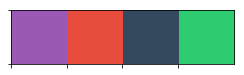

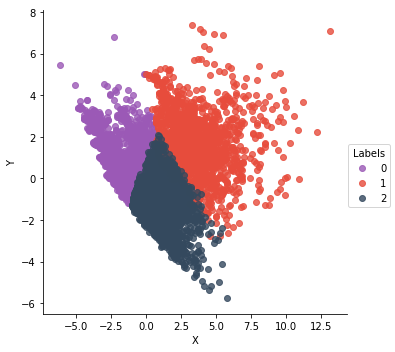

In [582]:
flatui = ["#9b59b6", "#e74c3c", "#34495e", "#2ecc71"]

sns.lmplot(x='X',y='Y',hue="Labels",data=fig,fit_reg=False,palette=flatui)

In [250]:
pd.Series(preds).value_counts(normalize=True)

0    0.4331
4    0.2227
2    0.1965
1    0.1063
3    0.0414
dtype: float64

In [260]:
train[train['CLUSTER']==4].describe()

,CUSTOMER_ID,TOTAL_SPENDS,PAST_1MONTH_SPENDS,PAST_2MONTH_SPENDS,PAST_3MONTH_SPENDS,PAST_6MONTH_SPENDS,TOTAL_FREQ,PAST_1MONTH_FREQ,PAST_2MONTH_FREQ,PAST_3MONTH_FREQ,MONTHS_SINCE_LAST_VISIT,INCOME,CLUSTER
count,2227.000000,2227.000000,2227.000000,2227.000000,2227.000000,2227.000000,2227.000000,2227.000000,2227.000000,2227.000000,2227.000000,2227.000000,2227.0
mean,4306.981141,1092.478671,63.416255,98.116749,140.417602,265.951055,42.574764,2.753929,4.653345,6.724742,1.017961,57.970364,4.0
std,2807.051945,545.526112,47.630518,70.750011,79.322597,124.173725,8.798950,1.231358,1.435086,1.781943,0.132841,23.052038,0.0
min,2.000000,307.000000,0.000000,13.000000,36.000000,83.000000,19.000000,0.000000,1.000000,3.000000,1.000000,21.000000,4.0
25%,1794.500000,657.500000,30.000000,57.000000,91.000000,177.000000,36.000000,2.000000,4.000000,6.000000,1.000000,45.500000,4.0
50%,4231.000000,893.000000,49.000000,75.000000,116.000000,228.000000,42.000000,3.000000,4.000000,7.000000,1.000000,55.500000,4.0
75%,6732.500000,1479.000000,78.000000,106.000000,161.000000,330.000000,47.000000,3.000000,5.000000,8.000000,1.000000,75.500000,4.0
max,9943.000000,3567.000000,296.000000,616.000000,690.000000,1038.000000,84.000000,8.000000,13.000000,15.000000,2.000000,100.000000,4.0


In [255]:
train.head()

,CUSTOMER_ID,TOTAL_SPENDS,PAST_1MONTH_SPENDS,PAST_2MONTH_SPENDS,PAST_3MONTH_SPENDS,PAST_6MONTH_SPENDS,TOTAL_FREQ,PAST_1MONTH_FREQ,PAST_2MONTH_FREQ,PAST_3MONTH_FREQ,MONTHS_SINCE_LAST_VISIT,INCOME,CLUSTER
0,1,881,39,52,83,489,39,2,3,4,1,65.5,0
1,2,639,26,87,135,204,43,2,7,9,1,35.5,4
2,3,432,0,9,73,189,28,0,1,5,2,35.5,2
3,4,1329,126,160,160,169,27,4,6,6,1,35.5,4
4,5,737,26,36,67,174,48,1,2,3,1,35.5,0


In [254]:
train.isnull().sum()

CUSTOMER_ID                0
TOTAL_SPENDS               0
PAST_1MONTH_SPENDS         0
PAST_2MONTH_SPENDS         0
PAST_3MONTH_SPENDS         0
PAST_6MONTH_SPENDS         0
TOTAL_FREQ                 0
PAST_1MONTH_FREQ           0
PAST_2MONTH_FREQ           0
PAST_3MONTH_FREQ           0
MONTHS_SINCE_LAST_VISIT    0
INCOME                     0
CLUSTER                    0
dtype: int64

In [279]:
len(order_details.CUSTOMER_ID.unique())

10000

In [560]:
## Recommendation Starts

In [288]:
## Considering a subset of data
rec=t[:'2004-01-01']

In [295]:
rec=rec.reset_index(drop=True)

In [307]:
data=rec.drop_duplicates(subset=['CUSTOMER_ID','ITEM_ID'])

In [349]:
data=data[['CUSTOMER_ID','ITEM_ID']]

In [350]:
data.head()

,CUSTOMER_ID,ITEM_ID
0,363,275
1,325,275
2,226,275
3,259,275
4,287,275


In [362]:
data=pd.merge(data,items[['ITEM_ID','ITEM_NAME']],on='ITEM_ID')

In [363]:
data.drop(['ITEM_ID'],axis=1,inplace=True)

In [364]:
data

,CUSTOMER_ID,ITEM_NAME
0,363,The Infinite Sadness
1,325,The Infinite Sadness
2,226,The Infinite Sadness
3,259,The Infinite Sadness
4,287,The Infinite Sadness
5,275,The Infinite Sadness
6,297,The Infinite Sadness
7,349,The Infinite Sadness
8,285,The Infinite Sadness
9,289,The Infinite Sadness


In [366]:
data.ITEM_NAME.nunique()

98

In [376]:
products=list(data.ITEM_NAME.unique())

In [374]:
data['CUSTOMER_ID'].nunique()

10000

In [439]:
li=[]
for i in range(1,10001):
    to_append=[]
    user_list=list(data[data['CUSTOMER_ID']==i]['ITEM_NAME'])
    for i in products:
        if i in user_list:
            to_append.append(1)
        else:
            to_append.append(0)
    li.append(to_append)

In [480]:
matrix=pd.DataFrame()

In [481]:
matrix=pd.DataFrame(li,columns=products)

In [482]:
matrix.insert(0,'User',pd.Series(range(0,10000)))

In [465]:
data_ibs = pd.DataFrame(index=matrix.drop(['User'],axis=1).columns,columns=matrix.drop(['User'],axis=1).columns)


In [466]:
for i in range(0,len(data_ibs.columns)) :
    for j in range(0,len(data_ibs.columns)) :
        data_ibs.iloc[i,j] = 1-cosine(matrix.drop(['User'],axis=1).iloc[:,i],matrix.drop(['User'],axis=1).iloc[:,j])

In [468]:
data_ibs.head(3)

,The Infinite Sadness,Small Soldiers,Sense and Sensibility,Hamlet,Original Musiquarium,Caddyshack,The Shining,How to Play Piano 1,Its A Mystery,The Velvet Rope,Collective Soul,Panasonic Digital Palmcorder Camcorder,...,Mulan,The Lion King,Test Your Baseball IQ,Sony Handycam Digital Recorder,Sharp Copier Toner,The Avengers,Throwing Copper,"Sharp 13"" 2-Head TV/VCR",The Year Without a Santa Claus,The Parent Trap,Gone,Big Willie Style
The Infinite Sadness,1,0.253793,0.212013,0.258632,0.177701,0.195327,0.144419,0.132064,0.240958,0.179612,0.232424,0.10615,...,0.192253,0.193759,0.0239663,0.123874,0.0643345,0.210264,0.188092,0.0723928,0.202016,0.184456,0.169277,0.152418
Small Soldiers,0.253793,1,0.28881,0.321668,0.240663,0.265862,0.205439,0.187634,0.299572,0.242733,0.312123,0.122637,...,0.273757,0.256648,0.0352399,0.165814,0.0864889,0.273613,0.244372,0.0989948,0.264825,0.250843,0.213216,0.198915
Sense and Sensibility,0.212013,0.28881,1,0.288873,0.213779,0.226216,0.181823,0.142311,0.264269,0.213074,0.270561,0.121813,...,0.229912,0.22918,0.00813452,0.146432,0.0701875,0.243218,0.222969,0.0749422,0.224477,0.232515,0.200671,0.162129


In [467]:
data_neighbours = pd.DataFrame(index=data_ibs.columns,columns=range(1,11))
 
for i in range(0,len(data_ibs.columns)):
    data_neighbours.iloc[i,:10] = data_ibs.iloc[0:,i].sort_values(ascending=False)[:10].index

In [489]:
data_neighbours.head(3)

,1,2,3,4,5,6,7,8,9,10
The Infinite Sadness,The Infinite Sadness,New Beginning,Ballbreaker,Bridge,Hamlet,Cracked Rearview,Small Soldiers,Waiting to Exhale: The Soundtrack,Don Henley's Greatest Hits,Lucy
Small Soldiers,Small Soldiers,Ballbreaker,New Beginning,Bridge,Home,Daydream,Whaler,Cracked Rearview,Lucy,Another Night
Sense and Sensibility,Sense and Sensibility,New Beginning,Ballbreaker,Cracked Rearview,Waiting to Exhale: The Soundtrack,Daydream,Hamlet,Small Soldiers,The Rugrats Movie,Lucy


In [508]:
data_neighbours.head(6).iloc[:6,:]


,1,2,3,4,5,6,7,8,9,10
The Infinite Sadness,The Infinite Sadness,New Beginning,Ballbreaker,Bridge,Hamlet,Cracked Rearview,Small Soldiers,Waiting to Exhale: The Soundtrack,Don Henley's Greatest Hits,Lucy
Small Soldiers,Small Soldiers,Ballbreaker,New Beginning,Bridge,Home,Daydream,Whaler,Cracked Rearview,Lucy,Another Night
Sense and Sensibility,Sense and Sensibility,New Beginning,Ballbreaker,Cracked Rearview,Waiting to Exhale: The Soundtrack,Daydream,Hamlet,Small Soldiers,The Rugrats Movie,Lucy
Hamlet,Hamlet,New Beginning,Ballbreaker,Bridge,Whaler,Another Night,Home,Waiting to Exhale: The Soundtrack,The Rugrats Movie,Ozzmosis
Original Musiquarium,Original Musiquarium,Ballbreaker,New Beginning,Whaler,Small Soldiers,Lucy,Babe,Don Henley's Greatest Hits,Bridge,The Rugrats Movie
Caddyshack,Caddyshack,New Beginning,Ballbreaker,Lucy,Hamlet,Whaler,Bridge,Home,Don Henley's Greatest Hits,Cracked Rearview


In [511]:
data_neighbours.loc[product][:10]

1                  The Infinite Sadness
2                         New Beginning
3                           Ballbreaker
4                                Bridge
5                                Hamlet
6                      Cracked Rearview
7                        Small Soldiers
8     Waiting to Exhale: The Soundtrack
9            Don Henley's Greatest Hits
10                                 Lucy
Name: The Infinite Sadness, dtype: object

In [483]:
def getScore(history, similarities):
   return sum(history*similarities)/sum(similarities)

In [484]:
data_sims = pd.DataFrame(index=matrix.index,columns=matrix.columns)
data_sims.iloc[:,:1] = matrix.iloc[:,:1]


In [485]:
data_sims.head(3)

,User,The Infinite Sadness,Small Soldiers,Sense and Sensibility,Hamlet,Original Musiquarium,Caddyshack,The Shining,How to Play Piano 1,Its A Mystery,The Velvet Rope,Collective Soul,...,Mulan,The Lion King,Test Your Baseball IQ,Sony Handycam Digital Recorder,Sharp Copier Toner,The Avengers,Throwing Copper,"Sharp 13"" 2-Head TV/VCR",The Year Without a Santa Claus,The Parent Trap,Gone,Big Willie Style
0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [478]:
data_sims.index[0]

0

In [520]:
for i in range(0,len(data_sims.index)):
    for j in range(1,len(data_sims.columns)):
        print i,j
        user = data_sims.index[i]
#         product = str(data_sims.columns[j])
        if matrix.iloc[i][j] == 1:
            data_sims.iloc[i][j] = 0
        else:
            product_top_names = data_neighbours.loc[str(data_sims.columns[j])][:10]
            product_top_sims = data_ibs.loc[product].sort_values(ascending=False)[:10]
            user_purchases = matrix.drop(['User'],axis=1).loc[user,product_top_names]
 
            data_sims.iloc[i][j] = getScore(user_purchases,product_top_sims)

0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
1 1
1 2
1 3
1 4
1 5
1 6
1 7
1 8
1 9
1 10
1 11
1 12
1 13
1 14
1 15
1 16
1 17
1 18
1 19
1 20
1 21
1 22
1 23
1 24
1 25
1 26
1 27
1 28
1 29
1 30
1 31
1 32
1 33
1 34
1 35
1 36
1 37
1 38
1 39
1 40
1 41
1 42
1 43
1 44
1 45
1 46
1 47
1 48
1 49
1 50
1 51
1 52
1 53
1 54
1 55
1 56
1 57
1 58
1 59
1 60
1 61
1 62
1 63
1 64
1 65
1 66
1 67
1 68
1 69
1 70
1 71
1 72
1 73
1 74
1 75
1 76
1 77
1 78
1 79
1 80
1 81
1 82
1 83
1 84
1 85
1 86
1 87
1 88
1 89
1 90
1 91
1 92
1 93
1 94
1 95
1 96
1 97
1 98
2 1
2 2
2 3
2 4
2 5
2 6
2 7
2 8
2 9
2 

16 39
16 40
16 41
16 42
16 43
16 44
16 45
16 46
16 47
16 48
16 49
16 50
16 51
16 52
16 53
16 54
16 55
16 56
16 57
16 58
16 59
16 60
16 61
16 62
16 63
16 64
16 65
16 66
16 67
16 68
16 69
16 70
16 71
16 72
16 73
16 74
16 75
16 76
16 77
16 78
16 79
16 80
16 81
16 82
16 83
16 84
16 85
16 86
16 87
16 88
16 89
16 90
16 91
16 92
16 93
16 94
16 95
16 96
16 97
16 98
17 1
17 2
17 3
17 4
17 5
17 6
17 7
17 8
17 9
17 10
17 11
17 12
17 13
17 14
17 15
17 16
17 17
17 18
17 19
17 20
17 21
17 22
17 23
17 24
17 25
17 26
17 27
17 28
17 29
17 30
17 31
17 32
17 33
17 34
17 35
17 36
17 37
17 38
17 39
17 40
17 41
17 42
17 43
17 44
17 45
17 46
17 47
17 48
17 49
17 50
17 51
17 52
17 53
17 54
17 55
17 56
17 57
17 58
17 59
17 60
17 61
17 62
17 63
17 64
17 65
17 66
17 67
17 68
17 69
17 70
17 71
17 72
17 73
17 74
17 75
17 76
17 77
17 78
17 79
17 80
17 81
17 82
17 83
17 84
17 85
17 86
17 87
17 88
17 89
17 90
17 91
17 92
17 93
17 94
17 95
17 96
17 97
17 98
18 1
18 2
18 3
18 4
18 5
18 6
18 7
18 8
18 9
18 10
18 11
18 1

33 27
33 28
33 29
33 30
33 31
33 32
33 33
33 34
33 35
33 36
33 37
33 38
33 39
33 40
33 41
33 42
33 43
33 44
33 45
33 46
33 47
33 48
33 49
33 50
33 51
33 52
33 53
33 54
33 55
33 56
33 57
33 58
33 59
33 60
33 61
33 62
33 63
33 64
33 65
33 66
33 67
33 68
33 69
33 70
33 71
33 72
33 73
33 74
33 75
33 76
33 77
33 78
33 79
33 80
33 81
33 82
33 83
33 84
33 85
33 86
33 87
33 88
33 89
33 90
33 91
33 92
33 93
33 94
33 95
33 96
33 97
33 98
34 1
34 2
34 3
34 4
34 5
34 6
34 7
34 8
34 9
34 10
34 11
34 12
34 13
34 14
34 15
34 16
34 17
34 18
34 19
34 20
34 21
34 22
34 23
34 24
34 25
34 26
34 27
34 28
34 29
34 30
34 31
34 32
34 33
34 34
34 35
34 36
34 37
34 38
34 39
34 40
34 41
34 42
34 43
34 44
34 45
34 46
34 47
34 48
34 49
34 50
34 51
34 52
34 53
34 54
34 55
34 56
34 57
34 58
34 59
34 60
34 61
34 62
34 63
34 64
34 65
34 66
34 67
34 68
34 69
34 70
34 71
34 72
34 73
34 74
34 75
34 76
34 77
34 78
34 79
34 80
34 81
34 82
34 83
34 84
34 85
34 86
34 87
34 88
34 89
34 90
34 91
34 92
34 93
34 94
34 95
34 96
3

47 74
47 75
47 76
47 77
47 78
47 79
47 80
47 81
47 82
47 83
47 84
47 85
47 86
47 87
47 88
47 89
47 90
47 91
47 92
47 93
47 94
47 95
47 96
47 97
47 98
48 1
48 2
48 3
48 4
48 5
48 6
48 7
48 8
48 9
48 10
48 11
48 12
48 13
48 14
48 15
48 16
48 17
48 18
48 19
48 20
48 21
48 22
48 23
48 24
48 25
48 26
48 27
48 28
48 29
48 30
48 31
48 32
48 33
48 34
48 35
48 36
48 37
48 38
48 39
48 40
48 41
48 42
48 43
48 44
48 45
48 46
48 47
48 48
48 49
48 50
48 51
48 52
48 53
48 54
48 55
48 56
48 57
48 58
48 59
48 60
48 61
48 62
48 63
48 64
48 65
48 66
48 67
48 68
48 69
48 70
48 71
48 72
48 73
48 74
48 75
48 76
48 77
48 78
48 79
48 80
48 81
48 82
48 83
48 84
48 85
48 86
48 87
48 88
48 89
48 90
48 91
48 92
48 93
48 94
48 95
48 96
48 97
48 98
49 1
49 2
49 3
49 4
49 5
49 6
49 7
49 8
49 9
49 10
49 11
49 12
49 13
49 14
49 15
49 16
49 17
49 18
49 19
49 20
49 21
49 22
49 23
49 24
49 25
49 26
49 27
49 28
49 29
49 30
49 31
49 32
49 33
49 34
49 35
49 36
49 37
49 38
49 39
49 40
49 41
49 42
49 43
49 44
49 45
49 46
49 4

64 43
64 44
64 45
64 46
64 47
64 48
64 49
64 50
64 51
64 52
64 53
64 54
64 55
64 56
64 57
64 58
64 59
64 60
64 61
64 62
64 63
64 64
64 65
64 66
64 67
64 68
64 69
64 70
64 71
64 72
64 73
64 74
64 75
64 76
64 77
64 78
64 79
64 80
64 81
64 82
64 83
64 84
64 85
64 86
64 87
64 88
64 89
64 90
64 91
64 92
64 93
64 94
64 95
64 96
64 97
64 98
65 1
65 2
65 3
65 4
65 5
65 6
65 7
65 8
65 9
65 10
65 11
65 12
65 13
65 14
65 15
65 16
65 17
65 18
65 19
65 20
65 21
65 22
65 23
65 24
65 25
65 26
65 27
65 28
65 29
65 30
65 31
65 32
65 33
65 34
65 35
65 36
65 37
65 38
65 39
65 40
65 41
65 42
65 43
65 44
65 45
65 46
65 47
65 48
65 49
65 50
65 51
65 52
65 53
65 54
65 55
65 56
65 57
65 58
65 59
65 60
65 61
65 62
65 63
65 64
65 65
65 66
65 67
65 68
65 69
65 70
65 71
65 72
65 73
65 74
65 75
65 76
65 77
65 78
65 79
65 80
65 81
65 82
65 83
65 84
65 85
65 86
65 87
65 88
65 89
65 90
65 91
65 92
65 93
65 94
65 95
65 96
65 97
65 98
66 1
66 2
66 3
66 4
66 5
66 6
66 7
66 8
66 9
66 10
66 11
66 12
66 13
66 14
66 15
66 1

79 7
79 8
79 9
79 10
79 11
79 12
79 13
79 14
79 15
79 16
79 17
79 18
79 19
79 20
79 21
79 22
79 23
79 24
79 25
79 26
79 27
79 28
79 29
79 30
79 31
79 32
79 33
79 34
79 35
79 36
79 37
79 38
79 39
79 40
79 41
79 42
79 43
79 44
79 45
79 46
79 47
79 48
79 49
79 50
79 51
79 52
79 53
79 54
79 55
79 56
79 57
79 58
79 59
79 60
79 61
79 62
79 63
79 64
79 65
79 66
79 67
79 68
79 69
79 70
79 71
79 72
79 73
79 74
79 75
79 76
79 77
79 78
79 79
79 80
79 81
79 82
79 83
79 84
79 85
79 86
79 87
79 88
79 89
79 90
79 91
79 92
79 93
79 94
79 95
79 96
79 97
79 98
80 1
80 2
80 3
80 4
80 5
80 6
80 7
80 8
80 9
80 10
80 11
80 12
80 13
80 14
80 15
80 16
80 17
80 18
80 19
80 20
80 21
80 22
80 23
80 24
80 25
80 26
80 27
80 28
80 29
80 30
80 31
80 32
80 33
80 34
80 35
80 36
80 37
80 38
80 39
80 40
80 41
80 42
80 43
80 44
80 45
80 46
80 47
80 48
80 49
80 50
80 51
80 52
80 53
80 54
80 55
80 56
80 57
80 58
80 59
80 60
80 61
80 62
80 63
80 64
80 65
80 66
80 67
80 68
80 69
80 70
80 71
80 72
80 73
80 74
80 75
80 76
80 7

96 91
96 92
96 93
96 94
96 95
96 96
96 97
96 98
97 1
97 2
97 3
97 4
97 5
97 6
97 7
97 8
97 9
97 10
97 11
97 12
97 13
97 14
97 15
97 16
97 17
97 18
97 19
97 20
97 21
97 22
97 23
97 24
97 25
97 26
97 27
97 28
97 29
97 30
97 31
97 32
97 33
97 34
97 35
97 36
97 37
97 38
97 39
97 40
97 41
97 42
97 43
97 44
97 45
97 46
97 47
97 48
97 49
97 50
97 51
97 52
97 53
97 54
97 55
97 56
97 57
97 58
97 59
97 60
97 61
97 62
97 63
97 64
97 65
97 66
97 67
97 68
97 69
97 70
97 71
97 72
97 73
97 74
97 75
97 76
97 77
97 78
97 79
97 80
97 81
97 82
97 83
97 84
97 85
97 86
97 87
97 88
97 89
97 90
97 91
97 92
97 93
97 94
97 95
97 96
97 97
97 98
98 1
98 2
98 3
98 4
98 5
98 6
98 7
98 8
98 9
98 10
98 11
98 12
98 13
98 14
98 15
98 16
98 17
98 18
98 19
98 20
98 21
98 22
98 23
98 24
98 25
98 26
98 27
98 28
98 29
98 30
98 31
98 32
98 33
98 34
98 35
98 36
98 37
98 38
98 39
98 40
98 41
98 42
98 43
98 44
98 45
98 46
98 47
98 48
98 49
98 50
98 51
98 52
98 53
98 54
98 55
98 56
98 57
98 58
98 59
98 60
98 61
98 62
98 63
98 6

109 92
109 93
109 94
109 95
109 96
109 97
109 98
110 1
110 2
110 3
110 4
110 5
110 6
110 7
110 8
110 9
110 10
110 11
110 12
110 13
110 14
110 15
110 16
110 17
110 18
110 19
110 20
110 21
110 22
110 23
110 24
110 25
110 26
110 27
110 28
110 29
110 30
110 31
110 32
110 33
110 34
110 35
110 36
110 37
110 38
110 39
110 40
110 41
110 42
110 43
110 44
110 45
110 46
110 47
110 48
110 49
110 50
110 51
110 52
110 53
110 54
110 55
110 56
110 57
110 58
110 59
110 60
110 61
110 62
110 63
110 64
110 65
110 66
110 67
110 68
110 69
110 70
110 71
110 72
110 73
110 74
110 75
110 76
110 77
110 78
110 79
110 80
110 81
110 82
110 83
110 84
110 85
110 86
110 87
110 88
110 89
110 90
110 91
110 92
110 93
110 94
110 95
110 96
110 97
110 98
111 1
111 2
111 3
111 4
111 5
111 6
111 7
111 8
111 9
111 10
111 11
111 12
111 13
111 14
111 15
111 16
111 17
111 18
111 19
111 20
111 21
111 22
111 23
111 24
111 25
111 26
111 27
111 28
111 29
111 30
111 31
111 32
111 33
111 34
111 35
111 36
111 37
111 38
111 39
111 40
111

122 39
122 40
122 41
122 42
122 43
122 44
122 45
122 46
122 47
122 48
122 49
122 50
122 51
122 52
122 53
122 54
122 55
122 56
122 57
122 58
122 59
122 60
122 61
122 62
122 63
122 64
122 65
122 66
122 67
122 68
122 69
122 70
122 71
122 72
122 73
122 74
122 75
122 76
122 77
122 78
122 79
122 80
122 81
122 82
122 83
122 84
122 85
122 86
122 87
122 88
122 89
122 90
122 91
122 92
122 93
122 94
122 95
122 96
122 97
122 98
123 1
123 2
123 3
123 4
123 5
123 6
123 7
123 8
123 9
123 10
123 11
123 12
123 13
123 14
123 15
123 16
123 17
123 18
123 19
123 20
123 21
123 22
123 23
123 24
123 25
123 26
123 27
123 28
123 29
123 30
123 31
123 32
123 33
123 34
123 35
123 36
123 37
123 38
123 39
123 40
123 41
123 42
123 43
123 44
123 45
123 46
123 47
123 48
123 49
123 50
123 51
123 52
123 53
123 54
123 55
123 56
123 57
123 58
123 59
123 60
123 61
123 62
123 63
123 64
123 65
123 66
123 67
123 68
123 69
123 70
123 71
123 72
123 73
123 74
123 75
123 76
123 77
123 78
123 79
123 80
123 81
123 82
123 83
123 84
1

135 47
135 48
135 49
135 50
135 51
135 52
135 53
135 54
135 55
135 56
135 57
135 58
135 59
135 60
135 61
135 62
135 63
135 64
135 65
135 66
135 67
135 68
135 69
135 70
135 71
135 72
135 73
135 74
135 75
135 76
135 77
135 78
135 79
135 80
135 81
135 82
135 83
135 84
135 85
135 86
135 87
135 88
135 89
135 90
135 91
135 92
135 93
135 94
135 95
135 96
135 97
135 98
136 1
136 2
136 3
136 4
136 5
136 6
136 7
136 8
136 9
136 10
136 11
136 12
136 13
136 14
136 15
136 16
136 17
136 18
136 19
136 20
136 21
136 22
136 23
136 24
136 25
136 26
136 27
136 28
136 29
136 30
136 31
136 32
136 33
136 34
136 35
136 36
136 37
136 38
136 39
136 40
136 41
136 42
136 43
136 44
136 45
136 46
136 47
136 48
136 49
136 50
136 51
136 52
136 53
136 54
136 55
136 56
136 57
136 58
136 59
136 60
136 61
136 62
136 63
136 64
136 65
136 66
136 67
136 68
136 69
136 70
136 71
136 72
136 73
136 74
136 75
136 76
136 77
136 78
136 79
136 80
136 81
136 82
136 83
136 84
136 85
136 86
136 87
136 88
136 89
136 90
136 91
136 92
1

150 46
150 47
150 48
150 49
150 50
150 51
150 52
150 53
150 54
150 55
150 56
150 57
150 58
150 59
150 60
150 61
150 62
150 63
150 64
150 65
150 66
150 67
150 68
150 69
150 70
150 71
150 72
150 73
150 74
150 75
150 76
150 77
150 78
150 79
150 80
150 81
150 82
150 83
150 84
150 85
150 86
150 87
150 88
150 89
150 90
150 91
150 92
150 93
150 94
150 95
150 96
150 97
150 98
151 1
151 2
151 3
151 4
151 5
151 6
151 7
151 8
151 9
151 10
151 11
151 12
151 13
151 14
151 15
151 16
151 17
151 18
151 19
151 20
151 21
151 22
151 23
151 24
151 25
151 26
151 27
151 28
151 29
151 30
151 31
151 32
151 33
151 34
151 35
151 36
151 37
151 38
151 39
151 40
151 41
151 42
151 43
151 44
151 45
151 46
151 47
151 48
151 49
151 50
151 51
151 52
151 53
151 54
151 55
151 56
151 57
151 58
151 59
151 60
151 61
151 62
151 63
151 64
151 65
151 66
151 67
151 68
151 69
151 70
151 71
151 72
151 73
151 74
151 75
151 76
151 77
151 78
151 79
151 80
151 81
151 82
151 83
151 84
151 85
151 86
151 87
151 88
151 89
151 90
151 91
1

165 71
165 72
165 73
165 74
165 75
165 76
165 77
165 78
165 79
165 80
165 81
165 82
165 83
165 84
165 85
165 86
165 87
165 88
165 89
165 90
165 91
165 92
165 93
165 94
165 95
165 96
165 97
165 98
166 1
166 2
166 3
166 4
166 5
166 6
166 7
166 8
166 9
166 10
166 11
166 12
166 13
166 14
166 15
166 16
166 17
166 18
166 19
166 20
166 21
166 22
166 23
166 24
166 25
166 26
166 27
166 28
166 29
166 30
166 31
166 32
166 33
166 34
166 35
166 36
166 37
166 38
166 39
166 40
166 41
166 42
166 43
166 44
166 45
166 46
166 47
166 48
166 49
166 50
166 51
166 52
166 53
166 54
166 55
166 56
166 57
166 58
166 59
166 60
166 61
166 62
166 63
166 64
166 65
166 66
166 67
166 68
166 69
166 70
166 71
166 72
166 73
166 74
166 75
166 76
166 77
166 78
166 79
166 80
166 81
166 82
166 83
166 84
166 85
166 86
166 87
166 88
166 89
166 90
166 91
166 92
166 93
166 94
166 95
166 96
166 97
166 98
167 1
167 2
167 3
167 4
167 5
167 6
167 7
167 8
167 9
167 10
167 11
167 12
167 13
167 14
167 15
167 16
167 17
167 18
167 19
167

181 4
181 5
181 6
181 7
181 8
181 9
181 10
181 11
181 12
181 13
181 14
181 15
181 16
181 17
181 18
181 19
181 20
181 21
181 22
181 23
181 24
181 25
181 26
181 27
181 28
181 29
181 30
181 31
181 32
181 33
181 34
181 35
181 36
181 37
181 38
181 39
181 40
181 41
181 42
181 43
181 44
181 45
181 46
181 47
181 48
181 49
181 50
181 51
181 52
181 53
181 54
181 55
181 56
181 57
181 58
181 59
181 60
181 61
181 62
181 63
181 64
181 65
181 66
181 67
181 68
181 69
181 70
181 71
181 72
181 73
181 74
181 75
181 76
181 77
181 78
181 79
181 80
181 81
181 82
181 83
181 84
181 85
181 86
181 87
181 88
181 89
181 90
181 91
181 92
181 93
181 94
181 95
181 96
181 97
181 98
182 1
182 2
182 3
182 4
182 5
182 6
182 7
182 8
182 9
182 10
182 11
182 12
182 13
182 14
182 15
182 16
182 17
182 18
182 19
182 20
182 21
182 22
182 23
182 24
182 25
182 26
182 27
182 28
182 29
182 30
182 31
182 32
182 33
182 34
182 35
182 36
182 37
182 38
182 39
182 40
182 41
182 42
182 43
182 44
182 45
182 46
182 47
182 48
182 49
182 50


195 40
195 41
195 42
195 43
195 44
195 45
195 46
195 47
195 48
195 49
195 50
195 51
195 52
195 53
195 54
195 55
195 56
195 57
195 58
195 59
195 60
195 61
195 62
195 63
195 64
195 65
195 66
195 67
195 68
195 69
195 70
195 71
195 72
195 73
195 74
195 75
195 76
195 77
195 78
195 79
195 80
195 81
195 82
195 83
195 84
195 85
195 86
195 87
195 88
195 89
195 90
195 91
195 92
195 93
195 94
195 95
195 96
195 97
195 98
196 1
196 2
196 3
196 4
196 5
196 6
196 7
196 8
196 9
196 10
196 11
196 12
196 13
196 14
196 15
196 16
196 17
196 18
196 19
196 20
196 21
196 22
196 23
196 24
196 25
196 26
196 27
196 28
196 29
196 30
196 31
196 32
196 33
196 34
196 35
196 36
196 37
196 38
196 39
196 40
196 41
196 42
196 43
196 44
196 45
196 46
196 47
196 48
196 49
196 50
196 51
196 52
196 53
196 54
196 55
196 56
196 57
196 58
196 59
196 60
196 61
196 62
196 63
196 64
196 65
196 66
196 67
196 68
196 69
196 70
196 71
196 72
196 73
196 74
196 75
196 76
196 77
196 78
196 79
196 80
196 81
196 82
196 83
196 84
196 85
1

211 61
211 62
211 63
211 64
211 65
211 66
211 67
211 68
211 69
211 70
211 71
211 72
211 73
211 74
211 75
211 76
211 77
211 78
211 79
211 80
211 81
211 82
211 83
211 84
211 85
211 86
211 87
211 88
211 89
211 90
211 91
211 92
211 93
211 94
211 95
211 96
211 97
211 98
212 1
212 2
212 3
212 4
212 5
212 6
212 7
212 8
212 9
212 10
212 11
212 12
212 13
212 14
212 15
212 16
212 17
212 18
212 19
212 20
212 21
212 22
212 23
212 24
212 25
212 26
212 27
212 28
212 29
212 30
212 31
212 32
212 33
212 34
212 35
212 36
212 37
212 38
212 39
212 40
212 41
212 42
212 43
212 44
212 45
212 46
212 47
212 48
212 49
212 50
212 51
212 52
212 53
212 54
212 55
212 56
212 57
212 58
212 59
212 60
212 61
212 62
212 63
212 64
212 65
212 66
212 67
212 68
212 69
212 70
212 71
212 72
212 73
212 74
212 75
212 76
212 77
212 78
212 79
212 80
212 81
212 82
212 83
212 84
212 85
212 86
212 87
212 88
212 89
212 90
212 91
212 92
212 93
212 94
212 95
212 96
212 97
212 98
213 1
213 2
213 3
213 4
213 5
213 6
213 7
213 8
213 9
213

224 92
224 93
224 94
224 95
224 96
224 97
224 98
225 1
225 2
225 3
225 4
225 5
225 6
225 7
225 8
225 9
225 10
225 11
225 12
225 13
225 14
225 15
225 16
225 17
225 18
225 19
225 20
225 21
225 22
225 23
225 24
225 25
225 26
225 27
225 28
225 29
225 30
225 31
225 32
225 33
225 34
225 35
225 36
225 37
225 38
225 39
225 40
225 41
225 42
225 43
225 44
225 45
225 46
225 47
225 48
225 49
225 50
225 51
225 52
225 53
225 54
225 55
225 56
225 57
225 58
225 59
225 60
225 61
225 62
225 63
225 64
225 65
225 66
225 67
225 68
225 69
225 70
225 71
225 72
225 73
225 74
225 75
225 76
225 77
225 78
225 79
225 80
225 81
225 82
225 83
225 84
225 85
225 86
225 87
225 88
225 89
225 90
225 91
225 92
225 93
225 94
225 95
225 96
225 97
225 98
226 1
226 2
226 3
226 4
226 5
226 6
226 7
226 8
226 9
226 10
226 11
226 12
226 13
226 14
226 15
226 16
226 17
226 18
226 19
226 20
226 21
226 22
226 23
226 24
226 25
226 26
226 27
226 28
226 29
226 30
226 31
226 32
226 33
226 34
226 35
226 36
226 37
226 38
226 39
226 40
226

238 44
238 45
238 46
238 47
238 48
238 49
238 50
238 51
238 52
238 53
238 54
238 55
238 56
238 57
238 58
238 59
238 60
238 61
238 62
238 63
238 64
238 65
238 66
238 67
238 68
238 69
238 70
238 71
238 72
238 73
238 74
238 75
238 76
238 77
238 78
238 79
238 80
238 81
238 82
238 83
238 84
238 85
238 86
238 87
238 88
238 89
238 90
238 91
238 92
238 93
238 94
238 95
238 96
238 97
238 98
239 1
239 2
239 3
239 4
239 5
239 6
239 7
239 8
239 9
239 10
239 11
239 12
239 13
239 14
239 15
239 16
239 17
239 18
239 19
239 20
239 21
239 22
239 23
239 24
239 25
239 26
239 27
239 28
239 29
239 30
239 31
239 32
239 33
239 34
239 35
239 36
239 37
239 38
239 39
239 40
239 41
239 42
239 43
239 44
239 45
239 46
239 47
239 48
239 49
239 50
239 51
239 52
239 53
239 54
239 55
239 56
239 57
239 58
239 59
239 60
239 61
239 62
239 63
239 64
239 65
239 66
239 67
239 68
239 69
239 70
239 71
239 72
239 73
239 74
239 75
239 76
239 77
239 78
239 79
239 80
239 81
239 82
239 83
239 84
239 85
239 86
239 87
239 88
239 89
2

251 8
251 9
251 10
251 11
251 12
251 13
251 14
251 15
251 16
251 17
251 18
251 19
251 20
251 21
251 22
251 23
251 24
251 25
251 26
251 27
251 28
251 29
251 30
251 31
251 32
251 33
251 34
251 35
251 36
251 37
251 38
251 39
251 40
251 41
251 42
251 43
251 44
251 45
251 46
251 47
251 48
251 49
251 50
251 51
251 52
251 53
251 54
251 55
251 56
251 57
251 58
251 59
251 60
251 61
251 62
251 63
251 64
251 65
251 66
251 67
251 68
251 69
251 70
251 71
251 72
251 73
251 74
251 75
251 76
251 77
251 78
251 79
251 80
251 81
251 82
251 83
251 84
251 85
251 86
251 87
251 88
251 89
251 90
251 91
251 92
251 93
251 94
251 95
251 96
251 97
251 98
252 1
252 2
252 3
252 4
252 5
252 6
252 7
252 8
252 9
252 10
252 11
252 12
252 13
252 14
252 15
252 16
252 17
252 18
252 19
252 20
252 21
252 22
252 23
252 24
252 25
252 26
252 27
252 28
252 29
252 30
252 31
252 32
252 33
252 34
252 35
252 36
252 37
252 38
252 39
252 40
252 41
252 42
252 43
252 44
252 45
252 46
252 47
252 48
252 49
252 50
252 51
252 52
252 53
252

265 16
265 17
265 18
265 19
265 20
265 21
265 22
265 23
265 24
265 25
265 26
265 27
265 28
265 29
265 30
265 31
265 32
265 33
265 34
265 35
265 36
265 37
265 38
265 39
265 40
265 41
265 42
265 43
265 44
265 45
265 46
265 47
265 48
265 49
265 50
265 51
265 52
265 53
265 54
265 55
265 56
265 57
265 58
265 59
265 60
265 61
265 62
265 63
265 64
265 65
265 66
265 67
265 68
265 69
265 70
265 71
265 72
265 73
265 74
265 75
265 76
265 77
265 78
265 79
265 80
265 81
265 82
265 83
265 84
265 85
265 86
265 87
265 88
265 89
265 90
265 91
265 92
265 93
265 94
265 95
265 96
265 97
265 98
266 1
266 2
266 3
266 4
266 5
266 6
266 7
266 8
266 9
266 10
266 11
266 12
266 13
266 14
266 15
266 16
266 17
266 18
266 19
266 20
266 21
266 22
266 23
266 24
266 25
266 26
266 27
266 28
266 29
266 30
266 31
266 32
266 33
266 34
266 35
266 36
266 37
266 38
266 39
266 40
266 41
266 42
266 43
266 44
266 45
266 46
266 47
266 48
266 49
266 50
266 51
266 52
266 53
266 54
266 55
266 56
266 57
266 58
266 59
266 60
266 61
2

278 6
278 7
278 8
278 9
278 10
278 11
278 12
278 13
278 14
278 15
278 16
278 17
278 18
278 19
278 20
278 21
278 22
278 23
278 24
278 25
278 26
278 27
278 28
278 29
278 30
278 31
278 32
278 33
278 34
278 35
278 36
278 37
278 38
278 39
278 40
278 41
278 42
278 43
278 44
278 45
278 46
278 47
278 48
278 49
278 50
278 51
278 52
278 53
278 54
278 55
278 56
278 57
278 58
278 59
278 60
278 61
278 62
278 63
278 64
278 65
278 66
278 67
278 68
278 69
278 70
278 71
278 72
278 73
278 74
278 75
278 76
278 77
278 78
278 79
278 80
278 81
278 82
278 83
278 84
278 85
278 86
278 87
278 88
278 89
278 90
278 91
278 92
278 93
278 94
278 95
278 96
278 97
278 98
279 1
279 2
279 3
279 4
279 5
279 6
279 7
279 8
279 9
279 10
279 11
279 12
279 13
279 14
279 15
279 16
279 17
279 18
279 19
279 20
279 21
279 22
279 23
279 24
279 25
279 26
279 27
279 28
279 29
279 30
279 31
279 32
279 33
279 34
279 35
279 36
279 37
279 38
279 39
279 40
279 41
279 42
279 43
279 44
279 45
279 46
279 47
279 48
279 49
279 50
279 51
279 5

293 16
293 17
293 18
293 19
293 20
293 21
293 22
293 23
293 24
293 25
293 26
293 27
293 28
293 29
293 30
293 31
293 32
293 33
293 34
293 35
293 36
293 37
293 38
293 39
293 40
293 41
293 42
293 43
293 44
293 45
293 46
293 47
293 48
293 49
293 50
293 51
293 52
293 53
293 54
293 55
293 56
293 57
293 58
293 59
293 60
293 61
293 62
293 63
293 64
293 65
293 66
293 67
293 68
293 69
293 70
293 71
293 72
293 73
293 74
293 75
293 76
293 77
293 78
293 79
293 80
293 81
293 82
293 83
293 84
293 85
293 86
293 87
293 88
293 89
293 90
293 91
293 92
293 93
293 94
293 95
293 96
293 97
293 98
294 1
294 2
294 3
294 4
294 5
294 6
294 7
294 8
294 9
294 10
294 11
294 12
294 13
294 14
294 15
294 16
294 17
294 18
294 19
294 20
294 21
294 22
294 23
294 24
294 25
294 26
294 27
294 28
294 29
294 30
294 31
294 32
294 33
294 34
294 35
294 36
294 37
294 38
294 39
294 40
294 41
294 42
294 43
294 44
294 45
294 46
294 47
294 48
294 49
294 50
294 51
294 52
294 53
294 54
294 55
294 56
294 57
294 58
294 59
294 60
294 61
2

306 83
306 84
306 85
306 86
306 87
306 88
306 89
306 90
306 91
306 92
306 93
306 94
306 95
306 96
306 97
306 98
307 1
307 2
307 3
307 4
307 5
307 6
307 7
307 8
307 9
307 10
307 11
307 12
307 13
307 14
307 15
307 16
307 17
307 18
307 19
307 20
307 21
307 22
307 23
307 24
307 25
307 26
307 27
307 28
307 29
307 30
307 31
307 32
307 33
307 34
307 35
307 36
307 37
307 38
307 39
307 40
307 41
307 42
307 43
307 44
307 45
307 46
307 47
307 48
307 49
307 50
307 51
307 52
307 53
307 54
307 55
307 56
307 57
307 58
307 59
307 60
307 61
307 62
307 63
307 64
307 65
307 66
307 67
307 68
307 69
307 70
307 71
307 72
307 73
307 74
307 75
307 76
307 77
307 78
307 79
307 80
307 81
307 82
307 83
307 84
307 85
307 86
307 87
307 88
307 89
307 90
307 91
307 92
307 93
307 94
307 95
307 96
307 97
307 98
308 1
308 2
308 3
308 4
308 5
308 6
308 7
308 8
308 9
308 10
308 11
308 12
308 13
308 14
308 15
308 16
308 17
308 18
308 19
308 20
308 21
308 22
308 23
308 24
308 25
308 26
308 27
308 28
308 29
308 30
308 31
308

321 36
321 37
321 38
321 39
321 40
321 41
321 42
321 43
321 44
321 45
321 46
321 47
321 48
321 49
321 50
321 51
321 52
321 53
321 54
321 55
321 56
321 57
321 58
321 59
321 60
321 61
321 62
321 63
321 64
321 65
321 66
321 67
321 68
321 69
321 70
321 71
321 72
321 73
321 74
321 75
321 76
321 77
321 78
321 79
321 80
321 81
321 82
321 83
321 84
321 85
321 86
321 87
321 88
321 89
321 90
321 91
321 92
321 93
321 94
321 95
321 96
321 97
321 98
322 1
322 2
322 3
322 4
322 5
322 6
322 7
322 8
322 9
322 10
322 11
322 12
322 13
322 14
322 15
322 16
322 17
322 18
322 19
322 20
322 21
322 22
322 23
322 24
322 25
322 26
322 27
322 28
322 29
322 30
322 31
322 32
322 33
322 34
322 35
322 36
322 37
322 38
322 39
322 40
322 41
322 42
322 43
322 44
322 45
322 46
322 47
322 48
322 49
322 50
322 51
322 52
322 53
322 54
322 55
322 56
322 57
322 58
322 59
322 60
322 61
322 62
322 63
322 64
322 65
322 66
322 67
322 68
322 69
322 70
322 71
322 72
322 73
322 74
322 75
322 76
322 77
322 78
322 79
322 80
322 81
3

334 97
334 98
335 1
335 2
335 3
335 4
335 5
335 6
335 7
335 8
335 9
335 10
335 11
335 12
335 13
335 14
335 15
335 16
335 17
335 18
335 19
335 20
335 21
335 22
335 23
335 24
335 25
335 26
335 27
335 28
335 29
335 30
335 31
335 32
335 33
335 34
335 35
335 36
335 37
335 38
335 39
335 40
335 41
335 42
335 43
335 44
335 45
335 46
335 47
335 48
335 49
335 50
335 51
335 52
335 53
335 54
335 55
335 56
335 57
335 58
335 59
335 60
335 61
335 62
335 63
335 64
335 65
335 66
335 67
335 68
335 69
335 70
335 71
335 72
335 73
335 74
335 75
335 76
335 77
335 78
335 79
335 80
335 81
335 82
335 83
335 84
335 85
335 86
335 87
335 88
335 89
335 90
335 91
335 92
335 93
335 94
335 95
335 96
335 97
335 98
336 1
336 2
336 3
336 4
336 5
336 6
336 7
336 8
336 9
336 10
336 11
336 12
336 13
336 14
336 15
336 16
336 17
336 18
336 19
336 20
336 21
336 22
336 23
336 24
336 25
336 26
336 27
336 28
336 29
336 30
336 31
336 32
336 33
336 34
336 35
336 36
336 37
336 38
336 39
336 40
336 41
336 42
336 43
336 44
336 45
336

349 46
349 47
349 48
349 49
349 50
349 51
349 52
349 53
349 54
349 55
349 56
349 57
349 58
349 59
349 60
349 61
349 62
349 63
349 64
349 65
349 66
349 67
349 68
349 69
349 70
349 71
349 72
349 73
349 74
349 75
349 76
349 77
349 78
349 79
349 80
349 81
349 82
349 83
349 84
349 85
349 86
349 87
349 88
349 89
349 90
349 91
349 92
349 93
349 94
349 95
349 96
349 97
349 98
350 1
350 2
350 3
350 4
350 5
350 6
350 7
350 8
350 9
350 10
350 11
350 12
350 13
350 14
350 15
350 16
350 17
350 18
350 19
350 20
350 21
350 22
350 23
350 24
350 25
350 26
350 27
350 28
350 29
350 30
350 31
350 32
350 33
350 34
350 35
350 36
350 37
350 38
350 39
350 40
350 41
350 42
350 43
350 44
350 45
350 46
350 47
350 48
350 49
350 50
350 51
350 52
350 53
350 54
350 55
350 56
350 57
350 58
350 59
350 60
350 61
350 62
350 63
350 64
350 65
350 66
350 67
350 68
350 69
350 70
350 71
350 72
350 73
350 74
350 75
350 76
350 77
350 78
350 79
350 80
350 81
350 82
350 83
350 84
350 85
350 86
350 87
350 88
350 89
350 90
350 91
3

362 75
362 76
362 77
362 78
362 79
362 80
362 81
362 82
362 83
362 84
362 85
362 86
362 87
362 88
362 89
362 90
362 91
362 92
362 93
362 94
362 95
362 96
362 97
362 98
363 1
363 2
363 3
363 4
363 5
363 6
363 7
363 8
363 9
363 10
363 11
363 12
363 13
363 14
363 15
363 16
363 17
363 18
363 19
363 20
363 21
363 22
363 23
363 24
363 25
363 26
363 27
363 28
363 29
363 30
363 31
363 32
363 33
363 34
363 35
363 36
363 37
363 38
363 39
363 40
363 41
363 42
363 43
363 44
363 45
363 46
363 47
363 48
363 49
363 50
363 51
363 52
363 53
363 54
363 55
363 56
363 57
363 58
363 59
363 60
363 61
363 62
363 63
363 64
363 65
363 66
363 67
363 68
363 69
363 70
363 71
363 72
363 73
363 74
363 75
363 76
363 77
363 78
363 79
363 80
363 81
363 82
363 83
363 84
363 85
363 86
363 87
363 88
363 89
363 90
363 91
363 92
363 93
363 94
363 95
363 96
363 97
363 98
364 1
364 2
364 3
364 4
364 5
364 6
364 7
364 8
364 9
364 10
364 11
364 12
364 13
364 14
364 15
364 16
364 17
364 18
364 19
364 20
364 21
364 22
364 23
364

377 50
377 51
377 52
377 53
377 54
377 55
377 56
377 57
377 58
377 59
377 60
377 61
377 62
377 63
377 64
377 65
377 66
377 67
377 68
377 69
377 70
377 71
377 72
377 73
377 74
377 75
377 76
377 77
377 78
377 79
377 80
377 81
377 82
377 83
377 84
377 85
377 86
377 87
377 88
377 89
377 90
377 91
377 92
377 93
377 94
377 95
377 96
377 97
377 98
378 1
378 2
378 3
378 4
378 5
378 6
378 7
378 8
378 9
378 10
378 11
378 12
378 13
378 14
378 15
378 16
378 17
378 18
378 19
378 20
378 21
378 22
378 23
378 24
378 25
378 26
378 27
378 28
378 29
378 30
378 31
378 32
378 33
378 34
378 35
378 36
378 37
378 38
378 39
378 40
378 41
378 42
378 43
378 44
378 45
378 46
378 47
378 48
378 49
378 50
378 51
378 52
378 53
378 54
378 55
378 56
378 57
378 58
378 59
378 60
378 61
378 62
378 63
378 64
378 65
378 66
378 67
378 68
378 69
378 70
378 71
378 72
378 73
378 74
378 75
378 76
378 77
378 78
378 79
378 80
378 81
378 82
378 83
378 84
378 85
378 86
378 87
378 88
378 89
378 90
378 91
378 92
378 93
378 94
378 95
3

390 2
390 3
390 4
390 5
390 6
390 7
390 8
390 9
390 10
390 11
390 12
390 13
390 14
390 15
390 16
390 17
390 18
390 19
390 20
390 21
390 22
390 23
390 24
390 25
390 26
390 27
390 28
390 29
390 30
390 31
390 32
390 33
390 34
390 35
390 36
390 37
390 38
390 39
390 40
390 41
390 42
390 43
390 44
390 45
390 46
390 47
390 48
390 49
390 50
390 51
390 52
390 53
390 54
390 55
390 56
390 57
390 58
390 59
390 60
390 61
390 62
390 63
390 64
390 65
390 66
390 67
390 68
390 69
390 70
390 71
390 72
390 73
390 74
390 75
390 76
390 77
390 78
390 79
390 80
390 81
390 82
390 83
390 84
390 85
390 86
390 87
390 88
390 89
390 90
390 91
390 92
390 93
390 94
390 95
390 96
390 97
390 98
391 1
391 2
391 3
391 4
391 5
391 6
391 7
391 8
391 9
391 10
391 11
391 12
391 13
391 14
391 15
391 16
391 17
391 18
391 19
391 20
391 21
391 22
391 23
391 24
391 25
391 26
391 27
391 28
391 29
391 30
391 31
391 32
391 33
391 34
391 35
391 36
391 37
391 38
391 39
391 40
391 41
391 42
391 43
391 44
391 45
391 46
391 47
391 48
39

403 27
403 28
403 29
403 30
403 31
403 32
403 33
403 34
403 35
403 36
403 37
403 38
403 39
403 40
403 41
403 42
403 43
403 44
403 45
403 46
403 47
403 48
403 49
403 50
403 51
403 52
403 53
403 54
403 55
403 56
403 57
403 58
403 59
403 60
403 61
403 62
403 63
403 64
403 65
403 66
403 67
403 68
403 69
403 70
403 71
403 72
403 73
403 74
403 75
403 76
403 77
403 78
403 79
403 80
403 81
403 82
403 83
403 84
403 85
403 86
403 87
403 88
403 89
403 90
403 91
403 92
403 93
403 94
403 95
403 96
403 97
403 98
404 1
404 2
404 3
404 4
404 5
404 6
404 7
404 8
404 9
404 10
404 11
404 12
404 13
404 14
404 15
404 16
404 17
404 18
404 19
404 20
404 21
404 22
404 23
404 24
404 25
404 26
404 27
404 28
404 29
404 30
404 31
404 32
404 33
404 34
404 35
404 36
404 37
404 38
404 39
404 40
404 41
404 42
404 43
404 44
404 45
404 46
404 47
404 48
404 49
404 50
404 51
404 52
404 53
404 54
404 55
404 56
404 57
404 58
404 59
404 60
404 61
404 62
404 63
404 64
404 65
404 66
404 67
404 68
404 69
404 70
404 71
404 72
4

418 7
418 8
418 9
418 10
418 11
418 12
418 13
418 14
418 15
418 16
418 17
418 18
418 19
418 20
418 21
418 22
418 23
418 24
418 25
418 26
418 27
418 28
418 29
418 30
418 31
418 32
418 33
418 34
418 35
418 36
418 37
418 38
418 39
418 40
418 41
418 42
418 43
418 44
418 45
418 46
418 47
418 48
418 49
418 50
418 51
418 52
418 53
418 54
418 55
418 56
418 57
418 58
418 59
418 60
418 61
418 62
418 63
418 64
418 65
418 66
418 67
418 68
418 69
418 70
418 71
418 72
418 73
418 74
418 75
418 76
418 77
418 78
418 79
418 80
418 81
418 82
418 83
418 84
418 85
418 86
418 87
418 88
418 89
418 90
418 91
418 92
418 93
418 94
418 95
418 96
418 97
418 98
419 1
419 2
419 3
419 4
419 5
419 6
419 7
419 8
419 9
419 10
419 11
419 12
419 13
419 14
419 15
419 16
419 17
419 18
419 19
419 20
419 21
419 22
419 23
419 24
419 25
419 26
419 27
419 28
419 29
419 30
419 31
419 32
419 33
419 34
419 35
419 36
419 37
419 38
419 39
419 40
419 41
419 42
419 43
419 44
419 45
419 46
419 47
419 48
419 49
419 50
419 51
419 52
419 

430 82
430 83
430 84
430 85
430 86
430 87
430 88
430 89
430 90
430 91
430 92
430 93
430 94
430 95
430 96
430 97
430 98
431 1
431 2
431 3
431 4
431 5
431 6
431 7
431 8
431 9
431 10
431 11
431 12
431 13
431 14
431 15
431 16
431 17
431 18
431 19
431 20
431 21
431 22
431 23
431 24
431 25
431 26
431 27
431 28
431 29
431 30
431 31
431 32
431 33
431 34
431 35
431 36
431 37
431 38
431 39
431 40
431 41
431 42
431 43
431 44
431 45
431 46
431 47
431 48
431 49
431 50
431 51
431 52
431 53
431 54
431 55
431 56
431 57
431 58
431 59
431 60
431 61
431 62
431 63
431 64
431 65
431 66
431 67
431 68
431 69
431 70
431 71
431 72
431 73
431 74
431 75
431 76
431 77
431 78
431 79
431 80
431 81
431 82
431 83
431 84
431 85
431 86
431 87
431 88
431 89
431 90
431 91
431 92
431 93
431 94
431 95
431 96
431 97
431 98
432 1
432 2
432 3
432 4
432 5
432 6
432 7
432 8
432 9
432 10
432 11
432 12
432 13
432 14
432 15
432 16
432 17
432 18
432 19
432 20
432 21
432 22
432 23
432 24
432 25
432 26
432 27
432 28
432 29
432 30
432

444 3
444 4
444 5
444 6
444 7
444 8
444 9
444 10
444 11
444 12
444 13
444 14
444 15
444 16
444 17
444 18
444 19
444 20
444 21
444 22
444 23
444 24
444 25
444 26
444 27
444 28
444 29
444 30
444 31
444 32
444 33
444 34
444 35
444 36
444 37
444 38
444 39
444 40
444 41
444 42
444 43
444 44
444 45
444 46
444 47
444 48
444 49
444 50
444 51
444 52
444 53
444 54
444 55
444 56
444 57
444 58
444 59
444 60
444 61
444 62
444 63
444 64
444 65
444 66
444 67
444 68
444 69
444 70
444 71
444 72
444 73
444 74
444 75
444 76
444 77
444 78
444 79
444 80
444 81
444 82
444 83
444 84
444 85
444 86
444 87
444 88
444 89
444 90
444 91
444 92
444 93
444 94
444 95
444 96
444 97
444 98
445 1
445 2
445 3
445 4
445 5
445 6
445 7
445 8
445 9
445 10
445 11
445 12
445 13
445 14
445 15
445 16
445 17
445 18
445 19
445 20
445 21
445 22
445 23
445 24
445 25
445 26
445 27
445 28
445 29
445 30
445 31
445 32
445 33
445 34
445 35
445 36
445 37
445 38
445 39
445 40
445 41
445 42
445 43
445 44
445 45
445 46
445 47
445 48
445 49
4

456 34
456 35
456 36
456 37
456 38
456 39
456 40
456 41
456 42
456 43
456 44
456 45
456 46
456 47
456 48
456 49
456 50
456 51
456 52
456 53
456 54
456 55
456 56
456 57
456 58
456 59
456 60
456 61
456 62
456 63
456 64
456 65
456 66
456 67
456 68
456 69
456 70
456 71
456 72
456 73
456 74
456 75
456 76
456 77
456 78
456 79
456 80
456 81
456 82
456 83
456 84
456 85
456 86
456 87
456 88
456 89
456 90
456 91
456 92
456 93
456 94
456 95
456 96
456 97
456 98
457 1
457 2
457 3
457 4
457 5
457 6
457 7
457 8
457 9
457 10
457 11
457 12
457 13
457 14
457 15
457 16
457 17
457 18
457 19
457 20
457 21
457 22
457 23
457 24
457 25
457 26
457 27
457 28
457 29
457 30
457 31
457 32
457 33
457 34
457 35
457 36
457 37
457 38
457 39
457 40
457 41
457 42
457 43
457 44
457 45
457 46
457 47
457 48
457 49
457 50
457 51
457 52
457 53
457 54
457 55
457 56
457 57
457 58
457 59
457 60
457 61
457 62
457 63
457 64
457 65
457 66
457 67
457 68
457 69
457 70
457 71
457 72
457 73
457 74
457 75
457 76
457 77
457 78
457 79
4

468 52
468 53
468 54
468 55
468 56
468 57
468 58
468 59
468 60
468 61
468 62
468 63
468 64
468 65
468 66
468 67
468 68
468 69
468 70
468 71
468 72
468 73
468 74
468 75
468 76
468 77
468 78
468 79
468 80
468 81
468 82
468 83
468 84
468 85
468 86
468 87
468 88
468 89
468 90
468 91
468 92
468 93
468 94
468 95
468 96
468 97
468 98
469 1
469 2
469 3
469 4
469 5
469 6
469 7
469 8
469 9
469 10
469 11
469 12
469 13
469 14
469 15
469 16
469 17
469 18
469 19
469 20
469 21
469 22
469 23
469 24
469 25
469 26
469 27
469 28
469 29
469 30
469 31
469 32
469 33
469 34
469 35
469 36
469 37
469 38
469 39
469 40
469 41
469 42
469 43
469 44
469 45
469 46
469 47
469 48
469 49
469 50
469 51
469 52
469 53
469 54
469 55
469 56
469 57
469 58
469 59
469 60
469 61
469 62
469 63
469 64
469 65
469 66
469 67
469 68
469 69
469 70
469 71
469 72
469 73
469 74
469 75
469 76
469 77
469 78
469 79
469 80
469 81
469 82
469 83
469 84
469 85
469 86
469 87
469 88
469 89
469 90
469 91
469 92
469 93
469 94
469 95
469 96
469 97
4

484 32
484 33
484 34
484 35
484 36
484 37
484 38
484 39
484 40
484 41
484 42
484 43
484 44
484 45
484 46
484 47
484 48
484 49
484 50
484 51
484 52
484 53
484 54
484 55
484 56
484 57
484 58
484 59
484 60
484 61
484 62
484 63
484 64
484 65
484 66
484 67
484 68
484 69
484 70
484 71
484 72
484 73
484 74
484 75
484 76
484 77
484 78
484 79
484 80
484 81
484 82
484 83
484 84
484 85
484 86
484 87
484 88
484 89
484 90
484 91
484 92
484 93
484 94
484 95
484 96
484 97
484 98
485 1
485 2
485 3
485 4
485 5
485 6
485 7
485 8
485 9
485 10
485 11
485 12
485 13
485 14
485 15
485 16
485 17
485 18
485 19
485 20
485 21
485 22
485 23
485 24
485 25
485 26
485 27
485 28
485 29
485 30
485 31
485 32
485 33
485 34
485 35
485 36
485 37
485 38
485 39
485 40
485 41
485 42
485 43
485 44
485 45
485 46
485 47
485 48
485 49
485 50
485 51
485 52
485 53
485 54
485 55
485 56
485 57
485 58
485 59
485 60
485 61
485 62
485 63
485 64
485 65
485 66
485 67
485 68
485 69
485 70
485 71
485 72
485 73
485 74
485 75
485 76
485 77
4

499 60
499 61
499 62
499 63
499 64
499 65
499 66
499 67
499 68
499 69
499 70
499 71
499 72
499 73
499 74
499 75
499 76
499 77
499 78
499 79
499 80
499 81
499 82
499 83
499 84
499 85
499 86
499 87
499 88
499 89
499 90
499 91
499 92
499 93
499 94
499 95
499 96
499 97
499 98
500 1
500 2
500 3
500 4
500 5
500 6
500 7
500 8
500 9
500 10
500 11
500 12
500 13
500 14
500 15
500 16
500 17
500 18
500 19
500 20
500 21
500 22
500 23
500 24
500 25
500 26
500 27
500 28
500 29
500 30
500 31
500 32
500 33
500 34
500 35
500 36
500 37
500 38
500 39
500 40
500 41
500 42
500 43
500 44
500 45
500 46
500 47
500 48
500 49
500 50
500 51
500 52
500 53
500 54
500 55
500 56
500 57
500 58
500 59
500 60
500 61
500 62
500 63
500 64
500 65
500 66
500 67
500 68
500 69
500 70
500 71
500 72
500 73
500 74
500 75
500 76
500 77
500 78
500 79
500 80
500 81
500 82
500 83
500 84
500 85
500 86
500 87
500 88
500 89
500 90
500 91
500 92
500 93
500 94
500 95
500 96
500 97
500 98
501 1
501 2
501 3
501 4
501 5
501 6
501 7
501 8
50

512 39
512 40
512 41
512 42
512 43
512 44
512 45
512 46
512 47
512 48
512 49
512 50
512 51
512 52
512 53
512 54
512 55
512 56
512 57
512 58
512 59
512 60
512 61
512 62
512 63
512 64
512 65
512 66
512 67
512 68
512 69
512 70
512 71
512 72
512 73
512 74
512 75
512 76
512 77
512 78
512 79
512 80
512 81
512 82
512 83
512 84
512 85
512 86
512 87
512 88
512 89
512 90
512 91
512 92
512 93
512 94
512 95
512 96
512 97
512 98
513 1
513 2
513 3
513 4
513 5
513 6
513 7
513 8
513 9
513 10
513 11
513 12
513 13
513 14
513 15
513 16
513 17
513 18
513 19
513 20
513 21
513 22
513 23
513 24
513 25
513 26
513 27
513 28
513 29
513 30
513 31
513 32
513 33
513 34
513 35
513 36
513 37
513 38
513 39
513 40
513 41
513 42
513 43
513 44
513 45
513 46
513 47
513 48
513 49
513 50
513 51
513 52
513 53
513 54
513 55
513 56
513 57
513 58
513 59
513 60
513 61
513 62
513 63
513 64
513 65
513 66
513 67
513 68
513 69
513 70
513 71
513 72
513 73
513 74
513 75
513 76
513 77
513 78
513 79
513 80
513 81
513 82
513 83
513 84
5

527 65
527 66
527 67
527 68
527 69
527 70
527 71
527 72
527 73
527 74
527 75
527 76
527 77
527 78
527 79
527 80
527 81
527 82
527 83
527 84
527 85
527 86
527 87
527 88
527 89
527 90
527 91
527 92
527 93
527 94
527 95
527 96
527 97
527 98
528 1
528 2
528 3
528 4
528 5
528 6
528 7
528 8
528 9
528 10
528 11
528 12
528 13
528 14
528 15
528 16
528 17
528 18
528 19
528 20
528 21
528 22
528 23
528 24
528 25
528 26
528 27
528 28
528 29
528 30
528 31
528 32
528 33
528 34
528 35
528 36
528 37
528 38
528 39
528 40
528 41
528 42
528 43
528 44
528 45
528 46
528 47
528 48
528 49
528 50
528 51
528 52
528 53
528 54
528 55
528 56
528 57
528 58
528 59
528 60
528 61
528 62
528 63
528 64
528 65
528 66
528 67
528 68
528 69
528 70
528 71
528 72
528 73
528 74
528 75
528 76
528 77
528 78
528 79
528 80
528 81
528 82
528 83
528 84
528 85
528 86
528 87
528 88
528 89
528 90
528 91
528 92
528 93
528 94
528 95
528 96
528 97
528 98
529 1
529 2
529 3
529 4
529 5
529 6
529 7
529 8
529 9
529 10
529 11
529 12
529 13
529

541 35
541 36
541 37
541 38
541 39
541 40
541 41
541 42
541 43
541 44
541 45
541 46
541 47
541 48
541 49
541 50
541 51
541 52
541 53
541 54
541 55
541 56
541 57
541 58
541 59
541 60
541 61
541 62
541 63
541 64
541 65
541 66
541 67
541 68
541 69
541 70
541 71
541 72
541 73
541 74
541 75
541 76
541 77
541 78
541 79
541 80
541 81
541 82
541 83
541 84
541 85
541 86
541 87
541 88
541 89
541 90
541 91
541 92
541 93
541 94
541 95
541 96
541 97
541 98
542 1
542 2
542 3
542 4
542 5
542 6
542 7
542 8
542 9
542 10
542 11
542 12
542 13
542 14
542 15
542 16
542 17
542 18
542 19
542 20
542 21
542 22
542 23
542 24
542 25
542 26
542 27
542 28
542 29
542 30
542 31
542 32
542 33
542 34
542 35
542 36
542 37
542 38
542 39
542 40
542 41
542 42
542 43
542 44
542 45
542 46
542 47
542 48
542 49
542 50
542 51
542 52
542 53
542 54
542 55
542 56
542 57
542 58
542 59
542 60
542 61
542 62
542 63
542 64
542 65
542 66
542 67
542 68
542 69
542 70
542 71
542 72
542 73
542 74
542 75
542 76
542 77
542 78
542 79
542 80
5

555 89
555 90
555 91
555 92
555 93
555 94
555 95
555 96
555 97
555 98
556 1
556 2
556 3
556 4
556 5
556 6
556 7
556 8
556 9
556 10
556 11
556 12
556 13
556 14
556 15
556 16
556 17
556 18
556 19
556 20
556 21
556 22
556 23
556 24
556 25
556 26
556 27
556 28
556 29
556 30
556 31
556 32
556 33
556 34
556 35
556 36
556 37
556 38
556 39
556 40
556 41
556 42
556 43
556 44
556 45
556 46
556 47
556 48
556 49
556 50
556 51
556 52
556 53
556 54
556 55
556 56
556 57
556 58
556 59
556 60
556 61
556 62
556 63
556 64
556 65
556 66
556 67
556 68
556 69
556 70
556 71
556 72
556 73
556 74
556 75
556 76
556 77
556 78
556 79
556 80
556 81
556 82
556 83
556 84
556 85
556 86
556 87
556 88
556 89
556 90
556 91
556 92
556 93
556 94
556 95
556 96
556 97
556 98
557 1
557 2
557 3
557 4
557 5
557 6
557 7
557 8
557 9
557 10
557 11
557 12
557 13
557 14
557 15
557 16
557 17
557 18
557 19
557 20
557 21
557 22
557 23
557 24
557 25
557 26
557 27
557 28
557 29
557 30
557 31
557 32
557 33
557 34
557 35
557 36
557 37
557

568 43
568 44
568 45
568 46
568 47
568 48
568 49
568 50
568 51
568 52
568 53
568 54
568 55
568 56
568 57
568 58
568 59
568 60
568 61
568 62
568 63
568 64
568 65
568 66
568 67
568 68
568 69
568 70
568 71
568 72
568 73
568 74
568 75
568 76
568 77
568 78
568 79
568 80
568 81
568 82
568 83
568 84
568 85
568 86
568 87
568 88
568 89
568 90
568 91
568 92
568 93
568 94
568 95
568 96
568 97
568 98
569 1
569 2
569 3
569 4
569 5
569 6
569 7
569 8
569 9
569 10
569 11
569 12
569 13
569 14
569 15
569 16
569 17
569 18
569 19
569 20
569 21
569 22
569 23
569 24
569 25
569 26
569 27
569 28
569 29
569 30
569 31
569 32
569 33
569 34
569 35
569 36
569 37
569 38
569 39
569 40
569 41
569 42
569 43
569 44
569 45
569 46
569 47
569 48
569 49
569 50
569 51
569 52
569 53
569 54
569 55
569 56
569 57
569 58
569 59
569 60
569 61
569 62
569 63
569 64
569 65
569 66
569 67
569 68
569 69
569 70
569 71
569 72
569 73
569 74
569 75
569 76
569 77
569 78
569 79
569 80
569 81
569 82
569 83
569 84
569 85
569 86
569 87
569 88
5

581 54
581 55
581 56
581 57
581 58
581 59
581 60
581 61
581 62
581 63
581 64
581 65
581 66
581 67
581 68
581 69
581 70
581 71
581 72
581 73
581 74
581 75
581 76
581 77
581 78
581 79
581 80
581 81
581 82
581 83
581 84
581 85
581 86
581 87
581 88
581 89
581 90
581 91
581 92
581 93
581 94
581 95
581 96
581 97
581 98
582 1
582 2
582 3
582 4
582 5
582 6
582 7
582 8
582 9
582 10
582 11
582 12
582 13
582 14
582 15
582 16
582 17
582 18
582 19
582 20
582 21
582 22
582 23
582 24
582 25
582 26
582 27
582 28
582 29
582 30
582 31
582 32
582 33
582 34
582 35
582 36
582 37
582 38
582 39
582 40
582 41
582 42
582 43
582 44
582 45
582 46
582 47
582 48
582 49
582 50
582 51
582 52
582 53
582 54
582 55
582 56
582 57
582 58
582 59
582 60
582 61
582 62
582 63
582 64
582 65
582 66
582 67
582 68
582 69
582 70
582 71
582 72
582 73
582 74
582 75
582 76
582 77
582 78
582 79
582 80
582 81
582 82
582 83
582 84
582 85
582 86
582 87
582 88
582 89
582 90
582 91
582 92
582 93
582 94
582 95
582 96
582 97
582 98
583 1
58

593 91
593 92
593 93
593 94
593 95
593 96
593 97
593 98
594 1
594 2
594 3
594 4
594 5
594 6
594 7
594 8
594 9
594 10
594 11
594 12
594 13
594 14
594 15
594 16
594 17
594 18
594 19
594 20
594 21
594 22
594 23
594 24
594 25
594 26
594 27
594 28
594 29
594 30
594 31
594 32
594 33
594 34
594 35
594 36
594 37
594 38
594 39
594 40
594 41
594 42
594 43
594 44
594 45
594 46
594 47
594 48
594 49
594 50
594 51
594 52
594 53
594 54
594 55
594 56
594 57
594 58
594 59
594 60
594 61
594 62
594 63
594 64
594 65
594 66
594 67
594 68
594 69
594 70
594 71
594 72
594 73
594 74
594 75
594 76
594 77
594 78
594 79
594 80
594 81
594 82
594 83
594 84
594 85
594 86
594 87
594 88
594 89
594 90
594 91
594 92
594 93
594 94
594 95
594 96
594 97
594 98
595 1
595 2
595 3
595 4
595 5
595 6
595 7
595 8
595 9
595 10
595 11
595 12
595 13
595 14
595 15
595 16
595 17
595 18
595 19
595 20
595 21
595 22
595 23
595 24
595 25
595 26
595 27
595 28
595 29
595 30
595 31
595 32
595 33
595 34
595 35
595 36
595 37
595 38
595 39
595

609 22
609 23
609 24
609 25
609 26
609 27
609 28
609 29
609 30
609 31
609 32
609 33
609 34
609 35
609 36
609 37
609 38
609 39
609 40
609 41
609 42
609 43
609 44
609 45
609 46
609 47
609 48
609 49
609 50
609 51
609 52
609 53
609 54
609 55
609 56
609 57
609 58
609 59
609 60
609 61
609 62
609 63
609 64
609 65
609 66
609 67
609 68
609 69
609 70
609 71
609 72
609 73
609 74
609 75
609 76
609 77
609 78
609 79
609 80
609 81
609 82
609 83
609 84
609 85
609 86
609 87
609 88
609 89
609 90
609 91
609 92
609 93
609 94
609 95
609 96
609 97
609 98
610 1
610 2
610 3
610 4
610 5
610 6
610 7
610 8
610 9
610 10
610 11
610 12
610 13
610 14
610 15
610 16
610 17
610 18
610 19
610 20
610 21
610 22
610 23
610 24
610 25
610 26
610 27
610 28
610 29
610 30
610 31
610 32
610 33
610 34
610 35
610 36
610 37
610 38
610 39
610 40
610 41
610 42
610 43
610 44
610 45
610 46
610 47
610 48
610 49
610 50
610 51
610 52
610 53
610 54
610 55
610 56
610 57
610 58
610 59
610 60
610 61
610 62
610 63
610 64
610 65
610 66
610 67
6

624 51
624 52
624 53
624 54
624 55
624 56
624 57
624 58
624 59
624 60
624 61
624 62
624 63
624 64
624 65
624 66
624 67
624 68
624 69
624 70
624 71
624 72
624 73
624 74
624 75
624 76
624 77
624 78
624 79
624 80
624 81
624 82
624 83
624 84
624 85
624 86
624 87
624 88
624 89
624 90
624 91
624 92
624 93
624 94
624 95
624 96
624 97
624 98
625 1
625 2
625 3
625 4
625 5
625 6
625 7
625 8
625 9
625 10
625 11
625 12
625 13
625 14
625 15
625 16
625 17
625 18
625 19
625 20
625 21
625 22
625 23
625 24
625 25
625 26
625 27
625 28
625 29
625 30
625 31
625 32
625 33
625 34
625 35
625 36
625 37
625 38
625 39
625 40
625 41
625 42
625 43
625 44
625 45
625 46
625 47
625 48
625 49
625 50
625 51
625 52
625 53
625 54
625 55
625 56
625 57
625 58
625 59
625 60
625 61
625 62
625 63
625 64
625 65
625 66
625 67
625 68
625 69
625 70
625 71
625 72
625 73
625 74
625 75
625 76
625 77
625 78
625 79
625 80
625 81
625 82
625 83
625 84
625 85
625 86
625 87
625 88
625 89
625 90
625 91
625 92
625 93
625 94
625 95
625 96
6

637 91
637 92
637 93
637 94
637 95
637 96
637 97
637 98
638 1
638 2
638 3
638 4
638 5
638 6
638 7
638 8
638 9
638 10
638 11
638 12
638 13
638 14
638 15
638 16
638 17
638 18
638 19
638 20
638 21
638 22
638 23
638 24
638 25
638 26
638 27
638 28
638 29
638 30
638 31
638 32
638 33
638 34
638 35
638 36
638 37
638 38
638 39
638 40
638 41
638 42
638 43
638 44
638 45
638 46
638 47
638 48
638 49
638 50
638 51
638 52
638 53
638 54
638 55
638 56
638 57
638 58
638 59
638 60
638 61
638 62
638 63
638 64
638 65
638 66
638 67
638 68
638 69
638 70
638 71
638 72
638 73
638 74
638 75
638 76
638 77
638 78
638 79
638 80
638 81
638 82
638 83
638 84
638 85
638 86
638 87
638 88
638 89
638 90
638 91
638 92
638 93
638 94
638 95
638 96
638 97
638 98
639 1
639 2
639 3
639 4
639 5
639 6
639 7
639 8
639 9
639 10
639 11
639 12
639 13
639 14
639 15
639 16
639 17
639 18
639 19
639 20
639 21
639 22
639 23
639 24
639 25
639 26
639 27
639 28
639 29
639 30
639 31
639 32
639 33
639 34
639 35
639 36
639 37
639 38
639 39
639

650 3
650 4
650 5
650 6
650 7
650 8
650 9
650 10
650 11
650 12
650 13
650 14
650 15
650 16
650 17
650 18
650 19
650 20
650 21
650 22
650 23
650 24
650 25
650 26
650 27
650 28
650 29
650 30
650 31
650 32
650 33
650 34
650 35
650 36
650 37
650 38
650 39
650 40
650 41
650 42
650 43
650 44
650 45
650 46
650 47
650 48
650 49
650 50
650 51
650 52
650 53
650 54
650 55
650 56
650 57
650 58
650 59
650 60
650 61
650 62
650 63
650 64
650 65
650 66
650 67
650 68
650 69
650 70
650 71
650 72
650 73
650 74
650 75
650 76
650 77
650 78
650 79
650 80
650 81
650 82
650 83
650 84
650 85
650 86
650 87
650 88
650 89
650 90
650 91
650 92
650 93
650 94
650 95
650 96
650 97
650 98
651 1
651 2
651 3
651 4
651 5
651 6
651 7
651 8
651 9
651 10
651 11
651 12
651 13
651 14
651 15
651 16
651 17
651 18
651 19
651 20
651 21
651 22
651 23
651 24
651 25
651 26
651 27
651 28
651 29
651 30
651 31
651 32
651 33
651 34
651 35
651 36
651 37
651 38
651 39
651 40
651 41
651 42
651 43
651 44
651 45
651 46
651 47
651 48
651 49
6

665 30
665 31
665 32
665 33
665 34
665 35
665 36
665 37
665 38
665 39
665 40
665 41
665 42
665 43
665 44
665 45
665 46
665 47
665 48
665 49
665 50
665 51
665 52
665 53
665 54
665 55
665 56
665 57
665 58
665 59
665 60
665 61
665 62
665 63
665 64
665 65
665 66
665 67
665 68
665 69
665 70
665 71
665 72
665 73
665 74
665 75
665 76
665 77
665 78
665 79
665 80
665 81
665 82
665 83
665 84
665 85
665 86
665 87
665 88
665 89
665 90
665 91
665 92
665 93
665 94
665 95
665 96
665 97
665 98
666 1
666 2
666 3
666 4
666 5
666 6
666 7
666 8
666 9
666 10
666 11
666 12
666 13
666 14
666 15
666 16
666 17
666 18
666 19
666 20
666 21
666 22
666 23
666 24
666 25
666 26
666 27
666 28
666 29
666 30
666 31
666 32
666 33
666 34
666 35
666 36
666 37
666 38
666 39
666 40
666 41
666 42
666 43
666 44
666 45
666 46
666 47
666 48
666 49
666 50
666 51
666 52
666 53
666 54
666 55
666 56
666 57
666 58
666 59
666 60
666 61
666 62
666 63
666 64
666 65
666 66
666 67
666 68
666 69
666 70
666 71
666 72
666 73
666 74
666 75
6

678 33
678 34
678 35
678 36
678 37
678 38
678 39
678 40
678 41
678 42
678 43
678 44
678 45
678 46
678 47
678 48
678 49
678 50
678 51
678 52
678 53
678 54
678 55
678 56
678 57
678 58
678 59
678 60
678 61
678 62
678 63
678 64
678 65
678 66
678 67
678 68
678 69
678 70
678 71
678 72
678 73
678 74
678 75
678 76
678 77
678 78
678 79
678 80
678 81
678 82
678 83
678 84
678 85
678 86
678 87
678 88
678 89
678 90
678 91
678 92
678 93
678 94
678 95
678 96
678 97
678 98
679 1
679 2
679 3
679 4
679 5
679 6
679 7
679 8
679 9
679 10
679 11
679 12
679 13
679 14
679 15
679 16
679 17
679 18
679 19
679 20
679 21
679 22
679 23
679 24
679 25
679 26
679 27
679 28
679 29
679 30
679 31
679 32
679 33
679 34
679 35
679 36
679 37
679 38
679 39
679 40
679 41
679 42
679 43
679 44
679 45
679 46
679 47
679 48
679 49
679 50
679 51
679 52
679 53
679 54
679 55
679 56
679 57
679 58
679 59
679 60
679 61
679 62
679 63
679 64
679 65
679 66
679 67
679 68
679 69
679 70
679 71
679 72
679 73
679 74
679 75
679 76
679 77
679 78
6

691 41
691 42
691 43
691 44
691 45
691 46
691 47
691 48
691 49
691 50
691 51
691 52
691 53
691 54
691 55
691 56
691 57
691 58
691 59
691 60
691 61
691 62
691 63
691 64
691 65
691 66
691 67
691 68
691 69
691 70
691 71
691 72
691 73
691 74
691 75
691 76
691 77
691 78
691 79
691 80
691 81
691 82
691 83
691 84
691 85
691 86
691 87
691 88
691 89
691 90
691 91
691 92
691 93
691 94
691 95
691 96
691 97
691 98
692 1
692 2
692 3
692 4
692 5
692 6
692 7
692 8
692 9
692 10
692 11
692 12
692 13
692 14
692 15
692 16
692 17
692 18
692 19
692 20
692 21
692 22
692 23
692 24
692 25
692 26
692 27
692 28
692 29
692 30
692 31
692 32
692 33
692 34
692 35
692 36
692 37
692 38
692 39
692 40
692 41
692 42
692 43
692 44
692 45
692 46
692 47
692 48
692 49
692 50
692 51
692 52
692 53
692 54
692 55
692 56
692 57
692 58
692 59
692 60
692 61
692 62
692 63
692 64
692 65
692 66
692 67
692 68
692 69
692 70
692 71
692 72
692 73
692 74
692 75
692 76
692 77
692 78
692 79
692 80
692 81
692 82
692 83
692 84
692 85
692 86
6

703 55
703 56
703 57
703 58
703 59
703 60
703 61
703 62
703 63
703 64
703 65
703 66
703 67
703 68
703 69
703 70
703 71
703 72
703 73
703 74
703 75
703 76
703 77
703 78
703 79
703 80
703 81
703 82
703 83
703 84
703 85
703 86
703 87
703 88
703 89
703 90
703 91
703 92
703 93
703 94
703 95
703 96
703 97
703 98
704 1
704 2
704 3
704 4
704 5
704 6
704 7
704 8
704 9
704 10
704 11
704 12
704 13
704 14
704 15
704 16
704 17
704 18
704 19
704 20
704 21
704 22
704 23
704 24
704 25
704 26
704 27
704 28
704 29
704 30
704 31
704 32
704 33
704 34
704 35
704 36
704 37
704 38
704 39
704 40
704 41
704 42
704 43
704 44
704 45
704 46
704 47
704 48
704 49
704 50
704 51
704 52
704 53
704 54
704 55
704 56
704 57
704 58
704 59
704 60
704 61
704 62
704 63
704 64
704 65
704 66
704 67
704 68
704 69
704 70
704 71
704 72
704 73
704 74
704 75
704 76
704 77
704 78
704 79
704 80
704 81
704 82
704 83
704 84
704 85
704 86
704 87
704 88
704 89
704 90
704 91
704 92
704 93
704 94
704 95
704 96
704 97
704 98
705 1
705 2
705

718 82
718 83
718 84
718 85
718 86
718 87
718 88
718 89
718 90
718 91
718 92
718 93
718 94
718 95
718 96
718 97
718 98
719 1
719 2
719 3
719 4
719 5
719 6
719 7
719 8
719 9
719 10
719 11
719 12
719 13
719 14
719 15
719 16
719 17
719 18
719 19
719 20
719 21
719 22
719 23
719 24
719 25
719 26
719 27
719 28
719 29
719 30
719 31
719 32
719 33
719 34
719 35
719 36
719 37
719 38
719 39
719 40
719 41
719 42
719 43
719 44
719 45
719 46
719 47
719 48
719 49
719 50
719 51
719 52
719 53
719 54
719 55
719 56
719 57
719 58
719 59
719 60
719 61
719 62
719 63
719 64
719 65
719 66
719 67
719 68
719 69
719 70
719 71
719 72
719 73
719 74
719 75
719 76
719 77
719 78
719 79
719 80
719 81
719 82
719 83
719 84
719 85
719 86
719 87
719 88
719 89
719 90
719 91
719 92
719 93
719 94
719 95
719 96
719 97
719 98
720 1
720 2
720 3
720 4
720 5
720 6
720 7
720 8
720 9
720 10
720 11
720 12
720 13
720 14
720 15
720 16
720 17
720 18
720 19
720 20
720 21
720 22
720 23
720 24
720 25
720 26
720 27
720 28
720 29
720 30
720

734 13
734 14
734 15
734 16
734 17
734 18
734 19
734 20
734 21
734 22
734 23
734 24
734 25
734 26
734 27
734 28
734 29
734 30
734 31
734 32
734 33
734 34
734 35
734 36
734 37
734 38
734 39
734 40
734 41
734 42
734 43
734 44
734 45
734 46
734 47
734 48
734 49
734 50
734 51
734 52
734 53
734 54
734 55
734 56
734 57
734 58
734 59
734 60
734 61
734 62
734 63
734 64
734 65
734 66
734 67
734 68
734 69
734 70
734 71
734 72
734 73
734 74
734 75
734 76
734 77
734 78
734 79
734 80
734 81
734 82
734 83
734 84
734 85
734 86
734 87
734 88
734 89
734 90
734 91
734 92
734 93
734 94
734 95
734 96
734 97
734 98
735 1
735 2
735 3
735 4
735 5
735 6
735 7
735 8
735 9
735 10
735 11
735 12
735 13
735 14
735 15
735 16
735 17
735 18
735 19
735 20
735 21
735 22
735 23
735 24
735 25
735 26
735 27
735 28
735 29
735 30
735 31
735 32
735 33
735 34
735 35
735 36
735 37
735 38
735 39
735 40
735 41
735 42
735 43
735 44
735 45
735 46
735 47
735 48
735 49
735 50
735 51
735 52
735 53
735 54
735 55
735 56
735 57
735 58
7

749 45
749 46
749 47
749 48
749 49
749 50
749 51
749 52
749 53
749 54
749 55
749 56
749 57
749 58
749 59
749 60
749 61
749 62
749 63
749 64
749 65
749 66
749 67
749 68
749 69
749 70
749 71
749 72
749 73
749 74
749 75
749 76
749 77
749 78
749 79
749 80
749 81
749 82
749 83
749 84
749 85
749 86
749 87
749 88
749 89
749 90
749 91
749 92
749 93
749 94
749 95
749 96
749 97
749 98
750 1
750 2
750 3
750 4
750 5
750 6
750 7
750 8
750 9
750 10
750 11
750 12
750 13
750 14
750 15
750 16
750 17
750 18
750 19
750 20
750 21
750 22
750 23
750 24
750 25
750 26
750 27
750 28
750 29
750 30
750 31
750 32
750 33
750 34
750 35
750 36
750 37
750 38
750 39
750 40
750 41
750 42
750 43
750 44
750 45
750 46
750 47
750 48
750 49
750 50
750 51
750 52
750 53
750 54
750 55
750 56
750 57
750 58
750 59
750 60
750 61
750 62
750 63
750 64
750 65
750 66
750 67
750 68
750 69
750 70
750 71
750 72
750 73
750 74
750 75
750 76
750 77
750 78
750 79
750 80
750 81
750 82
750 83
750 84
750 85
750 86
750 87
750 88
750 89
750 90
7

764 72
764 73
764 74
764 75
764 76
764 77
764 78
764 79
764 80
764 81
764 82
764 83
764 84
764 85
764 86
764 87
764 88
764 89
764 90
764 91
764 92
764 93
764 94
764 95
764 96
764 97
764 98
765 1
765 2
765 3
765 4
765 5
765 6
765 7
765 8
765 9
765 10
765 11
765 12
765 13
765 14
765 15
765 16
765 17
765 18
765 19
765 20
765 21
765 22
765 23
765 24
765 25
765 26
765 27
765 28
765 29
765 30
765 31
765 32
765 33
765 34
765 35
765 36
765 37
765 38
765 39
765 40
765 41
765 42
765 43
765 44
765 45
765 46
765 47
765 48
765 49
765 50
765 51
765 52
765 53
765 54
765 55
765 56
765 57
765 58
765 59
765 60
765 61
765 62
765 63
765 64
765 65
765 66
765 67
765 68
765 69
765 70
765 71
765 72
765 73
765 74
765 75
765 76
765 77
765 78
765 79
765 80
765 81
765 82
765 83
765 84
765 85
765 86
765 87
765 88
765 89
765 90
765 91
765 92
765 93
765 94
765 95
765 96
765 97
765 98
766 1
766 2
766 3
766 4
766 5
766 6
766 7
766 8
766 9
766 10
766 11
766 12
766 13
766 14
766 15
766 16
766 17
766 18
766 19
766 20
766

778 13
778 14
778 15
778 16
778 17
778 18
778 19
778 20
778 21
778 22
778 23
778 24
778 25
778 26
778 27
778 28
778 29
778 30
778 31
778 32
778 33
778 34
778 35
778 36
778 37
778 38
778 39
778 40
778 41
778 42
778 43
778 44
778 45
778 46
778 47
778 48
778 49
778 50
778 51
778 52
778 53
778 54
778 55
778 56
778 57
778 58
778 59
778 60
778 61
778 62
778 63
778 64
778 65
778 66
778 67
778 68
778 69
778 70
778 71
778 72
778 73
778 74
778 75
778 76
778 77
778 78
778 79
778 80
778 81
778 82
778 83
778 84
778 85
778 86
778 87
778 88
778 89
778 90
778 91
778 92
778 93
778 94
778 95
778 96
778 97
778 98
779 1
779 2
779 3
779 4
779 5
779 6
779 7
779 8
779 9
779 10
779 11
779 12
779 13
779 14
779 15
779 16
779 17
779 18
779 19
779 20
779 21
779 22
779 23
779 24
779 25
779 26
779 27
779 28
779 29
779 30
779 31
779 32
779 33
779 34
779 35
779 36
779 37
779 38
779 39
779 40
779 41
779 42
779 43
779 44
779 45
779 46
779 47
779 48
779 49
779 50
779 51
779 52
779 53
779 54
779 55
779 56
779 57
779 58
7

792 89
792 90
792 91
792 92
792 93
792 94
792 95
792 96
792 97
792 98
793 1
793 2
793 3
793 4
793 5
793 6
793 7
793 8
793 9
793 10
793 11
793 12
793 13
793 14
793 15
793 16
793 17
793 18
793 19
793 20
793 21
793 22
793 23
793 24
793 25
793 26
793 27
793 28
793 29
793 30
793 31
793 32
793 33
793 34
793 35
793 36
793 37
793 38
793 39
793 40
793 41
793 42
793 43
793 44
793 45
793 46
793 47
793 48
793 49
793 50
793 51
793 52
793 53
793 54
793 55
793 56
793 57
793 58
793 59
793 60
793 61
793 62
793 63
793 64
793 65
793 66
793 67
793 68
793 69
793 70
793 71
793 72
793 73
793 74
793 75
793 76
793 77
793 78
793 79
793 80
793 81
793 82
793 83
793 84
793 85
793 86
793 87
793 88
793 89
793 90
793 91
793 92
793 93
793 94
793 95
793 96
793 97
793 98
794 1
794 2
794 3
794 4
794 5
794 6
794 7
794 8
794 9
794 10
794 11
794 12
794 13
794 14
794 15
794 16
794 17
794 18
794 19
794 20
794 21
794 22
794 23
794 24
794 25
794 26
794 27
794 28
794 29
794 30
794 31
794 32
794 33
794 34
794 35
794 36
794 37
794

808 9
808 10
808 11
808 12
808 13
808 14
808 15
808 16
808 17
808 18
808 19
808 20
808 21
808 22
808 23
808 24
808 25
808 26
808 27
808 28
808 29
808 30
808 31
808 32
808 33
808 34
808 35
808 36
808 37
808 38
808 39
808 40
808 41
808 42
808 43
808 44
808 45
808 46
808 47
808 48
808 49
808 50
808 51
808 52
808 53
808 54
808 55
808 56
808 57
808 58
808 59
808 60
808 61
808 62
808 63
808 64
808 65
808 66
808 67
808 68
808 69
808 70
808 71
808 72
808 73
808 74
808 75
808 76
808 77
808 78
808 79
808 80
808 81
808 82
808 83
808 84
808 85
808 86
808 87
808 88
808 89
808 90
808 91
808 92
808 93
808 94
808 95
808 96
808 97
808 98
809 1
809 2
809 3
809 4
809 5
809 6
809 7
809 8
809 9
809 10
809 11
809 12
809 13
809 14
809 15
809 16
809 17
809 18
809 19
809 20
809 21
809 22
809 23
809 24
809 25
809 26
809 27
809 28
809 29
809 30
809 31
809 32
809 33
809 34
809 35
809 36
809 37
809 38
809 39
809 40
809 41
809 42
809 43
809 44
809 45
809 46
809 47
809 48
809 49
809 50
809 51
809 52
809 53
809 54
80

823 36
823 37
823 38
823 39
823 40
823 41
823 42
823 43
823 44
823 45
823 46
823 47
823 48
823 49
823 50
823 51
823 52
823 53
823 54
823 55
823 56
823 57
823 58
823 59
823 60
823 61
823 62
823 63
823 64
823 65
823 66
823 67
823 68
823 69
823 70
823 71
823 72
823 73
823 74
823 75
823 76
823 77
823 78
823 79
823 80
823 81
823 82
823 83
823 84
823 85
823 86
823 87
823 88
823 89
823 90
823 91
823 92
823 93
823 94
823 95
823 96
823 97
823 98
824 1
824 2
824 3
824 4
824 5
824 6
824 7
824 8
824 9
824 10
824 11
824 12
824 13
824 14
824 15
824 16
824 17
824 18
824 19
824 20
824 21
824 22
824 23
824 24
824 25
824 26
824 27
824 28
824 29
824 30
824 31
824 32
824 33
824 34
824 35
824 36
824 37
824 38
824 39
824 40
824 41
824 42
824 43
824 44
824 45
824 46
824 47
824 48
824 49
824 50
824 51
824 52
824 53
824 54
824 55
824 56
824 57
824 58
824 59
824 60
824 61
824 62
824 63
824 64
824 65
824 66
824 67
824 68
824 69
824 70
824 71
824 72
824 73
824 74
824 75
824 76
824 77
824 78
824 79
824 80
824 81
8

837 64
837 65
837 66
837 67
837 68
837 69
837 70
837 71
837 72
837 73
837 74
837 75
837 76
837 77
837 78
837 79
837 80
837 81
837 82
837 83
837 84
837 85
837 86
837 87
837 88
837 89
837 90
837 91
837 92
837 93
837 94
837 95
837 96
837 97
837 98
838 1
838 2
838 3
838 4
838 5
838 6
838 7
838 8
838 9
838 10
838 11
838 12
838 13
838 14
838 15
838 16
838 17
838 18
838 19
838 20
838 21
838 22
838 23
838 24
838 25
838 26
838 27
838 28
838 29
838 30
838 31
838 32
838 33
838 34
838 35
838 36
838 37
838 38
838 39
838 40
838 41
838 42
838 43
838 44
838 45
838 46
838 47
838 48
838 49
838 50
838 51
838 52
838 53
838 54
838 55
838 56
838 57
838 58
838 59
838 60
838 61
838 62
838 63
838 64
838 65
838 66
838 67
838 68
838 69
838 70
838 71
838 72
838 73
838 74
838 75
838 76
838 77
838 78
838 79
838 80
838 81
838 82
838 83
838 84
838 85
838 86
838 87
838 88
838 89
838 90
838 91
838 92
838 93
838 94
838 95
838 96
838 97
838 98
839 1
839 2
839 3
839 4
839 5
839 6
839 7
839 8
839 9
839 10
839 11
839 12
839

851 59
851 60
851 61
851 62
851 63
851 64
851 65
851 66
851 67
851 68
851 69
851 70
851 71
851 72
851 73
851 74
851 75
851 76
851 77
851 78
851 79
851 80
851 81
851 82
851 83
851 84
851 85
851 86
851 87
851 88
851 89
851 90
851 91
851 92
851 93
851 94
851 95
851 96
851 97
851 98
852 1
852 2
852 3
852 4
852 5
852 6
852 7
852 8
852 9
852 10
852 11
852 12
852 13
852 14
852 15
852 16
852 17
852 18
852 19
852 20
852 21
852 22
852 23
852 24
852 25
852 26
852 27
852 28
852 29
852 30
852 31
852 32
852 33
852 34
852 35
852 36
852 37
852 38
852 39
852 40
852 41
852 42
852 43
852 44
852 45
852 46
852 47
852 48
852 49
852 50
852 51
852 52
852 53
852 54
852 55
852 56
852 57
852 58
852 59
852 60
852 61
852 62
852 63
852 64
852 65
852 66
852 67
852 68
852 69
852 70
852 71
852 72
852 73
852 74
852 75
852 76
852 77
852 78
852 79
852 80
852 81
852 82
852 83
852 84
852 85
852 86
852 87
852 88
852 89
852 90
852 91
852 92
852 93
852 94
852 95
852 96
852 97
852 98
853 1
853 2
853 3
853 4
853 5
853 6
853 7
8

864 15
864 16
864 17
864 18
864 19
864 20
864 21
864 22
864 23
864 24
864 25
864 26
864 27
864 28
864 29
864 30
864 31
864 32
864 33
864 34
864 35
864 36
864 37
864 38
864 39
864 40
864 41
864 42
864 43
864 44
864 45
864 46
864 47
864 48
864 49
864 50
864 51
864 52
864 53
864 54
864 55
864 56
864 57
864 58
864 59
864 60
864 61
864 62
864 63
864 64
864 65
864 66
864 67
864 68
864 69
864 70
864 71
864 72
864 73
864 74
864 75
864 76
864 77
864 78
864 79
864 80
864 81
864 82
864 83
864 84
864 85
864 86
864 87
864 88
864 89
864 90
864 91
864 92
864 93
864 94
864 95
864 96
864 97
864 98
865 1
865 2
865 3
865 4
865 5
865 6
865 7
865 8
865 9
865 10
865 11
865 12
865 13
865 14
865 15
865 16
865 17
865 18
865 19
865 20
865 21
865 22
865 23
865 24
865 25
865 26
865 27
865 28
865 29
865 30
865 31
865 32
865 33
865 34
865 35
865 36
865 37
865 38
865 39
865 40
865 41
865 42
865 43
865 44
865 45
865 46
865 47
865 48
865 49
865 50
865 51
865 52
865 53
865 54
865 55
865 56
865 57
865 58
865 59
865 60
8

879 43
879 44
879 45
879 46
879 47
879 48
879 49
879 50
879 51
879 52
879 53
879 54
879 55
879 56
879 57
879 58
879 59
879 60
879 61
879 62
879 63
879 64
879 65
879 66
879 67
879 68
879 69
879 70
879 71
879 72
879 73
879 74
879 75
879 76
879 77
879 78
879 79
879 80
879 81
879 82
879 83
879 84
879 85
879 86
879 87
879 88
879 89
879 90
879 91
879 92
879 93
879 94
879 95
879 96
879 97
879 98
880 1
880 2
880 3
880 4
880 5
880 6
880 7
880 8
880 9
880 10
880 11
880 12
880 13
880 14
880 15
880 16
880 17
880 18
880 19
880 20
880 21
880 22
880 23
880 24
880 25
880 26
880 27
880 28
880 29
880 30
880 31
880 32
880 33
880 34
880 35
880 36
880 37
880 38
880 39
880 40
880 41
880 42
880 43
880 44
880 45
880 46
880 47
880 48
880 49
880 50
880 51
880 52
880 53
880 54
880 55
880 56
880 57
880 58
880 59
880 60
880 61
880 62
880 63
880 64
880 65
880 66
880 67
880 68
880 69
880 70
880 71
880 72
880 73
880 74
880 75
880 76
880 77
880 78
880 79
880 80
880 81
880 82
880 83
880 84
880 85
880 86
880 87
880 88
8

892 98
893 1
893 2
893 3
893 4
893 5
893 6
893 7
893 8
893 9
893 10
893 11
893 12
893 13
893 14
893 15
893 16
893 17
893 18
893 19
893 20
893 21
893 22
893 23
893 24
893 25
893 26
893 27
893 28
893 29
893 30
893 31
893 32
893 33
893 34
893 35
893 36
893 37
893 38
893 39
893 40
893 41
893 42
893 43
893 44
893 45
893 46
893 47
893 48
893 49
893 50
893 51
893 52
893 53
893 54
893 55
893 56
893 57
893 58
893 59
893 60
893 61
893 62
893 63
893 64
893 65
893 66
893 67
893 68
893 69
893 70
893 71
893 72
893 73
893 74
893 75
893 76
893 77
893 78
893 79
893 80
893 81
893 82
893 83
893 84
893 85
893 86
893 87
893 88
893 89
893 90
893 91
893 92
893 93
893 94
893 95
893 96
893 97
893 98
894 1
894 2
894 3
894 4
894 5
894 6
894 7
894 8
894 9
894 10
894 11
894 12
894 13
894 14
894 15
894 16
894 17
894 18
894 19
894 20
894 21
894 22
894 23
894 24
894 25
894 26
894 27
894 28
894 29
894 30
894 31
894 32
894 33
894 34
894 35
894 36
894 37
894 38
894 39
894 40
894 41
894 42
894 43
894 44
894 45
894 46
894

907 49
907 50
907 51
907 52
907 53
907 54
907 55
907 56
907 57
907 58
907 59
907 60
907 61
907 62
907 63
907 64
907 65
907 66
907 67
907 68
907 69
907 70
907 71
907 72
907 73
907 74
907 75
907 76
907 77
907 78
907 79
907 80
907 81
907 82
907 83
907 84
907 85
907 86
907 87
907 88
907 89
907 90
907 91
907 92
907 93
907 94
907 95
907 96
907 97
907 98
908 1
908 2
908 3
908 4
908 5
908 6
908 7
908 8
908 9
908 10
908 11
908 12
908 13
908 14
908 15
908 16
908 17
908 18
908 19
908 20
908 21
908 22
908 23
908 24
908 25
908 26
908 27
908 28
908 29
908 30
908 31
908 32
908 33
908 34
908 35
908 36
908 37
908 38
908 39
908 40
908 41
908 42
908 43
908 44
908 45
908 46
908 47
908 48
908 49
908 50
908 51
908 52
908 53
908 54
908 55
908 56
908 57
908 58
908 59
908 60
908 61
908 62
908 63
908 64
908 65
908 66
908 67
908 68
908 69
908 70
908 71
908 72
908 73
908 74
908 75
908 76
908 77
908 78
908 79
908 80
908 81
908 82
908 83
908 84
908 85
908 86
908 87
908 88
908 89
908 90
908 91
908 92
908 93
908 94
9

920 54
920 55
920 56
920 57
920 58
920 59
920 60
920 61
920 62
920 63
920 64
920 65
920 66
920 67
920 68
920 69
920 70
920 71
920 72
920 73
920 74
920 75
920 76
920 77
920 78
920 79
920 80
920 81
920 82
920 83
920 84
920 85
920 86
920 87
920 88
920 89
920 90
920 91
920 92
920 93
920 94
920 95
920 96
920 97
920 98
921 1
921 2
921 3
921 4
921 5
921 6
921 7
921 8
921 9
921 10
921 11
921 12
921 13
921 14
921 15
921 16
921 17
921 18
921 19
921 20
921 21
921 22
921 23
921 24
921 25
921 26
921 27
921 28
921 29
921 30
921 31
921 32
921 33
921 34
921 35
921 36
921 37
921 38
921 39
921 40
921 41
921 42
921 43
921 44
921 45
921 46
921 47
921 48
921 49
921 50
921 51
921 52
921 53
921 54
921 55
921 56
921 57
921 58
921 59
921 60
921 61
921 62
921 63
921 64
921 65
921 66
921 67
921 68
921 69
921 70
921 71
921 72
921 73
921 74
921 75
921 76
921 77
921 78
921 79
921 80
921 81
921 82
921 83
921 84
921 85
921 86
921 87
921 88
921 89
921 90
921 91
921 92
921 93
921 94
921 95
921 96
921 97
921 98
922 1
92

933 9
933 10
933 11
933 12
933 13
933 14
933 15
933 16
933 17
933 18
933 19
933 20
933 21
933 22
933 23
933 24
933 25
933 26
933 27
933 28
933 29
933 30
933 31
933 32
933 33
933 34
933 35
933 36
933 37
933 38
933 39
933 40
933 41
933 42
933 43
933 44
933 45
933 46
933 47
933 48
933 49
933 50
933 51
933 52
933 53
933 54
933 55
933 56
933 57
933 58
933 59
933 60
933 61
933 62
933 63
933 64
933 65
933 66
933 67
933 68
933 69
933 70
933 71
933 72
933 73
933 74
933 75
933 76
933 77
933 78
933 79
933 80
933 81
933 82
933 83
933 84
933 85
933 86
933 87
933 88
933 89
933 90
933 91
933 92
933 93
933 94
933 95
933 96
933 97
933 98
934 1
934 2
934 3
934 4
934 5
934 6
934 7
934 8
934 9
934 10
934 11
934 12
934 13
934 14
934 15
934 16
934 17
934 18
934 19
934 20
934 21
934 22
934 23
934 24
934 25
934 26
934 27
934 28
934 29
934 30
934 31
934 32
934 33
934 34
934 35
934 36
934 37
934 38
934 39
934 40
934 41
934 42
934 43
934 44
934 45
934 46
934 47
934 48
934 49
934 50
934 51
934 52
934 53
934 54
93

946 81
946 82
946 83
946 84
946 85
946 86
946 87
946 88
946 89
946 90
946 91
946 92
946 93
946 94
946 95
946 96
946 97
946 98
947 1
947 2
947 3
947 4
947 5
947 6
947 7
947 8
947 9
947 10
947 11
947 12
947 13
947 14
947 15
947 16
947 17
947 18
947 19
947 20
947 21
947 22
947 23
947 24
947 25
947 26
947 27
947 28
947 29
947 30
947 31
947 32
947 33
947 34
947 35
947 36
947 37
947 38
947 39
947 40
947 41
947 42
947 43
947 44
947 45
947 46
947 47
947 48
947 49
947 50
947 51
947 52
947 53
947 54
947 55
947 56
947 57
947 58
947 59
947 60
947 61
947 62
947 63
947 64
947 65
947 66
947 67
947 68
947 69
947 70
947 71
947 72
947 73
947 74
947 75
947 76
947 77
947 78
947 79
947 80
947 81
947 82
947 83
947 84
947 85
947 86
947 87
947 88
947 89
947 90
947 91
947 92
947 93
947 94
947 95
947 96
947 97
947 98
948 1
948 2
948 3
948 4
948 5
948 6
948 7
948 8
948 9
948 10
948 11
948 12
948 13
948 14
948 15
948 16
948 17
948 18
948 19
948 20
948 21
948 22
948 23
948 24
948 25
948 26
948 27
948 28
948 29
948

961 16
961 17
961 18
961 19
961 20
961 21
961 22
961 23
961 24
961 25
961 26
961 27
961 28
961 29
961 30
961 31
961 32
961 33
961 34
961 35
961 36
961 37
961 38
961 39
961 40
961 41
961 42
961 43
961 44
961 45
961 46
961 47
961 48
961 49
961 50
961 51
961 52
961 53
961 54
961 55
961 56
961 57
961 58
961 59
961 60
961 61
961 62
961 63
961 64
961 65
961 66
961 67
961 68
961 69
961 70
961 71
961 72
961 73
961 74
961 75
961 76
961 77
961 78
961 79
961 80
961 81
961 82
961 83
961 84
961 85
961 86
961 87
961 88
961 89
961 90
961 91
961 92
961 93
961 94
961 95
961 96
961 97
961 98
962 1
962 2
962 3
962 4
962 5
962 6
962 7
962 8
962 9
962 10
962 11
962 12
962 13
962 14
962 15
962 16
962 17
962 18
962 19
962 20
962 21
962 22
962 23
962 24
962 25
962 26
962 27
962 28
962 29
962 30
962 31
962 32
962 33
962 34
962 35
962 36
962 37
962 38
962 39
962 40
962 41
962 42
962 43
962 44
962 45
962 46
962 47
962 48
962 49
962 50
962 51
962 52
962 53
962 54
962 55
962 56
962 57
962 58
962 59
962 60
962 61
9

976 31
976 32
976 33
976 34
976 35
976 36
976 37
976 38
976 39
976 40
976 41
976 42
976 43
976 44
976 45
976 46
976 47
976 48
976 49
976 50
976 51
976 52
976 53
976 54
976 55
976 56
976 57
976 58
976 59
976 60
976 61
976 62
976 63
976 64
976 65
976 66
976 67
976 68
976 69
976 70
976 71
976 72
976 73
976 74
976 75
976 76
976 77
976 78
976 79
976 80
976 81
976 82
976 83
976 84
976 85
976 86
976 87
976 88
976 89
976 90
976 91
976 92
976 93
976 94
976 95
976 96
976 97
976 98
977 1
977 2
977 3
977 4
977 5
977 6
977 7
977 8
977 9
977 10
977 11
977 12
977 13
977 14
977 15
977 16
977 17
977 18
977 19
977 20
977 21
977 22
977 23
977 24
977 25
977 26
977 27
977 28
977 29
977 30
977 31
977 32
977 33
977 34
977 35
977 36
977 37
977 38
977 39
977 40
977 41
977 42
977 43
977 44
977 45
977 46
977 47
977 48
977 49
977 50
977 51
977 52
977 53
977 54
977 55
977 56
977 57
977 58
977 59
977 60
977 61
977 62
977 63
977 64
977 65
977 66
977 67
977 68
977 69
977 70
977 71
977 72
977 73
977 74
977 75
977 76
9

991 60
991 61
991 62
991 63
991 64
991 65
991 66
991 67
991 68
991 69
991 70
991 71
991 72
991 73
991 74
991 75
991 76
991 77
991 78
991 79
991 80
991 81
991 82
991 83
991 84
991 85
991 86
991 87
991 88
991 89
991 90
991 91
991 92
991 93
991 94
991 95
991 96
991 97
991 98
992 1
992 2
992 3
992 4
992 5
992 6
992 7
992 8
992 9
992 10
992 11
992 12
992 13
992 14
992 15
992 16
992 17
992 18
992 19
992 20
992 21
992 22
992 23
992 24
992 25
992 26
992 27
992 28
992 29
992 30
992 31
992 32
992 33
992 34
992 35
992 36
992 37
992 38
992 39
992 40
992 41
992 42
992 43
992 44
992 45
992 46
992 47
992 48
992 49
992 50
992 51
992 52
992 53
992 54
992 55
992 56
992 57
992 58
992 59
992 60
992 61
992 62
992 63
992 64
992 65
992 66
992 67
992 68
992 69
992 70
992 71
992 72
992 73
992 74
992 75
992 76
992 77
992 78
992 79
992 80
992 81
992 82
992 83
992 84
992 85
992 86
992 87
992 88
992 89
992 90
992 91
992 92
992 93
992 94
992 95
992 96
992 97
992 98
993 1
993 2
993 3
993 4
993 5
993 6
993 7
993 8
99

1004 98
1005 1
1005 2
1005 3
1005 4
1005 5
1005 6
1005 7
1005 8
1005 9
1005 10
1005 11
1005 12
1005 13
1005 14
1005 15
1005 16
1005 17
1005 18
1005 19
1005 20
1005 21
1005 22
1005 23
1005 24
1005 25
1005 26
1005 27
1005 28
1005 29
1005 30
1005 31
1005 32
1005 33
1005 34
1005 35
1005 36
1005 37
1005 38
1005 39
1005 40
1005 41
1005 42
1005 43
1005 44
1005 45
1005 46
1005 47
1005 48
1005 49
1005 50
1005 51
1005 52
1005 53
1005 54
1005 55
1005 56
1005 57
1005 58
1005 59
1005 60
1005 61
1005 62
1005 63
1005 64
1005 65
1005 66
1005 67
1005 68
1005 69
1005 70
1005 71
1005 72
1005 73
1005 74
1005 75
1005 76
1005 77
1005 78
1005 79
1005 80
1005 81
1005 82
1005 83
1005 84
1005 85
1005 86
1005 87
1005 88
1005 89
1005 90
1005 91
1005 92
1005 93
1005 94
1005 95
1005 96
1005 97
1005 98
1006 1
1006 2
1006 3
1006 4
1006 5
1006 6
1006 7
1006 8
1006 9
1006 10
1006 11
1006 12
1006 13
1006 14
1006 15
1006 16
1006 17
1006 18
1006 19
1006 20
1006 21
1006 22
1006 23
1006 24
1006 25
1006 26
1006 27
1006 28
10

1017 9
1017 10
1017 11
1017 12
1017 13
1017 14
1017 15
1017 16
1017 17
1017 18
1017 19
1017 20
1017 21
1017 22
1017 23
1017 24
1017 25
1017 26
1017 27
1017 28
1017 29
1017 30
1017 31
1017 32
1017 33
1017 34
1017 35
1017 36
1017 37
1017 38
1017 39
1017 40
1017 41
1017 42
1017 43
1017 44
1017 45
1017 46
1017 47
1017 48
1017 49
1017 50
1017 51
1017 52
1017 53
1017 54
1017 55
1017 56
1017 57
1017 58
1017 59
1017 60
1017 61
1017 62
1017 63
1017 64
1017 65
1017 66
1017 67
1017 68
1017 69
1017 70
1017 71
1017 72
1017 73
1017 74
1017 75
1017 76
1017 77
1017 78
1017 79
1017 80
1017 81
1017 82
1017 83
1017 84
1017 85
1017 86
1017 87
1017 88
1017 89
1017 90
1017 91
1017 92
1017 93
1017 94
1017 95
1017 96
1017 97
1017 98
1018 1
1018 2
1018 3
1018 4
1018 5
1018 6
1018 7
1018 8
1018 9
1018 10
1018 11
1018 12
1018 13
1018 14
1018 15
1018 16
1018 17
1018 18
1018 19
1018 20
1018 21
1018 22
1018 23
1018 24
1018 25
1018 26
1018 27
1018 28
1018 29
1018 30
1018 31
1018 32
1018 33
1018 34
1018 35
1018 36
10

1030 13
1030 14
1030 15
1030 16
1030 17
1030 18
1030 19
1030 20
1030 21
1030 22
1030 23
1030 24
1030 25
1030 26
1030 27
1030 28
1030 29
1030 30
1030 31
1030 32
1030 33
1030 34
1030 35
1030 36
1030 37
1030 38
1030 39
1030 40
1030 41
1030 42
1030 43
1030 44
1030 45
1030 46
1030 47
1030 48
1030 49
1030 50
1030 51
1030 52
1030 53
1030 54
1030 55
1030 56
1030 57
1030 58
1030 59
1030 60
1030 61
1030 62
1030 63
1030 64
1030 65
1030 66
1030 67
1030 68
1030 69
1030 70
1030 71
1030 72
1030 73
1030 74
1030 75
1030 76
1030 77
1030 78
1030 79
1030 80
1030 81
1030 82
1030 83
1030 84
1030 85
1030 86
1030 87
1030 88
1030 89
1030 90
1030 91
1030 92
1030 93
1030 94
1030 95
1030 96
1030 97
1030 98
1031 1
1031 2
1031 3
1031 4
1031 5
1031 6
1031 7
1031 8
1031 9
1031 10
1031 11
1031 12
1031 13
1031 14
1031 15
1031 16
1031 17
1031 18
1031 19
1031 20
1031 21
1031 22
1031 23
1031 24
1031 25
1031 26
1031 27
1031 28
1031 29
1031 30
1031 31
1031 32
1031 33
1031 34
1031 35
1031 36
1031 37
1031 38
1031 39
1031 40
1

1045 17
1045 18
1045 19
1045 20
1045 21
1045 22
1045 23
1045 24
1045 25
1045 26
1045 27
1045 28
1045 29
1045 30
1045 31
1045 32
1045 33
1045 34
1045 35
1045 36
1045 37
1045 38
1045 39
1045 40
1045 41
1045 42
1045 43
1045 44
1045 45
1045 46
1045 47
1045 48
1045 49
1045 50
1045 51
1045 52
1045 53
1045 54
1045 55
1045 56
1045 57
1045 58
1045 59
1045 60
1045 61
1045 62
1045 63
1045 64
1045 65
1045 66
1045 67
1045 68
1045 69
1045 70
1045 71
1045 72
1045 73
1045 74
1045 75
1045 76
1045 77
1045 78
1045 79
1045 80
1045 81
1045 82
1045 83
1045 84
1045 85
1045 86
1045 87
1045 88
1045 89
1045 90
1045 91
1045 92
1045 93
1045 94
1045 95
1045 96
1045 97
1045 98
1046 1
1046 2
1046 3
1046 4
1046 5
1046 6
1046 7
1046 8
1046 9
1046 10
1046 11
1046 12
1046 13
1046 14
1046 15
1046 16
1046 17
1046 18
1046 19
1046 20
1046 21
1046 22
1046 23
1046 24
1046 25
1046 26
1046 27
1046 28
1046 29
1046 30
1046 31
1046 32
1046 33
1046 34
1046 35
1046 36
1046 37
1046 38
1046 39
1046 40
1046 41
1046 42
1046 43
1046 44
1

1058 80
1058 81
1058 82
1058 83
1058 84
1058 85
1058 86
1058 87
1058 88
1058 89
1058 90
1058 91
1058 92
1058 93
1058 94
1058 95
1058 96
1058 97
1058 98
1059 1
1059 2
1059 3
1059 4
1059 5
1059 6
1059 7
1059 8
1059 9
1059 10
1059 11
1059 12
1059 13
1059 14
1059 15
1059 16
1059 17
1059 18
1059 19
1059 20
1059 21
1059 22
1059 23
1059 24
1059 25
1059 26
1059 27
1059 28
1059 29
1059 30
1059 31
1059 32
1059 33
1059 34
1059 35
1059 36
1059 37
1059 38
1059 39
1059 40
1059 41
1059 42
1059 43
1059 44
1059 45
1059 46
1059 47
1059 48
1059 49
1059 50
1059 51
1059 52
1059 53
1059 54
1059 55
1059 56
1059 57
1059 58
1059 59
1059 60
1059 61
1059 62
1059 63
1059 64
1059 65
1059 66
1059 67
1059 68
1059 69
1059 70
1059 71
1059 72
1059 73
1059 74
1059 75
1059 76
1059 77
1059 78
1059 79
1059 80
1059 81
1059 82
1059 83
1059 84
1059 85
1059 86
1059 87
1059 88
1059 89
1059 90
1059 91
1059 92
1059 93
1059 94
1059 95
1059 96
1059 97
1059 98
1060 1
1060 2
1060 3
1060 4
1060 5
1060 6
1060 7
1060 8
1060 9
1060 10
10

1070 61
1070 62
1070 63
1070 64
1070 65
1070 66
1070 67
1070 68
1070 69
1070 70
1070 71
1070 72
1070 73
1070 74
1070 75
1070 76
1070 77
1070 78
1070 79
1070 80
1070 81
1070 82
1070 83
1070 84
1070 85
1070 86
1070 87
1070 88
1070 89
1070 90
1070 91
1070 92
1070 93
1070 94
1070 95
1070 96
1070 97
1070 98
1071 1
1071 2
1071 3
1071 4
1071 5
1071 6
1071 7
1071 8
1071 9
1071 10
1071 11
1071 12
1071 13
1071 14
1071 15
1071 16
1071 17
1071 18
1071 19
1071 20
1071 21
1071 22
1071 23
1071 24
1071 25
1071 26
1071 27
1071 28
1071 29
1071 30
1071 31
1071 32
1071 33
1071 34
1071 35
1071 36
1071 37
1071 38
1071 39
1071 40
1071 41
1071 42
1071 43
1071 44
1071 45
1071 46
1071 47
1071 48
1071 49
1071 50
1071 51
1071 52
1071 53
1071 54
1071 55
1071 56
1071 57
1071 58
1071 59
1071 60
1071 61
1071 62
1071 63
1071 64
1071 65
1071 66
1071 67
1071 68
1071 69
1071 70
1071 71
1071 72
1071 73
1071 74
1071 75
1071 76
1071 77
1071 78
1071 79
1071 80
1071 81
1071 82
1071 83
1071 84
1071 85
1071 86
1071 87
1071 88
1

1084 5
1084 6
1084 7
1084 8
1084 9
1084 10
1084 11
1084 12
1084 13
1084 14
1084 15
1084 16
1084 17
1084 18
1084 19
1084 20
1084 21
1084 22
1084 23
1084 24
1084 25
1084 26
1084 27
1084 28
1084 29
1084 30
1084 31
1084 32
1084 33
1084 34
1084 35
1084 36
1084 37
1084 38
1084 39
1084 40
1084 41
1084 42
1084 43
1084 44
1084 45
1084 46
1084 47
1084 48
1084 49
1084 50
1084 51
1084 52
1084 53
1084 54
1084 55
1084 56
1084 57
1084 58
1084 59
1084 60
1084 61
1084 62
1084 63
1084 64
1084 65
1084 66
1084 67
1084 68
1084 69
1084 70
1084 71
1084 72
1084 73
1084 74
1084 75
1084 76
1084 77
1084 78
1084 79
1084 80
1084 81
1084 82
1084 83
1084 84
1084 85
1084 86
1084 87
1084 88
1084 89
1084 90
1084 91
1084 92
1084 93
1084 94
1084 95
1084 96
1084 97
1084 98
1085 1
1085 2
1085 3
1085 4
1085 5
1085 6
1085 7
1085 8
1085 9
1085 10
1085 11
1085 12
1085 13
1085 14
1085 15
1085 16
1085 17
1085 18
1085 19
1085 20
1085 21
1085 22
1085 23
1085 24
1085 25
1085 26
1085 27
1085 28
1085 29
1085 30
1085 31
1085 32
1085 3

1096 12
1096 13
1096 14
1096 15
1096 16
1096 17
1096 18
1096 19
1096 20
1096 21
1096 22
1096 23
1096 24
1096 25
1096 26
1096 27
1096 28
1096 29
1096 30
1096 31
1096 32
1096 33
1096 34
1096 35
1096 36
1096 37
1096 38
1096 39
1096 40
1096 41
1096 42
1096 43
1096 44
1096 45
1096 46
1096 47
1096 48
1096 49
1096 50
1096 51
1096 52
1096 53
1096 54
1096 55
1096 56
1096 57
1096 58
1096 59
1096 60
1096 61
1096 62
1096 63
1096 64
1096 65
1096 66
1096 67
1096 68
1096 69
1096 70
1096 71
1096 72
1096 73
1096 74
1096 75
1096 76
1096 77
1096 78
1096 79
1096 80
1096 81
1096 82
1096 83
1096 84
1096 85
1096 86
1096 87
1096 88
1096 89
1096 90
1096 91
1096 92
1096 93
1096 94
1096 95
1096 96
1096 97
1096 98
1097 1
1097 2
1097 3
1097 4
1097 5
1097 6
1097 7
1097 8
1097 9
1097 10
1097 11
1097 12
1097 13
1097 14
1097 15
1097 16
1097 17
1097 18
1097 19
1097 20
1097 21
1097 22
1097 23
1097 24
1097 25
1097 26
1097 27
1097 28
1097 29
1097 30
1097 31
1097 32
1097 33
1097 34
1097 35
1097 36
1097 37
1097 38
1097 39
1

1111 41
1111 42
1111 43
1111 44
1111 45
1111 46
1111 47
1111 48
1111 49
1111 50
1111 51
1111 52
1111 53
1111 54
1111 55
1111 56
1111 57
1111 58
1111 59
1111 60
1111 61
1111 62
1111 63
1111 64
1111 65
1111 66
1111 67
1111 68
1111 69
1111 70
1111 71
1111 72
1111 73
1111 74
1111 75
1111 76
1111 77
1111 78
1111 79
1111 80
1111 81
1111 82
1111 83
1111 84
1111 85
1111 86
1111 87
1111 88
1111 89
1111 90
1111 91
1111 92
1111 93
1111 94
1111 95
1111 96
1111 97
1111 98
1112 1
1112 2
1112 3
1112 4
1112 5
1112 6
1112 7
1112 8
1112 9
1112 10
1112 11
1112 12
1112 13
1112 14
1112 15
1112 16
1112 17
1112 18
1112 19
1112 20
1112 21
1112 22
1112 23
1112 24
1112 25
1112 26
1112 27
1112 28
1112 29
1112 30
1112 31
1112 32
1112 33
1112 34
1112 35
1112 36
1112 37
1112 38
1112 39
1112 40
1112 41
1112 42
1112 43
1112 44
1112 45
1112 46
1112 47
1112 48
1112 49
1112 50
1112 51
1112 52
1112 53
1112 54
1112 55
1112 56
1112 57
1112 58
1112 59
1112 60
1112 61
1112 62
1112 63
1112 64
1112 65
1112 66
1112 67
1112 68
1

1125 5
1125 6
1125 7
1125 8
1125 9
1125 10
1125 11
1125 12
1125 13
1125 14
1125 15
1125 16
1125 17
1125 18
1125 19
1125 20
1125 21
1125 22
1125 23
1125 24
1125 25
1125 26
1125 27
1125 28
1125 29
1125 30
1125 31
1125 32
1125 33
1125 34
1125 35
1125 36
1125 37
1125 38
1125 39
1125 40
1125 41
1125 42
1125 43
1125 44
1125 45
1125 46
1125 47
1125 48
1125 49
1125 50
1125 51
1125 52
1125 53
1125 54
1125 55
1125 56
1125 57
1125 58
1125 59
1125 60
1125 61
1125 62
1125 63
1125 64
1125 65
1125 66
1125 67
1125 68
1125 69
1125 70
1125 71
1125 72
1125 73
1125 74
1125 75
1125 76
1125 77
1125 78
1125 79
1125 80
1125 81
1125 82
1125 83
1125 84
1125 85
1125 86
1125 87
1125 88
1125 89
1125 90
1125 91
1125 92
1125 93
1125 94
1125 95
1125 96
1125 97
1125 98
1126 1
1126 2
1126 3
1126 4
1126 5
1126 6
1126 7
1126 8
1126 9
1126 10
1126 11
1126 12
1126 13
1126 14
1126 15
1126 16
1126 17
1126 18
1126 19
1126 20
1126 21
1126 22
1126 23
1126 24
1126 25
1126 26
1126 27
1126 28
1126 29
1126 30
1126 31
1126 32
1126 3

1136 88
1136 89
1136 90
1136 91
1136 92
1136 93
1136 94
1136 95
1136 96
1136 97
1136 98
1137 1
1137 2
1137 3
1137 4
1137 5
1137 6
1137 7
1137 8
1137 9
1137 10
1137 11
1137 12
1137 13
1137 14
1137 15
1137 16
1137 17
1137 18
1137 19
1137 20
1137 21
1137 22
1137 23
1137 24
1137 25
1137 26
1137 27
1137 28
1137 29
1137 30
1137 31
1137 32
1137 33
1137 34
1137 35
1137 36
1137 37
1137 38
1137 39
1137 40
1137 41
1137 42
1137 43
1137 44
1137 45
1137 46
1137 47
1137 48
1137 49
1137 50
1137 51
1137 52
1137 53
1137 54
1137 55
1137 56
1137 57
1137 58
1137 59
1137 60
1137 61
1137 62
1137 63
1137 64
1137 65
1137 66
1137 67
1137 68
1137 69
1137 70
1137 71
1137 72
1137 73
1137 74
1137 75
1137 76
1137 77
1137 78
1137 79
1137 80
1137 81
1137 82
1137 83
1137 84
1137 85
1137 86
1137 87
1137 88
1137 89
1137 90
1137 91
1137 92
1137 93
1137 94
1137 95
1137 96
1137 97
1137 98
1138 1
1138 2
1138 3
1138 4
1138 5
1138 6
1138 7
1138 8
1138 9
1138 10
1138 11
1138 12
1138 13
1138 14
1138 15
1138 16
1138 17
1138 18
11

1149 88
1149 89
1149 90
1149 91
1149 92
1149 93
1149 94
1149 95
1149 96
1149 97
1149 98
1150 1
1150 2
1150 3
1150 4
1150 5
1150 6
1150 7
1150 8
1150 9
1150 10
1150 11
1150 12
1150 13
1150 14
1150 15
1150 16
1150 17
1150 18
1150 19
1150 20
1150 21
1150 22
1150 23
1150 24
1150 25
1150 26
1150 27
1150 28
1150 29
1150 30
1150 31
1150 32
1150 33
1150 34
1150 35
1150 36
1150 37
1150 38
1150 39
1150 40
1150 41
1150 42
1150 43
1150 44
1150 45
1150 46
1150 47
1150 48
1150 49
1150 50
1150 51
1150 52
1150 53
1150 54
1150 55
1150 56
1150 57
1150 58
1150 59
1150 60
1150 61
1150 62
1150 63
1150 64
1150 65
1150 66
1150 67
1150 68
1150 69
1150 70
1150 71
1150 72
1150 73
1150 74
1150 75
1150 76
1150 77
1150 78
1150 79
1150 80
1150 81
1150 82
1150 83
1150 84
1150 85
1150 86
1150 87
1150 88
1150 89
1150 90
1150 91
1150 92
1150 93
1150 94
1150 95
1150 96
1150 97
1150 98
1151 1
1151 2
1151 3
1151 4
1151 5
1151 6
1151 7
1151 8
1151 9
1151 10
1151 11
1151 12
1151 13
1151 14
1151 15
1151 16
1151 17
1151 18
11

1160 69
1160 70
1160 71
1160 72
1160 73
1160 74
1160 75
1160 76
1160 77
1160 78
1160 79
1160 80
1160 81
1160 82
1160 83
1160 84
1160 85
1160 86
1160 87
1160 88
1160 89
1160 90
1160 91
1160 92
1160 93
1160 94
1160 95
1160 96
1160 97
1160 98
1161 1
1161 2
1161 3
1161 4
1161 5
1161 6
1161 7
1161 8
1161 9
1161 10
1161 11
1161 12
1161 13
1161 14
1161 15
1161 16
1161 17
1161 18
1161 19
1161 20
1161 21
1161 22
1161 23
1161 24
1161 25
1161 26
1161 27
1161 28
1161 29
1161 30
1161 31
1161 32
1161 33
1161 34
1161 35
1161 36
1161 37
1161 38
1161 39
1161 40
1161 41
1161 42
1161 43
1161 44
1161 45
1161 46
1161 47
1161 48
1161 49
1161 50
1161 51
1161 52
1161 53
1161 54
1161 55
1161 56
1161 57
1161 58
1161 59
1161 60
1161 61
1161 62
1161 63
1161 64
1161 65
1161 66
1161 67
1161 68
1161 69
1161 70
1161 71
1161 72
1161 73
1161 74
1161 75
1161 76
1161 77
1161 78
1161 79
1161 80
1161 81
1161 82
1161 83
1161 84
1161 85
1161 86
1161 87
1161 88
1161 89
1161 90
1161 91
1161 92
1161 93
1161 94
1161 95
1161 96
1

1172 58
1172 59
1172 60
1172 61
1172 62
1172 63
1172 64
1172 65
1172 66
1172 67
1172 68
1172 69
1172 70
1172 71
1172 72
1172 73
1172 74
1172 75
1172 76
1172 77
1172 78
1172 79
1172 80
1172 81
1172 82
1172 83
1172 84
1172 85
1172 86
1172 87
1172 88
1172 89
1172 90
1172 91
1172 92
1172 93
1172 94
1172 95
1172 96
1172 97
1172 98
1173 1
1173 2
1173 3
1173 4
1173 5
1173 6
1173 7
1173 8
1173 9
1173 10
1173 11
1173 12
1173 13
1173 14
1173 15
1173 16
1173 17
1173 18
1173 19
1173 20
1173 21
1173 22
1173 23
1173 24
1173 25
1173 26
1173 27
1173 28
1173 29
1173 30
1173 31
1173 32
1173 33
1173 34
1173 35
1173 36
1173 37
1173 38
1173 39
1173 40
1173 41
1173 42
1173 43
1173 44
1173 45
1173 46
1173 47
1173 48
1173 49
1173 50
1173 51
1173 52
1173 53
1173 54
1173 55
1173 56
1173 57
1173 58
1173 59
1173 60
1173 61
1173 62
1173 63
1173 64
1173 65
1173 66
1173 67
1173 68
1173 69
1173 70
1173 71
1173 72
1173 73
1173 74
1173 75
1173 76
1173 77
1173 78
1173 79
1173 80
1173 81
1173 82
1173 83
1173 84
1173 85
1

1186 45
1186 46
1186 47
1186 48
1186 49
1186 50
1186 51
1186 52
1186 53
1186 54
1186 55
1186 56
1186 57
1186 58
1186 59
1186 60
1186 61
1186 62
1186 63
1186 64
1186 65
1186 66
1186 67
1186 68
1186 69
1186 70
1186 71
1186 72
1186 73
1186 74
1186 75
1186 76
1186 77
1186 78
1186 79
1186 80
1186 81
1186 82
1186 83
1186 84
1186 85
1186 86
1186 87
1186 88
1186 89
1186 90
1186 91
1186 92
1186 93
1186 94
1186 95
1186 96
1186 97
1186 98
1187 1
1187 2
1187 3
1187 4
1187 5
1187 6
1187 7
1187 8
1187 9
1187 10
1187 11
1187 12
1187 13
1187 14
1187 15
1187 16
1187 17
1187 18
1187 19
1187 20
1187 21
1187 22
1187 23
1187 24
1187 25
1187 26
1187 27
1187 28
1187 29
1187 30
1187 31
1187 32
1187 33
1187 34
1187 35
1187 36
1187 37
1187 38
1187 39
1187 40
1187 41
1187 42
1187 43
1187 44
1187 45
1187 46
1187 47
1187 48
1187 49
1187 50
1187 51
1187 52
1187 53
1187 54
1187 55
1187 56
1187 57
1187 58
1187 59
1187 60
1187 61
1187 62
1187 63
1187 64
1187 65
1187 66
1187 67
1187 68
1187 69
1187 70
1187 71
1187 72
1

1200 62
1200 63
1200 64
1200 65
1200 66
1200 67
1200 68
1200 69
1200 70
1200 71
1200 72
1200 73
1200 74
1200 75
1200 76
1200 77
1200 78
1200 79
1200 80
1200 81
1200 82
1200 83
1200 84
1200 85
1200 86
1200 87
1200 88
1200 89
1200 90
1200 91
1200 92
1200 93
1200 94
1200 95
1200 96
1200 97
1200 98
1201 1
1201 2
1201 3
1201 4
1201 5
1201 6
1201 7
1201 8
1201 9
1201 10
1201 11
1201 12
1201 13
1201 14
1201 15
1201 16
1201 17
1201 18
1201 19
1201 20
1201 21
1201 22
1201 23
1201 24
1201 25
1201 26
1201 27
1201 28
1201 29
1201 30
1201 31
1201 32
1201 33
1201 34
1201 35
1201 36
1201 37
1201 38
1201 39
1201 40
1201 41
1201 42
1201 43
1201 44
1201 45
1201 46
1201 47
1201 48
1201 49
1201 50
1201 51
1201 52
1201 53
1201 54
1201 55
1201 56
1201 57
1201 58
1201 59
1201 60
1201 61
1201 62
1201 63
1201 64
1201 65
1201 66
1201 67
1201 68
1201 69
1201 70
1201 71
1201 72
1201 73
1201 74
1201 75
1201 76
1201 77
1201 78
1201 79
1201 80
1201 81
1201 82
1201 83
1201 84
1201 85
1201 86
1201 87
1201 88
1201 89
1

1213 58
1213 59
1213 60
1213 61
1213 62
1213 63
1213 64
1213 65
1213 66
1213 67
1213 68
1213 69
1213 70
1213 71
1213 72
1213 73
1213 74
1213 75
1213 76
1213 77
1213 78
1213 79
1213 80
1213 81
1213 82
1213 83
1213 84
1213 85
1213 86
1213 87
1213 88
1213 89
1213 90
1213 91
1213 92
1213 93
1213 94
1213 95
1213 96
1213 97
1213 98
1214 1
1214 2
1214 3
1214 4
1214 5
1214 6
1214 7
1214 8
1214 9
1214 10
1214 11
1214 12
1214 13
1214 14
1214 15
1214 16
1214 17
1214 18
1214 19
1214 20
1214 21
1214 22
1214 23
1214 24
1214 25
1214 26
1214 27
1214 28
1214 29
1214 30
1214 31
1214 32
1214 33
1214 34
1214 35
1214 36
1214 37
1214 38
1214 39
1214 40
1214 41
1214 42
1214 43
1214 44
1214 45
1214 46
1214 47
1214 48
1214 49
1214 50
1214 51
1214 52
1214 53
1214 54
1214 55
1214 56
1214 57
1214 58
1214 59
1214 60
1214 61
1214 62
1214 63
1214 64
1214 65
1214 66
1214 67
1214 68
1214 69
1214 70
1214 71
1214 72
1214 73
1214 74
1214 75
1214 76
1214 77
1214 78
1214 79
1214 80
1214 81
1214 82
1214 83
1214 84
1214 85
1

1228 67
1228 68
1228 69
1228 70
1228 71
1228 72
1228 73
1228 74
1228 75
1228 76
1228 77
1228 78
1228 79
1228 80
1228 81
1228 82
1228 83
1228 84
1228 85
1228 86
1228 87
1228 88
1228 89
1228 90
1228 91
1228 92
1228 93
1228 94
1228 95
1228 96
1228 97
1228 98
1229 1
1229 2
1229 3
1229 4
1229 5
1229 6
1229 7
1229 8
1229 9
1229 10
1229 11
1229 12
1229 13
1229 14
1229 15
1229 16
1229 17
1229 18
1229 19
1229 20
1229 21
1229 22
1229 23
1229 24
1229 25
1229 26
1229 27
1229 28
1229 29
1229 30
1229 31
1229 32
1229 33
1229 34
1229 35
1229 36
1229 37
1229 38
1229 39
1229 40
1229 41
1229 42
1229 43
1229 44
1229 45
1229 46
1229 47
1229 48
1229 49
1229 50
1229 51
1229 52
1229 53
1229 54
1229 55
1229 56
1229 57
1229 58
1229 59
1229 60
1229 61
1229 62
1229 63
1229 64
1229 65
1229 66
1229 67
1229 68
1229 69
1229 70
1229 71
1229 72
1229 73
1229 74
1229 75
1229 76
1229 77
1229 78
1229 79
1229 80
1229 81
1229 82
1229 83
1229 84
1229 85
1229 86
1229 87
1229 88
1229 89
1229 90
1229 91
1229 92
1229 93
1229 94
1

1239 29
1239 30
1239 31
1239 32
1239 33
1239 34
1239 35
1239 36
1239 37
1239 38
1239 39
1239 40
1239 41
1239 42
1239 43
1239 44
1239 45
1239 46
1239 47
1239 48
1239 49
1239 50
1239 51
1239 52
1239 53
1239 54
1239 55
1239 56
1239 57
1239 58
1239 59
1239 60
1239 61
1239 62
1239 63
1239 64
1239 65
1239 66
1239 67
1239 68
1239 69
1239 70
1239 71
1239 72
1239 73
1239 74
1239 75
1239 76
1239 77
1239 78
1239 79
1239 80
1239 81
1239 82
1239 83
1239 84
1239 85
1239 86
1239 87
1239 88
1239 89
1239 90
1239 91
1239 92
1239 93
1239 94
1239 95
1239 96
1239 97
1239 98
1240 1
1240 2
1240 3
1240 4
1240 5
1240 6
1240 7
1240 8
1240 9
1240 10
1240 11
1240 12
1240 13
1240 14
1240 15
1240 16
1240 17
1240 18
1240 19
1240 20
1240 21
1240 22
1240 23
1240 24
1240 25
1240 26
1240 27
1240 28
1240 29
1240 30
1240 31
1240 32
1240 33
1240 34
1240 35
1240 36
1240 37
1240 38
1240 39
1240 40
1240 41
1240 42
1240 43
1240 44
1240 45
1240 46
1240 47
1240 48
1240 49
1240 50
1240 51
1240 52
1240 53
1240 54
1240 55
1240 56
1

1251 86
1251 87
1251 88
1251 89
1251 90
1251 91
1251 92
1251 93
1251 94
1251 95
1251 96
1251 97
1251 98
1252 1
1252 2
1252 3
1252 4
1252 5
1252 6
1252 7
1252 8
1252 9
1252 10
1252 11
1252 12
1252 13
1252 14
1252 15
1252 16
1252 17
1252 18
1252 19
1252 20
1252 21
1252 22
1252 23
1252 24
1252 25
1252 26
1252 27
1252 28
1252 29
1252 30
1252 31
1252 32
1252 33
1252 34
1252 35
1252 36
1252 37
1252 38
1252 39
1252 40
1252 41
1252 42
1252 43
1252 44
1252 45
1252 46
1252 47
1252 48
1252 49
1252 50
1252 51
1252 52
1252 53
1252 54
1252 55
1252 56
1252 57
1252 58
1252 59
1252 60
1252 61
1252 62
1252 63
1252 64
1252 65
1252 66
1252 67
1252 68
1252 69
1252 70
1252 71
1252 72
1252 73
1252 74
1252 75
1252 76
1252 77
1252 78
1252 79
1252 80
1252 81
1252 82
1252 83
1252 84
1252 85
1252 86
1252 87
1252 88
1252 89
1252 90
1252 91
1252 92
1252 93
1252 94
1252 95
1252 96
1252 97
1252 98
1253 1
1253 2
1253 3
1253 4
1253 5
1253 6
1253 7
1253 8
1253 9
1253 10
1253 11
1253 12
1253 13
1253 14
1253 15
1253 16
12

1262 56
1262 57
1262 58
1262 59
1262 60
1262 61
1262 62
1262 63
1262 64
1262 65
1262 66
1262 67
1262 68
1262 69
1262 70
1262 71
1262 72
1262 73
1262 74
1262 75
1262 76
1262 77
1262 78
1262 79
1262 80
1262 81
1262 82
1262 83
1262 84
1262 85
1262 86
1262 87
1262 88
1262 89
1262 90
1262 91
1262 92
1262 93
1262 94
1262 95
1262 96
1262 97
1262 98
1263 1
1263 2
1263 3
1263 4
1263 5
1263 6
1263 7
1263 8
1263 9
1263 10
1263 11
1263 12
1263 13
1263 14
1263 15
1263 16
1263 17
1263 18
1263 19
1263 20
1263 21
1263 22
1263 23
1263 24
1263 25
1263 26
1263 27
1263 28
1263 29
1263 30
1263 31
1263 32
1263 33
1263 34
1263 35
1263 36
1263 37
1263 38
1263 39
1263 40
1263 41
1263 42
1263 43
1263 44
1263 45
1263 46
1263 47
1263 48
1263 49
1263 50
1263 51
1263 52
1263 53
1263 54
1263 55
1263 56
1263 57
1263 58
1263 59
1263 60
1263 61
1263 62
1263 63
1263 64
1263 65
1263 66
1263 67
1263 68
1263 69
1263 70
1263 71
1263 72
1263 73
1263 74
1263 75
1263 76
1263 77
1263 78
1263 79
1263 80
1263 81
1263 82
1263 83
1

1274 72
1274 73
1274 74
1274 75
1274 76
1274 77
1274 78
1274 79
1274 80
1274 81
1274 82
1274 83
1274 84
1274 85
1274 86
1274 87
1274 88
1274 89
1274 90
1274 91
1274 92
1274 93
1274 94
1274 95
1274 96
1274 97
1274 98
1275 1
1275 2
1275 3
1275 4
1275 5
1275 6
1275 7
1275 8
1275 9
1275 10
1275 11
1275 12
1275 13
1275 14
1275 15
1275 16
1275 17
1275 18
1275 19
1275 20
1275 21
1275 22
1275 23
1275 24
1275 25
1275 26
1275 27
1275 28
1275 29
1275 30
1275 31
1275 32
1275 33
1275 34
1275 35
1275 36
1275 37
1275 38
1275 39
1275 40
1275 41
1275 42
1275 43
1275 44
1275 45
1275 46
1275 47
1275 48
1275 49
1275 50
1275 51
1275 52
1275 53
1275 54
1275 55
1275 56
1275 57
1275 58
1275 59
1275 60
1275 61
1275 62
1275 63
1275 64
1275 65
1275 66
1275 67
1275 68
1275 69
1275 70
1275 71
1275 72
1275 73
1275 74
1275 75
1275 76
1275 77
1275 78
1275 79
1275 80
1275 81
1275 82
1275 83
1275 84
1275 85
1275 86
1275 87
1275 88
1275 89
1275 90
1275 91
1275 92
1275 93
1275 94
1275 95
1275 96
1275 97
1275 98
1276 1
12

1289 85
1289 86
1289 87
1289 88
1289 89
1289 90
1289 91
1289 92
1289 93
1289 94
1289 95
1289 96
1289 97
1289 98
1290 1
1290 2
1290 3
1290 4
1290 5
1290 6
1290 7
1290 8
1290 9
1290 10
1290 11
1290 12
1290 13
1290 14
1290 15
1290 16
1290 17
1290 18
1290 19
1290 20
1290 21
1290 22
1290 23
1290 24
1290 25
1290 26
1290 27
1290 28
1290 29
1290 30
1290 31
1290 32
1290 33
1290 34
1290 35
1290 36
1290 37
1290 38
1290 39
1290 40
1290 41
1290 42
1290 43
1290 44
1290 45
1290 46
1290 47
1290 48
1290 49
1290 50
1290 51
1290 52
1290 53
1290 54
1290 55
1290 56
1290 57
1290 58
1290 59
1290 60
1290 61
1290 62
1290 63
1290 64
1290 65
1290 66
1290 67
1290 68
1290 69
1290 70
1290 71
1290 72
1290 73
1290 74
1290 75
1290 76
1290 77
1290 78
1290 79
1290 80
1290 81
1290 82
1290 83
1290 84
1290 85
1290 86
1290 87
1290 88
1290 89
1290 90
1290 91
1290 92
1290 93
1290 94
1290 95
1290 96
1290 97
1290 98
1291 1
1291 2
1291 3
1291 4
1291 5
1291 6
1291 7
1291 8
1291 9
1291 10
1291 11
1291 12
1291 13
1291 14
1291 15
12

1305 14
1305 15
1305 16
1305 17
1305 18
1305 19
1305 20
1305 21
1305 22
1305 23
1305 24
1305 25
1305 26
1305 27
1305 28
1305 29
1305 30
1305 31
1305 32
1305 33
1305 34
1305 35
1305 36
1305 37
1305 38
1305 39
1305 40
1305 41
1305 42
1305 43
1305 44
1305 45
1305 46
1305 47
1305 48
1305 49
1305 50
1305 51
1305 52
1305 53
1305 54
1305 55
1305 56
1305 57
1305 58
1305 59
1305 60
1305 61
1305 62
1305 63
1305 64
1305 65
1305 66
1305 67
1305 68
1305 69
1305 70
1305 71
1305 72
1305 73
1305 74
1305 75
1305 76
1305 77
1305 78
1305 79
1305 80
1305 81
1305 82
1305 83
1305 84
1305 85
1305 86
1305 87
1305 88
1305 89
1305 90
1305 91
1305 92
1305 93
1305 94
1305 95
1305 96
1305 97
1305 98
1306 1
1306 2
1306 3
1306 4
1306 5
1306 6
1306 7
1306 8
1306 9
1306 10
1306 11
1306 12
1306 13
1306 14
1306 15
1306 16
1306 17
1306 18
1306 19
1306 20
1306 21
1306 22
1306 23
1306 24
1306 25
1306 26
1306 27
1306 28
1306 29
1306 30
1306 31
1306 32
1306 33
1306 34
1306 35
1306 36
1306 37
1306 38
1306 39
1306 40
1306 41
1

1319 41
1319 42
1319 43
1319 44
1319 45
1319 46
1319 47
1319 48
1319 49
1319 50
1319 51
1319 52
1319 53
1319 54
1319 55
1319 56
1319 57
1319 58
1319 59
1319 60
1319 61
1319 62
1319 63
1319 64
1319 65
1319 66
1319 67
1319 68
1319 69
1319 70
1319 71
1319 72
1319 73
1319 74
1319 75
1319 76
1319 77
1319 78
1319 79
1319 80
1319 81
1319 82
1319 83
1319 84
1319 85
1319 86
1319 87
1319 88
1319 89
1319 90
1319 91
1319 92
1319 93
1319 94
1319 95
1319 96
1319 97
1319 98
1320 1
1320 2
1320 3
1320 4
1320 5
1320 6
1320 7
1320 8
1320 9
1320 10
1320 11
1320 12
1320 13
1320 14
1320 15
1320 16
1320 17
1320 18
1320 19
1320 20
1320 21
1320 22
1320 23
1320 24
1320 25
1320 26
1320 27
1320 28
1320 29
1320 30
1320 31
1320 32
1320 33
1320 34
1320 35
1320 36
1320 37
1320 38
1320 39
1320 40
1320 41
1320 42
1320 43
1320 44
1320 45
1320 46
1320 47
1320 48
1320 49
1320 50
1320 51
1320 52
1320 53
1320 54
1320 55
1320 56
1320 57
1320 58
1320 59
1320 60
1320 61
1320 62
1320 63
1320 64
1320 65
1320 66
1320 67
1320 68
1

1330 64
1330 65
1330 66
1330 67
1330 68
1330 69
1330 70
1330 71
1330 72
1330 73
1330 74
1330 75
1330 76
1330 77
1330 78
1330 79
1330 80
1330 81
1330 82
1330 83
1330 84
1330 85
1330 86
1330 87
1330 88
1330 89
1330 90
1330 91
1330 92
1330 93
1330 94
1330 95
1330 96
1330 97
1330 98
1331 1
1331 2
1331 3
1331 4
1331 5
1331 6
1331 7
1331 8
1331 9
1331 10
1331 11
1331 12
1331 13
1331 14
1331 15
1331 16
1331 17
1331 18
1331 19
1331 20
1331 21
1331 22
1331 23
1331 24
1331 25
1331 26
1331 27
1331 28
1331 29
1331 30
1331 31
1331 32
1331 33
1331 34
1331 35
1331 36
1331 37
1331 38
1331 39
1331 40
1331 41
1331 42
1331 43
1331 44
1331 45
1331 46
1331 47
1331 48
1331 49
1331 50
1331 51
1331 52
1331 53
1331 54
1331 55
1331 56
1331 57
1331 58
1331 59
1331 60
1331 61
1331 62
1331 63
1331 64
1331 65
1331 66
1331 67
1331 68
1331 69
1331 70
1331 71
1331 72
1331 73
1331 74
1331 75
1331 76
1331 77
1331 78
1331 79
1331 80
1331 81
1331 82
1331 83
1331 84
1331 85
1331 86
1331 87
1331 88
1331 89
1331 90
1331 91
1

1343 56
1343 57
1343 58
1343 59
1343 60
1343 61
1343 62
1343 63
1343 64
1343 65
1343 66
1343 67
1343 68
1343 69
1343 70
1343 71
1343 72
1343 73
1343 74
1343 75
1343 76
1343 77
1343 78
1343 79
1343 80
1343 81
1343 82
1343 83
1343 84
1343 85
1343 86
1343 87
1343 88
1343 89
1343 90
1343 91
1343 92
1343 93
1343 94
1343 95
1343 96
1343 97
1343 98
1344 1
1344 2
1344 3
1344 4
1344 5
1344 6
1344 7
1344 8
1344 9
1344 10
1344 11
1344 12
1344 13
1344 14
1344 15
1344 16
1344 17
1344 18
1344 19
1344 20
1344 21
1344 22
1344 23
1344 24
1344 25
1344 26
1344 27
1344 28
1344 29
1344 30
1344 31
1344 32
1344 33
1344 34
1344 35
1344 36
1344 37
1344 38
1344 39
1344 40
1344 41
1344 42
1344 43
1344 44
1344 45
1344 46
1344 47
1344 48
1344 49
1344 50
1344 51
1344 52
1344 53
1344 54
1344 55
1344 56
1344 57
1344 58
1344 59
1344 60
1344 61
1344 62
1344 63
1344 64
1344 65
1344 66
1344 67
1344 68
1344 69
1344 70
1344 71
1344 72
1344 73
1344 74
1344 75
1344 76
1344 77
1344 78
1344 79
1344 80
1344 81
1344 82
1344 83
1

1356 13
1356 14
1356 15
1356 16
1356 17
1356 18
1356 19
1356 20
1356 21
1356 22
1356 23
1356 24
1356 25
1356 26
1356 27
1356 28
1356 29
1356 30
1356 31
1356 32
1356 33
1356 34
1356 35
1356 36
1356 37
1356 38
1356 39
1356 40
1356 41
1356 42
1356 43
1356 44
1356 45
1356 46
1356 47
1356 48
1356 49
1356 50
1356 51
1356 52
1356 53
1356 54
1356 55
1356 56
1356 57
1356 58
1356 59
1356 60
1356 61
1356 62
1356 63
1356 64
1356 65
1356 66
1356 67
1356 68
1356 69
1356 70
1356 71
1356 72
1356 73
1356 74
1356 75
1356 76
1356 77
1356 78
1356 79
1356 80
1356 81
1356 82
1356 83
1356 84
1356 85
1356 86
1356 87
1356 88
1356 89
1356 90
1356 91
1356 92
1356 93
1356 94
1356 95
1356 96
1356 97
1356 98
1357 1
1357 2
1357 3
1357 4
1357 5
1357 6
1357 7
1357 8
1357 9
1357 10
1357 11
1357 12
1357 13
1357 14
1357 15
1357 16
1357 17
1357 18
1357 19
1357 20
1357 21
1357 22
1357 23
1357 24
1357 25
1357 26
1357 27
1357 28
1357 29
1357 30
1357 31
1357 32
1357 33
1357 34
1357 35
1357 36
1357 37
1357 38
1357 39
1357 40
1

1369 20
1369 21
1369 22
1369 23
1369 24
1369 25
1369 26
1369 27
1369 28
1369 29
1369 30
1369 31
1369 32
1369 33
1369 34
1369 35
1369 36
1369 37
1369 38
1369 39
1369 40
1369 41
1369 42
1369 43
1369 44
1369 45
1369 46
1369 47
1369 48
1369 49
1369 50
1369 51
1369 52
1369 53
1369 54
1369 55
1369 56
1369 57
1369 58
1369 59
1369 60
1369 61
1369 62
1369 63
1369 64
1369 65
1369 66
1369 67
1369 68
1369 69
1369 70
1369 71
1369 72
1369 73
1369 74
1369 75
1369 76
1369 77
1369 78
1369 79
1369 80
1369 81
1369 82
1369 83
1369 84
1369 85
1369 86
1369 87
1369 88
1369 89
1369 90
1369 91
1369 92
1369 93
1369 94
1369 95
1369 96
1369 97
1369 98
1370 1
1370 2
1370 3
1370 4
1370 5
1370 6
1370 7
1370 8
1370 9
1370 10
1370 11
1370 12
1370 13
1370 14
1370 15
1370 16
1370 17
1370 18
1370 19
1370 20
1370 21
1370 22
1370 23
1370 24
1370 25
1370 26
1370 27
1370 28
1370 29
1370 30
1370 31
1370 32
1370 33
1370 34
1370 35
1370 36
1370 37
1370 38
1370 39
1370 40
1370 41
1370 42
1370 43
1370 44
1370 45
1370 46
1370 47
1

1381 62
1381 63
1381 64
1381 65
1381 66
1381 67
1381 68
1381 69
1381 70
1381 71
1381 72
1381 73
1381 74
1381 75
1381 76
1381 77
1381 78
1381 79
1381 80
1381 81
1381 82
1381 83
1381 84
1381 85
1381 86
1381 87
1381 88
1381 89
1381 90
1381 91
1381 92
1381 93
1381 94
1381 95
1381 96
1381 97
1381 98
1382 1
1382 2
1382 3
1382 4
1382 5
1382 6
1382 7
1382 8
1382 9
1382 10
1382 11
1382 12
1382 13
1382 14
1382 15
1382 16
1382 17
1382 18
1382 19
1382 20
1382 21
1382 22
1382 23
1382 24
1382 25
1382 26
1382 27
1382 28
1382 29
1382 30
1382 31
1382 32
1382 33
1382 34
1382 35
1382 36
1382 37
1382 38
1382 39
1382 40
1382 41
1382 42
1382 43
1382 44
1382 45
1382 46
1382 47
1382 48
1382 49
1382 50
1382 51
1382 52
1382 53
1382 54
1382 55
1382 56
1382 57
1382 58
1382 59
1382 60
1382 61
1382 62
1382 63
1382 64
1382 65
1382 66
1382 67
1382 68
1382 69
1382 70
1382 71
1382 72
1382 73
1382 74
1382 75
1382 76
1382 77
1382 78
1382 79
1382 80
1382 81
1382 82
1382 83
1382 84
1382 85
1382 86
1382 87
1382 88
1382 89
1

1396 88
1396 89
1396 90
1396 91
1396 92
1396 93
1396 94
1396 95
1396 96
1396 97
1396 98
1397 1
1397 2
1397 3
1397 4
1397 5
1397 6
1397 7
1397 8
1397 9
1397 10
1397 11
1397 12
1397 13
1397 14
1397 15
1397 16
1397 17
1397 18
1397 19
1397 20
1397 21
1397 22
1397 23
1397 24
1397 25
1397 26
1397 27
1397 28
1397 29
1397 30
1397 31
1397 32
1397 33
1397 34
1397 35
1397 36
1397 37
1397 38
1397 39
1397 40
1397 41
1397 42
1397 43
1397 44
1397 45
1397 46
1397 47
1397 48
1397 49
1397 50
1397 51
1397 52
1397 53
1397 54
1397 55
1397 56
1397 57
1397 58
1397 59
1397 60
1397 61
1397 62
1397 63
1397 64
1397 65
1397 66
1397 67
1397 68
1397 69
1397 70
1397 71
1397 72
1397 73
1397 74
1397 75
1397 76
1397 77
1397 78
1397 79
1397 80
1397 81
1397 82
1397 83
1397 84
1397 85
1397 86
1397 87
1397 88
1397 89
1397 90
1397 91
1397 92
1397 93
1397 94
1397 95
1397 96
1397 97
1397 98
1398 1
1398 2
1398 3
1398 4
1398 5
1398 6
1398 7
1398 8
1398 9
1398 10
1398 11
1398 12
1398 13
1398 14
1398 15
1398 16
1398 17
1398 18
13

1409 88
1409 89
1409 90
1409 91
1409 92
1409 93
1409 94
1409 95
1409 96
1409 97
1409 98
1410 1
1410 2
1410 3
1410 4
1410 5
1410 6
1410 7
1410 8
1410 9
1410 10
1410 11
1410 12
1410 13
1410 14
1410 15
1410 16
1410 17
1410 18
1410 19
1410 20
1410 21
1410 22
1410 23
1410 24
1410 25
1410 26
1410 27
1410 28
1410 29
1410 30
1410 31
1410 32
1410 33
1410 34
1410 35
1410 36
1410 37
1410 38
1410 39
1410 40
1410 41
1410 42
1410 43
1410 44
1410 45
1410 46
1410 47
1410 48
1410 49
1410 50
1410 51
1410 52
1410 53
1410 54
1410 55
1410 56
1410 57
1410 58
1410 59
1410 60
1410 61
1410 62
1410 63
1410 64
1410 65
1410 66
1410 67
1410 68
1410 69
1410 70
1410 71
1410 72
1410 73
1410 74
1410 75
1410 76
1410 77
1410 78
1410 79
1410 80
1410 81
1410 82
1410 83
1410 84
1410 85
1410 86
1410 87
1410 88
1410 89
1410 90
1410 91
1410 92
1410 93
1410 94
1410 95
1410 96
1410 97
1410 98
1411 1
1411 2
1411 3
1411 4
1411 5
1411 6
1411 7
1411 8
1411 9
1411 10
1411 11
1411 12
1411 13
1411 14
1411 15
1411 16
1411 17
1411 18
14

1422 39
1422 40
1422 41
1422 42
1422 43
1422 44
1422 45
1422 46
1422 47
1422 48
1422 49
1422 50
1422 51
1422 52
1422 53
1422 54
1422 55
1422 56
1422 57
1422 58
1422 59
1422 60
1422 61
1422 62
1422 63
1422 64
1422 65
1422 66
1422 67
1422 68
1422 69
1422 70
1422 71
1422 72
1422 73
1422 74
1422 75
1422 76
1422 77
1422 78
1422 79
1422 80
1422 81
1422 82
1422 83
1422 84
1422 85
1422 86
1422 87
1422 88
1422 89
1422 90
1422 91
1422 92
1422 93
1422 94
1422 95
1422 96
1422 97
1422 98
1423 1
1423 2
1423 3
1423 4
1423 5
1423 6
1423 7
1423 8
1423 9
1423 10
1423 11
1423 12
1423 13
1423 14
1423 15
1423 16
1423 17
1423 18
1423 19
1423 20
1423 21
1423 22
1423 23
1423 24
1423 25
1423 26
1423 27
1423 28
1423 29
1423 30
1423 31
1423 32
1423 33
1423 34
1423 35
1423 36
1423 37
1423 38
1423 39
1423 40
1423 41
1423 42
1423 43
1423 44
1423 45
1423 46
1423 47
1423 48
1423 49
1423 50
1423 51
1423 52
1423 53
1423 54
1423 55
1423 56
1423 57
1423 58
1423 59
1423 60
1423 61
1423 62
1423 63
1423 64
1423 65
1423 66
1

1435 53
1435 54
1435 55
1435 56
1435 57
1435 58
1435 59
1435 60
1435 61
1435 62
1435 63
1435 64
1435 65
1435 66
1435 67
1435 68
1435 69
1435 70
1435 71
1435 72
1435 73
1435 74
1435 75
1435 76
1435 77
1435 78
1435 79
1435 80
1435 81
1435 82
1435 83
1435 84
1435 85
1435 86
1435 87
1435 88
1435 89
1435 90
1435 91
1435 92
1435 93
1435 94
1435 95
1435 96
1435 97
1435 98
1436 1
1436 2
1436 3
1436 4
1436 5
1436 6
1436 7
1436 8
1436 9
1436 10
1436 11
1436 12
1436 13
1436 14
1436 15
1436 16
1436 17
1436 18
1436 19
1436 20
1436 21
1436 22
1436 23
1436 24
1436 25
1436 26
1436 27
1436 28
1436 29
1436 30
1436 31
1436 32
1436 33
1436 34
1436 35
1436 36
1436 37
1436 38
1436 39
1436 40
1436 41
1436 42
1436 43
1436 44
1436 45
1436 46
1436 47
1436 48
1436 49
1436 50
1436 51
1436 52
1436 53
1436 54
1436 55
1436 56
1436 57
1436 58
1436 59
1436 60
1436 61
1436 62
1436 63
1436 64
1436 65
1436 66
1436 67
1436 68
1436 69
1436 70
1436 71
1436 72
1436 73
1436 74
1436 75
1436 76
1436 77
1436 78
1436 79
1436 80
1

1450 46
1450 47
1450 48
1450 49
1450 50
1450 51
1450 52
1450 53
1450 54
1450 55
1450 56
1450 57
1450 58
1450 59
1450 60
1450 61
1450 62
1450 63
1450 64
1450 65
1450 66
1450 67
1450 68
1450 69
1450 70
1450 71
1450 72
1450 73
1450 74
1450 75
1450 76
1450 77
1450 78
1450 79
1450 80
1450 81
1450 82
1450 83
1450 84
1450 85
1450 86
1450 87
1450 88
1450 89
1450 90
1450 91
1450 92
1450 93
1450 94
1450 95
1450 96
1450 97
1450 98
1451 1
1451 2
1451 3
1451 4
1451 5
1451 6
1451 7
1451 8
1451 9
1451 10
1451 11
1451 12
1451 13
1451 14
1451 15
1451 16
1451 17
1451 18
1451 19
1451 20
1451 21
1451 22
1451 23
1451 24
1451 25
1451 26
1451 27
1451 28
1451 29
1451 30
1451 31
1451 32
1451 33
1451 34
1451 35
1451 36
1451 37
1451 38
1451 39
1451 40
1451 41
1451 42
1451 43
1451 44
1451 45
1451 46
1451 47
1451 48
1451 49
1451 50
1451 51
1451 52
1451 53
1451 54
1451 55
1451 56
1451 57
1451 58
1451 59
1451 60
1451 61
1451 62
1451 63
1451 64
1451 65
1451 66
1451 67
1451 68
1451 69
1451 70
1451 71
1451 72
1451 73
1

1465 74
1465 75
1465 76
1465 77
1465 78
1465 79
1465 80
1465 81
1465 82
1465 83
1465 84
1465 85
1465 86
1465 87
1465 88
1465 89
1465 90
1465 91
1465 92
1465 93
1465 94
1465 95
1465 96
1465 97
1465 98
1466 1
1466 2
1466 3
1466 4
1466 5
1466 6
1466 7
1466 8
1466 9
1466 10
1466 11
1466 12
1466 13
1466 14
1466 15
1466 16
1466 17
1466 18
1466 19
1466 20
1466 21
1466 22
1466 23
1466 24
1466 25
1466 26
1466 27
1466 28
1466 29
1466 30
1466 31
1466 32
1466 33
1466 34
1466 35
1466 36
1466 37
1466 38
1466 39
1466 40
1466 41
1466 42
1466 43
1466 44
1466 45
1466 46
1466 47
1466 48
1466 49
1466 50
1466 51
1466 52
1466 53
1466 54
1466 55
1466 56
1466 57
1466 58
1466 59
1466 60
1466 61
1466 62
1466 63
1466 64
1466 65
1466 66
1466 67
1466 68
1466 69
1466 70
1466 71
1466 72
1466 73
1466 74
1466 75
1466 76
1466 77
1466 78
1466 79
1466 80
1466 81
1466 82
1466 83
1466 84
1466 85
1466 86
1466 87
1466 88
1466 89
1466 90
1466 91
1466 92
1466 93
1466 94
1466 95
1466 96
1466 97
1466 98
1467 1
1467 2
1467 3
1467

1479 18
1479 19
1479 20
1479 21
1479 22
1479 23
1479 24
1479 25
1479 26
1479 27
1479 28
1479 29
1479 30
1479 31
1479 32
1479 33
1479 34
1479 35
1479 36
1479 37
1479 38
1479 39
1479 40
1479 41
1479 42
1479 43
1479 44
1479 45
1479 46
1479 47
1479 48
1479 49
1479 50
1479 51
1479 52
1479 53
1479 54
1479 55
1479 56
1479 57
1479 58
1479 59
1479 60
1479 61
1479 62
1479 63
1479 64
1479 65
1479 66
1479 67
1479 68
1479 69
1479 70
1479 71
1479 72
1479 73
1479 74
1479 75
1479 76
1479 77
1479 78
1479 79
1479 80
1479 81
1479 82
1479 83
1479 84
1479 85
1479 86
1479 87
1479 88
1479 89
1479 90
1479 91
1479 92
1479 93
1479 94
1479 95
1479 96
1479 97
1479 98
1480 1
1480 2
1480 3
1480 4
1480 5
1480 6
1480 7
1480 8
1480 9
1480 10
1480 11
1480 12
1480 13
1480 14
1480 15
1480 16
1480 17
1480 18
1480 19
1480 20
1480 21
1480 22
1480 23
1480 24
1480 25
1480 26
1480 27
1480 28
1480 29
1480 30
1480 31
1480 32
1480 33
1480 34
1480 35
1480 36
1480 37
1480 38
1480 39
1480 40
1480 41
1480 42
1480 43
1480 44
1480 45
1

1493 80
1493 81
1493 82
1493 83
1493 84
1493 85
1493 86
1493 87
1493 88
1493 89
1493 90
1493 91
1493 92
1493 93
1493 94
1493 95
1493 96
1493 97
1493 98
1494 1
1494 2
1494 3
1494 4
1494 5
1494 6
1494 7
1494 8
1494 9
1494 10
1494 11
1494 12
1494 13
1494 14
1494 15
1494 16
1494 17
1494 18
1494 19
1494 20
1494 21
1494 22
1494 23
1494 24
1494 25
1494 26
1494 27
1494 28
1494 29
1494 30
1494 31
1494 32
1494 33
1494 34
1494 35
1494 36
1494 37
1494 38
1494 39
1494 40
1494 41
1494 42
1494 43
1494 44
1494 45
1494 46
1494 47
1494 48
1494 49
1494 50
1494 51
1494 52
1494 53
1494 54
1494 55
1494 56
1494 57
1494 58
1494 59
1494 60
1494 61
1494 62
1494 63
1494 64
1494 65
1494 66
1494 67
1494 68
1494 69
1494 70
1494 71
1494 72
1494 73
1494 74
1494 75
1494 76
1494 77
1494 78
1494 79
1494 80
1494 81
1494 82
1494 83
1494 84
1494 85
1494 86
1494 87
1494 88
1494 89
1494 90
1494 91
1494 92
1494 93
1494 94
1494 95
1494 96
1494 97
1494 98
1495 1
1495 2
1495 3
1495 4
1495 5
1495 6
1495 7
1495 8
1495 9
1495 10
14

1509 9
1509 10
1509 11
1509 12
1509 13
1509 14
1509 15
1509 16
1509 17
1509 18
1509 19
1509 20
1509 21
1509 22
1509 23
1509 24
1509 25
1509 26
1509 27
1509 28
1509 29
1509 30
1509 31
1509 32
1509 33
1509 34
1509 35
1509 36
1509 37
1509 38
1509 39
1509 40
1509 41
1509 42
1509 43
1509 44
1509 45
1509 46
1509 47
1509 48
1509 49
1509 50
1509 51
1509 52
1509 53
1509 54
1509 55
1509 56
1509 57
1509 58
1509 59
1509 60
1509 61
1509 62
1509 63
1509 64
1509 65
1509 66
1509 67
1509 68
1509 69
1509 70
1509 71
1509 72
1509 73
1509 74
1509 75
1509 76
1509 77
1509 78
1509 79
1509 80
1509 81
1509 82
1509 83
1509 84
1509 85
1509 86
1509 87
1509 88
1509 89
1509 90
1509 91
1509 92
1509 93
1509 94
1509 95
1509 96
1509 97
1509 98
1510 1
1510 2
1510 3
1510 4
1510 5
1510 6
1510 7
1510 8
1510 9
1510 10
1510 11
1510 12
1510 13
1510 14
1510 15
1510 16
1510 17
1510 18
1510 19
1510 20
1510 21
1510 22
1510 23
1510 24
1510 25
1510 26
1510 27
1510 28
1510 29
1510 30
1510 31
1510 32
1510 33
1510 34
1510 35
1510 36
15

1522 8
1522 9
1522 10
1522 11
1522 12
1522 13
1522 14
1522 15
1522 16
1522 17
1522 18
1522 19
1522 20
1522 21
1522 22
1522 23
1522 24
1522 25
1522 26
1522 27
1522 28
1522 29
1522 30
1522 31
1522 32
1522 33
1522 34
1522 35
1522 36
1522 37
1522 38
1522 39
1522 40
1522 41
1522 42
1522 43
1522 44
1522 45
1522 46
1522 47
1522 48
1522 49
1522 50
1522 51
1522 52
1522 53
1522 54
1522 55
1522 56
1522 57
1522 58
1522 59
1522 60
1522 61
1522 62
1522 63
1522 64
1522 65
1522 66
1522 67
1522 68
1522 69
1522 70
1522 71
1522 72
1522 73
1522 74
1522 75
1522 76
1522 77
1522 78
1522 79
1522 80
1522 81
1522 82
1522 83
1522 84
1522 85
1522 86
1522 87
1522 88
1522 89
1522 90
1522 91
1522 92
1522 93
1522 94
1522 95
1522 96
1522 97
1522 98
1523 1
1523 2
1523 3
1523 4
1523 5
1523 6
1523 7
1523 8
1523 9
1523 10
1523 11
1523 12
1523 13
1523 14
1523 15
1523 16
1523 17
1523 18
1523 19
1523 20
1523 21
1523 22
1523 23
1523 24
1523 25
1523 26
1523 27
1523 28
1523 29
1523 30
1523 31
1523 32
1523 33
1523 34
1523 35
152

1534 58
1534 59
1534 60
1534 61
1534 62
1534 63
1534 64
1534 65
1534 66
1534 67
1534 68
1534 69
1534 70
1534 71
1534 72
1534 73
1534 74
1534 75
1534 76
1534 77
1534 78
1534 79
1534 80
1534 81
1534 82
1534 83
1534 84
1534 85
1534 86
1534 87
1534 88
1534 89
1534 90
1534 91
1534 92
1534 93
1534 94
1534 95
1534 96
1534 97
1534 98
1535 1
1535 2
1535 3
1535 4
1535 5
1535 6
1535 7
1535 8
1535 9
1535 10
1535 11
1535 12
1535 13
1535 14
1535 15
1535 16
1535 17
1535 18
1535 19
1535 20
1535 21
1535 22
1535 23
1535 24
1535 25
1535 26
1535 27
1535 28
1535 29
1535 30
1535 31
1535 32
1535 33
1535 34
1535 35
1535 36
1535 37
1535 38
1535 39
1535 40
1535 41
1535 42
1535 43
1535 44
1535 45
1535 46
1535 47
1535 48
1535 49
1535 50
1535 51
1535 52
1535 53
1535 54
1535 55
1535 56
1535 57
1535 58
1535 59
1535 60
1535 61
1535 62
1535 63
1535 64
1535 65
1535 66
1535 67
1535 68
1535 69
1535 70
1535 71
1535 72
1535 73
1535 74
1535 75
1535 76
1535 77
1535 78
1535 79
1535 80
1535 81
1535 82
1535 83
1535 84
1535 85
1

1549 2
1549 3
1549 4
1549 5
1549 6
1549 7
1549 8
1549 9
1549 10
1549 11
1549 12
1549 13
1549 14
1549 15
1549 16
1549 17
1549 18
1549 19
1549 20
1549 21
1549 22
1549 23
1549 24
1549 25
1549 26
1549 27
1549 28
1549 29
1549 30
1549 31
1549 32
1549 33
1549 34
1549 35
1549 36
1549 37
1549 38
1549 39
1549 40
1549 41
1549 42
1549 43
1549 44
1549 45
1549 46
1549 47
1549 48
1549 49
1549 50
1549 51
1549 52
1549 53
1549 54
1549 55
1549 56
1549 57
1549 58
1549 59
1549 60
1549 61
1549 62
1549 63
1549 64
1549 65
1549 66
1549 67
1549 68
1549 69
1549 70
1549 71
1549 72
1549 73
1549 74
1549 75
1549 76
1549 77
1549 78
1549 79
1549 80
1549 81
1549 82
1549 83
1549 84
1549 85
1549 86
1549 87
1549 88
1549 89
1549 90
1549 91
1549 92
1549 93
1549 94
1549 95
1549 96
1549 97
1549 98
1550 1
1550 2
1550 3
1550 4
1550 5
1550 6
1550 7
1550 8
1550 9
1550 10
1550 11
1550 12
1550 13
1550 14
1550 15
1550 16
1550 17
1550 18
1550 19
1550 20
1550 21
1550 22
1550 23
1550 24
1550 25
1550 26
1550 27
1550 28
1550 29
1550 30
1

1560 35
1560 36
1560 37
1560 38
1560 39
1560 40
1560 41
1560 42
1560 43
1560 44
1560 45
1560 46
1560 47
1560 48
1560 49
1560 50
1560 51
1560 52
1560 53
1560 54
1560 55
1560 56
1560 57
1560 58
1560 59
1560 60
1560 61
1560 62
1560 63
1560 64
1560 65
1560 66
1560 67
1560 68
1560 69
1560 70
1560 71
1560 72
1560 73
1560 74
1560 75
1560 76
1560 77
1560 78
1560 79
1560 80
1560 81
1560 82
1560 83
1560 84
1560 85
1560 86
1560 87
1560 88
1560 89
1560 90
1560 91
1560 92
1560 93
1560 94
1560 95
1560 96
1560 97
1560 98
1561 1
1561 2
1561 3
1561 4
1561 5
1561 6
1561 7
1561 8
1561 9
1561 10
1561 11
1561 12
1561 13
1561 14
1561 15
1561 16
1561 17
1561 18
1561 19
1561 20
1561 21
1561 22
1561 23
1561 24
1561 25
1561 26
1561 27
1561 28
1561 29
1561 30
1561 31
1561 32
1561 33
1561 34
1561 35
1561 36
1561 37
1561 38
1561 39
1561 40
1561 41
1561 42
1561 43
1561 44
1561 45
1561 46
1561 47
1561 48
1561 49
1561 50
1561 51
1561 52
1561 53
1561 54
1561 55
1561 56
1561 57
1561 58
1561 59
1561 60
1561 61
1561 62
1

1572 81
1572 82
1572 83
1572 84
1572 85
1572 86
1572 87
1572 88
1572 89
1572 90
1572 91
1572 92
1572 93
1572 94
1572 95
1572 96
1572 97
1572 98
1573 1
1573 2
1573 3
1573 4
1573 5
1573 6
1573 7
1573 8
1573 9
1573 10
1573 11
1573 12
1573 13
1573 14
1573 15
1573 16
1573 17
1573 18
1573 19
1573 20
1573 21
1573 22
1573 23
1573 24
1573 25
1573 26
1573 27
1573 28
1573 29
1573 30
1573 31
1573 32
1573 33
1573 34
1573 35
1573 36
1573 37
1573 38
1573 39
1573 40
1573 41
1573 42
1573 43
1573 44
1573 45
1573 46
1573 47
1573 48
1573 49
1573 50
1573 51
1573 52
1573 53
1573 54
1573 55
1573 56
1573 57
1573 58
1573 59
1573 60
1573 61
1573 62
1573 63
1573 64
1573 65
1573 66
1573 67
1573 68
1573 69
1573 70
1573 71
1573 72
1573 73
1573 74
1573 75
1573 76
1573 77
1573 78
1573 79
1573 80
1573 81
1573 82
1573 83
1573 84
1573 85
1573 86
1573 87
1573 88
1573 89
1573 90
1573 91
1573 92
1573 93
1573 94
1573 95
1573 96
1573 97
1573 98
1574 1
1574 2
1574 3
1574 4
1574 5
1574 6
1574 7
1574 8
1574 9
1574 10
1574 11
15

1585 75
1585 76
1585 77
1585 78
1585 79
1585 80
1585 81
1585 82
1585 83
1585 84
1585 85
1585 86
1585 87
1585 88
1585 89
1585 90
1585 91
1585 92
1585 93
1585 94
1585 95
1585 96
1585 97
1585 98
1586 1
1586 2
1586 3
1586 4
1586 5
1586 6
1586 7
1586 8
1586 9
1586 10
1586 11
1586 12
1586 13
1586 14
1586 15
1586 16
1586 17
1586 18
1586 19
1586 20
1586 21
1586 22
1586 23
1586 24
1586 25
1586 26
1586 27
1586 28
1586 29
1586 30
1586 31
1586 32
1586 33
1586 34
1586 35
1586 36
1586 37
1586 38
1586 39
1586 40
1586 41
1586 42
1586 43
1586 44
1586 45
1586 46
1586 47
1586 48
1586 49
1586 50
1586 51
1586 52
1586 53
1586 54
1586 55
1586 56
1586 57
1586 58
1586 59
1586 60
1586 61
1586 62
1586 63
1586 64
1586 65
1586 66
1586 67
1586 68
1586 69
1586 70
1586 71
1586 72
1586 73
1586 74
1586 75
1586 76
1586 77
1586 78
1586 79
1586 80
1586 81
1586 82
1586 83
1586 84
1586 85
1586 86
1586 87
1586 88
1586 89
1586 90
1586 91
1586 92
1586 93
1586 94
1586 95
1586 96
1586 97
1586 98
1587 1
1587 2
1587 3
1587 4
1587 

1598 29
1598 30
1598 31
1598 32
1598 33
1598 34
1598 35
1598 36
1598 37
1598 38
1598 39
1598 40
1598 41
1598 42
1598 43
1598 44
1598 45
1598 46
1598 47
1598 48
1598 49
1598 50
1598 51
1598 52
1598 53
1598 54
1598 55
1598 56
1598 57
1598 58
1598 59
1598 60
1598 61
1598 62
1598 63
1598 64
1598 65
1598 66
1598 67
1598 68
1598 69
1598 70
1598 71
1598 72
1598 73
1598 74
1598 75
1598 76
1598 77
1598 78
1598 79
1598 80
1598 81
1598 82
1598 83
1598 84
1598 85
1598 86
1598 87
1598 88
1598 89
1598 90
1598 91
1598 92
1598 93
1598 94
1598 95
1598 96
1598 97
1598 98
1599 1
1599 2
1599 3
1599 4
1599 5
1599 6
1599 7
1599 8
1599 9
1599 10
1599 11
1599 12
1599 13
1599 14
1599 15
1599 16
1599 17
1599 18
1599 19
1599 20
1599 21
1599 22
1599 23
1599 24
1599 25
1599 26
1599 27
1599 28
1599 29
1599 30
1599 31
1599 32
1599 33
1599 34
1599 35
1599 36
1599 37
1599 38
1599 39
1599 40
1599 41
1599 42
1599 43
1599 44
1599 45
1599 46
1599 47
1599 48
1599 49
1599 50
1599 51
1599 52
1599 53
1599 54
1599 55
1599 56
1

1610 67
1610 68
1610 69
1610 70
1610 71
1610 72
1610 73
1610 74
1610 75
1610 76
1610 77
1610 78
1610 79
1610 80
1610 81
1610 82
1610 83
1610 84
1610 85
1610 86
1610 87
1610 88
1610 89
1610 90
1610 91
1610 92
1610 93
1610 94
1610 95
1610 96
1610 97
1610 98
1611 1
1611 2
1611 3
1611 4
1611 5
1611 6
1611 7
1611 8
1611 9
1611 10
1611 11
1611 12
1611 13
1611 14
1611 15
1611 16
1611 17
1611 18
1611 19
1611 20
1611 21
1611 22
1611 23
1611 24
1611 25
1611 26
1611 27
1611 28
1611 29
1611 30
1611 31
1611 32
1611 33
1611 34
1611 35
1611 36
1611 37
1611 38
1611 39
1611 40
1611 41
1611 42
1611 43
1611 44
1611 45
1611 46
1611 47
1611 48
1611 49
1611 50
1611 51
1611 52
1611 53
1611 54
1611 55
1611 56
1611 57
1611 58
1611 59
1611 60
1611 61
1611 62
1611 63
1611 64
1611 65
1611 66
1611 67
1611 68
1611 69
1611 70
1611 71
1611 72
1611 73
1611 74
1611 75
1611 76
1611 77
1611 78
1611 79
1611 80
1611 81
1611 82
1611 83
1611 84
1611 85
1611 86
1611 87
1611 88
1611 89
1611 90
1611 91
1611 92
1611 93
1611 94
1

1623 78
1623 79
1623 80
1623 81
1623 82
1623 83
1623 84
1623 85
1623 86
1623 87
1623 88
1623 89
1623 90
1623 91
1623 92
1623 93
1623 94
1623 95
1623 96
1623 97
1623 98
1624 1
1624 2
1624 3
1624 4
1624 5
1624 6
1624 7
1624 8
1624 9
1624 10
1624 11
1624 12
1624 13
1624 14
1624 15
1624 16
1624 17
1624 18
1624 19
1624 20
1624 21
1624 22
1624 23
1624 24
1624 25
1624 26
1624 27
1624 28
1624 29
1624 30
1624 31
1624 32
1624 33
1624 34
1624 35
1624 36
1624 37
1624 38
1624 39
1624 40
1624 41
1624 42
1624 43
1624 44
1624 45
1624 46
1624 47
1624 48
1624 49
1624 50
1624 51
1624 52
1624 53
1624 54
1624 55
1624 56
1624 57
1624 58
1624 59
1624 60
1624 61
1624 62
1624 63
1624 64
1624 65
1624 66
1624 67
1624 68
1624 69
1624 70
1624 71
1624 72
1624 73
1624 74
1624 75
1624 76
1624 77
1624 78
1624 79
1624 80
1624 81
1624 82
1624 83
1624 84
1624 85
1624 86
1624 87
1624 88
1624 89
1624 90
1624 91
1624 92
1624 93
1624 94
1624 95
1624 96
1624 97
1624 98
1625 1
1625 2
1625 3
1625 4
1625 5
1625 6
1625 7
1625 8
1

1636 79
1636 80
1636 81
1636 82
1636 83
1636 84
1636 85
1636 86
1636 87
1636 88
1636 89
1636 90
1636 91
1636 92
1636 93
1636 94
1636 95
1636 96
1636 97
1636 98
1637 1
1637 2
1637 3
1637 4
1637 5
1637 6
1637 7
1637 8
1637 9
1637 10
1637 11
1637 12
1637 13
1637 14
1637 15
1637 16
1637 17
1637 18
1637 19
1637 20
1637 21
1637 22
1637 23
1637 24
1637 25
1637 26
1637 27
1637 28
1637 29
1637 30
1637 31
1637 32
1637 33
1637 34
1637 35
1637 36
1637 37
1637 38
1637 39
1637 40
1637 41
1637 42
1637 43
1637 44
1637 45
1637 46
1637 47
1637 48
1637 49
1637 50
1637 51
1637 52
1637 53
1637 54
1637 55
1637 56
1637 57
1637 58
1637 59
1637 60
1637 61
1637 62
1637 63
1637 64
1637 65
1637 66
1637 67
1637 68
1637 69
1637 70
1637 71
1637 72
1637 73
1637 74
1637 75
1637 76
1637 77
1637 78
1637 79
1637 80
1637 81
1637 82
1637 83
1637 84
1637 85
1637 86
1637 87
1637 88
1637 89
1637 90
1637 91
1637 92
1637 93
1637 94
1637 95
1637 96
1637 97
1637 98
1638 1
1638 2
1638 3
1638 4
1638 5
1638 6
1638 7
1638 8
1638 9
16

1649 28
1649 29
1649 30
1649 31
1649 32
1649 33
1649 34
1649 35
1649 36
1649 37
1649 38
1649 39
1649 40
1649 41
1649 42
1649 43
1649 44
1649 45
1649 46
1649 47
1649 48
1649 49
1649 50
1649 51
1649 52
1649 53
1649 54
1649 55
1649 56
1649 57
1649 58
1649 59
1649 60
1649 61
1649 62
1649 63
1649 64
1649 65
1649 66
1649 67
1649 68
1649 69
1649 70
1649 71
1649 72
1649 73
1649 74
1649 75
1649 76
1649 77
1649 78
1649 79
1649 80
1649 81
1649 82
1649 83
1649 84
1649 85
1649 86
1649 87
1649 88
1649 89
1649 90
1649 91
1649 92
1649 93
1649 94
1649 95
1649 96
1649 97
1649 98
1650 1
1650 2
1650 3
1650 4
1650 5
1650 6
1650 7
1650 8
1650 9
1650 10
1650 11
1650 12
1650 13
1650 14
1650 15
1650 16
1650 17
1650 18
1650 19
1650 20
1650 21
1650 22
1650 23
1650 24
1650 25
1650 26
1650 27
1650 28
1650 29
1650 30
1650 31
1650 32
1650 33
1650 34
1650 35
1650 36
1650 37
1650 38
1650 39
1650 40
1650 41
1650 42
1650 43
1650 44
1650 45
1650 46
1650 47
1650 48
1650 49
1650 50
1650 51
1650 52
1650 53
1650 54
1650 55
1

1662 36
1662 37
1662 38
1662 39
1662 40
1662 41
1662 42
1662 43
1662 44
1662 45
1662 46
1662 47
1662 48
1662 49
1662 50
1662 51
1662 52
1662 53
1662 54
1662 55
1662 56
1662 57
1662 58
1662 59
1662 60
1662 61
1662 62
1662 63
1662 64
1662 65
1662 66
1662 67
1662 68
1662 69
1662 70
1662 71
1662 72
1662 73
1662 74
1662 75
1662 76
1662 77
1662 78
1662 79
1662 80
1662 81
1662 82
1662 83
1662 84
1662 85
1662 86
1662 87
1662 88
1662 89
1662 90
1662 91
1662 92
1662 93
1662 94
1662 95
1662 96
1662 97
1662 98
1663 1
1663 2
1663 3
1663 4
1663 5
1663 6
1663 7
1663 8
1663 9
1663 10
1663 11
1663 12
1663 13
1663 14
1663 15
1663 16
1663 17
1663 18
1663 19
1663 20
1663 21
1663 22
1663 23
1663 24
1663 25
1663 26
1663 27
1663 28
1663 29
1663 30
1663 31
1663 32
1663 33
1663 34
1663 35
1663 36
1663 37
1663 38
1663 39
1663 40
1663 41
1663 42
1663 43
1663 44
1663 45
1663 46
1663 47
1663 48
1663 49
1663 50
1663 51
1663 52
1663 53
1663 54
1663 55
1663 56
1663 57
1663 58
1663 59
1663 60
1663 61
1663 62
1663 63
1

1673 90
1673 91
1673 92
1673 93
1673 94
1673 95
1673 96
1673 97
1673 98
1674 1
1674 2
1674 3
1674 4
1674 5
1674 6
1674 7
1674 8
1674 9
1674 10
1674 11
1674 12
1674 13
1674 14
1674 15
1674 16
1674 17
1674 18
1674 19
1674 20
1674 21
1674 22
1674 23
1674 24
1674 25
1674 26
1674 27
1674 28
1674 29
1674 30
1674 31
1674 32
1674 33
1674 34
1674 35
1674 36
1674 37
1674 38
1674 39
1674 40
1674 41
1674 42
1674 43
1674 44
1674 45
1674 46
1674 47
1674 48
1674 49
1674 50
1674 51
1674 52
1674 53
1674 54
1674 55
1674 56
1674 57
1674 58
1674 59
1674 60
1674 61
1674 62
1674 63
1674 64
1674 65
1674 66
1674 67
1674 68
1674 69
1674 70
1674 71
1674 72
1674 73
1674 74
1674 75
1674 76
1674 77
1674 78
1674 79
1674 80
1674 81
1674 82
1674 83
1674 84
1674 85
1674 86
1674 87
1674 88
1674 89
1674 90
1674 91
1674 92
1674 93
1674 94
1674 95
1674 96
1674 97
1674 98
1675 1
1675 2
1675 3
1675 4
1675 5
1675 6
1675 7
1675 8
1675 9
1675 10
1675 11
1675 12
1675 13
1675 14
1675 15
1675 16
1675 17
1675 18
1675 19
1675 20
16

1684 96
1684 97
1684 98
1685 1
1685 2
1685 3
1685 4
1685 5
1685 6
1685 7
1685 8
1685 9
1685 10
1685 11
1685 12
1685 13
1685 14
1685 15
1685 16
1685 17
1685 18
1685 19
1685 20
1685 21
1685 22
1685 23
1685 24
1685 25
1685 26
1685 27
1685 28
1685 29
1685 30
1685 31
1685 32
1685 33
1685 34
1685 35
1685 36
1685 37
1685 38
1685 39
1685 40
1685 41
1685 42
1685 43
1685 44
1685 45
1685 46
1685 47
1685 48
1685 49
1685 50
1685 51
1685 52
1685 53
1685 54
1685 55
1685 56
1685 57
1685 58
1685 59
1685 60
1685 61
1685 62
1685 63
1685 64
1685 65
1685 66
1685 67
1685 68
1685 69
1685 70
1685 71
1685 72
1685 73
1685 74
1685 75
1685 76
1685 77
1685 78
1685 79
1685 80
1685 81
1685 82
1685 83
1685 84
1685 85
1685 86
1685 87
1685 88
1685 89
1685 90
1685 91
1685 92
1685 93
1685 94
1685 95
1685 96
1685 97
1685 98
1686 1
1686 2
1686 3
1686 4
1686 5
1686 6
1686 7
1686 8
1686 9
1686 10
1686 11
1686 12
1686 13
1686 14
1686 15
1686 16
1686 17
1686 18
1686 19
1686 20
1686 21
1686 22
1686 23
1686 24
1686 25
1686 26
16

1695 70
1695 71
1695 72
1695 73
1695 74
1695 75
1695 76
1695 77
1695 78
1695 79
1695 80
1695 81
1695 82
1695 83
1695 84
1695 85
1695 86
1695 87
1695 88
1695 89
1695 90
1695 91
1695 92
1695 93
1695 94
1695 95
1695 96
1695 97
1695 98
1696 1
1696 2
1696 3
1696 4
1696 5
1696 6
1696 7
1696 8
1696 9
1696 10
1696 11
1696 12
1696 13
1696 14
1696 15
1696 16
1696 17
1696 18
1696 19
1696 20
1696 21
1696 22
1696 23
1696 24
1696 25
1696 26
1696 27
1696 28
1696 29
1696 30
1696 31
1696 32
1696 33
1696 34
1696 35
1696 36
1696 37
1696 38
1696 39
1696 40
1696 41
1696 42
1696 43
1696 44
1696 45
1696 46
1696 47
1696 48
1696 49
1696 50
1696 51
1696 52
1696 53
1696 54
1696 55
1696 56
1696 57
1696 58
1696 59
1696 60
1696 61
1696 62
1696 63
1696 64
1696 65
1696 66
1696 67
1696 68
1696 69
1696 70
1696 71
1696 72
1696 73
1696 74
1696 75
1696 76
1696 77
1696 78
1696 79
1696 80
1696 81
1696 82
1696 83
1696 84
1696 85
1696 86
1696 87
1696 88
1696 89
1696 90
1696 91
1696 92
1696 93
1696 94
1696 95
1696 96
1696 97
1

1707 89
1707 90
1707 91
1707 92
1707 93
1707 94
1707 95
1707 96
1707 97
1707 98
1708 1
1708 2
1708 3
1708 4
1708 5
1708 6
1708 7
1708 8
1708 9
1708 10
1708 11
1708 12
1708 13
1708 14
1708 15
1708 16
1708 17
1708 18
1708 19
1708 20
1708 21
1708 22
1708 23
1708 24
1708 25
1708 26
1708 27
1708 28
1708 29
1708 30
1708 31
1708 32
1708 33
1708 34
1708 35
1708 36
1708 37
1708 38
1708 39
1708 40
1708 41
1708 42
1708 43
1708 44
1708 45
1708 46
1708 47
1708 48
1708 49
1708 50
1708 51
1708 52
1708 53
1708 54
1708 55
1708 56
1708 57
1708 58
1708 59
1708 60
1708 61
1708 62
1708 63
1708 64
1708 65
1708 66
1708 67
1708 68
1708 69
1708 70
1708 71
1708 72
1708 73
1708 74
1708 75
1708 76
1708 77
1708 78
1708 79
1708 80
1708 81
1708 82
1708 83
1708 84
1708 85
1708 86
1708 87
1708 88
1708 89
1708 90
1708 91
1708 92
1708 93
1708 94
1708 95
1708 96
1708 97
1708 98
1709 1
1709 2
1709 3
1709 4
1709 5
1709 6
1709 7
1709 8
1709 9
1709 10
1709 11
1709 12
1709 13
1709 14
1709 15
1709 16
1709 17
1709 18
1709 19
17

1720 89
1720 90
1720 91
1720 92
1720 93
1720 94
1720 95
1720 96
1720 97
1720 98
1721 1
1721 2
1721 3
1721 4
1721 5
1721 6
1721 7
1721 8
1721 9
1721 10
1721 11
1721 12
1721 13
1721 14
1721 15
1721 16
1721 17
1721 18
1721 19
1721 20
1721 21
1721 22
1721 23
1721 24
1721 25
1721 26
1721 27
1721 28
1721 29
1721 30
1721 31
1721 32
1721 33
1721 34
1721 35
1721 36
1721 37
1721 38
1721 39
1721 40
1721 41
1721 42
1721 43
1721 44
1721 45
1721 46
1721 47
1721 48
1721 49
1721 50
1721 51
1721 52
1721 53
1721 54
1721 55
1721 56
1721 57
1721 58
1721 59
1721 60
1721 61
1721 62
1721 63
1721 64
1721 65
1721 66
1721 67
1721 68
1721 69
1721 70
1721 71
1721 72
1721 73
1721 74
1721 75
1721 76
1721 77
1721 78
1721 79
1721 80
1721 81
1721 82
1721 83
1721 84
1721 85
1721 86
1721 87
1721 88
1721 89
1721 90
1721 91
1721 92
1721 93
1721 94
1721 95
1721 96
1721 97
1721 98
1722 1
1722 2
1722 3
1722 4
1722 5
1722 6
1722 7
1722 8
1722 9
1722 10
1722 11
1722 12
1722 13
1722 14
1722 15
1722 16
1722 17
1722 18
1722 19
17

1733 41
1733 42
1733 43
1733 44
1733 45
1733 46
1733 47
1733 48
1733 49
1733 50
1733 51
1733 52
1733 53
1733 54
1733 55
1733 56
1733 57
1733 58
1733 59
1733 60
1733 61
1733 62
1733 63
1733 64
1733 65
1733 66
1733 67
1733 68
1733 69
1733 70
1733 71
1733 72
1733 73
1733 74
1733 75
1733 76
1733 77
1733 78
1733 79
1733 80
1733 81
1733 82
1733 83
1733 84
1733 85
1733 86
1733 87
1733 88
1733 89
1733 90
1733 91
1733 92
1733 93
1733 94
1733 95
1733 96
1733 97
1733 98
1734 1
1734 2
1734 3
1734 4
1734 5
1734 6
1734 7
1734 8
1734 9
1734 10
1734 11
1734 12
1734 13
1734 14
1734 15
1734 16
1734 17
1734 18
1734 19
1734 20
1734 21
1734 22
1734 23
1734 24
1734 25
1734 26
1734 27
1734 28
1734 29
1734 30
1734 31
1734 32
1734 33
1734 34
1734 35
1734 36
1734 37
1734 38
1734 39
1734 40
1734 41
1734 42
1734 43
1734 44
1734 45
1734 46
1734 47
1734 48
1734 49
1734 50
1734 51
1734 52
1734 53
1734 54
1734 55
1734 56
1734 57
1734 58
1734 59
1734 60
1734 61
1734 62
1734 63
1734 64
1734 65
1734 66
1734 67
1734 68
1

1748 42
1748 43
1748 44
1748 45
1748 46
1748 47
1748 48
1748 49
1748 50
1748 51
1748 52
1748 53
1748 54
1748 55
1748 56
1748 57
1748 58
1748 59
1748 60
1748 61
1748 62
1748 63
1748 64
1748 65
1748 66
1748 67
1748 68
1748 69
1748 70
1748 71
1748 72
1748 73
1748 74
1748 75
1748 76
1748 77
1748 78
1748 79
1748 80
1748 81
1748 82
1748 83
1748 84
1748 85
1748 86
1748 87
1748 88
1748 89
1748 90
1748 91
1748 92
1748 93
1748 94
1748 95
1748 96
1748 97
1748 98
1749 1
1749 2
1749 3
1749 4
1749 5
1749 6
1749 7
1749 8
1749 9
1749 10
1749 11
1749 12
1749 13
1749 14
1749 15
1749 16
1749 17
1749 18
1749 19
1749 20
1749 21
1749 22
1749 23
1749 24
1749 25
1749 26
1749 27
1749 28
1749 29
1749 30
1749 31
1749 32
1749 33
1749 34
1749 35
1749 36
1749 37
1749 38
1749 39
1749 40
1749 41
1749 42
1749 43
1749 44
1749 45
1749 46
1749 47
1749 48
1749 49
1749 50
1749 51
1749 52
1749 53
1749 54
1749 55
1749 56
1749 57
1749 58
1749 59
1749 60
1749 61
1749 62
1749 63
1749 64
1749 65
1749 66
1749 67
1749 68
1749 69
1

1761 65
1761 66
1761 67
1761 68
1761 69
1761 70
1761 71
1761 72
1761 73
1761 74
1761 75
1761 76
1761 77
1761 78
1761 79
1761 80
1761 81
1761 82
1761 83
1761 84
1761 85
1761 86
1761 87
1761 88
1761 89
1761 90
1761 91
1761 92
1761 93
1761 94
1761 95
1761 96
1761 97
1761 98
1762 1
1762 2
1762 3
1762 4
1762 5
1762 6
1762 7
1762 8
1762 9
1762 10
1762 11
1762 12
1762 13
1762 14
1762 15
1762 16
1762 17
1762 18
1762 19
1762 20
1762 21
1762 22
1762 23
1762 24
1762 25
1762 26
1762 27
1762 28
1762 29
1762 30
1762 31
1762 32
1762 33
1762 34
1762 35
1762 36
1762 37
1762 38
1762 39
1762 40
1762 41
1762 42
1762 43
1762 44
1762 45
1762 46
1762 47
1762 48
1762 49
1762 50
1762 51
1762 52
1762 53
1762 54
1762 55
1762 56
1762 57
1762 58
1762 59
1762 60
1762 61
1762 62
1762 63
1762 64
1762 65
1762 66
1762 67
1762 68
1762 69
1762 70
1762 71
1762 72
1762 73
1762 74
1762 75
1762 76
1762 77
1762 78
1762 79
1762 80
1762 81
1762 82
1762 83
1762 84
1762 85
1762 86
1762 87
1762 88
1762 89
1762 90
1762 91
1762 92
1

1774 20
1774 21
1774 22
1774 23
1774 24
1774 25
1774 26
1774 27
1774 28
1774 29
1774 30
1774 31
1774 32
1774 33
1774 34
1774 35
1774 36
1774 37
1774 38
1774 39
1774 40
1774 41
1774 42
1774 43
1774 44
1774 45
1774 46
1774 47
1774 48
1774 49
1774 50
1774 51
1774 52
1774 53
1774 54
1774 55
1774 56
1774 57
1774 58
1774 59
1774 60
1774 61
1774 62
1774 63
1774 64
1774 65
1774 66
1774 67
1774 68
1774 69
1774 70
1774 71
1774 72
1774 73
1774 74
1774 75
1774 76
1774 77
1774 78
1774 79
1774 80
1774 81
1774 82
1774 83
1774 84
1774 85
1774 86
1774 87
1774 88
1774 89
1774 90
1774 91
1774 92
1774 93
1774 94
1774 95
1774 96
1774 97
1774 98
1775 1
1775 2
1775 3
1775 4
1775 5
1775 6
1775 7
1775 8
1775 9
1775 10
1775 11
1775 12
1775 13
1775 14
1775 15
1775 16
1775 17
1775 18
1775 19
1775 20
1775 21
1775 22
1775 23
1775 24
1775 25
1775 26
1775 27
1775 28
1775 29
1775 30
1775 31
1775 32
1775 33
1775 34
1775 35
1775 36
1775 37
1775 38
1775 39
1775 40
1775 41
1775 42
1775 43
1775 44
1775 45
1775 46
1775 47
1

1788 90
1788 91
1788 92
1788 93
1788 94
1788 95
1788 96
1788 97
1788 98
1789 1
1789 2
1789 3
1789 4
1789 5
1789 6
1789 7
1789 8
1789 9
1789 10
1789 11
1789 12
1789 13
1789 14
1789 15
1789 16
1789 17
1789 18
1789 19
1789 20
1789 21
1789 22
1789 23
1789 24
1789 25
1789 26
1789 27
1789 28
1789 29
1789 30
1789 31
1789 32
1789 33
1789 34
1789 35
1789 36
1789 37
1789 38
1789 39
1789 40
1789 41
1789 42
1789 43
1789 44
1789 45
1789 46
1789 47
1789 48
1789 49
1789 50
1789 51
1789 52
1789 53
1789 54
1789 55
1789 56
1789 57
1789 58
1789 59
1789 60
1789 61
1789 62
1789 63
1789 64
1789 65
1789 66
1789 67
1789 68
1789 69
1789 70
1789 71
1789 72
1789 73
1789 74
1789 75
1789 76
1789 77
1789 78
1789 79
1789 80
1789 81
1789 82
1789 83
1789 84
1789 85
1789 86
1789 87
1789 88
1789 89
1789 90
1789 91
1789 92
1789 93
1789 94
1789 95
1789 96
1789 97
1789 98
1790 1
1790 2
1790 3
1790 4
1790 5
1790 6
1790 7
1790 8
1790 9
1790 10
1790 11
1790 12
1790 13
1790 14
1790 15
1790 16
1790 17
1790 18
1790 19
1790 20
17

1799 69
1799 70
1799 71
1799 72
1799 73
1799 74
1799 75
1799 76
1799 77
1799 78
1799 79
1799 80
1799 81
1799 82
1799 83
1799 84
1799 85
1799 86
1799 87
1799 88
1799 89
1799 90
1799 91
1799 92
1799 93
1799 94
1799 95
1799 96
1799 97
1799 98
1800 1
1800 2
1800 3
1800 4
1800 5
1800 6
1800 7
1800 8
1800 9
1800 10
1800 11
1800 12
1800 13
1800 14
1800 15
1800 16
1800 17
1800 18
1800 19
1800 20
1800 21
1800 22
1800 23
1800 24
1800 25
1800 26
1800 27
1800 28
1800 29
1800 30
1800 31
1800 32
1800 33
1800 34
1800 35
1800 36
1800 37
1800 38
1800 39
1800 40
1800 41
1800 42
1800 43
1800 44
1800 45
1800 46
1800 47
1800 48
1800 49
1800 50
1800 51
1800 52
1800 53
1800 54
1800 55
1800 56
1800 57
1800 58
1800 59
1800 60
1800 61
1800 62
1800 63
1800 64
1800 65
1800 66
1800 67
1800 68
1800 69
1800 70
1800 71
1800 72
1800 73
1800 74
1800 75
1800 76
1800 77
1800 78
1800 79
1800 80
1800 81
1800 82
1800 83
1800 84
1800 85
1800 86
1800 87
1800 88
1800 89
1800 90
1800 91
1800 92
1800 93
1800 94
1800 95
1800 96
1

1814 97
1814 98
1815 1
1815 2
1815 3
1815 4
1815 5
1815 6
1815 7
1815 8
1815 9
1815 10
1815 11
1815 12
1815 13
1815 14
1815 15
1815 16
1815 17
1815 18
1815 19
1815 20
1815 21
1815 22
1815 23
1815 24
1815 25
1815 26
1815 27
1815 28
1815 29
1815 30
1815 31
1815 32
1815 33
1815 34
1815 35
1815 36
1815 37
1815 38
1815 39
1815 40
1815 41
1815 42
1815 43
1815 44
1815 45
1815 46
1815 47
1815 48
1815 49
1815 50
1815 51
1815 52
1815 53
1815 54
1815 55
1815 56
1815 57
1815 58
1815 59
1815 60
1815 61
1815 62
1815 63
1815 64
1815 65
1815 66
1815 67
1815 68
1815 69
1815 70
1815 71
1815 72
1815 73
1815 74
1815 75
1815 76
1815 77
1815 78
1815 79
1815 80
1815 81
1815 82
1815 83
1815 84
1815 85
1815 86
1815 87
1815 88
1815 89
1815 90
1815 91
1815 92
1815 93
1815 94
1815 95
1815 96
1815 97
1815 98
1816 1
1816 2
1816 3
1816 4
1816 5
1816 6
1816 7
1816 8
1816 9
1816 10
1816 11
1816 12
1816 13
1816 14
1816 15
1816 16
1816 17
1816 18
1816 19
1816 20
1816 21
1816 22
1816 23
1816 24
1816 25
1816 26
1816 27
18

1828 94
1828 95
1828 96
1828 97
1828 98
1829 1
1829 2
1829 3
1829 4
1829 5
1829 6
1829 7
1829 8
1829 9
1829 10
1829 11
1829 12
1829 13
1829 14
1829 15
1829 16
1829 17
1829 18
1829 19
1829 20
1829 21
1829 22
1829 23
1829 24
1829 25
1829 26
1829 27
1829 28
1829 29
1829 30
1829 31
1829 32
1829 33
1829 34
1829 35
1829 36
1829 37
1829 38
1829 39
1829 40
1829 41
1829 42
1829 43
1829 44
1829 45
1829 46
1829 47
1829 48
1829 49
1829 50
1829 51
1829 52
1829 53
1829 54
1829 55
1829 56
1829 57
1829 58
1829 59
1829 60
1829 61
1829 62
1829 63
1829 64
1829 65
1829 66
1829 67
1829 68
1829 69
1829 70
1829 71
1829 72
1829 73
1829 74
1829 75
1829 76
1829 77
1829 78
1829 79
1829 80
1829 81
1829 82
1829 83
1829 84
1829 85
1829 86
1829 87
1829 88
1829 89
1829 90
1829 91
1829 92
1829 93
1829 94
1829 95
1829 96
1829 97
1829 98
1830 1
1830 2
1830 3
1830 4
1830 5
1830 6
1830 7
1830 8
1830 9
1830 10
1830 11
1830 12
1830 13
1830 14
1830 15
1830 16
1830 17
1830 18
1830 19
1830 20
1830 21
1830 22
1830 23
1830 24
18

1839 61
1839 62
1839 63
1839 64
1839 65
1839 66
1839 67
1839 68
1839 69
1839 70
1839 71
1839 72
1839 73
1839 74
1839 75
1839 76
1839 77
1839 78
1839 79
1839 80
1839 81
1839 82
1839 83
1839 84
1839 85
1839 86
1839 87
1839 88
1839 89
1839 90
1839 91
1839 92
1839 93
1839 94
1839 95
1839 96
1839 97
1839 98
1840 1
1840 2
1840 3
1840 4
1840 5
1840 6
1840 7
1840 8
1840 9
1840 10
1840 11
1840 12
1840 13
1840 14
1840 15
1840 16
1840 17
1840 18
1840 19
1840 20
1840 21
1840 22
1840 23
1840 24
1840 25
1840 26
1840 27
1840 28
1840 29
1840 30
1840 31
1840 32
1840 33
1840 34
1840 35
1840 36
1840 37
1840 38
1840 39
1840 40
1840 41
1840 42
1840 43
1840 44
1840 45
1840 46
1840 47
1840 48
1840 49
1840 50
1840 51
1840 52
1840 53
1840 54
1840 55
1840 56
1840 57
1840 58
1840 59
1840 60
1840 61
1840 62
1840 63
1840 64
1840 65
1840 66
1840 67
1840 68
1840 69
1840 70
1840 71
1840 72
1840 73
1840 74
1840 75
1840 76
1840 77
1840 78
1840 79
1840 80
1840 81
1840 82
1840 83
1840 84
1840 85
1840 86
1840 87
1840 88
1

1850 63
1850 64
1850 65
1850 66
1850 67
1850 68
1850 69
1850 70
1850 71
1850 72
1850 73
1850 74
1850 75
1850 76
1850 77
1850 78
1850 79
1850 80
1850 81
1850 82
1850 83
1850 84
1850 85
1850 86
1850 87
1850 88
1850 89
1850 90
1850 91
1850 92
1850 93
1850 94
1850 95
1850 96
1850 97
1850 98
1851 1
1851 2
1851 3
1851 4
1851 5
1851 6
1851 7
1851 8
1851 9
1851 10
1851 11
1851 12
1851 13
1851 14
1851 15
1851 16
1851 17
1851 18
1851 19
1851 20
1851 21
1851 22
1851 23
1851 24
1851 25
1851 26
1851 27
1851 28
1851 29
1851 30
1851 31
1851 32
1851 33
1851 34
1851 35
1851 36
1851 37
1851 38
1851 39
1851 40
1851 41
1851 42
1851 43
1851 44
1851 45
1851 46
1851 47
1851 48
1851 49
1851 50
1851 51
1851 52
1851 53
1851 54
1851 55
1851 56
1851 57
1851 58
1851 59
1851 60
1851 61
1851 62
1851 63
1851 64
1851 65
1851 66
1851 67
1851 68
1851 69
1851 70
1851 71
1851 72
1851 73
1851 74
1851 75
1851 76
1851 77
1851 78
1851 79
1851 80
1851 81
1851 82
1851 83
1851 84
1851 85
1851 86
1851 87
1851 88
1851 89
1851 90
1

1863 75
1863 76
1863 77
1863 78
1863 79
1863 80
1863 81
1863 82
1863 83
1863 84
1863 85
1863 86
1863 87
1863 88
1863 89
1863 90
1863 91
1863 92
1863 93
1863 94
1863 95
1863 96
1863 97
1863 98
1864 1
1864 2
1864 3
1864 4
1864 5
1864 6
1864 7
1864 8
1864 9
1864 10
1864 11
1864 12
1864 13
1864 14
1864 15
1864 16
1864 17
1864 18
1864 19
1864 20
1864 21
1864 22
1864 23
1864 24
1864 25
1864 26
1864 27
1864 28
1864 29
1864 30
1864 31
1864 32
1864 33
1864 34
1864 35
1864 36
1864 37
1864 38
1864 39
1864 40
1864 41
1864 42
1864 43
1864 44
1864 45
1864 46
1864 47
1864 48
1864 49
1864 50
1864 51
1864 52
1864 53
1864 54
1864 55
1864 56
1864 57
1864 58
1864 59
1864 60
1864 61
1864 62
1864 63
1864 64
1864 65
1864 66
1864 67
1864 68
1864 69
1864 70
1864 71
1864 72
1864 73
1864 74
1864 75
1864 76
1864 77
1864 78
1864 79
1864 80
1864 81
1864 82
1864 83
1864 84
1864 85
1864 86
1864 87
1864 88
1864 89
1864 90
1864 91
1864 92
1864 93
1864 94
1864 95
1864 96
1864 97
1864 98
1865 1
1865 2
1865 3
1865 4
1865 

1878 66
1878 67
1878 68
1878 69
1878 70
1878 71
1878 72
1878 73
1878 74
1878 75
1878 76
1878 77
1878 78
1878 79
1878 80
1878 81
1878 82
1878 83
1878 84
1878 85
1878 86
1878 87
1878 88
1878 89
1878 90
1878 91
1878 92
1878 93
1878 94
1878 95
1878 96
1878 97
1878 98
1879 1
1879 2
1879 3
1879 4
1879 5
1879 6
1879 7
1879 8
1879 9
1879 10
1879 11
1879 12
1879 13
1879 14
1879 15
1879 16
1879 17
1879 18
1879 19
1879 20
1879 21
1879 22
1879 23
1879 24
1879 25
1879 26
1879 27
1879 28
1879 29
1879 30
1879 31
1879 32
1879 33
1879 34
1879 35
1879 36
1879 37
1879 38
1879 39
1879 40
1879 41
1879 42
1879 43
1879 44
1879 45
1879 46
1879 47
1879 48
1879 49
1879 50
1879 51
1879 52
1879 53
1879 54
1879 55
1879 56
1879 57
1879 58
1879 59
1879 60
1879 61
1879 62
1879 63
1879 64
1879 65
1879 66
1879 67
1879 68
1879 69
1879 70
1879 71
1879 72
1879 73
1879 74
1879 75
1879 76
1879 77
1879 78
1879 79
1879 80
1879 81
1879 82
1879 83
1879 84
1879 85
1879 86
1879 87
1879 88
1879 89
1879 90
1879 91
1879 92
1879 93
1

1891 58
1891 59
1891 60
1891 61
1891 62
1891 63
1891 64
1891 65
1891 66
1891 67
1891 68
1891 69
1891 70
1891 71
1891 72
1891 73
1891 74
1891 75
1891 76
1891 77
1891 78
1891 79
1891 80
1891 81
1891 82
1891 83
1891 84
1891 85
1891 86
1891 87
1891 88
1891 89
1891 90
1891 91
1891 92
1891 93
1891 94
1891 95
1891 96
1891 97
1891 98
1892 1
1892 2
1892 3
1892 4
1892 5
1892 6
1892 7
1892 8
1892 9
1892 10
1892 11
1892 12
1892 13
1892 14
1892 15
1892 16
1892 17
1892 18
1892 19
1892 20
1892 21
1892 22
1892 23
1892 24
1892 25
1892 26
1892 27
1892 28
1892 29
1892 30
1892 31
1892 32
1892 33
1892 34
1892 35
1892 36
1892 37
1892 38
1892 39
1892 40
1892 41
1892 42
1892 43
1892 44
1892 45
1892 46
1892 47
1892 48
1892 49
1892 50
1892 51
1892 52
1892 53
1892 54
1892 55
1892 56
1892 57
1892 58
1892 59
1892 60
1892 61
1892 62
1892 63
1892 64
1892 65
1892 66
1892 67
1892 68
1892 69
1892 70
1892 71
1892 72
1892 73
1892 74
1892 75
1892 76
1892 77
1892 78
1892 79
1892 80
1892 81
1892 82
1892 83
1892 84
1892 85
1

1906 71
1906 72
1906 73
1906 74
1906 75
1906 76
1906 77
1906 78
1906 79
1906 80
1906 81
1906 82
1906 83
1906 84
1906 85
1906 86
1906 87
1906 88
1906 89
1906 90
1906 91
1906 92
1906 93
1906 94
1906 95
1906 96
1906 97
1906 98
1907 1
1907 2
1907 3
1907 4
1907 5
1907 6
1907 7
1907 8
1907 9
1907 10
1907 11
1907 12
1907 13
1907 14
1907 15
1907 16
1907 17
1907 18
1907 19
1907 20
1907 21
1907 22
1907 23
1907 24
1907 25
1907 26
1907 27
1907 28
1907 29
1907 30
1907 31
1907 32
1907 33
1907 34
1907 35
1907 36
1907 37
1907 38
1907 39
1907 40
1907 41
1907 42
1907 43
1907 44
1907 45
1907 46
1907 47
1907 48
1907 49
1907 50
1907 51
1907 52
1907 53
1907 54
1907 55
1907 56
1907 57
1907 58
1907 59
1907 60
1907 61
1907 62
1907 63
1907 64
1907 65
1907 66
1907 67
1907 68
1907 69
1907 70
1907 71
1907 72
1907 73
1907 74
1907 75
1907 76
1907 77
1907 78
1907 79
1907 80
1907 81
1907 82
1907 83
1907 84
1907 85
1907 86
1907 87
1907 88
1907 89
1907 90
1907 91
1907 92
1907 93
1907 94
1907 95
1907 96
1907 97
1907 98
1

1919 74
1919 75
1919 76
1919 77
1919 78
1919 79
1919 80
1919 81
1919 82
1919 83
1919 84
1919 85
1919 86
1919 87
1919 88
1919 89
1919 90
1919 91
1919 92
1919 93
1919 94
1919 95
1919 96
1919 97
1919 98
1920 1
1920 2
1920 3
1920 4
1920 5
1920 6
1920 7
1920 8
1920 9
1920 10
1920 11
1920 12
1920 13
1920 14
1920 15
1920 16
1920 17
1920 18
1920 19
1920 20
1920 21
1920 22
1920 23
1920 24
1920 25
1920 26
1920 27
1920 28
1920 29
1920 30
1920 31
1920 32
1920 33
1920 34
1920 35
1920 36
1920 37
1920 38
1920 39
1920 40
1920 41
1920 42
1920 43
1920 44
1920 45
1920 46
1920 47
1920 48
1920 49
1920 50
1920 51
1920 52
1920 53
1920 54
1920 55
1920 56
1920 57
1920 58
1920 59
1920 60
1920 61
1920 62
1920 63
1920 64
1920 65
1920 66
1920 67
1920 68
1920 69
1920 70
1920 71
1920 72
1920 73
1920 74
1920 75
1920 76
1920 77
1920 78
1920 79
1920 80
1920 81
1920 82
1920 83
1920 84
1920 85
1920 86
1920 87
1920 88
1920 89
1920 90
1920 91
1920 92
1920 93
1920 94
1920 95
1920 96
1920 97
1920 98
1921 1
1921 2
1921 3
1921

1930 67
1930 68
1930 69
1930 70
1930 71
1930 72
1930 73
1930 74
1930 75
1930 76
1930 77
1930 78
1930 79
1930 80
1930 81
1930 82
1930 83
1930 84
1930 85
1930 86
1930 87
1930 88
1930 89
1930 90
1930 91
1930 92
1930 93
1930 94
1930 95
1930 96
1930 97
1930 98
1931 1
1931 2
1931 3
1931 4
1931 5
1931 6
1931 7
1931 8
1931 9
1931 10
1931 11
1931 12
1931 13
1931 14
1931 15
1931 16
1931 17
1931 18
1931 19
1931 20
1931 21
1931 22
1931 23
1931 24
1931 25
1931 26
1931 27
1931 28
1931 29
1931 30
1931 31
1931 32
1931 33
1931 34
1931 35
1931 36
1931 37
1931 38
1931 39
1931 40
1931 41
1931 42
1931 43
1931 44
1931 45
1931 46
1931 47
1931 48
1931 49
1931 50
1931 51
1931 52
1931 53
1931 54
1931 55
1931 56
1931 57
1931 58
1931 59
1931 60
1931 61
1931 62
1931 63
1931 64
1931 65
1931 66
1931 67
1931 68
1931 69
1931 70
1931 71
1931 72
1931 73
1931 74
1931 75
1931 76
1931 77
1931 78
1931 79
1931 80
1931 81
1931 82
1931 83
1931 84
1931 85
1931 86
1931 87
1931 88
1931 89
1931 90
1931 91
1931 92
1931 93
1931 94
1

1942 41
1942 42
1942 43
1942 44
1942 45
1942 46
1942 47
1942 48
1942 49
1942 50
1942 51
1942 52
1942 53
1942 54
1942 55
1942 56
1942 57
1942 58
1942 59
1942 60
1942 61
1942 62
1942 63
1942 64
1942 65
1942 66
1942 67
1942 68
1942 69
1942 70
1942 71
1942 72
1942 73
1942 74
1942 75
1942 76
1942 77
1942 78
1942 79
1942 80
1942 81
1942 82
1942 83
1942 84
1942 85
1942 86
1942 87
1942 88
1942 89
1942 90
1942 91
1942 92
1942 93
1942 94
1942 95
1942 96
1942 97
1942 98
1943 1
1943 2
1943 3
1943 4
1943 5
1943 6
1943 7
1943 8
1943 9
1943 10
1943 11
1943 12
1943 13
1943 14
1943 15
1943 16
1943 17
1943 18
1943 19
1943 20
1943 21
1943 22
1943 23
1943 24
1943 25
1943 26
1943 27
1943 28
1943 29
1943 30
1943 31
1943 32
1943 33
1943 34
1943 35
1943 36
1943 37
1943 38
1943 39
1943 40
1943 41
1943 42
1943 43
1943 44
1943 45
1943 46
1943 47
1943 48
1943 49
1943 50
1943 51
1943 52
1943 53
1943 54
1943 55
1943 56
1943 57
1943 58
1943 59
1943 60
1943 61
1943 62
1943 63
1943 64
1943 65
1943 66
1943 67
1943 68
1

1955 44
1955 45
1955 46
1955 47
1955 48
1955 49
1955 50
1955 51
1955 52
1955 53
1955 54
1955 55
1955 56
1955 57
1955 58
1955 59
1955 60
1955 61
1955 62
1955 63
1955 64
1955 65
1955 66
1955 67
1955 68
1955 69
1955 70
1955 71
1955 72
1955 73
1955 74
1955 75
1955 76
1955 77
1955 78
1955 79
1955 80
1955 81
1955 82
1955 83
1955 84
1955 85
1955 86
1955 87
1955 88
1955 89
1955 90
1955 91
1955 92
1955 93
1955 94
1955 95
1955 96
1955 97
1955 98
1956 1
1956 2
1956 3
1956 4
1956 5
1956 6
1956 7
1956 8
1956 9
1956 10
1956 11
1956 12
1956 13
1956 14
1956 15
1956 16
1956 17
1956 18
1956 19
1956 20
1956 21
1956 22
1956 23
1956 24
1956 25
1956 26
1956 27
1956 28
1956 29
1956 30
1956 31
1956 32
1956 33
1956 34
1956 35
1956 36
1956 37
1956 38
1956 39
1956 40
1956 41
1956 42
1956 43
1956 44
1956 45
1956 46
1956 47
1956 48
1956 49
1956 50
1956 51
1956 52
1956 53
1956 54
1956 55
1956 56
1956 57
1956 58
1956 59
1956 60
1956 61
1956 62
1956 63
1956 64
1956 65
1956 66
1956 67
1956 68
1956 69
1956 70
1956 71
1

1970 57
1970 58
1970 59
1970 60
1970 61
1970 62
1970 63
1970 64
1970 65
1970 66
1970 67
1970 68
1970 69
1970 70
1970 71
1970 72
1970 73
1970 74
1970 75
1970 76
1970 77
1970 78
1970 79
1970 80
1970 81
1970 82
1970 83
1970 84
1970 85
1970 86
1970 87
1970 88
1970 89
1970 90
1970 91
1970 92
1970 93
1970 94
1970 95
1970 96
1970 97
1970 98
1971 1
1971 2
1971 3
1971 4
1971 5
1971 6
1971 7
1971 8
1971 9
1971 10
1971 11
1971 12
1971 13
1971 14
1971 15
1971 16
1971 17
1971 18
1971 19
1971 20
1971 21
1971 22
1971 23
1971 24
1971 25
1971 26
1971 27
1971 28
1971 29
1971 30
1971 31
1971 32
1971 33
1971 34
1971 35
1971 36
1971 37
1971 38
1971 39
1971 40
1971 41
1971 42
1971 43
1971 44
1971 45
1971 46
1971 47
1971 48
1971 49
1971 50
1971 51
1971 52
1971 53
1971 54
1971 55
1971 56
1971 57
1971 58
1971 59
1971 60
1971 61
1971 62
1971 63
1971 64
1971 65
1971 66
1971 67
1971 68
1971 69
1971 70
1971 71
1971 72
1971 73
1971 74
1971 75
1971 76
1971 77
1971 78
1971 79
1971 80
1971 81
1971 82
1971 83
1971 84
1

1984 54
1984 55
1984 56
1984 57
1984 58
1984 59
1984 60
1984 61
1984 62
1984 63
1984 64
1984 65
1984 66
1984 67
1984 68
1984 69
1984 70
1984 71
1984 72
1984 73
1984 74
1984 75
1984 76
1984 77
1984 78
1984 79
1984 80
1984 81
1984 82
1984 83
1984 84
1984 85
1984 86
1984 87
1984 88
1984 89
1984 90
1984 91
1984 92
1984 93
1984 94
1984 95
1984 96
1984 97
1984 98
1985 1
1985 2
1985 3
1985 4
1985 5
1985 6
1985 7
1985 8
1985 9
1985 10
1985 11
1985 12
1985 13
1985 14
1985 15
1985 16
1985 17
1985 18
1985 19
1985 20
1985 21
1985 22
1985 23
1985 24
1985 25
1985 26
1985 27
1985 28
1985 29
1985 30
1985 31
1985 32
1985 33
1985 34
1985 35
1985 36
1985 37
1985 38
1985 39
1985 40
1985 41
1985 42
1985 43
1985 44
1985 45
1985 46
1985 47
1985 48
1985 49
1985 50
1985 51
1985 52
1985 53
1985 54
1985 55
1985 56
1985 57
1985 58
1985 59
1985 60
1985 61
1985 62
1985 63
1985 64
1985 65
1985 66
1985 67
1985 68
1985 69
1985 70
1985 71
1985 72
1985 73
1985 74
1985 75
1985 76
1985 77
1985 78
1985 79
1985 80
1985 81
1

1995 91
1995 92
1995 93
1995 94
1995 95
1995 96
1995 97
1995 98
1996 1
1996 2
1996 3
1996 4
1996 5
1996 6
1996 7
1996 8
1996 9
1996 10
1996 11
1996 12
1996 13
1996 14
1996 15
1996 16
1996 17
1996 18
1996 19
1996 20
1996 21
1996 22
1996 23
1996 24
1996 25
1996 26
1996 27
1996 28
1996 29
1996 30
1996 31
1996 32
1996 33
1996 34
1996 35
1996 36
1996 37
1996 38
1996 39
1996 40
1996 41
1996 42
1996 43
1996 44
1996 45
1996 46
1996 47
1996 48
1996 49
1996 50
1996 51
1996 52
1996 53
1996 54
1996 55
1996 56
1996 57
1996 58
1996 59
1996 60
1996 61
1996 62
1996 63
1996 64
1996 65
1996 66
1996 67
1996 68
1996 69
1996 70
1996 71
1996 72
1996 73
1996 74
1996 75
1996 76
1996 77
1996 78
1996 79
1996 80
1996 81
1996 82
1996 83
1996 84
1996 85
1996 86
1996 87
1996 88
1996 89
1996 90
1996 91
1996 92
1996 93
1996 94
1996 95
1996 96
1996 97
1996 98
1997 1
1997 2
1997 3
1997 4
1997 5
1997 6
1997 7
1997 8
1997 9
1997 10
1997 11
1997 12
1997 13
1997 14
1997 15
1997 16
1997 17
1997 18
1997 19
1997 20
1997 21
19

2008 89
2008 90
2008 91
2008 92
2008 93
2008 94
2008 95
2008 96
2008 97
2008 98
2009 1
2009 2
2009 3
2009 4
2009 5
2009 6
2009 7
2009 8
2009 9
2009 10
2009 11
2009 12
2009 13
2009 14
2009 15
2009 16
2009 17
2009 18
2009 19
2009 20
2009 21
2009 22
2009 23
2009 24
2009 25
2009 26
2009 27
2009 28
2009 29
2009 30
2009 31
2009 32
2009 33
2009 34
2009 35
2009 36
2009 37
2009 38
2009 39
2009 40
2009 41
2009 42
2009 43
2009 44
2009 45
2009 46
2009 47
2009 48
2009 49
2009 50
2009 51
2009 52
2009 53
2009 54
2009 55
2009 56
2009 57
2009 58
2009 59
2009 60
2009 61
2009 62
2009 63
2009 64
2009 65
2009 66
2009 67
2009 68
2009 69
2009 70
2009 71
2009 72
2009 73
2009 74
2009 75
2009 76
2009 77
2009 78
2009 79
2009 80
2009 81
2009 82
2009 83
2009 84
2009 85
2009 86
2009 87
2009 88
2009 89
2009 90
2009 91
2009 92
2009 93
2009 94
2009 95
2009 96
2009 97
2009 98
2010 1
2010 2
2010 3
2010 4
2010 5
2010 6
2010 7
2010 8
2010 9
2010 10
2010 11
2010 12
2010 13
2010 14
2010 15
2010 16
2010 17
2010 18
2010 19
20

2023 97
2023 98
2024 1
2024 2
2024 3
2024 4
2024 5
2024 6
2024 7
2024 8
2024 9
2024 10
2024 11
2024 12
2024 13
2024 14
2024 15
2024 16
2024 17
2024 18
2024 19
2024 20
2024 21
2024 22
2024 23
2024 24
2024 25
2024 26
2024 27
2024 28
2024 29
2024 30
2024 31
2024 32
2024 33
2024 34
2024 35
2024 36
2024 37
2024 38
2024 39
2024 40
2024 41
2024 42
2024 43
2024 44
2024 45
2024 46
2024 47
2024 48
2024 49
2024 50
2024 51
2024 52
2024 53
2024 54
2024 55
2024 56
2024 57
2024 58
2024 59
2024 60
2024 61
2024 62
2024 63
2024 64
2024 65
2024 66
2024 67
2024 68
2024 69
2024 70
2024 71
2024 72
2024 73
2024 74
2024 75
2024 76
2024 77
2024 78
2024 79
2024 80
2024 81
2024 82
2024 83
2024 84
2024 85
2024 86
2024 87
2024 88
2024 89
2024 90
2024 91
2024 92
2024 93
2024 94
2024 95
2024 96
2024 97
2024 98
2025 1
2025 2
2025 3
2025 4
2025 5
2025 6
2025 7
2025 8
2025 9
2025 10
2025 11
2025 12
2025 13
2025 14
2025 15
2025 16
2025 17
2025 18
2025 19
2025 20
2025 21
2025 22
2025 23
2025 24
2025 25
2025 26
2025 27
20

2039 25
2039 26
2039 27
2039 28
2039 29
2039 30
2039 31
2039 32
2039 33
2039 34
2039 35
2039 36
2039 37
2039 38
2039 39
2039 40
2039 41
2039 42
2039 43
2039 44
2039 45
2039 46
2039 47
2039 48
2039 49
2039 50
2039 51
2039 52
2039 53
2039 54
2039 55
2039 56
2039 57
2039 58
2039 59
2039 60
2039 61
2039 62
2039 63
2039 64
2039 65
2039 66
2039 67
2039 68
2039 69
2039 70
2039 71
2039 72
2039 73
2039 74
2039 75
2039 76
2039 77
2039 78
2039 79
2039 80
2039 81
2039 82
2039 83
2039 84
2039 85
2039 86
2039 87
2039 88
2039 89
2039 90
2039 91
2039 92
2039 93
2039 94
2039 95
2039 96
2039 97
2039 98
2040 1
2040 2
2040 3
2040 4
2040 5
2040 6
2040 7
2040 8
2040 9
2040 10
2040 11
2040 12
2040 13
2040 14
2040 15
2040 16
2040 17
2040 18
2040 19
2040 20
2040 21
2040 22
2040 23
2040 24
2040 25
2040 26
2040 27
2040 28
2040 29
2040 30
2040 31
2040 32
2040 33
2040 34
2040 35
2040 36
2040 37
2040 38
2040 39
2040 40
2040 41
2040 42
2040 43
2040 44
2040 45
2040 46
2040 47
2040 48
2040 49
2040 50
2040 51
2040 52
2

2052 87
2052 88
2052 89
2052 90
2052 91
2052 92
2052 93
2052 94
2052 95
2052 96
2052 97
2052 98
2053 1
2053 2
2053 3
2053 4
2053 5
2053 6
2053 7
2053 8
2053 9
2053 10
2053 11
2053 12
2053 13
2053 14
2053 15
2053 16
2053 17
2053 18
2053 19
2053 20
2053 21
2053 22
2053 23
2053 24
2053 25
2053 26
2053 27
2053 28
2053 29
2053 30
2053 31
2053 32
2053 33
2053 34
2053 35
2053 36
2053 37
2053 38
2053 39
2053 40
2053 41
2053 42
2053 43
2053 44
2053 45
2053 46
2053 47
2053 48
2053 49
2053 50
2053 51
2053 52
2053 53
2053 54
2053 55
2053 56
2053 57
2053 58
2053 59
2053 60
2053 61
2053 62
2053 63
2053 64
2053 65
2053 66
2053 67
2053 68
2053 69
2053 70
2053 71
2053 72
2053 73
2053 74
2053 75
2053 76
2053 77
2053 78
2053 79
2053 80
2053 81
2053 82
2053 83
2053 84
2053 85
2053 86
2053 87
2053 88
2053 89
2053 90
2053 91
2053 92
2053 93
2053 94
2053 95
2053 96
2053 97
2053 98
2054 1
2054 2
2054 3
2054 4
2054 5
2054 6
2054 7
2054 8
2054 9
2054 10
2054 11
2054 12
2054 13
2054 14
2054 15
2054 16
2054 17
20

2065 83
2065 84
2065 85
2065 86
2065 87
2065 88
2065 89
2065 90
2065 91
2065 92
2065 93
2065 94
2065 95
2065 96
2065 97
2065 98
2066 1
2066 2
2066 3
2066 4
2066 5
2066 6
2066 7
2066 8
2066 9
2066 10
2066 11
2066 12
2066 13
2066 14
2066 15
2066 16
2066 17
2066 18
2066 19
2066 20
2066 21
2066 22
2066 23
2066 24
2066 25
2066 26
2066 27
2066 28
2066 29
2066 30
2066 31
2066 32
2066 33
2066 34
2066 35
2066 36
2066 37
2066 38
2066 39
2066 40
2066 41
2066 42
2066 43
2066 44
2066 45
2066 46
2066 47
2066 48
2066 49
2066 50
2066 51
2066 52
2066 53
2066 54
2066 55
2066 56
2066 57
2066 58
2066 59
2066 60
2066 61
2066 62
2066 63
2066 64
2066 65
2066 66
2066 67
2066 68
2066 69
2066 70
2066 71
2066 72
2066 73
2066 74
2066 75
2066 76
2066 77
2066 78
2066 79
2066 80
2066 81
2066 82
2066 83
2066 84
2066 85
2066 86
2066 87
2066 88
2066 89
2066 90
2066 91
2066 92
2066 93
2066 94
2066 95
2066 96
2066 97
2066 98
2067 1
2067 2
2067 3
2067 4
2067 5
2067 6
2067 7
2067 8
2067 9
2067 10
2067 11
2067 12
2067 13
20

2077 50
2077 51
2077 52
2077 53
2077 54
2077 55
2077 56
2077 57
2077 58
2077 59
2077 60
2077 61
2077 62
2077 63
2077 64
2077 65
2077 66
2077 67
2077 68
2077 69
2077 70
2077 71
2077 72
2077 73
2077 74
2077 75
2077 76
2077 77
2077 78
2077 79
2077 80
2077 81
2077 82
2077 83
2077 84
2077 85
2077 86
2077 87
2077 88
2077 89
2077 90
2077 91
2077 92
2077 93
2077 94
2077 95
2077 96
2077 97
2077 98
2078 1
2078 2
2078 3
2078 4
2078 5
2078 6
2078 7
2078 8
2078 9
2078 10
2078 11
2078 12
2078 13
2078 14
2078 15
2078 16
2078 17
2078 18
2078 19
2078 20
2078 21
2078 22
2078 23
2078 24
2078 25
2078 26
2078 27
2078 28
2078 29
2078 30
2078 31
2078 32
2078 33
2078 34
2078 35
2078 36
2078 37
2078 38
2078 39
2078 40
2078 41
2078 42
2078 43
2078 44
2078 45
2078 46
2078 47
2078 48
2078 49
2078 50
2078 51
2078 52
2078 53
2078 54
2078 55
2078 56
2078 57
2078 58
2078 59
2078 60
2078 61
2078 62
2078 63
2078 64
2078 65
2078 66
2078 67
2078 68
2078 69
2078 70
2078 71
2078 72
2078 73
2078 74
2078 75
2078 76
2078 77
2

2090 47
2090 48
2090 49
2090 50
2090 51
2090 52
2090 53
2090 54
2090 55
2090 56
2090 57
2090 58
2090 59
2090 60
2090 61
2090 62
2090 63
2090 64
2090 65
2090 66
2090 67
2090 68
2090 69
2090 70
2090 71
2090 72
2090 73
2090 74
2090 75
2090 76
2090 77
2090 78
2090 79
2090 80
2090 81
2090 82
2090 83
2090 84
2090 85
2090 86
2090 87
2090 88
2090 89
2090 90
2090 91
2090 92
2090 93
2090 94
2090 95
2090 96
2090 97
2090 98
2091 1
2091 2
2091 3
2091 4
2091 5
2091 6
2091 7
2091 8
2091 9
2091 10
2091 11
2091 12
2091 13
2091 14
2091 15
2091 16
2091 17
2091 18
2091 19
2091 20
2091 21
2091 22
2091 23
2091 24
2091 25
2091 26
2091 27
2091 28
2091 29
2091 30
2091 31
2091 32
2091 33
2091 34
2091 35
2091 36
2091 37
2091 38
2091 39
2091 40
2091 41
2091 42
2091 43
2091 44
2091 45
2091 46
2091 47
2091 48
2091 49
2091 50
2091 51
2091 52
2091 53
2091 54
2091 55
2091 56
2091 57
2091 58
2091 59
2091 60
2091 61
2091 62
2091 63
2091 64
2091 65
2091 66
2091 67
2091 68
2091 69
2091 70
2091 71
2091 72
2091 73
2091 74
2

2105 92
2105 93
2105 94
2105 95
2105 96
2105 97
2105 98
2106 1
2106 2
2106 3
2106 4
2106 5
2106 6
2106 7
2106 8
2106 9
2106 10
2106 11
2106 12
2106 13
2106 14
2106 15
2106 16
2106 17
2106 18
2106 19
2106 20
2106 21
2106 22
2106 23
2106 24
2106 25
2106 26
2106 27
2106 28
2106 29
2106 30
2106 31
2106 32
2106 33
2106 34
2106 35
2106 36
2106 37
2106 38
2106 39
2106 40
2106 41
2106 42
2106 43
2106 44
2106 45
2106 46
2106 47
2106 48
2106 49
2106 50
2106 51
2106 52
2106 53
2106 54
2106 55
2106 56
2106 57
2106 58
2106 59
2106 60
2106 61
2106 62
2106 63
2106 64
2106 65
2106 66
2106 67
2106 68
2106 69
2106 70
2106 71
2106 72
2106 73
2106 74
2106 75
2106 76
2106 77
2106 78
2106 79
2106 80
2106 81
2106 82
2106 83
2106 84
2106 85
2106 86
2106 87
2106 88
2106 89
2106 90
2106 91
2106 92
2106 93
2106 94
2106 95
2106 96
2106 97
2106 98
2107 1
2107 2
2107 3
2107 4
2107 5
2107 6
2107 7
2107 8
2107 9
2107 10
2107 11
2107 12
2107 13
2107 14
2107 15
2107 16
2107 17
2107 18
2107 19
2107 20
2107 21
2107 22
21

2119 50
2119 51
2119 52
2119 53
2119 54
2119 55
2119 56
2119 57
2119 58
2119 59
2119 60
2119 61
2119 62
2119 63
2119 64
2119 65
2119 66
2119 67
2119 68
2119 69
2119 70
2119 71
2119 72
2119 73
2119 74
2119 75
2119 76
2119 77
2119 78
2119 79
2119 80
2119 81
2119 82
2119 83
2119 84
2119 85
2119 86
2119 87
2119 88
2119 89
2119 90
2119 91
2119 92
2119 93
2119 94
2119 95
2119 96
2119 97
2119 98
2120 1
2120 2
2120 3
2120 4
2120 5
2120 6
2120 7
2120 8
2120 9
2120 10
2120 11
2120 12
2120 13
2120 14
2120 15
2120 16
2120 17
2120 18
2120 19
2120 20
2120 21
2120 22
2120 23
2120 24
2120 25
2120 26
2120 27
2120 28
2120 29
2120 30
2120 31
2120 32
2120 33
2120 34
2120 35
2120 36
2120 37
2120 38
2120 39
2120 40
2120 41
2120 42
2120 43
2120 44
2120 45
2120 46
2120 47
2120 48
2120 49
2120 50
2120 51
2120 52
2120 53
2120 54
2120 55
2120 56
2120 57
2120 58
2120 59
2120 60
2120 61
2120 62
2120 63
2120 64
2120 65
2120 66
2120 67
2120 68
2120 69
2120 70
2120 71
2120 72
2120 73
2120 74
2120 75
2120 76
2120 77
2

2132 82
2132 83
2132 84
2132 85
2132 86
2132 87
2132 88
2132 89
2132 90
2132 91
2132 92
2132 93
2132 94
2132 95
2132 96
2132 97
2132 98
2133 1
2133 2
2133 3
2133 4
2133 5
2133 6
2133 7
2133 8
2133 9
2133 10
2133 11
2133 12
2133 13
2133 14
2133 15
2133 16
2133 17
2133 18
2133 19
2133 20
2133 21
2133 22
2133 23
2133 24
2133 25
2133 26
2133 27
2133 28
2133 29
2133 30
2133 31
2133 32
2133 33
2133 34
2133 35
2133 36
2133 37
2133 38
2133 39
2133 40
2133 41
2133 42
2133 43
2133 44
2133 45
2133 46
2133 47
2133 48
2133 49
2133 50
2133 51
2133 52
2133 53
2133 54
2133 55
2133 56
2133 57
2133 58
2133 59
2133 60
2133 61
2133 62
2133 63
2133 64
2133 65
2133 66
2133 67
2133 68
2133 69
2133 70
2133 71
2133 72
2133 73
2133 74
2133 75
2133 76
2133 77
2133 78
2133 79
2133 80
2133 81
2133 82
2133 83
2133 84
2133 85
2133 86
2133 87
2133 88
2133 89
2133 90
2133 91
2133 92
2133 93
2133 94
2133 95
2133 96
2133 97
2133 98
2134 1
2134 2
2134 3
2134 4
2134 5
2134 6
2134 7
2134 8
2134 9
2134 10
2134 11
2134 12
21

2143 75
2143 76
2143 77
2143 78
2143 79
2143 80
2143 81
2143 82
2143 83
2143 84
2143 85
2143 86
2143 87
2143 88
2143 89
2143 90
2143 91
2143 92
2143 93
2143 94
2143 95
2143 96
2143 97
2143 98
2144 1
2144 2
2144 3
2144 4
2144 5
2144 6
2144 7
2144 8
2144 9
2144 10
2144 11
2144 12
2144 13
2144 14
2144 15
2144 16
2144 17
2144 18
2144 19
2144 20
2144 21
2144 22
2144 23
2144 24
2144 25
2144 26
2144 27
2144 28
2144 29
2144 30
2144 31
2144 32
2144 33
2144 34
2144 35
2144 36
2144 37
2144 38
2144 39
2144 40
2144 41
2144 42
2144 43
2144 44
2144 45
2144 46
2144 47
2144 48
2144 49
2144 50
2144 51
2144 52
2144 53
2144 54
2144 55
2144 56
2144 57
2144 58
2144 59
2144 60
2144 61
2144 62
2144 63
2144 64
2144 65
2144 66
2144 67
2144 68
2144 69
2144 70
2144 71
2144 72
2144 73
2144 74
2144 75
2144 76
2144 77
2144 78
2144 79
2144 80
2144 81
2144 82
2144 83
2144 84
2144 85
2144 86
2144 87
2144 88
2144 89
2144 90
2144 91
2144 92
2144 93
2144 94
2144 95
2144 96
2144 97
2144 98
2145 1
2145 2
2145 3
2145 4
2145 

2159 5
2159 6
2159 7
2159 8
2159 9
2159 10
2159 11
2159 12
2159 13
2159 14
2159 15
2159 16
2159 17
2159 18
2159 19
2159 20
2159 21
2159 22
2159 23
2159 24
2159 25
2159 26
2159 27
2159 28
2159 29
2159 30
2159 31
2159 32
2159 33
2159 34
2159 35
2159 36
2159 37
2159 38
2159 39
2159 40
2159 41
2159 42
2159 43
2159 44
2159 45
2159 46
2159 47
2159 48
2159 49
2159 50
2159 51
2159 52
2159 53
2159 54
2159 55
2159 56
2159 57
2159 58
2159 59
2159 60
2159 61
2159 62
2159 63
2159 64
2159 65
2159 66
2159 67
2159 68
2159 69
2159 70
2159 71
2159 72
2159 73
2159 74
2159 75
2159 76
2159 77
2159 78
2159 79
2159 80
2159 81
2159 82
2159 83
2159 84
2159 85
2159 86
2159 87
2159 88
2159 89
2159 90
2159 91
2159 92
2159 93
2159 94
2159 95
2159 96
2159 97
2159 98
2160 1
2160 2
2160 3
2160 4
2160 5
2160 6
2160 7
2160 8
2160 9
2160 10
2160 11
2160 12
2160 13
2160 14
2160 15
2160 16
2160 17
2160 18
2160 19
2160 20
2160 21
2160 22
2160 23
2160 24
2160 25
2160 26
2160 27
2160 28
2160 29
2160 30
2160 31
2160 32
2160 3

2174 36
2174 37
2174 38
2174 39
2174 40
2174 41
2174 42
2174 43
2174 44
2174 45
2174 46
2174 47
2174 48
2174 49
2174 50
2174 51
2174 52
2174 53
2174 54
2174 55
2174 56
2174 57
2174 58
2174 59
2174 60
2174 61
2174 62
2174 63
2174 64
2174 65
2174 66
2174 67
2174 68
2174 69
2174 70
2174 71
2174 72
2174 73
2174 74
2174 75
2174 76
2174 77
2174 78
2174 79
2174 80
2174 81
2174 82
2174 83
2174 84
2174 85
2174 86
2174 87
2174 88
2174 89
2174 90
2174 91
2174 92
2174 93
2174 94
2174 95
2174 96
2174 97
2174 98
2175 1
2175 2
2175 3
2175 4
2175 5
2175 6
2175 7
2175 8
2175 9
2175 10
2175 11
2175 12
2175 13
2175 14
2175 15
2175 16
2175 17
2175 18
2175 19
2175 20
2175 21
2175 22
2175 23
2175 24
2175 25
2175 26
2175 27
2175 28
2175 29
2175 30
2175 31
2175 32
2175 33
2175 34
2175 35
2175 36
2175 37
2175 38
2175 39
2175 40
2175 41
2175 42
2175 43
2175 44
2175 45
2175 46
2175 47
2175 48
2175 49
2175 50
2175 51
2175 52
2175 53
2175 54
2175 55
2175 56
2175 57
2175 58
2175 59
2175 60
2175 61
2175 62
2175 63
2

2189 60
2189 61
2189 62
2189 63
2189 64
2189 65
2189 66
2189 67
2189 68
2189 69
2189 70
2189 71
2189 72
2189 73
2189 74
2189 75
2189 76
2189 77
2189 78
2189 79
2189 80
2189 81
2189 82
2189 83
2189 84
2189 85
2189 86
2189 87
2189 88
2189 89
2189 90
2189 91
2189 92
2189 93
2189 94
2189 95
2189 96
2189 97
2189 98
2190 1
2190 2
2190 3
2190 4
2190 5
2190 6
2190 7
2190 8
2190 9
2190 10
2190 11
2190 12
2190 13
2190 14
2190 15
2190 16
2190 17
2190 18
2190 19
2190 20
2190 21
2190 22
2190 23
2190 24
2190 25
2190 26
2190 27
2190 28
2190 29
2190 30
2190 31
2190 32
2190 33
2190 34
2190 35
2190 36
2190 37
2190 38
2190 39
2190 40
2190 41
2190 42
2190 43
2190 44
2190 45
2190 46
2190 47
2190 48
2190 49
2190 50
2190 51
2190 52
2190 53
2190 54
2190 55
2190 56
2190 57
2190 58
2190 59
2190 60
2190 61
2190 62
2190 63
2190 64
2190 65
2190 66
2190 67
2190 68
2190 69
2190 70
2190 71
2190 72
2190 73
2190 74
2190 75
2190 76
2190 77
2190 78
2190 79
2190 80
2190 81
2190 82
2190 83
2190 84
2190 85
2190 86
2190 87
2

2202 63
2202 64
2202 65
2202 66
2202 67
2202 68
2202 69
2202 70
2202 71
2202 72
2202 73
2202 74
2202 75
2202 76
2202 77
2202 78
2202 79
2202 80
2202 81
2202 82
2202 83
2202 84
2202 85
2202 86
2202 87
2202 88
2202 89
2202 90
2202 91
2202 92
2202 93
2202 94
2202 95
2202 96
2202 97
2202 98
2203 1
2203 2
2203 3
2203 4
2203 5
2203 6
2203 7
2203 8
2203 9
2203 10
2203 11
2203 12
2203 13
2203 14
2203 15
2203 16
2203 17
2203 18
2203 19
2203 20
2203 21
2203 22
2203 23
2203 24
2203 25
2203 26
2203 27
2203 28
2203 29
2203 30
2203 31
2203 32
2203 33
2203 34
2203 35
2203 36
2203 37
2203 38
2203 39
2203 40
2203 41
2203 42
2203 43
2203 44
2203 45
2203 46
2203 47
2203 48
2203 49
2203 50
2203 51
2203 52
2203 53
2203 54
2203 55
2203 56
2203 57
2203 58
2203 59
2203 60
2203 61
2203 62
2203 63
2203 64
2203 65
2203 66
2203 67
2203 68
2203 69
2203 70
2203 71
2203 72
2203 73
2203 74
2203 75
2203 76
2203 77
2203 78
2203 79
2203 80
2203 81
2203 82
2203 83
2203 84
2203 85
2203 86
2203 87
2203 88
2203 89
2203 90
2

2215 15
2215 16
2215 17
2215 18
2215 19
2215 20
2215 21
2215 22
2215 23
2215 24
2215 25
2215 26
2215 27
2215 28
2215 29
2215 30
2215 31
2215 32
2215 33
2215 34
2215 35
2215 36
2215 37
2215 38
2215 39
2215 40
2215 41
2215 42
2215 43
2215 44
2215 45
2215 46
2215 47
2215 48
2215 49
2215 50
2215 51
2215 52
2215 53
2215 54
2215 55
2215 56
2215 57
2215 58
2215 59
2215 60
2215 61
2215 62
2215 63
2215 64
2215 65
2215 66
2215 67
2215 68
2215 69
2215 70
2215 71
2215 72
2215 73
2215 74
2215 75
2215 76
2215 77
2215 78
2215 79
2215 80
2215 81
2215 82
2215 83
2215 84
2215 85
2215 86
2215 87
2215 88
2215 89
2215 90
2215 91
2215 92
2215 93
2215 94
2215 95
2215 96
2215 97
2215 98
2216 1
2216 2
2216 3
2216 4
2216 5
2216 6
2216 7
2216 8
2216 9
2216 10
2216 11
2216 12
2216 13
2216 14
2216 15
2216 16
2216 17
2216 18
2216 19
2216 20
2216 21
2216 22
2216 23
2216 24
2216 25
2216 26
2216 27
2216 28
2216 29
2216 30
2216 31
2216 32
2216 33
2216 34
2216 35
2216 36
2216 37
2216 38
2216 39
2216 40
2216 41
2216 42
2

2230 43
2230 44
2230 45
2230 46
2230 47
2230 48
2230 49
2230 50
2230 51
2230 52
2230 53
2230 54
2230 55
2230 56
2230 57
2230 58
2230 59
2230 60
2230 61
2230 62
2230 63
2230 64
2230 65
2230 66
2230 67
2230 68
2230 69
2230 70
2230 71
2230 72
2230 73
2230 74
2230 75
2230 76
2230 77
2230 78
2230 79
2230 80
2230 81
2230 82
2230 83
2230 84
2230 85
2230 86
2230 87
2230 88
2230 89
2230 90
2230 91
2230 92
2230 93
2230 94
2230 95
2230 96
2230 97
2230 98
2231 1
2231 2
2231 3
2231 4
2231 5
2231 6
2231 7
2231 8
2231 9
2231 10
2231 11
2231 12
2231 13
2231 14
2231 15
2231 16
2231 17
2231 18
2231 19
2231 20
2231 21
2231 22
2231 23
2231 24
2231 25
2231 26
2231 27
2231 28
2231 29
2231 30
2231 31
2231 32
2231 33
2231 34
2231 35
2231 36
2231 37
2231 38
2231 39
2231 40
2231 41
2231 42
2231 43
2231 44
2231 45
2231 46
2231 47
2231 48
2231 49
2231 50
2231 51
2231 52
2231 53
2231 54
2231 55
2231 56
2231 57
2231 58
2231 59
2231 60
2231 61
2231 62
2231 63
2231 64
2231 65
2231 66
2231 67
2231 68
2231 69
2231 70
2

2243 92
2243 93
2243 94
2243 95
2243 96
2243 97
2243 98
2244 1
2244 2
2244 3
2244 4
2244 5
2244 6
2244 7
2244 8
2244 9
2244 10
2244 11
2244 12
2244 13
2244 14
2244 15
2244 16
2244 17
2244 18
2244 19
2244 20
2244 21
2244 22
2244 23
2244 24
2244 25
2244 26
2244 27
2244 28
2244 29
2244 30
2244 31
2244 32
2244 33
2244 34
2244 35
2244 36
2244 37
2244 38
2244 39
2244 40
2244 41
2244 42
2244 43
2244 44
2244 45
2244 46
2244 47
2244 48
2244 49
2244 50
2244 51
2244 52
2244 53
2244 54
2244 55
2244 56
2244 57
2244 58
2244 59
2244 60
2244 61
2244 62
2244 63
2244 64
2244 65
2244 66
2244 67
2244 68
2244 69
2244 70
2244 71
2244 72
2244 73
2244 74
2244 75
2244 76
2244 77
2244 78
2244 79
2244 80
2244 81
2244 82
2244 83
2244 84
2244 85
2244 86
2244 87
2244 88
2244 89
2244 90
2244 91
2244 92
2244 93
2244 94
2244 95
2244 96
2244 97
2244 98
2245 1
2245 2
2245 3
2245 4
2245 5
2245 6
2245 7
2245 8
2245 9
2245 10
2245 11
2245 12
2245 13
2245 14
2245 15
2245 16
2245 17
2245 18
2245 19
2245 20
2245 21
2245 22
22

2258 46
2258 47
2258 48
2258 49
2258 50
2258 51
2258 52
2258 53
2258 54
2258 55
2258 56
2258 57
2258 58
2258 59
2258 60
2258 61
2258 62
2258 63
2258 64
2258 65
2258 66
2258 67
2258 68
2258 69
2258 70
2258 71
2258 72
2258 73
2258 74
2258 75
2258 76
2258 77
2258 78
2258 79
2258 80
2258 81
2258 82
2258 83
2258 84
2258 85
2258 86
2258 87
2258 88
2258 89
2258 90
2258 91
2258 92
2258 93
2258 94
2258 95
2258 96
2258 97
2258 98
2259 1
2259 2
2259 3
2259 4
2259 5
2259 6
2259 7
2259 8
2259 9
2259 10
2259 11
2259 12
2259 13
2259 14
2259 15
2259 16
2259 17
2259 18
2259 19
2259 20
2259 21
2259 22
2259 23
2259 24
2259 25
2259 26
2259 27
2259 28
2259 29
2259 30
2259 31
2259 32
2259 33
2259 34
2259 35
2259 36
2259 37
2259 38
2259 39
2259 40
2259 41
2259 42
2259 43
2259 44
2259 45
2259 46
2259 47
2259 48
2259 49
2259 50
2259 51
2259 52
2259 53
2259 54
2259 55
2259 56
2259 57
2259 58
2259 59
2259 60
2259 61
2259 62
2259 63
2259 64
2259 65
2259 66
2259 67
2259 68
2259 69
2259 70
2259 71
2259 72
2259 73
2

2271 50
2271 51
2271 52
2271 53
2271 54
2271 55
2271 56
2271 57
2271 58
2271 59
2271 60
2271 61
2271 62
2271 63
2271 64
2271 65
2271 66
2271 67
2271 68
2271 69
2271 70
2271 71
2271 72
2271 73
2271 74
2271 75
2271 76
2271 77
2271 78
2271 79
2271 80
2271 81
2271 82
2271 83
2271 84
2271 85
2271 86
2271 87
2271 88
2271 89
2271 90
2271 91
2271 92
2271 93
2271 94
2271 95
2271 96
2271 97
2271 98
2272 1
2272 2
2272 3
2272 4
2272 5
2272 6
2272 7
2272 8
2272 9
2272 10
2272 11
2272 12
2272 13
2272 14
2272 15
2272 16
2272 17
2272 18
2272 19
2272 20
2272 21
2272 22
2272 23
2272 24
2272 25
2272 26
2272 27
2272 28
2272 29
2272 30
2272 31
2272 32
2272 33
2272 34
2272 35
2272 36
2272 37
2272 38
2272 39
2272 40
2272 41
2272 42
2272 43
2272 44
2272 45
2272 46
2272 47
2272 48
2272 49
2272 50
2272 51
2272 52
2272 53
2272 54
2272 55
2272 56
2272 57
2272 58
2272 59
2272 60
2272 61
2272 62
2272 63
2272 64
2272 65
2272 66
2272 67
2272 68
2272 69
2272 70
2272 71
2272 72
2272 73
2272 74
2272 75
2272 76
2272 77
2

2283 97
2283 98
2284 1
2284 2
2284 3
2284 4
2284 5
2284 6
2284 7
2284 8
2284 9
2284 10
2284 11
2284 12
2284 13
2284 14
2284 15
2284 16
2284 17
2284 18
2284 19
2284 20
2284 21
2284 22
2284 23
2284 24
2284 25
2284 26
2284 27
2284 28
2284 29
2284 30
2284 31
2284 32
2284 33
2284 34
2284 35
2284 36
2284 37
2284 38
2284 39
2284 40
2284 41
2284 42
2284 43
2284 44
2284 45
2284 46
2284 47
2284 48
2284 49
2284 50
2284 51
2284 52
2284 53
2284 54
2284 55
2284 56
2284 57
2284 58
2284 59
2284 60
2284 61
2284 62
2284 63
2284 64
2284 65
2284 66
2284 67
2284 68
2284 69
2284 70
2284 71
2284 72
2284 73
2284 74
2284 75
2284 76
2284 77
2284 78
2284 79
2284 80
2284 81
2284 82
2284 83
2284 84
2284 85
2284 86
2284 87
2284 88
2284 89
2284 90
2284 91
2284 92
2284 93
2284 94
2284 95
2284 96
2284 97
2284 98
2285 1
2285 2
2285 3
2285 4
2285 5
2285 6
2285 7
2285 8
2285 9
2285 10
2285 11
2285 12
2285 13
2285 14
2285 15
2285 16
2285 17
2285 18
2285 19
2285 20
2285 21
2285 22
2285 23
2285 24
2285 25
2285 26
2285 27
22

2296 87
2296 88
2296 89
2296 90
2296 91
2296 92
2296 93
2296 94
2296 95
2296 96
2296 97
2296 98
2297 1
2297 2
2297 3
2297 4
2297 5
2297 6
2297 7
2297 8
2297 9
2297 10
2297 11
2297 12
2297 13
2297 14
2297 15
2297 16
2297 17
2297 18
2297 19
2297 20
2297 21
2297 22
2297 23
2297 24
2297 25
2297 26
2297 27
2297 28
2297 29
2297 30
2297 31
2297 32
2297 33
2297 34
2297 35
2297 36
2297 37
2297 38
2297 39
2297 40
2297 41
2297 42
2297 43
2297 44
2297 45
2297 46
2297 47
2297 48
2297 49
2297 50
2297 51
2297 52
2297 53
2297 54
2297 55
2297 56
2297 57
2297 58
2297 59
2297 60
2297 61
2297 62
2297 63
2297 64
2297 65
2297 66
2297 67
2297 68
2297 69
2297 70
2297 71
2297 72
2297 73
2297 74
2297 75
2297 76
2297 77
2297 78
2297 79
2297 80
2297 81
2297 82
2297 83
2297 84
2297 85
2297 86
2297 87
2297 88
2297 89
2297 90
2297 91
2297 92
2297 93
2297 94
2297 95
2297 96
2297 97
2297 98
2298 1
2298 2
2298 3
2298 4
2298 5
2298 6
2298 7
2298 8
2298 9
2298 10
2298 11
2298 12
2298 13
2298 14
2298 15
2298 16
2298 17
22

2309 45
2309 46
2309 47
2309 48
2309 49
2309 50
2309 51
2309 52
2309 53
2309 54
2309 55
2309 56
2309 57
2309 58
2309 59
2309 60
2309 61
2309 62
2309 63
2309 64
2309 65
2309 66
2309 67
2309 68
2309 69
2309 70
2309 71
2309 72
2309 73
2309 74
2309 75
2309 76
2309 77
2309 78
2309 79
2309 80
2309 81
2309 82
2309 83
2309 84
2309 85
2309 86
2309 87
2309 88
2309 89
2309 90
2309 91
2309 92
2309 93
2309 94
2309 95
2309 96
2309 97
2309 98
2310 1
2310 2
2310 3
2310 4
2310 5
2310 6
2310 7
2310 8
2310 9
2310 10
2310 11
2310 12
2310 13
2310 14
2310 15
2310 16
2310 17
2310 18
2310 19
2310 20
2310 21
2310 22
2310 23
2310 24
2310 25
2310 26
2310 27
2310 28
2310 29
2310 30
2310 31
2310 32
2310 33
2310 34
2310 35
2310 36
2310 37
2310 38
2310 39
2310 40
2310 41
2310 42
2310 43
2310 44
2310 45
2310 46
2310 47
2310 48
2310 49
2310 50
2310 51
2310 52
2310 53
2310 54
2310 55
2310 56
2310 57
2310 58
2310 59
2310 60
2310 61
2310 62
2310 63
2310 64
2310 65
2310 66
2310 67
2310 68
2310 69
2310 70
2310 71
2310 72
2

2323 17
2323 18
2323 19
2323 20
2323 21
2323 22
2323 23
2323 24
2323 25
2323 26
2323 27
2323 28
2323 29
2323 30
2323 31
2323 32
2323 33
2323 34
2323 35
2323 36
2323 37
2323 38
2323 39
2323 40
2323 41
2323 42
2323 43
2323 44
2323 45
2323 46
2323 47
2323 48
2323 49
2323 50
2323 51
2323 52
2323 53
2323 54
2323 55
2323 56
2323 57
2323 58
2323 59
2323 60
2323 61
2323 62
2323 63
2323 64
2323 65
2323 66
2323 67
2323 68
2323 69
2323 70
2323 71
2323 72
2323 73
2323 74
2323 75
2323 76
2323 77
2323 78
2323 79
2323 80
2323 81
2323 82
2323 83
2323 84
2323 85
2323 86
2323 87
2323 88
2323 89
2323 90
2323 91
2323 92
2323 93
2323 94
2323 95
2323 96
2323 97
2323 98
2324 1
2324 2
2324 3
2324 4
2324 5
2324 6
2324 7
2324 8
2324 9
2324 10
2324 11
2324 12
2324 13
2324 14
2324 15
2324 16
2324 17
2324 18
2324 19
2324 20
2324 21
2324 22
2324 23
2324 24
2324 25
2324 26
2324 27
2324 28
2324 29
2324 30
2324 31
2324 32
2324 33
2324 34
2324 35
2324 36
2324 37
2324 38
2324 39
2324 40
2324 41
2324 42
2324 43
2324 44
2

2334 95
2334 96
2334 97
2334 98
2335 1
2335 2
2335 3
2335 4
2335 5
2335 6
2335 7
2335 8
2335 9
2335 10
2335 11
2335 12
2335 13
2335 14
2335 15
2335 16
2335 17
2335 18
2335 19
2335 20
2335 21
2335 22
2335 23
2335 24
2335 25
2335 26
2335 27
2335 28
2335 29
2335 30
2335 31
2335 32
2335 33
2335 34
2335 35
2335 36
2335 37
2335 38
2335 39
2335 40
2335 41
2335 42
2335 43
2335 44
2335 45
2335 46
2335 47
2335 48
2335 49
2335 50
2335 51
2335 52
2335 53
2335 54
2335 55
2335 56
2335 57
2335 58
2335 59
2335 60
2335 61
2335 62
2335 63
2335 64
2335 65
2335 66
2335 67
2335 68
2335 69
2335 70
2335 71
2335 72
2335 73
2335 74
2335 75
2335 76
2335 77
2335 78
2335 79
2335 80
2335 81
2335 82
2335 83
2335 84
2335 85
2335 86
2335 87
2335 88
2335 89
2335 90
2335 91
2335 92
2335 93
2335 94
2335 95
2335 96
2335 97
2335 98
2336 1
2336 2
2336 3
2336 4
2336 5
2336 6
2336 7
2336 8
2336 9
2336 10
2336 11
2336 12
2336 13
2336 14
2336 15
2336 16
2336 17
2336 18
2336 19
2336 20
2336 21
2336 22
2336 23
2336 24
2336 25
23

2350 23
2350 24
2350 25
2350 26
2350 27
2350 28
2350 29
2350 30
2350 31
2350 32
2350 33
2350 34
2350 35
2350 36
2350 37
2350 38
2350 39
2350 40
2350 41
2350 42
2350 43
2350 44
2350 45
2350 46
2350 47
2350 48
2350 49
2350 50
2350 51
2350 52
2350 53
2350 54
2350 55
2350 56
2350 57
2350 58
2350 59
2350 60
2350 61
2350 62
2350 63
2350 64
2350 65
2350 66
2350 67
2350 68
2350 69
2350 70
2350 71
2350 72
2350 73
2350 74
2350 75
2350 76
2350 77
2350 78
2350 79
2350 80
2350 81
2350 82
2350 83
2350 84
2350 85
2350 86
2350 87
2350 88
2350 89
2350 90
2350 91
2350 92
2350 93
2350 94
2350 95
2350 96
2350 97
2350 98
2351 1
2351 2
2351 3
2351 4
2351 5
2351 6
2351 7
2351 8
2351 9
2351 10
2351 11
2351 12
2351 13
2351 14
2351 15
2351 16
2351 17
2351 18
2351 19
2351 20
2351 21
2351 22
2351 23
2351 24
2351 25
2351 26
2351 27
2351 28
2351 29
2351 30
2351 31
2351 32
2351 33
2351 34
2351 35
2351 36
2351 37
2351 38
2351 39
2351 40
2351 41
2351 42
2351 43
2351 44
2351 45
2351 46
2351 47
2351 48
2351 49
2351 50
2

2363 20
2363 21
2363 22
2363 23
2363 24
2363 25
2363 26
2363 27
2363 28
2363 29
2363 30
2363 31
2363 32
2363 33
2363 34
2363 35
2363 36
2363 37
2363 38
2363 39
2363 40
2363 41
2363 42
2363 43
2363 44
2363 45
2363 46
2363 47
2363 48
2363 49
2363 50
2363 51
2363 52
2363 53
2363 54
2363 55
2363 56
2363 57
2363 58
2363 59
2363 60
2363 61
2363 62
2363 63
2363 64
2363 65
2363 66
2363 67
2363 68
2363 69
2363 70
2363 71
2363 72
2363 73
2363 74
2363 75
2363 76
2363 77
2363 78
2363 79
2363 80
2363 81
2363 82
2363 83
2363 84
2363 85
2363 86
2363 87
2363 88
2363 89
2363 90
2363 91
2363 92
2363 93
2363 94
2363 95
2363 96
2363 97
2363 98
2364 1
2364 2
2364 3
2364 4
2364 5
2364 6
2364 7
2364 8
2364 9
2364 10
2364 11
2364 12
2364 13
2364 14
2364 15
2364 16
2364 17
2364 18
2364 19
2364 20
2364 21
2364 22
2364 23
2364 24
2364 25
2364 26
2364 27
2364 28
2364 29
2364 30
2364 31
2364 32
2364 33
2364 34
2364 35
2364 36
2364 37
2364 38
2364 39
2364 40
2364 41
2364 42
2364 43
2364 44
2364 45
2364 46
2364 47
2

2375 73
2375 74
2375 75
2375 76
2375 77
2375 78
2375 79
2375 80
2375 81
2375 82
2375 83
2375 84
2375 85
2375 86
2375 87
2375 88
2375 89
2375 90
2375 91
2375 92
2375 93
2375 94
2375 95
2375 96
2375 97
2375 98
2376 1
2376 2
2376 3
2376 4
2376 5
2376 6
2376 7
2376 8
2376 9
2376 10
2376 11
2376 12
2376 13
2376 14
2376 15
2376 16
2376 17
2376 18
2376 19
2376 20
2376 21
2376 22
2376 23
2376 24
2376 25
2376 26
2376 27
2376 28
2376 29
2376 30
2376 31
2376 32
2376 33
2376 34
2376 35
2376 36
2376 37
2376 38
2376 39
2376 40
2376 41
2376 42
2376 43
2376 44
2376 45
2376 46
2376 47
2376 48
2376 49
2376 50
2376 51
2376 52
2376 53
2376 54
2376 55
2376 56
2376 57
2376 58
2376 59
2376 60
2376 61
2376 62
2376 63
2376 64
2376 65
2376 66
2376 67
2376 68
2376 69
2376 70
2376 71
2376 72
2376 73
2376 74
2376 75
2376 76
2376 77
2376 78
2376 79
2376 80
2376 81
2376 82
2376 83
2376 84
2376 85
2376 86
2376 87
2376 88
2376 89
2376 90
2376 91
2376 92
2376 93
2376 94
2376 95
2376 96
2376 97
2376 98
2377 1
2377 2
237

2389 20
2389 21
2389 22
2389 23
2389 24
2389 25
2389 26
2389 27
2389 28
2389 29
2389 30
2389 31
2389 32
2389 33
2389 34
2389 35
2389 36
2389 37
2389 38
2389 39
2389 40
2389 41
2389 42
2389 43
2389 44
2389 45
2389 46
2389 47
2389 48
2389 49
2389 50
2389 51
2389 52
2389 53
2389 54
2389 55
2389 56
2389 57
2389 58
2389 59
2389 60
2389 61
2389 62
2389 63
2389 64
2389 65
2389 66
2389 67
2389 68
2389 69
2389 70
2389 71
2389 72
2389 73
2389 74
2389 75
2389 76
2389 77
2389 78
2389 79
2389 80
2389 81
2389 82
2389 83
2389 84
2389 85
2389 86
2389 87
2389 88
2389 89
2389 90
2389 91
2389 92
2389 93
2389 94
2389 95
2389 96
2389 97
2389 98
2390 1
2390 2
2390 3
2390 4
2390 5
2390 6
2390 7
2390 8
2390 9
2390 10
2390 11
2390 12
2390 13
2390 14
2390 15
2390 16
2390 17
2390 18
2390 19
2390 20
2390 21
2390 22
2390 23
2390 24
2390 25
2390 26
2390 27
2390 28
2390 29
2390 30
2390 31
2390 32
2390 33
2390 34
2390 35
2390 36
2390 37
2390 38
2390 39
2390 40
2390 41
2390 42
2390 43
2390 44
2390 45
2390 46
2390 47
2

2403 77
2403 78
2403 79
2403 80
2403 81
2403 82
2403 83
2403 84
2403 85
2403 86
2403 87
2403 88
2403 89
2403 90
2403 91
2403 92
2403 93
2403 94
2403 95
2403 96
2403 97
2403 98
2404 1
2404 2
2404 3
2404 4
2404 5
2404 6
2404 7
2404 8
2404 9
2404 10
2404 11
2404 12
2404 13
2404 14
2404 15
2404 16
2404 17
2404 18
2404 19
2404 20
2404 21
2404 22
2404 23
2404 24
2404 25
2404 26
2404 27
2404 28
2404 29
2404 30
2404 31
2404 32
2404 33
2404 34
2404 35
2404 36
2404 37
2404 38
2404 39
2404 40
2404 41
2404 42
2404 43
2404 44
2404 45
2404 46
2404 47
2404 48
2404 49
2404 50
2404 51
2404 52
2404 53
2404 54
2404 55
2404 56
2404 57
2404 58
2404 59
2404 60
2404 61
2404 62
2404 63
2404 64
2404 65
2404 66
2404 67
2404 68
2404 69
2404 70
2404 71
2404 72
2404 73
2404 74
2404 75
2404 76
2404 77
2404 78
2404 79
2404 80
2404 81
2404 82
2404 83
2404 84
2404 85
2404 86
2404 87
2404 88
2404 89
2404 90
2404 91
2404 92
2404 93
2404 94
2404 95
2404 96
2404 97
2404 98
2405 1
2405 2
2405 3
2405 4
2405 5
2405 6
2405 7


2419 9
2419 10
2419 11
2419 12
2419 13
2419 14
2419 15
2419 16
2419 17
2419 18
2419 19
2419 20
2419 21
2419 22
2419 23
2419 24
2419 25
2419 26
2419 27
2419 28
2419 29
2419 30
2419 31
2419 32
2419 33
2419 34
2419 35
2419 36
2419 37
2419 38
2419 39
2419 40
2419 41
2419 42
2419 43
2419 44
2419 45
2419 46
2419 47
2419 48
2419 49
2419 50
2419 51
2419 52
2419 53
2419 54
2419 55
2419 56
2419 57
2419 58
2419 59
2419 60
2419 61
2419 62
2419 63
2419 64
2419 65
2419 66
2419 67
2419 68
2419 69
2419 70
2419 71
2419 72
2419 73
2419 74
2419 75
2419 76
2419 77
2419 78
2419 79
2419 80
2419 81
2419 82
2419 83
2419 84
2419 85
2419 86
2419 87
2419 88
2419 89
2419 90
2419 91
2419 92
2419 93
2419 94
2419 95
2419 96
2419 97
2419 98
2420 1
2420 2
2420 3
2420 4
2420 5
2420 6
2420 7
2420 8
2420 9
2420 10
2420 11
2420 12
2420 13
2420 14
2420 15
2420 16
2420 17
2420 18
2420 19
2420 20
2420 21
2420 22
2420 23
2420 24
2420 25
2420 26
2420 27
2420 28
2420 29
2420 30
2420 31
2420 32
2420 33
2420 34
2420 35
2420 36
24

2434 36
2434 37
2434 38
2434 39
2434 40
2434 41
2434 42
2434 43
2434 44
2434 45
2434 46
2434 47
2434 48
2434 49
2434 50
2434 51
2434 52
2434 53
2434 54
2434 55
2434 56
2434 57
2434 58
2434 59
2434 60
2434 61
2434 62
2434 63
2434 64
2434 65
2434 66
2434 67
2434 68
2434 69
2434 70
2434 71
2434 72
2434 73
2434 74
2434 75
2434 76
2434 77
2434 78
2434 79
2434 80
2434 81
2434 82
2434 83
2434 84
2434 85
2434 86
2434 87
2434 88
2434 89
2434 90
2434 91
2434 92
2434 93
2434 94
2434 95
2434 96
2434 97
2434 98
2435 1
2435 2
2435 3
2435 4
2435 5
2435 6
2435 7
2435 8
2435 9
2435 10
2435 11
2435 12
2435 13
2435 14
2435 15
2435 16
2435 17
2435 18
2435 19
2435 20
2435 21
2435 22
2435 23
2435 24
2435 25
2435 26
2435 27
2435 28
2435 29
2435 30
2435 31
2435 32
2435 33
2435 34
2435 35
2435 36
2435 37
2435 38
2435 39
2435 40
2435 41
2435 42
2435 43
2435 44
2435 45
2435 46
2435 47
2435 48
2435 49
2435 50
2435 51
2435 52
2435 53
2435 54
2435 55
2435 56
2435 57
2435 58
2435 59
2435 60
2435 61
2435 62
2435 63
2

2449 65
2449 66
2449 67
2449 68
2449 69
2449 70
2449 71
2449 72
2449 73
2449 74
2449 75
2449 76
2449 77
2449 78
2449 79
2449 80
2449 81
2449 82
2449 83
2449 84
2449 85
2449 86
2449 87
2449 88
2449 89
2449 90
2449 91
2449 92
2449 93
2449 94
2449 95
2449 96
2449 97
2449 98
2450 1
2450 2
2450 3
2450 4
2450 5
2450 6
2450 7
2450 8
2450 9
2450 10
2450 11
2450 12
2450 13
2450 14
2450 15
2450 16
2450 17
2450 18
2450 19
2450 20
2450 21
2450 22
2450 23
2450 24
2450 25
2450 26
2450 27
2450 28
2450 29
2450 30
2450 31
2450 32
2450 33
2450 34
2450 35
2450 36
2450 37
2450 38
2450 39
2450 40
2450 41
2450 42
2450 43
2450 44
2450 45
2450 46
2450 47
2450 48
2450 49
2450 50
2450 51
2450 52
2450 53
2450 54
2450 55
2450 56
2450 57
2450 58
2450 59
2450 60
2450 61
2450 62
2450 63
2450 64
2450 65
2450 66
2450 67
2450 68
2450 69
2450 70
2450 71
2450 72
2450 73
2450 74
2450 75
2450 76
2450 77
2450 78
2450 79
2450 80
2450 81
2450 82
2450 83
2450 84
2450 85
2450 86
2450 87
2450 88
2450 89
2450 90
2450 91
2450 92
2

2464 96
2464 97
2464 98
2465 1
2465 2
2465 3
2465 4
2465 5
2465 6
2465 7
2465 8
2465 9
2465 10
2465 11
2465 12
2465 13
2465 14
2465 15
2465 16
2465 17
2465 18
2465 19
2465 20
2465 21
2465 22
2465 23
2465 24
2465 25
2465 26
2465 27
2465 28
2465 29
2465 30
2465 31
2465 32
2465 33
2465 34
2465 35
2465 36
2465 37
2465 38
2465 39
2465 40
2465 41
2465 42
2465 43
2465 44
2465 45
2465 46
2465 47
2465 48
2465 49
2465 50
2465 51
2465 52
2465 53
2465 54
2465 55
2465 56
2465 57
2465 58
2465 59
2465 60
2465 61
2465 62
2465 63
2465 64
2465 65
2465 66
2465 67
2465 68
2465 69
2465 70
2465 71
2465 72
2465 73
2465 74
2465 75
2465 76
2465 77
2465 78
2465 79
2465 80
2465 81
2465 82
2465 83
2465 84
2465 85
2465 86
2465 87
2465 88
2465 89
2465 90
2465 91
2465 92
2465 93
2465 94
2465 95
2465 96
2465 97
2465 98
2466 1
2466 2
2466 3
2466 4
2466 5
2466 6
2466 7
2466 8
2466 9
2466 10
2466 11
2466 12
2466 13
2466 14
2466 15
2466 16
2466 17
2466 18
2466 19
2466 20
2466 21
2466 22
2466 23
2466 24
2466 25
2466 26
24

2480 27
2480 28
2480 29
2480 30
2480 31
2480 32
2480 33
2480 34
2480 35
2480 36
2480 37
2480 38
2480 39
2480 40
2480 41
2480 42
2480 43
2480 44
2480 45
2480 46
2480 47
2480 48
2480 49
2480 50
2480 51
2480 52
2480 53
2480 54
2480 55
2480 56
2480 57
2480 58
2480 59
2480 60
2480 61
2480 62
2480 63
2480 64
2480 65
2480 66
2480 67
2480 68
2480 69
2480 70
2480 71
2480 72
2480 73
2480 74
2480 75
2480 76
2480 77
2480 78
2480 79
2480 80
2480 81
2480 82
2480 83
2480 84
2480 85
2480 86
2480 87
2480 88
2480 89
2480 90
2480 91
2480 92
2480 93
2480 94
2480 95
2480 96
2480 97
2480 98
2481 1
2481 2
2481 3
2481 4
2481 5
2481 6
2481 7
2481 8
2481 9
2481 10
2481 11
2481 12
2481 13
2481 14
2481 15
2481 16
2481 17
2481 18
2481 19
2481 20
2481 21
2481 22
2481 23
2481 24
2481 25
2481 26
2481 27
2481 28
2481 29
2481 30
2481 31
2481 32
2481 33
2481 34
2481 35
2481 36
2481 37
2481 38
2481 39
2481 40
2481 41
2481 42
2481 43
2481 44
2481 45
2481 46
2481 47
2481 48
2481 49
2481 50
2481 51
2481 52
2481 53
2481 54
2

2495 54
2495 55
2495 56
2495 57
2495 58
2495 59
2495 60
2495 61
2495 62
2495 63
2495 64
2495 65
2495 66
2495 67
2495 68
2495 69
2495 70
2495 71
2495 72
2495 73
2495 74
2495 75
2495 76
2495 77
2495 78
2495 79
2495 80
2495 81
2495 82
2495 83
2495 84
2495 85
2495 86
2495 87
2495 88
2495 89
2495 90
2495 91
2495 92
2495 93
2495 94
2495 95
2495 96
2495 97
2495 98
2496 1
2496 2
2496 3
2496 4
2496 5
2496 6
2496 7
2496 8
2496 9
2496 10
2496 11
2496 12
2496 13
2496 14
2496 15
2496 16
2496 17
2496 18
2496 19
2496 20
2496 21
2496 22
2496 23
2496 24
2496 25
2496 26
2496 27
2496 28
2496 29
2496 30
2496 31
2496 32
2496 33
2496 34
2496 35
2496 36
2496 37
2496 38
2496 39
2496 40
2496 41
2496 42
2496 43
2496 44
2496 45
2496 46
2496 47
2496 48
2496 49
2496 50
2496 51
2496 52
2496 53
2496 54
2496 55
2496 56
2496 57
2496 58
2496 59
2496 60
2496 61
2496 62
2496 63
2496 64
2496 65
2496 66
2496 67
2496 68
2496 69
2496 70
2496 71
2496 72
2496 73
2496 74
2496 75
2496 76
2496 77
2496 78
2496 79
2496 80
2496 81
2

2510 84
2510 85
2510 86
2510 87
2510 88
2510 89
2510 90
2510 91
2510 92
2510 93
2510 94
2510 95
2510 96
2510 97
2510 98
2511 1
2511 2
2511 3
2511 4
2511 5
2511 6
2511 7
2511 8
2511 9
2511 10
2511 11
2511 12
2511 13
2511 14
2511 15
2511 16
2511 17
2511 18
2511 19
2511 20
2511 21
2511 22
2511 23
2511 24
2511 25
2511 26
2511 27
2511 28
2511 29
2511 30
2511 31
2511 32
2511 33
2511 34
2511 35
2511 36
2511 37
2511 38
2511 39
2511 40
2511 41
2511 42
2511 43
2511 44
2511 45
2511 46
2511 47
2511 48
2511 49
2511 50
2511 51
2511 52
2511 53
2511 54
2511 55
2511 56
2511 57
2511 58
2511 59
2511 60
2511 61
2511 62
2511 63
2511 64
2511 65
2511 66
2511 67
2511 68
2511 69
2511 70
2511 71
2511 72
2511 73
2511 74
2511 75
2511 76
2511 77
2511 78
2511 79
2511 80
2511 81
2511 82
2511 83
2511 84
2511 85
2511 86
2511 87
2511 88
2511 89
2511 90
2511 91
2511 92
2511 93
2511 94
2511 95
2511 96
2511 97
2511 98
2512 1
2512 2
2512 3
2512 4
2512 5
2512 6
2512 7
2512 8
2512 9
2512 10
2512 11
2512 12
2512 13
2512 14
25

2526 14
2526 15
2526 16
2526 17
2526 18
2526 19
2526 20
2526 21
2526 22
2526 23
2526 24
2526 25
2526 26
2526 27
2526 28
2526 29
2526 30
2526 31
2526 32
2526 33
2526 34
2526 35
2526 36
2526 37
2526 38
2526 39
2526 40
2526 41
2526 42
2526 43
2526 44
2526 45
2526 46
2526 47
2526 48
2526 49
2526 50
2526 51
2526 52
2526 53
2526 54
2526 55
2526 56
2526 57
2526 58
2526 59
2526 60
2526 61
2526 62
2526 63
2526 64
2526 65
2526 66
2526 67
2526 68
2526 69
2526 70
2526 71
2526 72
2526 73
2526 74
2526 75
2526 76
2526 77
2526 78
2526 79
2526 80
2526 81
2526 82
2526 83
2526 84
2526 85
2526 86
2526 87
2526 88
2526 89
2526 90
2526 91
2526 92
2526 93
2526 94
2526 95
2526 96
2526 97
2526 98
2527 1
2527 2
2527 3
2527 4
2527 5
2527 6
2527 7
2527 8
2527 9
2527 10
2527 11
2527 12
2527 13
2527 14
2527 15
2527 16
2527 17
2527 18
2527 19
2527 20
2527 21
2527 22
2527 23
2527 24
2527 25
2527 26
2527 27
2527 28
2527 29
2527 30
2527 31
2527 32
2527 33
2527 34
2527 35
2527 36
2527 37
2527 38
2527 39
2527 40
2527 41
2

2536 88
2536 89
2536 90
2536 91
2536 92
2536 93
2536 94
2536 95
2536 96
2536 97
2536 98
2537 1
2537 2
2537 3
2537 4
2537 5
2537 6
2537 7
2537 8
2537 9
2537 10
2537 11
2537 12
2537 13
2537 14
2537 15
2537 16
2537 17
2537 18
2537 19
2537 20
2537 21
2537 22
2537 23
2537 24
2537 25
2537 26
2537 27
2537 28
2537 29
2537 30
2537 31
2537 32
2537 33
2537 34
2537 35
2537 36
2537 37
2537 38
2537 39
2537 40
2537 41
2537 42
2537 43
2537 44
2537 45
2537 46
2537 47
2537 48
2537 49
2537 50
2537 51
2537 52
2537 53
2537 54
2537 55
2537 56
2537 57
2537 58
2537 59
2537 60
2537 61
2537 62
2537 63
2537 64
2537 65
2537 66
2537 67
2537 68
2537 69
2537 70
2537 71
2537 72
2537 73
2537 74
2537 75
2537 76
2537 77
2537 78
2537 79
2537 80
2537 81
2537 82
2537 83
2537 84
2537 85
2537 86
2537 87
2537 88
2537 89
2537 90
2537 91
2537 92
2537 93
2537 94
2537 95
2537 96
2537 97
2537 98
2538 1
2538 2
2538 3
2538 4
2538 5
2538 6
2538 7
2538 8
2538 9
2538 10
2538 11
2538 12
2538 13
2538 14
2538 15
2538 16
2538 17
2538 18
25

2549 27
2549 28
2549 29
2549 30
2549 31
2549 32
2549 33
2549 34
2549 35
2549 36
2549 37
2549 38
2549 39
2549 40
2549 41
2549 42
2549 43
2549 44
2549 45
2549 46
2549 47
2549 48
2549 49
2549 50
2549 51
2549 52
2549 53
2549 54
2549 55
2549 56
2549 57
2549 58
2549 59
2549 60
2549 61
2549 62
2549 63
2549 64
2549 65
2549 66
2549 67
2549 68
2549 69
2549 70
2549 71
2549 72
2549 73
2549 74
2549 75
2549 76
2549 77
2549 78
2549 79
2549 80
2549 81
2549 82
2549 83
2549 84
2549 85
2549 86
2549 87
2549 88
2549 89
2549 90
2549 91
2549 92
2549 93
2549 94
2549 95
2549 96
2549 97
2549 98
2550 1
2550 2
2550 3
2550 4
2550 5
2550 6
2550 7
2550 8
2550 9
2550 10
2550 11
2550 12
2550 13
2550 14
2550 15
2550 16
2550 17
2550 18
2550 19
2550 20
2550 21
2550 22
2550 23
2550 24
2550 25
2550 26
2550 27
2550 28
2550 29
2550 30
2550 31
2550 32
2550 33
2550 34
2550 35
2550 36
2550 37
2550 38
2550 39
2550 40
2550 41
2550 42
2550 43
2550 44
2550 45
2550 46
2550 47
2550 48
2550 49
2550 50
2550 51
2550 52
2550 53
2550 54
2

2561 82
2561 83
2561 84
2561 85
2561 86
2561 87
2561 88
2561 89
2561 90
2561 91
2561 92
2561 93
2561 94
2561 95
2561 96
2561 97
2561 98
2562 1
2562 2
2562 3
2562 4
2562 5
2562 6
2562 7
2562 8
2562 9
2562 10
2562 11
2562 12
2562 13
2562 14
2562 15
2562 16
2562 17
2562 18
2562 19
2562 20
2562 21
2562 22
2562 23
2562 24
2562 25
2562 26
2562 27
2562 28
2562 29
2562 30
2562 31
2562 32
2562 33
2562 34
2562 35
2562 36
2562 37
2562 38
2562 39
2562 40
2562 41
2562 42
2562 43
2562 44
2562 45
2562 46
2562 47
2562 48
2562 49
2562 50
2562 51
2562 52
2562 53
2562 54
2562 55
2562 56
2562 57
2562 58
2562 59
2562 60
2562 61
2562 62
2562 63
2562 64
2562 65
2562 66
2562 67
2562 68
2562 69
2562 70
2562 71
2562 72
2562 73
2562 74
2562 75
2562 76
2562 77
2562 78
2562 79
2562 80
2562 81
2562 82
2562 83
2562 84
2562 85
2562 86
2562 87
2562 88
2562 89
2562 90
2562 91
2562 92
2562 93
2562 94
2562 95
2562 96
2562 97
2562 98
2563 1
2563 2
2563 3
2563 4
2563 5
2563 6
2563 7
2563 8
2563 9
2563 10
2563 11
2563 12
25

2577 13
2577 14
2577 15
2577 16
2577 17
2577 18
2577 19
2577 20
2577 21
2577 22
2577 23
2577 24
2577 25
2577 26
2577 27
2577 28
2577 29
2577 30
2577 31
2577 32
2577 33
2577 34
2577 35
2577 36
2577 37
2577 38
2577 39
2577 40
2577 41
2577 42
2577 43
2577 44
2577 45
2577 46
2577 47
2577 48
2577 49
2577 50
2577 51
2577 52
2577 53
2577 54
2577 55
2577 56
2577 57
2577 58
2577 59
2577 60
2577 61
2577 62
2577 63
2577 64
2577 65
2577 66
2577 67
2577 68
2577 69
2577 70
2577 71
2577 72
2577 73
2577 74
2577 75
2577 76
2577 77
2577 78
2577 79
2577 80
2577 81
2577 82
2577 83
2577 84
2577 85
2577 86
2577 87
2577 88
2577 89
2577 90
2577 91
2577 92
2577 93
2577 94
2577 95
2577 96
2577 97
2577 98
2578 1
2578 2
2578 3
2578 4
2578 5
2578 6
2578 7
2578 8
2578 9
2578 10
2578 11
2578 12
2578 13
2578 14
2578 15
2578 16
2578 17
2578 18
2578 19
2578 20
2578 21
2578 22
2578 23
2578 24
2578 25
2578 26
2578 27
2578 28
2578 29
2578 30
2578 31
2578 32
2578 33
2578 34
2578 35
2578 36
2578 37
2578 38
2578 39
2578 40
2

2592 42
2592 43
2592 44
2592 45
2592 46
2592 47
2592 48
2592 49
2592 50
2592 51
2592 52
2592 53
2592 54
2592 55
2592 56
2592 57
2592 58
2592 59
2592 60
2592 61
2592 62
2592 63
2592 64
2592 65
2592 66
2592 67
2592 68
2592 69
2592 70
2592 71
2592 72
2592 73
2592 74
2592 75
2592 76
2592 77
2592 78
2592 79
2592 80
2592 81
2592 82
2592 83
2592 84
2592 85
2592 86
2592 87
2592 88
2592 89
2592 90
2592 91
2592 92
2592 93
2592 94
2592 95
2592 96
2592 97
2592 98
2593 1
2593 2
2593 3
2593 4
2593 5
2593 6
2593 7
2593 8
2593 9
2593 10
2593 11
2593 12
2593 13
2593 14
2593 15
2593 16
2593 17
2593 18
2593 19
2593 20
2593 21
2593 22
2593 23
2593 24
2593 25
2593 26
2593 27
2593 28
2593 29
2593 30
2593 31
2593 32
2593 33
2593 34
2593 35
2593 36
2593 37
2593 38
2593 39
2593 40
2593 41
2593 42
2593 43
2593 44
2593 45
2593 46
2593 47
2593 48
2593 49
2593 50
2593 51
2593 52
2593 53
2593 54
2593 55
2593 56
2593 57
2593 58
2593 59
2593 60
2593 61
2593 62
2593 63
2593 64
2593 65
2593 66
2593 67
2593 68
2593 69
2

2605 20
2605 21
2605 22
2605 23
2605 24
2605 25
2605 26
2605 27
2605 28
2605 29
2605 30
2605 31
2605 32
2605 33
2605 34
2605 35
2605 36
2605 37
2605 38
2605 39
2605 40
2605 41
2605 42
2605 43
2605 44
2605 45
2605 46
2605 47
2605 48
2605 49
2605 50
2605 51
2605 52
2605 53
2605 54
2605 55
2605 56
2605 57
2605 58
2605 59
2605 60
2605 61
2605 62
2605 63
2605 64
2605 65
2605 66
2605 67
2605 68
2605 69
2605 70
2605 71
2605 72
2605 73
2605 74
2605 75
2605 76
2605 77
2605 78
2605 79
2605 80
2605 81
2605 82
2605 83
2605 84
2605 85
2605 86
2605 87
2605 88
2605 89
2605 90
2605 91
2605 92
2605 93
2605 94
2605 95
2605 96
2605 97
2605 98
2606 1
2606 2
2606 3
2606 4
2606 5
2606 6
2606 7
2606 8
2606 9
2606 10
2606 11
2606 12
2606 13
2606 14
2606 15
2606 16
2606 17
2606 18
2606 19
2606 20
2606 21
2606 22
2606 23
2606 24
2606 25
2606 26
2606 27
2606 28
2606 29
2606 30
2606 31
2606 32
2606 33
2606 34
2606 35
2606 36
2606 37
2606 38
2606 39
2606 40
2606 41
2606 42
2606 43
2606 44
2606 45
2606 46
2606 47
2

2620 47
2620 48
2620 49
2620 50
2620 51
2620 52
2620 53
2620 54
2620 55
2620 56
2620 57
2620 58
2620 59
2620 60
2620 61
2620 62
2620 63
2620 64
2620 65
2620 66
2620 67
2620 68
2620 69
2620 70
2620 71
2620 72
2620 73
2620 74
2620 75
2620 76
2620 77
2620 78
2620 79
2620 80
2620 81
2620 82
2620 83
2620 84
2620 85
2620 86
2620 87
2620 88
2620 89
2620 90
2620 91
2620 92
2620 93
2620 94
2620 95
2620 96
2620 97
2620 98
2621 1
2621 2
2621 3
2621 4
2621 5
2621 6
2621 7
2621 8
2621 9
2621 10
2621 11
2621 12
2621 13
2621 14
2621 15
2621 16
2621 17
2621 18
2621 19
2621 20
2621 21
2621 22
2621 23
2621 24
2621 25
2621 26
2621 27
2621 28
2621 29
2621 30
2621 31
2621 32
2621 33
2621 34
2621 35
2621 36
2621 37
2621 38
2621 39
2621 40
2621 41
2621 42
2621 43
2621 44
2621 45
2621 46
2621 47
2621 48
2621 49
2621 50
2621 51
2621 52
2621 53
2621 54
2621 55
2621 56
2621 57
2621 58
2621 59
2621 60
2621 61
2621 62
2621 63
2621 64
2621 65
2621 66
2621 67
2621 68
2621 69
2621 70
2621 71
2621 72
2621 73
2621 74
2

2633 43
2633 44
2633 45
2633 46
2633 47
2633 48
2633 49
2633 50
2633 51
2633 52
2633 53
2633 54
2633 55
2633 56
2633 57
2633 58
2633 59
2633 60
2633 61
2633 62
2633 63
2633 64
2633 65
2633 66
2633 67
2633 68
2633 69
2633 70
2633 71
2633 72
2633 73
2633 74
2633 75
2633 76
2633 77
2633 78
2633 79
2633 80
2633 81
2633 82
2633 83
2633 84
2633 85
2633 86
2633 87
2633 88
2633 89
2633 90
2633 91
2633 92
2633 93
2633 94
2633 95
2633 96
2633 97
2633 98
2634 1
2634 2
2634 3
2634 4
2634 5
2634 6
2634 7
2634 8
2634 9
2634 10
2634 11
2634 12
2634 13
2634 14
2634 15
2634 16
2634 17
2634 18
2634 19
2634 20
2634 21
2634 22
2634 23
2634 24
2634 25
2634 26
2634 27
2634 28
2634 29
2634 30
2634 31
2634 32
2634 33
2634 34
2634 35
2634 36
2634 37
2634 38
2634 39
2634 40
2634 41
2634 42
2634 43
2634 44
2634 45
2634 46
2634 47
2634 48
2634 49
2634 50
2634 51
2634 52
2634 53
2634 54
2634 55
2634 56
2634 57
2634 58
2634 59
2634 60
2634 61
2634 62
2634 63
2634 64
2634 65
2634 66
2634 67
2634 68
2634 69
2634 70
2

2644 7
2644 8
2644 9
2644 10
2644 11
2644 12
2644 13
2644 14
2644 15
2644 16
2644 17
2644 18
2644 19
2644 20
2644 21
2644 22
2644 23
2644 24
2644 25
2644 26
2644 27
2644 28
2644 29
2644 30
2644 31
2644 32
2644 33
2644 34
2644 35
2644 36
2644 37
2644 38
2644 39
2644 40
2644 41
2644 42
2644 43
2644 44
2644 45
2644 46
2644 47
2644 48
2644 49
2644 50
2644 51
2644 52
2644 53
2644 54
2644 55
2644 56
2644 57
2644 58
2644 59
2644 60
2644 61
2644 62
2644 63
2644 64
2644 65
2644 66
2644 67
2644 68
2644 69
2644 70
2644 71
2644 72
2644 73
2644 74
2644 75
2644 76
2644 77
2644 78
2644 79
2644 80
2644 81
2644 82
2644 83
2644 84
2644 85
2644 86
2644 87
2644 88
2644 89
2644 90
2644 91
2644 92
2644 93
2644 94
2644 95
2644 96
2644 97
2644 98
2645 1
2645 2
2645 3
2645 4
2645 5
2645 6
2645 7
2645 8
2645 9
2645 10
2645 11
2645 12
2645 13
2645 14
2645 15
2645 16
2645 17
2645 18
2645 19
2645 20
2645 21
2645 22
2645 23
2645 24
2645 25
2645 26
2645 27
2645 28
2645 29
2645 30
2645 31
2645 32
2645 33
2645 34
2645

2656 17
2656 18
2656 19
2656 20
2656 21
2656 22
2656 23
2656 24
2656 25
2656 26
2656 27
2656 28
2656 29
2656 30
2656 31
2656 32
2656 33
2656 34
2656 35
2656 36
2656 37
2656 38
2656 39
2656 40
2656 41
2656 42
2656 43
2656 44
2656 45
2656 46
2656 47
2656 48
2656 49
2656 50
2656 51
2656 52
2656 53
2656 54
2656 55
2656 56
2656 57
2656 58
2656 59
2656 60
2656 61
2656 62
2656 63
2656 64
2656 65
2656 66
2656 67
2656 68
2656 69
2656 70
2656 71
2656 72
2656 73
2656 74
2656 75
2656 76
2656 77
2656 78
2656 79
2656 80
2656 81
2656 82
2656 83
2656 84
2656 85
2656 86
2656 87
2656 88
2656 89
2656 90
2656 91
2656 92
2656 93
2656 94
2656 95
2656 96
2656 97
2656 98
2657 1
2657 2
2657 3
2657 4
2657 5
2657 6
2657 7
2657 8
2657 9
2657 10
2657 11
2657 12
2657 13
2657 14
2657 15
2657 16
2657 17
2657 18
2657 19
2657 20
2657 21
2657 22
2657 23
2657 24
2657 25
2657 26
2657 27
2657 28
2657 29
2657 30
2657 31
2657 32
2657 33
2657 34
2657 35
2657 36
2657 37
2657 38
2657 39
2657 40
2657 41
2657 42
2657 43
2657 44
2

2669 55
2669 56
2669 57
2669 58
2669 59
2669 60
2669 61
2669 62
2669 63
2669 64
2669 65
2669 66
2669 67
2669 68
2669 69
2669 70
2669 71
2669 72
2669 73
2669 74
2669 75
2669 76
2669 77
2669 78
2669 79
2669 80
2669 81
2669 82
2669 83
2669 84
2669 85
2669 86
2669 87
2669 88
2669 89
2669 90
2669 91
2669 92
2669 93
2669 94
2669 95
2669 96
2669 97
2669 98
2670 1
2670 2
2670 3
2670 4
2670 5
2670 6
2670 7
2670 8
2670 9
2670 10
2670 11
2670 12
2670 13
2670 14
2670 15
2670 16
2670 17
2670 18
2670 19
2670 20
2670 21
2670 22
2670 23
2670 24
2670 25
2670 26
2670 27
2670 28
2670 29
2670 30
2670 31
2670 32
2670 33
2670 34
2670 35
2670 36
2670 37
2670 38
2670 39
2670 40
2670 41
2670 42
2670 43
2670 44
2670 45
2670 46
2670 47
2670 48
2670 49
2670 50
2670 51
2670 52
2670 53
2670 54
2670 55
2670 56
2670 57
2670 58
2670 59
2670 60
2670 61
2670 62
2670 63
2670 64
2670 65
2670 66
2670 67
2670 68
2670 69
2670 70
2670 71
2670 72
2670 73
2670 74
2670 75
2670 76
2670 77
2670 78
2670 79
2670 80
2670 81
2670 82
2

2681 2
2681 3
2681 4
2681 5
2681 6
2681 7
2681 8
2681 9
2681 10
2681 11
2681 12
2681 13
2681 14
2681 15
2681 16
2681 17
2681 18
2681 19
2681 20
2681 21
2681 22
2681 23
2681 24
2681 25
2681 26
2681 27
2681 28
2681 29
2681 30
2681 31
2681 32
2681 33
2681 34
2681 35
2681 36
2681 37
2681 38
2681 39
2681 40
2681 41
2681 42
2681 43
2681 44
2681 45
2681 46
2681 47
2681 48
2681 49
2681 50
2681 51
2681 52
2681 53
2681 54
2681 55
2681 56
2681 57
2681 58
2681 59
2681 60
2681 61
2681 62
2681 63
2681 64
2681 65
2681 66
2681 67
2681 68
2681 69
2681 70
2681 71
2681 72
2681 73
2681 74
2681 75
2681 76
2681 77
2681 78
2681 79
2681 80
2681 81
2681 82
2681 83
2681 84
2681 85
2681 86
2681 87
2681 88
2681 89
2681 90
2681 91
2681 92
2681 93
2681 94
2681 95
2681 96
2681 97
2681 98
2682 1
2682 2
2682 3
2682 4
2682 5
2682 6
2682 7
2682 8
2682 9
2682 10
2682 11
2682 12
2682 13
2682 14
2682 15
2682 16
2682 17
2682 18
2682 19
2682 20
2682 21
2682 22
2682 23
2682 24
2682 25
2682 26
2682 27
2682 28
2682 29
2682 30
2

2692 13
2692 14
2692 15
2692 16
2692 17
2692 18
2692 19
2692 20
2692 21
2692 22
2692 23
2692 24
2692 25
2692 26
2692 27
2692 28
2692 29
2692 30
2692 31
2692 32
2692 33
2692 34
2692 35
2692 36
2692 37
2692 38
2692 39
2692 40
2692 41
2692 42
2692 43
2692 44
2692 45
2692 46
2692 47
2692 48
2692 49
2692 50
2692 51
2692 52
2692 53
2692 54
2692 55
2692 56
2692 57
2692 58
2692 59
2692 60
2692 61
2692 62
2692 63
2692 64
2692 65
2692 66
2692 67
2692 68
2692 69
2692 70
2692 71
2692 72
2692 73
2692 74
2692 75
2692 76
2692 77
2692 78
2692 79
2692 80
2692 81
2692 82
2692 83
2692 84
2692 85
2692 86
2692 87
2692 88
2692 89
2692 90
2692 91
2692 92
2692 93
2692 94
2692 95
2692 96
2692 97
2692 98
2693 1
2693 2
2693 3
2693 4
2693 5
2693 6
2693 7
2693 8
2693 9
2693 10
2693 11
2693 12
2693 13
2693 14
2693 15
2693 16
2693 17
2693 18
2693 19
2693 20
2693 21
2693 22
2693 23
2693 24
2693 25
2693 26
2693 27
2693 28
2693 29
2693 30
2693 31
2693 32
2693 33
2693 34
2693 35
2693 36
2693 37
2693 38
2693 39
2693 40
2

2704 59
2704 60
2704 61
2704 62
2704 63
2704 64
2704 65
2704 66
2704 67
2704 68
2704 69
2704 70
2704 71
2704 72
2704 73
2704 74
2704 75
2704 76
2704 77
2704 78
2704 79
2704 80
2704 81
2704 82
2704 83
2704 84
2704 85
2704 86
2704 87
2704 88
2704 89
2704 90
2704 91
2704 92
2704 93
2704 94
2704 95
2704 96
2704 97
2704 98
2705 1
2705 2
2705 3
2705 4
2705 5
2705 6
2705 7
2705 8
2705 9
2705 10
2705 11
2705 12
2705 13
2705 14
2705 15
2705 16
2705 17
2705 18
2705 19
2705 20
2705 21
2705 22
2705 23
2705 24
2705 25
2705 26
2705 27
2705 28
2705 29
2705 30
2705 31
2705 32
2705 33
2705 34
2705 35
2705 36
2705 37
2705 38
2705 39
2705 40
2705 41
2705 42
2705 43
2705 44
2705 45
2705 46
2705 47
2705 48
2705 49
2705 50
2705 51
2705 52
2705 53
2705 54
2705 55
2705 56
2705 57
2705 58
2705 59
2705 60
2705 61
2705 62
2705 63
2705 64
2705 65
2705 66
2705 67
2705 68
2705 69
2705 70
2705 71
2705 72
2705 73
2705 74
2705 75
2705 76
2705 77
2705 78
2705 79
2705 80
2705 81
2705 82
2705 83
2705 84
2705 85
2705 86
2

2719 86
2719 87
2719 88
2719 89
2719 90
2719 91
2719 92
2719 93
2719 94
2719 95
2719 96
2719 97
2719 98
2720 1
2720 2
2720 3
2720 4
2720 5
2720 6
2720 7
2720 8
2720 9
2720 10
2720 11
2720 12
2720 13
2720 14
2720 15
2720 16
2720 17
2720 18
2720 19
2720 20
2720 21
2720 22
2720 23
2720 24
2720 25
2720 26
2720 27
2720 28
2720 29
2720 30
2720 31
2720 32
2720 33
2720 34
2720 35
2720 36
2720 37
2720 38
2720 39
2720 40
2720 41
2720 42
2720 43
2720 44
2720 45
2720 46
2720 47
2720 48
2720 49
2720 50
2720 51
2720 52
2720 53
2720 54
2720 55
2720 56
2720 57
2720 58
2720 59
2720 60
2720 61
2720 62
2720 63
2720 64
2720 65
2720 66
2720 67
2720 68
2720 69
2720 70
2720 71
2720 72
2720 73
2720 74
2720 75
2720 76
2720 77
2720 78
2720 79
2720 80
2720 81
2720 82
2720 83
2720 84
2720 85
2720 86
2720 87
2720 88
2720 89
2720 90
2720 91
2720 92
2720 93
2720 94
2720 95
2720 96
2720 97
2720 98
2721 1
2721 2
2721 3
2721 4
2721 5
2721 6
2721 7
2721 8
2721 9
2721 10
2721 11
2721 12
2721 13
2721 14
2721 15
2721 16
27

2732 94
2732 95
2732 96
2732 97
2732 98
2733 1
2733 2
2733 3
2733 4
2733 5
2733 6
2733 7
2733 8
2733 9
2733 10
2733 11
2733 12
2733 13
2733 14
2733 15
2733 16
2733 17
2733 18
2733 19
2733 20
2733 21
2733 22
2733 23
2733 24
2733 25
2733 26
2733 27
2733 28
2733 29
2733 30
2733 31
2733 32
2733 33
2733 34
2733 35
2733 36
2733 37
2733 38
2733 39
2733 40
2733 41
2733 42
2733 43
2733 44
2733 45
2733 46
2733 47
2733 48
2733 49
2733 50
2733 51
2733 52
2733 53
2733 54
2733 55
2733 56
2733 57
2733 58
2733 59
2733 60
2733 61
2733 62
2733 63
2733 64
2733 65
2733 66
2733 67
2733 68
2733 69
2733 70
2733 71
2733 72
2733 73
2733 74
2733 75
2733 76
2733 77
2733 78
2733 79
2733 80
2733 81
2733 82
2733 83
2733 84
2733 85
2733 86
2733 87
2733 88
2733 89
2733 90
2733 91
2733 92
2733 93
2733 94
2733 95
2733 96
2733 97
2733 98
2734 1
2734 2
2734 3
2734 4
2734 5
2734 6
2734 7
2734 8
2734 9
2734 10
2734 11
2734 12
2734 13
2734 14
2734 15
2734 16
2734 17
2734 18
2734 19
2734 20
2734 21
2734 22
2734 23
2734 24
27

2745 38
2745 39
2745 40
2745 41
2745 42
2745 43
2745 44
2745 45
2745 46
2745 47
2745 48
2745 49
2745 50
2745 51
2745 52
2745 53
2745 54
2745 55
2745 56
2745 57
2745 58
2745 59
2745 60
2745 61
2745 62
2745 63
2745 64
2745 65
2745 66
2745 67
2745 68
2745 69
2745 70
2745 71
2745 72
2745 73
2745 74
2745 75
2745 76
2745 77
2745 78
2745 79
2745 80
2745 81
2745 82
2745 83
2745 84
2745 85
2745 86
2745 87
2745 88
2745 89
2745 90
2745 91
2745 92
2745 93
2745 94
2745 95
2745 96
2745 97
2745 98
2746 1
2746 2
2746 3
2746 4
2746 5
2746 6
2746 7
2746 8
2746 9
2746 10
2746 11
2746 12
2746 13
2746 14
2746 15
2746 16
2746 17
2746 18
2746 19
2746 20
2746 21
2746 22
2746 23
2746 24
2746 25
2746 26
2746 27
2746 28
2746 29
2746 30
2746 31
2746 32
2746 33
2746 34
2746 35
2746 36
2746 37
2746 38
2746 39
2746 40
2746 41
2746 42
2746 43
2746 44
2746 45
2746 46
2746 47
2746 48
2746 49
2746 50
2746 51
2746 52
2746 53
2746 54
2746 55
2746 56
2746 57
2746 58
2746 59
2746 60
2746 61
2746 62
2746 63
2746 64
2746 65
2

2760 66
2760 67
2760 68
2760 69
2760 70
2760 71
2760 72
2760 73
2760 74
2760 75
2760 76
2760 77
2760 78
2760 79
2760 80
2760 81
2760 82
2760 83
2760 84
2760 85
2760 86
2760 87
2760 88
2760 89
2760 90
2760 91
2760 92
2760 93
2760 94
2760 95
2760 96
2760 97
2760 98
2761 1
2761 2
2761 3
2761 4
2761 5
2761 6
2761 7
2761 8
2761 9
2761 10
2761 11
2761 12
2761 13
2761 14
2761 15
2761 16
2761 17
2761 18
2761 19
2761 20
2761 21
2761 22
2761 23
2761 24
2761 25
2761 26
2761 27
2761 28
2761 29
2761 30
2761 31
2761 32
2761 33
2761 34
2761 35
2761 36
2761 37
2761 38
2761 39
2761 40
2761 41
2761 42
2761 43
2761 44
2761 45
2761 46
2761 47
2761 48
2761 49
2761 50
2761 51
2761 52
2761 53
2761 54
2761 55
2761 56
2761 57
2761 58
2761 59
2761 60
2761 61
2761 62
2761 63
2761 64
2761 65
2761 66
2761 67
2761 68
2761 69
2761 70
2761 71
2761 72
2761 73
2761 74
2761 75
2761 76
2761 77
2761 78
2761 79
2761 80
2761 81
2761 82
2761 83
2761 84
2761 85
2761 86
2761 87
2761 88
2761 89
2761 90
2761 91
2761 92
2761 93
2

2775 94
2775 95
2775 96
2775 97
2775 98
2776 1
2776 2
2776 3
2776 4
2776 5
2776 6
2776 7
2776 8
2776 9
2776 10
2776 11
2776 12
2776 13
2776 14
2776 15
2776 16
2776 17
2776 18
2776 19
2776 20
2776 21
2776 22
2776 23
2776 24
2776 25
2776 26
2776 27
2776 28
2776 29
2776 30
2776 31
2776 32
2776 33
2776 34
2776 35
2776 36
2776 37
2776 38
2776 39
2776 40
2776 41
2776 42
2776 43
2776 44
2776 45
2776 46
2776 47
2776 48
2776 49
2776 50
2776 51
2776 52
2776 53
2776 54
2776 55
2776 56
2776 57
2776 58
2776 59
2776 60
2776 61
2776 62
2776 63
2776 64
2776 65
2776 66
2776 67
2776 68
2776 69
2776 70
2776 71
2776 72
2776 73
2776 74
2776 75
2776 76
2776 77
2776 78
2776 79
2776 80
2776 81
2776 82
2776 83
2776 84
2776 85
2776 86
2776 87
2776 88
2776 89
2776 90
2776 91
2776 92
2776 93
2776 94
2776 95
2776 96
2776 97
2776 98
2777 1
2777 2
2777 3
2777 4
2777 5
2777 6
2777 7
2777 8
2777 9
2777 10
2777 11
2777 12
2777 13
2777 14
2777 15
2777 16
2777 17
2777 18
2777 19
2777 20
2777 21
2777 22
2777 23
2777 24
27

2788 98
2789 1
2789 2
2789 3
2789 4
2789 5
2789 6
2789 7
2789 8
2789 9
2789 10
2789 11
2789 12
2789 13
2789 14
2789 15
2789 16
2789 17
2789 18
2789 19
2789 20
2789 21
2789 22
2789 23
2789 24
2789 25
2789 26
2789 27
2789 28
2789 29
2789 30
2789 31
2789 32
2789 33
2789 34
2789 35
2789 36
2789 37
2789 38
2789 39
2789 40
2789 41
2789 42
2789 43
2789 44
2789 45
2789 46
2789 47
2789 48
2789 49
2789 50
2789 51
2789 52
2789 53
2789 54
2789 55
2789 56
2789 57
2789 58
2789 59
2789 60
2789 61
2789 62
2789 63
2789 64
2789 65
2789 66
2789 67
2789 68
2789 69
2789 70
2789 71
2789 72
2789 73
2789 74
2789 75
2789 76
2789 77
2789 78
2789 79
2789 80
2789 81
2789 82
2789 83
2789 84
2789 85
2789 86
2789 87
2789 88
2789 89
2789 90
2789 91
2789 92
2789 93
2789 94
2789 95
2789 96
2789 97
2789 98
2790 1
2790 2
2790 3
2790 4
2790 5
2790 6
2790 7
2790 8
2790 9
2790 10
2790 11
2790 12
2790 13
2790 14
2790 15
2790 16
2790 17
2790 18
2790 19
2790 20
2790 21
2790 22
2790 23
2790 24
2790 25
2790 26
2790 27
2790 28
27

2801 45
2801 46
2801 47
2801 48
2801 49
2801 50
2801 51
2801 52
2801 53
2801 54
2801 55
2801 56
2801 57
2801 58
2801 59
2801 60
2801 61
2801 62
2801 63
2801 64
2801 65
2801 66
2801 67
2801 68
2801 69
2801 70
2801 71
2801 72
2801 73
2801 74
2801 75
2801 76
2801 77
2801 78
2801 79
2801 80
2801 81
2801 82
2801 83
2801 84
2801 85
2801 86
2801 87
2801 88
2801 89
2801 90
2801 91
2801 92
2801 93
2801 94
2801 95
2801 96
2801 97
2801 98
2802 1
2802 2
2802 3
2802 4
2802 5
2802 6
2802 7
2802 8
2802 9
2802 10
2802 11
2802 12
2802 13
2802 14
2802 15
2802 16
2802 17
2802 18
2802 19
2802 20
2802 21
2802 22
2802 23
2802 24
2802 25
2802 26
2802 27
2802 28
2802 29
2802 30
2802 31
2802 32
2802 33
2802 34
2802 35
2802 36
2802 37
2802 38
2802 39
2802 40
2802 41
2802 42
2802 43
2802 44
2802 45
2802 46
2802 47
2802 48
2802 49
2802 50
2802 51
2802 52
2802 53
2802 54
2802 55
2802 56
2802 57
2802 58
2802 59
2802 60
2802 61
2802 62
2802 63
2802 64
2802 65
2802 66
2802 67
2802 68
2802 69
2802 70
2802 71
2802 72
2

2816 72
2816 73
2816 74
2816 75
2816 76
2816 77
2816 78
2816 79
2816 80
2816 81
2816 82
2816 83
2816 84
2816 85
2816 86
2816 87
2816 88
2816 89
2816 90
2816 91
2816 92
2816 93
2816 94
2816 95
2816 96
2816 97
2816 98
2817 1
2817 2
2817 3
2817 4
2817 5
2817 6
2817 7
2817 8
2817 9
2817 10
2817 11
2817 12
2817 13
2817 14
2817 15
2817 16
2817 17
2817 18
2817 19
2817 20
2817 21
2817 22
2817 23
2817 24
2817 25
2817 26
2817 27
2817 28
2817 29
2817 30
2817 31
2817 32
2817 33
2817 34
2817 35
2817 36
2817 37
2817 38
2817 39
2817 40
2817 41
2817 42
2817 43
2817 44
2817 45
2817 46
2817 47
2817 48
2817 49
2817 50
2817 51
2817 52
2817 53
2817 54
2817 55
2817 56
2817 57
2817 58
2817 59
2817 60
2817 61
2817 62
2817 63
2817 64
2817 65
2817 66
2817 67
2817 68
2817 69
2817 70
2817 71
2817 72
2817 73
2817 74
2817 75
2817 76
2817 77
2817 78
2817 79
2817 80
2817 81
2817 82
2817 83
2817 84
2817 85
2817 86
2817 87
2817 88
2817 89
2817 90
2817 91
2817 92
2817 93
2817 94
2817 95
2817 96
2817 97
2817 98
2818 1
28

2828 64
2828 65
2828 66
2828 67
2828 68
2828 69
2828 70
2828 71
2828 72
2828 73
2828 74
2828 75
2828 76
2828 77
2828 78
2828 79
2828 80
2828 81
2828 82
2828 83
2828 84
2828 85
2828 86
2828 87
2828 88
2828 89
2828 90
2828 91
2828 92
2828 93
2828 94
2828 95
2828 96
2828 97
2828 98
2829 1
2829 2
2829 3
2829 4
2829 5
2829 6
2829 7
2829 8
2829 9
2829 10
2829 11
2829 12
2829 13
2829 14
2829 15
2829 16
2829 17
2829 18
2829 19
2829 20
2829 21
2829 22
2829 23
2829 24
2829 25
2829 26
2829 27
2829 28
2829 29
2829 30
2829 31
2829 32
2829 33
2829 34
2829 35
2829 36
2829 37
2829 38
2829 39
2829 40
2829 41
2829 42
2829 43
2829 44
2829 45
2829 46
2829 47
2829 48
2829 49
2829 50
2829 51
2829 52
2829 53
2829 54
2829 55
2829 56
2829 57
2829 58
2829 59
2829 60
2829 61
2829 62
2829 63
2829 64
2829 65
2829 66
2829 67
2829 68
2829 69
2829 70
2829 71
2829 72
2829 73
2829 74
2829 75
2829 76
2829 77
2829 78
2829 79
2829 80
2829 81
2829 82
2829 83
2829 84
2829 85
2829 86
2829 87
2829 88
2829 89
2829 90
2829 91
2

2839 66
2839 67
2839 68
2839 69
2839 70
2839 71
2839 72
2839 73
2839 74
2839 75
2839 76
2839 77
2839 78
2839 79
2839 80
2839 81
2839 82
2839 83
2839 84
2839 85
2839 86
2839 87
2839 88
2839 89
2839 90
2839 91
2839 92
2839 93
2839 94
2839 95
2839 96
2839 97
2839 98
2840 1
2840 2
2840 3
2840 4
2840 5
2840 6
2840 7
2840 8
2840 9
2840 10
2840 11
2840 12
2840 13
2840 14
2840 15
2840 16
2840 17
2840 18
2840 19
2840 20
2840 21
2840 22
2840 23
2840 24
2840 25
2840 26
2840 27
2840 28
2840 29
2840 30
2840 31
2840 32
2840 33
2840 34
2840 35
2840 36
2840 37
2840 38
2840 39
2840 40
2840 41
2840 42
2840 43
2840 44
2840 45
2840 46
2840 47
2840 48
2840 49
2840 50
2840 51
2840 52
2840 53
2840 54
2840 55
2840 56
2840 57
2840 58
2840 59
2840 60
2840 61
2840 62
2840 63
2840 64
2840 65
2840 66
2840 67
2840 68
2840 69
2840 70
2840 71
2840 72
2840 73
2840 74
2840 75
2840 76
2840 77
2840 78
2840 79
2840 80
2840 81
2840 82
2840 83
2840 84
2840 85
2840 86
2840 87
2840 88
2840 89
2840 90
2840 91
2840 92
2840 93
2

2852 66
2852 67
2852 68
2852 69
2852 70
2852 71
2852 72
2852 73
2852 74
2852 75
2852 76
2852 77
2852 78
2852 79
2852 80
2852 81
2852 82
2852 83
2852 84
2852 85
2852 86
2852 87
2852 88
2852 89
2852 90
2852 91
2852 92
2852 93
2852 94
2852 95
2852 96
2852 97
2852 98
2853 1
2853 2
2853 3
2853 4
2853 5
2853 6
2853 7
2853 8
2853 9
2853 10
2853 11
2853 12
2853 13
2853 14
2853 15
2853 16
2853 17
2853 18
2853 19
2853 20
2853 21
2853 22
2853 23
2853 24
2853 25
2853 26
2853 27
2853 28
2853 29
2853 30
2853 31
2853 32
2853 33
2853 34
2853 35
2853 36
2853 37
2853 38
2853 39
2853 40
2853 41
2853 42
2853 43
2853 44
2853 45
2853 46
2853 47
2853 48
2853 49
2853 50
2853 51
2853 52
2853 53
2853 54
2853 55
2853 56
2853 57
2853 58
2853 59
2853 60
2853 61
2853 62
2853 63
2853 64
2853 65
2853 66
2853 67
2853 68
2853 69
2853 70
2853 71
2853 72
2853 73
2853 74
2853 75
2853 76
2853 77
2853 78
2853 79
2853 80
2853 81
2853 82
2853 83
2853 84
2853 85
2853 86
2853 87
2853 88
2853 89
2853 90
2853 91
2853 92
2853 93
2

2865 19
2865 20
2865 21
2865 22
2865 23
2865 24
2865 25
2865 26
2865 27
2865 28
2865 29
2865 30
2865 31
2865 32
2865 33
2865 34
2865 35
2865 36
2865 37
2865 38
2865 39
2865 40
2865 41
2865 42
2865 43
2865 44
2865 45
2865 46
2865 47
2865 48
2865 49
2865 50
2865 51
2865 52
2865 53
2865 54
2865 55
2865 56
2865 57
2865 58
2865 59
2865 60
2865 61
2865 62
2865 63
2865 64
2865 65
2865 66
2865 67
2865 68
2865 69
2865 70
2865 71
2865 72
2865 73
2865 74
2865 75
2865 76
2865 77
2865 78
2865 79
2865 80
2865 81
2865 82
2865 83
2865 84
2865 85
2865 86
2865 87
2865 88
2865 89
2865 90
2865 91
2865 92
2865 93
2865 94
2865 95
2865 96
2865 97
2865 98
2866 1
2866 2
2866 3
2866 4
2866 5
2866 6
2866 7
2866 8
2866 9
2866 10
2866 11
2866 12
2866 13
2866 14
2866 15
2866 16
2866 17
2866 18
2866 19
2866 20
2866 21
2866 22
2866 23
2866 24
2866 25
2866 26
2866 27
2866 28
2866 29
2866 30
2866 31
2866 32
2866 33
2866 34
2866 35
2866 36
2866 37
2866 38
2866 39
2866 40
2866 41
2866 42
2866 43
2866 44
2866 45
2866 46
2

2878 22
2878 23
2878 24
2878 25
2878 26
2878 27
2878 28
2878 29
2878 30
2878 31
2878 32
2878 33
2878 34
2878 35
2878 36
2878 37
2878 38
2878 39
2878 40
2878 41
2878 42
2878 43
2878 44
2878 45
2878 46
2878 47
2878 48
2878 49
2878 50
2878 51
2878 52
2878 53
2878 54
2878 55
2878 56
2878 57
2878 58
2878 59
2878 60
2878 61
2878 62
2878 63
2878 64
2878 65
2878 66
2878 67
2878 68
2878 69
2878 70
2878 71
2878 72
2878 73
2878 74
2878 75
2878 76
2878 77
2878 78
2878 79
2878 80
2878 81
2878 82
2878 83
2878 84
2878 85
2878 86
2878 87
2878 88
2878 89
2878 90
2878 91
2878 92
2878 93
2878 94
2878 95
2878 96
2878 97
2878 98
2879 1
2879 2
2879 3
2879 4
2879 5
2879 6
2879 7
2879 8
2879 9
2879 10
2879 11
2879 12
2879 13
2879 14
2879 15
2879 16
2879 17
2879 18
2879 19
2879 20
2879 21
2879 22
2879 23
2879 24
2879 25
2879 26
2879 27
2879 28
2879 29
2879 30
2879 31
2879 32
2879 33
2879 34
2879 35
2879 36
2879 37
2879 38
2879 39
2879 40
2879 41
2879 42
2879 43
2879 44
2879 45
2879 46
2879 47
2879 48
2879 49
2

2890 68
2890 69
2890 70
2890 71
2890 72
2890 73
2890 74
2890 75
2890 76
2890 77
2890 78
2890 79
2890 80
2890 81
2890 82
2890 83
2890 84
2890 85
2890 86
2890 87
2890 88
2890 89
2890 90
2890 91
2890 92
2890 93
2890 94
2890 95
2890 96
2890 97
2890 98
2891 1
2891 2
2891 3
2891 4
2891 5
2891 6
2891 7
2891 8
2891 9
2891 10
2891 11
2891 12
2891 13
2891 14
2891 15
2891 16
2891 17
2891 18
2891 19
2891 20
2891 21
2891 22
2891 23
2891 24
2891 25
2891 26
2891 27
2891 28
2891 29
2891 30
2891 31
2891 32
2891 33
2891 34
2891 35
2891 36
2891 37
2891 38
2891 39
2891 40
2891 41
2891 42
2891 43
2891 44
2891 45
2891 46
2891 47
2891 48
2891 49
2891 50
2891 51
2891 52
2891 53
2891 54
2891 55
2891 56
2891 57
2891 58
2891 59
2891 60
2891 61
2891 62
2891 63
2891 64
2891 65
2891 66
2891 67
2891 68
2891 69
2891 70
2891 71
2891 72
2891 73
2891 74
2891 75
2891 76
2891 77
2891 78
2891 79
2891 80
2891 81
2891 82
2891 83
2891 84
2891 85
2891 86
2891 87
2891 88
2891 89
2891 90
2891 91
2891 92
2891 93
2891 94
2891 95
2

2904 49
2904 50
2904 51
2904 52
2904 53
2904 54
2904 55
2904 56
2904 57
2904 58
2904 59
2904 60
2904 61
2904 62
2904 63
2904 64
2904 65
2904 66
2904 67
2904 68
2904 69
2904 70
2904 71
2904 72
2904 73
2904 74
2904 75
2904 76
2904 77
2904 78
2904 79
2904 80
2904 81
2904 82
2904 83
2904 84
2904 85
2904 86
2904 87
2904 88
2904 89
2904 90
2904 91
2904 92
2904 93
2904 94
2904 95
2904 96
2904 97
2904 98
2905 1
2905 2
2905 3
2905 4
2905 5
2905 6
2905 7
2905 8
2905 9
2905 10
2905 11
2905 12
2905 13
2905 14
2905 15
2905 16
2905 17
2905 18
2905 19
2905 20
2905 21
2905 22
2905 23
2905 24
2905 25
2905 26
2905 27
2905 28
2905 29
2905 30
2905 31
2905 32
2905 33
2905 34
2905 35
2905 36
2905 37
2905 38
2905 39
2905 40
2905 41
2905 42
2905 43
2905 44
2905 45
2905 46
2905 47
2905 48
2905 49
2905 50
2905 51
2905 52
2905 53
2905 54
2905 55
2905 56
2905 57
2905 58
2905 59
2905 60
2905 61
2905 62
2905 63
2905 64
2905 65
2905 66
2905 67
2905 68
2905 69
2905 70
2905 71
2905 72
2905 73
2905 74
2905 75
2905 76
2

2916 18
2916 19
2916 20
2916 21
2916 22
2916 23
2916 24
2916 25
2916 26
2916 27
2916 28
2916 29
2916 30
2916 31
2916 32
2916 33
2916 34
2916 35
2916 36
2916 37
2916 38
2916 39
2916 40
2916 41
2916 42
2916 43
2916 44
2916 45
2916 46
2916 47
2916 48
2916 49
2916 50
2916 51
2916 52
2916 53
2916 54
2916 55
2916 56
2916 57
2916 58
2916 59
2916 60
2916 61
2916 62
2916 63
2916 64
2916 65
2916 66
2916 67
2916 68
2916 69
2916 70
2916 71
2916 72
2916 73
2916 74
2916 75
2916 76
2916 77
2916 78
2916 79
2916 80
2916 81
2916 82
2916 83
2916 84
2916 85
2916 86
2916 87
2916 88
2916 89
2916 90
2916 91
2916 92
2916 93
2916 94
2916 95
2916 96
2916 97
2916 98
2917 1
2917 2
2917 3
2917 4
2917 5
2917 6
2917 7
2917 8
2917 9
2917 10
2917 11
2917 12
2917 13
2917 14
2917 15
2917 16
2917 17
2917 18
2917 19
2917 20
2917 21
2917 22
2917 23
2917 24
2917 25
2917 26
2917 27
2917 28
2917 29
2917 30
2917 31
2917 32
2917 33
2917 34
2917 35
2917 36
2917 37
2917 38
2917 39
2917 40
2917 41
2917 42
2917 43
2917 44
2917 45
2

2931 46
2931 47
2931 48
2931 49
2931 50
2931 51
2931 52
2931 53
2931 54
2931 55
2931 56
2931 57
2931 58
2931 59
2931 60
2931 61
2931 62
2931 63
2931 64
2931 65
2931 66
2931 67
2931 68
2931 69
2931 70
2931 71
2931 72
2931 73
2931 74
2931 75
2931 76
2931 77
2931 78
2931 79
2931 80
2931 81
2931 82
2931 83
2931 84
2931 85
2931 86
2931 87
2931 88
2931 89
2931 90
2931 91
2931 92
2931 93
2931 94
2931 95
2931 96
2931 97
2931 98
2932 1
2932 2
2932 3
2932 4
2932 5
2932 6
2932 7
2932 8
2932 9
2932 10
2932 11
2932 12
2932 13
2932 14
2932 15
2932 16
2932 17
2932 18
2932 19
2932 20
2932 21
2932 22
2932 23
2932 24
2932 25
2932 26
2932 27
2932 28
2932 29
2932 30
2932 31
2932 32
2932 33
2932 34
2932 35
2932 36
2932 37
2932 38
2932 39
2932 40
2932 41
2932 42
2932 43
2932 44
2932 45
2932 46
2932 47
2932 48
2932 49
2932 50
2932 51
2932 52
2932 53
2932 54
2932 55
2932 56
2932 57
2932 58
2932 59
2932 60
2932 61
2932 62
2932 63
2932 64
2932 65
2932 66
2932 67
2932 68
2932 69
2932 70
2932 71
2932 72
2932 73
2

2944 46
2944 47
2944 48
2944 49
2944 50
2944 51
2944 52
2944 53
2944 54
2944 55
2944 56
2944 57
2944 58
2944 59
2944 60
2944 61
2944 62
2944 63
2944 64
2944 65
2944 66
2944 67
2944 68
2944 69
2944 70
2944 71
2944 72
2944 73
2944 74
2944 75
2944 76
2944 77
2944 78
2944 79
2944 80
2944 81
2944 82
2944 83
2944 84
2944 85
2944 86
2944 87
2944 88
2944 89
2944 90
2944 91
2944 92
2944 93
2944 94
2944 95
2944 96
2944 97
2944 98
2945 1
2945 2
2945 3
2945 4
2945 5
2945 6
2945 7
2945 8
2945 9
2945 10
2945 11
2945 12
2945 13
2945 14
2945 15
2945 16
2945 17
2945 18
2945 19
2945 20
2945 21
2945 22
2945 23
2945 24
2945 25
2945 26
2945 27
2945 28
2945 29
2945 30
2945 31
2945 32
2945 33
2945 34
2945 35
2945 36
2945 37
2945 38
2945 39
2945 40
2945 41
2945 42
2945 43
2945 44
2945 45
2945 46
2945 47
2945 48
2945 49
2945 50
2945 51
2945 52
2945 53
2945 54
2945 55
2945 56
2945 57
2945 58
2945 59
2945 60
2945 61
2945 62
2945 63
2945 64
2945 65
2945 66
2945 67
2945 68
2945 69
2945 70
2945 71
2945 72
2945 73
2

2956 95
2956 96
2956 97
2956 98
2957 1
2957 2
2957 3
2957 4
2957 5
2957 6
2957 7
2957 8
2957 9
2957 10
2957 11
2957 12
2957 13
2957 14
2957 15
2957 16
2957 17
2957 18
2957 19
2957 20
2957 21
2957 22
2957 23
2957 24
2957 25
2957 26
2957 27
2957 28
2957 29
2957 30
2957 31
2957 32
2957 33
2957 34
2957 35
2957 36
2957 37
2957 38
2957 39
2957 40
2957 41
2957 42
2957 43
2957 44
2957 45
2957 46
2957 47
2957 48
2957 49
2957 50
2957 51
2957 52
2957 53
2957 54
2957 55
2957 56
2957 57
2957 58
2957 59
2957 60
2957 61
2957 62
2957 63
2957 64
2957 65
2957 66
2957 67
2957 68
2957 69
2957 70
2957 71
2957 72
2957 73
2957 74
2957 75
2957 76
2957 77
2957 78
2957 79
2957 80
2957 81
2957 82
2957 83
2957 84
2957 85
2957 86
2957 87
2957 88
2957 89
2957 90
2957 91
2957 92
2957 93
2957 94
2957 95
2957 96
2957 97
2957 98
2958 1
2958 2
2958 3
2958 4
2958 5
2958 6
2958 7
2958 8
2958 9
2958 10
2958 11
2958 12
2958 13
2958 14
2958 15
2958 16
2958 17
2958 18
2958 19
2958 20
2958 21
2958 22
2958 23
2958 24
2958 25
29

2970 49
2970 50
2970 51
2970 52
2970 53
2970 54
2970 55
2970 56
2970 57
2970 58
2970 59
2970 60
2970 61
2970 62
2970 63
2970 64
2970 65
2970 66
2970 67
2970 68
2970 69
2970 70
2970 71
2970 72
2970 73
2970 74
2970 75
2970 76
2970 77
2970 78
2970 79
2970 80
2970 81
2970 82
2970 83
2970 84
2970 85
2970 86
2970 87
2970 88
2970 89
2970 90
2970 91
2970 92
2970 93
2970 94
2970 95
2970 96
2970 97
2970 98
2971 1
2971 2
2971 3
2971 4
2971 5
2971 6
2971 7
2971 8
2971 9
2971 10
2971 11
2971 12
2971 13
2971 14
2971 15
2971 16
2971 17
2971 18
2971 19
2971 20
2971 21
2971 22
2971 23
2971 24
2971 25
2971 26
2971 27
2971 28
2971 29
2971 30
2971 31
2971 32
2971 33
2971 34
2971 35
2971 36
2971 37
2971 38
2971 39
2971 40
2971 41
2971 42
2971 43
2971 44
2971 45
2971 46
2971 47
2971 48
2971 49
2971 50
2971 51
2971 52
2971 53
2971 54
2971 55
2971 56
2971 57
2971 58
2971 59
2971 60
2971 61
2971 62
2971 63
2971 64
2971 65
2971 66
2971 67
2971 68
2971 69
2971 70
2971 71
2971 72
2971 73
2971 74
2971 75
2971 76
2

2982 43
2982 44
2982 45
2982 46
2982 47
2982 48
2982 49
2982 50
2982 51
2982 52
2982 53
2982 54
2982 55
2982 56
2982 57
2982 58
2982 59
2982 60
2982 61
2982 62
2982 63
2982 64
2982 65
2982 66
2982 67
2982 68
2982 69
2982 70
2982 71
2982 72
2982 73
2982 74
2982 75
2982 76
2982 77
2982 78
2982 79
2982 80
2982 81
2982 82
2982 83
2982 84
2982 85
2982 86
2982 87
2982 88
2982 89
2982 90
2982 91
2982 92
2982 93
2982 94
2982 95
2982 96
2982 97
2982 98
2983 1
2983 2
2983 3
2983 4
2983 5
2983 6
2983 7
2983 8
2983 9
2983 10
2983 11
2983 12
2983 13
2983 14
2983 15
2983 16
2983 17
2983 18
2983 19
2983 20
2983 21
2983 22
2983 23
2983 24
2983 25
2983 26
2983 27
2983 28
2983 29
2983 30
2983 31
2983 32
2983 33
2983 34
2983 35
2983 36
2983 37
2983 38
2983 39
2983 40
2983 41
2983 42
2983 43
2983 44
2983 45
2983 46
2983 47
2983 48
2983 49
2983 50
2983 51
2983 52
2983 53
2983 54
2983 55
2983 56
2983 57
2983 58
2983 59
2983 60
2983 61
2983 62
2983 63
2983 64
2983 65
2983 66
2983 67
2983 68
2983 69
2983 70
2

2997 70
2997 71
2997 72
2997 73
2997 74
2997 75
2997 76
2997 77
2997 78
2997 79
2997 80
2997 81
2997 82
2997 83
2997 84
2997 85
2997 86
2997 87
2997 88
2997 89
2997 90
2997 91
2997 92
2997 93
2997 94
2997 95
2997 96
2997 97
2997 98
2998 1
2998 2
2998 3
2998 4
2998 5
2998 6
2998 7
2998 8
2998 9
2998 10
2998 11
2998 12
2998 13
2998 14
2998 15
2998 16
2998 17
2998 18
2998 19
2998 20
2998 21
2998 22
2998 23
2998 24
2998 25
2998 26
2998 27
2998 28
2998 29
2998 30
2998 31
2998 32
2998 33
2998 34
2998 35
2998 36
2998 37
2998 38
2998 39
2998 40
2998 41
2998 42
2998 43
2998 44
2998 45
2998 46
2998 47
2998 48
2998 49
2998 50
2998 51
2998 52
2998 53
2998 54
2998 55
2998 56
2998 57
2998 58
2998 59
2998 60
2998 61
2998 62
2998 63
2998 64
2998 65
2998 66
2998 67
2998 68
2998 69
2998 70
2998 71
2998 72
2998 73
2998 74
2998 75
2998 76
2998 77
2998 78
2998 79
2998 80
2998 81
2998 82
2998 83
2998 84
2998 85
2998 86
2998 87
2998 88
2998 89
2998 90
2998 91
2998 92
2998 93
2998 94
2998 95
2998 96
2998 97
2

3010 73
3010 74
3010 75
3010 76
3010 77
3010 78
3010 79
3010 80
3010 81
3010 82
3010 83
3010 84
3010 85
3010 86
3010 87
3010 88
3010 89
3010 90
3010 91
3010 92
3010 93
3010 94
3010 95
3010 96
3010 97
3010 98
3011 1
3011 2
3011 3
3011 4
3011 5
3011 6
3011 7
3011 8
3011 9
3011 10
3011 11
3011 12
3011 13
3011 14
3011 15
3011 16
3011 17
3011 18
3011 19
3011 20
3011 21
3011 22
3011 23
3011 24
3011 25
3011 26
3011 27
3011 28
3011 29
3011 30
3011 31
3011 32
3011 33
3011 34
3011 35
3011 36
3011 37
3011 38
3011 39
3011 40
3011 41
3011 42
3011 43
3011 44
3011 45
3011 46
3011 47
3011 48
3011 49
3011 50
3011 51
3011 52
3011 53
3011 54
3011 55
3011 56
3011 57
3011 58
3011 59
3011 60
3011 61
3011 62
3011 63
3011 64
3011 65
3011 66
3011 67
3011 68
3011 69
3011 70
3011 71
3011 72
3011 73
3011 74
3011 75
3011 76
3011 77
3011 78
3011 79
3011 80
3011 81
3011 82
3011 83
3011 84
3011 85
3011 86
3011 87
3011 88
3011 89
3011 90
3011 91
3011 92
3011 93
3011 94
3011 95
3011 96
3011 97
3011 98
3012 1
3012 2
301

3023 22
3023 23
3023 24
3023 25
3023 26
3023 27
3023 28
3023 29
3023 30
3023 31
3023 32
3023 33
3023 34
3023 35
3023 36
3023 37
3023 38
3023 39
3023 40
3023 41
3023 42
3023 43
3023 44
3023 45
3023 46
3023 47
3023 48
3023 49
3023 50
3023 51
3023 52
3023 53
3023 54
3023 55
3023 56
3023 57
3023 58
3023 59
3023 60
3023 61
3023 62
3023 63
3023 64
3023 65
3023 66
3023 67
3023 68
3023 69
3023 70
3023 71
3023 72
3023 73
3023 74
3023 75
3023 76
3023 77
3023 78
3023 79
3023 80
3023 81
3023 82
3023 83
3023 84
3023 85
3023 86
3023 87
3023 88
3023 89
3023 90
3023 91
3023 92
3023 93
3023 94
3023 95
3023 96
3023 97
3023 98
3024 1
3024 2
3024 3
3024 4
3024 5
3024 6
3024 7
3024 8
3024 9
3024 10
3024 11
3024 12
3024 13
3024 14
3024 15
3024 16
3024 17
3024 18
3024 19
3024 20
3024 21
3024 22
3024 23
3024 24
3024 25
3024 26
3024 27
3024 28
3024 29
3024 30
3024 31
3024 32
3024 33
3024 34
3024 35
3024 36
3024 37
3024 38
3024 39
3024 40
3024 41
3024 42
3024 43
3024 44
3024 45
3024 46
3024 47
3024 48
3024 49
3

3038 51
3038 52
3038 53
3038 54
3038 55
3038 56
3038 57
3038 58
3038 59
3038 60
3038 61
3038 62
3038 63
3038 64
3038 65
3038 66
3038 67
3038 68
3038 69
3038 70
3038 71
3038 72
3038 73
3038 74
3038 75
3038 76
3038 77
3038 78
3038 79
3038 80
3038 81
3038 82
3038 83
3038 84
3038 85
3038 86
3038 87
3038 88
3038 89
3038 90
3038 91
3038 92
3038 93
3038 94
3038 95
3038 96
3038 97
3038 98
3039 1
3039 2
3039 3
3039 4
3039 5
3039 6
3039 7
3039 8
3039 9
3039 10
3039 11
3039 12
3039 13
3039 14
3039 15
3039 16
3039 17
3039 18
3039 19
3039 20
3039 21
3039 22
3039 23
3039 24
3039 25
3039 26
3039 27
3039 28
3039 29
3039 30
3039 31
3039 32
3039 33
3039 34
3039 35
3039 36
3039 37
3039 38
3039 39
3039 40
3039 41
3039 42
3039 43
3039 44
3039 45
3039 46
3039 47
3039 48
3039 49
3039 50
3039 51
3039 52
3039 53
3039 54
3039 55
3039 56
3039 57
3039 58
3039 59
3039 60
3039 61
3039 62
3039 63
3039 64
3039 65
3039 66
3039 67
3039 68
3039 69
3039 70
3039 71
3039 72
3039 73
3039 74
3039 75
3039 76
3039 77
3039 78
3

3051 54
3051 55
3051 56
3051 57
3051 58
3051 59
3051 60
3051 61
3051 62
3051 63
3051 64
3051 65
3051 66
3051 67
3051 68
3051 69
3051 70
3051 71
3051 72
3051 73
3051 74
3051 75
3051 76
3051 77
3051 78
3051 79
3051 80
3051 81
3051 82
3051 83
3051 84
3051 85
3051 86
3051 87
3051 88
3051 89
3051 90
3051 91
3051 92
3051 93
3051 94
3051 95
3051 96
3051 97
3051 98
3052 1
3052 2
3052 3
3052 4
3052 5
3052 6
3052 7
3052 8
3052 9
3052 10
3052 11
3052 12
3052 13
3052 14
3052 15
3052 16
3052 17
3052 18
3052 19
3052 20
3052 21
3052 22
3052 23
3052 24
3052 25
3052 26
3052 27
3052 28
3052 29
3052 30
3052 31
3052 32
3052 33
3052 34
3052 35
3052 36
3052 37
3052 38
3052 39
3052 40
3052 41
3052 42
3052 43
3052 44
3052 45
3052 46
3052 47
3052 48
3052 49
3052 50
3052 51
3052 52
3052 53
3052 54
3052 55
3052 56
3052 57
3052 58
3052 59
3052 60
3052 61
3052 62
3052 63
3052 64
3052 65
3052 66
3052 67
3052 68
3052 69
3052 70
3052 71
3052 72
3052 73
3052 74
3052 75
3052 76
3052 77
3052 78
3052 79
3052 80
3052 81
3

3064 2
3064 3
3064 4
3064 5
3064 6
3064 7
3064 8
3064 9
3064 10
3064 11
3064 12
3064 13
3064 14
3064 15
3064 16
3064 17
3064 18
3064 19
3064 20
3064 21
3064 22
3064 23
3064 24
3064 25
3064 26
3064 27
3064 28
3064 29
3064 30
3064 31
3064 32
3064 33
3064 34
3064 35
3064 36
3064 37
3064 38
3064 39
3064 40
3064 41
3064 42
3064 43
3064 44
3064 45
3064 46
3064 47
3064 48
3064 49
3064 50
3064 51
3064 52
3064 53
3064 54
3064 55
3064 56
3064 57
3064 58
3064 59
3064 60
3064 61
3064 62
3064 63
3064 64
3064 65
3064 66
3064 67
3064 68
3064 69
3064 70
3064 71
3064 72
3064 73
3064 74
3064 75
3064 76
3064 77
3064 78
3064 79
3064 80
3064 81
3064 82
3064 83
3064 84
3064 85
3064 86
3064 87
3064 88
3064 89
3064 90
3064 91
3064 92
3064 93
3064 94
3064 95
3064 96
3064 97
3064 98
3065 1
3065 2
3065 3
3065 4
3065 5
3065 6
3065 7
3065 8
3065 9
3065 10
3065 11
3065 12
3065 13
3065 14
3065 15
3065 16
3065 17
3065 18
3065 19
3065 20
3065 21
3065 22
3065 23
3065 24
3065 25
3065 26
3065 27
3065 28
3065 29
3065 30
3

3079 31
3079 32
3079 33
3079 34
3079 35
3079 36
3079 37
3079 38
3079 39
3079 40
3079 41
3079 42
3079 43
3079 44
3079 45
3079 46
3079 47
3079 48
3079 49
3079 50
3079 51
3079 52
3079 53
3079 54
3079 55
3079 56
3079 57
3079 58
3079 59
3079 60
3079 61
3079 62
3079 63
3079 64
3079 65
3079 66
3079 67
3079 68
3079 69
3079 70
3079 71
3079 72
3079 73
3079 74
3079 75
3079 76
3079 77
3079 78
3079 79
3079 80
3079 81
3079 82
3079 83
3079 84
3079 85
3079 86
3079 87
3079 88
3079 89
3079 90
3079 91
3079 92
3079 93
3079 94
3079 95
3079 96
3079 97
3079 98
3080 1
3080 2
3080 3
3080 4
3080 5
3080 6
3080 7
3080 8
3080 9
3080 10
3080 11
3080 12
3080 13
3080 14
3080 15
3080 16
3080 17
3080 18
3080 19
3080 20
3080 21
3080 22
3080 23
3080 24
3080 25
3080 26
3080 27
3080 28
3080 29
3080 30
3080 31
3080 32
3080 33
3080 34
3080 35
3080 36
3080 37
3080 38
3080 39
3080 40
3080 41
3080 42
3080 43
3080 44
3080 45
3080 46
3080 47
3080 48
3080 49
3080 50
3080 51
3080 52
3080 53
3080 54
3080 55
3080 56
3080 57
3080 58
3

3092 36
3092 37
3092 38
3092 39
3092 40
3092 41
3092 42
3092 43
3092 44
3092 45
3092 46
3092 47
3092 48
3092 49
3092 50
3092 51
3092 52
3092 53
3092 54
3092 55
3092 56
3092 57
3092 58
3092 59
3092 60
3092 61
3092 62
3092 63
3092 64
3092 65
3092 66
3092 67
3092 68
3092 69
3092 70
3092 71
3092 72
3092 73
3092 74
3092 75
3092 76
3092 77
3092 78
3092 79
3092 80
3092 81
3092 82
3092 83
3092 84
3092 85
3092 86
3092 87
3092 88
3092 89
3092 90
3092 91
3092 92
3092 93
3092 94
3092 95
3092 96
3092 97
3092 98
3093 1
3093 2
3093 3
3093 4
3093 5
3093 6
3093 7
3093 8
3093 9
3093 10
3093 11
3093 12
3093 13
3093 14
3093 15
3093 16
3093 17
3093 18
3093 19
3093 20
3093 21
3093 22
3093 23
3093 24
3093 25
3093 26
3093 27
3093 28
3093 29
3093 30
3093 31
3093 32
3093 33
3093 34
3093 35
3093 36
3093 37
3093 38
3093 39
3093 40
3093 41
3093 42
3093 43
3093 44
3093 45
3093 46
3093 47
3093 48
3093 49
3093 50
3093 51
3093 52
3093 53
3093 54
3093 55
3093 56
3093 57
3093 58
3093 59
3093 60
3093 61
3093 62
3093 63
3

3104 79
3104 80
3104 81
3104 82
3104 83
3104 84
3104 85
3104 86
3104 87
3104 88
3104 89
3104 90
3104 91
3104 92
3104 93
3104 94
3104 95
3104 96
3104 97
3104 98
3105 1
3105 2
3105 3
3105 4
3105 5
3105 6
3105 7
3105 8
3105 9
3105 10
3105 11
3105 12
3105 13
3105 14
3105 15
3105 16
3105 17
3105 18
3105 19
3105 20
3105 21
3105 22
3105 23
3105 24
3105 25
3105 26
3105 27
3105 28
3105 29
3105 30
3105 31
3105 32
3105 33
3105 34
3105 35
3105 36
3105 37
3105 38
3105 39
3105 40
3105 41
3105 42
3105 43
3105 44
3105 45
3105 46
3105 47
3105 48
3105 49
3105 50
3105 51
3105 52
3105 53
3105 54
3105 55
3105 56
3105 57
3105 58
3105 59
3105 60
3105 61
3105 62
3105 63
3105 64
3105 65
3105 66
3105 67
3105 68
3105 69
3105 70
3105 71
3105 72
3105 73
3105 74
3105 75
3105 76
3105 77
3105 78
3105 79
3105 80
3105 81
3105 82
3105 83
3105 84
3105 85
3105 86
3105 87
3105 88
3105 89
3105 90
3105 91
3105 92
3105 93
3105 94
3105 95
3105 96
3105 97
3105 98
3106 1
3106 2
3106 3
3106 4
3106 5
3106 6
3106 7
3106 8
3106 9
31

3120 11
3120 12
3120 13
3120 14
3120 15
3120 16
3120 17
3120 18
3120 19
3120 20
3120 21
3120 22
3120 23
3120 24
3120 25
3120 26
3120 27
3120 28
3120 29
3120 30
3120 31
3120 32
3120 33
3120 34
3120 35
3120 36
3120 37
3120 38
3120 39
3120 40
3120 41
3120 42
3120 43
3120 44
3120 45
3120 46
3120 47
3120 48
3120 49
3120 50
3120 51
3120 52
3120 53
3120 54
3120 55
3120 56
3120 57
3120 58
3120 59
3120 60
3120 61
3120 62
3120 63
3120 64
3120 65
3120 66
3120 67
3120 68
3120 69
3120 70
3120 71
3120 72
3120 73
3120 74
3120 75
3120 76
3120 77
3120 78
3120 79
3120 80
3120 81
3120 82
3120 83
3120 84
3120 85
3120 86
3120 87
3120 88
3120 89
3120 90
3120 91
3120 92
3120 93
3120 94
3120 95
3120 96
3120 97
3120 98
3121 1
3121 2
3121 3
3121 4
3121 5
3121 6
3121 7
3121 8
3121 9
3121 10
3121 11
3121 12
3121 13
3121 14
3121 15
3121 16
3121 17
3121 18
3121 19
3121 20
3121 21
3121 22
3121 23
3121 24
3121 25
3121 26
3121 27
3121 28
3121 29
3121 30
3121 31
3121 32
3121 33
3121 34
3121 35
3121 36
3121 37
3121 38
3

3134 93
3134 94
3134 95
3134 96
3134 97
3134 98
3135 1
3135 2
3135 3
3135 4
3135 5
3135 6
3135 7
3135 8
3135 9
3135 10
3135 11
3135 12
3135 13
3135 14
3135 15
3135 16
3135 17
3135 18
3135 19
3135 20
3135 21
3135 22
3135 23
3135 24
3135 25
3135 26
3135 27
3135 28
3135 29
3135 30
3135 31
3135 32
3135 33
3135 34
3135 35
3135 36
3135 37
3135 38
3135 39
3135 40
3135 41
3135 42
3135 43
3135 44
3135 45
3135 46
3135 47
3135 48
3135 49
3135 50
3135 51
3135 52
3135 53
3135 54
3135 55
3135 56
3135 57
3135 58
3135 59
3135 60
3135 61
3135 62
3135 63
3135 64
3135 65
3135 66
3135 67
3135 68
3135 69
3135 70
3135 71
3135 72
3135 73
3135 74
3135 75
3135 76
3135 77
3135 78
3135 79
3135 80
3135 81
3135 82
3135 83
3135 84
3135 85
3135 86
3135 87
3135 88
3135 89
3135 90
3135 91
3135 92
3135 93
3135 94
3135 95
3135 96
3135 97
3135 98
3136 1
3136 2
3136 3
3136 4
3136 5
3136 6
3136 7
3136 8
3136 9
3136 10
3136 11
3136 12
3136 13
3136 14
3136 15
3136 16
3136 17
3136 18
3136 19
3136 20
3136 21
3136 22
3136 23
31

3145 58
3145 59
3145 60
3145 61
3145 62
3145 63
3145 64
3145 65
3145 66
3145 67
3145 68
3145 69
3145 70
3145 71
3145 72
3145 73
3145 74
3145 75
3145 76
3145 77
3145 78
3145 79
3145 80
3145 81
3145 82
3145 83
3145 84
3145 85
3145 86
3145 87
3145 88
3145 89
3145 90
3145 91
3145 92
3145 93
3145 94
3145 95
3145 96
3145 97
3145 98
3146 1
3146 2
3146 3
3146 4
3146 5
3146 6
3146 7
3146 8
3146 9
3146 10
3146 11
3146 12
3146 13
3146 14
3146 15
3146 16
3146 17
3146 18
3146 19
3146 20
3146 21
3146 22
3146 23
3146 24
3146 25
3146 26
3146 27
3146 28
3146 29
3146 30
3146 31
3146 32
3146 33
3146 34
3146 35
3146 36
3146 37
3146 38
3146 39
3146 40
3146 41
3146 42
3146 43
3146 44
3146 45
3146 46
3146 47
3146 48
3146 49
3146 50
3146 51
3146 52
3146 53
3146 54
3146 55
3146 56
3146 57
3146 58
3146 59
3146 60
3146 61
3146 62
3146 63
3146 64
3146 65
3146 66
3146 67
3146 68
3146 69
3146 70
3146 71
3146 72
3146 73
3146 74
3146 75
3146 76
3146 77
3146 78
3146 79
3146 80
3146 81
3146 82
3146 83
3146 84
3146 85
3

3160 88
3160 89
3160 90
3160 91
3160 92
3160 93
3160 94
3160 95
3160 96
3160 97
3160 98
3161 1
3161 2
3161 3
3161 4
3161 5
3161 6
3161 7
3161 8
3161 9
3161 10
3161 11
3161 12
3161 13
3161 14
3161 15
3161 16
3161 17
3161 18
3161 19
3161 20
3161 21
3161 22
3161 23
3161 24
3161 25
3161 26
3161 27
3161 28
3161 29
3161 30
3161 31
3161 32
3161 33
3161 34
3161 35
3161 36
3161 37
3161 38
3161 39
3161 40
3161 41
3161 42
3161 43
3161 44
3161 45
3161 46
3161 47
3161 48
3161 49
3161 50
3161 51
3161 52
3161 53
3161 54
3161 55
3161 56
3161 57
3161 58
3161 59
3161 60
3161 61
3161 62
3161 63
3161 64
3161 65
3161 66
3161 67
3161 68
3161 69
3161 70
3161 71
3161 72
3161 73
3161 74
3161 75
3161 76
3161 77
3161 78
3161 79
3161 80
3161 81
3161 82
3161 83
3161 84
3161 85
3161 86
3161 87
3161 88
3161 89
3161 90
3161 91
3161 92
3161 93
3161 94
3161 95
3161 96
3161 97
3161 98
3162 1
3162 2
3162 3
3162 4
3162 5
3162 6
3162 7
3162 8
3162 9
3162 10
3162 11
3162 12
3162 13
3162 14
3162 15
3162 16
3162 17
3162 18
31

3176 18
3176 19
3176 20
3176 21
3176 22
3176 23
3176 24
3176 25
3176 26
3176 27
3176 28
3176 29
3176 30
3176 31
3176 32
3176 33
3176 34
3176 35
3176 36
3176 37
3176 38
3176 39
3176 40
3176 41
3176 42
3176 43
3176 44
3176 45
3176 46
3176 47
3176 48
3176 49
3176 50
3176 51
3176 52
3176 53
3176 54
3176 55
3176 56
3176 57
3176 58
3176 59
3176 60
3176 61
3176 62
3176 63
3176 64
3176 65
3176 66
3176 67
3176 68
3176 69
3176 70
3176 71
3176 72
3176 73
3176 74
3176 75
3176 76
3176 77
3176 78
3176 79
3176 80
3176 81
3176 82
3176 83
3176 84
3176 85
3176 86
3176 87
3176 88
3176 89
3176 90
3176 91
3176 92
3176 93
3176 94
3176 95
3176 96
3176 97
3176 98
3177 1
3177 2
3177 3
3177 4
3177 5
3177 6
3177 7
3177 8
3177 9
3177 10
3177 11
3177 12
3177 13
3177 14
3177 15
3177 16
3177 17
3177 18
3177 19
3177 20
3177 21
3177 22
3177 23
3177 24
3177 25
3177 26
3177 27
3177 28
3177 29
3177 30
3177 31
3177 32
3177 33
3177 34
3177 35
3177 36
3177 37
3177 38
3177 39
3177 40
3177 41
3177 42
3177 43
3177 44
3177 45
3

3191 47
3191 48
3191 49
3191 50
3191 51
3191 52
3191 53
3191 54
3191 55
3191 56
3191 57
3191 58
3191 59
3191 60
3191 61
3191 62
3191 63
3191 64
3191 65
3191 66
3191 67
3191 68
3191 69
3191 70
3191 71
3191 72
3191 73
3191 74
3191 75
3191 76
3191 77
3191 78
3191 79
3191 80
3191 81
3191 82
3191 83
3191 84
3191 85
3191 86
3191 87
3191 88
3191 89
3191 90
3191 91
3191 92
3191 93
3191 94
3191 95
3191 96
3191 97
3191 98
3192 1
3192 2
3192 3
3192 4
3192 5
3192 6
3192 7
3192 8
3192 9
3192 10
3192 11
3192 12
3192 13
3192 14
3192 15
3192 16
3192 17
3192 18
3192 19
3192 20
3192 21
3192 22
3192 23
3192 24
3192 25
3192 26
3192 27
3192 28
3192 29
3192 30
3192 31
3192 32
3192 33
3192 34
3192 35
3192 36
3192 37
3192 38
3192 39
3192 40
3192 41
3192 42
3192 43
3192 44
3192 45
3192 46
3192 47
3192 48
3192 49
3192 50
3192 51
3192 52
3192 53
3192 54
3192 55
3192 56
3192 57
3192 58
3192 59
3192 60
3192 61
3192 62
3192 63
3192 64
3192 65
3192 66
3192 67
3192 68
3192 69
3192 70
3192 71
3192 72
3192 73
3192 74
3

3205 52
3205 53
3205 54
3205 55
3205 56
3205 57
3205 58
3205 59
3205 60
3205 61
3205 62
3205 63
3205 64
3205 65
3205 66
3205 67
3205 68
3205 69
3205 70
3205 71
3205 72
3205 73
3205 74
3205 75
3205 76
3205 77
3205 78
3205 79
3205 80
3205 81
3205 82
3205 83
3205 84
3205 85
3205 86
3205 87
3205 88
3205 89
3205 90
3205 91
3205 92
3205 93
3205 94
3205 95
3205 96
3205 97
3205 98
3206 1
3206 2
3206 3
3206 4
3206 5
3206 6
3206 7
3206 8
3206 9
3206 10
3206 11
3206 12
3206 13
3206 14
3206 15
3206 16
3206 17
3206 18
3206 19
3206 20
3206 21
3206 22
3206 23
3206 24
3206 25
3206 26
3206 27
3206 28
3206 29
3206 30
3206 31
3206 32
3206 33
3206 34
3206 35
3206 36
3206 37
3206 38
3206 39
3206 40
3206 41
3206 42
3206 43
3206 44
3206 45
3206 46
3206 47
3206 48
3206 49
3206 50
3206 51
3206 52
3206 53
3206 54
3206 55
3206 56
3206 57
3206 58
3206 59
3206 60
3206 61
3206 62
3206 63
3206 64
3206 65
3206 66
3206 67
3206 68
3206 69
3206 70
3206 71
3206 72
3206 73
3206 74
3206 75
3206 76
3206 77
3206 78
3206 79
3

3219 78
3219 79
3219 80
3219 81
3219 82
3219 83
3219 84
3219 85
3219 86
3219 87
3219 88
3219 89
3219 90
3219 91
3219 92
3219 93
3219 94
3219 95
3219 96
3219 97
3219 98
3220 1
3220 2
3220 3
3220 4
3220 5
3220 6
3220 7
3220 8
3220 9
3220 10
3220 11
3220 12
3220 13
3220 14
3220 15
3220 16
3220 17
3220 18
3220 19
3220 20
3220 21
3220 22
3220 23
3220 24
3220 25
3220 26
3220 27
3220 28
3220 29
3220 30
3220 31
3220 32
3220 33
3220 34
3220 35
3220 36
3220 37
3220 38
3220 39
3220 40
3220 41
3220 42
3220 43
3220 44
3220 45
3220 46
3220 47
3220 48
3220 49
3220 50
3220 51
3220 52
3220 53
3220 54
3220 55
3220 56
3220 57
3220 58
3220 59
3220 60
3220 61
3220 62
3220 63
3220 64
3220 65
3220 66
3220 67
3220 68
3220 69
3220 70
3220 71
3220 72
3220 73
3220 74
3220 75
3220 76
3220 77
3220 78
3220 79
3220 80
3220 81
3220 82
3220 83
3220 84
3220 85
3220 86
3220 87
3220 88
3220 89
3220 90
3220 91
3220 92
3220 93
3220 94
3220 95
3220 96
3220 97
3220 98
3221 1
3221 2
3221 3
3221 4
3221 5
3221 6
3221 7
3221 8
3

3232 26
3232 27
3232 28
3232 29
3232 30
3232 31
3232 32
3232 33
3232 34
3232 35
3232 36
3232 37
3232 38
3232 39
3232 40
3232 41
3232 42
3232 43
3232 44
3232 45
3232 46
3232 47
3232 48
3232 49
3232 50
3232 51
3232 52
3232 53
3232 54
3232 55
3232 56
3232 57
3232 58
3232 59
3232 60
3232 61
3232 62
3232 63
3232 64
3232 65
3232 66
3232 67
3232 68
3232 69
3232 70
3232 71
3232 72
3232 73
3232 74
3232 75
3232 76
3232 77
3232 78
3232 79
3232 80
3232 81
3232 82
3232 83
3232 84
3232 85
3232 86
3232 87
3232 88
3232 89
3232 90
3232 91
3232 92
3232 93
3232 94
3232 95
3232 96
3232 97
3232 98
3233 1
3233 2
3233 3
3233 4
3233 5
3233 6
3233 7
3233 8
3233 9
3233 10
3233 11
3233 12
3233 13
3233 14
3233 15
3233 16
3233 17
3233 18
3233 19
3233 20
3233 21
3233 22
3233 23
3233 24
3233 25
3233 26
3233 27
3233 28
3233 29
3233 30
3233 31
3233 32
3233 33
3233 34
3233 35
3233 36
3233 37
3233 38
3233 39
3233 40
3233 41
3233 42
3233 43
3233 44
3233 45
3233 46
3233 47
3233 48
3233 49
3233 50
3233 51
3233 52
3233 53
3

3245 22
3245 23
3245 24
3245 25
3245 26
3245 27
3245 28
3245 29
3245 30
3245 31
3245 32
3245 33
3245 34
3245 35
3245 36
3245 37
3245 38
3245 39
3245 40
3245 41
3245 42
3245 43
3245 44
3245 45
3245 46
3245 47
3245 48
3245 49
3245 50
3245 51
3245 52
3245 53
3245 54
3245 55
3245 56
3245 57
3245 58
3245 59
3245 60
3245 61
3245 62
3245 63
3245 64
3245 65
3245 66
3245 67
3245 68
3245 69
3245 70
3245 71
3245 72
3245 73
3245 74
3245 75
3245 76
3245 77
3245 78
3245 79
3245 80
3245 81
3245 82
3245 83
3245 84
3245 85
3245 86
3245 87
3245 88
3245 89
3245 90
3245 91
3245 92
3245 93
3245 94
3245 95
3245 96
3245 97
3245 98
3246 1
3246 2
3246 3
3246 4
3246 5
3246 6
3246 7
3246 8
3246 9
3246 10
3246 11
3246 12
3246 13
3246 14
3246 15
3246 16
3246 17
3246 18
3246 19
3246 20
3246 21
3246 22
3246 23
3246 24
3246 25
3246 26
3246 27
3246 28
3246 29
3246 30
3246 31
3246 32
3246 33
3246 34
3246 35
3246 36
3246 37
3246 38
3246 39
3246 40
3246 41
3246 42
3246 43
3246 44
3246 45
3246 46
3246 47
3246 48
3246 49
3

3256 53
3256 54
3256 55
3256 56
3256 57
3256 58
3256 59
3256 60
3256 61
3256 62
3256 63
3256 64
3256 65
3256 66
3256 67
3256 68
3256 69
3256 70
3256 71
3256 72
3256 73
3256 74
3256 75
3256 76
3256 77
3256 78
3256 79
3256 80
3256 81
3256 82
3256 83
3256 84
3256 85
3256 86
3256 87
3256 88
3256 89
3256 90
3256 91
3256 92
3256 93
3256 94
3256 95
3256 96
3256 97
3256 98
3257 1
3257 2
3257 3
3257 4
3257 5
3257 6
3257 7
3257 8
3257 9
3257 10
3257 11
3257 12
3257 13
3257 14
3257 15
3257 16
3257 17
3257 18
3257 19
3257 20
3257 21
3257 22
3257 23
3257 24
3257 25
3257 26
3257 27
3257 28
3257 29
3257 30
3257 31
3257 32
3257 33
3257 34
3257 35
3257 36
3257 37
3257 38
3257 39
3257 40
3257 41
3257 42
3257 43
3257 44
3257 45
3257 46
3257 47
3257 48
3257 49
3257 50
3257 51
3257 52
3257 53
3257 54
3257 55
3257 56
3257 57
3257 58
3257 59
3257 60
3257 61
3257 62
3257 63
3257 64
3257 65
3257 66
3257 67
3257 68
3257 69
3257 70
3257 71
3257 72
3257 73
3257 74
3257 75
3257 76
3257 77
3257 78
3257 79
3257 80
3

3270 53
3270 54
3270 55
3270 56
3270 57
3270 58
3270 59
3270 60
3270 61
3270 62
3270 63
3270 64
3270 65
3270 66
3270 67
3270 68
3270 69
3270 70
3270 71
3270 72
3270 73
3270 74
3270 75
3270 76
3270 77
3270 78
3270 79
3270 80
3270 81
3270 82
3270 83
3270 84
3270 85
3270 86
3270 87
3270 88
3270 89
3270 90
3270 91
3270 92
3270 93
3270 94
3270 95
3270 96
3270 97
3270 98
3271 1
3271 2
3271 3
3271 4
3271 5
3271 6
3271 7
3271 8
3271 9
3271 10
3271 11
3271 12
3271 13
3271 14
3271 15
3271 16
3271 17
3271 18
3271 19
3271 20
3271 21
3271 22
3271 23
3271 24
3271 25
3271 26
3271 27
3271 28
3271 29
3271 30
3271 31
3271 32
3271 33
3271 34
3271 35
3271 36
3271 37
3271 38
3271 39
3271 40
3271 41
3271 42
3271 43
3271 44
3271 45
3271 46
3271 47
3271 48
3271 49
3271 50
3271 51
3271 52
3271 53
3271 54
3271 55
3271 56
3271 57
3271 58
3271 59
3271 60
3271 61
3271 62
3271 63
3271 64
3271 65
3271 66
3271 67
3271 68
3271 69
3271 70
3271 71
3271 72
3271 73
3271 74
3271 75
3271 76
3271 77
3271 78
3271 79
3271 80
3

3285 75
3285 76
3285 77
3285 78
3285 79
3285 80
3285 81
3285 82
3285 83
3285 84
3285 85
3285 86
3285 87
3285 88
3285 89
3285 90
3285 91
3285 92
3285 93
3285 94
3285 95
3285 96
3285 97
3285 98
3286 1
3286 2
3286 3
3286 4
3286 5
3286 6
3286 7
3286 8
3286 9
3286 10
3286 11
3286 12
3286 13
3286 14
3286 15
3286 16
3286 17
3286 18
3286 19
3286 20
3286 21
3286 22
3286 23
3286 24
3286 25
3286 26
3286 27
3286 28
3286 29
3286 30
3286 31
3286 32
3286 33
3286 34
3286 35
3286 36
3286 37
3286 38
3286 39
3286 40
3286 41
3286 42
3286 43
3286 44
3286 45
3286 46
3286 47
3286 48
3286 49
3286 50
3286 51
3286 52
3286 53
3286 54
3286 55
3286 56
3286 57
3286 58
3286 59
3286 60
3286 61
3286 62
3286 63
3286 64
3286 65
3286 66
3286 67
3286 68
3286 69
3286 70
3286 71
3286 72
3286 73
3286 74
3286 75
3286 76
3286 77
3286 78
3286 79
3286 80
3286 81
3286 82
3286 83
3286 84
3286 85
3286 86
3286 87
3286 88
3286 89
3286 90
3286 91
3286 92
3286 93
3286 94
3286 95
3286 96
3286 97
3286 98
3287 1
3287 2
3287 3
3287 4
3287 

3298 83
3298 84
3298 85
3298 86
3298 87
3298 88
3298 89
3298 90
3298 91
3298 92
3298 93
3298 94
3298 95
3298 96
3298 97
3298 98
3299 1
3299 2
3299 3
3299 4
3299 5
3299 6
3299 7
3299 8
3299 9
3299 10
3299 11
3299 12
3299 13
3299 14
3299 15
3299 16
3299 17
3299 18
3299 19
3299 20
3299 21
3299 22
3299 23
3299 24
3299 25
3299 26
3299 27
3299 28
3299 29
3299 30
3299 31
3299 32
3299 33
3299 34
3299 35
3299 36
3299 37
3299 38
3299 39
3299 40
3299 41
3299 42
3299 43
3299 44
3299 45
3299 46
3299 47
3299 48
3299 49
3299 50
3299 51
3299 52
3299 53
3299 54
3299 55
3299 56
3299 57
3299 58
3299 59
3299 60
3299 61
3299 62
3299 63
3299 64
3299 65
3299 66
3299 67
3299 68
3299 69
3299 70
3299 71
3299 72
3299 73
3299 74
3299 75
3299 76
3299 77
3299 78
3299 79
3299 80
3299 81
3299 82
3299 83
3299 84
3299 85
3299 86
3299 87
3299 88
3299 89
3299 90
3299 91
3299 92
3299 93
3299 94
3299 95
3299 96
3299 97
3299 98
3300 1
3300 2
3300 3
3300 4
3300 5
3300 6
3300 7
3300 8
3300 9
3300 10
3300 11
3300 12
3300 13
33

3311 28
3311 29
3311 30
3311 31
3311 32
3311 33
3311 34
3311 35
3311 36
3311 37
3311 38
3311 39
3311 40
3311 41
3311 42
3311 43
3311 44
3311 45
3311 46
3311 47
3311 48
3311 49
3311 50
3311 51
3311 52
3311 53
3311 54
3311 55
3311 56
3311 57
3311 58
3311 59
3311 60
3311 61
3311 62
3311 63
3311 64
3311 65
3311 66
3311 67
3311 68
3311 69
3311 70
3311 71
3311 72
3311 73
3311 74
3311 75
3311 76
3311 77
3311 78
3311 79
3311 80
3311 81
3311 82
3311 83
3311 84
3311 85
3311 86
3311 87
3311 88
3311 89
3311 90
3311 91
3311 92
3311 93
3311 94
3311 95
3311 96
3311 97
3311 98
3312 1
3312 2
3312 3
3312 4
3312 5
3312 6
3312 7
3312 8
3312 9
3312 10
3312 11
3312 12
3312 13
3312 14
3312 15
3312 16
3312 17
3312 18
3312 19
3312 20
3312 21
3312 22
3312 23
3312 24
3312 25
3312 26
3312 27
3312 28
3312 29
3312 30
3312 31
3312 32
3312 33
3312 34
3312 35
3312 36
3312 37
3312 38
3312 39
3312 40
3312 41
3312 42
3312 43
3312 44
3312 45
3312 46
3312 47
3312 48
3312 49
3312 50
3312 51
3312 52
3312 53
3312 54
3312 55
3

3324 33
3324 34
3324 35
3324 36
3324 37
3324 38
3324 39
3324 40
3324 41
3324 42
3324 43
3324 44
3324 45
3324 46
3324 47
3324 48
3324 49
3324 50
3324 51
3324 52
3324 53
3324 54
3324 55
3324 56
3324 57
3324 58
3324 59
3324 60
3324 61
3324 62
3324 63
3324 64
3324 65
3324 66
3324 67
3324 68
3324 69
3324 70
3324 71
3324 72
3324 73
3324 74
3324 75
3324 76
3324 77
3324 78
3324 79
3324 80
3324 81
3324 82
3324 83
3324 84
3324 85
3324 86
3324 87
3324 88
3324 89
3324 90
3324 91
3324 92
3324 93
3324 94
3324 95
3324 96
3324 97
3324 98
3325 1
3325 2
3325 3
3325 4
3325 5
3325 6
3325 7
3325 8
3325 9
3325 10
3325 11
3325 12
3325 13
3325 14
3325 15
3325 16
3325 17
3325 18
3325 19
3325 20
3325 21
3325 22
3325 23
3325 24
3325 25
3325 26
3325 27
3325 28
3325 29
3325 30
3325 31
3325 32
3325 33
3325 34
3325 35
3325 36
3325 37
3325 38
3325 39
3325 40
3325 41
3325 42
3325 43
3325 44
3325 45
3325 46
3325 47
3325 48
3325 49
3325 50
3325 51
3325 52
3325 53
3325 54
3325 55
3325 56
3325 57
3325 58
3325 59
3325 60
3

3336 76
3336 77
3336 78
3336 79
3336 80
3336 81
3336 82
3336 83
3336 84
3336 85
3336 86
3336 87
3336 88
3336 89
3336 90
3336 91
3336 92
3336 93
3336 94
3336 95
3336 96
3336 97
3336 98
3337 1
3337 2
3337 3
3337 4
3337 5
3337 6
3337 7
3337 8
3337 9
3337 10
3337 11
3337 12
3337 13
3337 14
3337 15
3337 16
3337 17
3337 18
3337 19
3337 20
3337 21
3337 22
3337 23
3337 24
3337 25
3337 26
3337 27
3337 28
3337 29
3337 30
3337 31
3337 32
3337 33
3337 34
3337 35
3337 36
3337 37
3337 38
3337 39
3337 40
3337 41
3337 42
3337 43
3337 44
3337 45
3337 46
3337 47
3337 48
3337 49
3337 50
3337 51
3337 52
3337 53
3337 54
3337 55
3337 56
3337 57
3337 58
3337 59
3337 60
3337 61
3337 62
3337 63
3337 64
3337 65
3337 66
3337 67
3337 68
3337 69
3337 70
3337 71
3337 72
3337 73
3337 74
3337 75
3337 76
3337 77
3337 78
3337 79
3337 80
3337 81
3337 82
3337 83
3337 84
3337 85
3337 86
3337 87
3337 88
3337 89
3337 90
3337 91
3337 92
3337 93
3337 94
3337 95
3337 96
3337 97
3337 98
3338 1
3338 2
3338 3
3338 4
3338 5
3338 6

3352 8
3352 9
3352 10
3352 11
3352 12
3352 13
3352 14
3352 15
3352 16
3352 17
3352 18
3352 19
3352 20
3352 21
3352 22
3352 23
3352 24
3352 25
3352 26
3352 27
3352 28
3352 29
3352 30
3352 31
3352 32
3352 33
3352 34
3352 35
3352 36
3352 37
3352 38
3352 39
3352 40
3352 41
3352 42
3352 43
3352 44
3352 45
3352 46
3352 47
3352 48
3352 49
3352 50
3352 51
3352 52
3352 53
3352 54
3352 55
3352 56
3352 57
3352 58
3352 59
3352 60
3352 61
3352 62
3352 63
3352 64
3352 65
3352 66
3352 67
3352 68
3352 69
3352 70
3352 71
3352 72
3352 73
3352 74
3352 75
3352 76
3352 77
3352 78
3352 79
3352 80
3352 81
3352 82
3352 83
3352 84
3352 85
3352 86
3352 87
3352 88
3352 89
3352 90
3352 91
3352 92
3352 93
3352 94
3352 95
3352 96
3352 97
3352 98
3353 1
3353 2
3353 3
3353 4
3353 5
3353 6
3353 7
3353 8
3353 9
3353 10
3353 11
3353 12
3353 13
3353 14
3353 15
3353 16
3353 17
3353 18
3353 19
3353 20
3353 21
3353 22
3353 23
3353 24
3353 25
3353 26
3353 27
3353 28
3353 29
3353 30
3353 31
3353 32
3353 33
3353 34
3353 35
335

3367 34
3367 35
3367 36
3367 37
3367 38
3367 39
3367 40
3367 41
3367 42
3367 43
3367 44
3367 45
3367 46
3367 47
3367 48
3367 49
3367 50
3367 51
3367 52
3367 53
3367 54
3367 55
3367 56
3367 57
3367 58
3367 59
3367 60
3367 61
3367 62
3367 63
3367 64
3367 65
3367 66
3367 67
3367 68
3367 69
3367 70
3367 71
3367 72
3367 73
3367 74
3367 75
3367 76
3367 77
3367 78
3367 79
3367 80
3367 81
3367 82
3367 83
3367 84
3367 85
3367 86
3367 87
3367 88
3367 89
3367 90
3367 91
3367 92
3367 93
3367 94
3367 95
3367 96
3367 97
3367 98
3368 1
3368 2
3368 3
3368 4
3368 5
3368 6
3368 7
3368 8
3368 9
3368 10
3368 11
3368 12
3368 13
3368 14
3368 15
3368 16
3368 17
3368 18
3368 19
3368 20
3368 21
3368 22
3368 23
3368 24
3368 25
3368 26
3368 27
3368 28
3368 29
3368 30
3368 31
3368 32
3368 33
3368 34
3368 35
3368 36
3368 37
3368 38
3368 39
3368 40
3368 41
3368 42
3368 43
3368 44
3368 45
3368 46
3368 47
3368 48
3368 49
3368 50
3368 51
3368 52
3368 53
3368 54
3368 55
3368 56
3368 57
3368 58
3368 59
3368 60
3368 61
3

3380 33
3380 34
3380 35
3380 36
3380 37
3380 38
3380 39
3380 40
3380 41
3380 42
3380 43
3380 44
3380 45
3380 46
3380 47
3380 48
3380 49
3380 50
3380 51
3380 52
3380 53
3380 54
3380 55
3380 56
3380 57
3380 58
3380 59
3380 60
3380 61
3380 62
3380 63
3380 64
3380 65
3380 66
3380 67
3380 68
3380 69
3380 70
3380 71
3380 72
3380 73
3380 74
3380 75
3380 76
3380 77
3380 78
3380 79
3380 80
3380 81
3380 82
3380 83
3380 84
3380 85
3380 86
3380 87
3380 88
3380 89
3380 90
3380 91
3380 92
3380 93
3380 94
3380 95
3380 96
3380 97
3380 98
3381 1
3381 2
3381 3
3381 4
3381 5
3381 6
3381 7
3381 8
3381 9
3381 10
3381 11
3381 12
3381 13
3381 14
3381 15
3381 16
3381 17
3381 18
3381 19
3381 20
3381 21
3381 22
3381 23
3381 24
3381 25
3381 26
3381 27
3381 28
3381 29
3381 30
3381 31
3381 32
3381 33
3381 34
3381 35
3381 36
3381 37
3381 38
3381 39
3381 40
3381 41
3381 42
3381 43
3381 44
3381 45
3381 46
3381 47
3381 48
3381 49
3381 50
3381 51
3381 52
3381 53
3381 54
3381 55
3381 56
3381 57
3381 58
3381 59
3381 60
3

3392 84
3392 85
3392 86
3392 87
3392 88
3392 89
3392 90
3392 91
3392 92
3392 93
3392 94
3392 95
3392 96
3392 97
3392 98
3393 1
3393 2
3393 3
3393 4
3393 5
3393 6
3393 7
3393 8
3393 9
3393 10
3393 11
3393 12
3393 13
3393 14
3393 15
3393 16
3393 17
3393 18
3393 19
3393 20
3393 21
3393 22
3393 23
3393 24
3393 25
3393 26
3393 27
3393 28
3393 29
3393 30
3393 31
3393 32
3393 33
3393 34
3393 35
3393 36
3393 37
3393 38
3393 39
3393 40
3393 41
3393 42
3393 43
3393 44
3393 45
3393 46
3393 47
3393 48
3393 49
3393 50
3393 51
3393 52
3393 53
3393 54
3393 55
3393 56
3393 57
3393 58
3393 59
3393 60
3393 61
3393 62
3393 63
3393 64
3393 65
3393 66
3393 67
3393 68
3393 69
3393 70
3393 71
3393 72
3393 73
3393 74
3393 75
3393 76
3393 77
3393 78
3393 79
3393 80
3393 81
3393 82
3393 83
3393 84
3393 85
3393 86
3393 87
3393 88
3393 89
3393 90
3393 91
3393 92
3393 93
3393 94
3393 95
3393 96
3393 97
3393 98
3394 1
3394 2
3394 3
3394 4
3394 5
3394 6
3394 7
3394 8
3394 9
3394 10
3394 11
3394 12
3394 13
3394 14
33

3405 86
3405 87
3405 88
3405 89
3405 90
3405 91
3405 92
3405 93
3405 94
3405 95
3405 96
3405 97
3405 98
3406 1
3406 2
3406 3
3406 4
3406 5
3406 6
3406 7
3406 8
3406 9
3406 10
3406 11
3406 12
3406 13
3406 14
3406 15
3406 16
3406 17
3406 18
3406 19
3406 20
3406 21
3406 22
3406 23
3406 24
3406 25
3406 26
3406 27
3406 28
3406 29
3406 30
3406 31
3406 32
3406 33
3406 34
3406 35
3406 36
3406 37
3406 38
3406 39
3406 40
3406 41
3406 42
3406 43
3406 44
3406 45
3406 46
3406 47
3406 48
3406 49
3406 50
3406 51
3406 52
3406 53
3406 54
3406 55
3406 56
3406 57
3406 58
3406 59
3406 60
3406 61
3406 62
3406 63
3406 64
3406 65
3406 66
3406 67
3406 68
3406 69
3406 70
3406 71
3406 72
3406 73
3406 74
3406 75
3406 76
3406 77
3406 78
3406 79
3406 80
3406 81
3406 82
3406 83
3406 84
3406 85
3406 86
3406 87
3406 88
3406 89
3406 90
3406 91
3406 92
3406 93
3406 94
3406 95
3406 96
3406 97
3406 98
3407 1
3407 2
3407 3
3407 4
3407 5
3407 6
3407 7
3407 8
3407 9
3407 10
3407 11
3407 12
3407 13
3407 14
3407 15
3407 16
34

3420 88
3420 89
3420 90
3420 91
3420 92
3420 93
3420 94
3420 95
3420 96
3420 97
3420 98
3421 1
3421 2
3421 3
3421 4
3421 5
3421 6
3421 7
3421 8
3421 9
3421 10
3421 11
3421 12
3421 13
3421 14
3421 15
3421 16
3421 17
3421 18
3421 19
3421 20
3421 21
3421 22
3421 23
3421 24
3421 25
3421 26
3421 27
3421 28
3421 29
3421 30
3421 31
3421 32
3421 33
3421 34
3421 35
3421 36
3421 37
3421 38
3421 39
3421 40
3421 41
3421 42
3421 43
3421 44
3421 45
3421 46
3421 47
3421 48
3421 49
3421 50
3421 51
3421 52
3421 53
3421 54
3421 55
3421 56
3421 57
3421 58
3421 59
3421 60
3421 61
3421 62
3421 63
3421 64
3421 65
3421 66
3421 67
3421 68
3421 69
3421 70
3421 71
3421 72
3421 73
3421 74
3421 75
3421 76
3421 77
3421 78
3421 79
3421 80
3421 81
3421 82
3421 83
3421 84
3421 85
3421 86
3421 87
3421 88
3421 89
3421 90
3421 91
3421 92
3421 93
3421 94
3421 95
3421 96
3421 97
3421 98
3422 1
3422 2
3422 3
3422 4
3422 5
3422 6
3422 7
3422 8
3422 9
3422 10
3422 11
3422 12
3422 13
3422 14
3422 15
3422 16
3422 17
3422 18
34

3433 96
3433 97
3433 98
3434 1
3434 2
3434 3
3434 4
3434 5
3434 6
3434 7
3434 8
3434 9
3434 10
3434 11
3434 12
3434 13
3434 14
3434 15
3434 16
3434 17
3434 18
3434 19
3434 20
3434 21
3434 22
3434 23
3434 24
3434 25
3434 26
3434 27
3434 28
3434 29
3434 30
3434 31
3434 32
3434 33
3434 34
3434 35
3434 36
3434 37
3434 38
3434 39
3434 40
3434 41
3434 42
3434 43
3434 44
3434 45
3434 46
3434 47
3434 48
3434 49
3434 50
3434 51
3434 52
3434 53
3434 54
3434 55
3434 56
3434 57
3434 58
3434 59
3434 60
3434 61
3434 62
3434 63
3434 64
3434 65
3434 66
3434 67
3434 68
3434 69
3434 70
3434 71
3434 72
3434 73
3434 74
3434 75
3434 76
3434 77
3434 78
3434 79
3434 80
3434 81
3434 82
3434 83
3434 84
3434 85
3434 86
3434 87
3434 88
3434 89
3434 90
3434 91
3434 92
3434 93
3434 94
3434 95
3434 96
3434 97
3434 98
3435 1
3435 2
3435 3
3435 4
3435 5
3435 6
3435 7
3435 8
3435 9
3435 10
3435 11
3435 12
3435 13
3435 14
3435 15
3435 16
3435 17
3435 18
3435 19
3435 20
3435 21
3435 22
3435 23
3435 24
3435 25
3435 26
34

3446 40
3446 41
3446 42
3446 43
3446 44
3446 45
3446 46
3446 47
3446 48
3446 49
3446 50
3446 51
3446 52
3446 53
3446 54
3446 55
3446 56
3446 57
3446 58
3446 59
3446 60
3446 61
3446 62
3446 63
3446 64
3446 65
3446 66
3446 67
3446 68
3446 69
3446 70
3446 71
3446 72
3446 73
3446 74
3446 75
3446 76
3446 77
3446 78
3446 79
3446 80
3446 81
3446 82
3446 83
3446 84
3446 85
3446 86
3446 87
3446 88
3446 89
3446 90
3446 91
3446 92
3446 93
3446 94
3446 95
3446 96
3446 97
3446 98
3447 1
3447 2
3447 3
3447 4
3447 5
3447 6
3447 7
3447 8
3447 9
3447 10
3447 11
3447 12
3447 13
3447 14
3447 15
3447 16
3447 17
3447 18
3447 19
3447 20
3447 21
3447 22
3447 23
3447 24
3447 25
3447 26
3447 27
3447 28
3447 29
3447 30
3447 31
3447 32
3447 33
3447 34
3447 35
3447 36
3447 37
3447 38
3447 39
3447 40
3447 41
3447 42
3447 43
3447 44
3447 45
3447 46
3447 47
3447 48
3447 49
3447 50
3447 51
3447 52
3447 53
3447 54
3447 55
3447 56
3447 57
3447 58
3447 59
3447 60
3447 61
3447 62
3447 63
3447 64
3447 65
3447 66
3447 67
3

3459 56
3459 57
3459 58
3459 59
3459 60
3459 61
3459 62
3459 63
3459 64
3459 65
3459 66
3459 67
3459 68
3459 69
3459 70
3459 71
3459 72
3459 73
3459 74
3459 75
3459 76
3459 77
3459 78
3459 79
3459 80
3459 81
3459 82
3459 83
3459 84
3459 85
3459 86
3459 87
3459 88
3459 89
3459 90
3459 91
3459 92
3459 93
3459 94
3459 95
3459 96
3459 97
3459 98
3460 1
3460 2
3460 3
3460 4
3460 5
3460 6
3460 7
3460 8
3460 9
3460 10
3460 11
3460 12
3460 13
3460 14
3460 15
3460 16
3460 17
3460 18
3460 19
3460 20
3460 21
3460 22
3460 23
3460 24
3460 25
3460 26
3460 27
3460 28
3460 29
3460 30
3460 31
3460 32
3460 33
3460 34
3460 35
3460 36
3460 37
3460 38
3460 39
3460 40
3460 41
3460 42
3460 43
3460 44
3460 45
3460 46
3460 47
3460 48
3460 49
3460 50
3460 51
3460 52
3460 53
3460 54
3460 55
3460 56
3460 57
3460 58
3460 59
3460 60
3460 61
3460 62
3460 63
3460 64
3460 65
3460 66
3460 67
3460 68
3460 69
3460 70
3460 71
3460 72
3460 73
3460 74
3460 75
3460 76
3460 77
3460 78
3460 79
3460 80
3460 81
3460 82
3460 83
3

3471 88
3471 89
3471 90
3471 91
3471 92
3471 93
3471 94
3471 95
3471 96
3471 97
3471 98
3472 1
3472 2
3472 3
3472 4
3472 5
3472 6
3472 7
3472 8
3472 9
3472 10
3472 11
3472 12
3472 13
3472 14
3472 15
3472 16
3472 17
3472 18
3472 19
3472 20
3472 21
3472 22
3472 23
3472 24
3472 25
3472 26
3472 27
3472 28
3472 29
3472 30
3472 31
3472 32
3472 33
3472 34
3472 35
3472 36
3472 37
3472 38
3472 39
3472 40
3472 41
3472 42
3472 43
3472 44
3472 45
3472 46
3472 47
3472 48
3472 49
3472 50
3472 51
3472 52
3472 53
3472 54
3472 55
3472 56
3472 57
3472 58
3472 59
3472 60
3472 61
3472 62
3472 63
3472 64
3472 65
3472 66
3472 67
3472 68
3472 69
3472 70
3472 71
3472 72
3472 73
3472 74
3472 75
3472 76
3472 77
3472 78
3472 79
3472 80
3472 81
3472 82
3472 83
3472 84
3472 85
3472 86
3472 87
3472 88
3472 89
3472 90
3472 91
3472 92
3472 93
3472 94
3472 95
3472 96
3472 97
3472 98
3473 1
3473 2
3473 3
3473 4
3473 5
3473 6
3473 7
3473 8
3473 9
3473 10
3473 11
3473 12
3473 13
3473 14
3473 15
3473 16
3473 17
3473 18
34

3485 34
3485 35
3485 36
3485 37
3485 38
3485 39
3485 40
3485 41
3485 42
3485 43
3485 44
3485 45
3485 46
3485 47
3485 48
3485 49
3485 50
3485 51
3485 52
3485 53
3485 54
3485 55
3485 56
3485 57
3485 58
3485 59
3485 60
3485 61
3485 62
3485 63
3485 64
3485 65
3485 66
3485 67
3485 68
3485 69
3485 70
3485 71
3485 72
3485 73
3485 74
3485 75
3485 76
3485 77
3485 78
3485 79
3485 80
3485 81
3485 82
3485 83
3485 84
3485 85
3485 86
3485 87
3485 88
3485 89
3485 90
3485 91
3485 92
3485 93
3485 94
3485 95
3485 96
3485 97
3485 98
3486 1
3486 2
3486 3
3486 4
3486 5
3486 6
3486 7
3486 8
3486 9
3486 10
3486 11
3486 12
3486 13
3486 14
3486 15
3486 16
3486 17
3486 18
3486 19
3486 20
3486 21
3486 22
3486 23
3486 24
3486 25
3486 26
3486 27
3486 28
3486 29
3486 30
3486 31
3486 32
3486 33
3486 34
3486 35
3486 36
3486 37
3486 38
3486 39
3486 40
3486 41
3486 42
3486 43
3486 44
3486 45
3486 46
3486 47
3486 48
3486 49
3486 50
3486 51
3486 52
3486 53
3486 54
3486 55
3486 56
3486 57
3486 58
3486 59
3486 60
3486 61
3

3497 39
3497 40
3497 41
3497 42
3497 43
3497 44
3497 45
3497 46
3497 47
3497 48
3497 49
3497 50
3497 51
3497 52
3497 53
3497 54
3497 55
3497 56
3497 57
3497 58
3497 59
3497 60
3497 61
3497 62
3497 63
3497 64
3497 65
3497 66
3497 67
3497 68
3497 69
3497 70
3497 71
3497 72
3497 73
3497 74
3497 75
3497 76
3497 77
3497 78
3497 79
3497 80
3497 81
3497 82
3497 83
3497 84
3497 85
3497 86
3497 87
3497 88
3497 89
3497 90
3497 91
3497 92
3497 93
3497 94
3497 95
3497 96
3497 97
3497 98
3498 1
3498 2
3498 3
3498 4
3498 5
3498 6
3498 7
3498 8
3498 9
3498 10
3498 11
3498 12
3498 13
3498 14
3498 15
3498 16
3498 17
3498 18
3498 19
3498 20
3498 21
3498 22
3498 23
3498 24
3498 25
3498 26
3498 27
3498 28
3498 29
3498 30
3498 31
3498 32
3498 33
3498 34
3498 35
3498 36
3498 37
3498 38
3498 39
3498 40
3498 41
3498 42
3498 43
3498 44
3498 45
3498 46
3498 47
3498 48
3498 49
3498 50
3498 51
3498 52
3498 53
3498 54
3498 55
3498 56
3498 57
3498 58
3498 59
3498 60
3498 61
3498 62
3498 63
3498 64
3498 65
3498 66
3

3510 72
3510 73
3510 74
3510 75
3510 76
3510 77
3510 78
3510 79
3510 80
3510 81
3510 82
3510 83
3510 84
3510 85
3510 86
3510 87
3510 88
3510 89
3510 90
3510 91
3510 92
3510 93
3510 94
3510 95
3510 96
3510 97
3510 98
3511 1
3511 2
3511 3
3511 4
3511 5
3511 6
3511 7
3511 8
3511 9
3511 10
3511 11
3511 12
3511 13
3511 14
3511 15
3511 16
3511 17
3511 18
3511 19
3511 20
3511 21
3511 22
3511 23
3511 24
3511 25
3511 26
3511 27
3511 28
3511 29
3511 30
3511 31
3511 32
3511 33
3511 34
3511 35
3511 36
3511 37
3511 38
3511 39
3511 40
3511 41
3511 42
3511 43
3511 44
3511 45
3511 46
3511 47
3511 48
3511 49
3511 50
3511 51
3511 52
3511 53
3511 54
3511 55
3511 56
3511 57
3511 58
3511 59
3511 60
3511 61
3511 62
3511 63
3511 64
3511 65
3511 66
3511 67
3511 68
3511 69
3511 70
3511 71
3511 72
3511 73
3511 74
3511 75
3511 76
3511 77
3511 78
3511 79
3511 80
3511 81
3511 82
3511 83
3511 84
3511 85
3511 86
3511 87
3511 88
3511 89
3511 90
3511 91
3511 92
3511 93
3511 94
3511 95
3511 96
3511 97
3511 98
3512 1
35

3522 86
3522 87
3522 88
3522 89
3522 90
3522 91
3522 92
3522 93
3522 94
3522 95
3522 96
3522 97
3522 98
3523 1
3523 2
3523 3
3523 4
3523 5
3523 6
3523 7
3523 8
3523 9
3523 10
3523 11
3523 12
3523 13
3523 14
3523 15
3523 16
3523 17
3523 18
3523 19
3523 20
3523 21
3523 22
3523 23
3523 24
3523 25
3523 26
3523 27
3523 28
3523 29
3523 30
3523 31
3523 32
3523 33
3523 34
3523 35
3523 36
3523 37
3523 38
3523 39
3523 40
3523 41
3523 42
3523 43
3523 44
3523 45
3523 46
3523 47
3523 48
3523 49
3523 50
3523 51
3523 52
3523 53
3523 54
3523 55
3523 56
3523 57
3523 58
3523 59
3523 60
3523 61
3523 62
3523 63
3523 64
3523 65
3523 66
3523 67
3523 68
3523 69
3523 70
3523 71
3523 72
3523 73
3523 74
3523 75
3523 76
3523 77
3523 78
3523 79
3523 80
3523 81
3523 82
3523 83
3523 84
3523 85
3523 86
3523 87
3523 88
3523 89
3523 90
3523 91
3523 92
3523 93
3523 94
3523 95
3523 96
3523 97
3523 98
3524 1
3524 2
3524 3
3524 4
3524 5
3524 6
3524 7
3524 8
3524 9
3524 10
3524 11
3524 12
3524 13
3524 14
3524 15
3524 16
35

3538 17
3538 18
3538 19
3538 20
3538 21
3538 22
3538 23
3538 24
3538 25
3538 26
3538 27
3538 28
3538 29
3538 30
3538 31
3538 32
3538 33
3538 34
3538 35
3538 36
3538 37
3538 38
3538 39
3538 40
3538 41
3538 42
3538 43
3538 44
3538 45
3538 46
3538 47
3538 48
3538 49
3538 50
3538 51
3538 52
3538 53
3538 54
3538 55
3538 56
3538 57
3538 58
3538 59
3538 60
3538 61
3538 62
3538 63
3538 64
3538 65
3538 66
3538 67
3538 68
3538 69
3538 70
3538 71
3538 72
3538 73
3538 74
3538 75
3538 76
3538 77
3538 78
3538 79
3538 80
3538 81
3538 82
3538 83
3538 84
3538 85
3538 86
3538 87
3538 88
3538 89
3538 90
3538 91
3538 92
3538 93
3538 94
3538 95
3538 96
3538 97
3538 98
3539 1
3539 2
3539 3
3539 4
3539 5
3539 6
3539 7
3539 8
3539 9
3539 10
3539 11
3539 12
3539 13
3539 14
3539 15
3539 16
3539 17
3539 18
3539 19
3539 20
3539 21
3539 22
3539 23
3539 24
3539 25
3539 26
3539 27
3539 28
3539 29
3539 30
3539 31
3539 32
3539 33
3539 34
3539 35
3539 36
3539 37
3539 38
3539 39
3539 40
3539 41
3539 42
3539 43
3539 44
3

3549 57
3549 58
3549 59
3549 60
3549 61
3549 62
3549 63
3549 64
3549 65
3549 66
3549 67
3549 68
3549 69
3549 70
3549 71
3549 72
3549 73
3549 74
3549 75
3549 76
3549 77
3549 78
3549 79
3549 80
3549 81
3549 82
3549 83
3549 84
3549 85
3549 86
3549 87
3549 88
3549 89
3549 90
3549 91
3549 92
3549 93
3549 94
3549 95
3549 96
3549 97
3549 98
3550 1
3550 2
3550 3
3550 4
3550 5
3550 6
3550 7
3550 8
3550 9
3550 10
3550 11
3550 12
3550 13
3550 14
3550 15
3550 16
3550 17
3550 18
3550 19
3550 20
3550 21
3550 22
3550 23
3550 24
3550 25
3550 26
3550 27
3550 28
3550 29
3550 30
3550 31
3550 32
3550 33
3550 34
3550 35
3550 36
3550 37
3550 38
3550 39
3550 40
3550 41
3550 42
3550 43
3550 44
3550 45
3550 46
3550 47
3550 48
3550 49
3550 50
3550 51
3550 52
3550 53
3550 54
3550 55
3550 56
3550 57
3550 58
3550 59
3550 60
3550 61
3550 62
3550 63
3550 64
3550 65
3550 66
3550 67
3550 68
3550 69
3550 70
3550 71
3550 72
3550 73
3550 74
3550 75
3550 76
3550 77
3550 78
3550 79
3550 80
3550 81
3550 82
3550 83
3550 84
3

3561 13
3561 14
3561 15
3561 16
3561 17
3561 18
3561 19
3561 20
3561 21
3561 22
3561 23
3561 24
3561 25
3561 26
3561 27
3561 28
3561 29
3561 30
3561 31
3561 32
3561 33
3561 34
3561 35
3561 36
3561 37
3561 38
3561 39
3561 40
3561 41
3561 42
3561 43
3561 44
3561 45
3561 46
3561 47
3561 48
3561 49
3561 50
3561 51
3561 52
3561 53
3561 54
3561 55
3561 56
3561 57
3561 58
3561 59
3561 60
3561 61
3561 62
3561 63
3561 64
3561 65
3561 66
3561 67
3561 68
3561 69
3561 70
3561 71
3561 72
3561 73
3561 74
3561 75
3561 76
3561 77
3561 78
3561 79
3561 80
3561 81
3561 82
3561 83
3561 84
3561 85
3561 86
3561 87
3561 88
3561 89
3561 90
3561 91
3561 92
3561 93
3561 94
3561 95
3561 96
3561 97
3561 98
3562 1
3562 2
3562 3
3562 4
3562 5
3562 6
3562 7
3562 8
3562 9
3562 10
3562 11
3562 12
3562 13
3562 14
3562 15
3562 16
3562 17
3562 18
3562 19
3562 20
3562 21
3562 22
3562 23
3562 24
3562 25
3562 26
3562 27
3562 28
3562 29
3562 30
3562 31
3562 32
3562 33
3562 34
3562 35
3562 36
3562 37
3562 38
3562 39
3562 40
3

3576 40
3576 41
3576 42
3576 43
3576 44
3576 45
3576 46
3576 47
3576 48
3576 49
3576 50
3576 51
3576 52
3576 53
3576 54
3576 55
3576 56
3576 57
3576 58
3576 59
3576 60
3576 61
3576 62
3576 63
3576 64
3576 65
3576 66
3576 67
3576 68
3576 69
3576 70
3576 71
3576 72
3576 73
3576 74
3576 75
3576 76
3576 77
3576 78
3576 79
3576 80
3576 81
3576 82
3576 83
3576 84
3576 85
3576 86
3576 87
3576 88
3576 89
3576 90
3576 91
3576 92
3576 93
3576 94
3576 95
3576 96
3576 97
3576 98
3577 1
3577 2
3577 3
3577 4
3577 5
3577 6
3577 7
3577 8
3577 9
3577 10
3577 11
3577 12
3577 13
3577 14
3577 15
3577 16
3577 17
3577 18
3577 19
3577 20
3577 21
3577 22
3577 23
3577 24
3577 25
3577 26
3577 27
3577 28
3577 29
3577 30
3577 31
3577 32
3577 33
3577 34
3577 35
3577 36
3577 37
3577 38
3577 39
3577 40
3577 41
3577 42
3577 43
3577 44
3577 45
3577 46
3577 47
3577 48
3577 49
3577 50
3577 51
3577 52
3577 53
3577 54
3577 55
3577 56
3577 57
3577 58
3577 59
3577 60
3577 61
3577 62
3577 63
3577 64
3577 65
3577 66
3577 67
3

3591 69
3591 70
3591 71
3591 72
3591 73
3591 74
3591 75
3591 76
3591 77
3591 78
3591 79
3591 80
3591 81
3591 82
3591 83
3591 84
3591 85
3591 86
3591 87
3591 88
3591 89
3591 90
3591 91
3591 92
3591 93
3591 94
3591 95
3591 96
3591 97
3591 98
3592 1
3592 2
3592 3
3592 4
3592 5
3592 6
3592 7
3592 8
3592 9
3592 10
3592 11
3592 12
3592 13
3592 14
3592 15
3592 16
3592 17
3592 18
3592 19
3592 20
3592 21
3592 22
3592 23
3592 24
3592 25
3592 26
3592 27
3592 28
3592 29
3592 30
3592 31
3592 32
3592 33
3592 34
3592 35
3592 36
3592 37
3592 38
3592 39
3592 40
3592 41
3592 42
3592 43
3592 44
3592 45
3592 46
3592 47
3592 48
3592 49
3592 50
3592 51
3592 52
3592 53
3592 54
3592 55
3592 56
3592 57
3592 58
3592 59
3592 60
3592 61
3592 62
3592 63
3592 64
3592 65
3592 66
3592 67
3592 68
3592 69
3592 70
3592 71
3592 72
3592 73
3592 74
3592 75
3592 76
3592 77
3592 78
3592 79
3592 80
3592 81
3592 82
3592 83
3592 84
3592 85
3592 86
3592 87
3592 88
3592 89
3592 90
3592 91
3592 92
3592 93
3592 94
3592 95
3592 96
3

3604 63
3604 64
3604 65
3604 66
3604 67
3604 68
3604 69
3604 70
3604 71
3604 72
3604 73
3604 74
3604 75
3604 76
3604 77
3604 78
3604 79
3604 80
3604 81
3604 82
3604 83
3604 84
3604 85
3604 86
3604 87
3604 88
3604 89
3604 90
3604 91
3604 92
3604 93
3604 94
3604 95
3604 96
3604 97
3604 98
3605 1
3605 2
3605 3
3605 4
3605 5
3605 6
3605 7
3605 8
3605 9
3605 10
3605 11
3605 12
3605 13
3605 14
3605 15
3605 16
3605 17
3605 18
3605 19
3605 20
3605 21
3605 22
3605 23
3605 24
3605 25
3605 26
3605 27
3605 28
3605 29
3605 30
3605 31
3605 32
3605 33
3605 34
3605 35
3605 36
3605 37
3605 38
3605 39
3605 40
3605 41
3605 42
3605 43
3605 44
3605 45
3605 46
3605 47
3605 48
3605 49
3605 50
3605 51
3605 52
3605 53
3605 54
3605 55
3605 56
3605 57
3605 58
3605 59
3605 60
3605 61
3605 62
3605 63
3605 64
3605 65
3605 66
3605 67
3605 68
3605 69
3605 70
3605 71
3605 72
3605 73
3605 74
3605 75
3605 76
3605 77
3605 78
3605 79
3605 80
3605 81
3605 82
3605 83
3605 84
3605 85
3605 86
3605 87
3605 88
3605 89
3605 90
3

3615 22
3615 23
3615 24
3615 25
3615 26
3615 27
3615 28
3615 29
3615 30
3615 31
3615 32
3615 33
3615 34
3615 35
3615 36
3615 37
3615 38
3615 39
3615 40
3615 41
3615 42
3615 43
3615 44
3615 45
3615 46
3615 47
3615 48
3615 49
3615 50
3615 51
3615 52
3615 53
3615 54
3615 55
3615 56
3615 57
3615 58
3615 59
3615 60
3615 61
3615 62
3615 63
3615 64
3615 65
3615 66
3615 67
3615 68
3615 69
3615 70
3615 71
3615 72
3615 73
3615 74
3615 75
3615 76
3615 77
3615 78
3615 79
3615 80
3615 81
3615 82
3615 83
3615 84
3615 85
3615 86
3615 87
3615 88
3615 89
3615 90
3615 91
3615 92
3615 93
3615 94
3615 95
3615 96
3615 97
3615 98
3616 1
3616 2
3616 3
3616 4
3616 5
3616 6
3616 7
3616 8
3616 9
3616 10
3616 11
3616 12
3616 13
3616 14
3616 15
3616 16
3616 17
3616 18
3616 19
3616 20
3616 21
3616 22
3616 23
3616 24
3616 25
3616 26
3616 27
3616 28
3616 29
3616 30
3616 31
3616 32
3616 33
3616 34
3616 35
3616 36
3616 37
3616 38
3616 39
3616 40
3616 41
3616 42
3616 43
3616 44
3616 45
3616 46
3616 47
3616 48
3616 49
3

3627 38
3627 39
3627 40
3627 41
3627 42
3627 43
3627 44
3627 45
3627 46
3627 47
3627 48
3627 49
3627 50
3627 51
3627 52
3627 53
3627 54
3627 55
3627 56
3627 57
3627 58
3627 59
3627 60
3627 61
3627 62
3627 63
3627 64
3627 65
3627 66
3627 67
3627 68
3627 69
3627 70
3627 71
3627 72
3627 73
3627 74
3627 75
3627 76
3627 77
3627 78
3627 79
3627 80
3627 81
3627 82
3627 83
3627 84
3627 85
3627 86
3627 87
3627 88
3627 89
3627 90
3627 91
3627 92
3627 93
3627 94
3627 95
3627 96
3627 97
3627 98
3628 1
3628 2
3628 3
3628 4
3628 5
3628 6
3628 7
3628 8
3628 9
3628 10
3628 11
3628 12
3628 13
3628 14
3628 15
3628 16
3628 17
3628 18
3628 19
3628 20
3628 21
3628 22
3628 23
3628 24
3628 25
3628 26
3628 27
3628 28
3628 29
3628 30
3628 31
3628 32
3628 33
3628 34
3628 35
3628 36
3628 37
3628 38
3628 39
3628 40
3628 41
3628 42
3628 43
3628 44
3628 45
3628 46
3628 47
3628 48
3628 49
3628 50
3628 51
3628 52
3628 53
3628 54
3628 55
3628 56
3628 57
3628 58
3628 59
3628 60
3628 61
3628 62
3628 63
3628 64
3628 65
3

3642 65
3642 66
3642 67
3642 68
3642 69
3642 70
3642 71
3642 72
3642 73
3642 74
3642 75
3642 76
3642 77
3642 78
3642 79
3642 80
3642 81
3642 82
3642 83
3642 84
3642 85
3642 86
3642 87
3642 88
3642 89
3642 90
3642 91
3642 92
3642 93
3642 94
3642 95
3642 96
3642 97
3642 98
3643 1
3643 2
3643 3
3643 4
3643 5
3643 6
3643 7
3643 8
3643 9
3643 10
3643 11
3643 12
3643 13
3643 14
3643 15
3643 16
3643 17
3643 18
3643 19
3643 20
3643 21
3643 22
3643 23
3643 24
3643 25
3643 26
3643 27
3643 28
3643 29
3643 30
3643 31
3643 32
3643 33
3643 34
3643 35
3643 36
3643 37
3643 38
3643 39
3643 40
3643 41
3643 42
3643 43
3643 44
3643 45
3643 46
3643 47
3643 48
3643 49
3643 50
3643 51
3643 52
3643 53
3643 54
3643 55
3643 56
3643 57
3643 58
3643 59
3643 60
3643 61
3643 62
3643 63
3643 64
3643 65
3643 66
3643 67
3643 68
3643 69
3643 70
3643 71
3643 72
3643 73
3643 74
3643 75
3643 76
3643 77
3643 78
3643 79
3643 80
3643 81
3643 82
3643 83
3643 84
3643 85
3643 86
3643 87
3643 88
3643 89
3643 90
3643 91
3643 92
3

3655 64
3655 65
3655 66
3655 67
3655 68
3655 69
3655 70
3655 71
3655 72
3655 73
3655 74
3655 75
3655 76
3655 77
3655 78
3655 79
3655 80
3655 81
3655 82
3655 83
3655 84
3655 85
3655 86
3655 87
3655 88
3655 89
3655 90
3655 91
3655 92
3655 93
3655 94
3655 95
3655 96
3655 97
3655 98
3656 1
3656 2
3656 3
3656 4
3656 5
3656 6
3656 7
3656 8
3656 9
3656 10
3656 11
3656 12
3656 13
3656 14
3656 15
3656 16
3656 17
3656 18
3656 19
3656 20
3656 21
3656 22
3656 23
3656 24
3656 25
3656 26
3656 27
3656 28
3656 29
3656 30
3656 31
3656 32
3656 33
3656 34
3656 35
3656 36
3656 37
3656 38
3656 39
3656 40
3656 41
3656 42
3656 43
3656 44
3656 45
3656 46
3656 47
3656 48
3656 49
3656 50
3656 51
3656 52
3656 53
3656 54
3656 55
3656 56
3656 57
3656 58
3656 59
3656 60
3656 61
3656 62
3656 63
3656 64
3656 65
3656 66
3656 67
3656 68
3656 69
3656 70
3656 71
3656 72
3656 73
3656 74
3656 75
3656 76
3656 77
3656 78
3656 79
3656 80
3656 81
3656 82
3656 83
3656 84
3656 85
3656 86
3656 87
3656 88
3656 89
3656 90
3656 91
3

3667 83
3667 84
3667 85
3667 86
3667 87
3667 88
3667 89
3667 90
3667 91
3667 92
3667 93
3667 94
3667 95
3667 96
3667 97
3667 98
3668 1
3668 2
3668 3
3668 4
3668 5
3668 6
3668 7
3668 8
3668 9
3668 10
3668 11
3668 12
3668 13
3668 14
3668 15
3668 16
3668 17
3668 18
3668 19
3668 20
3668 21
3668 22
3668 23
3668 24
3668 25
3668 26
3668 27
3668 28
3668 29
3668 30
3668 31
3668 32
3668 33
3668 34
3668 35
3668 36
3668 37
3668 38
3668 39
3668 40
3668 41
3668 42
3668 43
3668 44
3668 45
3668 46
3668 47
3668 48
3668 49
3668 50
3668 51
3668 52
3668 53
3668 54
3668 55
3668 56
3668 57
3668 58
3668 59
3668 60
3668 61
3668 62
3668 63
3668 64
3668 65
3668 66
3668 67
3668 68
3668 69
3668 70
3668 71
3668 72
3668 73
3668 74
3668 75
3668 76
3668 77
3668 78
3668 79
3668 80
3668 81
3668 82
3668 83
3668 84
3668 85
3668 86
3668 87
3668 88
3668 89
3668 90
3668 91
3668 92
3668 93
3668 94
3668 95
3668 96
3668 97
3668 98
3669 1
3669 2
3669 3
3669 4
3669 5
3669 6
3669 7
3669 8
3669 9
3669 10
3669 11
3669 12
3669 13
36

3681 14
3681 15
3681 16
3681 17
3681 18
3681 19
3681 20
3681 21
3681 22
3681 23
3681 24
3681 25
3681 26
3681 27
3681 28
3681 29
3681 30
3681 31
3681 32
3681 33
3681 34
3681 35
3681 36
3681 37
3681 38
3681 39
3681 40
3681 41
3681 42
3681 43
3681 44
3681 45
3681 46
3681 47
3681 48
3681 49
3681 50
3681 51
3681 52
3681 53
3681 54
3681 55
3681 56
3681 57
3681 58
3681 59
3681 60
3681 61
3681 62
3681 63
3681 64
3681 65
3681 66
3681 67
3681 68
3681 69
3681 70
3681 71
3681 72
3681 73
3681 74
3681 75
3681 76
3681 77
3681 78
3681 79
3681 80
3681 81
3681 82
3681 83
3681 84
3681 85
3681 86
3681 87
3681 88
3681 89
3681 90
3681 91
3681 92
3681 93
3681 94
3681 95
3681 96
3681 97
3681 98
3682 1
3682 2
3682 3
3682 4
3682 5
3682 6
3682 7
3682 8
3682 9
3682 10
3682 11
3682 12
3682 13
3682 14
3682 15
3682 16
3682 17
3682 18
3682 19
3682 20
3682 21
3682 22
3682 23
3682 24
3682 25
3682 26
3682 27
3682 28
3682 29
3682 30
3682 31
3682 32
3682 33
3682 34
3682 35
3682 36
3682 37
3682 38
3682 39
3682 40
3682 41
3

3692 60
3692 61
3692 62
3692 63
3692 64
3692 65
3692 66
3692 67
3692 68
3692 69
3692 70
3692 71
3692 72
3692 73
3692 74
3692 75
3692 76
3692 77
3692 78
3692 79
3692 80
3692 81
3692 82
3692 83
3692 84
3692 85
3692 86
3692 87
3692 88
3692 89
3692 90
3692 91
3692 92
3692 93
3692 94
3692 95
3692 96
3692 97
3692 98
3693 1
3693 2
3693 3
3693 4
3693 5
3693 6
3693 7
3693 8
3693 9
3693 10
3693 11
3693 12
3693 13
3693 14
3693 15
3693 16
3693 17
3693 18
3693 19
3693 20
3693 21
3693 22
3693 23
3693 24
3693 25
3693 26
3693 27
3693 28
3693 29
3693 30
3693 31
3693 32
3693 33
3693 34
3693 35
3693 36
3693 37
3693 38
3693 39
3693 40
3693 41
3693 42
3693 43
3693 44
3693 45
3693 46
3693 47
3693 48
3693 49
3693 50
3693 51
3693 52
3693 53
3693 54
3693 55
3693 56
3693 57
3693 58
3693 59
3693 60
3693 61
3693 62
3693 63
3693 64
3693 65
3693 66
3693 67
3693 68
3693 69
3693 70
3693 71
3693 72
3693 73
3693 74
3693 75
3693 76
3693 77
3693 78
3693 79
3693 80
3693 81
3693 82
3693 83
3693 84
3693 85
3693 86
3693 87
3

3703 84
3703 85
3703 86
3703 87
3703 88
3703 89
3703 90
3703 91
3703 92
3703 93
3703 94
3703 95
3703 96
3703 97
3703 98
3704 1
3704 2
3704 3
3704 4
3704 5
3704 6
3704 7
3704 8
3704 9
3704 10
3704 11
3704 12
3704 13
3704 14
3704 15
3704 16
3704 17
3704 18
3704 19
3704 20
3704 21
3704 22
3704 23
3704 24
3704 25
3704 26
3704 27
3704 28
3704 29
3704 30
3704 31
3704 32
3704 33
3704 34
3704 35
3704 36
3704 37
3704 38
3704 39
3704 40
3704 41
3704 42
3704 43
3704 44
3704 45
3704 46
3704 47
3704 48
3704 49
3704 50
3704 51
3704 52
3704 53
3704 54
3704 55
3704 56
3704 57
3704 58
3704 59
3704 60
3704 61
3704 62
3704 63
3704 64
3704 65
3704 66
3704 67
3704 68
3704 69
3704 70
3704 71
3704 72
3704 73
3704 74
3704 75
3704 76
3704 77
3704 78
3704 79
3704 80
3704 81
3704 82
3704 83
3704 84
3704 85
3704 86
3704 87
3704 88
3704 89
3704 90
3704 91
3704 92
3704 93
3704 94
3704 95
3704 96
3704 97
3704 98
3705 1
3705 2
3705 3
3705 4
3705 5
3705 6
3705 7
3705 8
3705 9
3705 10
3705 11
3705 12
3705 13
3705 14
37

3718 6
3718 7
3718 8
3718 9
3718 10
3718 11
3718 12
3718 13
3718 14
3718 15
3718 16
3718 17
3718 18
3718 19
3718 20
3718 21
3718 22
3718 23
3718 24
3718 25
3718 26
3718 27
3718 28
3718 29
3718 30
3718 31
3718 32
3718 33
3718 34
3718 35
3718 36
3718 37
3718 38
3718 39
3718 40
3718 41
3718 42
3718 43
3718 44
3718 45
3718 46
3718 47
3718 48
3718 49
3718 50
3718 51
3718 52
3718 53
3718 54
3718 55
3718 56
3718 57
3718 58
3718 59
3718 60
3718 61
3718 62
3718 63
3718 64
3718 65
3718 66
3718 67
3718 68
3718 69
3718 70
3718 71
3718 72
3718 73
3718 74
3718 75
3718 76
3718 77
3718 78
3718 79
3718 80
3718 81
3718 82
3718 83
3718 84
3718 85
3718 86
3718 87
3718 88
3718 89
3718 90
3718 91
3718 92
3718 93
3718 94
3718 95
3718 96
3718 97
3718 98
3719 1
3719 2
3719 3
3719 4
3719 5
3719 6
3719 7
3719 8
3719 9
3719 10
3719 11
3719 12
3719 13
3719 14
3719 15
3719 16
3719 17
3719 18
3719 19
3719 20
3719 21
3719 22
3719 23
3719 24
3719 25
3719 26
3719 27
3719 28
3719 29
3719 30
3719 31
3719 32
3719 33
3719 

3729 36
3729 37
3729 38
3729 39
3729 40
3729 41
3729 42
3729 43
3729 44
3729 45
3729 46
3729 47
3729 48
3729 49
3729 50
3729 51
3729 52
3729 53
3729 54
3729 55
3729 56
3729 57
3729 58
3729 59
3729 60
3729 61
3729 62
3729 63
3729 64
3729 65
3729 66
3729 67
3729 68
3729 69
3729 70
3729 71
3729 72
3729 73
3729 74
3729 75
3729 76
3729 77
3729 78
3729 79
3729 80
3729 81
3729 82
3729 83
3729 84
3729 85
3729 86
3729 87
3729 88
3729 89
3729 90
3729 91
3729 92
3729 93
3729 94
3729 95
3729 96
3729 97
3729 98
3730 1
3730 2
3730 3
3730 4
3730 5
3730 6
3730 7
3730 8
3730 9
3730 10
3730 11
3730 12
3730 13
3730 14
3730 15
3730 16
3730 17
3730 18
3730 19
3730 20
3730 21
3730 22
3730 23
3730 24
3730 25
3730 26
3730 27
3730 28
3730 29
3730 30
3730 31
3730 32
3730 33
3730 34
3730 35
3730 36
3730 37
3730 38
3730 39
3730 40
3730 41
3730 42
3730 43
3730 44
3730 45
3730 46
3730 47
3730 48
3730 49
3730 50
3730 51
3730 52
3730 53
3730 54
3730 55
3730 56
3730 57
3730 58
3730 59
3730 60
3730 61
3730 62
3730 63
3

3742 49
3742 50
3742 51
3742 52
3742 53
3742 54
3742 55
3742 56
3742 57
3742 58
3742 59
3742 60
3742 61
3742 62
3742 63
3742 64
3742 65
3742 66
3742 67
3742 68
3742 69
3742 70
3742 71
3742 72
3742 73
3742 74
3742 75
3742 76
3742 77
3742 78
3742 79
3742 80
3742 81
3742 82
3742 83
3742 84
3742 85
3742 86
3742 87
3742 88
3742 89
3742 90
3742 91
3742 92
3742 93
3742 94
3742 95
3742 96
3742 97
3742 98
3743 1
3743 2
3743 3
3743 4
3743 5
3743 6
3743 7
3743 8
3743 9
3743 10
3743 11
3743 12
3743 13
3743 14
3743 15
3743 16
3743 17
3743 18
3743 19
3743 20
3743 21
3743 22
3743 23
3743 24
3743 25
3743 26
3743 27
3743 28
3743 29
3743 30
3743 31
3743 32
3743 33
3743 34
3743 35
3743 36
3743 37
3743 38
3743 39
3743 40
3743 41
3743 42
3743 43
3743 44
3743 45
3743 46
3743 47
3743 48
3743 49
3743 50
3743 51
3743 52
3743 53
3743 54
3743 55
3743 56
3743 57
3743 58
3743 59
3743 60
3743 61
3743 62
3743 63
3743 64
3743 65
3743 66
3743 67
3743 68
3743 69
3743 70
3743 71
3743 72
3743 73
3743 74
3743 75
3743 76
3

3755 1
3755 2
3755 3
3755 4
3755 5
3755 6
3755 7
3755 8
3755 9
3755 10
3755 11
3755 12
3755 13
3755 14
3755 15
3755 16
3755 17
3755 18
3755 19
3755 20
3755 21
3755 22
3755 23
3755 24
3755 25
3755 26
3755 27
3755 28
3755 29
3755 30
3755 31
3755 32
3755 33
3755 34
3755 35
3755 36
3755 37
3755 38
3755 39
3755 40
3755 41
3755 42
3755 43
3755 44
3755 45
3755 46
3755 47
3755 48
3755 49
3755 50
3755 51
3755 52
3755 53
3755 54
3755 55
3755 56
3755 57
3755 58
3755 59
3755 60
3755 61
3755 62
3755 63
3755 64
3755 65
3755 66
3755 67
3755 68
3755 69
3755 70
3755 71
3755 72
3755 73
3755 74
3755 75
3755 76
3755 77
3755 78
3755 79
3755 80
3755 81
3755 82
3755 83
3755 84
3755 85
3755 86
3755 87
3755 88
3755 89
3755 90
3755 91
3755 92
3755 93
3755 94
3755 95
3755 96
3755 97
3755 98
3756 1
3756 2
3756 3
3756 4
3756 5
3756 6
3756 7
3756 8
3756 9
3756 10
3756 11
3756 12
3756 13
3756 14
3756 15
3756 16
3756 17
3756 18
3756 19
3756 20
3756 21
3756 22
3756 23
3756 24
3756 25
3756 26
3756 27
3756 28
3756 29
37

3767 62
3767 63
3767 64
3767 65
3767 66
3767 67
3767 68
3767 69
3767 70
3767 71
3767 72
3767 73
3767 74
3767 75
3767 76
3767 77
3767 78
3767 79
3767 80
3767 81
3767 82
3767 83
3767 84
3767 85
3767 86
3767 87
3767 88
3767 89
3767 90
3767 91
3767 92
3767 93
3767 94
3767 95
3767 96
3767 97
3767 98
3768 1
3768 2
3768 3
3768 4
3768 5
3768 6
3768 7
3768 8
3768 9
3768 10
3768 11
3768 12
3768 13
3768 14
3768 15
3768 16
3768 17
3768 18
3768 19
3768 20
3768 21
3768 22
3768 23
3768 24
3768 25
3768 26
3768 27
3768 28
3768 29
3768 30
3768 31
3768 32
3768 33
3768 34
3768 35
3768 36
3768 37
3768 38
3768 39
3768 40
3768 41
3768 42
3768 43
3768 44
3768 45
3768 46
3768 47
3768 48
3768 49
3768 50
3768 51
3768 52
3768 53
3768 54
3768 55
3768 56
3768 57
3768 58
3768 59
3768 60
3768 61
3768 62
3768 63
3768 64
3768 65
3768 66
3768 67
3768 68
3768 69
3768 70
3768 71
3768 72
3768 73
3768 74
3768 75
3768 76
3768 77
3768 78
3768 79
3768 80
3768 81
3768 82
3768 83
3768 84
3768 85
3768 86
3768 87
3768 88
3768 89
3

3780 62
3780 63
3780 64
3780 65
3780 66
3780 67
3780 68
3780 69
3780 70
3780 71
3780 72
3780 73
3780 74
3780 75
3780 76
3780 77
3780 78
3780 79
3780 80
3780 81
3780 82
3780 83
3780 84
3780 85
3780 86
3780 87
3780 88
3780 89
3780 90
3780 91
3780 92
3780 93
3780 94
3780 95
3780 96
3780 97
3780 98
3781 1
3781 2
3781 3
3781 4
3781 5
3781 6
3781 7
3781 8
3781 9
3781 10
3781 11
3781 12
3781 13
3781 14
3781 15
3781 16
3781 17
3781 18
3781 19
3781 20
3781 21
3781 22
3781 23
3781 24
3781 25
3781 26
3781 27
3781 28
3781 29
3781 30
3781 31
3781 32
3781 33
3781 34
3781 35
3781 36
3781 37
3781 38
3781 39
3781 40
3781 41
3781 42
3781 43
3781 44
3781 45
3781 46
3781 47
3781 48
3781 49
3781 50
3781 51
3781 52
3781 53
3781 54
3781 55
3781 56
3781 57
3781 58
3781 59
3781 60
3781 61
3781 62
3781 63
3781 64
3781 65
3781 66
3781 67
3781 68
3781 69
3781 70
3781 71
3781 72
3781 73
3781 74
3781 75
3781 76
3781 77
3781 78
3781 79
3781 80
3781 81
3781 82
3781 83
3781 84
3781 85
3781 86
3781 87
3781 88
3781 89
3

3793 8
3793 9
3793 10
3793 11
3793 12
3793 13
3793 14
3793 15
3793 16
3793 17
3793 18
3793 19
3793 20
3793 21
3793 22
3793 23
3793 24
3793 25
3793 26
3793 27
3793 28
3793 29
3793 30
3793 31
3793 32
3793 33
3793 34
3793 35
3793 36
3793 37
3793 38
3793 39
3793 40
3793 41
3793 42
3793 43
3793 44
3793 45
3793 46
3793 47
3793 48
3793 49
3793 50
3793 51
3793 52
3793 53
3793 54
3793 55
3793 56
3793 57
3793 58
3793 59
3793 60
3793 61
3793 62
3793 63
3793 64
3793 65
3793 66
3793 67
3793 68
3793 69
3793 70
3793 71
3793 72
3793 73
3793 74
3793 75
3793 76
3793 77
3793 78
3793 79
3793 80
3793 81
3793 82
3793 83
3793 84
3793 85
3793 86
3793 87
3793 88
3793 89
3793 90
3793 91
3793 92
3793 93
3793 94
3793 95
3793 96
3793 97
3793 98
3794 1
3794 2
3794 3
3794 4
3794 5
3794 6
3794 7
3794 8
3794 9
3794 10
3794 11
3794 12
3794 13
3794 14
3794 15
3794 16
3794 17
3794 18
3794 19
3794 20
3794 21
3794 22
3794 23
3794 24
3794 25
3794 26
3794 27
3794 28
3794 29
3794 30
3794 31
3794 32
3794 33
3794 34
3794 35
379

3806 13
3806 14
3806 15
3806 16
3806 17
3806 18
3806 19
3806 20
3806 21
3806 22
3806 23
3806 24
3806 25
3806 26
3806 27
3806 28
3806 29
3806 30
3806 31
3806 32
3806 33
3806 34
3806 35
3806 36
3806 37
3806 38
3806 39
3806 40
3806 41
3806 42
3806 43
3806 44
3806 45
3806 46
3806 47
3806 48
3806 49
3806 50
3806 51
3806 52
3806 53
3806 54
3806 55
3806 56
3806 57
3806 58
3806 59
3806 60
3806 61
3806 62
3806 63
3806 64
3806 65
3806 66
3806 67
3806 68
3806 69
3806 70
3806 71
3806 72
3806 73
3806 74
3806 75
3806 76
3806 77
3806 78
3806 79
3806 80
3806 81
3806 82
3806 83
3806 84
3806 85
3806 86
3806 87
3806 88
3806 89
3806 90
3806 91
3806 92
3806 93
3806 94
3806 95
3806 96
3806 97
3806 98
3807 1
3807 2
3807 3
3807 4
3807 5
3807 6
3807 7
3807 8
3807 9
3807 10
3807 11
3807 12
3807 13
3807 14
3807 15
3807 16
3807 17
3807 18
3807 19
3807 20
3807 21
3807 22
3807 23
3807 24
3807 25
3807 26
3807 27
3807 28
3807 29
3807 30
3807 31
3807 32
3807 33
3807 34
3807 35
3807 36
3807 37
3807 38
3807 39
3807 40
3

3816 81
3816 82
3816 83
3816 84
3816 85
3816 86
3816 87
3816 88
3816 89
3816 90
3816 91
3816 92
3816 93
3816 94
3816 95
3816 96
3816 97
3816 98
3817 1
3817 2
3817 3
3817 4
3817 5
3817 6
3817 7
3817 8
3817 9
3817 10
3817 11
3817 12
3817 13
3817 14
3817 15
3817 16
3817 17
3817 18
3817 19
3817 20
3817 21
3817 22
3817 23
3817 24
3817 25
3817 26
3817 27
3817 28
3817 29
3817 30
3817 31
3817 32
3817 33
3817 34
3817 35
3817 36
3817 37
3817 38
3817 39
3817 40
3817 41
3817 42
3817 43
3817 44
3817 45
3817 46
3817 47
3817 48
3817 49
3817 50
3817 51
3817 52
3817 53
3817 54
3817 55
3817 56
3817 57
3817 58
3817 59
3817 60
3817 61
3817 62
3817 63
3817 64
3817 65
3817 66
3817 67
3817 68
3817 69
3817 70
3817 71
3817 72
3817 73
3817 74
3817 75
3817 76
3817 77
3817 78
3817 79
3817 80
3817 81
3817 82
3817 83
3817 84
3817 85
3817 86
3817 87
3817 88
3817 89
3817 90
3817 91
3817 92
3817 93
3817 94
3817 95
3817 96
3817 97
3817 98
3818 1
3818 2
3818 3
3818 4
3818 5
3818 6
3818 7
3818 8
3818 9
3818 10
3818 11
38

3828 75
3828 76
3828 77
3828 78
3828 79
3828 80
3828 81
3828 82
3828 83
3828 84
3828 85
3828 86
3828 87
3828 88
3828 89
3828 90
3828 91
3828 92
3828 93
3828 94
3828 95
3828 96
3828 97
3828 98
3829 1
3829 2
3829 3
3829 4
3829 5
3829 6
3829 7
3829 8
3829 9
3829 10
3829 11
3829 12
3829 13
3829 14
3829 15
3829 16
3829 17
3829 18
3829 19
3829 20
3829 21
3829 22
3829 23
3829 24
3829 25
3829 26
3829 27
3829 28
3829 29
3829 30
3829 31
3829 32
3829 33
3829 34
3829 35
3829 36
3829 37
3829 38
3829 39
3829 40
3829 41
3829 42
3829 43
3829 44
3829 45
3829 46
3829 47
3829 48
3829 49
3829 50
3829 51
3829 52
3829 53
3829 54
3829 55
3829 56
3829 57
3829 58
3829 59
3829 60
3829 61
3829 62
3829 63
3829 64
3829 65
3829 66
3829 67
3829 68
3829 69
3829 70
3829 71
3829 72
3829 73
3829 74
3829 75
3829 76
3829 77
3829 78
3829 79
3829 80
3829 81
3829 82
3829 83
3829 84
3829 85
3829 86
3829 87
3829 88
3829 89
3829 90
3829 91
3829 92
3829 93
3829 94
3829 95
3829 96
3829 97
3829 98
3830 1
3830 2
3830 3
3830 4
3830 

3840 88
3840 89
3840 90
3840 91
3840 92
3840 93
3840 94
3840 95
3840 96
3840 97
3840 98
3841 1
3841 2
3841 3
3841 4
3841 5
3841 6
3841 7
3841 8
3841 9
3841 10
3841 11
3841 12
3841 13
3841 14
3841 15
3841 16
3841 17
3841 18
3841 19
3841 20
3841 21
3841 22
3841 23
3841 24
3841 25
3841 26
3841 27
3841 28
3841 29
3841 30
3841 31
3841 32
3841 33
3841 34
3841 35
3841 36
3841 37
3841 38
3841 39
3841 40
3841 41
3841 42
3841 43
3841 44
3841 45
3841 46
3841 47
3841 48
3841 49
3841 50
3841 51
3841 52
3841 53
3841 54
3841 55
3841 56
3841 57
3841 58
3841 59
3841 60
3841 61
3841 62
3841 63
3841 64
3841 65
3841 66
3841 67
3841 68
3841 69
3841 70
3841 71
3841 72
3841 73
3841 74
3841 75
3841 76
3841 77
3841 78
3841 79
3841 80
3841 81
3841 82
3841 83
3841 84
3841 85
3841 86
3841 87
3841 88
3841 89
3841 90
3841 91
3841 92
3841 93
3841 94
3841 95
3841 96
3841 97
3841 98
3842 1
3842 2
3842 3
3842 4
3842 5
3842 6
3842 7
3842 8
3842 9
3842 10
3842 11
3842 12
3842 13
3842 14
3842 15
3842 16
3842 17
3842 18
38

3851 68
3851 69
3851 70
3851 71
3851 72
3851 73
3851 74
3851 75
3851 76
3851 77
3851 78
3851 79
3851 80
3851 81
3851 82
3851 83
3851 84
3851 85
3851 86
3851 87
3851 88
3851 89
3851 90
3851 91
3851 92
3851 93
3851 94
3851 95
3851 96
3851 97
3851 98
3852 1
3852 2
3852 3
3852 4
3852 5
3852 6
3852 7
3852 8
3852 9
3852 10
3852 11
3852 12
3852 13
3852 14
3852 15
3852 16
3852 17
3852 18
3852 19
3852 20
3852 21
3852 22
3852 23
3852 24
3852 25
3852 26
3852 27
3852 28
3852 29
3852 30
3852 31
3852 32
3852 33
3852 34
3852 35
3852 36
3852 37
3852 38
3852 39
3852 40
3852 41
3852 42
3852 43
3852 44
3852 45
3852 46
3852 47
3852 48
3852 49
3852 50
3852 51
3852 52
3852 53
3852 54
3852 55
3852 56
3852 57
3852 58
3852 59
3852 60
3852 61
3852 62
3852 63
3852 64
3852 65
3852 66
3852 67
3852 68
3852 69
3852 70
3852 71
3852 72
3852 73
3852 74
3852 75
3852 76
3852 77
3852 78
3852 79
3852 80
3852 81
3852 82
3852 83
3852 84
3852 85
3852 86
3852 87
3852 88
3852 89
3852 90
3852 91
3852 92
3852 93
3852 94
3852 95
3

3863 58
3863 59
3863 60
3863 61
3863 62
3863 63
3863 64
3863 65
3863 66
3863 67
3863 68
3863 69
3863 70
3863 71
3863 72
3863 73
3863 74
3863 75
3863 76
3863 77
3863 78
3863 79
3863 80
3863 81
3863 82
3863 83
3863 84
3863 85
3863 86
3863 87
3863 88
3863 89
3863 90
3863 91
3863 92
3863 93
3863 94
3863 95
3863 96
3863 97
3863 98
3864 1
3864 2
3864 3
3864 4
3864 5
3864 6
3864 7
3864 8
3864 9
3864 10
3864 11
3864 12
3864 13
3864 14
3864 15
3864 16
3864 17
3864 18
3864 19
3864 20
3864 21
3864 22
3864 23
3864 24
3864 25
3864 26
3864 27
3864 28
3864 29
3864 30
3864 31
3864 32
3864 33
3864 34
3864 35
3864 36
3864 37
3864 38
3864 39
3864 40
3864 41
3864 42
3864 43
3864 44
3864 45
3864 46
3864 47
3864 48
3864 49
3864 50
3864 51
3864 52
3864 53
3864 54
3864 55
3864 56
3864 57
3864 58
3864 59
3864 60
3864 61
3864 62
3864 63
3864 64
3864 65
3864 66
3864 67
3864 68
3864 69
3864 70
3864 71
3864 72
3864 73
3864 74
3864 75
3864 76
3864 77
3864 78
3864 79
3864 80
3864 81
3864 82
3864 83
3864 84
3864 85
3

3875 33
3875 34
3875 35
3875 36
3875 37
3875 38
3875 39
3875 40
3875 41
3875 42
3875 43
3875 44
3875 45
3875 46
3875 47
3875 48
3875 49
3875 50
3875 51
3875 52
3875 53
3875 54
3875 55
3875 56
3875 57
3875 58
3875 59
3875 60
3875 61
3875 62
3875 63
3875 64
3875 65
3875 66
3875 67
3875 68
3875 69
3875 70
3875 71
3875 72
3875 73
3875 74
3875 75
3875 76
3875 77
3875 78
3875 79
3875 80
3875 81
3875 82
3875 83
3875 84
3875 85
3875 86
3875 87
3875 88
3875 89
3875 90
3875 91
3875 92
3875 93
3875 94
3875 95
3875 96
3875 97
3875 98
3876 1
3876 2
3876 3
3876 4
3876 5
3876 6
3876 7
3876 8
3876 9
3876 10
3876 11
3876 12
3876 13
3876 14
3876 15
3876 16
3876 17
3876 18
3876 19
3876 20
3876 21
3876 22
3876 23
3876 24
3876 25
3876 26
3876 27
3876 28
3876 29
3876 30
3876 31
3876 32
3876 33
3876 34
3876 35
3876 36
3876 37
3876 38
3876 39
3876 40
3876 41
3876 42
3876 43
3876 44
3876 45
3876 46
3876 47
3876 48
3876 49
3876 50
3876 51
3876 52
3876 53
3876 54
3876 55
3876 56
3876 57
3876 58
3876 59
3876 60
3

3887 38
3887 39
3887 40
3887 41
3887 42
3887 43
3887 44
3887 45
3887 46
3887 47
3887 48
3887 49
3887 50
3887 51
3887 52
3887 53
3887 54
3887 55
3887 56
3887 57
3887 58
3887 59
3887 60
3887 61
3887 62
3887 63
3887 64
3887 65
3887 66
3887 67
3887 68
3887 69
3887 70
3887 71
3887 72
3887 73
3887 74
3887 75
3887 76
3887 77
3887 78
3887 79
3887 80
3887 81
3887 82
3887 83
3887 84
3887 85
3887 86
3887 87
3887 88
3887 89
3887 90
3887 91
3887 92
3887 93
3887 94
3887 95
3887 96
3887 97
3887 98
3888 1
3888 2
3888 3
3888 4
3888 5
3888 6
3888 7
3888 8
3888 9
3888 10
3888 11
3888 12
3888 13
3888 14
3888 15
3888 16
3888 17
3888 18
3888 19
3888 20
3888 21
3888 22
3888 23
3888 24
3888 25
3888 26
3888 27
3888 28
3888 29
3888 30
3888 31
3888 32
3888 33
3888 34
3888 35
3888 36
3888 37
3888 38
3888 39
3888 40
3888 41
3888 42
3888 43
3888 44
3888 45
3888 46
3888 47
3888 48
3888 49
3888 50
3888 51
3888 52
3888 53
3888 54
3888 55
3888 56
3888 57
3888 58
3888 59
3888 60
3888 61
3888 62
3888 63
3888 64
3888 65
3

3900 47
3900 48
3900 49
3900 50
3900 51
3900 52
3900 53
3900 54
3900 55
3900 56
3900 57
3900 58
3900 59
3900 60
3900 61
3900 62
3900 63
3900 64
3900 65
3900 66
3900 67
3900 68
3900 69
3900 70
3900 71
3900 72
3900 73
3900 74
3900 75
3900 76
3900 77
3900 78
3900 79
3900 80
3900 81
3900 82
3900 83
3900 84
3900 85
3900 86
3900 87
3900 88
3900 89
3900 90
3900 91
3900 92
3900 93
3900 94
3900 95
3900 96
3900 97
3900 98
3901 1
3901 2
3901 3
3901 4
3901 5
3901 6
3901 7
3901 8
3901 9
3901 10
3901 11
3901 12
3901 13
3901 14
3901 15
3901 16
3901 17
3901 18
3901 19
3901 20
3901 21
3901 22
3901 23
3901 24
3901 25
3901 26
3901 27
3901 28
3901 29
3901 30
3901 31
3901 32
3901 33
3901 34
3901 35
3901 36
3901 37
3901 38
3901 39
3901 40
3901 41
3901 42
3901 43
3901 44
3901 45
3901 46
3901 47
3901 48
3901 49
3901 50
3901 51
3901 52
3901 53
3901 54
3901 55
3901 56
3901 57
3901 58
3901 59
3901 60
3901 61
3901 62
3901 63
3901 64
3901 65
3901 66
3901 67
3901 68
3901 69
3901 70
3901 71
3901 72
3901 73
3901 74
3

3912 86
3912 87
3912 88
3912 89
3912 90
3912 91
3912 92
3912 93
3912 94
3912 95
3912 96
3912 97
3912 98
3913 1
3913 2
3913 3
3913 4
3913 5
3913 6
3913 7
3913 8
3913 9
3913 10
3913 11
3913 12
3913 13
3913 14
3913 15
3913 16
3913 17
3913 18
3913 19
3913 20
3913 21
3913 22
3913 23
3913 24
3913 25
3913 26
3913 27
3913 28
3913 29
3913 30
3913 31
3913 32
3913 33
3913 34
3913 35
3913 36
3913 37
3913 38
3913 39
3913 40
3913 41
3913 42
3913 43
3913 44
3913 45
3913 46
3913 47
3913 48
3913 49
3913 50
3913 51
3913 52
3913 53
3913 54
3913 55
3913 56
3913 57
3913 58
3913 59
3913 60
3913 61
3913 62
3913 63
3913 64
3913 65
3913 66
3913 67
3913 68
3913 69
3913 70
3913 71
3913 72
3913 73
3913 74
3913 75
3913 76
3913 77
3913 78
3913 79
3913 80
3913 81
3913 82
3913 83
3913 84
3913 85
3913 86
3913 87
3913 88
3913 89
3913 90
3913 91
3913 92
3913 93
3913 94
3913 95
3913 96
3913 97
3913 98
3914 1
3914 2
3914 3
3914 4
3914 5
3914 6
3914 7
3914 8
3914 9
3914 10
3914 11
3914 12
3914 13
3914 14
3914 15
3914 16
39

3925 93
3925 94
3925 95
3925 96
3925 97
3925 98
3926 1
3926 2
3926 3
3926 4
3926 5
3926 6
3926 7
3926 8
3926 9
3926 10
3926 11
3926 12
3926 13
3926 14
3926 15
3926 16
3926 17
3926 18
3926 19
3926 20
3926 21
3926 22
3926 23
3926 24
3926 25
3926 26
3926 27
3926 28
3926 29
3926 30
3926 31
3926 32
3926 33
3926 34
3926 35
3926 36
3926 37
3926 38
3926 39
3926 40
3926 41
3926 42
3926 43
3926 44
3926 45
3926 46
3926 47
3926 48
3926 49
3926 50
3926 51
3926 52
3926 53
3926 54
3926 55
3926 56
3926 57
3926 58
3926 59
3926 60
3926 61
3926 62
3926 63
3926 64
3926 65
3926 66
3926 67
3926 68
3926 69
3926 70
3926 71
3926 72
3926 73
3926 74
3926 75
3926 76
3926 77
3926 78
3926 79
3926 80
3926 81
3926 82
3926 83
3926 84
3926 85
3926 86
3926 87
3926 88
3926 89
3926 90
3926 91
3926 92
3926 93
3926 94
3926 95
3926 96
3926 97
3926 98
3927 1
3927 2
3927 3
3927 4
3927 5
3927 6
3927 7
3927 8
3927 9
3927 10
3927 11
3927 12
3927 13
3927 14
3927 15
3927 16
3927 17
3927 18
3927 19
3927 20
3927 21
3927 22
3927 23
39

3940 89
3940 90
3940 91
3940 92
3940 93
3940 94
3940 95
3940 96
3940 97
3940 98
3941 1
3941 2
3941 3
3941 4
3941 5
3941 6
3941 7
3941 8
3941 9
3941 10
3941 11
3941 12
3941 13
3941 14
3941 15
3941 16
3941 17
3941 18
3941 19
3941 20
3941 21
3941 22
3941 23
3941 24
3941 25
3941 26
3941 27
3941 28
3941 29
3941 30
3941 31
3941 32
3941 33
3941 34
3941 35
3941 36
3941 37
3941 38
3941 39
3941 40
3941 41
3941 42
3941 43
3941 44
3941 45
3941 46
3941 47
3941 48
3941 49
3941 50
3941 51
3941 52
3941 53
3941 54
3941 55
3941 56
3941 57
3941 58
3941 59
3941 60
3941 61
3941 62
3941 63
3941 64
3941 65
3941 66
3941 67
3941 68
3941 69
3941 70
3941 71
3941 72
3941 73
3941 74
3941 75
3941 76
3941 77
3941 78
3941 79
3941 80
3941 81
3941 82
3941 83
3941 84
3941 85
3941 86
3941 87
3941 88
3941 89
3941 90
3941 91
3941 92
3941 93
3941 94
3941 95
3941 96
3941 97
3941 98
3942 1
3942 2
3942 3
3942 4
3942 5
3942 6
3942 7
3942 8
3942 9
3942 10
3942 11
3942 12
3942 13
3942 14
3942 15
3942 16
3942 17
3942 18
3942 19
39

3954 27
3954 28
3954 29
3954 30
3954 31
3954 32
3954 33
3954 34
3954 35
3954 36
3954 37
3954 38
3954 39
3954 40
3954 41
3954 42
3954 43
3954 44
3954 45
3954 46
3954 47
3954 48
3954 49
3954 50
3954 51
3954 52
3954 53
3954 54
3954 55
3954 56
3954 57
3954 58
3954 59
3954 60
3954 61
3954 62
3954 63
3954 64
3954 65
3954 66
3954 67
3954 68
3954 69
3954 70
3954 71
3954 72
3954 73
3954 74
3954 75
3954 76
3954 77
3954 78
3954 79
3954 80
3954 81
3954 82
3954 83
3954 84
3954 85
3954 86
3954 87
3954 88
3954 89
3954 90
3954 91
3954 92
3954 93
3954 94
3954 95
3954 96
3954 97
3954 98
3955 1
3955 2
3955 3
3955 4
3955 5
3955 6
3955 7
3955 8
3955 9
3955 10
3955 11
3955 12
3955 13
3955 14
3955 15
3955 16
3955 17
3955 18
3955 19
3955 20
3955 21
3955 22
3955 23
3955 24
3955 25
3955 26
3955 27
3955 28
3955 29
3955 30
3955 31
3955 32
3955 33
3955 34
3955 35
3955 36
3955 37
3955 38
3955 39
3955 40
3955 41
3955 42
3955 43
3955 44
3955 45
3955 46
3955 47
3955 48
3955 49
3955 50
3955 51
3955 52
3955 53
3955 54
3

3964 93
3964 94
3964 95
3964 96
3964 97
3964 98
3965 1
3965 2
3965 3
3965 4
3965 5
3965 6
3965 7
3965 8
3965 9
3965 10
3965 11
3965 12
3965 13
3965 14
3965 15
3965 16
3965 17
3965 18
3965 19
3965 20
3965 21
3965 22
3965 23
3965 24
3965 25
3965 26
3965 27
3965 28
3965 29
3965 30
3965 31
3965 32
3965 33
3965 34
3965 35
3965 36
3965 37
3965 38
3965 39
3965 40
3965 41
3965 42
3965 43
3965 44
3965 45
3965 46
3965 47
3965 48
3965 49
3965 50
3965 51
3965 52
3965 53
3965 54
3965 55
3965 56
3965 57
3965 58
3965 59
3965 60
3965 61
3965 62
3965 63
3965 64
3965 65
3965 66
3965 67
3965 68
3965 69
3965 70
3965 71
3965 72
3965 73
3965 74
3965 75
3965 76
3965 77
3965 78
3965 79
3965 80
3965 81
3965 82
3965 83
3965 84
3965 85
3965 86
3965 87
3965 88
3965 89
3965 90
3965 91
3965 92
3965 93
3965 94
3965 95
3965 96
3965 97
3965 98
3966 1
3966 2
3966 3
3966 4
3966 5
3966 6
3966 7
3966 8
3966 9
3966 10
3966 11
3966 12
3966 13
3966 14
3966 15
3966 16
3966 17
3966 18
3966 19
3966 20
3966 21
3966 22
3966 23
39

3976 4
3976 5
3976 6
3976 7
3976 8
3976 9
3976 10
3976 11
3976 12
3976 13
3976 14
3976 15
3976 16
3976 17
3976 18
3976 19
3976 20
3976 21
3976 22
3976 23
3976 24
3976 25
3976 26
3976 27
3976 28
3976 29
3976 30
3976 31
3976 32
3976 33
3976 34
3976 35
3976 36
3976 37
3976 38
3976 39
3976 40
3976 41
3976 42
3976 43
3976 44
3976 45
3976 46
3976 47
3976 48
3976 49
3976 50
3976 51
3976 52
3976 53
3976 54
3976 55
3976 56
3976 57
3976 58
3976 59
3976 60
3976 61
3976 62
3976 63
3976 64
3976 65
3976 66
3976 67
3976 68
3976 69
3976 70
3976 71
3976 72
3976 73
3976 74
3976 75
3976 76
3976 77
3976 78
3976 79
3976 80
3976 81
3976 82
3976 83
3976 84
3976 85
3976 86
3976 87
3976 88
3976 89
3976 90
3976 91
3976 92
3976 93
3976 94
3976 95
3976 96
3976 97
3976 98
3977 1
3977 2
3977 3
3977 4
3977 5
3977 6
3977 7
3977 8
3977 9
3977 10
3977 11
3977 12
3977 13
3977 14
3977 15
3977 16
3977 17
3977 18
3977 19
3977 20
3977 21
3977 22
3977 23
3977 24
3977 25
3977 26
3977 27
3977 28
3977 29
3977 30
3977 31
3977 32

3989 33
3989 34
3989 35
3989 36
3989 37
3989 38
3989 39
3989 40
3989 41
3989 42
3989 43
3989 44
3989 45
3989 46
3989 47
3989 48
3989 49
3989 50
3989 51
3989 52
3989 53
3989 54
3989 55
3989 56
3989 57
3989 58
3989 59
3989 60
3989 61
3989 62
3989 63
3989 64
3989 65
3989 66
3989 67
3989 68
3989 69
3989 70
3989 71
3989 72
3989 73
3989 74
3989 75
3989 76
3989 77
3989 78
3989 79
3989 80
3989 81
3989 82
3989 83
3989 84
3989 85
3989 86
3989 87
3989 88
3989 89
3989 90
3989 91
3989 92
3989 93
3989 94
3989 95
3989 96
3989 97
3989 98
3990 1
3990 2
3990 3
3990 4
3990 5
3990 6
3990 7
3990 8
3990 9
3990 10
3990 11
3990 12
3990 13
3990 14
3990 15
3990 16
3990 17
3990 18
3990 19
3990 20
3990 21
3990 22
3990 23
3990 24
3990 25
3990 26
3990 27
3990 28
3990 29
3990 30
3990 31
3990 32
3990 33
3990 34
3990 35
3990 36
3990 37
3990 38
3990 39
3990 40
3990 41
3990 42
3990 43
3990 44
3990 45
3990 46
3990 47
3990 48
3990 49
3990 50
3990 51
3990 52
3990 53
3990 54
3990 55
3990 56
3990 57
3990 58
3990 59
3990 60
3

4002 32
4002 33
4002 34
4002 35
4002 36
4002 37
4002 38
4002 39
4002 40
4002 41
4002 42
4002 43
4002 44
4002 45
4002 46
4002 47
4002 48
4002 49
4002 50
4002 51
4002 52
4002 53
4002 54
4002 55
4002 56
4002 57
4002 58
4002 59
4002 60
4002 61
4002 62
4002 63
4002 64
4002 65
4002 66
4002 67
4002 68
4002 69
4002 70
4002 71
4002 72
4002 73
4002 74
4002 75
4002 76
4002 77
4002 78
4002 79
4002 80
4002 81
4002 82
4002 83
4002 84
4002 85
4002 86
4002 87
4002 88
4002 89
4002 90
4002 91
4002 92
4002 93
4002 94
4002 95
4002 96
4002 97
4002 98
4003 1
4003 2
4003 3
4003 4
4003 5
4003 6
4003 7
4003 8
4003 9
4003 10
4003 11
4003 12
4003 13
4003 14
4003 15
4003 16
4003 17
4003 18
4003 19
4003 20
4003 21
4003 22
4003 23
4003 24
4003 25
4003 26
4003 27
4003 28
4003 29
4003 30
4003 31
4003 32
4003 33
4003 34
4003 35
4003 36
4003 37
4003 38
4003 39
4003 40
4003 41
4003 42
4003 43
4003 44
4003 45
4003 46
4003 47
4003 48
4003 49
4003 50
4003 51
4003 52
4003 53
4003 54
4003 55
4003 56
4003 57
4003 58
4003 59
4

4014 79
4014 80
4014 81
4014 82
4014 83
4014 84
4014 85
4014 86
4014 87
4014 88
4014 89
4014 90
4014 91
4014 92
4014 93
4014 94
4014 95
4014 96
4014 97
4014 98
4015 1
4015 2
4015 3
4015 4
4015 5
4015 6
4015 7
4015 8
4015 9
4015 10
4015 11
4015 12
4015 13
4015 14
4015 15
4015 16
4015 17
4015 18
4015 19
4015 20
4015 21
4015 22
4015 23
4015 24
4015 25
4015 26
4015 27
4015 28
4015 29
4015 30
4015 31
4015 32
4015 33
4015 34
4015 35
4015 36
4015 37
4015 38
4015 39
4015 40
4015 41
4015 42
4015 43
4015 44
4015 45
4015 46
4015 47
4015 48
4015 49
4015 50
4015 51
4015 52
4015 53
4015 54
4015 55
4015 56
4015 57
4015 58
4015 59
4015 60
4015 61
4015 62
4015 63
4015 64
4015 65
4015 66
4015 67
4015 68
4015 69
4015 70
4015 71
4015 72
4015 73
4015 74
4015 75
4015 76
4015 77
4015 78
4015 79
4015 80
4015 81
4015 82
4015 83
4015 84
4015 85
4015 86
4015 87
4015 88
4015 89
4015 90
4015 91
4015 92
4015 93
4015 94
4015 95
4015 96
4015 97
4015 98
4016 1
4016 2
4016 3
4016 4
4016 5
4016 6
4016 7
4016 8
4016 9
40

4027 84
4027 85
4027 86
4027 87
4027 88
4027 89
4027 90
4027 91
4027 92
4027 93
4027 94
4027 95
4027 96
4027 97
4027 98
4028 1
4028 2
4028 3
4028 4
4028 5
4028 6
4028 7
4028 8
4028 9
4028 10
4028 11
4028 12
4028 13
4028 14
4028 15
4028 16
4028 17
4028 18
4028 19
4028 20
4028 21
4028 22
4028 23
4028 24
4028 25
4028 26
4028 27
4028 28
4028 29
4028 30
4028 31
4028 32
4028 33
4028 34
4028 35
4028 36
4028 37
4028 38
4028 39
4028 40
4028 41
4028 42
4028 43
4028 44
4028 45
4028 46
4028 47
4028 48
4028 49
4028 50
4028 51
4028 52
4028 53
4028 54
4028 55
4028 56
4028 57
4028 58
4028 59
4028 60
4028 61
4028 62
4028 63
4028 64
4028 65
4028 66
4028 67
4028 68
4028 69
4028 70
4028 71
4028 72
4028 73
4028 74
4028 75
4028 76
4028 77
4028 78
4028 79
4028 80
4028 81
4028 82
4028 83
4028 84
4028 85
4028 86
4028 87
4028 88
4028 89
4028 90
4028 91
4028 92
4028 93
4028 94
4028 95
4028 96
4028 97
4028 98
4029 1
4029 2
4029 3
4029 4
4029 5
4029 6
4029 7
4029 8
4029 9
4029 10
4029 11
4029 12
4029 13
4029 14
40

4039 33
4039 34
4039 35
4039 36
4039 37
4039 38
4039 39
4039 40
4039 41
4039 42
4039 43
4039 44
4039 45
4039 46
4039 47
4039 48
4039 49
4039 50
4039 51
4039 52
4039 53
4039 54
4039 55
4039 56
4039 57
4039 58
4039 59
4039 60
4039 61
4039 62
4039 63
4039 64
4039 65
4039 66
4039 67
4039 68
4039 69
4039 70
4039 71
4039 72
4039 73
4039 74
4039 75
4039 76
4039 77
4039 78
4039 79
4039 80
4039 81
4039 82
4039 83
4039 84
4039 85
4039 86
4039 87
4039 88
4039 89
4039 90
4039 91
4039 92
4039 93
4039 94
4039 95
4039 96
4039 97
4039 98
4040 1
4040 2
4040 3
4040 4
4040 5
4040 6
4040 7
4040 8
4040 9
4040 10
4040 11
4040 12
4040 13
4040 14
4040 15
4040 16
4040 17
4040 18
4040 19
4040 20
4040 21
4040 22
4040 23
4040 24
4040 25
4040 26
4040 27
4040 28
4040 29
4040 30
4040 31
4040 32
4040 33
4040 34
4040 35
4040 36
4040 37
4040 38
4040 39
4040 40
4040 41
4040 42
4040 43
4040 44
4040 45
4040 46
4040 47
4040 48
4040 49
4040 50
4040 51
4040 52
4040 53
4040 54
4040 55
4040 56
4040 57
4040 58
4040 59
4040 60
4

4050 52
4050 53
4050 54
4050 55
4050 56
4050 57
4050 58
4050 59
4050 60
4050 61
4050 62
4050 63
4050 64
4050 65
4050 66
4050 67
4050 68
4050 69
4050 70
4050 71
4050 72
4050 73
4050 74
4050 75
4050 76
4050 77
4050 78
4050 79
4050 80
4050 81
4050 82
4050 83
4050 84
4050 85
4050 86
4050 87
4050 88
4050 89
4050 90
4050 91
4050 92
4050 93
4050 94
4050 95
4050 96
4050 97
4050 98
4051 1
4051 2
4051 3
4051 4
4051 5
4051 6
4051 7
4051 8
4051 9
4051 10
4051 11
4051 12
4051 13
4051 14
4051 15
4051 16
4051 17
4051 18
4051 19
4051 20
4051 21
4051 22
4051 23
4051 24
4051 25
4051 26
4051 27
4051 28
4051 29
4051 30
4051 31
4051 32
4051 33
4051 34
4051 35
4051 36
4051 37
4051 38
4051 39
4051 40
4051 41
4051 42
4051 43
4051 44
4051 45
4051 46
4051 47
4051 48
4051 49
4051 50
4051 51
4051 52
4051 53
4051 54
4051 55
4051 56
4051 57
4051 58
4051 59
4051 60
4051 61
4051 62
4051 63
4051 64
4051 65
4051 66
4051 67
4051 68
4051 69
4051 70
4051 71
4051 72
4051 73
4051 74
4051 75
4051 76
4051 77
4051 78
4051 79
4

4065 80
4065 81
4065 82
4065 83
4065 84
4065 85
4065 86
4065 87
4065 88
4065 89
4065 90
4065 91
4065 92
4065 93
4065 94
4065 95
4065 96
4065 97
4065 98
4066 1
4066 2
4066 3
4066 4
4066 5
4066 6
4066 7
4066 8
4066 9
4066 10
4066 11
4066 12
4066 13
4066 14
4066 15
4066 16
4066 17
4066 18
4066 19
4066 20
4066 21
4066 22
4066 23
4066 24
4066 25
4066 26
4066 27
4066 28
4066 29
4066 30
4066 31
4066 32
4066 33
4066 34
4066 35
4066 36
4066 37
4066 38
4066 39
4066 40
4066 41
4066 42
4066 43
4066 44
4066 45
4066 46
4066 47
4066 48
4066 49
4066 50
4066 51
4066 52
4066 53
4066 54
4066 55
4066 56
4066 57
4066 58
4066 59
4066 60
4066 61
4066 62
4066 63
4066 64
4066 65
4066 66
4066 67
4066 68
4066 69
4066 70
4066 71
4066 72
4066 73
4066 74
4066 75
4066 76
4066 77
4066 78
4066 79
4066 80
4066 81
4066 82
4066 83
4066 84
4066 85
4066 86
4066 87
4066 88
4066 89
4066 90
4066 91
4066 92
4066 93
4066 94
4066 95
4066 96
4066 97
4066 98
4067 1
4067 2
4067 3
4067 4
4067 5
4067 6
4067 7
4067 8
4067 9
4067 10
40

4081 11
4081 12
4081 13
4081 14
4081 15
4081 16
4081 17
4081 18
4081 19
4081 20
4081 21
4081 22
4081 23
4081 24
4081 25
4081 26
4081 27
4081 28
4081 29
4081 30
4081 31
4081 32
4081 33
4081 34
4081 35
4081 36
4081 37
4081 38
4081 39
4081 40
4081 41
4081 42
4081 43
4081 44
4081 45
4081 46
4081 47
4081 48
4081 49
4081 50
4081 51
4081 52
4081 53
4081 54
4081 55
4081 56
4081 57
4081 58
4081 59
4081 60
4081 61
4081 62
4081 63
4081 64
4081 65
4081 66
4081 67
4081 68
4081 69
4081 70
4081 71
4081 72
4081 73
4081 74
4081 75
4081 76
4081 77
4081 78
4081 79
4081 80
4081 81
4081 82
4081 83
4081 84
4081 85
4081 86
4081 87
4081 88
4081 89
4081 90
4081 91
4081 92
4081 93
4081 94
4081 95
4081 96
4081 97
4081 98
4082 1
4082 2
4082 3
4082 4
4082 5
4082 6
4082 7
4082 8
4082 9
4082 10
4082 11
4082 12
4082 13
4082 14
4082 15
4082 16
4082 17
4082 18
4082 19
4082 20
4082 21
4082 22
4082 23
4082 24
4082 25
4082 26
4082 27
4082 28
4082 29
4082 30
4082 31
4082 32
4082 33
4082 34
4082 35
4082 36
4082 37
4082 38
4

4094 33
4094 34
4094 35
4094 36
4094 37
4094 38
4094 39
4094 40
4094 41
4094 42
4094 43
4094 44
4094 45
4094 46
4094 47
4094 48
4094 49
4094 50
4094 51
4094 52
4094 53
4094 54
4094 55
4094 56
4094 57
4094 58
4094 59
4094 60
4094 61
4094 62
4094 63
4094 64
4094 65
4094 66
4094 67
4094 68
4094 69
4094 70
4094 71
4094 72
4094 73
4094 74
4094 75
4094 76
4094 77
4094 78
4094 79
4094 80
4094 81
4094 82
4094 83
4094 84
4094 85
4094 86
4094 87
4094 88
4094 89
4094 90
4094 91
4094 92
4094 93
4094 94
4094 95
4094 96
4094 97
4094 98
4095 1
4095 2
4095 3
4095 4
4095 5
4095 6
4095 7
4095 8
4095 9
4095 10
4095 11
4095 12
4095 13
4095 14
4095 15
4095 16
4095 17
4095 18
4095 19
4095 20
4095 21
4095 22
4095 23
4095 24
4095 25
4095 26
4095 27
4095 28
4095 29
4095 30
4095 31
4095 32
4095 33
4095 34
4095 35
4095 36
4095 37
4095 38
4095 39
4095 40
4095 41
4095 42
4095 43
4095 44
4095 45
4095 46
4095 47
4095 48
4095 49
4095 50
4095 51
4095 52
4095 53
4095 54
4095 55
4095 56
4095 57
4095 58
4095 59
4095 60
4

4106 59
4106 60
4106 61
4106 62
4106 63
4106 64
4106 65
4106 66
4106 67
4106 68
4106 69
4106 70
4106 71
4106 72
4106 73
4106 74
4106 75
4106 76
4106 77
4106 78
4106 79
4106 80
4106 81
4106 82
4106 83
4106 84
4106 85
4106 86
4106 87
4106 88
4106 89
4106 90
4106 91
4106 92
4106 93
4106 94
4106 95
4106 96
4106 97
4106 98
4107 1
4107 2
4107 3
4107 4
4107 5
4107 6
4107 7
4107 8
4107 9
4107 10
4107 11
4107 12
4107 13
4107 14
4107 15
4107 16
4107 17
4107 18
4107 19
4107 20
4107 21
4107 22
4107 23
4107 24
4107 25
4107 26
4107 27
4107 28
4107 29
4107 30
4107 31
4107 32
4107 33
4107 34
4107 35
4107 36
4107 37
4107 38
4107 39
4107 40
4107 41
4107 42
4107 43
4107 44
4107 45
4107 46
4107 47
4107 48
4107 49
4107 50
4107 51
4107 52
4107 53
4107 54
4107 55
4107 56
4107 57
4107 58
4107 59
4107 60
4107 61
4107 62
4107 63
4107 64
4107 65
4107 66
4107 67
4107 68
4107 69
4107 70
4107 71
4107 72
4107 73
4107 74
4107 75
4107 76
4107 77
4107 78
4107 79
4107 80
4107 81
4107 82
4107 83
4107 84
4107 85
4107 86
4

4117 80
4117 81
4117 82
4117 83
4117 84
4117 85
4117 86
4117 87
4117 88
4117 89
4117 90
4117 91
4117 92
4117 93
4117 94
4117 95
4117 96
4117 97
4117 98
4118 1
4118 2
4118 3
4118 4
4118 5
4118 6
4118 7
4118 8
4118 9
4118 10
4118 11
4118 12
4118 13
4118 14
4118 15
4118 16
4118 17
4118 18
4118 19
4118 20
4118 21
4118 22
4118 23
4118 24
4118 25
4118 26
4118 27
4118 28
4118 29
4118 30
4118 31
4118 32
4118 33
4118 34
4118 35
4118 36
4118 37
4118 38
4118 39
4118 40
4118 41
4118 42
4118 43
4118 44
4118 45
4118 46
4118 47
4118 48
4118 49
4118 50
4118 51
4118 52
4118 53
4118 54
4118 55
4118 56
4118 57
4118 58
4118 59
4118 60
4118 61
4118 62
4118 63
4118 64
4118 65
4118 66
4118 67
4118 68
4118 69
4118 70
4118 71
4118 72
4118 73
4118 74
4118 75
4118 76
4118 77
4118 78
4118 79
4118 80
4118 81
4118 82
4118 83
4118 84
4118 85
4118 86
4118 87
4118 88
4118 89
4118 90
4118 91
4118 92
4118 93
4118 94
4118 95
4118 96
4118 97
4118 98
4119 1
4119 2
4119 3
4119 4
4119 5
4119 6
4119 7
4119 8
4119 9
4119 10
41

4129 67
4129 68
4129 69
4129 70
4129 71
4129 72
4129 73
4129 74
4129 75
4129 76
4129 77
4129 78
4129 79
4129 80
4129 81
4129 82
4129 83
4129 84
4129 85
4129 86
4129 87
4129 88
4129 89
4129 90
4129 91
4129 92
4129 93
4129 94
4129 95
4129 96
4129 97
4129 98
4130 1
4130 2
4130 3
4130 4
4130 5
4130 6
4130 7
4130 8
4130 9
4130 10
4130 11
4130 12
4130 13
4130 14
4130 15
4130 16
4130 17
4130 18
4130 19
4130 20
4130 21
4130 22
4130 23
4130 24
4130 25
4130 26
4130 27
4130 28
4130 29
4130 30
4130 31
4130 32
4130 33
4130 34
4130 35
4130 36
4130 37
4130 38
4130 39
4130 40
4130 41
4130 42
4130 43
4130 44
4130 45
4130 46
4130 47
4130 48
4130 49
4130 50
4130 51
4130 52
4130 53
4130 54
4130 55
4130 56
4130 57
4130 58
4130 59
4130 60
4130 61
4130 62
4130 63
4130 64
4130 65
4130 66
4130 67
4130 68
4130 69
4130 70
4130 71
4130 72
4130 73
4130 74
4130 75
4130 76
4130 77
4130 78
4130 79
4130 80
4130 81
4130 82
4130 83
4130 84
4130 85
4130 86
4130 87
4130 88
4130 89
4130 90
4130 91
4130 92
4130 93
4130 94
4

4144 83
4144 84
4144 85
4144 86
4144 87
4144 88
4144 89
4144 90
4144 91
4144 92
4144 93
4144 94
4144 95
4144 96
4144 97
4144 98
4145 1
4145 2
4145 3
4145 4
4145 5
4145 6
4145 7
4145 8
4145 9
4145 10
4145 11
4145 12
4145 13
4145 14
4145 15
4145 16
4145 17
4145 18
4145 19
4145 20
4145 21
4145 22
4145 23
4145 24
4145 25
4145 26
4145 27
4145 28
4145 29
4145 30
4145 31
4145 32
4145 33
4145 34
4145 35
4145 36
4145 37
4145 38
4145 39
4145 40
4145 41
4145 42
4145 43
4145 44
4145 45
4145 46
4145 47
4145 48
4145 49
4145 50
4145 51
4145 52
4145 53
4145 54
4145 55
4145 56
4145 57
4145 58
4145 59
4145 60
4145 61
4145 62
4145 63
4145 64
4145 65
4145 66
4145 67
4145 68
4145 69
4145 70
4145 71
4145 72
4145 73
4145 74
4145 75
4145 76
4145 77
4145 78
4145 79
4145 80
4145 81
4145 82
4145 83
4145 84
4145 85
4145 86
4145 87
4145 88
4145 89
4145 90
4145 91
4145 92
4145 93
4145 94
4145 95
4145 96
4145 97
4145 98
4146 1
4146 2
4146 3
4146 4
4146 5
4146 6
4146 7
4146 8
4146 9
4146 10
4146 11
4146 12
4146 13
41

4157 78
4157 79
4157 80
4157 81
4157 82
4157 83
4157 84
4157 85
4157 86
4157 87
4157 88
4157 89
4157 90
4157 91
4157 92
4157 93
4157 94
4157 95
4157 96
4157 97
4157 98
4158 1
4158 2
4158 3
4158 4
4158 5
4158 6
4158 7
4158 8
4158 9
4158 10
4158 11
4158 12
4158 13
4158 14
4158 15
4158 16
4158 17
4158 18
4158 19
4158 20
4158 21
4158 22
4158 23
4158 24
4158 25
4158 26
4158 27
4158 28
4158 29
4158 30
4158 31
4158 32
4158 33
4158 34
4158 35
4158 36
4158 37
4158 38
4158 39
4158 40
4158 41
4158 42
4158 43
4158 44
4158 45
4158 46
4158 47
4158 48
4158 49
4158 50
4158 51
4158 52
4158 53
4158 54
4158 55
4158 56
4158 57
4158 58
4158 59
4158 60
4158 61
4158 62
4158 63
4158 64
4158 65
4158 66
4158 67
4158 68
4158 69
4158 70
4158 71
4158 72
4158 73
4158 74
4158 75
4158 76
4158 77
4158 78
4158 79
4158 80
4158 81
4158 82
4158 83
4158 84
4158 85
4158 86
4158 87
4158 88
4158 89
4158 90
4158 91
4158 92
4158 93
4158 94
4158 95
4158 96
4158 97
4158 98
4159 1
4159 2
4159 3
4159 4
4159 5
4159 6
4159 7
4159 8
4

4170 29
4170 30
4170 31
4170 32
4170 33
4170 34
4170 35
4170 36
4170 37
4170 38
4170 39
4170 40
4170 41
4170 42
4170 43
4170 44
4170 45
4170 46
4170 47
4170 48
4170 49
4170 50
4170 51
4170 52
4170 53
4170 54
4170 55
4170 56
4170 57
4170 58
4170 59
4170 60
4170 61
4170 62
4170 63
4170 64
4170 65
4170 66
4170 67
4170 68
4170 69
4170 70
4170 71
4170 72
4170 73
4170 74
4170 75
4170 76
4170 77
4170 78
4170 79
4170 80
4170 81
4170 82
4170 83
4170 84
4170 85
4170 86
4170 87
4170 88
4170 89
4170 90
4170 91
4170 92
4170 93
4170 94
4170 95
4170 96
4170 97
4170 98
4171 1
4171 2
4171 3
4171 4
4171 5
4171 6
4171 7
4171 8
4171 9
4171 10
4171 11
4171 12
4171 13
4171 14
4171 15
4171 16
4171 17
4171 18
4171 19
4171 20
4171 21
4171 22
4171 23
4171 24
4171 25
4171 26
4171 27
4171 28
4171 29
4171 30
4171 31
4171 32
4171 33
4171 34
4171 35
4171 36
4171 37
4171 38
4171 39
4171 40
4171 41
4171 42
4171 43
4171 44
4171 45
4171 46
4171 47
4171 48
4171 49
4171 50
4171 51
4171 52
4171 53
4171 54
4171 55
4171 56
4

4183 28
4183 29
4183 30
4183 31
4183 32
4183 33
4183 34
4183 35
4183 36
4183 37
4183 38
4183 39
4183 40
4183 41
4183 42
4183 43
4183 44
4183 45
4183 46
4183 47
4183 48
4183 49
4183 50
4183 51
4183 52
4183 53
4183 54
4183 55
4183 56
4183 57
4183 58
4183 59
4183 60
4183 61
4183 62
4183 63
4183 64
4183 65
4183 66
4183 67
4183 68
4183 69
4183 70
4183 71
4183 72
4183 73
4183 74
4183 75
4183 76
4183 77
4183 78
4183 79
4183 80
4183 81
4183 82
4183 83
4183 84
4183 85
4183 86
4183 87
4183 88
4183 89
4183 90
4183 91
4183 92
4183 93
4183 94
4183 95
4183 96
4183 97
4183 98
4184 1
4184 2
4184 3
4184 4
4184 5
4184 6
4184 7
4184 8
4184 9
4184 10
4184 11
4184 12
4184 13
4184 14
4184 15
4184 16
4184 17
4184 18
4184 19
4184 20
4184 21
4184 22
4184 23
4184 24
4184 25
4184 26
4184 27
4184 28
4184 29
4184 30
4184 31
4184 32
4184 33
4184 34
4184 35
4184 36
4184 37
4184 38
4184 39
4184 40
4184 41
4184 42
4184 43
4184 44
4184 45
4184 46
4184 47
4184 48
4184 49
4184 50
4184 51
4184 52
4184 53
4184 54
4184 55
4

4195 81
4195 82
4195 83
4195 84
4195 85
4195 86
4195 87
4195 88
4195 89
4195 90
4195 91
4195 92
4195 93
4195 94
4195 95
4195 96
4195 97
4195 98
4196 1
4196 2
4196 3
4196 4
4196 5
4196 6
4196 7
4196 8
4196 9
4196 10
4196 11
4196 12
4196 13
4196 14
4196 15
4196 16
4196 17
4196 18
4196 19
4196 20
4196 21
4196 22
4196 23
4196 24
4196 25
4196 26
4196 27
4196 28
4196 29
4196 30
4196 31
4196 32
4196 33
4196 34
4196 35
4196 36
4196 37
4196 38
4196 39
4196 40
4196 41
4196 42
4196 43
4196 44
4196 45
4196 46
4196 47
4196 48
4196 49
4196 50
4196 51
4196 52
4196 53
4196 54
4196 55
4196 56
4196 57
4196 58
4196 59
4196 60
4196 61
4196 62
4196 63
4196 64
4196 65
4196 66
4196 67
4196 68
4196 69
4196 70
4196 71
4196 72
4196 73
4196 74
4196 75
4196 76
4196 77
4196 78
4196 79
4196 80
4196 81
4196 82
4196 83
4196 84
4196 85
4196 86
4196 87
4196 88
4196 89
4196 90
4196 91
4196 92
4196 93
4196 94
4196 95
4196 96
4196 97
4196 98
4197 1
4197 2
4197 3
4197 4
4197 5
4197 6
4197 7
4197 8
4197 9
4197 10
4197 11
41

4211 7
4211 8
4211 9
4211 10
4211 11
4211 12
4211 13
4211 14
4211 15
4211 16
4211 17
4211 18
4211 19
4211 20
4211 21
4211 22
4211 23
4211 24
4211 25
4211 26
4211 27
4211 28
4211 29
4211 30
4211 31
4211 32
4211 33
4211 34
4211 35
4211 36
4211 37
4211 38
4211 39
4211 40
4211 41
4211 42
4211 43
4211 44
4211 45
4211 46
4211 47
4211 48
4211 49
4211 50
4211 51
4211 52
4211 53
4211 54
4211 55
4211 56
4211 57
4211 58
4211 59
4211 60
4211 61
4211 62
4211 63
4211 64
4211 65
4211 66
4211 67
4211 68
4211 69
4211 70
4211 71
4211 72
4211 73
4211 74
4211 75
4211 76
4211 77
4211 78
4211 79
4211 80
4211 81
4211 82
4211 83
4211 84
4211 85
4211 86
4211 87
4211 88
4211 89
4211 90
4211 91
4211 92
4211 93
4211 94
4211 95
4211 96
4211 97
4211 98
4212 1
4212 2
4212 3
4212 4
4212 5
4212 6
4212 7
4212 8
4212 9
4212 10
4212 11
4212 12
4212 13
4212 14
4212 15
4212 16
4212 17
4212 18
4212 19
4212 20
4212 21
4212 22
4212 23
4212 24
4212 25
4212 26
4212 27
4212 28
4212 29
4212 30
4212 31
4212 32
4212 33
4212 34
4212

4224 3
4224 4
4224 5
4224 6
4224 7
4224 8
4224 9
4224 10
4224 11
4224 12
4224 13
4224 14
4224 15
4224 16
4224 17
4224 18
4224 19
4224 20
4224 21
4224 22
4224 23
4224 24
4224 25
4224 26
4224 27
4224 28
4224 29
4224 30
4224 31
4224 32
4224 33
4224 34
4224 35
4224 36
4224 37
4224 38
4224 39
4224 40
4224 41
4224 42
4224 43
4224 44
4224 45
4224 46
4224 47
4224 48
4224 49
4224 50
4224 51
4224 52
4224 53
4224 54
4224 55
4224 56
4224 57
4224 58
4224 59
4224 60
4224 61
4224 62
4224 63
4224 64
4224 65
4224 66
4224 67
4224 68
4224 69
4224 70
4224 71
4224 72
4224 73
4224 74
4224 75
4224 76
4224 77
4224 78
4224 79
4224 80
4224 81
4224 82
4224 83
4224 84
4224 85
4224 86
4224 87
4224 88
4224 89
4224 90
4224 91
4224 92
4224 93
4224 94
4224 95
4224 96
4224 97
4224 98
4225 1
4225 2
4225 3
4225 4
4225 5
4225 6
4225 7
4225 8
4225 9
4225 10
4225 11
4225 12
4225 13
4225 14
4225 15
4225 16
4225 17
4225 18
4225 19
4225 20
4225 21
4225 22
4225 23
4225 24
4225 25
4225 26
4225 27
4225 28
4225 29
4225 30
4225 31


4239 16
4239 17
4239 18
4239 19
4239 20
4239 21
4239 22
4239 23
4239 24
4239 25
4239 26
4239 27
4239 28
4239 29
4239 30
4239 31
4239 32
4239 33
4239 34
4239 35
4239 36
4239 37
4239 38
4239 39
4239 40
4239 41
4239 42
4239 43
4239 44
4239 45
4239 46
4239 47
4239 48
4239 49
4239 50
4239 51
4239 52
4239 53
4239 54
4239 55
4239 56
4239 57
4239 58
4239 59
4239 60
4239 61
4239 62
4239 63
4239 64
4239 65
4239 66
4239 67
4239 68
4239 69
4239 70
4239 71
4239 72
4239 73
4239 74
4239 75
4239 76
4239 77
4239 78
4239 79
4239 80
4239 81
4239 82
4239 83
4239 84
4239 85
4239 86
4239 87
4239 88
4239 89
4239 90
4239 91
4239 92
4239 93
4239 94
4239 95
4239 96
4239 97
4239 98
4240 1
4240 2
4240 3
4240 4
4240 5
4240 6
4240 7
4240 8
4240 9
4240 10
4240 11
4240 12
4240 13
4240 14
4240 15
4240 16
4240 17
4240 18
4240 19
4240 20
4240 21
4240 22
4240 23
4240 24
4240 25
4240 26
4240 27
4240 28
4240 29
4240 30
4240 31
4240 32
4240 33
4240 34
4240 35
4240 36
4240 37
4240 38
4240 39
4240 40
4240 41
4240 42
4240 43
4

4254 45
4254 46
4254 47
4254 48
4254 49
4254 50
4254 51
4254 52
4254 53
4254 54
4254 55
4254 56
4254 57
4254 58
4254 59
4254 60
4254 61
4254 62
4254 63
4254 64
4254 65
4254 66
4254 67
4254 68
4254 69
4254 70
4254 71
4254 72
4254 73
4254 74
4254 75
4254 76
4254 77
4254 78
4254 79
4254 80
4254 81
4254 82
4254 83
4254 84
4254 85
4254 86
4254 87
4254 88
4254 89
4254 90
4254 91
4254 92
4254 93
4254 94
4254 95
4254 96
4254 97
4254 98
4255 1
4255 2
4255 3
4255 4
4255 5
4255 6
4255 7
4255 8
4255 9
4255 10
4255 11
4255 12
4255 13
4255 14
4255 15
4255 16
4255 17
4255 18
4255 19
4255 20
4255 21
4255 22
4255 23
4255 24
4255 25
4255 26
4255 27
4255 28
4255 29
4255 30
4255 31
4255 32
4255 33
4255 34
4255 35
4255 36
4255 37
4255 38
4255 39
4255 40
4255 41
4255 42
4255 43
4255 44
4255 45
4255 46
4255 47
4255 48
4255 49
4255 50
4255 51
4255 52
4255 53
4255 54
4255 55
4255 56
4255 57
4255 58
4255 59
4255 60
4255 61
4255 62
4255 63
4255 64
4255 65
4255 66
4255 67
4255 68
4255 69
4255 70
4255 71
4255 72
4

4267 51
4267 52
4267 53
4267 54
4267 55
4267 56
4267 57
4267 58
4267 59
4267 60
4267 61
4267 62
4267 63
4267 64
4267 65
4267 66
4267 67
4267 68
4267 69
4267 70
4267 71
4267 72
4267 73
4267 74
4267 75
4267 76
4267 77
4267 78
4267 79
4267 80
4267 81
4267 82
4267 83
4267 84
4267 85
4267 86
4267 87
4267 88
4267 89
4267 90
4267 91
4267 92
4267 93
4267 94
4267 95
4267 96
4267 97
4267 98
4268 1
4268 2
4268 3
4268 4
4268 5
4268 6
4268 7
4268 8
4268 9
4268 10
4268 11
4268 12
4268 13
4268 14
4268 15
4268 16
4268 17
4268 18
4268 19
4268 20
4268 21
4268 22
4268 23
4268 24
4268 25
4268 26
4268 27
4268 28
4268 29
4268 30
4268 31
4268 32
4268 33
4268 34
4268 35
4268 36
4268 37
4268 38
4268 39
4268 40
4268 41
4268 42
4268 43
4268 44
4268 45
4268 46
4268 47
4268 48
4268 49
4268 50
4268 51
4268 52
4268 53
4268 54
4268 55
4268 56
4268 57
4268 58
4268 59
4268 60
4268 61
4268 62
4268 63
4268 64
4268 65
4268 66
4268 67
4268 68
4268 69
4268 70
4268 71
4268 72
4268 73
4268 74
4268 75
4268 76
4268 77
4268 78
4

4279 93
4279 94
4279 95
4279 96
4279 97
4279 98
4280 1
4280 2
4280 3
4280 4
4280 5
4280 6
4280 7
4280 8
4280 9
4280 10
4280 11
4280 12
4280 13
4280 14
4280 15
4280 16
4280 17
4280 18
4280 19
4280 20
4280 21
4280 22
4280 23
4280 24
4280 25
4280 26
4280 27
4280 28
4280 29
4280 30
4280 31
4280 32
4280 33
4280 34
4280 35
4280 36
4280 37
4280 38
4280 39
4280 40
4280 41
4280 42
4280 43
4280 44
4280 45
4280 46
4280 47
4280 48
4280 49
4280 50
4280 51
4280 52
4280 53
4280 54
4280 55
4280 56
4280 57
4280 58
4280 59
4280 60
4280 61
4280 62
4280 63
4280 64
4280 65
4280 66
4280 67
4280 68
4280 69
4280 70
4280 71
4280 72
4280 73
4280 74
4280 75
4280 76
4280 77
4280 78
4280 79
4280 80
4280 81
4280 82
4280 83
4280 84
4280 85
4280 86
4280 87
4280 88
4280 89
4280 90
4280 91
4280 92
4280 93
4280 94
4280 95
4280 96
4280 97
4280 98
4281 1
4281 2
4281 3
4281 4
4281 5
4281 6
4281 7
4281 8
4281 9
4281 10
4281 11
4281 12
4281 13
4281 14
4281 15
4281 16
4281 17
4281 18
4281 19
4281 20
4281 21
4281 22
4281 23
42

4295 24
4295 25
4295 26
4295 27
4295 28
4295 29
4295 30
4295 31
4295 32
4295 33
4295 34
4295 35
4295 36
4295 37
4295 38
4295 39
4295 40
4295 41
4295 42
4295 43
4295 44
4295 45
4295 46
4295 47
4295 48
4295 49
4295 50
4295 51
4295 52
4295 53
4295 54
4295 55
4295 56
4295 57
4295 58
4295 59
4295 60
4295 61
4295 62
4295 63
4295 64
4295 65
4295 66
4295 67
4295 68
4295 69
4295 70
4295 71
4295 72
4295 73
4295 74
4295 75
4295 76
4295 77
4295 78
4295 79
4295 80
4295 81
4295 82
4295 83
4295 84
4295 85
4295 86
4295 87
4295 88
4295 89
4295 90
4295 91
4295 92
4295 93
4295 94
4295 95
4295 96
4295 97
4295 98
4296 1
4296 2
4296 3
4296 4
4296 5
4296 6
4296 7
4296 8
4296 9
4296 10
4296 11
4296 12
4296 13
4296 14
4296 15
4296 16
4296 17
4296 18
4296 19
4296 20
4296 21
4296 22
4296 23
4296 24
4296 25
4296 26
4296 27
4296 28
4296 29
4296 30
4296 31
4296 32
4296 33
4296 34
4296 35
4296 36
4296 37
4296 38
4296 39
4296 40
4296 41
4296 42
4296 43
4296 44
4296 45
4296 46
4296 47
4296 48
4296 49
4296 50
4296 51
4

4308 29
4308 30
4308 31
4308 32
4308 33
4308 34
4308 35
4308 36
4308 37
4308 38
4308 39
4308 40
4308 41
4308 42
4308 43
4308 44
4308 45
4308 46
4308 47
4308 48
4308 49
4308 50
4308 51
4308 52
4308 53
4308 54
4308 55
4308 56
4308 57
4308 58
4308 59
4308 60
4308 61
4308 62
4308 63
4308 64
4308 65
4308 66
4308 67
4308 68
4308 69
4308 70
4308 71
4308 72
4308 73
4308 74
4308 75
4308 76
4308 77
4308 78
4308 79
4308 80
4308 81
4308 82
4308 83
4308 84
4308 85
4308 86
4308 87
4308 88
4308 89
4308 90
4308 91
4308 92
4308 93
4308 94
4308 95
4308 96
4308 97
4308 98
4309 1
4309 2
4309 3
4309 4
4309 5
4309 6
4309 7
4309 8
4309 9
4309 10
4309 11
4309 12
4309 13
4309 14
4309 15
4309 16
4309 17
4309 18
4309 19
4309 20
4309 21
4309 22
4309 23
4309 24
4309 25
4309 26
4309 27
4309 28
4309 29
4309 30
4309 31
4309 32
4309 33
4309 34
4309 35
4309 36
4309 37
4309 38
4309 39
4309 40
4309 41
4309 42
4309 43
4309 44
4309 45
4309 46
4309 47
4309 48
4309 49
4309 50
4309 51
4309 52
4309 53
4309 54
4309 55
4309 56
4

4318 87
4318 88
4318 89
4318 90
4318 91
4318 92
4318 93
4318 94
4318 95
4318 96
4318 97
4318 98
4319 1
4319 2
4319 3
4319 4
4319 5
4319 6
4319 7
4319 8
4319 9
4319 10
4319 11
4319 12
4319 13
4319 14
4319 15
4319 16
4319 17
4319 18
4319 19
4319 20
4319 21
4319 22
4319 23
4319 24
4319 25
4319 26
4319 27
4319 28
4319 29
4319 30
4319 31
4319 32
4319 33
4319 34
4319 35
4319 36
4319 37
4319 38
4319 39
4319 40
4319 41
4319 42
4319 43
4319 44
4319 45
4319 46
4319 47
4319 48
4319 49
4319 50
4319 51
4319 52
4319 53
4319 54
4319 55
4319 56
4319 57
4319 58
4319 59
4319 60
4319 61
4319 62
4319 63
4319 64
4319 65
4319 66
4319 67
4319 68
4319 69
4319 70
4319 71
4319 72
4319 73
4319 74
4319 75
4319 76
4319 77
4319 78
4319 79
4319 80
4319 81
4319 82
4319 83
4319 84
4319 85
4319 86
4319 87
4319 88
4319 89
4319 90
4319 91
4319 92
4319 93
4319 94
4319 95
4319 96
4319 97
4319 98
4320 1
4320 2
4320 3
4320 4
4320 5
4320 6
4320 7
4320 8
4320 9
4320 10
4320 11
4320 12
4320 13
4320 14
4320 15
4320 16
4320 17
43

4331 61
4331 62
4331 63
4331 64
4331 65
4331 66
4331 67
4331 68
4331 69
4331 70
4331 71
4331 72
4331 73
4331 74
4331 75
4331 76
4331 77
4331 78
4331 79
4331 80
4331 81
4331 82
4331 83
4331 84
4331 85
4331 86
4331 87
4331 88
4331 89
4331 90
4331 91
4331 92
4331 93
4331 94
4331 95
4331 96
4331 97
4331 98
4332 1
4332 2
4332 3
4332 4
4332 5
4332 6
4332 7
4332 8
4332 9
4332 10
4332 11
4332 12
4332 13
4332 14
4332 15
4332 16
4332 17
4332 18
4332 19
4332 20
4332 21
4332 22
4332 23
4332 24
4332 25
4332 26
4332 27
4332 28
4332 29
4332 30
4332 31
4332 32
4332 33
4332 34
4332 35
4332 36
4332 37
4332 38
4332 39
4332 40
4332 41
4332 42
4332 43
4332 44
4332 45
4332 46
4332 47
4332 48
4332 49
4332 50
4332 51
4332 52
4332 53
4332 54
4332 55
4332 56
4332 57
4332 58
4332 59
4332 60
4332 61
4332 62
4332 63
4332 64
4332 65
4332 66
4332 67
4332 68
4332 69
4332 70
4332 71
4332 72
4332 73
4332 74
4332 75
4332 76
4332 77
4332 78
4332 79
4332 80
4332 81
4332 82
4332 83
4332 84
4332 85
4332 86
4332 87
4332 88
4

4343 67
4343 68
4343 69
4343 70
4343 71
4343 72
4343 73
4343 74
4343 75
4343 76
4343 77
4343 78
4343 79
4343 80
4343 81
4343 82
4343 83
4343 84
4343 85
4343 86
4343 87
4343 88
4343 89
4343 90
4343 91
4343 92
4343 93
4343 94
4343 95
4343 96
4343 97
4343 98
4344 1
4344 2
4344 3
4344 4
4344 5
4344 6
4344 7
4344 8
4344 9
4344 10
4344 11
4344 12
4344 13
4344 14
4344 15
4344 16
4344 17
4344 18
4344 19
4344 20
4344 21
4344 22
4344 23
4344 24
4344 25
4344 26
4344 27
4344 28
4344 29
4344 30
4344 31
4344 32
4344 33
4344 34
4344 35
4344 36
4344 37
4344 38
4344 39
4344 40
4344 41
4344 42
4344 43
4344 44
4344 45
4344 46
4344 47
4344 48
4344 49
4344 50
4344 51
4344 52
4344 53
4344 54
4344 55
4344 56
4344 57
4344 58
4344 59
4344 60
4344 61
4344 62
4344 63
4344 64
4344 65
4344 66
4344 67
4344 68
4344 69
4344 70
4344 71
4344 72
4344 73
4344 74
4344 75
4344 76
4344 77
4344 78
4344 79
4344 80
4344 81
4344 82
4344 83
4344 84
4344 85
4344 86
4344 87
4344 88
4344 89
4344 90
4344 91
4344 92
4344 93
4344 94
4

4356 69
4356 70
4356 71
4356 72
4356 73
4356 74
4356 75
4356 76
4356 77
4356 78
4356 79
4356 80
4356 81
4356 82
4356 83
4356 84
4356 85
4356 86
4356 87
4356 88
4356 89
4356 90
4356 91
4356 92
4356 93
4356 94
4356 95
4356 96
4356 97
4356 98
4357 1
4357 2
4357 3
4357 4
4357 5
4357 6
4357 7
4357 8
4357 9
4357 10
4357 11
4357 12
4357 13
4357 14
4357 15
4357 16
4357 17
4357 18
4357 19
4357 20
4357 21
4357 22
4357 23
4357 24
4357 25
4357 26
4357 27
4357 28
4357 29
4357 30
4357 31
4357 32
4357 33
4357 34
4357 35
4357 36
4357 37
4357 38
4357 39
4357 40
4357 41
4357 42
4357 43
4357 44
4357 45
4357 46
4357 47
4357 48
4357 49
4357 50
4357 51
4357 52
4357 53
4357 54
4357 55
4357 56
4357 57
4357 58
4357 59
4357 60
4357 61
4357 62
4357 63
4357 64
4357 65
4357 66
4357 67
4357 68
4357 69
4357 70
4357 71
4357 72
4357 73
4357 74
4357 75
4357 76
4357 77
4357 78
4357 79
4357 80
4357 81
4357 82
4357 83
4357 84
4357 85
4357 86
4357 87
4357 88
4357 89
4357 90
4357 91
4357 92
4357 93
4357 94
4357 95
4357 96
4

4367 29
4367 30
4367 31
4367 32
4367 33
4367 34
4367 35
4367 36
4367 37
4367 38
4367 39
4367 40
4367 41
4367 42
4367 43
4367 44
4367 45
4367 46
4367 47
4367 48
4367 49
4367 50
4367 51
4367 52
4367 53
4367 54
4367 55
4367 56
4367 57
4367 58
4367 59
4367 60
4367 61
4367 62
4367 63
4367 64
4367 65
4367 66
4367 67
4367 68
4367 69
4367 70
4367 71
4367 72
4367 73
4367 74
4367 75
4367 76
4367 77
4367 78
4367 79
4367 80
4367 81
4367 82
4367 83
4367 84
4367 85
4367 86
4367 87
4367 88
4367 89
4367 90
4367 91
4367 92
4367 93
4367 94
4367 95
4367 96
4367 97
4367 98
4368 1
4368 2
4368 3
4368 4
4368 5
4368 6
4368 7
4368 8
4368 9
4368 10
4368 11
4368 12
4368 13
4368 14
4368 15
4368 16
4368 17
4368 18
4368 19
4368 20
4368 21
4368 22
4368 23
4368 24
4368 25
4368 26
4368 27
4368 28
4368 29
4368 30
4368 31
4368 32
4368 33
4368 34
4368 35
4368 36
4368 37
4368 38
4368 39
4368 40
4368 41
4368 42
4368 43
4368 44
4368 45
4368 46
4368 47
4368 48
4368 49
4368 50
4368 51
4368 52
4368 53
4368 54
4368 55
4368 56
4

4379 38
4379 39
4379 40
4379 41
4379 42
4379 43
4379 44
4379 45
4379 46
4379 47
4379 48
4379 49
4379 50
4379 51
4379 52
4379 53
4379 54
4379 55
4379 56
4379 57
4379 58
4379 59
4379 60
4379 61
4379 62
4379 63
4379 64
4379 65
4379 66
4379 67
4379 68
4379 69
4379 70
4379 71
4379 72
4379 73
4379 74
4379 75
4379 76
4379 77
4379 78
4379 79
4379 80
4379 81
4379 82
4379 83
4379 84
4379 85
4379 86
4379 87
4379 88
4379 89
4379 90
4379 91
4379 92
4379 93
4379 94
4379 95
4379 96
4379 97
4379 98
4380 1
4380 2
4380 3
4380 4
4380 5
4380 6
4380 7
4380 8
4380 9
4380 10
4380 11
4380 12
4380 13
4380 14
4380 15
4380 16
4380 17
4380 18
4380 19
4380 20
4380 21
4380 22
4380 23
4380 24
4380 25
4380 26
4380 27
4380 28
4380 29
4380 30
4380 31
4380 32
4380 33
4380 34
4380 35
4380 36
4380 37
4380 38
4380 39
4380 40
4380 41
4380 42
4380 43
4380 44
4380 45
4380 46
4380 47
4380 48
4380 49
4380 50
4380 51
4380 52
4380 53
4380 54
4380 55
4380 56
4380 57
4380 58
4380 59
4380 60
4380 61
4380 62
4380 63
4380 64
4380 65
4

4394 66
4394 67
4394 68
4394 69
4394 70
4394 71
4394 72
4394 73
4394 74
4394 75
4394 76
4394 77
4394 78
4394 79
4394 80
4394 81
4394 82
4394 83
4394 84
4394 85
4394 86
4394 87
4394 88
4394 89
4394 90
4394 91
4394 92
4394 93
4394 94
4394 95
4394 96
4394 97
4394 98
4395 1
4395 2
4395 3
4395 4
4395 5
4395 6
4395 7
4395 8
4395 9
4395 10
4395 11
4395 12
4395 13
4395 14
4395 15
4395 16
4395 17
4395 18
4395 19
4395 20
4395 21
4395 22
4395 23
4395 24
4395 25
4395 26
4395 27
4395 28
4395 29
4395 30
4395 31
4395 32
4395 33
4395 34
4395 35
4395 36
4395 37
4395 38
4395 39
4395 40
4395 41
4395 42
4395 43
4395 44
4395 45
4395 46
4395 47
4395 48
4395 49
4395 50
4395 51
4395 52
4395 53
4395 54
4395 55
4395 56
4395 57
4395 58
4395 59
4395 60
4395 61
4395 62
4395 63
4395 64
4395 65
4395 66
4395 67
4395 68
4395 69
4395 70
4395 71
4395 72
4395 73
4395 74
4395 75
4395 76
4395 77
4395 78
4395 79
4395 80
4395 81
4395 82
4395 83
4395 84
4395 85
4395 86
4395 87
4395 88
4395 89
4395 90
4395 91
4395 92
4395 93
4

4405 56
4405 57
4405 58
4405 59
4405 60
4405 61
4405 62
4405 63
4405 64
4405 65
4405 66
4405 67
4405 68
4405 69
4405 70
4405 71
4405 72
4405 73
4405 74
4405 75
4405 76
4405 77
4405 78
4405 79
4405 80
4405 81
4405 82
4405 83
4405 84
4405 85
4405 86
4405 87
4405 88
4405 89
4405 90
4405 91
4405 92
4405 93
4405 94
4405 95
4405 96
4405 97
4405 98
4406 1
4406 2
4406 3
4406 4
4406 5
4406 6
4406 7
4406 8
4406 9
4406 10
4406 11
4406 12
4406 13
4406 14
4406 15
4406 16
4406 17
4406 18
4406 19
4406 20
4406 21
4406 22
4406 23
4406 24
4406 25
4406 26
4406 27
4406 28
4406 29
4406 30
4406 31
4406 32
4406 33
4406 34
4406 35
4406 36
4406 37
4406 38
4406 39
4406 40
4406 41
4406 42
4406 43
4406 44
4406 45
4406 46
4406 47
4406 48
4406 49
4406 50
4406 51
4406 52
4406 53
4406 54
4406 55
4406 56
4406 57
4406 58
4406 59
4406 60
4406 61
4406 62
4406 63
4406 64
4406 65
4406 66
4406 67
4406 68
4406 69
4406 70
4406 71
4406 72
4406 73
4406 74
4406 75
4406 76
4406 77
4406 78
4406 79
4406 80
4406 81
4406 82
4406 83
4

4420 13
4420 14
4420 15
4420 16
4420 17
4420 18
4420 19
4420 20
4420 21
4420 22
4420 23
4420 24
4420 25
4420 26
4420 27
4420 28
4420 29
4420 30
4420 31
4420 32
4420 33
4420 34
4420 35
4420 36
4420 37
4420 38
4420 39
4420 40
4420 41
4420 42
4420 43
4420 44
4420 45
4420 46
4420 47
4420 48
4420 49
4420 50
4420 51
4420 52
4420 53
4420 54
4420 55
4420 56
4420 57
4420 58
4420 59
4420 60
4420 61
4420 62
4420 63
4420 64
4420 65
4420 66
4420 67
4420 68
4420 69
4420 70
4420 71
4420 72
4420 73
4420 74
4420 75
4420 76
4420 77
4420 78
4420 79
4420 80
4420 81
4420 82
4420 83
4420 84
4420 85
4420 86
4420 87
4420 88
4420 89
4420 90
4420 91
4420 92
4420 93
4420 94
4420 95
4420 96
4420 97
4420 98
4421 1
4421 2
4421 3
4421 4
4421 5
4421 6
4421 7
4421 8
4421 9
4421 10
4421 11
4421 12
4421 13
4421 14
4421 15
4421 16
4421 17
4421 18
4421 19
4421 20
4421 21
4421 22
4421 23
4421 24
4421 25
4421 26
4421 27
4421 28
4421 29
4421 30
4421 31
4421 32
4421 33
4421 34
4421 35
4421 36
4421 37
4421 38
4421 39
4421 40
4

4435 38
4435 39
4435 40
4435 41
4435 42
4435 43
4435 44
4435 45
4435 46
4435 47
4435 48
4435 49
4435 50
4435 51
4435 52
4435 53
4435 54
4435 55
4435 56
4435 57
4435 58
4435 59
4435 60
4435 61
4435 62
4435 63
4435 64
4435 65
4435 66
4435 67
4435 68
4435 69
4435 70
4435 71
4435 72
4435 73
4435 74
4435 75
4435 76
4435 77
4435 78
4435 79
4435 80
4435 81
4435 82
4435 83
4435 84
4435 85
4435 86
4435 87
4435 88
4435 89
4435 90
4435 91
4435 92
4435 93
4435 94
4435 95
4435 96
4435 97
4435 98
4436 1
4436 2
4436 3
4436 4
4436 5
4436 6
4436 7
4436 8
4436 9
4436 10
4436 11
4436 12
4436 13
4436 14
4436 15
4436 16
4436 17
4436 18
4436 19
4436 20
4436 21
4436 22
4436 23
4436 24
4436 25
4436 26
4436 27
4436 28
4436 29
4436 30
4436 31
4436 32
4436 33
4436 34
4436 35
4436 36
4436 37
4436 38
4436 39
4436 40
4436 41
4436 42
4436 43
4436 44
4436 45
4436 46
4436 47
4436 48
4436 49
4436 50
4436 51
4436 52
4436 53
4436 54
4436 55
4436 56
4436 57
4436 58
4436 59
4436 60
4436 61
4436 62
4436 63
4436 64
4436 65
4

4448 35
4448 36
4448 37
4448 38
4448 39
4448 40
4448 41
4448 42
4448 43
4448 44
4448 45
4448 46
4448 47
4448 48
4448 49
4448 50
4448 51
4448 52
4448 53
4448 54
4448 55
4448 56
4448 57
4448 58
4448 59
4448 60
4448 61
4448 62
4448 63
4448 64
4448 65
4448 66
4448 67
4448 68
4448 69
4448 70
4448 71
4448 72
4448 73
4448 74
4448 75
4448 76
4448 77
4448 78
4448 79
4448 80
4448 81
4448 82
4448 83
4448 84
4448 85
4448 86
4448 87
4448 88
4448 89
4448 90
4448 91
4448 92
4448 93
4448 94
4448 95
4448 96
4448 97
4448 98
4449 1
4449 2
4449 3
4449 4
4449 5
4449 6
4449 7
4449 8
4449 9
4449 10
4449 11
4449 12
4449 13
4449 14
4449 15
4449 16
4449 17
4449 18
4449 19
4449 20
4449 21
4449 22
4449 23
4449 24
4449 25
4449 26
4449 27
4449 28
4449 29
4449 30
4449 31
4449 32
4449 33
4449 34
4449 35
4449 36
4449 37
4449 38
4449 39
4449 40
4449 41
4449 42
4449 43
4449 44
4449 45
4449 46
4449 47
4449 48
4449 49
4449 50
4449 51
4449 52
4449 53
4449 54
4449 55
4449 56
4449 57
4449 58
4449 59
4449 60
4449 61
4449 62
4

4463 47
4463 48
4463 49
4463 50
4463 51
4463 52
4463 53
4463 54
4463 55
4463 56
4463 57
4463 58
4463 59
4463 60
4463 61
4463 62
4463 63
4463 64
4463 65
4463 66
4463 67
4463 68
4463 69
4463 70
4463 71
4463 72
4463 73
4463 74
4463 75
4463 76
4463 77
4463 78
4463 79
4463 80
4463 81
4463 82
4463 83
4463 84
4463 85
4463 86
4463 87
4463 88
4463 89
4463 90
4463 91
4463 92
4463 93
4463 94
4463 95
4463 96
4463 97
4463 98
4464 1
4464 2
4464 3
4464 4
4464 5
4464 6
4464 7
4464 8
4464 9
4464 10
4464 11
4464 12
4464 13
4464 14
4464 15
4464 16
4464 17
4464 18
4464 19
4464 20
4464 21
4464 22
4464 23
4464 24
4464 25
4464 26
4464 27
4464 28
4464 29
4464 30
4464 31
4464 32
4464 33
4464 34
4464 35
4464 36
4464 37
4464 38
4464 39
4464 40
4464 41
4464 42
4464 43
4464 44
4464 45
4464 46
4464 47
4464 48
4464 49
4464 50
4464 51
4464 52
4464 53
4464 54
4464 55
4464 56
4464 57
4464 58
4464 59
4464 60
4464 61
4464 62
4464 63
4464 64
4464 65
4464 66
4464 67
4464 68
4464 69
4464 70
4464 71
4464 72
4464 73
4464 74
4

4476 90
4476 91
4476 92
4476 93
4476 94
4476 95
4476 96
4476 97
4476 98
4477 1
4477 2
4477 3
4477 4
4477 5
4477 6
4477 7
4477 8
4477 9
4477 10
4477 11
4477 12
4477 13
4477 14
4477 15
4477 16
4477 17
4477 18
4477 19
4477 20
4477 21
4477 22
4477 23
4477 24
4477 25
4477 26
4477 27
4477 28
4477 29
4477 30
4477 31
4477 32
4477 33
4477 34
4477 35
4477 36
4477 37
4477 38
4477 39
4477 40
4477 41
4477 42
4477 43
4477 44
4477 45
4477 46
4477 47
4477 48
4477 49
4477 50
4477 51
4477 52
4477 53
4477 54
4477 55
4477 56
4477 57
4477 58
4477 59
4477 60
4477 61
4477 62
4477 63
4477 64
4477 65
4477 66
4477 67
4477 68
4477 69
4477 70
4477 71
4477 72
4477 73
4477 74
4477 75
4477 76
4477 77
4477 78
4477 79
4477 80
4477 81
4477 82
4477 83
4477 84
4477 85
4477 86
4477 87
4477 88
4477 89
4477 90
4477 91
4477 92
4477 93
4477 94
4477 95
4477 96
4477 97
4477 98
4478 1
4478 2
4478 3
4478 4
4478 5
4478 6
4478 7
4478 8
4478 9
4478 10
4478 11
4478 12
4478 13
4478 14
4478 15
4478 16
4478 17
4478 18
4478 19
4478 20
44

4487 87
4487 88
4487 89
4487 90
4487 91
4487 92
4487 93
4487 94
4487 95
4487 96
4487 97
4487 98
4488 1
4488 2
4488 3
4488 4
4488 5
4488 6
4488 7
4488 8
4488 9
4488 10
4488 11
4488 12
4488 13
4488 14
4488 15
4488 16
4488 17
4488 18
4488 19
4488 20
4488 21
4488 22
4488 23
4488 24
4488 25
4488 26
4488 27
4488 28
4488 29
4488 30
4488 31
4488 32
4488 33
4488 34
4488 35
4488 36
4488 37
4488 38
4488 39
4488 40
4488 41
4488 42
4488 43
4488 44
4488 45
4488 46
4488 47
4488 48
4488 49
4488 50
4488 51
4488 52
4488 53
4488 54
4488 55
4488 56
4488 57
4488 58
4488 59
4488 60
4488 61
4488 62
4488 63
4488 64
4488 65
4488 66
4488 67
4488 68
4488 69
4488 70
4488 71
4488 72
4488 73
4488 74
4488 75
4488 76
4488 77
4488 78
4488 79
4488 80
4488 81
4488 82
4488 83
4488 84
4488 85
4488 86
4488 87
4488 88
4488 89
4488 90
4488 91
4488 92
4488 93
4488 94
4488 95
4488 96
4488 97
4488 98
4489 1
4489 2
4489 3
4489 4
4489 5
4489 6
4489 7
4489 8
4489 9
4489 10
4489 11
4489 12
4489 13
4489 14
4489 15
4489 16
4489 17
44

4499 15
4499 16
4499 17
4499 18
4499 19
4499 20
4499 21
4499 22
4499 23
4499 24
4499 25
4499 26
4499 27
4499 28
4499 29
4499 30
4499 31
4499 32
4499 33
4499 34
4499 35
4499 36
4499 37
4499 38
4499 39
4499 40
4499 41
4499 42
4499 43
4499 44
4499 45
4499 46
4499 47
4499 48
4499 49
4499 50
4499 51
4499 52
4499 53
4499 54
4499 55
4499 56
4499 57
4499 58
4499 59
4499 60
4499 61
4499 62
4499 63
4499 64
4499 65
4499 66
4499 67
4499 68
4499 69
4499 70
4499 71
4499 72
4499 73
4499 74
4499 75
4499 76
4499 77
4499 78
4499 79
4499 80
4499 81
4499 82
4499 83
4499 84
4499 85
4499 86
4499 87
4499 88
4499 89
4499 90
4499 91
4499 92
4499 93
4499 94
4499 95
4499 96
4499 97
4499 98
4500 1
4500 2
4500 3
4500 4
4500 5
4500 6
4500 7
4500 8
4500 9
4500 10
4500 11
4500 12
4500 13
4500 14
4500 15
4500 16
4500 17
4500 18
4500 19
4500 20
4500 21
4500 22
4500 23
4500 24
4500 25
4500 26
4500 27
4500 28
4500 29
4500 30
4500 31
4500 32
4500 33
4500 34
4500 35
4500 36
4500 37
4500 38
4500 39
4500 40
4500 41
4500 42
4

4512 20
4512 21
4512 22
4512 23
4512 24
4512 25
4512 26
4512 27
4512 28
4512 29
4512 30
4512 31
4512 32
4512 33
4512 34
4512 35
4512 36
4512 37
4512 38
4512 39
4512 40
4512 41
4512 42
4512 43
4512 44
4512 45
4512 46
4512 47
4512 48
4512 49
4512 50
4512 51
4512 52
4512 53
4512 54
4512 55
4512 56
4512 57
4512 58
4512 59
4512 60
4512 61
4512 62
4512 63
4512 64
4512 65
4512 66
4512 67
4512 68
4512 69
4512 70
4512 71
4512 72
4512 73
4512 74
4512 75
4512 76
4512 77
4512 78
4512 79
4512 80
4512 81
4512 82
4512 83
4512 84
4512 85
4512 86
4512 87
4512 88
4512 89
4512 90
4512 91
4512 92
4512 93
4512 94
4512 95
4512 96
4512 97
4512 98
4513 1
4513 2
4513 3
4513 4
4513 5
4513 6
4513 7
4513 8
4513 9
4513 10
4513 11
4513 12
4513 13
4513 14
4513 15
4513 16
4513 17
4513 18
4513 19
4513 20
4513 21
4513 22
4513 23
4513 24
4513 25
4513 26
4513 27
4513 28
4513 29
4513 30
4513 31
4513 32
4513 33
4513 34
4513 35
4513 36
4513 37
4513 38
4513 39
4513 40
4513 41
4513 42
4513 43
4513 44
4513 45
4513 46
4513 47
4

4524 63
4524 64
4524 65
4524 66
4524 67
4524 68
4524 69
4524 70
4524 71
4524 72
4524 73
4524 74
4524 75
4524 76
4524 77
4524 78
4524 79
4524 80
4524 81
4524 82
4524 83
4524 84
4524 85
4524 86
4524 87
4524 88
4524 89
4524 90
4524 91
4524 92
4524 93
4524 94
4524 95
4524 96
4524 97
4524 98
4525 1
4525 2
4525 3
4525 4
4525 5
4525 6
4525 7
4525 8
4525 9
4525 10
4525 11
4525 12
4525 13
4525 14
4525 15
4525 16
4525 17
4525 18
4525 19
4525 20
4525 21
4525 22
4525 23
4525 24
4525 25
4525 26
4525 27
4525 28
4525 29
4525 30
4525 31
4525 32
4525 33
4525 34
4525 35
4525 36
4525 37
4525 38
4525 39
4525 40
4525 41
4525 42
4525 43
4525 44
4525 45
4525 46
4525 47
4525 48
4525 49
4525 50
4525 51
4525 52
4525 53
4525 54
4525 55
4525 56
4525 57
4525 58
4525 59
4525 60
4525 61
4525 62
4525 63
4525 64
4525 65
4525 66
4525 67
4525 68
4525 69
4525 70
4525 71
4525 72
4525 73
4525 74
4525 75
4525 76
4525 77
4525 78
4525 79
4525 80
4525 81
4525 82
4525 83
4525 84
4525 85
4525 86
4525 87
4525 88
4525 89
4525 90
4

4537 71
4537 72
4537 73
4537 74
4537 75
4537 76
4537 77
4537 78
4537 79
4537 80
4537 81
4537 82
4537 83
4537 84
4537 85
4537 86
4537 87
4537 88
4537 89
4537 90
4537 91
4537 92
4537 93
4537 94
4537 95
4537 96
4537 97
4537 98
4538 1
4538 2
4538 3
4538 4
4538 5
4538 6
4538 7
4538 8
4538 9
4538 10
4538 11
4538 12
4538 13
4538 14
4538 15
4538 16
4538 17
4538 18
4538 19
4538 20
4538 21
4538 22
4538 23
4538 24
4538 25
4538 26
4538 27
4538 28
4538 29
4538 30
4538 31
4538 32
4538 33
4538 34
4538 35
4538 36
4538 37
4538 38
4538 39
4538 40
4538 41
4538 42
4538 43
4538 44
4538 45
4538 46
4538 47
4538 48
4538 49
4538 50
4538 51
4538 52
4538 53
4538 54
4538 55
4538 56
4538 57
4538 58
4538 59
4538 60
4538 61
4538 62
4538 63
4538 64
4538 65
4538 66
4538 67
4538 68
4538 69
4538 70
4538 71
4538 72
4538 73
4538 74
4538 75
4538 76
4538 77
4538 78
4538 79
4538 80
4538 81
4538 82
4538 83
4538 84
4538 85
4538 86
4538 87
4538 88
4538 89
4538 90
4538 91
4538 92
4538 93
4538 94
4538 95
4538 96
4538 97
4538 98
4

4552 70
4552 71
4552 72
4552 73
4552 74
4552 75
4552 76
4552 77
4552 78
4552 79
4552 80
4552 81
4552 82
4552 83
4552 84
4552 85
4552 86
4552 87
4552 88
4552 89
4552 90
4552 91
4552 92
4552 93
4552 94
4552 95
4552 96
4552 97
4552 98
4553 1
4553 2
4553 3
4553 4
4553 5
4553 6
4553 7
4553 8
4553 9
4553 10
4553 11
4553 12
4553 13
4553 14
4553 15
4553 16
4553 17
4553 18
4553 19
4553 20
4553 21
4553 22
4553 23
4553 24
4553 25
4553 26
4553 27
4553 28
4553 29
4553 30
4553 31
4553 32
4553 33
4553 34
4553 35
4553 36
4553 37
4553 38
4553 39
4553 40
4553 41
4553 42
4553 43
4553 44
4553 45
4553 46
4553 47
4553 48
4553 49
4553 50
4553 51
4553 52
4553 53
4553 54
4553 55
4553 56
4553 57
4553 58
4553 59
4553 60
4553 61
4553 62
4553 63
4553 64
4553 65
4553 66
4553 67
4553 68
4553 69
4553 70
4553 71
4553 72
4553 73
4553 74
4553 75
4553 76
4553 77
4553 78
4553 79
4553 80
4553 81
4553 82
4553 83
4553 84
4553 85
4553 86
4553 87
4553 88
4553 89
4553 90
4553 91
4553 92
4553 93
4553 94
4553 95
4553 96
4553 97
4

4565 70
4565 71
4565 72
4565 73
4565 74
4565 75
4565 76
4565 77
4565 78
4565 79
4565 80
4565 81
4565 82
4565 83
4565 84
4565 85
4565 86
4565 87
4565 88
4565 89
4565 90
4565 91
4565 92
4565 93
4565 94
4565 95
4565 96
4565 97
4565 98
4566 1
4566 2
4566 3
4566 4
4566 5
4566 6
4566 7
4566 8
4566 9
4566 10
4566 11
4566 12
4566 13
4566 14
4566 15
4566 16
4566 17
4566 18
4566 19
4566 20
4566 21
4566 22
4566 23
4566 24
4566 25
4566 26
4566 27
4566 28
4566 29
4566 30
4566 31
4566 32
4566 33
4566 34
4566 35
4566 36
4566 37
4566 38
4566 39
4566 40
4566 41
4566 42
4566 43
4566 44
4566 45
4566 46
4566 47
4566 48
4566 49
4566 50
4566 51
4566 52
4566 53
4566 54
4566 55
4566 56
4566 57
4566 58
4566 59
4566 60
4566 61
4566 62
4566 63
4566 64
4566 65
4566 66
4566 67
4566 68
4566 69
4566 70
4566 71
4566 72
4566 73
4566 74
4566 75
4566 76
4566 77
4566 78
4566 79
4566 80
4566 81
4566 82
4566 83
4566 84
4566 85
4566 86
4566 87
4566 88
4566 89
4566 90
4566 91
4566 92
4566 93
4566 94
4566 95
4566 96
4566 97
4

4578 19
4578 20
4578 21
4578 22
4578 23
4578 24
4578 25
4578 26
4578 27
4578 28
4578 29
4578 30
4578 31
4578 32
4578 33
4578 34
4578 35
4578 36
4578 37
4578 38
4578 39
4578 40
4578 41
4578 42
4578 43
4578 44
4578 45
4578 46
4578 47
4578 48
4578 49
4578 50
4578 51
4578 52
4578 53
4578 54
4578 55
4578 56
4578 57
4578 58
4578 59
4578 60
4578 61
4578 62
4578 63
4578 64
4578 65
4578 66
4578 67
4578 68
4578 69
4578 70
4578 71
4578 72
4578 73
4578 74
4578 75
4578 76
4578 77
4578 78
4578 79
4578 80
4578 81
4578 82
4578 83
4578 84
4578 85
4578 86
4578 87
4578 88
4578 89
4578 90
4578 91
4578 92
4578 93
4578 94
4578 95
4578 96
4578 97
4578 98
4579 1
4579 2
4579 3
4579 4
4579 5
4579 6
4579 7
4579 8
4579 9
4579 10
4579 11
4579 12
4579 13
4579 14
4579 15
4579 16
4579 17
4579 18
4579 19
4579 20
4579 21
4579 22
4579 23
4579 24
4579 25
4579 26
4579 27
4579 28
4579 29
4579 30
4579 31
4579 32
4579 33
4579 34
4579 35
4579 36
4579 37
4579 38
4579 39
4579 40
4579 41
4579 42
4579 43
4579 44
4579 45
4579 46
4

4591 46
4591 47
4591 48
4591 49
4591 50
4591 51
4591 52
4591 53
4591 54
4591 55
4591 56
4591 57
4591 58
4591 59
4591 60
4591 61
4591 62
4591 63
4591 64
4591 65
4591 66
4591 67
4591 68
4591 69
4591 70
4591 71
4591 72
4591 73
4591 74
4591 75
4591 76
4591 77
4591 78
4591 79
4591 80
4591 81
4591 82
4591 83
4591 84
4591 85
4591 86
4591 87
4591 88
4591 89
4591 90
4591 91
4591 92
4591 93
4591 94
4591 95
4591 96
4591 97
4591 98
4592 1
4592 2
4592 3
4592 4
4592 5
4592 6
4592 7
4592 8
4592 9
4592 10
4592 11
4592 12
4592 13
4592 14
4592 15
4592 16
4592 17
4592 18
4592 19
4592 20
4592 21
4592 22
4592 23
4592 24
4592 25
4592 26
4592 27
4592 28
4592 29
4592 30
4592 31
4592 32
4592 33
4592 34
4592 35
4592 36
4592 37
4592 38
4592 39
4592 40
4592 41
4592 42
4592 43
4592 44
4592 45
4592 46
4592 47
4592 48
4592 49
4592 50
4592 51
4592 52
4592 53
4592 54
4592 55
4592 56
4592 57
4592 58
4592 59
4592 60
4592 61
4592 62
4592 63
4592 64
4592 65
4592 66
4592 67
4592 68
4592 69
4592 70
4592 71
4592 72
4592 73
4

4603 67
4603 68
4603 69
4603 70
4603 71
4603 72
4603 73
4603 74
4603 75
4603 76
4603 77
4603 78
4603 79
4603 80
4603 81
4603 82
4603 83
4603 84
4603 85
4603 86
4603 87
4603 88
4603 89
4603 90
4603 91
4603 92
4603 93
4603 94
4603 95
4603 96
4603 97
4603 98
4604 1
4604 2
4604 3
4604 4
4604 5
4604 6
4604 7
4604 8
4604 9
4604 10
4604 11
4604 12
4604 13
4604 14
4604 15
4604 16
4604 17
4604 18
4604 19
4604 20
4604 21
4604 22
4604 23
4604 24
4604 25
4604 26
4604 27
4604 28
4604 29
4604 30
4604 31
4604 32
4604 33
4604 34
4604 35
4604 36
4604 37
4604 38
4604 39
4604 40
4604 41
4604 42
4604 43
4604 44
4604 45
4604 46
4604 47
4604 48
4604 49
4604 50
4604 51
4604 52
4604 53
4604 54
4604 55
4604 56
4604 57
4604 58
4604 59
4604 60
4604 61
4604 62
4604 63
4604 64
4604 65
4604 66
4604 67
4604 68
4604 69
4604 70
4604 71
4604 72
4604 73
4604 74
4604 75
4604 76
4604 77
4604 78
4604 79
4604 80
4604 81
4604 82
4604 83
4604 84
4604 85
4604 86
4604 87
4604 88
4604 89
4604 90
4604 91
4604 92
4604 93
4604 94
4

4614 26
4614 27
4614 28
4614 29
4614 30
4614 31
4614 32
4614 33
4614 34
4614 35
4614 36
4614 37
4614 38
4614 39
4614 40
4614 41
4614 42
4614 43
4614 44
4614 45
4614 46
4614 47
4614 48
4614 49
4614 50
4614 51
4614 52
4614 53
4614 54
4614 55
4614 56
4614 57
4614 58
4614 59
4614 60
4614 61
4614 62
4614 63
4614 64
4614 65
4614 66
4614 67
4614 68
4614 69
4614 70
4614 71
4614 72
4614 73
4614 74
4614 75
4614 76
4614 77
4614 78
4614 79
4614 80
4614 81
4614 82
4614 83
4614 84
4614 85
4614 86
4614 87
4614 88
4614 89
4614 90
4614 91
4614 92
4614 93
4614 94
4614 95
4614 96
4614 97
4614 98
4615 1
4615 2
4615 3
4615 4
4615 5
4615 6
4615 7
4615 8
4615 9
4615 10
4615 11
4615 12
4615 13
4615 14
4615 15
4615 16
4615 17
4615 18
4615 19
4615 20
4615 21
4615 22
4615 23
4615 24
4615 25
4615 26
4615 27
4615 28
4615 29
4615 30
4615 31
4615 32
4615 33
4615 34
4615 35
4615 36
4615 37
4615 38
4615 39
4615 40
4615 41
4615 42
4615 43
4615 44
4615 45
4615 46
4615 47
4615 48
4615 49
4615 50
4615 51
4615 52
4615 53
4

4629 16
4629 17
4629 18
4629 19
4629 20
4629 21
4629 22
4629 23
4629 24
4629 25
4629 26
4629 27
4629 28
4629 29
4629 30
4629 31
4629 32
4629 33
4629 34
4629 35
4629 36
4629 37
4629 38
4629 39
4629 40
4629 41
4629 42
4629 43
4629 44
4629 45
4629 46
4629 47
4629 48
4629 49
4629 50
4629 51
4629 52
4629 53
4629 54
4629 55
4629 56
4629 57
4629 58
4629 59
4629 60
4629 61
4629 62
4629 63
4629 64
4629 65
4629 66
4629 67
4629 68
4629 69
4629 70
4629 71
4629 72
4629 73
4629 74
4629 75
4629 76
4629 77
4629 78
4629 79
4629 80
4629 81
4629 82
4629 83
4629 84
4629 85
4629 86
4629 87
4629 88
4629 89
4629 90
4629 91
4629 92
4629 93
4629 94
4629 95
4629 96
4629 97
4629 98
4630 1
4630 2
4630 3
4630 4
4630 5
4630 6
4630 7
4630 8
4630 9
4630 10
4630 11
4630 12
4630 13
4630 14
4630 15
4630 16
4630 17
4630 18
4630 19
4630 20
4630 21
4630 22
4630 23
4630 24
4630 25
4630 26
4630 27
4630 28
4630 29
4630 30
4630 31
4630 32
4630 33
4630 34
4630 35
4630 36
4630 37
4630 38
4630 39
4630 40
4630 41
4630 42
4630 43
4

4642 20
4642 21
4642 22
4642 23
4642 24
4642 25
4642 26
4642 27
4642 28
4642 29
4642 30
4642 31
4642 32
4642 33
4642 34
4642 35
4642 36
4642 37
4642 38
4642 39
4642 40
4642 41
4642 42
4642 43
4642 44
4642 45
4642 46
4642 47
4642 48
4642 49
4642 50
4642 51
4642 52
4642 53
4642 54
4642 55
4642 56
4642 57
4642 58
4642 59
4642 60
4642 61
4642 62
4642 63
4642 64
4642 65
4642 66
4642 67
4642 68
4642 69
4642 70
4642 71
4642 72
4642 73
4642 74
4642 75
4642 76
4642 77
4642 78
4642 79
4642 80
4642 81
4642 82
4642 83
4642 84
4642 85
4642 86
4642 87
4642 88
4642 89
4642 90
4642 91
4642 92
4642 93
4642 94
4642 95
4642 96
4642 97
4642 98
4643 1
4643 2
4643 3
4643 4
4643 5
4643 6
4643 7
4643 8
4643 9
4643 10
4643 11
4643 12
4643 13
4643 14
4643 15
4643 16
4643 17
4643 18
4643 19
4643 20
4643 21
4643 22
4643 23
4643 24
4643 25
4643 26
4643 27
4643 28
4643 29
4643 30
4643 31
4643 32
4643 33
4643 34
4643 35
4643 36
4643 37
4643 38
4643 39
4643 40
4643 41
4643 42
4643 43
4643 44
4643 45
4643 46
4643 47
4

4654 65
4654 66
4654 67
4654 68
4654 69
4654 70
4654 71
4654 72
4654 73
4654 74
4654 75
4654 76
4654 77
4654 78
4654 79
4654 80
4654 81
4654 82
4654 83
4654 84
4654 85
4654 86
4654 87
4654 88
4654 89
4654 90
4654 91
4654 92
4654 93
4654 94
4654 95
4654 96
4654 97
4654 98
4655 1
4655 2
4655 3
4655 4
4655 5
4655 6
4655 7
4655 8
4655 9
4655 10
4655 11
4655 12
4655 13
4655 14
4655 15
4655 16
4655 17
4655 18
4655 19
4655 20
4655 21
4655 22
4655 23
4655 24
4655 25
4655 26
4655 27
4655 28
4655 29
4655 30
4655 31
4655 32
4655 33
4655 34
4655 35
4655 36
4655 37
4655 38
4655 39
4655 40
4655 41
4655 42
4655 43
4655 44
4655 45
4655 46
4655 47
4655 48
4655 49
4655 50
4655 51
4655 52
4655 53
4655 54
4655 55
4655 56
4655 57
4655 58
4655 59
4655 60
4655 61
4655 62
4655 63
4655 64
4655 65
4655 66
4655 67
4655 68
4655 69
4655 70
4655 71
4655 72
4655 73
4655 74
4655 75
4655 76
4655 77
4655 78
4655 79
4655 80
4655 81
4655 82
4655 83
4655 84
4655 85
4655 86
4655 87
4655 88
4655 89
4655 90
4655 91
4655 92
4

4667 72
4667 73
4667 74
4667 75
4667 76
4667 77
4667 78
4667 79
4667 80
4667 81
4667 82
4667 83
4667 84
4667 85
4667 86
4667 87
4667 88
4667 89
4667 90
4667 91
4667 92
4667 93
4667 94
4667 95
4667 96
4667 97
4667 98
4668 1
4668 2
4668 3
4668 4
4668 5
4668 6
4668 7
4668 8
4668 9
4668 10
4668 11
4668 12
4668 13
4668 14
4668 15
4668 16
4668 17
4668 18
4668 19
4668 20
4668 21
4668 22
4668 23
4668 24
4668 25
4668 26
4668 27
4668 28
4668 29
4668 30
4668 31
4668 32
4668 33
4668 34
4668 35
4668 36
4668 37
4668 38
4668 39
4668 40
4668 41
4668 42
4668 43
4668 44
4668 45
4668 46
4668 47
4668 48
4668 49
4668 50
4668 51
4668 52
4668 53
4668 54
4668 55
4668 56
4668 57
4668 58
4668 59
4668 60
4668 61
4668 62
4668 63
4668 64
4668 65
4668 66
4668 67
4668 68
4668 69
4668 70
4668 71
4668 72
4668 73
4668 74
4668 75
4668 76
4668 77
4668 78
4668 79
4668 80
4668 81
4668 82
4668 83
4668 84
4668 85
4668 86
4668 87
4668 88
4668 89
4668 90
4668 91
4668 92
4668 93
4668 94
4668 95
4668 96
4668 97
4668 98
4669 1
46

4678 39
4678 40
4678 41
4678 42
4678 43
4678 44
4678 45
4678 46
4678 47
4678 48
4678 49
4678 50
4678 51
4678 52
4678 53
4678 54
4678 55
4678 56
4678 57
4678 58
4678 59
4678 60
4678 61
4678 62
4678 63
4678 64
4678 65
4678 66
4678 67
4678 68
4678 69
4678 70
4678 71
4678 72
4678 73
4678 74
4678 75
4678 76
4678 77
4678 78
4678 79
4678 80
4678 81
4678 82
4678 83
4678 84
4678 85
4678 86
4678 87
4678 88
4678 89
4678 90
4678 91
4678 92
4678 93
4678 94
4678 95
4678 96
4678 97
4678 98
4679 1
4679 2
4679 3
4679 4
4679 5
4679 6
4679 7
4679 8
4679 9
4679 10
4679 11
4679 12
4679 13
4679 14
4679 15
4679 16
4679 17
4679 18
4679 19
4679 20
4679 21
4679 22
4679 23
4679 24
4679 25
4679 26
4679 27
4679 28
4679 29
4679 30
4679 31
4679 32
4679 33
4679 34
4679 35
4679 36
4679 37
4679 38
4679 39
4679 40
4679 41
4679 42
4679 43
4679 44
4679 45
4679 46
4679 47
4679 48
4679 49
4679 50
4679 51
4679 52
4679 53
4679 54
4679 55
4679 56
4679 57
4679 58
4679 59
4679 60
4679 61
4679 62
4679 63
4679 64
4679 65
4679 66
4

4689 28
4689 29
4689 30
4689 31
4689 32
4689 33
4689 34
4689 35
4689 36
4689 37
4689 38
4689 39
4689 40
4689 41
4689 42
4689 43
4689 44
4689 45
4689 46
4689 47
4689 48
4689 49
4689 50
4689 51
4689 52
4689 53
4689 54
4689 55
4689 56
4689 57
4689 58
4689 59
4689 60
4689 61
4689 62
4689 63
4689 64
4689 65
4689 66
4689 67
4689 68
4689 69
4689 70
4689 71
4689 72
4689 73
4689 74
4689 75
4689 76
4689 77
4689 78
4689 79
4689 80
4689 81
4689 82
4689 83
4689 84
4689 85
4689 86
4689 87
4689 88
4689 89
4689 90
4689 91
4689 92
4689 93
4689 94
4689 95
4689 96
4689 97
4689 98
4690 1
4690 2
4690 3
4690 4
4690 5
4690 6
4690 7
4690 8
4690 9
4690 10
4690 11
4690 12
4690 13
4690 14
4690 15
4690 16
4690 17
4690 18
4690 19
4690 20
4690 21
4690 22
4690 23
4690 24
4690 25
4690 26
4690 27
4690 28
4690 29
4690 30
4690 31
4690 32
4690 33
4690 34
4690 35
4690 36
4690 37
4690 38
4690 39
4690 40
4690 41
4690 42
4690 43
4690 44
4690 45
4690 46
4690 47
4690 48
4690 49
4690 50
4690 51
4690 52
4690 53
4690 54
4690 55
4

4701 90
4701 91
4701 92
4701 93
4701 94
4701 95
4701 96
4701 97
4701 98
4702 1
4702 2
4702 3
4702 4
4702 5
4702 6
4702 7
4702 8
4702 9
4702 10
4702 11
4702 12
4702 13
4702 14
4702 15
4702 16
4702 17
4702 18
4702 19
4702 20
4702 21
4702 22
4702 23
4702 24
4702 25
4702 26
4702 27
4702 28
4702 29
4702 30
4702 31
4702 32
4702 33
4702 34
4702 35
4702 36
4702 37
4702 38
4702 39
4702 40
4702 41
4702 42
4702 43
4702 44
4702 45
4702 46
4702 47
4702 48
4702 49
4702 50
4702 51
4702 52
4702 53
4702 54
4702 55
4702 56
4702 57
4702 58
4702 59
4702 60
4702 61
4702 62
4702 63
4702 64
4702 65
4702 66
4702 67
4702 68
4702 69
4702 70
4702 71
4702 72
4702 73
4702 74
4702 75
4702 76
4702 77
4702 78
4702 79
4702 80
4702 81
4702 82
4702 83
4702 84
4702 85
4702 86
4702 87
4702 88
4702 89
4702 90
4702 91
4702 92
4702 93
4702 94
4702 95
4702 96
4702 97
4702 98
4703 1
4703 2
4703 3
4703 4
4703 5
4703 6
4703 7
4703 8
4703 9
4703 10
4703 11
4703 12
4703 13
4703 14
4703 15
4703 16
4703 17
4703 18
4703 19
4703 20
47

4713 21
4713 22
4713 23
4713 24
4713 25
4713 26
4713 27
4713 28
4713 29
4713 30
4713 31
4713 32
4713 33
4713 34
4713 35
4713 36
4713 37
4713 38
4713 39
4713 40
4713 41
4713 42
4713 43
4713 44
4713 45
4713 46
4713 47
4713 48
4713 49
4713 50
4713 51
4713 52
4713 53
4713 54
4713 55
4713 56
4713 57
4713 58
4713 59
4713 60
4713 61
4713 62
4713 63
4713 64
4713 65
4713 66
4713 67
4713 68
4713 69
4713 70
4713 71
4713 72
4713 73
4713 74
4713 75
4713 76
4713 77
4713 78
4713 79
4713 80
4713 81
4713 82
4713 83
4713 84
4713 85
4713 86
4713 87
4713 88
4713 89
4713 90
4713 91
4713 92
4713 93
4713 94
4713 95
4713 96
4713 97
4713 98
4714 1
4714 2
4714 3
4714 4
4714 5
4714 6
4714 7
4714 8
4714 9
4714 10
4714 11
4714 12
4714 13
4714 14
4714 15
4714 16
4714 17
4714 18
4714 19
4714 20
4714 21
4714 22
4714 23
4714 24
4714 25
4714 26
4714 27
4714 28
4714 29
4714 30
4714 31
4714 32
4714 33
4714 34
4714 35
4714 36
4714 37
4714 38
4714 39
4714 40
4714 41
4714 42
4714 43
4714 44
4714 45
4714 46
4714 47
4714 48
4

4726 24
4726 25
4726 26
4726 27
4726 28
4726 29
4726 30
4726 31
4726 32
4726 33
4726 34
4726 35
4726 36
4726 37
4726 38
4726 39
4726 40
4726 41
4726 42
4726 43
4726 44
4726 45
4726 46
4726 47
4726 48
4726 49
4726 50
4726 51
4726 52
4726 53
4726 54
4726 55
4726 56
4726 57
4726 58
4726 59
4726 60
4726 61
4726 62
4726 63
4726 64
4726 65
4726 66
4726 67
4726 68
4726 69
4726 70
4726 71
4726 72
4726 73
4726 74
4726 75
4726 76
4726 77
4726 78
4726 79
4726 80
4726 81
4726 82
4726 83
4726 84
4726 85
4726 86
4726 87
4726 88
4726 89
4726 90
4726 91
4726 92
4726 93
4726 94
4726 95
4726 96
4726 97
4726 98
4727 1
4727 2
4727 3
4727 4
4727 5
4727 6
4727 7
4727 8
4727 9
4727 10
4727 11
4727 12
4727 13
4727 14
4727 15
4727 16
4727 17
4727 18
4727 19
4727 20
4727 21
4727 22
4727 23
4727 24
4727 25
4727 26
4727 27
4727 28
4727 29
4727 30
4727 31
4727 32
4727 33
4727 34
4727 35
4727 36
4727 37
4727 38
4727 39
4727 40
4727 41
4727 42
4727 43
4727 44
4727 45
4727 46
4727 47
4727 48
4727 49
4727 50
4727 51
4

4741 24
4741 25
4741 26
4741 27
4741 28
4741 29
4741 30
4741 31
4741 32
4741 33
4741 34
4741 35
4741 36
4741 37
4741 38
4741 39
4741 40
4741 41
4741 42
4741 43
4741 44
4741 45
4741 46
4741 47
4741 48
4741 49
4741 50
4741 51
4741 52
4741 53
4741 54
4741 55
4741 56
4741 57
4741 58
4741 59
4741 60
4741 61
4741 62
4741 63
4741 64
4741 65
4741 66
4741 67
4741 68
4741 69
4741 70
4741 71
4741 72
4741 73
4741 74
4741 75
4741 76
4741 77
4741 78
4741 79
4741 80
4741 81
4741 82
4741 83
4741 84
4741 85
4741 86
4741 87
4741 88
4741 89
4741 90
4741 91
4741 92
4741 93
4741 94
4741 95
4741 96
4741 97
4741 98
4742 1
4742 2
4742 3
4742 4
4742 5
4742 6
4742 7
4742 8
4742 9
4742 10
4742 11
4742 12
4742 13
4742 14
4742 15
4742 16
4742 17
4742 18
4742 19
4742 20
4742 21
4742 22
4742 23
4742 24
4742 25
4742 26
4742 27
4742 28
4742 29
4742 30
4742 31
4742 32
4742 33
4742 34
4742 35
4742 36
4742 37
4742 38
4742 39
4742 40
4742 41
4742 42
4742 43
4742 44
4742 45
4742 46
4742 47
4742 48
4742 49
4742 50
4742 51
4

4756 53
4756 54
4756 55
4756 56
4756 57
4756 58
4756 59
4756 60
4756 61
4756 62
4756 63
4756 64
4756 65
4756 66
4756 67
4756 68
4756 69
4756 70
4756 71
4756 72
4756 73
4756 74
4756 75
4756 76
4756 77
4756 78
4756 79
4756 80
4756 81
4756 82
4756 83
4756 84
4756 85
4756 86
4756 87
4756 88
4756 89
4756 90
4756 91
4756 92
4756 93
4756 94
4756 95
4756 96
4756 97
4756 98
4757 1
4757 2
4757 3
4757 4
4757 5
4757 6
4757 7
4757 8
4757 9
4757 10
4757 11
4757 12
4757 13
4757 14
4757 15
4757 16
4757 17
4757 18
4757 19
4757 20
4757 21
4757 22
4757 23
4757 24
4757 25
4757 26
4757 27
4757 28
4757 29
4757 30
4757 31
4757 32
4757 33
4757 34
4757 35
4757 36
4757 37
4757 38
4757 39
4757 40
4757 41
4757 42
4757 43
4757 44
4757 45
4757 46
4757 47
4757 48
4757 49
4757 50
4757 51
4757 52
4757 53
4757 54
4757 55
4757 56
4757 57
4757 58
4757 59
4757 60
4757 61
4757 62
4757 63
4757 64
4757 65
4757 66
4757 67
4757 68
4757 69
4757 70
4757 71
4757 72
4757 73
4757 74
4757 75
4757 76
4757 77
4757 78
4757 79
4757 80
4

4770 4
4770 5
4770 6
4770 7
4770 8
4770 9
4770 10
4770 11
4770 12
4770 13
4770 14
4770 15
4770 16
4770 17
4770 18
4770 19
4770 20
4770 21
4770 22
4770 23
4770 24
4770 25
4770 26
4770 27
4770 28
4770 29
4770 30
4770 31
4770 32
4770 33
4770 34
4770 35
4770 36
4770 37
4770 38
4770 39
4770 40
4770 41
4770 42
4770 43
4770 44
4770 45
4770 46
4770 47
4770 48
4770 49
4770 50
4770 51
4770 52
4770 53
4770 54
4770 55
4770 56
4770 57
4770 58
4770 59
4770 60
4770 61
4770 62
4770 63
4770 64
4770 65
4770 66
4770 67
4770 68
4770 69
4770 70
4770 71
4770 72
4770 73
4770 74
4770 75
4770 76
4770 77
4770 78
4770 79
4770 80
4770 81
4770 82
4770 83
4770 84
4770 85
4770 86
4770 87
4770 88
4770 89
4770 90
4770 91
4770 92
4770 93
4770 94
4770 95
4770 96
4770 97
4770 98
4771 1
4771 2
4771 3
4771 4
4771 5
4771 6
4771 7
4771 8
4771 9
4771 10
4771 11
4771 12
4771 13
4771 14
4771 15
4771 16
4771 17
4771 18
4771 19
4771 20
4771 21
4771 22
4771 23
4771 24
4771 25
4771 26
4771 27
4771 28
4771 29
4771 30
4771 31
4771 32

4781 98
4782 1
4782 2
4782 3
4782 4
4782 5
4782 6
4782 7
4782 8
4782 9
4782 10
4782 11
4782 12
4782 13
4782 14
4782 15
4782 16
4782 17
4782 18
4782 19
4782 20
4782 21
4782 22
4782 23
4782 24
4782 25
4782 26
4782 27
4782 28
4782 29
4782 30
4782 31
4782 32
4782 33
4782 34
4782 35
4782 36
4782 37
4782 38
4782 39
4782 40
4782 41
4782 42
4782 43
4782 44
4782 45
4782 46
4782 47
4782 48
4782 49
4782 50
4782 51
4782 52
4782 53
4782 54
4782 55
4782 56
4782 57
4782 58
4782 59
4782 60
4782 61
4782 62
4782 63
4782 64
4782 65
4782 66
4782 67
4782 68
4782 69
4782 70
4782 71
4782 72
4782 73
4782 74
4782 75
4782 76
4782 77
4782 78
4782 79
4782 80
4782 81
4782 82
4782 83
4782 84
4782 85
4782 86
4782 87
4782 88
4782 89
4782 90
4782 91
4782 92
4782 93
4782 94
4782 95
4782 96
4782 97
4782 98
4783 1
4783 2
4783 3
4783 4
4783 5
4783 6
4783 7
4783 8
4783 9
4783 10
4783 11
4783 12
4783 13
4783 14
4783 15
4783 16
4783 17
4783 18
4783 19
4783 20
4783 21
4783 22
4783 23
4783 24
4783 25
4783 26
4783 27
4783 28
47

4794 95
4794 96
4794 97
4794 98
4795 1
4795 2
4795 3
4795 4
4795 5
4795 6
4795 7
4795 8
4795 9
4795 10
4795 11
4795 12
4795 13
4795 14
4795 15
4795 16
4795 17
4795 18
4795 19
4795 20
4795 21
4795 22
4795 23
4795 24
4795 25
4795 26
4795 27
4795 28
4795 29
4795 30
4795 31
4795 32
4795 33
4795 34
4795 35
4795 36
4795 37
4795 38
4795 39
4795 40
4795 41
4795 42
4795 43
4795 44
4795 45
4795 46
4795 47
4795 48
4795 49
4795 50
4795 51
4795 52
4795 53
4795 54
4795 55
4795 56
4795 57
4795 58
4795 59
4795 60
4795 61
4795 62
4795 63
4795 64
4795 65
4795 66
4795 67
4795 68
4795 69
4795 70
4795 71
4795 72
4795 73
4795 74
4795 75
4795 76
4795 77
4795 78
4795 79
4795 80
4795 81
4795 82
4795 83
4795 84
4795 85
4795 86
4795 87
4795 88
4795 89
4795 90
4795 91
4795 92
4795 93
4795 94
4795 95
4795 96
4795 97
4795 98
4796 1
4796 2
4796 3
4796 4
4796 5
4796 6
4796 7
4796 8
4796 9
4796 10
4796 11
4796 12
4796 13
4796 14
4796 15
4796 16
4796 17
4796 18
4796 19
4796 20
4796 21
4796 22
4796 23
4796 24
4796 25
47

4807 49
4807 50
4807 51
4807 52
4807 53
4807 54
4807 55
4807 56
4807 57
4807 58
4807 59
4807 60
4807 61
4807 62
4807 63
4807 64
4807 65
4807 66
4807 67
4807 68
4807 69
4807 70
4807 71
4807 72
4807 73
4807 74
4807 75
4807 76
4807 77
4807 78
4807 79
4807 80
4807 81
4807 82
4807 83
4807 84
4807 85
4807 86
4807 87
4807 88
4807 89
4807 90
4807 91
4807 92
4807 93
4807 94
4807 95
4807 96
4807 97
4807 98
4808 1
4808 2
4808 3
4808 4
4808 5
4808 6
4808 7
4808 8
4808 9
4808 10
4808 11
4808 12
4808 13
4808 14
4808 15
4808 16
4808 17
4808 18
4808 19
4808 20
4808 21
4808 22
4808 23
4808 24
4808 25
4808 26
4808 27
4808 28
4808 29
4808 30
4808 31
4808 32
4808 33
4808 34
4808 35
4808 36
4808 37
4808 38
4808 39
4808 40
4808 41
4808 42
4808 43
4808 44
4808 45
4808 46
4808 47
4808 48
4808 49
4808 50
4808 51
4808 52
4808 53
4808 54
4808 55
4808 56
4808 57
4808 58
4808 59
4808 60
4808 61
4808 62
4808 63
4808 64
4808 65
4808 66
4808 67
4808 68
4808 69
4808 70
4808 71
4808 72
4808 73
4808 74
4808 75
4808 76
4

4821 49
4821 50
4821 51
4821 52
4821 53
4821 54
4821 55
4821 56
4821 57
4821 58
4821 59
4821 60
4821 61
4821 62
4821 63
4821 64
4821 65
4821 66
4821 67
4821 68
4821 69
4821 70
4821 71
4821 72
4821 73
4821 74
4821 75
4821 76
4821 77
4821 78
4821 79
4821 80
4821 81
4821 82
4821 83
4821 84
4821 85
4821 86
4821 87
4821 88
4821 89
4821 90
4821 91
4821 92
4821 93
4821 94
4821 95
4821 96
4821 97
4821 98
4822 1
4822 2
4822 3
4822 4
4822 5
4822 6
4822 7
4822 8
4822 9
4822 10
4822 11
4822 12
4822 13
4822 14
4822 15
4822 16
4822 17
4822 18
4822 19
4822 20
4822 21
4822 22
4822 23
4822 24
4822 25
4822 26
4822 27
4822 28
4822 29
4822 30
4822 31
4822 32
4822 33
4822 34
4822 35
4822 36
4822 37
4822 38
4822 39
4822 40
4822 41
4822 42
4822 43
4822 44
4822 45
4822 46
4822 47
4822 48
4822 49
4822 50
4822 51
4822 52
4822 53
4822 54
4822 55
4822 56
4822 57
4822 58
4822 59
4822 60
4822 61
4822 62
4822 63
4822 64
4822 65
4822 66
4822 67
4822 68
4822 69
4822 70
4822 71
4822 72
4822 73
4822 74
4822 75
4822 76
4

4833 27
4833 28
4833 29
4833 30
4833 31
4833 32
4833 33
4833 34
4833 35
4833 36
4833 37
4833 38
4833 39
4833 40
4833 41
4833 42
4833 43
4833 44
4833 45
4833 46
4833 47
4833 48
4833 49
4833 50
4833 51
4833 52
4833 53
4833 54
4833 55
4833 56
4833 57
4833 58
4833 59
4833 60
4833 61
4833 62
4833 63
4833 64
4833 65
4833 66
4833 67
4833 68
4833 69
4833 70
4833 71
4833 72
4833 73
4833 74
4833 75
4833 76
4833 77
4833 78
4833 79
4833 80
4833 81
4833 82
4833 83
4833 84
4833 85
4833 86
4833 87
4833 88
4833 89
4833 90
4833 91
4833 92
4833 93
4833 94
4833 95
4833 96
4833 97
4833 98
4834 1
4834 2
4834 3
4834 4
4834 5
4834 6
4834 7
4834 8
4834 9
4834 10
4834 11
4834 12
4834 13
4834 14
4834 15
4834 16
4834 17
4834 18
4834 19
4834 20
4834 21
4834 22
4834 23
4834 24
4834 25
4834 26
4834 27
4834 28
4834 29
4834 30
4834 31
4834 32
4834 33
4834 34
4834 35
4834 36
4834 37
4834 38
4834 39
4834 40
4834 41
4834 42
4834 43
4834 44
4834 45
4834 46
4834 47
4834 48
4834 49
4834 50
4834 51
4834 52
4834 53
4834 54
4

4843 98
4844 1
4844 2
4844 3
4844 4
4844 5
4844 6
4844 7
4844 8
4844 9
4844 10
4844 11
4844 12
4844 13
4844 14
4844 15
4844 16
4844 17
4844 18
4844 19
4844 20
4844 21
4844 22
4844 23
4844 24
4844 25
4844 26
4844 27
4844 28
4844 29
4844 30
4844 31
4844 32
4844 33
4844 34
4844 35
4844 36
4844 37
4844 38
4844 39
4844 40
4844 41
4844 42
4844 43
4844 44
4844 45
4844 46
4844 47
4844 48
4844 49
4844 50
4844 51
4844 52
4844 53
4844 54
4844 55
4844 56
4844 57
4844 58
4844 59
4844 60
4844 61
4844 62
4844 63
4844 64
4844 65
4844 66
4844 67
4844 68
4844 69
4844 70
4844 71
4844 72
4844 73
4844 74
4844 75
4844 76
4844 77
4844 78
4844 79
4844 80
4844 81
4844 82
4844 83
4844 84
4844 85
4844 86
4844 87
4844 88
4844 89
4844 90
4844 91
4844 92
4844 93
4844 94
4844 95
4844 96
4844 97
4844 98
4845 1
4845 2
4845 3
4845 4
4845 5
4845 6
4845 7
4845 8
4845 9
4845 10
4845 11
4845 12
4845 13
4845 14
4845 15
4845 16
4845 17
4845 18
4845 19
4845 20
4845 21
4845 22
4845 23
4845 24
4845 25
4845 26
4845 27
4845 28
48

4855 93
4855 94
4855 95
4855 96
4855 97
4855 98
4856 1
4856 2
4856 3
4856 4
4856 5
4856 6
4856 7
4856 8
4856 9
4856 10
4856 11
4856 12
4856 13
4856 14
4856 15
4856 16
4856 17
4856 18
4856 19
4856 20
4856 21
4856 22
4856 23
4856 24
4856 25
4856 26
4856 27
4856 28
4856 29
4856 30
4856 31
4856 32
4856 33
4856 34
4856 35
4856 36
4856 37
4856 38
4856 39
4856 40
4856 41
4856 42
4856 43
4856 44
4856 45
4856 46
4856 47
4856 48
4856 49
4856 50
4856 51
4856 52
4856 53
4856 54
4856 55
4856 56
4856 57
4856 58
4856 59
4856 60
4856 61
4856 62
4856 63
4856 64
4856 65
4856 66
4856 67
4856 68
4856 69
4856 70
4856 71
4856 72
4856 73
4856 74
4856 75
4856 76
4856 77
4856 78
4856 79
4856 80
4856 81
4856 82
4856 83
4856 84
4856 85
4856 86
4856 87
4856 88
4856 89
4856 90
4856 91
4856 92
4856 93
4856 94
4856 95
4856 96
4856 97
4856 98
4857 1
4857 2
4857 3
4857 4
4857 5
4857 6
4857 7
4857 8
4857 9
4857 10
4857 11
4857 12
4857 13
4857 14
4857 15
4857 16
4857 17
4857 18
4857 19
4857 20
4857 21
4857 22
4857 23
48

4868 94
4868 95
4868 96
4868 97
4868 98
4869 1
4869 2
4869 3
4869 4
4869 5
4869 6
4869 7
4869 8
4869 9
4869 10
4869 11
4869 12
4869 13
4869 14
4869 15
4869 16
4869 17
4869 18
4869 19
4869 20
4869 21
4869 22
4869 23
4869 24
4869 25
4869 26
4869 27
4869 28
4869 29
4869 30
4869 31
4869 32
4869 33
4869 34
4869 35
4869 36
4869 37
4869 38
4869 39
4869 40
4869 41
4869 42
4869 43
4869 44
4869 45
4869 46
4869 47
4869 48
4869 49
4869 50
4869 51
4869 52
4869 53
4869 54
4869 55
4869 56
4869 57
4869 58
4869 59
4869 60
4869 61
4869 62
4869 63
4869 64
4869 65
4869 66
4869 67
4869 68
4869 69
4869 70
4869 71
4869 72
4869 73
4869 74
4869 75
4869 76
4869 77
4869 78
4869 79
4869 80
4869 81
4869 82
4869 83
4869 84
4869 85
4869 86
4869 87
4869 88
4869 89
4869 90
4869 91
4869 92
4869 93
4869 94
4869 95
4869 96
4869 97
4869 98
4870 1
4870 2
4870 3
4870 4
4870 5
4870 6
4870 7
4870 8
4870 9
4870 10
4870 11
4870 12
4870 13
4870 14
4870 15
4870 16
4870 17
4870 18
4870 19
4870 20
4870 21
4870 22
4870 23
4870 24
48

4881 43
4881 44
4881 45
4881 46
4881 47
4881 48
4881 49
4881 50
4881 51
4881 52
4881 53
4881 54
4881 55
4881 56
4881 57
4881 58
4881 59
4881 60
4881 61
4881 62
4881 63
4881 64
4881 65
4881 66
4881 67
4881 68
4881 69
4881 70
4881 71
4881 72
4881 73
4881 74
4881 75
4881 76
4881 77
4881 78
4881 79
4881 80
4881 81
4881 82
4881 83
4881 84
4881 85
4881 86
4881 87
4881 88
4881 89
4881 90
4881 91
4881 92
4881 93
4881 94
4881 95
4881 96
4881 97
4881 98
4882 1
4882 2
4882 3
4882 4
4882 5
4882 6
4882 7
4882 8
4882 9
4882 10
4882 11
4882 12
4882 13
4882 14
4882 15
4882 16
4882 17
4882 18
4882 19
4882 20
4882 21
4882 22
4882 23
4882 24
4882 25
4882 26
4882 27
4882 28
4882 29
4882 30
4882 31
4882 32
4882 33
4882 34
4882 35
4882 36
4882 37
4882 38
4882 39
4882 40
4882 41
4882 42
4882 43
4882 44
4882 45
4882 46
4882 47
4882 48
4882 49
4882 50
4882 51
4882 52
4882 53
4882 54
4882 55
4882 56
4882 57
4882 58
4882 59
4882 60
4882 61
4882 62
4882 63
4882 64
4882 65
4882 66
4882 67
4882 68
4882 69
4882 70
4

4894 95
4894 96
4894 97
4894 98
4895 1
4895 2
4895 3
4895 4
4895 5
4895 6
4895 7
4895 8
4895 9
4895 10
4895 11
4895 12
4895 13
4895 14
4895 15
4895 16
4895 17
4895 18
4895 19
4895 20
4895 21
4895 22
4895 23
4895 24
4895 25
4895 26
4895 27
4895 28
4895 29
4895 30
4895 31
4895 32
4895 33
4895 34
4895 35
4895 36
4895 37
4895 38
4895 39
4895 40
4895 41
4895 42
4895 43
4895 44
4895 45
4895 46
4895 47
4895 48
4895 49
4895 50
4895 51
4895 52
4895 53
4895 54
4895 55
4895 56
4895 57
4895 58
4895 59
4895 60
4895 61
4895 62
4895 63
4895 64
4895 65
4895 66
4895 67
4895 68
4895 69
4895 70
4895 71
4895 72
4895 73
4895 74
4895 75
4895 76
4895 77
4895 78
4895 79
4895 80
4895 81
4895 82
4895 83
4895 84
4895 85
4895 86
4895 87
4895 88
4895 89
4895 90
4895 91
4895 92
4895 93
4895 94
4895 95
4895 96
4895 97
4895 98
4896 1
4896 2
4896 3
4896 4
4896 5
4896 6
4896 7
4896 8
4896 9
4896 10
4896 11
4896 12
4896 13
4896 14
4896 15
4896 16
4896 17
4896 18
4896 19
4896 20
4896 21
4896 22
4896 23
4896 24
4896 25
48

4909 48
4909 49
4909 50
4909 51
4909 52
4909 53
4909 54
4909 55
4909 56
4909 57
4909 58
4909 59
4909 60
4909 61
4909 62
4909 63
4909 64
4909 65
4909 66
4909 67
4909 68
4909 69
4909 70
4909 71
4909 72
4909 73
4909 74
4909 75
4909 76
4909 77
4909 78
4909 79
4909 80
4909 81
4909 82
4909 83
4909 84
4909 85
4909 86
4909 87
4909 88
4909 89
4909 90
4909 91
4909 92
4909 93
4909 94
4909 95
4909 96
4909 97
4909 98
4910 1
4910 2
4910 3
4910 4
4910 5
4910 6
4910 7
4910 8
4910 9
4910 10
4910 11
4910 12
4910 13
4910 14
4910 15
4910 16
4910 17
4910 18
4910 19
4910 20
4910 21
4910 22
4910 23
4910 24
4910 25
4910 26
4910 27
4910 28
4910 29
4910 30
4910 31
4910 32
4910 33
4910 34
4910 35
4910 36
4910 37
4910 38
4910 39
4910 40
4910 41
4910 42
4910 43
4910 44
4910 45
4910 46
4910 47
4910 48
4910 49
4910 50
4910 51
4910 52
4910 53
4910 54
4910 55
4910 56
4910 57
4910 58
4910 59
4910 60
4910 61
4910 62
4910 63
4910 64
4910 65
4910 66
4910 67
4910 68
4910 69
4910 70
4910 71
4910 72
4910 73
4910 74
4910 75
4

4922 50
4922 51
4922 52
4922 53
4922 54
4922 55
4922 56
4922 57
4922 58
4922 59
4922 60
4922 61
4922 62
4922 63
4922 64
4922 65
4922 66
4922 67
4922 68
4922 69
4922 70
4922 71
4922 72
4922 73
4922 74
4922 75
4922 76
4922 77
4922 78
4922 79
4922 80
4922 81
4922 82
4922 83
4922 84
4922 85
4922 86
4922 87
4922 88
4922 89
4922 90
4922 91
4922 92
4922 93
4922 94
4922 95
4922 96
4922 97
4922 98
4923 1
4923 2
4923 3
4923 4
4923 5
4923 6
4923 7
4923 8
4923 9
4923 10
4923 11
4923 12
4923 13
4923 14
4923 15
4923 16
4923 17
4923 18
4923 19
4923 20
4923 21
4923 22
4923 23
4923 24
4923 25
4923 26
4923 27
4923 28
4923 29
4923 30
4923 31
4923 32
4923 33
4923 34
4923 35
4923 36
4923 37
4923 38
4923 39
4923 40
4923 41
4923 42
4923 43
4923 44
4923 45
4923 46
4923 47
4923 48
4923 49
4923 50
4923 51
4923 52
4923 53
4923 54
4923 55
4923 56
4923 57
4923 58
4923 59
4923 60
4923 61
4923 62
4923 63
4923 64
4923 65
4923 66
4923 67
4923 68
4923 69
4923 70
4923 71
4923 72
4923 73
4923 74
4923 75
4923 76
4923 77
4

4934 95
4934 96
4934 97
4934 98
4935 1
4935 2
4935 3
4935 4
4935 5
4935 6
4935 7
4935 8
4935 9
4935 10
4935 11
4935 12
4935 13
4935 14
4935 15
4935 16
4935 17
4935 18
4935 19
4935 20
4935 21
4935 22
4935 23
4935 24
4935 25
4935 26
4935 27
4935 28
4935 29
4935 30
4935 31
4935 32
4935 33
4935 34
4935 35
4935 36
4935 37
4935 38
4935 39
4935 40
4935 41
4935 42
4935 43
4935 44
4935 45
4935 46
4935 47
4935 48
4935 49
4935 50
4935 51
4935 52
4935 53
4935 54
4935 55
4935 56
4935 57
4935 58
4935 59
4935 60
4935 61
4935 62
4935 63
4935 64
4935 65
4935 66
4935 67
4935 68
4935 69
4935 70
4935 71
4935 72
4935 73
4935 74
4935 75
4935 76
4935 77
4935 78
4935 79
4935 80
4935 81
4935 82
4935 83
4935 84
4935 85
4935 86
4935 87
4935 88
4935 89
4935 90
4935 91
4935 92
4935 93
4935 94
4935 95
4935 96
4935 97
4935 98
4936 1
4936 2
4936 3
4936 4
4936 5
4936 6
4936 7
4936 8
4936 9
4936 10
4936 11
4936 12
4936 13
4936 14
4936 15
4936 16
4936 17
4936 18
4936 19
4936 20
4936 21
4936 22
4936 23
4936 24
4936 25
49

4947 86
4947 87
4947 88
4947 89
4947 90
4947 91
4947 92
4947 93
4947 94
4947 95
4947 96
4947 97
4947 98
4948 1
4948 2
4948 3
4948 4
4948 5
4948 6
4948 7
4948 8
4948 9
4948 10
4948 11
4948 12
4948 13
4948 14
4948 15
4948 16
4948 17
4948 18
4948 19
4948 20
4948 21
4948 22
4948 23
4948 24
4948 25
4948 26
4948 27
4948 28
4948 29
4948 30
4948 31
4948 32
4948 33
4948 34
4948 35
4948 36
4948 37
4948 38
4948 39
4948 40
4948 41
4948 42
4948 43
4948 44
4948 45
4948 46
4948 47
4948 48
4948 49
4948 50
4948 51
4948 52
4948 53
4948 54
4948 55
4948 56
4948 57
4948 58
4948 59
4948 60
4948 61
4948 62
4948 63
4948 64
4948 65
4948 66
4948 67
4948 68
4948 69
4948 70
4948 71
4948 72
4948 73
4948 74
4948 75
4948 76
4948 77
4948 78
4948 79
4948 80
4948 81
4948 82
4948 83
4948 84
4948 85
4948 86
4948 87
4948 88
4948 89
4948 90
4948 91
4948 92
4948 93
4948 94
4948 95
4948 96
4948 97
4948 98
4949 1
4949 2
4949 3
4949 4
4949 5
4949 6
4949 7
4949 8
4949 9
4949 10
4949 11
4949 12
4949 13
4949 14
4949 15
4949 16
49

4958 49
4958 50
4958 51
4958 52
4958 53
4958 54
4958 55
4958 56
4958 57
4958 58
4958 59
4958 60
4958 61
4958 62
4958 63
4958 64
4958 65
4958 66
4958 67
4958 68
4958 69
4958 70
4958 71
4958 72
4958 73
4958 74
4958 75
4958 76
4958 77
4958 78
4958 79
4958 80
4958 81
4958 82
4958 83
4958 84
4958 85
4958 86
4958 87
4958 88
4958 89
4958 90
4958 91
4958 92
4958 93
4958 94
4958 95
4958 96
4958 97
4958 98
4959 1
4959 2
4959 3
4959 4
4959 5
4959 6
4959 7
4959 8
4959 9
4959 10
4959 11
4959 12
4959 13
4959 14
4959 15
4959 16
4959 17
4959 18
4959 19
4959 20
4959 21
4959 22
4959 23
4959 24
4959 25
4959 26
4959 27
4959 28
4959 29
4959 30
4959 31
4959 32
4959 33
4959 34
4959 35
4959 36
4959 37
4959 38
4959 39
4959 40
4959 41
4959 42
4959 43
4959 44
4959 45
4959 46
4959 47
4959 48
4959 49
4959 50
4959 51
4959 52
4959 53
4959 54
4959 55
4959 56
4959 57
4959 58
4959 59
4959 60
4959 61
4959 62
4959 63
4959 64
4959 65
4959 66
4959 67
4959 68
4959 69
4959 70
4959 71
4959 72
4959 73
4959 74
4959 75
4959 76
4

4970 87
4970 88
4970 89
4970 90
4970 91
4970 92
4970 93
4970 94
4970 95
4970 96
4970 97
4970 98
4971 1
4971 2
4971 3
4971 4
4971 5
4971 6
4971 7
4971 8
4971 9
4971 10
4971 11
4971 12
4971 13
4971 14
4971 15
4971 16
4971 17
4971 18
4971 19
4971 20
4971 21
4971 22
4971 23
4971 24
4971 25
4971 26
4971 27
4971 28
4971 29
4971 30
4971 31
4971 32
4971 33
4971 34
4971 35
4971 36
4971 37
4971 38
4971 39
4971 40
4971 41
4971 42
4971 43
4971 44
4971 45
4971 46
4971 47
4971 48
4971 49
4971 50
4971 51
4971 52
4971 53
4971 54
4971 55
4971 56
4971 57
4971 58
4971 59
4971 60
4971 61
4971 62
4971 63
4971 64
4971 65
4971 66
4971 67
4971 68
4971 69
4971 70
4971 71
4971 72
4971 73
4971 74
4971 75
4971 76
4971 77
4971 78
4971 79
4971 80
4971 81
4971 82
4971 83
4971 84
4971 85
4971 86
4971 87
4971 88
4971 89
4971 90
4971 91
4971 92
4971 93
4971 94
4971 95
4971 96
4971 97
4971 98
4972 1
4972 2
4972 3
4972 4
4972 5
4972 6
4972 7
4972 8
4972 9
4972 10
4972 11
4972 12
4972 13
4972 14
4972 15
4972 16
4972 17
49

4983 38
4983 39
4983 40
4983 41
4983 42
4983 43
4983 44
4983 45
4983 46
4983 47
4983 48
4983 49
4983 50
4983 51
4983 52
4983 53
4983 54
4983 55
4983 56
4983 57
4983 58
4983 59
4983 60
4983 61
4983 62
4983 63
4983 64
4983 65
4983 66
4983 67
4983 68
4983 69
4983 70
4983 71
4983 72
4983 73
4983 74
4983 75
4983 76
4983 77
4983 78
4983 79
4983 80
4983 81
4983 82
4983 83
4983 84
4983 85
4983 86
4983 87
4983 88
4983 89
4983 90
4983 91
4983 92
4983 93
4983 94
4983 95
4983 96
4983 97
4983 98
4984 1
4984 2
4984 3
4984 4
4984 5
4984 6
4984 7
4984 8
4984 9
4984 10
4984 11
4984 12
4984 13
4984 14
4984 15
4984 16
4984 17
4984 18
4984 19
4984 20
4984 21
4984 22
4984 23
4984 24
4984 25
4984 26
4984 27
4984 28
4984 29
4984 30
4984 31
4984 32
4984 33
4984 34
4984 35
4984 36
4984 37
4984 38
4984 39
4984 40
4984 41
4984 42
4984 43
4984 44
4984 45
4984 46
4984 47
4984 48
4984 49
4984 50
4984 51
4984 52
4984 53
4984 54
4984 55
4984 56
4984 57
4984 58
4984 59
4984 60
4984 61
4984 62
4984 63
4984 64
4984 65
4

4994 92
4994 93
4994 94
4994 95
4994 96
4994 97
4994 98
4995 1
4995 2
4995 3
4995 4
4995 5
4995 6
4995 7
4995 8
4995 9
4995 10
4995 11
4995 12
4995 13
4995 14
4995 15
4995 16
4995 17
4995 18
4995 19
4995 20
4995 21
4995 22
4995 23
4995 24
4995 25
4995 26
4995 27
4995 28
4995 29
4995 30
4995 31
4995 32
4995 33
4995 34
4995 35
4995 36
4995 37
4995 38
4995 39
4995 40
4995 41
4995 42
4995 43
4995 44
4995 45
4995 46
4995 47
4995 48
4995 49
4995 50
4995 51
4995 52
4995 53
4995 54
4995 55
4995 56
4995 57
4995 58
4995 59
4995 60
4995 61
4995 62
4995 63
4995 64
4995 65
4995 66
4995 67
4995 68
4995 69
4995 70
4995 71
4995 72
4995 73
4995 74
4995 75
4995 76
4995 77
4995 78
4995 79
4995 80
4995 81
4995 82
4995 83
4995 84
4995 85
4995 86
4995 87
4995 88
4995 89
4995 90
4995 91
4995 92
4995 93
4995 94
4995 95
4995 96
4995 97
4995 98
4996 1
4996 2
4996 3
4996 4
4996 5
4996 6
4996 7
4996 8
4996 9
4996 10
4996 11
4996 12
4996 13
4996 14
4996 15
4996 16
4996 17
4996 18
4996 19
4996 20
4996 21
4996 22
49

5006 33
5006 34
5006 35
5006 36
5006 37
5006 38
5006 39
5006 40
5006 41
5006 42
5006 43
5006 44
5006 45
5006 46
5006 47
5006 48
5006 49
5006 50
5006 51
5006 52
5006 53
5006 54
5006 55
5006 56
5006 57
5006 58
5006 59
5006 60
5006 61
5006 62
5006 63
5006 64
5006 65
5006 66
5006 67
5006 68
5006 69
5006 70
5006 71
5006 72
5006 73
5006 74
5006 75
5006 76
5006 77
5006 78
5006 79
5006 80
5006 81
5006 82
5006 83
5006 84
5006 85
5006 86
5006 87
5006 88
5006 89
5006 90
5006 91
5006 92
5006 93
5006 94
5006 95
5006 96
5006 97
5006 98
5007 1
5007 2
5007 3
5007 4
5007 5
5007 6
5007 7
5007 8
5007 9
5007 10
5007 11
5007 12
5007 13
5007 14
5007 15
5007 16
5007 17
5007 18
5007 19
5007 20
5007 21
5007 22
5007 23
5007 24
5007 25
5007 26
5007 27
5007 28
5007 29
5007 30
5007 31
5007 32
5007 33
5007 34
5007 35
5007 36
5007 37
5007 38
5007 39
5007 40
5007 41
5007 42
5007 43
5007 44
5007 45
5007 46
5007 47
5007 48
5007 49
5007 50
5007 51
5007 52
5007 53
5007 54
5007 55
5007 56
5007 57
5007 58
5007 59
5007 60
5

5019 39
5019 40
5019 41
5019 42
5019 43
5019 44
5019 45
5019 46
5019 47
5019 48
5019 49
5019 50
5019 51
5019 52
5019 53
5019 54
5019 55
5019 56
5019 57
5019 58
5019 59
5019 60
5019 61
5019 62
5019 63
5019 64
5019 65
5019 66
5019 67
5019 68
5019 69
5019 70
5019 71
5019 72
5019 73
5019 74
5019 75
5019 76
5019 77
5019 78
5019 79
5019 80
5019 81
5019 82
5019 83
5019 84
5019 85
5019 86
5019 87
5019 88
5019 89
5019 90
5019 91
5019 92
5019 93
5019 94
5019 95
5019 96
5019 97
5019 98
5020 1
5020 2
5020 3
5020 4
5020 5
5020 6
5020 7
5020 8
5020 9
5020 10
5020 11
5020 12
5020 13
5020 14
5020 15
5020 16
5020 17
5020 18
5020 19
5020 20
5020 21
5020 22
5020 23
5020 24
5020 25
5020 26
5020 27
5020 28
5020 29
5020 30
5020 31
5020 32
5020 33
5020 34
5020 35
5020 36
5020 37
5020 38
5020 39
5020 40
5020 41
5020 42
5020 43
5020 44
5020 45
5020 46
5020 47
5020 48
5020 49
5020 50
5020 51
5020 52
5020 53
5020 54
5020 55
5020 56
5020 57
5020 58
5020 59
5020 60
5020 61
5020 62
5020 63
5020 64
5020 65
5020 66
5

5034 39
5034 40
5034 41
5034 42
5034 43
5034 44
5034 45
5034 46
5034 47
5034 48
5034 49
5034 50
5034 51
5034 52
5034 53
5034 54
5034 55
5034 56
5034 57
5034 58
5034 59
5034 60
5034 61
5034 62
5034 63
5034 64
5034 65
5034 66
5034 67
5034 68
5034 69
5034 70
5034 71
5034 72
5034 73
5034 74
5034 75
5034 76
5034 77
5034 78
5034 79
5034 80
5034 81
5034 82
5034 83
5034 84
5034 85
5034 86
5034 87
5034 88
5034 89
5034 90
5034 91
5034 92
5034 93
5034 94
5034 95
5034 96
5034 97
5034 98
5035 1
5035 2
5035 3
5035 4
5035 5
5035 6
5035 7
5035 8
5035 9
5035 10
5035 11
5035 12
5035 13
5035 14
5035 15
5035 16
5035 17
5035 18
5035 19
5035 20
5035 21
5035 22
5035 23
5035 24
5035 25
5035 26
5035 27
5035 28
5035 29
5035 30
5035 31
5035 32
5035 33
5035 34
5035 35
5035 36
5035 37
5035 38
5035 39
5035 40
5035 41
5035 42
5035 43
5035 44
5035 45
5035 46
5035 47
5035 48
5035 49
5035 50
5035 51
5035 52
5035 53
5035 54
5035 55
5035 56
5035 57
5035 58
5035 59
5035 60
5035 61
5035 62
5035 63
5035 64
5035 65
5035 66
5

5049 18
5049 19
5049 20
5049 21
5049 22
5049 23
5049 24
5049 25
5049 26
5049 27
5049 28
5049 29
5049 30
5049 31
5049 32
5049 33
5049 34
5049 35
5049 36
5049 37
5049 38
5049 39
5049 40
5049 41
5049 42
5049 43
5049 44
5049 45
5049 46
5049 47
5049 48
5049 49
5049 50
5049 51
5049 52
5049 53
5049 54
5049 55
5049 56
5049 57
5049 58
5049 59
5049 60
5049 61
5049 62
5049 63
5049 64
5049 65
5049 66
5049 67
5049 68
5049 69
5049 70
5049 71
5049 72
5049 73
5049 74
5049 75
5049 76
5049 77
5049 78
5049 79
5049 80
5049 81
5049 82
5049 83
5049 84
5049 85
5049 86
5049 87
5049 88
5049 89
5049 90
5049 91
5049 92
5049 93
5049 94
5049 95
5049 96
5049 97
5049 98
5050 1
5050 2
5050 3
5050 4
5050 5
5050 6
5050 7
5050 8
5050 9
5050 10
5050 11
5050 12
5050 13
5050 14
5050 15
5050 16
5050 17
5050 18
5050 19
5050 20
5050 21
5050 22
5050 23
5050 24
5050 25
5050 26
5050 27
5050 28
5050 29
5050 30
5050 31
5050 32
5050 33
5050 34
5050 35
5050 36
5050 37
5050 38
5050 39
5050 40
5050 41
5050 42
5050 43
5050 44
5050 45
5

5059 84
5059 85
5059 86
5059 87
5059 88
5059 89
5059 90
5059 91
5059 92
5059 93
5059 94
5059 95
5059 96
5059 97
5059 98
5060 1
5060 2
5060 3
5060 4
5060 5
5060 6
5060 7
5060 8
5060 9
5060 10
5060 11
5060 12
5060 13
5060 14
5060 15
5060 16
5060 17
5060 18
5060 19
5060 20
5060 21
5060 22
5060 23
5060 24
5060 25
5060 26
5060 27
5060 28
5060 29
5060 30
5060 31
5060 32
5060 33
5060 34
5060 35
5060 36
5060 37
5060 38
5060 39
5060 40
5060 41
5060 42
5060 43
5060 44
5060 45
5060 46
5060 47
5060 48
5060 49
5060 50
5060 51
5060 52
5060 53
5060 54
5060 55
5060 56
5060 57
5060 58
5060 59
5060 60
5060 61
5060 62
5060 63
5060 64
5060 65
5060 66
5060 67
5060 68
5060 69
5060 70
5060 71
5060 72
5060 73
5060 74
5060 75
5060 76
5060 77
5060 78
5060 79
5060 80
5060 81
5060 82
5060 83
5060 84
5060 85
5060 86
5060 87
5060 88
5060 89
5060 90
5060 91
5060 92
5060 93
5060 94
5060 95
5060 96
5060 97
5060 98
5061 1
5061 2
5061 3
5061 4
5061 5
5061 6
5061 7
5061 8
5061 9
5061 10
5061 11
5061 12
5061 13
5061 14
50

5072 82
5072 83
5072 84
5072 85
5072 86
5072 87
5072 88
5072 89
5072 90
5072 91
5072 92
5072 93
5072 94
5072 95
5072 96
5072 97
5072 98
5073 1
5073 2
5073 3
5073 4
5073 5
5073 6
5073 7
5073 8
5073 9
5073 10
5073 11
5073 12
5073 13
5073 14
5073 15
5073 16
5073 17
5073 18
5073 19
5073 20
5073 21
5073 22
5073 23
5073 24
5073 25
5073 26
5073 27
5073 28
5073 29
5073 30
5073 31
5073 32
5073 33
5073 34
5073 35
5073 36
5073 37
5073 38
5073 39
5073 40
5073 41
5073 42
5073 43
5073 44
5073 45
5073 46
5073 47
5073 48
5073 49
5073 50
5073 51
5073 52
5073 53
5073 54
5073 55
5073 56
5073 57
5073 58
5073 59
5073 60
5073 61
5073 62
5073 63
5073 64
5073 65
5073 66
5073 67
5073 68
5073 69
5073 70
5073 71
5073 72
5073 73
5073 74
5073 75
5073 76
5073 77
5073 78
5073 79
5073 80
5073 81
5073 82
5073 83
5073 84
5073 85
5073 86
5073 87
5073 88
5073 89
5073 90
5073 91
5073 92
5073 93
5073 94
5073 95
5073 96
5073 97
5073 98
5074 1
5074 2
5074 3
5074 4
5074 5
5074 6
5074 7
5074 8
5074 9
5074 10
5074 11
5074 12
50

5085 34
5085 35
5085 36
5085 37
5085 38
5085 39
5085 40
5085 41
5085 42
5085 43
5085 44
5085 45
5085 46
5085 47
5085 48
5085 49
5085 50
5085 51
5085 52
5085 53
5085 54
5085 55
5085 56
5085 57
5085 58
5085 59
5085 60
5085 61
5085 62
5085 63
5085 64
5085 65
5085 66
5085 67
5085 68
5085 69
5085 70
5085 71
5085 72
5085 73
5085 74
5085 75
5085 76
5085 77
5085 78
5085 79
5085 80
5085 81
5085 82
5085 83
5085 84
5085 85
5085 86
5085 87
5085 88
5085 89
5085 90
5085 91
5085 92
5085 93
5085 94
5085 95
5085 96
5085 97
5085 98
5086 1
5086 2
5086 3
5086 4
5086 5
5086 6
5086 7
5086 8
5086 9
5086 10
5086 11
5086 12
5086 13
5086 14
5086 15
5086 16
5086 17
5086 18
5086 19
5086 20
5086 21
5086 22
5086 23
5086 24
5086 25
5086 26
5086 27
5086 28
5086 29
5086 30
5086 31
5086 32
5086 33
5086 34
5086 35
5086 36
5086 37
5086 38
5086 39
5086 40
5086 41
5086 42
5086 43
5086 44
5086 45
5086 46
5086 47
5086 48
5086 49
5086 50
5086 51
5086 52
5086 53
5086 54
5086 55
5086 56
5086 57
5086 58
5086 59
5086 60
5086 61
5

5098 43
5098 44
5098 45
5098 46
5098 47
5098 48
5098 49
5098 50
5098 51
5098 52
5098 53
5098 54
5098 55
5098 56
5098 57
5098 58
5098 59
5098 60
5098 61
5098 62
5098 63
5098 64
5098 65
5098 66
5098 67
5098 68
5098 69
5098 70
5098 71
5098 72
5098 73
5098 74
5098 75
5098 76
5098 77
5098 78
5098 79
5098 80
5098 81
5098 82
5098 83
5098 84
5098 85
5098 86
5098 87
5098 88
5098 89
5098 90
5098 91
5098 92
5098 93
5098 94
5098 95
5098 96
5098 97
5098 98
5099 1
5099 2
5099 3
5099 4
5099 5
5099 6
5099 7
5099 8
5099 9
5099 10
5099 11
5099 12
5099 13
5099 14
5099 15
5099 16
5099 17
5099 18
5099 19
5099 20
5099 21
5099 22
5099 23
5099 24
5099 25
5099 26
5099 27
5099 28
5099 29
5099 30
5099 31
5099 32
5099 33
5099 34
5099 35
5099 36
5099 37
5099 38
5099 39
5099 40
5099 41
5099 42
5099 43
5099 44
5099 45
5099 46
5099 47
5099 48
5099 49
5099 50
5099 51
5099 52
5099 53
5099 54
5099 55
5099 56
5099 57
5099 58
5099 59
5099 60
5099 61
5099 62
5099 63
5099 64
5099 65
5099 66
5099 67
5099 68
5099 69
5099 70
5

5113 36
5113 37
5113 38
5113 39
5113 40
5113 41
5113 42
5113 43
5113 44
5113 45
5113 46
5113 47
5113 48
5113 49
5113 50
5113 51
5113 52
5113 53
5113 54
5113 55
5113 56
5113 57
5113 58
5113 59
5113 60
5113 61
5113 62
5113 63
5113 64
5113 65
5113 66
5113 67
5113 68
5113 69
5113 70
5113 71
5113 72
5113 73
5113 74
5113 75
5113 76
5113 77
5113 78
5113 79
5113 80
5113 81
5113 82
5113 83
5113 84
5113 85
5113 86
5113 87
5113 88
5113 89
5113 90
5113 91
5113 92
5113 93
5113 94
5113 95
5113 96
5113 97
5113 98
5114 1
5114 2
5114 3
5114 4
5114 5
5114 6
5114 7
5114 8
5114 9
5114 10
5114 11
5114 12
5114 13
5114 14
5114 15
5114 16
5114 17
5114 18
5114 19
5114 20
5114 21
5114 22
5114 23
5114 24
5114 25
5114 26
5114 27
5114 28
5114 29
5114 30
5114 31
5114 32
5114 33
5114 34
5114 35
5114 36
5114 37
5114 38
5114 39
5114 40
5114 41
5114 42
5114 43
5114 44
5114 45
5114 46
5114 47
5114 48
5114 49
5114 50
5114 51
5114 52
5114 53
5114 54
5114 55
5114 56
5114 57
5114 58
5114 59
5114 60
5114 61
5114 62
5114 63
5

5126 25
5126 26
5126 27
5126 28
5126 29
5126 30
5126 31
5126 32
5126 33
5126 34
5126 35
5126 36
5126 37
5126 38
5126 39
5126 40
5126 41
5126 42
5126 43
5126 44
5126 45
5126 46
5126 47
5126 48
5126 49
5126 50
5126 51
5126 52
5126 53
5126 54
5126 55
5126 56
5126 57
5126 58
5126 59
5126 60
5126 61
5126 62
5126 63
5126 64
5126 65
5126 66
5126 67
5126 68
5126 69
5126 70
5126 71
5126 72
5126 73
5126 74
5126 75
5126 76
5126 77
5126 78
5126 79
5126 80
5126 81
5126 82
5126 83
5126 84
5126 85
5126 86
5126 87
5126 88
5126 89
5126 90
5126 91
5126 92
5126 93
5126 94
5126 95
5126 96
5126 97
5126 98
5127 1
5127 2
5127 3
5127 4
5127 5
5127 6
5127 7
5127 8
5127 9
5127 10
5127 11
5127 12
5127 13
5127 14
5127 15
5127 16
5127 17
5127 18
5127 19
5127 20
5127 21
5127 22
5127 23
5127 24
5127 25
5127 26
5127 27
5127 28
5127 29
5127 30
5127 31
5127 32
5127 33
5127 34
5127 35
5127 36
5127 37
5127 38
5127 39
5127 40
5127 41
5127 42
5127 43
5127 44
5127 45
5127 46
5127 47
5127 48
5127 49
5127 50
5127 51
5127 52
5

5141 41
5141 42
5141 43
5141 44
5141 45
5141 46
5141 47
5141 48
5141 49
5141 50
5141 51
5141 52
5141 53
5141 54
5141 55
5141 56
5141 57
5141 58
5141 59
5141 60
5141 61
5141 62
5141 63
5141 64
5141 65
5141 66
5141 67
5141 68
5141 69
5141 70
5141 71
5141 72
5141 73
5141 74
5141 75
5141 76
5141 77
5141 78
5141 79
5141 80
5141 81
5141 82
5141 83
5141 84
5141 85
5141 86
5141 87
5141 88
5141 89
5141 90
5141 91
5141 92
5141 93
5141 94
5141 95
5141 96
5141 97
5141 98
5142 1
5142 2
5142 3
5142 4
5142 5
5142 6
5142 7
5142 8
5142 9
5142 10
5142 11
5142 12
5142 13
5142 14
5142 15
5142 16
5142 17
5142 18
5142 19
5142 20
5142 21
5142 22
5142 23
5142 24
5142 25
5142 26
5142 27
5142 28
5142 29
5142 30
5142 31
5142 32
5142 33
5142 34
5142 35
5142 36
5142 37
5142 38
5142 39
5142 40
5142 41
5142 42
5142 43
5142 44
5142 45
5142 46
5142 47
5142 48
5142 49
5142 50
5142 51
5142 52
5142 53
5142 54
5142 55
5142 56
5142 57
5142 58
5142 59
5142 60
5142 61
5142 62
5142 63
5142 64
5142 65
5142 66
5142 67
5142 68
5

5156 69
5156 70
5156 71
5156 72
5156 73
5156 74
5156 75
5156 76
5156 77
5156 78
5156 79
5156 80
5156 81
5156 82
5156 83
5156 84
5156 85
5156 86
5156 87
5156 88
5156 89
5156 90
5156 91
5156 92
5156 93
5156 94
5156 95
5156 96
5156 97
5156 98
5157 1
5157 2
5157 3
5157 4
5157 5
5157 6
5157 7
5157 8
5157 9
5157 10
5157 11
5157 12
5157 13
5157 14
5157 15
5157 16
5157 17
5157 18
5157 19
5157 20
5157 21
5157 22
5157 23
5157 24
5157 25
5157 26
5157 27
5157 28
5157 29
5157 30
5157 31
5157 32
5157 33
5157 34
5157 35
5157 36
5157 37
5157 38
5157 39
5157 40
5157 41
5157 42
5157 43
5157 44
5157 45
5157 46
5157 47
5157 48
5157 49
5157 50
5157 51
5157 52
5157 53
5157 54
5157 55
5157 56
5157 57
5157 58
5157 59
5157 60
5157 61
5157 62
5157 63
5157 64
5157 65
5157 66
5157 67
5157 68
5157 69
5157 70
5157 71
5157 72
5157 73
5157 74
5157 75
5157 76
5157 77
5157 78
5157 79
5157 80
5157 81
5157 82
5157 83
5157 84
5157 85
5157 86
5157 87
5157 88
5157 89
5157 90
5157 91
5157 92
5157 93
5157 94
5157 95
5157 96
5

5169 70
5169 71
5169 72
5169 73
5169 74
5169 75
5169 76
5169 77
5169 78
5169 79
5169 80
5169 81
5169 82
5169 83
5169 84
5169 85
5169 86
5169 87
5169 88
5169 89
5169 90
5169 91
5169 92
5169 93
5169 94
5169 95
5169 96
5169 97
5169 98
5170 1
5170 2
5170 3
5170 4
5170 5
5170 6
5170 7
5170 8
5170 9
5170 10
5170 11
5170 12
5170 13
5170 14
5170 15
5170 16
5170 17
5170 18
5170 19
5170 20
5170 21
5170 22
5170 23
5170 24
5170 25
5170 26
5170 27
5170 28
5170 29
5170 30
5170 31
5170 32
5170 33
5170 34
5170 35
5170 36
5170 37
5170 38
5170 39
5170 40
5170 41
5170 42
5170 43
5170 44
5170 45
5170 46
5170 47
5170 48
5170 49
5170 50
5170 51
5170 52
5170 53
5170 54
5170 55
5170 56
5170 57
5170 58
5170 59
5170 60
5170 61
5170 62
5170 63
5170 64
5170 65
5170 66
5170 67
5170 68
5170 69
5170 70
5170 71
5170 72
5170 73
5170 74
5170 75
5170 76
5170 77
5170 78
5170 79
5170 80
5170 81
5170 82
5170 83
5170 84
5170 85
5170 86
5170 87
5170 88
5170 89
5170 90
5170 91
5170 92
5170 93
5170 94
5170 95
5170 96
5170 97
5

5182 19
5182 20
5182 21
5182 22
5182 23
5182 24
5182 25
5182 26
5182 27
5182 28
5182 29
5182 30
5182 31
5182 32
5182 33
5182 34
5182 35
5182 36
5182 37
5182 38
5182 39
5182 40
5182 41
5182 42
5182 43
5182 44
5182 45
5182 46
5182 47
5182 48
5182 49
5182 50
5182 51
5182 52
5182 53
5182 54
5182 55
5182 56
5182 57
5182 58
5182 59
5182 60
5182 61
5182 62
5182 63
5182 64
5182 65
5182 66
5182 67
5182 68
5182 69
5182 70
5182 71
5182 72
5182 73
5182 74
5182 75
5182 76
5182 77
5182 78
5182 79
5182 80
5182 81
5182 82
5182 83
5182 84
5182 85
5182 86
5182 87
5182 88
5182 89
5182 90
5182 91
5182 92
5182 93
5182 94
5182 95
5182 96
5182 97
5182 98
5183 1
5183 2
5183 3
5183 4
5183 5
5183 6
5183 7
5183 8
5183 9
5183 10
5183 11
5183 12
5183 13
5183 14
5183 15
5183 16
5183 17
5183 18
5183 19
5183 20
5183 21
5183 22
5183 23
5183 24
5183 25
5183 26
5183 27
5183 28
5183 29
5183 30
5183 31
5183 32
5183 33
5183 34
5183 35
5183 36
5183 37
5183 38
5183 39
5183 40
5183 41
5183 42
5183 43
5183 44
5183 45
5183 46
5

5195 20
5195 21
5195 22
5195 23
5195 24
5195 25
5195 26
5195 27
5195 28
5195 29
5195 30
5195 31
5195 32
5195 33
5195 34
5195 35
5195 36
5195 37
5195 38
5195 39
5195 40
5195 41
5195 42
5195 43
5195 44
5195 45
5195 46
5195 47
5195 48
5195 49
5195 50
5195 51
5195 52
5195 53
5195 54
5195 55
5195 56
5195 57
5195 58
5195 59
5195 60
5195 61
5195 62
5195 63
5195 64
5195 65
5195 66
5195 67
5195 68
5195 69
5195 70
5195 71
5195 72
5195 73
5195 74
5195 75
5195 76
5195 77
5195 78
5195 79
5195 80
5195 81
5195 82
5195 83
5195 84
5195 85
5195 86
5195 87
5195 88
5195 89
5195 90
5195 91
5195 92
5195 93
5195 94
5195 95
5195 96
5195 97
5195 98
5196 1
5196 2
5196 3
5196 4
5196 5
5196 6
5196 7
5196 8
5196 9
5196 10
5196 11
5196 12
5196 13
5196 14
5196 15
5196 16
5196 17
5196 18
5196 19
5196 20
5196 21
5196 22
5196 23
5196 24
5196 25
5196 26
5196 27
5196 28
5196 29
5196 30
5196 31
5196 32
5196 33
5196 34
5196 35
5196 36
5196 37
5196 38
5196 39
5196 40
5196 41
5196 42
5196 43
5196 44
5196 45
5196 46
5196 47
5

5207 68
5207 69
5207 70
5207 71
5207 72
5207 73
5207 74
5207 75
5207 76
5207 77
5207 78
5207 79
5207 80
5207 81
5207 82
5207 83
5207 84
5207 85
5207 86
5207 87
5207 88
5207 89
5207 90
5207 91
5207 92
5207 93
5207 94
5207 95
5207 96
5207 97
5207 98
5208 1
5208 2
5208 3
5208 4
5208 5
5208 6
5208 7
5208 8
5208 9
5208 10
5208 11
5208 12
5208 13
5208 14
5208 15
5208 16
5208 17
5208 18
5208 19
5208 20
5208 21
5208 22
5208 23
5208 24
5208 25
5208 26
5208 27
5208 28
5208 29
5208 30
5208 31
5208 32
5208 33
5208 34
5208 35
5208 36
5208 37
5208 38
5208 39
5208 40
5208 41
5208 42
5208 43
5208 44
5208 45
5208 46
5208 47
5208 48
5208 49
5208 50
5208 51
5208 52
5208 53
5208 54
5208 55
5208 56
5208 57
5208 58
5208 59
5208 60
5208 61
5208 62
5208 63
5208 64
5208 65
5208 66
5208 67
5208 68
5208 69
5208 70
5208 71
5208 72
5208 73
5208 74
5208 75
5208 76
5208 77
5208 78
5208 79
5208 80
5208 81
5208 82
5208 83
5208 84
5208 85
5208 86
5208 87
5208 88
5208 89
5208 90
5208 91
5208 92
5208 93
5208 94
5208 95
5

5220 67
5220 68
5220 69
5220 70
5220 71
5220 72
5220 73
5220 74
5220 75
5220 76
5220 77
5220 78
5220 79
5220 80
5220 81
5220 82
5220 83
5220 84
5220 85
5220 86
5220 87
5220 88
5220 89
5220 90
5220 91
5220 92
5220 93
5220 94
5220 95
5220 96
5220 97
5220 98
5221 1
5221 2
5221 3
5221 4
5221 5
5221 6
5221 7
5221 8
5221 9
5221 10
5221 11
5221 12
5221 13
5221 14
5221 15
5221 16
5221 17
5221 18
5221 19
5221 20
5221 21
5221 22
5221 23
5221 24
5221 25
5221 26
5221 27
5221 28
5221 29
5221 30
5221 31
5221 32
5221 33
5221 34
5221 35
5221 36
5221 37
5221 38
5221 39
5221 40
5221 41
5221 42
5221 43
5221 44
5221 45
5221 46
5221 47
5221 48
5221 49
5221 50
5221 51
5221 52
5221 53
5221 54
5221 55
5221 56
5221 57
5221 58
5221 59
5221 60
5221 61
5221 62
5221 63
5221 64
5221 65
5221 66
5221 67
5221 68
5221 69
5221 70
5221 71
5221 72
5221 73
5221 74
5221 75
5221 76
5221 77
5221 78
5221 79
5221 80
5221 81
5221 82
5221 83
5221 84
5221 85
5221 86
5221 87
5221 88
5221 89
5221 90
5221 91
5221 92
5221 93
5221 94
5

5233 19
5233 20
5233 21
5233 22
5233 23
5233 24
5233 25
5233 26
5233 27
5233 28
5233 29
5233 30
5233 31
5233 32
5233 33
5233 34
5233 35
5233 36
5233 37
5233 38
5233 39
5233 40
5233 41
5233 42
5233 43
5233 44
5233 45
5233 46
5233 47
5233 48
5233 49
5233 50
5233 51
5233 52
5233 53
5233 54
5233 55
5233 56
5233 57
5233 58
5233 59
5233 60
5233 61
5233 62
5233 63
5233 64
5233 65
5233 66
5233 67
5233 68
5233 69
5233 70
5233 71
5233 72
5233 73
5233 74
5233 75
5233 76
5233 77
5233 78
5233 79
5233 80
5233 81
5233 82
5233 83
5233 84
5233 85
5233 86
5233 87
5233 88
5233 89
5233 90
5233 91
5233 92
5233 93
5233 94
5233 95
5233 96
5233 97
5233 98
5234 1
5234 2
5234 3
5234 4
5234 5
5234 6
5234 7
5234 8
5234 9
5234 10
5234 11
5234 12
5234 13
5234 14
5234 15
5234 16
5234 17
5234 18
5234 19
5234 20
5234 21
5234 22
5234 23
5234 24
5234 25
5234 26
5234 27
5234 28
5234 29
5234 30
5234 31
5234 32
5234 33
5234 34
5234 35
5234 36
5234 37
5234 38
5234 39
5234 40
5234 41
5234 42
5234 43
5234 44
5234 45
5234 46
5

5243 92
5243 93
5243 94
5243 95
5243 96
5243 97
5243 98
5244 1
5244 2
5244 3
5244 4
5244 5
5244 6
5244 7
5244 8
5244 9
5244 10
5244 11
5244 12
5244 13
5244 14
5244 15
5244 16
5244 17
5244 18
5244 19
5244 20
5244 21
5244 22
5244 23
5244 24
5244 25
5244 26
5244 27
5244 28
5244 29
5244 30
5244 31
5244 32
5244 33
5244 34
5244 35
5244 36
5244 37
5244 38
5244 39
5244 40
5244 41
5244 42
5244 43
5244 44
5244 45
5244 46
5244 47
5244 48
5244 49
5244 50
5244 51
5244 52
5244 53
5244 54
5244 55
5244 56
5244 57
5244 58
5244 59
5244 60
5244 61
5244 62
5244 63
5244 64
5244 65
5244 66
5244 67
5244 68
5244 69
5244 70
5244 71
5244 72
5244 73
5244 74
5244 75
5244 76
5244 77
5244 78
5244 79
5244 80
5244 81
5244 82
5244 83
5244 84
5244 85
5244 86
5244 87
5244 88
5244 89
5244 90
5244 91
5244 92
5244 93
5244 94
5244 95
5244 96
5244 97
5244 98
5245 1
5245 2
5245 3
5245 4
5245 5
5245 6
5245 7
5245 8
5245 9
5245 10
5245 11
5245 12
5245 13
5245 14
5245 15
5245 16
5245 17
5245 18
5245 19
5245 20
5245 21
5245 22
52

5256 27
5256 28
5256 29
5256 30
5256 31
5256 32
5256 33
5256 34
5256 35
5256 36
5256 37
5256 38
5256 39
5256 40
5256 41
5256 42
5256 43
5256 44
5256 45
5256 46
5256 47
5256 48
5256 49
5256 50
5256 51
5256 52
5256 53
5256 54
5256 55
5256 56
5256 57
5256 58
5256 59
5256 60
5256 61
5256 62
5256 63
5256 64
5256 65
5256 66
5256 67
5256 68
5256 69
5256 70
5256 71
5256 72
5256 73
5256 74
5256 75
5256 76
5256 77
5256 78
5256 79
5256 80
5256 81
5256 82
5256 83
5256 84
5256 85
5256 86
5256 87
5256 88
5256 89
5256 90
5256 91
5256 92
5256 93
5256 94
5256 95
5256 96
5256 97
5256 98
5257 1
5257 2
5257 3
5257 4
5257 5
5257 6
5257 7
5257 8
5257 9
5257 10
5257 11
5257 12
5257 13
5257 14
5257 15
5257 16
5257 17
5257 18
5257 19
5257 20
5257 21
5257 22
5257 23
5257 24
5257 25
5257 26
5257 27
5257 28
5257 29
5257 30
5257 31
5257 32
5257 33
5257 34
5257 35
5257 36
5257 37
5257 38
5257 39
5257 40
5257 41
5257 42
5257 43
5257 44
5257 45
5257 46
5257 47
5257 48
5257 49
5257 50
5257 51
5257 52
5257 53
5257 54
5

5266 91
5266 92
5266 93
5266 94
5266 95
5266 96
5266 97
5266 98
5267 1
5267 2
5267 3
5267 4
5267 5
5267 6
5267 7
5267 8
5267 9
5267 10
5267 11
5267 12
5267 13
5267 14
5267 15
5267 16
5267 17
5267 18
5267 19
5267 20
5267 21
5267 22
5267 23
5267 24
5267 25
5267 26
5267 27
5267 28
5267 29
5267 30
5267 31
5267 32
5267 33
5267 34
5267 35
5267 36
5267 37
5267 38
5267 39
5267 40
5267 41
5267 42
5267 43
5267 44
5267 45
5267 46
5267 47
5267 48
5267 49
5267 50
5267 51
5267 52
5267 53
5267 54
5267 55
5267 56
5267 57
5267 58
5267 59
5267 60
5267 61
5267 62
5267 63
5267 64
5267 65
5267 66
5267 67
5267 68
5267 69
5267 70
5267 71
5267 72
5267 73
5267 74
5267 75
5267 76
5267 77
5267 78
5267 79
5267 80
5267 81
5267 82
5267 83
5267 84
5267 85
5267 86
5267 87
5267 88
5267 89
5267 90
5267 91
5267 92
5267 93
5267 94
5267 95
5267 96
5267 97
5267 98
5268 1
5268 2
5268 3
5268 4
5268 5
5268 6
5268 7
5268 8
5268 9
5268 10
5268 11
5268 12
5268 13
5268 14
5268 15
5268 16
5268 17
5268 18
5268 19
5268 20
5268 21
52

5279 5
5279 6
5279 7
5279 8
5279 9
5279 10
5279 11
5279 12
5279 13
5279 14
5279 15
5279 16
5279 17
5279 18
5279 19
5279 20
5279 21
5279 22
5279 23
5279 24
5279 25
5279 26
5279 27
5279 28
5279 29
5279 30
5279 31
5279 32
5279 33
5279 34
5279 35
5279 36
5279 37
5279 38
5279 39
5279 40
5279 41
5279 42
5279 43
5279 44
5279 45
5279 46
5279 47
5279 48
5279 49
5279 50
5279 51
5279 52
5279 53
5279 54
5279 55
5279 56
5279 57
5279 58
5279 59
5279 60
5279 61
5279 62
5279 63
5279 64
5279 65
5279 66
5279 67
5279 68
5279 69
5279 70
5279 71
5279 72
5279 73
5279 74
5279 75
5279 76
5279 77
5279 78
5279 79
5279 80
5279 81
5279 82
5279 83
5279 84
5279 85
5279 86
5279 87
5279 88
5279 89
5279 90
5279 91
5279 92
5279 93
5279 94
5279 95
5279 96
5279 97
5279 98
5280 1
5280 2
5280 3
5280 4
5280 5
5280 6
5280 7
5280 8
5280 9
5280 10
5280 11
5280 12
5280 13
5280 14
5280 15
5280 16
5280 17
5280 18
5280 19
5280 20
5280 21
5280 22
5280 23
5280 24
5280 25
5280 26
5280 27
5280 28
5280 29
5280 30
5280 31
5280 32
5280 3

5291 92
5291 93
5291 94
5291 95
5291 96
5291 97
5291 98
5292 1
5292 2
5292 3
5292 4
5292 5
5292 6
5292 7
5292 8
5292 9
5292 10
5292 11
5292 12
5292 13
5292 14
5292 15
5292 16
5292 17
5292 18
5292 19
5292 20
5292 21
5292 22
5292 23
5292 24
5292 25
5292 26
5292 27
5292 28
5292 29
5292 30
5292 31
5292 32
5292 33
5292 34
5292 35
5292 36
5292 37
5292 38
5292 39
5292 40
5292 41
5292 42
5292 43
5292 44
5292 45
5292 46
5292 47
5292 48
5292 49
5292 50
5292 51
5292 52
5292 53
5292 54
5292 55
5292 56
5292 57
5292 58
5292 59
5292 60
5292 61
5292 62
5292 63
5292 64
5292 65
5292 66
5292 67
5292 68
5292 69
5292 70
5292 71
5292 72
5292 73
5292 74
5292 75
5292 76
5292 77
5292 78
5292 79
5292 80
5292 81
5292 82
5292 83
5292 84
5292 85
5292 86
5292 87
5292 88
5292 89
5292 90
5292 91
5292 92
5292 93
5292 94
5292 95
5292 96
5292 97
5292 98
5293 1
5293 2
5293 3
5293 4
5293 5
5293 6
5293 7
5293 8
5293 9
5293 10
5293 11
5293 12
5293 13
5293 14
5293 15
5293 16
5293 17
5293 18
5293 19
5293 20
5293 21
5293 22
52

5302 56
5302 57
5302 58
5302 59
5302 60
5302 61
5302 62
5302 63
5302 64
5302 65
5302 66
5302 67
5302 68
5302 69
5302 70
5302 71
5302 72
5302 73
5302 74
5302 75
5302 76
5302 77
5302 78
5302 79
5302 80
5302 81
5302 82
5302 83
5302 84
5302 85
5302 86
5302 87
5302 88
5302 89
5302 90
5302 91
5302 92
5302 93
5302 94
5302 95
5302 96
5302 97
5302 98
5303 1
5303 2
5303 3
5303 4
5303 5
5303 6
5303 7
5303 8
5303 9
5303 10
5303 11
5303 12
5303 13
5303 14
5303 15
5303 16
5303 17
5303 18
5303 19
5303 20
5303 21
5303 22
5303 23
5303 24
5303 25
5303 26
5303 27
5303 28
5303 29
5303 30
5303 31
5303 32
5303 33
5303 34
5303 35
5303 36
5303 37
5303 38
5303 39
5303 40
5303 41
5303 42
5303 43
5303 44
5303 45
5303 46
5303 47
5303 48
5303 49
5303 50
5303 51
5303 52
5303 53
5303 54
5303 55
5303 56
5303 57
5303 58
5303 59
5303 60
5303 61
5303 62
5303 63
5303 64
5303 65
5303 66
5303 67
5303 68
5303 69
5303 70
5303 71
5303 72
5303 73
5303 74
5303 75
5303 76
5303 77
5303 78
5303 79
5303 80
5303 81
5303 82
5303 83
5

5317 41
5317 42
5317 43
5317 44
5317 45
5317 46
5317 47
5317 48
5317 49
5317 50
5317 51
5317 52
5317 53
5317 54
5317 55
5317 56
5317 57
5317 58
5317 59
5317 60
5317 61
5317 62
5317 63
5317 64
5317 65
5317 66
5317 67
5317 68
5317 69
5317 70
5317 71
5317 72
5317 73
5317 74
5317 75
5317 76
5317 77
5317 78
5317 79
5317 80
5317 81
5317 82
5317 83
5317 84
5317 85
5317 86
5317 87
5317 88
5317 89
5317 90
5317 91
5317 92
5317 93
5317 94
5317 95
5317 96
5317 97
5317 98
5318 1
5318 2
5318 3
5318 4
5318 5
5318 6
5318 7
5318 8
5318 9
5318 10
5318 11
5318 12
5318 13
5318 14
5318 15
5318 16
5318 17
5318 18
5318 19
5318 20
5318 21
5318 22
5318 23
5318 24
5318 25
5318 26
5318 27
5318 28
5318 29
5318 30
5318 31
5318 32
5318 33
5318 34
5318 35
5318 36
5318 37
5318 38
5318 39
5318 40
5318 41
5318 42
5318 43
5318 44
5318 45
5318 46
5318 47
5318 48
5318 49
5318 50
5318 51
5318 52
5318 53
5318 54
5318 55
5318 56
5318 57
5318 58
5318 59
5318 60
5318 61
5318 62
5318 63
5318 64
5318 65
5318 66
5318 67
5318 68
5

5330 32
5330 33
5330 34
5330 35
5330 36
5330 37
5330 38
5330 39
5330 40
5330 41
5330 42
5330 43
5330 44
5330 45
5330 46
5330 47
5330 48
5330 49
5330 50
5330 51
5330 52
5330 53
5330 54
5330 55
5330 56
5330 57
5330 58
5330 59
5330 60
5330 61
5330 62
5330 63
5330 64
5330 65
5330 66
5330 67
5330 68
5330 69
5330 70
5330 71
5330 72
5330 73
5330 74
5330 75
5330 76
5330 77
5330 78
5330 79
5330 80
5330 81
5330 82
5330 83
5330 84
5330 85
5330 86
5330 87
5330 88
5330 89
5330 90
5330 91
5330 92
5330 93
5330 94
5330 95
5330 96
5330 97
5330 98
5331 1
5331 2
5331 3
5331 4
5331 5
5331 6
5331 7
5331 8
5331 9
5331 10
5331 11
5331 12
5331 13
5331 14
5331 15
5331 16
5331 17
5331 18
5331 19
5331 20
5331 21
5331 22
5331 23
5331 24
5331 25
5331 26
5331 27
5331 28
5331 29
5331 30
5331 31
5331 32
5331 33
5331 34
5331 35
5331 36
5331 37
5331 38
5331 39
5331 40
5331 41
5331 42
5331 43
5331 44
5331 45
5331 46
5331 47
5331 48
5331 49
5331 50
5331 51
5331 52
5331 53
5331 54
5331 55
5331 56
5331 57
5331 58
5331 59
5

5340 87
5340 88
5340 89
5340 90
5340 91
5340 92
5340 93
5340 94
5340 95
5340 96
5340 97
5340 98
5341 1
5341 2
5341 3
5341 4
5341 5
5341 6
5341 7
5341 8
5341 9
5341 10
5341 11
5341 12
5341 13
5341 14
5341 15
5341 16
5341 17
5341 18
5341 19
5341 20
5341 21
5341 22
5341 23
5341 24
5341 25
5341 26
5341 27
5341 28
5341 29
5341 30
5341 31
5341 32
5341 33
5341 34
5341 35
5341 36
5341 37
5341 38
5341 39
5341 40
5341 41
5341 42
5341 43
5341 44
5341 45
5341 46
5341 47
5341 48
5341 49
5341 50
5341 51
5341 52
5341 53
5341 54
5341 55
5341 56
5341 57
5341 58
5341 59
5341 60
5341 61
5341 62
5341 63
5341 64
5341 65
5341 66
5341 67
5341 68
5341 69
5341 70
5341 71
5341 72
5341 73
5341 74
5341 75
5341 76
5341 77
5341 78
5341 79
5341 80
5341 81
5341 82
5341 83
5341 84
5341 85
5341 86
5341 87
5341 88
5341 89
5341 90
5341 91
5341 92
5341 93
5341 94
5341 95
5341 96
5341 97
5341 98
5342 1
5342 2
5342 3
5342 4
5342 5
5342 6
5342 7
5342 8
5342 9
5342 10
5342 11
5342 12
5342 13
5342 14
5342 15
5342 16
5342 17
53

5353 6
5353 7
5353 8
5353 9
5353 10
5353 11
5353 12
5353 13
5353 14
5353 15
5353 16
5353 17
5353 18
5353 19
5353 20
5353 21
5353 22
5353 23
5353 24
5353 25
5353 26
5353 27
5353 28
5353 29
5353 30
5353 31
5353 32
5353 33
5353 34
5353 35
5353 36
5353 37
5353 38
5353 39
5353 40
5353 41
5353 42
5353 43
5353 44
5353 45
5353 46
5353 47
5353 48
5353 49
5353 50
5353 51
5353 52
5353 53
5353 54
5353 55
5353 56
5353 57
5353 58
5353 59
5353 60
5353 61
5353 62
5353 63
5353 64
5353 65
5353 66
5353 67
5353 68
5353 69
5353 70
5353 71
5353 72
5353 73
5353 74
5353 75
5353 76
5353 77
5353 78
5353 79
5353 80
5353 81
5353 82
5353 83
5353 84
5353 85
5353 86
5353 87
5353 88
5353 89
5353 90
5353 91
5353 92
5353 93
5353 94
5353 95
5353 96
5353 97
5353 98
5354 1
5354 2
5354 3
5354 4
5354 5
5354 6
5354 7
5354 8
5354 9
5354 10
5354 11
5354 12
5354 13
5354 14
5354 15
5354 16
5354 17
5354 18
5354 19
5354 20
5354 21
5354 22
5354 23
5354 24
5354 25
5354 26
5354 27
5354 28
5354 29
5354 30
5354 31
5354 32
5354 33
5354 

5368 25
5368 26
5368 27
5368 28
5368 29
5368 30
5368 31
5368 32
5368 33
5368 34
5368 35
5368 36
5368 37
5368 38
5368 39
5368 40
5368 41
5368 42
5368 43
5368 44
5368 45
5368 46
5368 47
5368 48
5368 49
5368 50
5368 51
5368 52
5368 53
5368 54
5368 55
5368 56
5368 57
5368 58
5368 59
5368 60
5368 61
5368 62
5368 63
5368 64
5368 65
5368 66
5368 67
5368 68
5368 69
5368 70
5368 71
5368 72
5368 73
5368 74
5368 75
5368 76
5368 77
5368 78
5368 79
5368 80
5368 81
5368 82
5368 83
5368 84
5368 85
5368 86
5368 87
5368 88
5368 89
5368 90
5368 91
5368 92
5368 93
5368 94
5368 95
5368 96
5368 97
5368 98
5369 1
5369 2
5369 3
5369 4
5369 5
5369 6
5369 7
5369 8
5369 9
5369 10
5369 11
5369 12
5369 13
5369 14
5369 15
5369 16
5369 17
5369 18
5369 19
5369 20
5369 21
5369 22
5369 23
5369 24
5369 25
5369 26
5369 27
5369 28
5369 29
5369 30
5369 31
5369 32
5369 33
5369 34
5369 35
5369 36
5369 37
5369 38
5369 39
5369 40
5369 41
5369 42
5369 43
5369 44
5369 45
5369 46
5369 47
5369 48
5369 49
5369 50
5369 51
5369 52
5

5379 10
5379 11
5379 12
5379 13
5379 14
5379 15
5379 16
5379 17
5379 18
5379 19
5379 20
5379 21
5379 22
5379 23
5379 24
5379 25
5379 26
5379 27
5379 28
5379 29
5379 30
5379 31
5379 32
5379 33
5379 34
5379 35
5379 36
5379 37
5379 38
5379 39
5379 40
5379 41
5379 42
5379 43
5379 44
5379 45
5379 46
5379 47
5379 48
5379 49
5379 50
5379 51
5379 52
5379 53
5379 54
5379 55
5379 56
5379 57
5379 58
5379 59
5379 60
5379 61
5379 62
5379 63
5379 64
5379 65
5379 66
5379 67
5379 68
5379 69
5379 70
5379 71
5379 72
5379 73
5379 74
5379 75
5379 76
5379 77
5379 78
5379 79
5379 80
5379 81
5379 82
5379 83
5379 84
5379 85
5379 86
5379 87
5379 88
5379 89
5379 90
5379 91
5379 92
5379 93
5379 94
5379 95
5379 96
5379 97
5379 98
5380 1
5380 2
5380 3
5380 4
5380 5
5380 6
5380 7
5380 8
5380 9
5380 10
5380 11
5380 12
5380 13
5380 14
5380 15
5380 16
5380 17
5380 18
5380 19
5380 20
5380 21
5380 22
5380 23
5380 24
5380 25
5380 26
5380 27
5380 28
5380 29
5380 30
5380 31
5380 32
5380 33
5380 34
5380 35
5380 36
5380 37
5

5391 22
5391 23
5391 24
5391 25
5391 26
5391 27
5391 28
5391 29
5391 30
5391 31
5391 32
5391 33
5391 34
5391 35
5391 36
5391 37
5391 38
5391 39
5391 40
5391 41
5391 42
5391 43
5391 44
5391 45
5391 46
5391 47
5391 48
5391 49
5391 50
5391 51
5391 52
5391 53
5391 54
5391 55
5391 56
5391 57
5391 58
5391 59
5391 60
5391 61
5391 62
5391 63
5391 64
5391 65
5391 66
5391 67
5391 68
5391 69
5391 70
5391 71
5391 72
5391 73
5391 74
5391 75
5391 76
5391 77
5391 78
5391 79
5391 80
5391 81
5391 82
5391 83
5391 84
5391 85
5391 86
5391 87
5391 88
5391 89
5391 90
5391 91
5391 92
5391 93
5391 94
5391 95
5391 96
5391 97
5391 98
5392 1
5392 2
5392 3
5392 4
5392 5
5392 6
5392 7
5392 8
5392 9
5392 10
5392 11
5392 12
5392 13
5392 14
5392 15
5392 16
5392 17
5392 18
5392 19
5392 20
5392 21
5392 22
5392 23
5392 24
5392 25
5392 26
5392 27
5392 28
5392 29
5392 30
5392 31
5392 32
5392 33
5392 34
5392 35
5392 36
5392 37
5392 38
5392 39
5392 40
5392 41
5392 42
5392 43
5392 44
5392 45
5392 46
5392 47
5392 48
5392 49
5

5404 9
5404 10
5404 11
5404 12
5404 13
5404 14
5404 15
5404 16
5404 17
5404 18
5404 19
5404 20
5404 21
5404 22
5404 23
5404 24
5404 25
5404 26
5404 27
5404 28
5404 29
5404 30
5404 31
5404 32
5404 33
5404 34
5404 35
5404 36
5404 37
5404 38
5404 39
5404 40
5404 41
5404 42
5404 43
5404 44
5404 45
5404 46
5404 47
5404 48
5404 49
5404 50
5404 51
5404 52
5404 53
5404 54
5404 55
5404 56
5404 57
5404 58
5404 59
5404 60
5404 61
5404 62
5404 63
5404 64
5404 65
5404 66
5404 67
5404 68
5404 69
5404 70
5404 71
5404 72
5404 73
5404 74
5404 75
5404 76
5404 77
5404 78
5404 79
5404 80
5404 81
5404 82
5404 83
5404 84
5404 85
5404 86
5404 87
5404 88
5404 89
5404 90
5404 91
5404 92
5404 93
5404 94
5404 95
5404 96
5404 97
5404 98
5405 1
5405 2
5405 3
5405 4
5405 5
5405 6
5405 7
5405 8
5405 9
5405 10
5405 11
5405 12
5405 13
5405 14
5405 15
5405 16
5405 17
5405 18
5405 19
5405 20
5405 21
5405 22
5405 23
5405 24
5405 25
5405 26
5405 27
5405 28
5405 29
5405 30
5405 31
5405 32
5405 33
5405 34
5405 35
5405 36
54

5419 24
5419 25
5419 26
5419 27
5419 28
5419 29
5419 30
5419 31
5419 32
5419 33
5419 34
5419 35
5419 36
5419 37
5419 38
5419 39
5419 40
5419 41
5419 42
5419 43
5419 44
5419 45
5419 46
5419 47
5419 48
5419 49
5419 50
5419 51
5419 52
5419 53
5419 54
5419 55
5419 56
5419 57
5419 58
5419 59
5419 60
5419 61
5419 62
5419 63
5419 64
5419 65
5419 66
5419 67
5419 68
5419 69
5419 70
5419 71
5419 72
5419 73
5419 74
5419 75
5419 76
5419 77
5419 78
5419 79
5419 80
5419 81
5419 82
5419 83
5419 84
5419 85
5419 86
5419 87
5419 88
5419 89
5419 90
5419 91
5419 92
5419 93
5419 94
5419 95
5419 96
5419 97
5419 98
5420 1
5420 2
5420 3
5420 4
5420 5
5420 6
5420 7
5420 8
5420 9
5420 10
5420 11
5420 12
5420 13
5420 14
5420 15
5420 16
5420 17
5420 18
5420 19
5420 20
5420 21
5420 22
5420 23
5420 24
5420 25
5420 26
5420 27
5420 28
5420 29
5420 30
5420 31
5420 32
5420 33
5420 34
5420 35
5420 36
5420 37
5420 38
5420 39
5420 40
5420 41
5420 42
5420 43
5420 44
5420 45
5420 46
5420 47
5420 48
5420 49
5420 50
5420 51
5

5433 58
5433 59
5433 60
5433 61
5433 62
5433 63
5433 64
5433 65
5433 66
5433 67
5433 68
5433 69
5433 70
5433 71
5433 72
5433 73
5433 74
5433 75
5433 76
5433 77
5433 78
5433 79
5433 80
5433 81
5433 82
5433 83
5433 84
5433 85
5433 86
5433 87
5433 88
5433 89
5433 90
5433 91
5433 92
5433 93
5433 94
5433 95
5433 96
5433 97
5433 98
5434 1
5434 2
5434 3
5434 4
5434 5
5434 6
5434 7
5434 8
5434 9
5434 10
5434 11
5434 12
5434 13
5434 14
5434 15
5434 16
5434 17
5434 18
5434 19
5434 20
5434 21
5434 22
5434 23
5434 24
5434 25
5434 26
5434 27
5434 28
5434 29
5434 30
5434 31
5434 32
5434 33
5434 34
5434 35
5434 36
5434 37
5434 38
5434 39
5434 40
5434 41
5434 42
5434 43
5434 44
5434 45
5434 46
5434 47
5434 48
5434 49
5434 50
5434 51
5434 52
5434 53
5434 54
5434 55
5434 56
5434 57
5434 58
5434 59
5434 60
5434 61
5434 62
5434 63
5434 64
5434 65
5434 66
5434 67
5434 68
5434 69
5434 70
5434 71
5434 72
5434 73
5434 74
5434 75
5434 76
5434 77
5434 78
5434 79
5434 80
5434 81
5434 82
5434 83
5434 84
5434 85
5

5447 29
5447 30
5447 31
5447 32
5447 33
5447 34
5447 35
5447 36
5447 37
5447 38
5447 39
5447 40
5447 41
5447 42
5447 43
5447 44
5447 45
5447 46
5447 47
5447 48
5447 49
5447 50
5447 51
5447 52
5447 53
5447 54
5447 55
5447 56
5447 57
5447 58
5447 59
5447 60
5447 61
5447 62
5447 63
5447 64
5447 65
5447 66
5447 67
5447 68
5447 69
5447 70
5447 71
5447 72
5447 73
5447 74
5447 75
5447 76
5447 77
5447 78
5447 79
5447 80
5447 81
5447 82
5447 83
5447 84
5447 85
5447 86
5447 87
5447 88
5447 89
5447 90
5447 91
5447 92
5447 93
5447 94
5447 95
5447 96
5447 97
5447 98
5448 1
5448 2
5448 3
5448 4
5448 5
5448 6
5448 7
5448 8
5448 9
5448 10
5448 11
5448 12
5448 13
5448 14
5448 15
5448 16
5448 17
5448 18
5448 19
5448 20
5448 21
5448 22
5448 23
5448 24
5448 25
5448 26
5448 27
5448 28
5448 29
5448 30
5448 31
5448 32
5448 33
5448 34
5448 35
5448 36
5448 37
5448 38
5448 39
5448 40
5448 41
5448 42
5448 43
5448 44
5448 45
5448 46
5448 47
5448 48
5448 49
5448 50
5448 51
5448 52
5448 53
5448 54
5448 55
5448 56
5

5460 2
5460 3
5460 4
5460 5
5460 6
5460 7
5460 8
5460 9
5460 10
5460 11
5460 12
5460 13
5460 14
5460 15
5460 16
5460 17
5460 18
5460 19
5460 20
5460 21
5460 22
5460 23
5460 24
5460 25
5460 26
5460 27
5460 28
5460 29
5460 30
5460 31
5460 32
5460 33
5460 34
5460 35
5460 36
5460 37
5460 38
5460 39
5460 40
5460 41
5460 42
5460 43
5460 44
5460 45
5460 46
5460 47
5460 48
5460 49
5460 50
5460 51
5460 52
5460 53
5460 54
5460 55
5460 56
5460 57
5460 58
5460 59
5460 60
5460 61
5460 62
5460 63
5460 64
5460 65
5460 66
5460 67
5460 68
5460 69
5460 70
5460 71
5460 72
5460 73
5460 74
5460 75
5460 76
5460 77
5460 78
5460 79
5460 80
5460 81
5460 82
5460 83
5460 84
5460 85
5460 86
5460 87
5460 88
5460 89
5460 90
5460 91
5460 92
5460 93
5460 94
5460 95
5460 96
5460 97
5460 98
5461 1
5461 2
5461 3
5461 4
5461 5
5461 6
5461 7
5461 8
5461 9
5461 10
5461 11
5461 12
5461 13
5461 14
5461 15
5461 16
5461 17
5461 18
5461 19
5461 20
5461 21
5461 22
5461 23
5461 24
5461 25
5461 26
5461 27
5461 28
5461 29
5461 30
5

5473 1
5473 2
5473 3
5473 4
5473 5
5473 6
5473 7
5473 8
5473 9
5473 10
5473 11
5473 12
5473 13
5473 14
5473 15
5473 16
5473 17
5473 18
5473 19
5473 20
5473 21
5473 22
5473 23
5473 24
5473 25
5473 26
5473 27
5473 28
5473 29
5473 30
5473 31
5473 32
5473 33
5473 34
5473 35
5473 36
5473 37
5473 38
5473 39
5473 40
5473 41
5473 42
5473 43
5473 44
5473 45
5473 46
5473 47
5473 48
5473 49
5473 50
5473 51
5473 52
5473 53
5473 54
5473 55
5473 56
5473 57
5473 58
5473 59
5473 60
5473 61
5473 62
5473 63
5473 64
5473 65
5473 66
5473 67
5473 68
5473 69
5473 70
5473 71
5473 72
5473 73
5473 74
5473 75
5473 76
5473 77
5473 78
5473 79
5473 80
5473 81
5473 82
5473 83
5473 84
5473 85
5473 86
5473 87
5473 88
5473 89
5473 90
5473 91
5473 92
5473 93
5473 94
5473 95
5473 96
5473 97
5473 98
5474 1
5474 2
5474 3
5474 4
5474 5
5474 6
5474 7
5474 8
5474 9
5474 10
5474 11
5474 12
5474 13
5474 14
5474 15
5474 16
5474 17
5474 18
5474 19
5474 20
5474 21
5474 22
5474 23
5474 24
5474 25
5474 26
5474 27
5474 28
5474 29
54

5483 77
5483 78
5483 79
5483 80
5483 81
5483 82
5483 83
5483 84
5483 85
5483 86
5483 87
5483 88
5483 89
5483 90
5483 91
5483 92
5483 93
5483 94
5483 95
5483 96
5483 97
5483 98
5484 1
5484 2
5484 3
5484 4
5484 5
5484 6
5484 7
5484 8
5484 9
5484 10
5484 11
5484 12
5484 13
5484 14
5484 15
5484 16
5484 17
5484 18
5484 19
5484 20
5484 21
5484 22
5484 23
5484 24
5484 25
5484 26
5484 27
5484 28
5484 29
5484 30
5484 31
5484 32
5484 33
5484 34
5484 35
5484 36
5484 37
5484 38
5484 39
5484 40
5484 41
5484 42
5484 43
5484 44
5484 45
5484 46
5484 47
5484 48
5484 49
5484 50
5484 51
5484 52
5484 53
5484 54
5484 55
5484 56
5484 57
5484 58
5484 59
5484 60
5484 61
5484 62
5484 63
5484 64
5484 65
5484 66
5484 67
5484 68
5484 69
5484 70
5484 71
5484 72
5484 73
5484 74
5484 75
5484 76
5484 77
5484 78
5484 79
5484 80
5484 81
5484 82
5484 83
5484 84
5484 85
5484 86
5484 87
5484 88
5484 89
5484 90
5484 91
5484 92
5484 93
5484 94
5484 95
5484 96
5484 97
5484 98
5485 1
5485 2
5485 3
5485 4
5485 5
5485 6
5485 7


5495 69
5495 70
5495 71
5495 72
5495 73
5495 74
5495 75
5495 76
5495 77
5495 78
5495 79
5495 80
5495 81
5495 82
5495 83
5495 84
5495 85
5495 86
5495 87
5495 88
5495 89
5495 90
5495 91
5495 92
5495 93
5495 94
5495 95
5495 96
5495 97
5495 98
5496 1
5496 2
5496 3
5496 4
5496 5
5496 6
5496 7
5496 8
5496 9
5496 10
5496 11
5496 12
5496 13
5496 14
5496 15
5496 16
5496 17
5496 18
5496 19
5496 20
5496 21
5496 22
5496 23
5496 24
5496 25
5496 26
5496 27
5496 28
5496 29
5496 30
5496 31
5496 32
5496 33
5496 34
5496 35
5496 36
5496 37
5496 38
5496 39
5496 40
5496 41
5496 42
5496 43
5496 44
5496 45
5496 46
5496 47
5496 48
5496 49
5496 50
5496 51
5496 52
5496 53
5496 54
5496 55
5496 56
5496 57
5496 58
5496 59
5496 60
5496 61
5496 62
5496 63
5496 64
5496 65
5496 66
5496 67
5496 68
5496 69
5496 70
5496 71
5496 72
5496 73
5496 74
5496 75
5496 76
5496 77
5496 78
5496 79
5496 80
5496 81
5496 82
5496 83
5496 84
5496 85
5496 86
5496 87
5496 88
5496 89
5496 90
5496 91
5496 92
5496 93
5496 94
5496 95
5496 96
5

5509 11
5509 12
5509 13
5509 14
5509 15
5509 16
5509 17
5509 18
5509 19
5509 20
5509 21
5509 22
5509 23
5509 24
5509 25
5509 26
5509 27
5509 28
5509 29
5509 30
5509 31
5509 32
5509 33
5509 34
5509 35
5509 36
5509 37
5509 38
5509 39
5509 40
5509 41
5509 42
5509 43
5509 44
5509 45
5509 46
5509 47
5509 48
5509 49
5509 50
5509 51
5509 52
5509 53
5509 54
5509 55
5509 56
5509 57
5509 58
5509 59
5509 60
5509 61
5509 62
5509 63
5509 64
5509 65
5509 66
5509 67
5509 68
5509 69
5509 70
5509 71
5509 72
5509 73
5509 74
5509 75
5509 76
5509 77
5509 78
5509 79
5509 80
5509 81
5509 82
5509 83
5509 84
5509 85
5509 86
5509 87
5509 88
5509 89
5509 90
5509 91
5509 92
5509 93
5509 94
5509 95
5509 96
5509 97
5509 98
5510 1
5510 2
5510 3
5510 4
5510 5
5510 6
5510 7
5510 8
5510 9
5510 10
5510 11
5510 12
5510 13
5510 14
5510 15
5510 16
5510 17
5510 18
5510 19
5510 20
5510 21
5510 22
5510 23
5510 24
5510 25
5510 26
5510 27
5510 28
5510 29
5510 30
5510 31
5510 32
5510 33
5510 34
5510 35
5510 36
5510 37
5510 38
5

5523 73
5523 74
5523 75
5523 76
5523 77
5523 78
5523 79
5523 80
5523 81
5523 82
5523 83
5523 84
5523 85
5523 86
5523 87
5523 88
5523 89
5523 90
5523 91
5523 92
5523 93
5523 94
5523 95
5523 96
5523 97
5523 98
5524 1
5524 2
5524 3
5524 4
5524 5
5524 6
5524 7
5524 8
5524 9
5524 10
5524 11
5524 12
5524 13
5524 14
5524 15
5524 16
5524 17
5524 18
5524 19
5524 20
5524 21
5524 22
5524 23
5524 24
5524 25
5524 26
5524 27
5524 28
5524 29
5524 30
5524 31
5524 32
5524 33
5524 34
5524 35
5524 36
5524 37
5524 38
5524 39
5524 40
5524 41
5524 42
5524 43
5524 44
5524 45
5524 46
5524 47
5524 48
5524 49
5524 50
5524 51
5524 52
5524 53
5524 54
5524 55
5524 56
5524 57
5524 58
5524 59
5524 60
5524 61
5524 62
5524 63
5524 64
5524 65
5524 66
5524 67
5524 68
5524 69
5524 70
5524 71
5524 72
5524 73
5524 74
5524 75
5524 76
5524 77
5524 78
5524 79
5524 80
5524 81
5524 82
5524 83
5524 84
5524 85
5524 86
5524 87
5524 88
5524 89
5524 90
5524 91
5524 92
5524 93
5524 94
5524 95
5524 96
5524 97
5524 98
5525 1
5525 2
552

5536 87
5536 88
5536 89
5536 90
5536 91
5536 92
5536 93
5536 94
5536 95
5536 96
5536 97
5536 98
5537 1
5537 2
5537 3
5537 4
5537 5
5537 6
5537 7
5537 8
5537 9
5537 10
5537 11
5537 12
5537 13
5537 14
5537 15
5537 16
5537 17
5537 18
5537 19
5537 20
5537 21
5537 22
5537 23
5537 24
5537 25
5537 26
5537 27
5537 28
5537 29
5537 30
5537 31
5537 32
5537 33
5537 34
5537 35
5537 36
5537 37
5537 38
5537 39
5537 40
5537 41
5537 42
5537 43
5537 44
5537 45
5537 46
5537 47
5537 48
5537 49
5537 50
5537 51
5537 52
5537 53
5537 54
5537 55
5537 56
5537 57
5537 58
5537 59
5537 60
5537 61
5537 62
5537 63
5537 64
5537 65
5537 66
5537 67
5537 68
5537 69
5537 70
5537 71
5537 72
5537 73
5537 74
5537 75
5537 76
5537 77
5537 78
5537 79
5537 80
5537 81
5537 82
5537 83
5537 84
5537 85
5537 86
5537 87
5537 88
5537 89
5537 90
5537 91
5537 92
5537 93
5537 94
5537 95
5537 96
5537 97
5537 98
5538 1
5538 2
5538 3
5538 4
5538 5
5538 6
5538 7
5538 8
5538 9
5538 10
5538 11
5538 12
5538 13
5538 14
5538 15
5538 16
5538 17
55

5549 15
5549 16
5549 17
5549 18
5549 19
5549 20
5549 21
5549 22
5549 23
5549 24
5549 25
5549 26
5549 27
5549 28
5549 29
5549 30
5549 31
5549 32
5549 33
5549 34
5549 35
5549 36
5549 37
5549 38
5549 39
5549 40
5549 41
5549 42
5549 43
5549 44
5549 45
5549 46
5549 47
5549 48
5549 49
5549 50
5549 51
5549 52
5549 53
5549 54
5549 55
5549 56
5549 57
5549 58
5549 59
5549 60
5549 61
5549 62
5549 63
5549 64
5549 65
5549 66
5549 67
5549 68
5549 69
5549 70
5549 71
5549 72
5549 73
5549 74
5549 75
5549 76
5549 77
5549 78
5549 79
5549 80
5549 81
5549 82
5549 83
5549 84
5549 85
5549 86
5549 87
5549 88
5549 89
5549 90
5549 91
5549 92
5549 93
5549 94
5549 95
5549 96
5549 97
5549 98
5550 1
5550 2
5550 3
5550 4
5550 5
5550 6
5550 7
5550 8
5550 9
5550 10
5550 11
5550 12
5550 13
5550 14
5550 15
5550 16
5550 17
5550 18
5550 19
5550 20
5550 21
5550 22
5550 23
5550 24
5550 25
5550 26
5550 27
5550 28
5550 29
5550 30
5550 31
5550 32
5550 33
5550 34
5550 35
5550 36
5550 37
5550 38
5550 39
5550 40
5550 41
5550 42
5

5562 14
5562 15
5562 16
5562 17
5562 18
5562 19
5562 20
5562 21
5562 22
5562 23
5562 24
5562 25
5562 26
5562 27
5562 28
5562 29
5562 30
5562 31
5562 32
5562 33
5562 34
5562 35
5562 36
5562 37
5562 38
5562 39
5562 40
5562 41
5562 42
5562 43
5562 44
5562 45
5562 46
5562 47
5562 48
5562 49
5562 50
5562 51
5562 52
5562 53
5562 54
5562 55
5562 56
5562 57
5562 58
5562 59
5562 60
5562 61
5562 62
5562 63
5562 64
5562 65
5562 66
5562 67
5562 68
5562 69
5562 70
5562 71
5562 72
5562 73
5562 74
5562 75
5562 76
5562 77
5562 78
5562 79
5562 80
5562 81
5562 82
5562 83
5562 84
5562 85
5562 86
5562 87
5562 88
5562 89
5562 90
5562 91
5562 92
5562 93
5562 94
5562 95
5562 96
5562 97
5562 98
5563 1
5563 2
5563 3
5563 4
5563 5
5563 6
5563 7
5563 8
5563 9
5563 10
5563 11
5563 12
5563 13
5563 14
5563 15
5563 16
5563 17
5563 18
5563 19
5563 20
5563 21
5563 22
5563 23
5563 24
5563 25
5563 26
5563 27
5563 28
5563 29
5563 30
5563 31
5563 32
5563 33
5563 34
5563 35
5563 36
5563 37
5563 38
5563 39
5563 40
5563 41
5

5575 61
5575 62
5575 63
5575 64
5575 65
5575 66
5575 67
5575 68
5575 69
5575 70
5575 71
5575 72
5575 73
5575 74
5575 75
5575 76
5575 77
5575 78
5575 79
5575 80
5575 81
5575 82
5575 83
5575 84
5575 85
5575 86
5575 87
5575 88
5575 89
5575 90
5575 91
5575 92
5575 93
5575 94
5575 95
5575 96
5575 97
5575 98
5576 1
5576 2
5576 3
5576 4
5576 5
5576 6
5576 7
5576 8
5576 9
5576 10
5576 11
5576 12
5576 13
5576 14
5576 15
5576 16
5576 17
5576 18
5576 19
5576 20
5576 21
5576 22
5576 23
5576 24
5576 25
5576 26
5576 27
5576 28
5576 29
5576 30
5576 31
5576 32
5576 33
5576 34
5576 35
5576 36
5576 37
5576 38
5576 39
5576 40
5576 41
5576 42
5576 43
5576 44
5576 45
5576 46
5576 47
5576 48
5576 49
5576 50
5576 51
5576 52
5576 53
5576 54
5576 55
5576 56
5576 57
5576 58
5576 59
5576 60
5576 61
5576 62
5576 63
5576 64
5576 65
5576 66
5576 67
5576 68
5576 69
5576 70
5576 71
5576 72
5576 73
5576 74
5576 75
5576 76
5576 77
5576 78
5576 79
5576 80
5576 81
5576 82
5576 83
5576 84
5576 85
5576 86
5576 87
5576 88
5

5589 98
5590 1
5590 2
5590 3
5590 4
5590 5
5590 6
5590 7
5590 8
5590 9
5590 10
5590 11
5590 12
5590 13
5590 14
5590 15
5590 16
5590 17
5590 18
5590 19
5590 20
5590 21
5590 22
5590 23
5590 24
5590 25
5590 26
5590 27
5590 28
5590 29
5590 30
5590 31
5590 32
5590 33
5590 34
5590 35
5590 36
5590 37
5590 38
5590 39
5590 40
5590 41
5590 42
5590 43
5590 44
5590 45
5590 46
5590 47
5590 48
5590 49
5590 50
5590 51
5590 52
5590 53
5590 54
5590 55
5590 56
5590 57
5590 58
5590 59
5590 60
5590 61
5590 62
5590 63
5590 64
5590 65
5590 66
5590 67
5590 68
5590 69
5590 70
5590 71
5590 72
5590 73
5590 74
5590 75
5590 76
5590 77
5590 78
5590 79
5590 80
5590 81
5590 82
5590 83
5590 84
5590 85
5590 86
5590 87
5590 88
5590 89
5590 90
5590 91
5590 92
5590 93
5590 94
5590 95
5590 96
5590 97
5590 98
5591 1
5591 2
5591 3
5591 4
5591 5
5591 6
5591 7
5591 8
5591 9
5591 10
5591 11
5591 12
5591 13
5591 14
5591 15
5591 16
5591 17
5591 18
5591 19
5591 20
5591 21
5591 22
5591 23
5591 24
5591 25
5591 26
5591 27
5591 28
55

5603 1
5603 2
5603 3
5603 4
5603 5
5603 6
5603 7
5603 8
5603 9
5603 10
5603 11
5603 12
5603 13
5603 14
5603 15
5603 16
5603 17
5603 18
5603 19
5603 20
5603 21
5603 22
5603 23
5603 24
5603 25
5603 26
5603 27
5603 28
5603 29
5603 30
5603 31
5603 32
5603 33
5603 34
5603 35
5603 36
5603 37
5603 38
5603 39
5603 40
5603 41
5603 42
5603 43
5603 44
5603 45
5603 46
5603 47
5603 48
5603 49
5603 50
5603 51
5603 52
5603 53
5603 54
5603 55
5603 56
5603 57
5603 58
5603 59
5603 60
5603 61
5603 62
5603 63
5603 64
5603 65
5603 66
5603 67
5603 68
5603 69
5603 70
5603 71
5603 72
5603 73
5603 74
5603 75
5603 76
5603 77
5603 78
5603 79
5603 80
5603 81
5603 82
5603 83
5603 84
5603 85
5603 86
5603 87
5603 88
5603 89
5603 90
5603 91
5603 92
5603 93
5603 94
5603 95
5603 96
5603 97
5603 98
5604 1
5604 2
5604 3
5604 4
5604 5
5604 6
5604 7
5604 8
5604 9
5604 10
5604 11
5604 12
5604 13
5604 14
5604 15
5604 16
5604 17
5604 18
5604 19
5604 20
5604 21
5604 22
5604 23
5604 24
5604 25
5604 26
5604 27
5604 28
5604 29
56

5615 48
5615 49
5615 50
5615 51
5615 52
5615 53
5615 54
5615 55
5615 56
5615 57
5615 58
5615 59
5615 60
5615 61
5615 62
5615 63
5615 64
5615 65
5615 66
5615 67
5615 68
5615 69
5615 70
5615 71
5615 72
5615 73
5615 74
5615 75
5615 76
5615 77
5615 78
5615 79
5615 80
5615 81
5615 82
5615 83
5615 84
5615 85
5615 86
5615 87
5615 88
5615 89
5615 90
5615 91
5615 92
5615 93
5615 94
5615 95
5615 96
5615 97
5615 98
5616 1
5616 2
5616 3
5616 4
5616 5
5616 6
5616 7
5616 8
5616 9
5616 10
5616 11
5616 12
5616 13
5616 14
5616 15
5616 16
5616 17
5616 18
5616 19
5616 20
5616 21
5616 22
5616 23
5616 24
5616 25
5616 26
5616 27
5616 28
5616 29
5616 30
5616 31
5616 32
5616 33
5616 34
5616 35
5616 36
5616 37
5616 38
5616 39
5616 40
5616 41
5616 42
5616 43
5616 44
5616 45
5616 46
5616 47
5616 48
5616 49
5616 50
5616 51
5616 52
5616 53
5616 54
5616 55
5616 56
5616 57
5616 58
5616 59
5616 60
5616 61
5616 62
5616 63
5616 64
5616 65
5616 66
5616 67
5616 68
5616 69
5616 70
5616 71
5616 72
5616 73
5616 74
5616 75
5

5628 49
5628 50
5628 51
5628 52
5628 53
5628 54
5628 55
5628 56
5628 57
5628 58
5628 59
5628 60
5628 61
5628 62
5628 63
5628 64
5628 65
5628 66
5628 67
5628 68
5628 69
5628 70
5628 71
5628 72
5628 73
5628 74
5628 75
5628 76
5628 77
5628 78
5628 79
5628 80
5628 81
5628 82
5628 83
5628 84
5628 85
5628 86
5628 87
5628 88
5628 89
5628 90
5628 91
5628 92
5628 93
5628 94
5628 95
5628 96
5628 97
5628 98
5629 1
5629 2
5629 3
5629 4
5629 5
5629 6
5629 7
5629 8
5629 9
5629 10
5629 11
5629 12
5629 13
5629 14
5629 15
5629 16
5629 17
5629 18
5629 19
5629 20
5629 21
5629 22
5629 23
5629 24
5629 25
5629 26
5629 27
5629 28
5629 29
5629 30
5629 31
5629 32
5629 33
5629 34
5629 35
5629 36
5629 37
5629 38
5629 39
5629 40
5629 41
5629 42
5629 43
5629 44
5629 45
5629 46
5629 47
5629 48
5629 49
5629 50
5629 51
5629 52
5629 53
5629 54
5629 55
5629 56
5629 57
5629 58
5629 59
5629 60
5629 61
5629 62
5629 63
5629 64
5629 65
5629 66
5629 67
5629 68
5629 69
5629 70
5629 71
5629 72
5629 73
5629 74
5629 75
5629 76
5

5639 33
5639 34
5639 35
5639 36
5639 37
5639 38
5639 39
5639 40
5639 41
5639 42
5639 43
5639 44
5639 45
5639 46
5639 47
5639 48
5639 49
5639 50
5639 51
5639 52
5639 53
5639 54
5639 55
5639 56
5639 57
5639 58
5639 59
5639 60
5639 61
5639 62
5639 63
5639 64
5639 65
5639 66
5639 67
5639 68
5639 69
5639 70
5639 71
5639 72
5639 73
5639 74
5639 75
5639 76
5639 77
5639 78
5639 79
5639 80
5639 81
5639 82
5639 83
5639 84
5639 85
5639 86
5639 87
5639 88
5639 89
5639 90
5639 91
5639 92
5639 93
5639 94
5639 95
5639 96
5639 97
5639 98
5640 1
5640 2
5640 3
5640 4
5640 5
5640 6
5640 7
5640 8
5640 9
5640 10
5640 11
5640 12
5640 13
5640 14
5640 15
5640 16
5640 17
5640 18
5640 19
5640 20
5640 21
5640 22
5640 23
5640 24
5640 25
5640 26
5640 27
5640 28
5640 29
5640 30
5640 31
5640 32
5640 33
5640 34
5640 35
5640 36
5640 37
5640 38
5640 39
5640 40
5640 41
5640 42
5640 43
5640 44
5640 45
5640 46
5640 47
5640 48
5640 49
5640 50
5640 51
5640 52
5640 53
5640 54
5640 55
5640 56
5640 57
5640 58
5640 59
5640 60
5

5651 20
5651 21
5651 22
5651 23
5651 24
5651 25
5651 26
5651 27
5651 28
5651 29
5651 30
5651 31
5651 32
5651 33
5651 34
5651 35
5651 36
5651 37
5651 38
5651 39
5651 40
5651 41
5651 42
5651 43
5651 44
5651 45
5651 46
5651 47
5651 48
5651 49
5651 50
5651 51
5651 52
5651 53
5651 54
5651 55
5651 56
5651 57
5651 58
5651 59
5651 60
5651 61
5651 62
5651 63
5651 64
5651 65
5651 66
5651 67
5651 68
5651 69
5651 70
5651 71
5651 72
5651 73
5651 74
5651 75
5651 76
5651 77
5651 78
5651 79
5651 80
5651 81
5651 82
5651 83
5651 84
5651 85
5651 86
5651 87
5651 88
5651 89
5651 90
5651 91
5651 92
5651 93
5651 94
5651 95
5651 96
5651 97
5651 98
5652 1
5652 2
5652 3
5652 4
5652 5
5652 6
5652 7
5652 8
5652 9
5652 10
5652 11
5652 12
5652 13
5652 14
5652 15
5652 16
5652 17
5652 18
5652 19
5652 20
5652 21
5652 22
5652 23
5652 24
5652 25
5652 26
5652 27
5652 28
5652 29
5652 30
5652 31
5652 32
5652 33
5652 34
5652 35
5652 36
5652 37
5652 38
5652 39
5652 40
5652 41
5652 42
5652 43
5652 44
5652 45
5652 46
5652 47
5

5666 45
5666 46
5666 47
5666 48
5666 49
5666 50
5666 51
5666 52
5666 53
5666 54
5666 55
5666 56
5666 57
5666 58
5666 59
5666 60
5666 61
5666 62
5666 63
5666 64
5666 65
5666 66
5666 67
5666 68
5666 69
5666 70
5666 71
5666 72
5666 73
5666 74
5666 75
5666 76
5666 77
5666 78
5666 79
5666 80
5666 81
5666 82
5666 83
5666 84
5666 85
5666 86
5666 87
5666 88
5666 89
5666 90
5666 91
5666 92
5666 93
5666 94
5666 95
5666 96
5666 97
5666 98
5667 1
5667 2
5667 3
5667 4
5667 5
5667 6
5667 7
5667 8
5667 9
5667 10
5667 11
5667 12
5667 13
5667 14
5667 15
5667 16
5667 17
5667 18
5667 19
5667 20
5667 21
5667 22
5667 23
5667 24
5667 25
5667 26
5667 27
5667 28
5667 29
5667 30
5667 31
5667 32
5667 33
5667 34
5667 35
5667 36
5667 37
5667 38
5667 39
5667 40
5667 41
5667 42
5667 43
5667 44
5667 45
5667 46
5667 47
5667 48
5667 49
5667 50
5667 51
5667 52
5667 53
5667 54
5667 55
5667 56
5667 57
5667 58
5667 59
5667 60
5667 61
5667 62
5667 63
5667 64
5667 65
5667 66
5667 67
5667 68
5667 69
5667 70
5667 71
5667 72
5

5679 55
5679 56
5679 57
5679 58
5679 59
5679 60
5679 61
5679 62
5679 63
5679 64
5679 65
5679 66
5679 67
5679 68
5679 69
5679 70
5679 71
5679 72
5679 73
5679 74
5679 75
5679 76
5679 77
5679 78
5679 79
5679 80
5679 81
5679 82
5679 83
5679 84
5679 85
5679 86
5679 87
5679 88
5679 89
5679 90
5679 91
5679 92
5679 93
5679 94
5679 95
5679 96
5679 97
5679 98
5680 1
5680 2
5680 3
5680 4
5680 5
5680 6
5680 7
5680 8
5680 9
5680 10
5680 11
5680 12
5680 13
5680 14
5680 15
5680 16
5680 17
5680 18
5680 19
5680 20
5680 21
5680 22
5680 23
5680 24
5680 25
5680 26
5680 27
5680 28
5680 29
5680 30
5680 31
5680 32
5680 33
5680 34
5680 35
5680 36
5680 37
5680 38
5680 39
5680 40
5680 41
5680 42
5680 43
5680 44
5680 45
5680 46
5680 47
5680 48
5680 49
5680 50
5680 51
5680 52
5680 53
5680 54
5680 55
5680 56
5680 57
5680 58
5680 59
5680 60
5680 61
5680 62
5680 63
5680 64
5680 65
5680 66
5680 67
5680 68
5680 69
5680 70
5680 71
5680 72
5680 73
5680 74
5680 75
5680 76
5680 77
5680 78
5680 79
5680 80
5680 81
5680 82
5

5691 93
5691 94
5691 95
5691 96
5691 97
5691 98
5692 1
5692 2
5692 3
5692 4
5692 5
5692 6
5692 7
5692 8
5692 9
5692 10
5692 11
5692 12
5692 13
5692 14
5692 15
5692 16
5692 17
5692 18
5692 19
5692 20
5692 21
5692 22
5692 23
5692 24
5692 25
5692 26
5692 27
5692 28
5692 29
5692 30
5692 31
5692 32
5692 33
5692 34
5692 35
5692 36
5692 37
5692 38
5692 39
5692 40
5692 41
5692 42
5692 43
5692 44
5692 45
5692 46
5692 47
5692 48
5692 49
5692 50
5692 51
5692 52
5692 53
5692 54
5692 55
5692 56
5692 57
5692 58
5692 59
5692 60
5692 61
5692 62
5692 63
5692 64
5692 65
5692 66
5692 67
5692 68
5692 69
5692 70
5692 71
5692 72
5692 73
5692 74
5692 75
5692 76
5692 77
5692 78
5692 79
5692 80
5692 81
5692 82
5692 83
5692 84
5692 85
5692 86
5692 87
5692 88
5692 89
5692 90
5692 91
5692 92
5692 93
5692 94
5692 95
5692 96
5692 97
5692 98
5693 1
5693 2
5693 3
5693 4
5693 5
5693 6
5693 7
5693 8
5693 9
5693 10
5693 11
5693 12
5693 13
5693 14
5693 15
5693 16
5693 17
5693 18
5693 19
5693 20
5693 21
5693 22
5693 23
56

5704 94
5704 95
5704 96
5704 97
5704 98
5705 1
5705 2
5705 3
5705 4
5705 5
5705 6
5705 7
5705 8
5705 9
5705 10
5705 11
5705 12
5705 13
5705 14
5705 15
5705 16
5705 17
5705 18
5705 19
5705 20
5705 21
5705 22
5705 23
5705 24
5705 25
5705 26
5705 27
5705 28
5705 29
5705 30
5705 31
5705 32
5705 33
5705 34
5705 35
5705 36
5705 37
5705 38
5705 39
5705 40
5705 41
5705 42
5705 43
5705 44
5705 45
5705 46
5705 47
5705 48
5705 49
5705 50
5705 51
5705 52
5705 53
5705 54
5705 55
5705 56
5705 57
5705 58
5705 59
5705 60
5705 61
5705 62
5705 63
5705 64
5705 65
5705 66
5705 67
5705 68
5705 69
5705 70
5705 71
5705 72
5705 73
5705 74
5705 75
5705 76
5705 77
5705 78
5705 79
5705 80
5705 81
5705 82
5705 83
5705 84
5705 85
5705 86
5705 87
5705 88
5705 89
5705 90
5705 91
5705 92
5705 93
5705 94
5705 95
5705 96
5705 97
5705 98
5706 1
5706 2
5706 3
5706 4
5706 5
5706 6
5706 7
5706 8
5706 9
5706 10
5706 11
5706 12
5706 13
5706 14
5706 15
5706 16
5706 17
5706 18
5706 19
5706 20
5706 21
5706 22
5706 23
5706 24
57

5717 43
5717 44
5717 45
5717 46
5717 47
5717 48
5717 49
5717 50
5717 51
5717 52
5717 53
5717 54
5717 55
5717 56
5717 57
5717 58
5717 59
5717 60
5717 61
5717 62
5717 63
5717 64
5717 65
5717 66
5717 67
5717 68
5717 69
5717 70
5717 71
5717 72
5717 73
5717 74
5717 75
5717 76
5717 77
5717 78
5717 79
5717 80
5717 81
5717 82
5717 83
5717 84
5717 85
5717 86
5717 87
5717 88
5717 89
5717 90
5717 91
5717 92
5717 93
5717 94
5717 95
5717 96
5717 97
5717 98
5718 1
5718 2
5718 3
5718 4
5718 5
5718 6
5718 7
5718 8
5718 9
5718 10
5718 11
5718 12
5718 13
5718 14
5718 15
5718 16
5718 17
5718 18
5718 19
5718 20
5718 21
5718 22
5718 23
5718 24
5718 25
5718 26
5718 27
5718 28
5718 29
5718 30
5718 31
5718 32
5718 33
5718 34
5718 35
5718 36
5718 37
5718 38
5718 39
5718 40
5718 41
5718 42
5718 43
5718 44
5718 45
5718 46
5718 47
5718 48
5718 49
5718 50
5718 51
5718 52
5718 53
5718 54
5718 55
5718 56
5718 57
5718 58
5718 59
5718 60
5718 61
5718 62
5718 63
5718 64
5718 65
5718 66
5718 67
5718 68
5718 69
5718 70
5

5730 47
5730 48
5730 49
5730 50
5730 51
5730 52
5730 53
5730 54
5730 55
5730 56
5730 57
5730 58
5730 59
5730 60
5730 61
5730 62
5730 63
5730 64
5730 65
5730 66
5730 67
5730 68
5730 69
5730 70
5730 71
5730 72
5730 73
5730 74
5730 75
5730 76
5730 77
5730 78
5730 79
5730 80
5730 81
5730 82
5730 83
5730 84
5730 85
5730 86
5730 87
5730 88
5730 89
5730 90
5730 91
5730 92
5730 93
5730 94
5730 95
5730 96
5730 97
5730 98
5731 1
5731 2
5731 3
5731 4
5731 5
5731 6
5731 7
5731 8
5731 9
5731 10
5731 11
5731 12
5731 13
5731 14
5731 15
5731 16
5731 17
5731 18
5731 19
5731 20
5731 21
5731 22
5731 23
5731 24
5731 25
5731 26
5731 27
5731 28
5731 29
5731 30
5731 31
5731 32
5731 33
5731 34
5731 35
5731 36
5731 37
5731 38
5731 39
5731 40
5731 41
5731 42
5731 43
5731 44
5731 45
5731 46
5731 47
5731 48
5731 49
5731 50
5731 51
5731 52
5731 53
5731 54
5731 55
5731 56
5731 57
5731 58
5731 59
5731 60
5731 61
5731 62
5731 63
5731 64
5731 65
5731 66
5731 67
5731 68
5731 69
5731 70
5731 71
5731 72
5731 73
5731 74
5

5742 87
5742 88
5742 89
5742 90
5742 91
5742 92
5742 93
5742 94
5742 95
5742 96
5742 97
5742 98
5743 1
5743 2
5743 3
5743 4
5743 5
5743 6
5743 7
5743 8
5743 9
5743 10
5743 11
5743 12
5743 13
5743 14
5743 15
5743 16
5743 17
5743 18
5743 19
5743 20
5743 21
5743 22
5743 23
5743 24
5743 25
5743 26
5743 27
5743 28
5743 29
5743 30
5743 31
5743 32
5743 33
5743 34
5743 35
5743 36
5743 37
5743 38
5743 39
5743 40
5743 41
5743 42
5743 43
5743 44
5743 45
5743 46
5743 47
5743 48
5743 49
5743 50
5743 51
5743 52
5743 53
5743 54
5743 55
5743 56
5743 57
5743 58
5743 59
5743 60
5743 61
5743 62
5743 63
5743 64
5743 65
5743 66
5743 67
5743 68
5743 69
5743 70
5743 71
5743 72
5743 73
5743 74
5743 75
5743 76
5743 77
5743 78
5743 79
5743 80
5743 81
5743 82
5743 83
5743 84
5743 85
5743 86
5743 87
5743 88
5743 89
5743 90
5743 91
5743 92
5743 93
5743 94
5743 95
5743 96
5743 97
5743 98
5744 1
5744 2
5744 3
5744 4
5744 5
5744 6
5744 7
5744 8
5744 9
5744 10
5744 11
5744 12
5744 13
5744 14
5744 15
5744 16
5744 17
57

5755 88
5755 89
5755 90
5755 91
5755 92
5755 93
5755 94
5755 95
5755 96
5755 97
5755 98
5756 1
5756 2
5756 3
5756 4
5756 5
5756 6
5756 7
5756 8
5756 9
5756 10
5756 11
5756 12
5756 13
5756 14
5756 15
5756 16
5756 17
5756 18
5756 19
5756 20
5756 21
5756 22
5756 23
5756 24
5756 25
5756 26
5756 27
5756 28
5756 29
5756 30
5756 31
5756 32
5756 33
5756 34
5756 35
5756 36
5756 37
5756 38
5756 39
5756 40
5756 41
5756 42
5756 43
5756 44
5756 45
5756 46
5756 47
5756 48
5756 49
5756 50
5756 51
5756 52
5756 53
5756 54
5756 55
5756 56
5756 57
5756 58
5756 59
5756 60
5756 61
5756 62
5756 63
5756 64
5756 65
5756 66
5756 67
5756 68
5756 69
5756 70
5756 71
5756 72
5756 73
5756 74
5756 75
5756 76
5756 77
5756 78
5756 79
5756 80
5756 81
5756 82
5756 83
5756 84
5756 85
5756 86
5756 87
5756 88
5756 89
5756 90
5756 91
5756 92
5756 93
5756 94
5756 95
5756 96
5756 97
5756 98
5757 1
5757 2
5757 3
5757 4
5757 5
5757 6
5757 7
5757 8
5757 9
5757 10
5757 11
5757 12
5757 13
5757 14
5757 15
5757 16
5757 17
5757 18
57

5768 41
5768 42
5768 43
5768 44
5768 45
5768 46
5768 47
5768 48
5768 49
5768 50
5768 51
5768 52
5768 53
5768 54
5768 55
5768 56
5768 57
5768 58
5768 59
5768 60
5768 61
5768 62
5768 63
5768 64
5768 65
5768 66
5768 67
5768 68
5768 69
5768 70
5768 71
5768 72
5768 73
5768 74
5768 75
5768 76
5768 77
5768 78
5768 79
5768 80
5768 81
5768 82
5768 83
5768 84
5768 85
5768 86
5768 87
5768 88
5768 89
5768 90
5768 91
5768 92
5768 93
5768 94
5768 95
5768 96
5768 97
5768 98
5769 1
5769 2
5769 3
5769 4
5769 5
5769 6
5769 7
5769 8
5769 9
5769 10
5769 11
5769 12
5769 13
5769 14
5769 15
5769 16
5769 17
5769 18
5769 19
5769 20
5769 21
5769 22
5769 23
5769 24
5769 25
5769 26
5769 27
5769 28
5769 29
5769 30
5769 31
5769 32
5769 33
5769 34
5769 35
5769 36
5769 37
5769 38
5769 39
5769 40
5769 41
5769 42
5769 43
5769 44
5769 45
5769 46
5769 47
5769 48
5769 49
5769 50
5769 51
5769 52
5769 53
5769 54
5769 55
5769 56
5769 57
5769 58
5769 59
5769 60
5769 61
5769 62
5769 63
5769 64
5769 65
5769 66
5769 67
5769 68
5

5781 50
5781 51
5781 52
5781 53
5781 54
5781 55
5781 56
5781 57
5781 58
5781 59
5781 60
5781 61
5781 62
5781 63
5781 64
5781 65
5781 66
5781 67
5781 68
5781 69
5781 70
5781 71
5781 72
5781 73
5781 74
5781 75
5781 76
5781 77
5781 78
5781 79
5781 80
5781 81
5781 82
5781 83
5781 84
5781 85
5781 86
5781 87
5781 88
5781 89
5781 90
5781 91
5781 92
5781 93
5781 94
5781 95
5781 96
5781 97
5781 98
5782 1
5782 2
5782 3
5782 4
5782 5
5782 6
5782 7
5782 8
5782 9
5782 10
5782 11
5782 12
5782 13
5782 14
5782 15
5782 16
5782 17
5782 18
5782 19
5782 20
5782 21
5782 22
5782 23
5782 24
5782 25
5782 26
5782 27
5782 28
5782 29
5782 30
5782 31
5782 32
5782 33
5782 34
5782 35
5782 36
5782 37
5782 38
5782 39
5782 40
5782 41
5782 42
5782 43
5782 44
5782 45
5782 46
5782 47
5782 48
5782 49
5782 50
5782 51
5782 52
5782 53
5782 54
5782 55
5782 56
5782 57
5782 58
5782 59
5782 60
5782 61
5782 62
5782 63
5782 64
5782 65
5782 66
5782 67
5782 68
5782 69
5782 70
5782 71
5782 72
5782 73
5782 74
5782 75
5782 76
5782 77
5

5792 32
5792 33
5792 34
5792 35
5792 36
5792 37
5792 38
5792 39
5792 40
5792 41
5792 42
5792 43
5792 44
5792 45
5792 46
5792 47
5792 48
5792 49
5792 50
5792 51
5792 52
5792 53
5792 54
5792 55
5792 56
5792 57
5792 58
5792 59
5792 60
5792 61
5792 62
5792 63
5792 64
5792 65
5792 66
5792 67
5792 68
5792 69
5792 70
5792 71
5792 72
5792 73
5792 74
5792 75
5792 76
5792 77
5792 78
5792 79
5792 80
5792 81
5792 82
5792 83
5792 84
5792 85
5792 86
5792 87
5792 88
5792 89
5792 90
5792 91
5792 92
5792 93
5792 94
5792 95
5792 96
5792 97
5792 98
5793 1
5793 2
5793 3
5793 4
5793 5
5793 6
5793 7
5793 8
5793 9
5793 10
5793 11
5793 12
5793 13
5793 14
5793 15
5793 16
5793 17
5793 18
5793 19
5793 20
5793 21
5793 22
5793 23
5793 24
5793 25
5793 26
5793 27
5793 28
5793 29
5793 30
5793 31
5793 32
5793 33
5793 34
5793 35
5793 36
5793 37
5793 38
5793 39
5793 40
5793 41
5793 42
5793 43
5793 44
5793 45
5793 46
5793 47
5793 48
5793 49
5793 50
5793 51
5793 52
5793 53
5793 54
5793 55
5793 56
5793 57
5793 58
5793 59
5

5804 33
5804 34
5804 35
5804 36
5804 37
5804 38
5804 39
5804 40
5804 41
5804 42
5804 43
5804 44
5804 45
5804 46
5804 47
5804 48
5804 49
5804 50
5804 51
5804 52
5804 53
5804 54
5804 55
5804 56
5804 57
5804 58
5804 59
5804 60
5804 61
5804 62
5804 63
5804 64
5804 65
5804 66
5804 67
5804 68
5804 69
5804 70
5804 71
5804 72
5804 73
5804 74
5804 75
5804 76
5804 77
5804 78
5804 79
5804 80
5804 81
5804 82
5804 83
5804 84
5804 85
5804 86
5804 87
5804 88
5804 89
5804 90
5804 91
5804 92
5804 93
5804 94
5804 95
5804 96
5804 97
5804 98
5805 1
5805 2
5805 3
5805 4
5805 5
5805 6
5805 7
5805 8
5805 9
5805 10
5805 11
5805 12
5805 13
5805 14
5805 15
5805 16
5805 17
5805 18
5805 19
5805 20
5805 21
5805 22
5805 23
5805 24
5805 25
5805 26
5805 27
5805 28
5805 29
5805 30
5805 31
5805 32
5805 33
5805 34
5805 35
5805 36
5805 37
5805 38
5805 39
5805 40
5805 41
5805 42
5805 43
5805 44
5805 45
5805 46
5805 47
5805 48
5805 49
5805 50
5805 51
5805 52
5805 53
5805 54
5805 55
5805 56
5805 57
5805 58
5805 59
5805 60
5

5816 86
5816 87
5816 88
5816 89
5816 90
5816 91
5816 92
5816 93
5816 94
5816 95
5816 96
5816 97
5816 98
5817 1
5817 2
5817 3
5817 4
5817 5
5817 6
5817 7
5817 8
5817 9
5817 10
5817 11
5817 12
5817 13
5817 14
5817 15
5817 16
5817 17
5817 18
5817 19
5817 20
5817 21
5817 22
5817 23
5817 24
5817 25
5817 26
5817 27
5817 28
5817 29
5817 30
5817 31
5817 32
5817 33
5817 34
5817 35
5817 36
5817 37
5817 38
5817 39
5817 40
5817 41
5817 42
5817 43
5817 44
5817 45
5817 46
5817 47
5817 48
5817 49
5817 50
5817 51
5817 52
5817 53
5817 54
5817 55
5817 56
5817 57
5817 58
5817 59
5817 60
5817 61
5817 62
5817 63
5817 64
5817 65
5817 66
5817 67
5817 68
5817 69
5817 70
5817 71
5817 72
5817 73
5817 74
5817 75
5817 76
5817 77
5817 78
5817 79
5817 80
5817 81
5817 82
5817 83
5817 84
5817 85
5817 86
5817 87
5817 88
5817 89
5817 90
5817 91
5817 92
5817 93
5817 94
5817 95
5817 96
5817 97
5817 98
5818 1
5818 2
5818 3
5818 4
5818 5
5818 6
5818 7
5818 8
5818 9
5818 10
5818 11
5818 12
5818 13
5818 14
5818 15
5818 16
58

5830 42
5830 43
5830 44
5830 45
5830 46
5830 47
5830 48
5830 49
5830 50
5830 51
5830 52
5830 53
5830 54
5830 55
5830 56
5830 57
5830 58
5830 59
5830 60
5830 61
5830 62
5830 63
5830 64
5830 65
5830 66
5830 67
5830 68
5830 69
5830 70
5830 71
5830 72
5830 73
5830 74
5830 75
5830 76
5830 77
5830 78
5830 79
5830 80
5830 81
5830 82
5830 83
5830 84
5830 85
5830 86
5830 87
5830 88
5830 89
5830 90
5830 91
5830 92
5830 93
5830 94
5830 95
5830 96
5830 97
5830 98
5831 1
5831 2
5831 3
5831 4
5831 5
5831 6
5831 7
5831 8
5831 9
5831 10
5831 11
5831 12
5831 13
5831 14
5831 15
5831 16
5831 17
5831 18
5831 19
5831 20
5831 21
5831 22
5831 23
5831 24
5831 25
5831 26
5831 27
5831 28
5831 29
5831 30
5831 31
5831 32
5831 33
5831 34
5831 35
5831 36
5831 37
5831 38
5831 39
5831 40
5831 41
5831 42
5831 43
5831 44
5831 45
5831 46
5831 47
5831 48
5831 49
5831 50
5831 51
5831 52
5831 53
5831 54
5831 55
5831 56
5831 57
5831 58
5831 59
5831 60
5831 61
5831 62
5831 63
5831 64
5831 65
5831 66
5831 67
5831 68
5831 69
5

5842 37
5842 38
5842 39
5842 40
5842 41
5842 42
5842 43
5842 44
5842 45
5842 46
5842 47
5842 48
5842 49
5842 50
5842 51
5842 52
5842 53
5842 54
5842 55
5842 56
5842 57
5842 58
5842 59
5842 60
5842 61
5842 62
5842 63
5842 64
5842 65
5842 66
5842 67
5842 68
5842 69
5842 70
5842 71
5842 72
5842 73
5842 74
5842 75
5842 76
5842 77
5842 78
5842 79
5842 80
5842 81
5842 82
5842 83
5842 84
5842 85
5842 86
5842 87
5842 88
5842 89
5842 90
5842 91
5842 92
5842 93
5842 94
5842 95
5842 96
5842 97
5842 98
5843 1
5843 2
5843 3
5843 4
5843 5
5843 6
5843 7
5843 8
5843 9
5843 10
5843 11
5843 12
5843 13
5843 14
5843 15
5843 16
5843 17
5843 18
5843 19
5843 20
5843 21
5843 22
5843 23
5843 24
5843 25
5843 26
5843 27
5843 28
5843 29
5843 30
5843 31
5843 32
5843 33
5843 34
5843 35
5843 36
5843 37
5843 38
5843 39
5843 40
5843 41
5843 42
5843 43
5843 44
5843 45
5843 46
5843 47
5843 48
5843 49
5843 50
5843 51
5843 52
5843 53
5843 54
5843 55
5843 56
5843 57
5843 58
5843 59
5843 60
5843 61
5843 62
5843 63
5843 64
5

5857 64
5857 65
5857 66
5857 67
5857 68
5857 69
5857 70
5857 71
5857 72
5857 73
5857 74
5857 75
5857 76
5857 77
5857 78
5857 79
5857 80
5857 81
5857 82
5857 83
5857 84
5857 85
5857 86
5857 87
5857 88
5857 89
5857 90
5857 91
5857 92
5857 93
5857 94
5857 95
5857 96
5857 97
5857 98
5858 1
5858 2
5858 3
5858 4
5858 5
5858 6
5858 7
5858 8
5858 9
5858 10
5858 11
5858 12
5858 13
5858 14
5858 15
5858 16
5858 17
5858 18
5858 19
5858 20
5858 21
5858 22
5858 23
5858 24
5858 25
5858 26
5858 27
5858 28
5858 29
5858 30
5858 31
5858 32
5858 33
5858 34
5858 35
5858 36
5858 37
5858 38
5858 39
5858 40
5858 41
5858 42
5858 43
5858 44
5858 45
5858 46
5858 47
5858 48
5858 49
5858 50
5858 51
5858 52
5858 53
5858 54
5858 55
5858 56
5858 57
5858 58
5858 59
5858 60
5858 61
5858 62
5858 63
5858 64
5858 65
5858 66
5858 67
5858 68
5858 69
5858 70
5858 71
5858 72
5858 73
5858 74
5858 75
5858 76
5858 77
5858 78
5858 79
5858 80
5858 81
5858 82
5858 83
5858 84
5858 85
5858 86
5858 87
5858 88
5858 89
5858 90
5858 91
5

5871 9
5871 10
5871 11
5871 12
5871 13
5871 14
5871 15
5871 16
5871 17
5871 18
5871 19
5871 20
5871 21
5871 22
5871 23
5871 24
5871 25
5871 26
5871 27
5871 28
5871 29
5871 30
5871 31
5871 32
5871 33
5871 34
5871 35
5871 36
5871 37
5871 38
5871 39
5871 40
5871 41
5871 42
5871 43
5871 44
5871 45
5871 46
5871 47
5871 48
5871 49
5871 50
5871 51
5871 52
5871 53
5871 54
5871 55
5871 56
5871 57
5871 58
5871 59
5871 60
5871 61
5871 62
5871 63
5871 64
5871 65
5871 66
5871 67
5871 68
5871 69
5871 70
5871 71
5871 72
5871 73
5871 74
5871 75
5871 76
5871 77
5871 78
5871 79
5871 80
5871 81
5871 82
5871 83
5871 84
5871 85
5871 86
5871 87
5871 88
5871 89
5871 90
5871 91
5871 92
5871 93
5871 94
5871 95
5871 96
5871 97
5871 98
5872 1
5872 2
5872 3
5872 4
5872 5
5872 6
5872 7
5872 8
5872 9
5872 10
5872 11
5872 12
5872 13
5872 14
5872 15
5872 16
5872 17
5872 18
5872 19
5872 20
5872 21
5872 22
5872 23
5872 24
5872 25
5872 26
5872 27
5872 28
5872 29
5872 30
5872 31
5872 32
5872 33
5872 34
5872 35
5872 36
58

5883 14
5883 15
5883 16
5883 17
5883 18
5883 19
5883 20
5883 21
5883 22
5883 23
5883 24
5883 25
5883 26
5883 27
5883 28
5883 29
5883 30
5883 31
5883 32
5883 33
5883 34
5883 35
5883 36
5883 37
5883 38
5883 39
5883 40
5883 41
5883 42
5883 43
5883 44
5883 45
5883 46
5883 47
5883 48
5883 49
5883 50
5883 51
5883 52
5883 53
5883 54
5883 55
5883 56
5883 57
5883 58
5883 59
5883 60
5883 61
5883 62
5883 63
5883 64
5883 65
5883 66
5883 67
5883 68
5883 69
5883 70
5883 71
5883 72
5883 73
5883 74
5883 75
5883 76
5883 77
5883 78
5883 79
5883 80
5883 81
5883 82
5883 83
5883 84
5883 85
5883 86
5883 87
5883 88
5883 89
5883 90
5883 91
5883 92
5883 93
5883 94
5883 95
5883 96
5883 97
5883 98
5884 1
5884 2
5884 3
5884 4
5884 5
5884 6
5884 7
5884 8
5884 9
5884 10
5884 11
5884 12
5884 13
5884 14
5884 15
5884 16
5884 17
5884 18
5884 19
5884 20
5884 21
5884 22
5884 23
5884 24
5884 25
5884 26
5884 27
5884 28
5884 29
5884 30
5884 31
5884 32
5884 33
5884 34
5884 35
5884 36
5884 37
5884 38
5884 39
5884 40
5884 41
5

5898 43
5898 44
5898 45
5898 46
5898 47
5898 48
5898 49
5898 50
5898 51
5898 52
5898 53
5898 54
5898 55
5898 56
5898 57
5898 58
5898 59
5898 60
5898 61
5898 62
5898 63
5898 64
5898 65
5898 66
5898 67
5898 68
5898 69
5898 70
5898 71
5898 72
5898 73
5898 74
5898 75
5898 76
5898 77
5898 78
5898 79
5898 80
5898 81
5898 82
5898 83
5898 84
5898 85
5898 86
5898 87
5898 88
5898 89
5898 90
5898 91
5898 92
5898 93
5898 94
5898 95
5898 96
5898 97
5898 98
5899 1
5899 2
5899 3
5899 4
5899 5
5899 6
5899 7
5899 8
5899 9
5899 10
5899 11
5899 12
5899 13
5899 14
5899 15
5899 16
5899 17
5899 18
5899 19
5899 20
5899 21
5899 22
5899 23
5899 24
5899 25
5899 26
5899 27
5899 28
5899 29
5899 30
5899 31
5899 32
5899 33
5899 34
5899 35
5899 36
5899 37
5899 38
5899 39
5899 40
5899 41
5899 42
5899 43
5899 44
5899 45
5899 46
5899 47
5899 48
5899 49
5899 50
5899 51
5899 52
5899 53
5899 54
5899 55
5899 56
5899 57
5899 58
5899 59
5899 60
5899 61
5899 62
5899 63
5899 64
5899 65
5899 66
5899 67
5899 68
5899 69
5899 70
5

5911 47
5911 48
5911 49
5911 50
5911 51
5911 52
5911 53
5911 54
5911 55
5911 56
5911 57
5911 58
5911 59
5911 60
5911 61
5911 62
5911 63
5911 64
5911 65
5911 66
5911 67
5911 68
5911 69
5911 70
5911 71
5911 72
5911 73
5911 74
5911 75
5911 76
5911 77
5911 78
5911 79
5911 80
5911 81
5911 82
5911 83
5911 84
5911 85
5911 86
5911 87
5911 88
5911 89
5911 90
5911 91
5911 92
5911 93
5911 94
5911 95
5911 96
5911 97
5911 98
5912 1
5912 2
5912 3
5912 4
5912 5
5912 6
5912 7
5912 8
5912 9
5912 10
5912 11
5912 12
5912 13
5912 14
5912 15
5912 16
5912 17
5912 18
5912 19
5912 20
5912 21
5912 22
5912 23
5912 24
5912 25
5912 26
5912 27
5912 28
5912 29
5912 30
5912 31
5912 32
5912 33
5912 34
5912 35
5912 36
5912 37
5912 38
5912 39
5912 40
5912 41
5912 42
5912 43
5912 44
5912 45
5912 46
5912 47
5912 48
5912 49
5912 50
5912 51
5912 52
5912 53
5912 54
5912 55
5912 56
5912 57
5912 58
5912 59
5912 60
5912 61
5912 62
5912 63
5912 64
5912 65
5912 66
5912 67
5912 68
5912 69
5912 70
5912 71
5912 72
5912 73
5912 74
5

5926 48
5926 49
5926 50
5926 51
5926 52
5926 53
5926 54
5926 55
5926 56
5926 57
5926 58
5926 59
5926 60
5926 61
5926 62
5926 63
5926 64
5926 65
5926 66
5926 67
5926 68
5926 69
5926 70
5926 71
5926 72
5926 73
5926 74
5926 75
5926 76
5926 77
5926 78
5926 79
5926 80
5926 81
5926 82
5926 83
5926 84
5926 85
5926 86
5926 87
5926 88
5926 89
5926 90
5926 91
5926 92
5926 93
5926 94
5926 95
5926 96
5926 97
5926 98
5927 1
5927 2
5927 3
5927 4
5927 5
5927 6
5927 7
5927 8
5927 9
5927 10
5927 11
5927 12
5927 13
5927 14
5927 15
5927 16
5927 17
5927 18
5927 19
5927 20
5927 21
5927 22
5927 23
5927 24
5927 25
5927 26
5927 27
5927 28
5927 29
5927 30
5927 31
5927 32
5927 33
5927 34
5927 35
5927 36
5927 37
5927 38
5927 39
5927 40
5927 41
5927 42
5927 43
5927 44
5927 45
5927 46
5927 47
5927 48
5927 49
5927 50
5927 51
5927 52
5927 53
5927 54
5927 55
5927 56
5927 57
5927 58
5927 59
5927 60
5927 61
5927 62
5927 63
5927 64
5927 65
5927 66
5927 67
5927 68
5927 69
5927 70
5927 71
5927 72
5927 73
5927 74
5927 75
5

5937 20
5937 21
5937 22
5937 23
5937 24
5937 25
5937 26
5937 27
5937 28
5937 29
5937 30
5937 31
5937 32
5937 33
5937 34
5937 35
5937 36
5937 37
5937 38
5937 39
5937 40
5937 41
5937 42
5937 43
5937 44
5937 45
5937 46
5937 47
5937 48
5937 49
5937 50
5937 51
5937 52
5937 53
5937 54
5937 55
5937 56
5937 57
5937 58
5937 59
5937 60
5937 61
5937 62
5937 63
5937 64
5937 65
5937 66
5937 67
5937 68
5937 69
5937 70
5937 71
5937 72
5937 73
5937 74
5937 75
5937 76
5937 77
5937 78
5937 79
5937 80
5937 81
5937 82
5937 83
5937 84
5937 85
5937 86
5937 87
5937 88
5937 89
5937 90
5937 91
5937 92
5937 93
5937 94
5937 95
5937 96
5937 97
5937 98
5938 1
5938 2
5938 3
5938 4
5938 5
5938 6
5938 7
5938 8
5938 9
5938 10
5938 11
5938 12
5938 13
5938 14
5938 15
5938 16
5938 17
5938 18
5938 19
5938 20
5938 21
5938 22
5938 23
5938 24
5938 25
5938 26
5938 27
5938 28
5938 29
5938 30
5938 31
5938 32
5938 33
5938 34
5938 35
5938 36
5938 37
5938 38
5938 39
5938 40
5938 41
5938 42
5938 43
5938 44
5938 45
5938 46
5938 47
5

5951 95
5951 96
5951 97
5951 98
5952 1
5952 2
5952 3
5952 4
5952 5
5952 6
5952 7
5952 8
5952 9
5952 10
5952 11
5952 12
5952 13
5952 14
5952 15
5952 16
5952 17
5952 18
5952 19
5952 20
5952 21
5952 22
5952 23
5952 24
5952 25
5952 26
5952 27
5952 28
5952 29
5952 30
5952 31
5952 32
5952 33
5952 34
5952 35
5952 36
5952 37
5952 38
5952 39
5952 40
5952 41
5952 42
5952 43
5952 44
5952 45
5952 46
5952 47
5952 48
5952 49
5952 50
5952 51
5952 52
5952 53
5952 54
5952 55
5952 56
5952 57
5952 58
5952 59
5952 60
5952 61
5952 62
5952 63
5952 64
5952 65
5952 66
5952 67
5952 68
5952 69
5952 70
5952 71
5952 72
5952 73
5952 74
5952 75
5952 76
5952 77
5952 78
5952 79
5952 80
5952 81
5952 82
5952 83
5952 84
5952 85
5952 86
5952 87
5952 88
5952 89
5952 90
5952 91
5952 92
5952 93
5952 94
5952 95
5952 96
5952 97
5952 98
5953 1
5953 2
5953 3
5953 4
5953 5
5953 6
5953 7
5953 8
5953 9
5953 10
5953 11
5953 12
5953 13
5953 14
5953 15
5953 16
5953 17
5953 18
5953 19
5953 20
5953 21
5953 22
5953 23
5953 24
5953 25
59

5965 49
5965 50
5965 51
5965 52
5965 53
5965 54
5965 55
5965 56
5965 57
5965 58
5965 59
5965 60
5965 61
5965 62
5965 63
5965 64
5965 65
5965 66
5965 67
5965 68
5965 69
5965 70
5965 71
5965 72
5965 73
5965 74
5965 75
5965 76
5965 77
5965 78
5965 79
5965 80
5965 81
5965 82
5965 83
5965 84
5965 85
5965 86
5965 87
5965 88
5965 89
5965 90
5965 91
5965 92
5965 93
5965 94
5965 95
5965 96
5965 97
5965 98
5966 1
5966 2
5966 3
5966 4
5966 5
5966 6
5966 7
5966 8
5966 9
5966 10
5966 11
5966 12
5966 13
5966 14
5966 15
5966 16
5966 17
5966 18
5966 19
5966 20
5966 21
5966 22
5966 23
5966 24
5966 25
5966 26
5966 27
5966 28
5966 29
5966 30
5966 31
5966 32
5966 33
5966 34
5966 35
5966 36
5966 37
5966 38
5966 39
5966 40
5966 41
5966 42
5966 43
5966 44
5966 45
5966 46
5966 47
5966 48
5966 49
5966 50
5966 51
5966 52
5966 53
5966 54
5966 55
5966 56
5966 57
5966 58
5966 59
5966 60
5966 61
5966 62
5966 63
5966 64
5966 65
5966 66
5966 67
5966 68
5966 69
5966 70
5966 71
5966 72
5966 73
5966 74
5966 75
5966 76
5

5977 44
5977 45
5977 46
5977 47
5977 48
5977 49
5977 50
5977 51
5977 52
5977 53
5977 54
5977 55
5977 56
5977 57
5977 58
5977 59
5977 60
5977 61
5977 62
5977 63
5977 64
5977 65
5977 66
5977 67
5977 68
5977 69
5977 70
5977 71
5977 72
5977 73
5977 74
5977 75
5977 76
5977 77
5977 78
5977 79
5977 80
5977 81
5977 82
5977 83
5977 84
5977 85
5977 86
5977 87
5977 88
5977 89
5977 90
5977 91
5977 92
5977 93
5977 94
5977 95
5977 96
5977 97
5977 98
5978 1
5978 2
5978 3
5978 4
5978 5
5978 6
5978 7
5978 8
5978 9
5978 10
5978 11
5978 12
5978 13
5978 14
5978 15
5978 16
5978 17
5978 18
5978 19
5978 20
5978 21
5978 22
5978 23
5978 24
5978 25
5978 26
5978 27
5978 28
5978 29
5978 30
5978 31
5978 32
5978 33
5978 34
5978 35
5978 36
5978 37
5978 38
5978 39
5978 40
5978 41
5978 42
5978 43
5978 44
5978 45
5978 46
5978 47
5978 48
5978 49
5978 50
5978 51
5978 52
5978 53
5978 54
5978 55
5978 56
5978 57
5978 58
5978 59
5978 60
5978 61
5978 62
5978 63
5978 64
5978 65
5978 66
5978 67
5978 68
5978 69
5978 70
5978 71
5

5990 50
5990 51
5990 52
5990 53
5990 54
5990 55
5990 56
5990 57
5990 58
5990 59
5990 60
5990 61
5990 62
5990 63
5990 64
5990 65
5990 66
5990 67
5990 68
5990 69
5990 70
5990 71
5990 72
5990 73
5990 74
5990 75
5990 76
5990 77
5990 78
5990 79
5990 80
5990 81
5990 82
5990 83
5990 84
5990 85
5990 86
5990 87
5990 88
5990 89
5990 90
5990 91
5990 92
5990 93
5990 94
5990 95
5990 96
5990 97
5990 98
5991 1
5991 2
5991 3
5991 4
5991 5
5991 6
5991 7
5991 8
5991 9
5991 10
5991 11
5991 12
5991 13
5991 14
5991 15
5991 16
5991 17
5991 18
5991 19
5991 20
5991 21
5991 22
5991 23
5991 24
5991 25
5991 26
5991 27
5991 28
5991 29
5991 30
5991 31
5991 32
5991 33
5991 34
5991 35
5991 36
5991 37
5991 38
5991 39
5991 40
5991 41
5991 42
5991 43
5991 44
5991 45
5991 46
5991 47
5991 48
5991 49
5991 50
5991 51
5991 52
5991 53
5991 54
5991 55
5991 56
5991 57
5991 58
5991 59
5991 60
5991 61
5991 62
5991 63
5991 64
5991 65
5991 66
5991 67
5991 68
5991 69
5991 70
5991 71
5991 72
5991 73
5991 74
5991 75
5991 76
5991 77
5

6002 93
6002 94
6002 95
6002 96
6002 97
6002 98
6003 1
6003 2
6003 3
6003 4
6003 5
6003 6
6003 7
6003 8
6003 9
6003 10
6003 11
6003 12
6003 13
6003 14
6003 15
6003 16
6003 17
6003 18
6003 19
6003 20
6003 21
6003 22
6003 23
6003 24
6003 25
6003 26
6003 27
6003 28
6003 29
6003 30
6003 31
6003 32
6003 33
6003 34
6003 35
6003 36
6003 37
6003 38
6003 39
6003 40
6003 41
6003 42
6003 43
6003 44
6003 45
6003 46
6003 47
6003 48
6003 49
6003 50
6003 51
6003 52
6003 53
6003 54
6003 55
6003 56
6003 57
6003 58
6003 59
6003 60
6003 61
6003 62
6003 63
6003 64
6003 65
6003 66
6003 67
6003 68
6003 69
6003 70
6003 71
6003 72
6003 73
6003 74
6003 75
6003 76
6003 77
6003 78
6003 79
6003 80
6003 81
6003 82
6003 83
6003 84
6003 85
6003 86
6003 87
6003 88
6003 89
6003 90
6003 91
6003 92
6003 93
6003 94
6003 95
6003 96
6003 97
6003 98
6004 1
6004 2
6004 3
6004 4
6004 5
6004 6
6004 7
6004 8
6004 9
6004 10
6004 11
6004 12
6004 13
6004 14
6004 15
6004 16
6004 17
6004 18
6004 19
6004 20
6004 21
6004 22
6004 23
60

6015 93
6015 94
6015 95
6015 96
6015 97
6015 98
6016 1
6016 2
6016 3
6016 4
6016 5
6016 6
6016 7
6016 8
6016 9
6016 10
6016 11
6016 12
6016 13
6016 14
6016 15
6016 16
6016 17
6016 18
6016 19
6016 20
6016 21
6016 22
6016 23
6016 24
6016 25
6016 26
6016 27
6016 28
6016 29
6016 30
6016 31
6016 32
6016 33
6016 34
6016 35
6016 36
6016 37
6016 38
6016 39
6016 40
6016 41
6016 42
6016 43
6016 44
6016 45
6016 46
6016 47
6016 48
6016 49
6016 50
6016 51
6016 52
6016 53
6016 54
6016 55
6016 56
6016 57
6016 58
6016 59
6016 60
6016 61
6016 62
6016 63
6016 64
6016 65
6016 66
6016 67
6016 68
6016 69
6016 70
6016 71
6016 72
6016 73
6016 74
6016 75
6016 76
6016 77
6016 78
6016 79
6016 80
6016 81
6016 82
6016 83
6016 84
6016 85
6016 86
6016 87
6016 88
6016 89
6016 90
6016 91
6016 92
6016 93
6016 94
6016 95
6016 96
6016 97
6016 98
6017 1
6017 2
6017 3
6017 4
6017 5
6017 6
6017 7
6017 8
6017 9
6017 10
6017 11
6017 12
6017 13
6017 14
6017 15
6017 16
6017 17
6017 18
6017 19
6017 20
6017 21
6017 22
6017 23
60

6028 40
6028 41
6028 42
6028 43
6028 44
6028 45
6028 46
6028 47
6028 48
6028 49
6028 50
6028 51
6028 52
6028 53
6028 54
6028 55
6028 56
6028 57
6028 58
6028 59
6028 60
6028 61
6028 62
6028 63
6028 64
6028 65
6028 66
6028 67
6028 68
6028 69
6028 70
6028 71
6028 72
6028 73
6028 74
6028 75
6028 76
6028 77
6028 78
6028 79
6028 80
6028 81
6028 82
6028 83
6028 84
6028 85
6028 86
6028 87
6028 88
6028 89
6028 90
6028 91
6028 92
6028 93
6028 94
6028 95
6028 96
6028 97
6028 98
6029 1
6029 2
6029 3
6029 4
6029 5
6029 6
6029 7
6029 8
6029 9
6029 10
6029 11
6029 12
6029 13
6029 14
6029 15
6029 16
6029 17
6029 18
6029 19
6029 20
6029 21
6029 22
6029 23
6029 24
6029 25
6029 26
6029 27
6029 28
6029 29
6029 30
6029 31
6029 32
6029 33
6029 34
6029 35
6029 36
6029 37
6029 38
6029 39
6029 40
6029 41
6029 42
6029 43
6029 44
6029 45
6029 46
6029 47
6029 48
6029 49
6029 50
6029 51
6029 52
6029 53
6029 54
6029 55
6029 56
6029 57
6029 58
6029 59
6029 60
6029 61
6029 62
6029 63
6029 64
6029 65
6029 66
6029 67
6

6041 39
6041 40
6041 41
6041 42
6041 43
6041 44
6041 45
6041 46
6041 47
6041 48
6041 49
6041 50
6041 51
6041 52
6041 53
6041 54
6041 55
6041 56
6041 57
6041 58
6041 59
6041 60
6041 61
6041 62
6041 63
6041 64
6041 65
6041 66
6041 67
6041 68
6041 69
6041 70
6041 71
6041 72
6041 73
6041 74
6041 75
6041 76
6041 77
6041 78
6041 79
6041 80
6041 81
6041 82
6041 83
6041 84
6041 85
6041 86
6041 87
6041 88
6041 89
6041 90
6041 91
6041 92
6041 93
6041 94
6041 95
6041 96
6041 97
6041 98
6042 1
6042 2
6042 3
6042 4
6042 5
6042 6
6042 7
6042 8
6042 9
6042 10
6042 11
6042 12
6042 13
6042 14
6042 15
6042 16
6042 17
6042 18
6042 19
6042 20
6042 21
6042 22
6042 23
6042 24
6042 25
6042 26
6042 27
6042 28
6042 29
6042 30
6042 31
6042 32
6042 33
6042 34
6042 35
6042 36
6042 37
6042 38
6042 39
6042 40
6042 41
6042 42
6042 43
6042 44
6042 45
6042 46
6042 47
6042 48
6042 49
6042 50
6042 51
6042 52
6042 53
6042 54
6042 55
6042 56
6042 57
6042 58
6042 59
6042 60
6042 61
6042 62
6042 63
6042 64
6042 65
6042 66
6

6052 6
6052 7
6052 8
6052 9
6052 10
6052 11
6052 12
6052 13
6052 14
6052 15
6052 16
6052 17
6052 18
6052 19
6052 20
6052 21
6052 22
6052 23
6052 24
6052 25
6052 26
6052 27
6052 28
6052 29
6052 30
6052 31
6052 32
6052 33
6052 34
6052 35
6052 36
6052 37
6052 38
6052 39
6052 40
6052 41
6052 42
6052 43
6052 44
6052 45
6052 46
6052 47
6052 48
6052 49
6052 50
6052 51
6052 52
6052 53
6052 54
6052 55
6052 56
6052 57
6052 58
6052 59
6052 60
6052 61
6052 62
6052 63
6052 64
6052 65
6052 66
6052 67
6052 68
6052 69
6052 70
6052 71
6052 72
6052 73
6052 74
6052 75
6052 76
6052 77
6052 78
6052 79
6052 80
6052 81
6052 82
6052 83
6052 84
6052 85
6052 86
6052 87
6052 88
6052 89
6052 90
6052 91
6052 92
6052 93
6052 94
6052 95
6052 96
6052 97
6052 98
6053 1
6053 2
6053 3
6053 4
6053 5
6053 6
6053 7
6053 8
6053 9
6053 10
6053 11
6053 12
6053 13
6053 14
6053 15
6053 16
6053 17
6053 18
6053 19
6053 20
6053 21
6053 22
6053 23
6053 24
6053 25
6053 26
6053 27
6053 28
6053 29
6053 30
6053 31
6053 32
6053 33
6053 

6064 13
6064 14
6064 15
6064 16
6064 17
6064 18
6064 19
6064 20
6064 21
6064 22
6064 23
6064 24
6064 25
6064 26
6064 27
6064 28
6064 29
6064 30
6064 31
6064 32
6064 33
6064 34
6064 35
6064 36
6064 37
6064 38
6064 39
6064 40
6064 41
6064 42
6064 43
6064 44
6064 45
6064 46
6064 47
6064 48
6064 49
6064 50
6064 51
6064 52
6064 53
6064 54
6064 55
6064 56
6064 57
6064 58
6064 59
6064 60
6064 61
6064 62
6064 63
6064 64
6064 65
6064 66
6064 67
6064 68
6064 69
6064 70
6064 71
6064 72
6064 73
6064 74
6064 75
6064 76
6064 77
6064 78
6064 79
6064 80
6064 81
6064 82
6064 83
6064 84
6064 85
6064 86
6064 87
6064 88
6064 89
6064 90
6064 91
6064 92
6064 93
6064 94
6064 95
6064 96
6064 97
6064 98
6065 1
6065 2
6065 3
6065 4
6065 5
6065 6
6065 7
6065 8
6065 9
6065 10
6065 11
6065 12
6065 13
6065 14
6065 15
6065 16
6065 17
6065 18
6065 19
6065 20
6065 21
6065 22
6065 23
6065 24
6065 25
6065 26
6065 27
6065 28
6065 29
6065 30
6065 31
6065 32
6065 33
6065 34
6065 35
6065 36
6065 37
6065 38
6065 39
6065 40
6

6079 40
6079 41
6079 42
6079 43
6079 44
6079 45
6079 46
6079 47
6079 48
6079 49
6079 50
6079 51
6079 52
6079 53
6079 54
6079 55
6079 56
6079 57
6079 58
6079 59
6079 60
6079 61
6079 62
6079 63
6079 64
6079 65
6079 66
6079 67
6079 68
6079 69
6079 70
6079 71
6079 72
6079 73
6079 74
6079 75
6079 76
6079 77
6079 78
6079 79
6079 80
6079 81
6079 82
6079 83
6079 84
6079 85
6079 86
6079 87
6079 88
6079 89
6079 90
6079 91
6079 92
6079 93
6079 94
6079 95
6079 96
6079 97
6079 98
6080 1
6080 2
6080 3
6080 4
6080 5
6080 6
6080 7
6080 8
6080 9
6080 10
6080 11
6080 12
6080 13
6080 14
6080 15
6080 16
6080 17
6080 18
6080 19
6080 20
6080 21
6080 22
6080 23
6080 24
6080 25
6080 26
6080 27
6080 28
6080 29
6080 30
6080 31
6080 32
6080 33
6080 34
6080 35
6080 36
6080 37
6080 38
6080 39
6080 40
6080 41
6080 42
6080 43
6080 44
6080 45
6080 46
6080 47
6080 48
6080 49
6080 50
6080 51
6080 52
6080 53
6080 54
6080 55
6080 56
6080 57
6080 58
6080 59
6080 60
6080 61
6080 62
6080 63
6080 64
6080 65
6080 66
6080 67
6

6092 17
6092 18
6092 19
6092 20
6092 21
6092 22
6092 23
6092 24
6092 25
6092 26
6092 27
6092 28
6092 29
6092 30
6092 31
6092 32
6092 33
6092 34
6092 35
6092 36
6092 37
6092 38
6092 39
6092 40
6092 41
6092 42
6092 43
6092 44
6092 45
6092 46
6092 47
6092 48
6092 49
6092 50
6092 51
6092 52
6092 53
6092 54
6092 55
6092 56
6092 57
6092 58
6092 59
6092 60
6092 61
6092 62
6092 63
6092 64
6092 65
6092 66
6092 67
6092 68
6092 69
6092 70
6092 71
6092 72
6092 73
6092 74
6092 75
6092 76
6092 77
6092 78
6092 79
6092 80
6092 81
6092 82
6092 83
6092 84
6092 85
6092 86
6092 87
6092 88
6092 89
6092 90
6092 91
6092 92
6092 93
6092 94
6092 95
6092 96
6092 97
6092 98
6093 1
6093 2
6093 3
6093 4
6093 5
6093 6
6093 7
6093 8
6093 9
6093 10
6093 11
6093 12
6093 13
6093 14
6093 15
6093 16
6093 17
6093 18
6093 19
6093 20
6093 21
6093 22
6093 23
6093 24
6093 25
6093 26
6093 27
6093 28
6093 29
6093 30
6093 31
6093 32
6093 33
6093 34
6093 35
6093 36
6093 37
6093 38
6093 39
6093 40
6093 41
6093 42
6093 43
6093 44
6

6107 44
6107 45
6107 46
6107 47
6107 48
6107 49
6107 50
6107 51
6107 52
6107 53
6107 54
6107 55
6107 56
6107 57
6107 58
6107 59
6107 60
6107 61
6107 62
6107 63
6107 64
6107 65
6107 66
6107 67
6107 68
6107 69
6107 70
6107 71
6107 72
6107 73
6107 74
6107 75
6107 76
6107 77
6107 78
6107 79
6107 80
6107 81
6107 82
6107 83
6107 84
6107 85
6107 86
6107 87
6107 88
6107 89
6107 90
6107 91
6107 92
6107 93
6107 94
6107 95
6107 96
6107 97
6107 98
6108 1
6108 2
6108 3
6108 4
6108 5
6108 6
6108 7
6108 8
6108 9
6108 10
6108 11
6108 12
6108 13
6108 14
6108 15
6108 16
6108 17
6108 18
6108 19
6108 20
6108 21
6108 22
6108 23
6108 24
6108 25
6108 26
6108 27
6108 28
6108 29
6108 30
6108 31
6108 32
6108 33
6108 34
6108 35
6108 36
6108 37
6108 38
6108 39
6108 40
6108 41
6108 42
6108 43
6108 44
6108 45
6108 46
6108 47
6108 48
6108 49
6108 50
6108 51
6108 52
6108 53
6108 54
6108 55
6108 56
6108 57
6108 58
6108 59
6108 60
6108 61
6108 62
6108 63
6108 64
6108 65
6108 66
6108 67
6108 68
6108 69
6108 70
6108 71
6

6120 51
6120 52
6120 53
6120 54
6120 55
6120 56
6120 57
6120 58
6120 59
6120 60
6120 61
6120 62
6120 63
6120 64
6120 65
6120 66
6120 67
6120 68
6120 69
6120 70
6120 71
6120 72
6120 73
6120 74
6120 75
6120 76
6120 77
6120 78
6120 79
6120 80
6120 81
6120 82
6120 83
6120 84
6120 85
6120 86
6120 87
6120 88
6120 89
6120 90
6120 91
6120 92
6120 93
6120 94
6120 95
6120 96
6120 97
6120 98
6121 1
6121 2
6121 3
6121 4
6121 5
6121 6
6121 7
6121 8
6121 9
6121 10
6121 11
6121 12
6121 13
6121 14
6121 15
6121 16
6121 17
6121 18
6121 19
6121 20
6121 21
6121 22
6121 23
6121 24
6121 25
6121 26
6121 27
6121 28
6121 29
6121 30
6121 31
6121 32
6121 33
6121 34
6121 35
6121 36
6121 37
6121 38
6121 39
6121 40
6121 41
6121 42
6121 43
6121 44
6121 45
6121 46
6121 47
6121 48
6121 49
6121 50
6121 51
6121 52
6121 53
6121 54
6121 55
6121 56
6121 57
6121 58
6121 59
6121 60
6121 61
6121 62
6121 63
6121 64
6121 65
6121 66
6121 67
6121 68
6121 69
6121 70
6121 71
6121 72
6121 73
6121 74
6121 75
6121 76
6121 77
6121 78
6

6132 92
6132 93
6132 94
6132 95
6132 96
6132 97
6132 98
6133 1
6133 2
6133 3
6133 4
6133 5
6133 6
6133 7
6133 8
6133 9
6133 10
6133 11
6133 12
6133 13
6133 14
6133 15
6133 16
6133 17
6133 18
6133 19
6133 20
6133 21
6133 22
6133 23
6133 24
6133 25
6133 26
6133 27
6133 28
6133 29
6133 30
6133 31
6133 32
6133 33
6133 34
6133 35
6133 36
6133 37
6133 38
6133 39
6133 40
6133 41
6133 42
6133 43
6133 44
6133 45
6133 46
6133 47
6133 48
6133 49
6133 50
6133 51
6133 52
6133 53
6133 54
6133 55
6133 56
6133 57
6133 58
6133 59
6133 60
6133 61
6133 62
6133 63
6133 64
6133 65
6133 66
6133 67
6133 68
6133 69
6133 70
6133 71
6133 72
6133 73
6133 74
6133 75
6133 76
6133 77
6133 78
6133 79
6133 80
6133 81
6133 82
6133 83
6133 84
6133 85
6133 86
6133 87
6133 88
6133 89
6133 90
6133 91
6133 92
6133 93
6133 94
6133 95
6133 96
6133 97
6133 98
6134 1
6134 2
6134 3
6134 4
6134 5
6134 6
6134 7
6134 8
6134 9
6134 10
6134 11
6134 12
6134 13
6134 14
6134 15
6134 16
6134 17
6134 18
6134 19
6134 20
6134 21
6134 22
61

6146 15
6146 16
6146 17
6146 18
6146 19
6146 20
6146 21
6146 22
6146 23
6146 24
6146 25
6146 26
6146 27
6146 28
6146 29
6146 30
6146 31
6146 32
6146 33
6146 34
6146 35
6146 36
6146 37
6146 38
6146 39
6146 40
6146 41
6146 42
6146 43
6146 44
6146 45
6146 46
6146 47
6146 48
6146 49
6146 50
6146 51
6146 52
6146 53
6146 54
6146 55
6146 56
6146 57
6146 58
6146 59
6146 60
6146 61
6146 62
6146 63
6146 64
6146 65
6146 66
6146 67
6146 68
6146 69
6146 70
6146 71
6146 72
6146 73
6146 74
6146 75
6146 76
6146 77
6146 78
6146 79
6146 80
6146 81
6146 82
6146 83
6146 84
6146 85
6146 86
6146 87
6146 88
6146 89
6146 90
6146 91
6146 92
6146 93
6146 94
6146 95
6146 96
6146 97
6146 98
6147 1
6147 2
6147 3
6147 4
6147 5
6147 6
6147 7
6147 8
6147 9
6147 10
6147 11
6147 12
6147 13
6147 14
6147 15
6147 16
6147 17
6147 18
6147 19
6147 20
6147 21
6147 22
6147 23
6147 24
6147 25
6147 26
6147 27
6147 28
6147 29
6147 30
6147 31
6147 32
6147 33
6147 34
6147 35
6147 36
6147 37
6147 38
6147 39
6147 40
6147 41
6147 42
6

6158 43
6158 44
6158 45
6158 46
6158 47
6158 48
6158 49
6158 50
6158 51
6158 52
6158 53
6158 54
6158 55
6158 56
6158 57
6158 58
6158 59
6158 60
6158 61
6158 62
6158 63
6158 64
6158 65
6158 66
6158 67
6158 68
6158 69
6158 70
6158 71
6158 72
6158 73
6158 74
6158 75
6158 76
6158 77
6158 78
6158 79
6158 80
6158 81
6158 82
6158 83
6158 84
6158 85
6158 86
6158 87
6158 88
6158 89
6158 90
6158 91
6158 92
6158 93
6158 94
6158 95
6158 96
6158 97
6158 98
6159 1
6159 2
6159 3
6159 4
6159 5
6159 6
6159 7
6159 8
6159 9
6159 10
6159 11
6159 12
6159 13
6159 14
6159 15
6159 16
6159 17
6159 18
6159 19
6159 20
6159 21
6159 22
6159 23
6159 24
6159 25
6159 26
6159 27
6159 28
6159 29
6159 30
6159 31
6159 32
6159 33
6159 34
6159 35
6159 36
6159 37
6159 38
6159 39
6159 40
6159 41
6159 42
6159 43
6159 44
6159 45
6159 46
6159 47
6159 48
6159 49
6159 50
6159 51
6159 52
6159 53
6159 54
6159 55
6159 56
6159 57
6159 58
6159 59
6159 60
6159 61
6159 62
6159 63
6159 64
6159 65
6159 66
6159 67
6159 68
6159 69
6159 70
6

6171 44
6171 45
6171 46
6171 47
6171 48
6171 49
6171 50
6171 51
6171 52
6171 53
6171 54
6171 55
6171 56
6171 57
6171 58
6171 59
6171 60
6171 61
6171 62
6171 63
6171 64
6171 65
6171 66
6171 67
6171 68
6171 69
6171 70
6171 71
6171 72
6171 73
6171 74
6171 75
6171 76
6171 77
6171 78
6171 79
6171 80
6171 81
6171 82
6171 83
6171 84
6171 85
6171 86
6171 87
6171 88
6171 89
6171 90
6171 91
6171 92
6171 93
6171 94
6171 95
6171 96
6171 97
6171 98
6172 1
6172 2
6172 3
6172 4
6172 5
6172 6
6172 7
6172 8
6172 9
6172 10
6172 11
6172 12
6172 13
6172 14
6172 15
6172 16
6172 17
6172 18
6172 19
6172 20
6172 21
6172 22
6172 23
6172 24
6172 25
6172 26
6172 27
6172 28
6172 29
6172 30
6172 31
6172 32
6172 33
6172 34
6172 35
6172 36
6172 37
6172 38
6172 39
6172 40
6172 41
6172 42
6172 43
6172 44
6172 45
6172 46
6172 47
6172 48
6172 49
6172 50
6172 51
6172 52
6172 53
6172 54
6172 55
6172 56
6172 57
6172 58
6172 59
6172 60
6172 61
6172 62
6172 63
6172 64
6172 65
6172 66
6172 67
6172 68
6172 69
6172 70
6172 71
6

6183 90
6183 91
6183 92
6183 93
6183 94
6183 95
6183 96
6183 97
6183 98
6184 1
6184 2
6184 3
6184 4
6184 5
6184 6
6184 7
6184 8
6184 9
6184 10
6184 11
6184 12
6184 13
6184 14
6184 15
6184 16
6184 17
6184 18
6184 19
6184 20
6184 21
6184 22
6184 23
6184 24
6184 25
6184 26
6184 27
6184 28
6184 29
6184 30
6184 31
6184 32
6184 33
6184 34
6184 35
6184 36
6184 37
6184 38
6184 39
6184 40
6184 41
6184 42
6184 43
6184 44
6184 45
6184 46
6184 47
6184 48
6184 49
6184 50
6184 51
6184 52
6184 53
6184 54
6184 55
6184 56
6184 57
6184 58
6184 59
6184 60
6184 61
6184 62
6184 63
6184 64
6184 65
6184 66
6184 67
6184 68
6184 69
6184 70
6184 71
6184 72
6184 73
6184 74
6184 75
6184 76
6184 77
6184 78
6184 79
6184 80
6184 81
6184 82
6184 83
6184 84
6184 85
6184 86
6184 87
6184 88
6184 89
6184 90
6184 91
6184 92
6184 93
6184 94
6184 95
6184 96
6184 97
6184 98
6185 1
6185 2
6185 3
6185 4
6185 5
6185 6
6185 7
6185 8
6185 9
6185 10
6185 11
6185 12
6185 13
6185 14
6185 15
6185 16
6185 17
6185 18
6185 19
6185 20
61

6196 92
6196 93
6196 94
6196 95
6196 96
6196 97
6196 98
6197 1
6197 2
6197 3
6197 4
6197 5
6197 6
6197 7
6197 8
6197 9
6197 10
6197 11
6197 12
6197 13
6197 14
6197 15
6197 16
6197 17
6197 18
6197 19
6197 20
6197 21
6197 22
6197 23
6197 24
6197 25
6197 26
6197 27
6197 28
6197 29
6197 30
6197 31
6197 32
6197 33
6197 34
6197 35
6197 36
6197 37
6197 38
6197 39
6197 40
6197 41
6197 42
6197 43
6197 44
6197 45
6197 46
6197 47
6197 48
6197 49
6197 50
6197 51
6197 52
6197 53
6197 54
6197 55
6197 56
6197 57
6197 58
6197 59
6197 60
6197 61
6197 62
6197 63
6197 64
6197 65
6197 66
6197 67
6197 68
6197 69
6197 70
6197 71
6197 72
6197 73
6197 74
6197 75
6197 76
6197 77
6197 78
6197 79
6197 80
6197 81
6197 82
6197 83
6197 84
6197 85
6197 86
6197 87
6197 88
6197 89
6197 90
6197 91
6197 92
6197 93
6197 94
6197 95
6197 96
6197 97
6197 98
6198 1
6198 2
6198 3
6198 4
6198 5
6198 6
6198 7
6198 8
6198 9
6198 10
6198 11
6198 12
6198 13
6198 14
6198 15
6198 16
6198 17
6198 18
6198 19
6198 20
6198 21
6198 22
61

6209 41
6209 42
6209 43
6209 44
6209 45
6209 46
6209 47
6209 48
6209 49
6209 50
6209 51
6209 52
6209 53
6209 54
6209 55
6209 56
6209 57
6209 58
6209 59
6209 60
6209 61
6209 62
6209 63
6209 64
6209 65
6209 66
6209 67
6209 68
6209 69
6209 70
6209 71
6209 72
6209 73
6209 74
6209 75
6209 76
6209 77
6209 78
6209 79
6209 80
6209 81
6209 82
6209 83
6209 84
6209 85
6209 86
6209 87
6209 88
6209 89
6209 90
6209 91
6209 92
6209 93
6209 94
6209 95
6209 96
6209 97
6209 98
6210 1
6210 2
6210 3
6210 4
6210 5
6210 6
6210 7
6210 8
6210 9
6210 10
6210 11
6210 12
6210 13
6210 14
6210 15
6210 16
6210 17
6210 18
6210 19
6210 20
6210 21
6210 22
6210 23
6210 24
6210 25
6210 26
6210 27
6210 28
6210 29
6210 30
6210 31
6210 32
6210 33
6210 34
6210 35
6210 36
6210 37
6210 38
6210 39
6210 40
6210 41
6210 42
6210 43
6210 44
6210 45
6210 46
6210 47
6210 48
6210 49
6210 50
6210 51
6210 52
6210 53
6210 54
6210 55
6210 56
6210 57
6210 58
6210 59
6210 60
6210 61
6210 62
6210 63
6210 64
6210 65
6210 66
6210 67
6210 68
6

6222 44
6222 45
6222 46
6222 47
6222 48
6222 49
6222 50
6222 51
6222 52
6222 53
6222 54
6222 55
6222 56
6222 57
6222 58
6222 59
6222 60
6222 61
6222 62
6222 63
6222 64
6222 65
6222 66
6222 67
6222 68
6222 69
6222 70
6222 71
6222 72
6222 73
6222 74
6222 75
6222 76
6222 77
6222 78
6222 79
6222 80
6222 81
6222 82
6222 83
6222 84
6222 85
6222 86
6222 87
6222 88
6222 89
6222 90
6222 91
6222 92
6222 93
6222 94
6222 95
6222 96
6222 97
6222 98
6223 1
6223 2
6223 3
6223 4
6223 5
6223 6
6223 7
6223 8
6223 9
6223 10
6223 11
6223 12
6223 13
6223 14
6223 15
6223 16
6223 17
6223 18
6223 19
6223 20
6223 21
6223 22
6223 23
6223 24
6223 25
6223 26
6223 27
6223 28
6223 29
6223 30
6223 31
6223 32
6223 33
6223 34
6223 35
6223 36
6223 37
6223 38
6223 39
6223 40
6223 41
6223 42
6223 43
6223 44
6223 45
6223 46
6223 47
6223 48
6223 49
6223 50
6223 51
6223 52
6223 53
6223 54
6223 55
6223 56
6223 57
6223 58
6223 59
6223 60
6223 61
6223 62
6223 63
6223 64
6223 65
6223 66
6223 67
6223 68
6223 69
6223 70
6223 71
6

6235 3
6235 4
6235 5
6235 6
6235 7
6235 8
6235 9
6235 10
6235 11
6235 12
6235 13
6235 14
6235 15
6235 16
6235 17
6235 18
6235 19
6235 20
6235 21
6235 22
6235 23
6235 24
6235 25
6235 26
6235 27
6235 28
6235 29
6235 30
6235 31
6235 32
6235 33
6235 34
6235 35
6235 36
6235 37
6235 38
6235 39
6235 40
6235 41
6235 42
6235 43
6235 44
6235 45
6235 46
6235 47
6235 48
6235 49
6235 50
6235 51
6235 52
6235 53
6235 54
6235 55
6235 56
6235 57
6235 58
6235 59
6235 60
6235 61
6235 62
6235 63
6235 64
6235 65
6235 66
6235 67
6235 68
6235 69
6235 70
6235 71
6235 72
6235 73
6235 74
6235 75
6235 76
6235 77
6235 78
6235 79
6235 80
6235 81
6235 82
6235 83
6235 84
6235 85
6235 86
6235 87
6235 88
6235 89
6235 90
6235 91
6235 92
6235 93
6235 94
6235 95
6235 96
6235 97
6235 98
6236 1
6236 2
6236 3
6236 4
6236 5
6236 6
6236 7
6236 8
6236 9
6236 10
6236 11
6236 12
6236 13
6236 14
6236 15
6236 16
6236 17
6236 18
6236 19
6236 20
6236 21
6236 22
6236 23
6236 24
6236 25
6236 26
6236 27
6236 28
6236 29
6236 30
6236 31


6250 20
6250 21
6250 22
6250 23
6250 24
6250 25
6250 26
6250 27
6250 28
6250 29
6250 30
6250 31
6250 32
6250 33
6250 34
6250 35
6250 36
6250 37
6250 38
6250 39
6250 40
6250 41
6250 42
6250 43
6250 44
6250 45
6250 46
6250 47
6250 48
6250 49
6250 50
6250 51
6250 52
6250 53
6250 54
6250 55
6250 56
6250 57
6250 58
6250 59
6250 60
6250 61
6250 62
6250 63
6250 64
6250 65
6250 66
6250 67
6250 68
6250 69
6250 70
6250 71
6250 72
6250 73
6250 74
6250 75
6250 76
6250 77
6250 78
6250 79
6250 80
6250 81
6250 82
6250 83
6250 84
6250 85
6250 86
6250 87
6250 88
6250 89
6250 90
6250 91
6250 92
6250 93
6250 94
6250 95
6250 96
6250 97
6250 98
6251 1
6251 2
6251 3
6251 4
6251 5
6251 6
6251 7
6251 8
6251 9
6251 10
6251 11
6251 12
6251 13
6251 14
6251 15
6251 16
6251 17
6251 18
6251 19
6251 20
6251 21
6251 22
6251 23
6251 24
6251 25
6251 26
6251 27
6251 28
6251 29
6251 30
6251 31
6251 32
6251 33
6251 34
6251 35
6251 36
6251 37
6251 38
6251 39
6251 40
6251 41
6251 42
6251 43
6251 44
6251 45
6251 46
6251 47
6

6263 64
6263 65
6263 66
6263 67
6263 68
6263 69
6263 70
6263 71
6263 72
6263 73
6263 74
6263 75
6263 76
6263 77
6263 78
6263 79
6263 80
6263 81
6263 82
6263 83
6263 84
6263 85
6263 86
6263 87
6263 88
6263 89
6263 90
6263 91
6263 92
6263 93
6263 94
6263 95
6263 96
6263 97
6263 98
6264 1
6264 2
6264 3
6264 4
6264 5
6264 6
6264 7
6264 8
6264 9
6264 10
6264 11
6264 12
6264 13
6264 14
6264 15
6264 16
6264 17
6264 18
6264 19
6264 20
6264 21
6264 22
6264 23
6264 24
6264 25
6264 26
6264 27
6264 28
6264 29
6264 30
6264 31
6264 32
6264 33
6264 34
6264 35
6264 36
6264 37
6264 38
6264 39
6264 40
6264 41
6264 42
6264 43
6264 44
6264 45
6264 46
6264 47
6264 48
6264 49
6264 50
6264 51
6264 52
6264 53
6264 54
6264 55
6264 56
6264 57
6264 58
6264 59
6264 60
6264 61
6264 62
6264 63
6264 64
6264 65
6264 66
6264 67
6264 68
6264 69
6264 70
6264 71
6264 72
6264 73
6264 74
6264 75
6264 76
6264 77
6264 78
6264 79
6264 80
6264 81
6264 82
6264 83
6264 84
6264 85
6264 86
6264 87
6264 88
6264 89
6264 90
6264 91
6

6275 44
6275 45
6275 46
6275 47
6275 48
6275 49
6275 50
6275 51
6275 52
6275 53
6275 54
6275 55
6275 56
6275 57
6275 58
6275 59
6275 60
6275 61
6275 62
6275 63
6275 64
6275 65
6275 66
6275 67
6275 68
6275 69
6275 70
6275 71
6275 72
6275 73
6275 74
6275 75
6275 76
6275 77
6275 78
6275 79
6275 80
6275 81
6275 82
6275 83
6275 84
6275 85
6275 86
6275 87
6275 88
6275 89
6275 90
6275 91
6275 92
6275 93
6275 94
6275 95
6275 96
6275 97
6275 98
6276 1
6276 2
6276 3
6276 4
6276 5
6276 6
6276 7
6276 8
6276 9
6276 10
6276 11
6276 12
6276 13
6276 14
6276 15
6276 16
6276 17
6276 18
6276 19
6276 20
6276 21
6276 22
6276 23
6276 24
6276 25
6276 26
6276 27
6276 28
6276 29
6276 30
6276 31
6276 32
6276 33
6276 34
6276 35
6276 36
6276 37
6276 38
6276 39
6276 40
6276 41
6276 42
6276 43
6276 44
6276 45
6276 46
6276 47
6276 48
6276 49
6276 50
6276 51
6276 52
6276 53
6276 54
6276 55
6276 56
6276 57
6276 58
6276 59
6276 60
6276 61
6276 62
6276 63
6276 64
6276 65
6276 66
6276 67
6276 68
6276 69
6276 70
6276 71
6

6288 65
6288 66
6288 67
6288 68
6288 69
6288 70
6288 71
6288 72
6288 73
6288 74
6288 75
6288 76
6288 77
6288 78
6288 79
6288 80
6288 81
6288 82
6288 83
6288 84
6288 85
6288 86
6288 87
6288 88
6288 89
6288 90
6288 91
6288 92
6288 93
6288 94
6288 95
6288 96
6288 97
6288 98
6289 1
6289 2
6289 3
6289 4
6289 5
6289 6
6289 7
6289 8
6289 9
6289 10
6289 11
6289 12
6289 13
6289 14
6289 15
6289 16
6289 17
6289 18
6289 19
6289 20
6289 21
6289 22
6289 23
6289 24
6289 25
6289 26
6289 27
6289 28
6289 29
6289 30
6289 31
6289 32
6289 33
6289 34
6289 35
6289 36
6289 37
6289 38
6289 39
6289 40
6289 41
6289 42
6289 43
6289 44
6289 45
6289 46
6289 47
6289 48
6289 49
6289 50
6289 51
6289 52
6289 53
6289 54
6289 55
6289 56
6289 57
6289 58
6289 59
6289 60
6289 61
6289 62
6289 63
6289 64
6289 65
6289 66
6289 67
6289 68
6289 69
6289 70
6289 71
6289 72
6289 73
6289 74
6289 75
6289 76
6289 77
6289 78
6289 79
6289 80
6289 81
6289 82
6289 83
6289 84
6289 85
6289 86
6289 87
6289 88
6289 89
6289 90
6289 91
6289 92
6

6301 17
6301 18
6301 19
6301 20
6301 21
6301 22
6301 23
6301 24
6301 25
6301 26
6301 27
6301 28
6301 29
6301 30
6301 31
6301 32
6301 33
6301 34
6301 35
6301 36
6301 37
6301 38
6301 39
6301 40
6301 41
6301 42
6301 43
6301 44
6301 45
6301 46
6301 47
6301 48
6301 49
6301 50
6301 51
6301 52
6301 53
6301 54
6301 55
6301 56
6301 57
6301 58
6301 59
6301 60
6301 61
6301 62
6301 63
6301 64
6301 65
6301 66
6301 67
6301 68
6301 69
6301 70
6301 71
6301 72
6301 73
6301 74
6301 75
6301 76
6301 77
6301 78
6301 79
6301 80
6301 81
6301 82
6301 83
6301 84
6301 85
6301 86
6301 87
6301 88
6301 89
6301 90
6301 91
6301 92
6301 93
6301 94
6301 95
6301 96
6301 97
6301 98
6302 1
6302 2
6302 3
6302 4
6302 5
6302 6
6302 7
6302 8
6302 9
6302 10
6302 11
6302 12
6302 13
6302 14
6302 15
6302 16
6302 17
6302 18
6302 19
6302 20
6302 21
6302 22
6302 23
6302 24
6302 25
6302 26
6302 27
6302 28
6302 29
6302 30
6302 31
6302 32
6302 33
6302 34
6302 35
6302 36
6302 37
6302 38
6302 39
6302 40
6302 41
6302 42
6302 43
6302 44
6

6316 47
6316 48
6316 49
6316 50
6316 51
6316 52
6316 53
6316 54
6316 55
6316 56
6316 57
6316 58
6316 59
6316 60
6316 61
6316 62
6316 63
6316 64
6316 65
6316 66
6316 67
6316 68
6316 69
6316 70
6316 71
6316 72
6316 73
6316 74
6316 75
6316 76
6316 77
6316 78
6316 79
6316 80
6316 81
6316 82
6316 83
6316 84
6316 85
6316 86
6316 87
6316 88
6316 89
6316 90
6316 91
6316 92
6316 93
6316 94
6316 95
6316 96
6316 97
6316 98
6317 1
6317 2
6317 3
6317 4
6317 5
6317 6
6317 7
6317 8
6317 9
6317 10
6317 11
6317 12
6317 13
6317 14
6317 15
6317 16
6317 17
6317 18
6317 19
6317 20
6317 21
6317 22
6317 23
6317 24
6317 25
6317 26
6317 27
6317 28
6317 29
6317 30
6317 31
6317 32
6317 33
6317 34
6317 35
6317 36
6317 37
6317 38
6317 39
6317 40
6317 41
6317 42
6317 43
6317 44
6317 45
6317 46
6317 47
6317 48
6317 49
6317 50
6317 51
6317 52
6317 53
6317 54
6317 55
6317 56
6317 57
6317 58
6317 59
6317 60
6317 61
6317 62
6317 63
6317 64
6317 65
6317 66
6317 67
6317 68
6317 69
6317 70
6317 71
6317 72
6317 73
6317 74
6

6331 75
6331 76
6331 77
6331 78
6331 79
6331 80
6331 81
6331 82
6331 83
6331 84
6331 85
6331 86
6331 87
6331 88
6331 89
6331 90
6331 91
6331 92
6331 93
6331 94
6331 95
6331 96
6331 97
6331 98
6332 1
6332 2
6332 3
6332 4
6332 5
6332 6
6332 7
6332 8
6332 9
6332 10
6332 11
6332 12
6332 13
6332 14
6332 15
6332 16
6332 17
6332 18
6332 19
6332 20
6332 21
6332 22
6332 23
6332 24
6332 25
6332 26
6332 27
6332 28
6332 29
6332 30
6332 31
6332 32
6332 33
6332 34
6332 35
6332 36
6332 37
6332 38
6332 39
6332 40
6332 41
6332 42
6332 43
6332 44
6332 45
6332 46
6332 47
6332 48
6332 49
6332 50
6332 51
6332 52
6332 53
6332 54
6332 55
6332 56
6332 57
6332 58
6332 59
6332 60
6332 61
6332 62
6332 63
6332 64
6332 65
6332 66
6332 67
6332 68
6332 69
6332 70
6332 71
6332 72
6332 73
6332 74
6332 75
6332 76
6332 77
6332 78
6332 79
6332 80
6332 81
6332 82
6332 83
6332 84
6332 85
6332 86
6332 87
6332 88
6332 89
6332 90
6332 91
6332 92
6332 93
6332 94
6332 95
6332 96
6332 97
6332 98
6333 1
6333 2
6333 3
6333 4
6333 

6347 7
6347 8
6347 9
6347 10
6347 11
6347 12
6347 13
6347 14
6347 15
6347 16
6347 17
6347 18
6347 19
6347 20
6347 21
6347 22
6347 23
6347 24
6347 25
6347 26
6347 27
6347 28
6347 29
6347 30
6347 31
6347 32
6347 33
6347 34
6347 35
6347 36
6347 37
6347 38
6347 39
6347 40
6347 41
6347 42
6347 43
6347 44
6347 45
6347 46
6347 47
6347 48
6347 49
6347 50
6347 51
6347 52
6347 53
6347 54
6347 55
6347 56
6347 57
6347 58
6347 59
6347 60
6347 61
6347 62
6347 63
6347 64
6347 65
6347 66
6347 67
6347 68
6347 69
6347 70
6347 71
6347 72
6347 73
6347 74
6347 75
6347 76
6347 77
6347 78
6347 79
6347 80
6347 81
6347 82
6347 83
6347 84
6347 85
6347 86
6347 87
6347 88
6347 89
6347 90
6347 91
6347 92
6347 93
6347 94
6347 95
6347 96
6347 97
6347 98
6348 1
6348 2
6348 3
6348 4
6348 5
6348 6
6348 7
6348 8
6348 9
6348 10
6348 11
6348 12
6348 13
6348 14
6348 15
6348 16
6348 17
6348 18
6348 19
6348 20
6348 21
6348 22
6348 23
6348 24
6348 25
6348 26
6348 27
6348 28
6348 29
6348 30
6348 31
6348 32
6348 33
6348 34
6348

6362 35
6362 36
6362 37
6362 38
6362 39
6362 40
6362 41
6362 42
6362 43
6362 44
6362 45
6362 46
6362 47
6362 48
6362 49
6362 50
6362 51
6362 52
6362 53
6362 54
6362 55
6362 56
6362 57
6362 58
6362 59
6362 60
6362 61
6362 62
6362 63
6362 64
6362 65
6362 66
6362 67
6362 68
6362 69
6362 70
6362 71
6362 72
6362 73
6362 74
6362 75
6362 76
6362 77
6362 78
6362 79
6362 80
6362 81
6362 82
6362 83
6362 84
6362 85
6362 86
6362 87
6362 88
6362 89
6362 90
6362 91
6362 92
6362 93
6362 94
6362 95
6362 96
6362 97
6362 98
6363 1
6363 2
6363 3
6363 4
6363 5
6363 6
6363 7
6363 8
6363 9
6363 10
6363 11
6363 12
6363 13
6363 14
6363 15
6363 16
6363 17
6363 18
6363 19
6363 20
6363 21
6363 22
6363 23
6363 24
6363 25
6363 26
6363 27
6363 28
6363 29
6363 30
6363 31
6363 32
6363 33
6363 34
6363 35
6363 36
6363 37
6363 38
6363 39
6363 40
6363 41
6363 42
6363 43
6363 44
6363 45
6363 46
6363 47
6363 48
6363 49
6363 50
6363 51
6363 52
6363 53
6363 54
6363 55
6363 56
6363 57
6363 58
6363 59
6363 60
6363 61
6363 62
6

6373 56
6373 57
6373 58
6373 59
6373 60
6373 61
6373 62
6373 63
6373 64
6373 65
6373 66
6373 67
6373 68
6373 69
6373 70
6373 71
6373 72
6373 73
6373 74
6373 75
6373 76
6373 77
6373 78
6373 79
6373 80
6373 81
6373 82
6373 83
6373 84
6373 85
6373 86
6373 87
6373 88
6373 89
6373 90
6373 91
6373 92
6373 93
6373 94
6373 95
6373 96
6373 97
6373 98
6374 1
6374 2
6374 3
6374 4
6374 5
6374 6
6374 7
6374 8
6374 9
6374 10
6374 11
6374 12
6374 13
6374 14
6374 15
6374 16
6374 17
6374 18
6374 19
6374 20
6374 21
6374 22
6374 23
6374 24
6374 25
6374 26
6374 27
6374 28
6374 29
6374 30
6374 31
6374 32
6374 33
6374 34
6374 35
6374 36
6374 37
6374 38
6374 39
6374 40
6374 41
6374 42
6374 43
6374 44
6374 45
6374 46
6374 47
6374 48
6374 49
6374 50
6374 51
6374 52
6374 53
6374 54
6374 55
6374 56
6374 57
6374 58
6374 59
6374 60
6374 61
6374 62
6374 63
6374 64
6374 65
6374 66
6374 67
6374 68
6374 69
6374 70
6374 71
6374 72
6374 73
6374 74
6374 75
6374 76
6374 77
6374 78
6374 79
6374 80
6374 81
6374 82
6374 83
6

6387 83
6387 84
6387 85
6387 86
6387 87
6387 88
6387 89
6387 90
6387 91
6387 92
6387 93
6387 94
6387 95
6387 96
6387 97
6387 98
6388 1
6388 2
6388 3
6388 4
6388 5
6388 6
6388 7
6388 8
6388 9
6388 10
6388 11
6388 12
6388 13
6388 14
6388 15
6388 16
6388 17
6388 18
6388 19
6388 20
6388 21
6388 22
6388 23
6388 24
6388 25
6388 26
6388 27
6388 28
6388 29
6388 30
6388 31
6388 32
6388 33
6388 34
6388 35
6388 36
6388 37
6388 38
6388 39
6388 40
6388 41
6388 42
6388 43
6388 44
6388 45
6388 46
6388 47
6388 48
6388 49
6388 50
6388 51
6388 52
6388 53
6388 54
6388 55
6388 56
6388 57
6388 58
6388 59
6388 60
6388 61
6388 62
6388 63
6388 64
6388 65
6388 66
6388 67
6388 68
6388 69
6388 70
6388 71
6388 72
6388 73
6388 74
6388 75
6388 76
6388 77
6388 78
6388 79
6388 80
6388 81
6388 82
6388 83
6388 84
6388 85
6388 86
6388 87
6388 88
6388 89
6388 90
6388 91
6388 92
6388 93
6388 94
6388 95
6388 96
6388 97
6388 98
6389 1
6389 2
6389 3
6389 4
6389 5
6389 6
6389 7
6389 8
6389 9
6389 10
6389 11
6389 12
6389 13
63

6402 82
6402 83
6402 84
6402 85
6402 86
6402 87
6402 88
6402 89
6402 90
6402 91
6402 92
6402 93
6402 94
6402 95
6402 96
6402 97
6402 98
6403 1
6403 2
6403 3
6403 4
6403 5
6403 6
6403 7
6403 8
6403 9
6403 10
6403 11
6403 12
6403 13
6403 14
6403 15
6403 16
6403 17
6403 18
6403 19
6403 20
6403 21
6403 22
6403 23
6403 24
6403 25
6403 26
6403 27
6403 28
6403 29
6403 30
6403 31
6403 32
6403 33
6403 34
6403 35
6403 36
6403 37
6403 38
6403 39
6403 40
6403 41
6403 42
6403 43
6403 44
6403 45
6403 46
6403 47
6403 48
6403 49
6403 50
6403 51
6403 52
6403 53
6403 54
6403 55
6403 56
6403 57
6403 58
6403 59
6403 60
6403 61
6403 62
6403 63
6403 64
6403 65
6403 66
6403 67
6403 68
6403 69
6403 70
6403 71
6403 72
6403 73
6403 74
6403 75
6403 76
6403 77
6403 78
6403 79
6403 80
6403 81
6403 82
6403 83
6403 84
6403 85
6403 86
6403 87
6403 88
6403 89
6403 90
6403 91
6403 92
6403 93
6403 94
6403 95
6403 96
6403 97
6403 98
6404 1
6404 2
6404 3
6404 4
6404 5
6404 6
6404 7
6404 8
6404 9
6404 10
6404 11
6404 12
64

6415 98
6416 1
6416 2
6416 3
6416 4
6416 5
6416 6
6416 7
6416 8
6416 9
6416 10
6416 11
6416 12
6416 13
6416 14
6416 15
6416 16
6416 17
6416 18
6416 19
6416 20
6416 21
6416 22
6416 23
6416 24
6416 25
6416 26
6416 27
6416 28
6416 29
6416 30
6416 31
6416 32
6416 33
6416 34
6416 35
6416 36
6416 37
6416 38
6416 39
6416 40
6416 41
6416 42
6416 43
6416 44
6416 45
6416 46
6416 47
6416 48
6416 49
6416 50
6416 51
6416 52
6416 53
6416 54
6416 55
6416 56
6416 57
6416 58
6416 59
6416 60
6416 61
6416 62
6416 63
6416 64
6416 65
6416 66
6416 67
6416 68
6416 69
6416 70
6416 71
6416 72
6416 73
6416 74
6416 75
6416 76
6416 77
6416 78
6416 79
6416 80
6416 81
6416 82
6416 83
6416 84
6416 85
6416 86
6416 87
6416 88
6416 89
6416 90
6416 91
6416 92
6416 93
6416 94
6416 95
6416 96
6416 97
6416 98
6417 1
6417 2
6417 3
6417 4
6417 5
6417 6
6417 7
6417 8
6417 9
6417 10
6417 11
6417 12
6417 13
6417 14
6417 15
6417 16
6417 17
6417 18
6417 19
6417 20
6417 21
6417 22
6417 23
6417 24
6417 25
6417 26
6417 27
6417 28
64

6431 17
6431 18
6431 19
6431 20
6431 21
6431 22
6431 23
6431 24
6431 25
6431 26
6431 27
6431 28
6431 29
6431 30
6431 31
6431 32
6431 33
6431 34
6431 35
6431 36
6431 37
6431 38
6431 39
6431 40
6431 41
6431 42
6431 43
6431 44
6431 45
6431 46
6431 47
6431 48
6431 49
6431 50
6431 51
6431 52
6431 53
6431 54
6431 55
6431 56
6431 57
6431 58
6431 59
6431 60
6431 61
6431 62
6431 63
6431 64
6431 65
6431 66
6431 67
6431 68
6431 69
6431 70
6431 71
6431 72
6431 73
6431 74
6431 75
6431 76
6431 77
6431 78
6431 79
6431 80
6431 81
6431 82
6431 83
6431 84
6431 85
6431 86
6431 87
6431 88
6431 89
6431 90
6431 91
6431 92
6431 93
6431 94
6431 95
6431 96
6431 97
6431 98
6432 1
6432 2
6432 3
6432 4
6432 5
6432 6
6432 7
6432 8
6432 9
6432 10
6432 11
6432 12
6432 13
6432 14
6432 15
6432 16
6432 17
6432 18
6432 19
6432 20
6432 21
6432 22
6432 23
6432 24
6432 25
6432 26
6432 27
6432 28
6432 29
6432 30
6432 31
6432 32
6432 33
6432 34
6432 35
6432 36
6432 37
6432 38
6432 39
6432 40
6432 41
6432 42
6432 43
6432 44
6

6444 33
6444 34
6444 35
6444 36
6444 37
6444 38
6444 39
6444 40
6444 41
6444 42
6444 43
6444 44
6444 45
6444 46
6444 47
6444 48
6444 49
6444 50
6444 51
6444 52
6444 53
6444 54
6444 55
6444 56
6444 57
6444 58
6444 59
6444 60
6444 61
6444 62
6444 63
6444 64
6444 65
6444 66
6444 67
6444 68
6444 69
6444 70
6444 71
6444 72
6444 73
6444 74
6444 75
6444 76
6444 77
6444 78
6444 79
6444 80
6444 81
6444 82
6444 83
6444 84
6444 85
6444 86
6444 87
6444 88
6444 89
6444 90
6444 91
6444 92
6444 93
6444 94
6444 95
6444 96
6444 97
6444 98
6445 1
6445 2
6445 3
6445 4
6445 5
6445 6
6445 7
6445 8
6445 9
6445 10
6445 11
6445 12
6445 13
6445 14
6445 15
6445 16
6445 17
6445 18
6445 19
6445 20
6445 21
6445 22
6445 23
6445 24
6445 25
6445 26
6445 27
6445 28
6445 29
6445 30
6445 31
6445 32
6445 33
6445 34
6445 35
6445 36
6445 37
6445 38
6445 39
6445 40
6445 41
6445 42
6445 43
6445 44
6445 45
6445 46
6445 47
6445 48
6445 49
6445 50
6445 51
6445 52
6445 53
6445 54
6445 55
6445 56
6445 57
6445 58
6445 59
6445 60
6

6456 64
6456 65
6456 66
6456 67
6456 68
6456 69
6456 70
6456 71
6456 72
6456 73
6456 74
6456 75
6456 76
6456 77
6456 78
6456 79
6456 80
6456 81
6456 82
6456 83
6456 84
6456 85
6456 86
6456 87
6456 88
6456 89
6456 90
6456 91
6456 92
6456 93
6456 94
6456 95
6456 96
6456 97
6456 98
6457 1
6457 2
6457 3
6457 4
6457 5
6457 6
6457 7
6457 8
6457 9
6457 10
6457 11
6457 12
6457 13
6457 14
6457 15
6457 16
6457 17
6457 18
6457 19
6457 20
6457 21
6457 22
6457 23
6457 24
6457 25
6457 26
6457 27
6457 28
6457 29
6457 30
6457 31
6457 32
6457 33
6457 34
6457 35
6457 36
6457 37
6457 38
6457 39
6457 40
6457 41
6457 42
6457 43
6457 44
6457 45
6457 46
6457 47
6457 48
6457 49
6457 50
6457 51
6457 52
6457 53
6457 54
6457 55
6457 56
6457 57
6457 58
6457 59
6457 60
6457 61
6457 62
6457 63
6457 64
6457 65
6457 66
6457 67
6457 68
6457 69
6457 70
6457 71
6457 72
6457 73
6457 74
6457 75
6457 76
6457 77
6457 78
6457 79
6457 80
6457 81
6457 82
6457 83
6457 84
6457 85
6457 86
6457 87
6457 88
6457 89
6457 90
6457 91
6

6469 67
6469 68
6469 69
6469 70
6469 71
6469 72
6469 73
6469 74
6469 75
6469 76
6469 77
6469 78
6469 79
6469 80
6469 81
6469 82
6469 83
6469 84
6469 85
6469 86
6469 87
6469 88
6469 89
6469 90
6469 91
6469 92
6469 93
6469 94
6469 95
6469 96
6469 97
6469 98
6470 1
6470 2
6470 3
6470 4
6470 5
6470 6
6470 7
6470 8
6470 9
6470 10
6470 11
6470 12
6470 13
6470 14
6470 15
6470 16
6470 17
6470 18
6470 19
6470 20
6470 21
6470 22
6470 23
6470 24
6470 25
6470 26
6470 27
6470 28
6470 29
6470 30
6470 31
6470 32
6470 33
6470 34
6470 35
6470 36
6470 37
6470 38
6470 39
6470 40
6470 41
6470 42
6470 43
6470 44
6470 45
6470 46
6470 47
6470 48
6470 49
6470 50
6470 51
6470 52
6470 53
6470 54
6470 55
6470 56
6470 57
6470 58
6470 59
6470 60
6470 61
6470 62
6470 63
6470 64
6470 65
6470 66
6470 67
6470 68
6470 69
6470 70
6470 71
6470 72
6470 73
6470 74
6470 75
6470 76
6470 77
6470 78
6470 79
6470 80
6470 81
6470 82
6470 83
6470 84
6470 85
6470 86
6470 87
6470 88
6470 89
6470 90
6470 91
6470 92
6470 93
6470 94
6

6482 17
6482 18
6482 19
6482 20
6482 21
6482 22
6482 23
6482 24
6482 25
6482 26
6482 27
6482 28
6482 29
6482 30
6482 31
6482 32
6482 33
6482 34
6482 35
6482 36
6482 37
6482 38
6482 39
6482 40
6482 41
6482 42
6482 43
6482 44
6482 45
6482 46
6482 47
6482 48
6482 49
6482 50
6482 51
6482 52
6482 53
6482 54
6482 55
6482 56
6482 57
6482 58
6482 59
6482 60
6482 61
6482 62
6482 63
6482 64
6482 65
6482 66
6482 67
6482 68
6482 69
6482 70
6482 71
6482 72
6482 73
6482 74
6482 75
6482 76
6482 77
6482 78
6482 79
6482 80
6482 81
6482 82
6482 83
6482 84
6482 85
6482 86
6482 87
6482 88
6482 89
6482 90
6482 91
6482 92
6482 93
6482 94
6482 95
6482 96
6482 97
6482 98
6483 1
6483 2
6483 3
6483 4
6483 5
6483 6
6483 7
6483 8
6483 9
6483 10
6483 11
6483 12
6483 13
6483 14
6483 15
6483 16
6483 17
6483 18
6483 19
6483 20
6483 21
6483 22
6483 23
6483 24
6483 25
6483 26
6483 27
6483 28
6483 29
6483 30
6483 31
6483 32
6483 33
6483 34
6483 35
6483 36
6483 37
6483 38
6483 39
6483 40
6483 41
6483 42
6483 43
6483 44
6

6497 46
6497 47
6497 48
6497 49
6497 50
6497 51
6497 52
6497 53
6497 54
6497 55
6497 56
6497 57
6497 58
6497 59
6497 60
6497 61
6497 62
6497 63
6497 64
6497 65
6497 66
6497 67
6497 68
6497 69
6497 70
6497 71
6497 72
6497 73
6497 74
6497 75
6497 76
6497 77
6497 78
6497 79
6497 80
6497 81
6497 82
6497 83
6497 84
6497 85
6497 86
6497 87
6497 88
6497 89
6497 90
6497 91
6497 92
6497 93
6497 94
6497 95
6497 96
6497 97
6497 98
6498 1
6498 2
6498 3
6498 4
6498 5
6498 6
6498 7
6498 8
6498 9
6498 10
6498 11
6498 12
6498 13
6498 14
6498 15
6498 16
6498 17
6498 18
6498 19
6498 20
6498 21
6498 22
6498 23
6498 24
6498 25
6498 26
6498 27
6498 28
6498 29
6498 30
6498 31
6498 32
6498 33
6498 34
6498 35
6498 36
6498 37
6498 38
6498 39
6498 40
6498 41
6498 42
6498 43
6498 44
6498 45
6498 46
6498 47
6498 48
6498 49
6498 50
6498 51
6498 52
6498 53
6498 54
6498 55
6498 56
6498 57
6498 58
6498 59
6498 60
6498 61
6498 62
6498 63
6498 64
6498 65
6498 66
6498 67
6498 68
6498 69
6498 70
6498 71
6498 72
6498 73
6

6512 75
6512 76
6512 77
6512 78
6512 79
6512 80
6512 81
6512 82
6512 83
6512 84
6512 85
6512 86
6512 87
6512 88
6512 89
6512 90
6512 91
6512 92
6512 93
6512 94
6512 95
6512 96
6512 97
6512 98
6513 1
6513 2
6513 3
6513 4
6513 5
6513 6
6513 7
6513 8
6513 9
6513 10
6513 11
6513 12
6513 13
6513 14
6513 15
6513 16
6513 17
6513 18
6513 19
6513 20
6513 21
6513 22
6513 23
6513 24
6513 25
6513 26
6513 27
6513 28
6513 29
6513 30
6513 31
6513 32
6513 33
6513 34
6513 35
6513 36
6513 37
6513 38
6513 39
6513 40
6513 41
6513 42
6513 43
6513 44
6513 45
6513 46
6513 47
6513 48
6513 49
6513 50
6513 51
6513 52
6513 53
6513 54
6513 55
6513 56
6513 57
6513 58
6513 59
6513 60
6513 61
6513 62
6513 63
6513 64
6513 65
6513 66
6513 67
6513 68
6513 69
6513 70
6513 71
6513 72
6513 73
6513 74
6513 75
6513 76
6513 77
6513 78
6513 79
6513 80
6513 81
6513 82
6513 83
6513 84
6513 85
6513 86
6513 87
6513 88
6513 89
6513 90
6513 91
6513 92
6513 93
6513 94
6513 95
6513 96
6513 97
6513 98
6514 1
6514 2
6514 3
6514 4
6514 

6523 46
6523 47
6523 48
6523 49
6523 50
6523 51
6523 52
6523 53
6523 54
6523 55
6523 56
6523 57
6523 58
6523 59
6523 60
6523 61
6523 62
6523 63
6523 64
6523 65
6523 66
6523 67
6523 68
6523 69
6523 70
6523 71
6523 72
6523 73
6523 74
6523 75
6523 76
6523 77
6523 78
6523 79
6523 80
6523 81
6523 82
6523 83
6523 84
6523 85
6523 86
6523 87
6523 88
6523 89
6523 90
6523 91
6523 92
6523 93
6523 94
6523 95
6523 96
6523 97
6523 98
6524 1
6524 2
6524 3
6524 4
6524 5
6524 6
6524 7
6524 8
6524 9
6524 10
6524 11
6524 12
6524 13
6524 14
6524 15
6524 16
6524 17
6524 18
6524 19
6524 20
6524 21
6524 22
6524 23
6524 24
6524 25
6524 26
6524 27
6524 28
6524 29
6524 30
6524 31
6524 32
6524 33
6524 34
6524 35
6524 36
6524 37
6524 38
6524 39
6524 40
6524 41
6524 42
6524 43
6524 44
6524 45
6524 46
6524 47
6524 48
6524 49
6524 50
6524 51
6524 52
6524 53
6524 54
6524 55
6524 56
6524 57
6524 58
6524 59
6524 60
6524 61
6524 62
6524 63
6524 64
6524 65
6524 66
6524 67
6524 68
6524 69
6524 70
6524 71
6524 72
6524 73
6

6538 27
6538 28
6538 29
6538 30
6538 31
6538 32
6538 33
6538 34
6538 35
6538 36
6538 37
6538 38
6538 39
6538 40
6538 41
6538 42
6538 43
6538 44
6538 45
6538 46
6538 47
6538 48
6538 49
6538 50
6538 51
6538 52
6538 53
6538 54
6538 55
6538 56
6538 57
6538 58
6538 59
6538 60
6538 61
6538 62
6538 63
6538 64
6538 65
6538 66
6538 67
6538 68
6538 69
6538 70
6538 71
6538 72
6538 73
6538 74
6538 75
6538 76
6538 77
6538 78
6538 79
6538 80
6538 81
6538 82
6538 83
6538 84
6538 85
6538 86
6538 87
6538 88
6538 89
6538 90
6538 91
6538 92
6538 93
6538 94
6538 95
6538 96
6538 97
6538 98
6539 1
6539 2
6539 3
6539 4
6539 5
6539 6
6539 7
6539 8
6539 9
6539 10
6539 11
6539 12
6539 13
6539 14
6539 15
6539 16
6539 17
6539 18
6539 19
6539 20
6539 21
6539 22
6539 23
6539 24
6539 25
6539 26
6539 27
6539 28
6539 29
6539 30
6539 31
6539 32
6539 33
6539 34
6539 35
6539 36
6539 37
6539 38
6539 39
6539 40
6539 41
6539 42
6539 43
6539 44
6539 45
6539 46
6539 47
6539 48
6539 49
6539 50
6539 51
6539 52
6539 53
6539 54
6

6553 53
6553 54
6553 55
6553 56
6553 57
6553 58
6553 59
6553 60
6553 61
6553 62
6553 63
6553 64
6553 65
6553 66
6553 67
6553 68
6553 69
6553 70
6553 71
6553 72
6553 73
6553 74
6553 75
6553 76
6553 77
6553 78
6553 79
6553 80
6553 81
6553 82
6553 83
6553 84
6553 85
6553 86
6553 87
6553 88
6553 89
6553 90
6553 91
6553 92
6553 93
6553 94
6553 95
6553 96
6553 97
6553 98
6554 1
6554 2
6554 3
6554 4
6554 5
6554 6
6554 7
6554 8
6554 9
6554 10
6554 11
6554 12
6554 13
6554 14
6554 15
6554 16
6554 17
6554 18
6554 19
6554 20
6554 21
6554 22
6554 23
6554 24
6554 25
6554 26
6554 27
6554 28
6554 29
6554 30
6554 31
6554 32
6554 33
6554 34
6554 35
6554 36
6554 37
6554 38
6554 39
6554 40
6554 41
6554 42
6554 43
6554 44
6554 45
6554 46
6554 47
6554 48
6554 49
6554 50
6554 51
6554 52
6554 53
6554 54
6554 55
6554 56
6554 57
6554 58
6554 59
6554 60
6554 61
6554 62
6554 63
6554 64
6554 65
6554 66
6554 67
6554 68
6554 69
6554 70
6554 71
6554 72
6554 73
6554 74
6554 75
6554 76
6554 77
6554 78
6554 79
6554 80
6

6566 57
6566 58
6566 59
6566 60
6566 61
6566 62
6566 63
6566 64
6566 65
6566 66
6566 67
6566 68
6566 69
6566 70
6566 71
6566 72
6566 73
6566 74
6566 75
6566 76
6566 77
6566 78
6566 79
6566 80
6566 81
6566 82
6566 83
6566 84
6566 85
6566 86
6566 87
6566 88
6566 89
6566 90
6566 91
6566 92
6566 93
6566 94
6566 95
6566 96
6566 97
6566 98
6567 1
6567 2
6567 3
6567 4
6567 5
6567 6
6567 7
6567 8
6567 9
6567 10
6567 11
6567 12
6567 13
6567 14
6567 15
6567 16
6567 17
6567 18
6567 19
6567 20
6567 21
6567 22
6567 23
6567 24
6567 25
6567 26
6567 27
6567 28
6567 29
6567 30
6567 31
6567 32
6567 33
6567 34
6567 35
6567 36
6567 37
6567 38
6567 39
6567 40
6567 41
6567 42
6567 43
6567 44
6567 45
6567 46
6567 47
6567 48
6567 49
6567 50
6567 51
6567 52
6567 53
6567 54
6567 55
6567 56
6567 57
6567 58
6567 59
6567 60
6567 61
6567 62
6567 63
6567 64
6567 65
6567 66
6567 67
6567 68
6567 69
6567 70
6567 71
6567 72
6567 73
6567 74
6567 75
6567 76
6567 77
6567 78
6567 79
6567 80
6567 81
6567 82
6567 83
6567 84
6

6579 3
6579 4
6579 5
6579 6
6579 7
6579 8
6579 9
6579 10
6579 11
6579 12
6579 13
6579 14
6579 15
6579 16
6579 17
6579 18
6579 19
6579 20
6579 21
6579 22
6579 23
6579 24
6579 25
6579 26
6579 27
6579 28
6579 29
6579 30
6579 31
6579 32
6579 33
6579 34
6579 35
6579 36
6579 37
6579 38
6579 39
6579 40
6579 41
6579 42
6579 43
6579 44
6579 45
6579 46
6579 47
6579 48
6579 49
6579 50
6579 51
6579 52
6579 53
6579 54
6579 55
6579 56
6579 57
6579 58
6579 59
6579 60
6579 61
6579 62
6579 63
6579 64
6579 65
6579 66
6579 67
6579 68
6579 69
6579 70
6579 71
6579 72
6579 73
6579 74
6579 75
6579 76
6579 77
6579 78
6579 79
6579 80
6579 81
6579 82
6579 83
6579 84
6579 85
6579 86
6579 87
6579 88
6579 89
6579 90
6579 91
6579 92
6579 93
6579 94
6579 95
6579 96
6579 97
6579 98
6580 1
6580 2
6580 3
6580 4
6580 5
6580 6
6580 7
6580 8
6580 9
6580 10
6580 11
6580 12
6580 13
6580 14
6580 15
6580 16
6580 17
6580 18
6580 19
6580 20
6580 21
6580 22
6580 23
6580 24
6580 25
6580 26
6580 27
6580 28
6580 29
6580 30
6580 31


6592 4
6592 5
6592 6
6592 7
6592 8
6592 9
6592 10
6592 11
6592 12
6592 13
6592 14
6592 15
6592 16
6592 17
6592 18
6592 19
6592 20
6592 21
6592 22
6592 23
6592 24
6592 25
6592 26
6592 27
6592 28
6592 29
6592 30
6592 31
6592 32
6592 33
6592 34
6592 35
6592 36
6592 37
6592 38
6592 39
6592 40
6592 41
6592 42
6592 43
6592 44
6592 45
6592 46
6592 47
6592 48
6592 49
6592 50
6592 51
6592 52
6592 53
6592 54
6592 55
6592 56
6592 57
6592 58
6592 59
6592 60
6592 61
6592 62
6592 63
6592 64
6592 65
6592 66
6592 67
6592 68
6592 69
6592 70
6592 71
6592 72
6592 73
6592 74
6592 75
6592 76
6592 77
6592 78
6592 79
6592 80
6592 81
6592 82
6592 83
6592 84
6592 85
6592 86
6592 87
6592 88
6592 89
6592 90
6592 91
6592 92
6592 93
6592 94
6592 95
6592 96
6592 97
6592 98
6593 1
6593 2
6593 3
6593 4
6593 5
6593 6
6593 7
6593 8
6593 9
6593 10
6593 11
6593 12
6593 13
6593 14
6593 15
6593 16
6593 17
6593 18
6593 19
6593 20
6593 21
6593 22
6593 23
6593 24
6593 25
6593 26
6593 27
6593 28
6593 29
6593 30
6593 31
6593 32

6604 52
6604 53
6604 54
6604 55
6604 56
6604 57
6604 58
6604 59
6604 60
6604 61
6604 62
6604 63
6604 64
6604 65
6604 66
6604 67
6604 68
6604 69
6604 70
6604 71
6604 72
6604 73
6604 74
6604 75
6604 76
6604 77
6604 78
6604 79
6604 80
6604 81
6604 82
6604 83
6604 84
6604 85
6604 86
6604 87
6604 88
6604 89
6604 90
6604 91
6604 92
6604 93
6604 94
6604 95
6604 96
6604 97
6604 98
6605 1
6605 2
6605 3
6605 4
6605 5
6605 6
6605 7
6605 8
6605 9
6605 10
6605 11
6605 12
6605 13
6605 14
6605 15
6605 16
6605 17
6605 18
6605 19
6605 20
6605 21
6605 22
6605 23
6605 24
6605 25
6605 26
6605 27
6605 28
6605 29
6605 30
6605 31
6605 32
6605 33
6605 34
6605 35
6605 36
6605 37
6605 38
6605 39
6605 40
6605 41
6605 42
6605 43
6605 44
6605 45
6605 46
6605 47
6605 48
6605 49
6605 50
6605 51
6605 52
6605 53
6605 54
6605 55
6605 56
6605 57
6605 58
6605 59
6605 60
6605 61
6605 62
6605 63
6605 64
6605 65
6605 66
6605 67
6605 68
6605 69
6605 70
6605 71
6605 72
6605 73
6605 74
6605 75
6605 76
6605 77
6605 78
6605 79
6

6618 12
6618 13
6618 14
6618 15
6618 16
6618 17
6618 18
6618 19
6618 20
6618 21
6618 22
6618 23
6618 24
6618 25
6618 26
6618 27
6618 28
6618 29
6618 30
6618 31
6618 32
6618 33
6618 34
6618 35
6618 36
6618 37
6618 38
6618 39
6618 40
6618 41
6618 42
6618 43
6618 44
6618 45
6618 46
6618 47
6618 48
6618 49
6618 50
6618 51
6618 52
6618 53
6618 54
6618 55
6618 56
6618 57
6618 58
6618 59
6618 60
6618 61
6618 62
6618 63
6618 64
6618 65
6618 66
6618 67
6618 68
6618 69
6618 70
6618 71
6618 72
6618 73
6618 74
6618 75
6618 76
6618 77
6618 78
6618 79
6618 80
6618 81
6618 82
6618 83
6618 84
6618 85
6618 86
6618 87
6618 88
6618 89
6618 90
6618 91
6618 92
6618 93
6618 94
6618 95
6618 96
6618 97
6618 98
6619 1
6619 2
6619 3
6619 4
6619 5
6619 6
6619 7
6619 8
6619 9
6619 10
6619 11
6619 12
6619 13
6619 14
6619 15
6619 16
6619 17
6619 18
6619 19
6619 20
6619 21
6619 22
6619 23
6619 24
6619 25
6619 26
6619 27
6619 28
6619 29
6619 30
6619 31
6619 32
6619 33
6619 34
6619 35
6619 36
6619 37
6619 38
6619 39
6

6630 2
6630 3
6630 4
6630 5
6630 6
6630 7
6630 8
6630 9
6630 10
6630 11
6630 12
6630 13
6630 14
6630 15
6630 16
6630 17
6630 18
6630 19
6630 20
6630 21
6630 22
6630 23
6630 24
6630 25
6630 26
6630 27
6630 28
6630 29
6630 30
6630 31
6630 32
6630 33
6630 34
6630 35
6630 36
6630 37
6630 38
6630 39
6630 40
6630 41
6630 42
6630 43
6630 44
6630 45
6630 46
6630 47
6630 48
6630 49
6630 50
6630 51
6630 52
6630 53
6630 54
6630 55
6630 56
6630 57
6630 58
6630 59
6630 60
6630 61
6630 62
6630 63
6630 64
6630 65
6630 66
6630 67
6630 68
6630 69
6630 70
6630 71
6630 72
6630 73
6630 74
6630 75
6630 76
6630 77
6630 78
6630 79
6630 80
6630 81
6630 82
6630 83
6630 84
6630 85
6630 86
6630 87
6630 88
6630 89
6630 90
6630 91
6630 92
6630 93
6630 94
6630 95
6630 96
6630 97
6630 98
6631 1
6631 2
6631 3
6631 4
6631 5
6631 6
6631 7
6631 8
6631 9
6631 10
6631 11
6631 12
6631 13
6631 14
6631 15
6631 16
6631 17
6631 18
6631 19
6631 20
6631 21
6631 22
6631 23
6631 24
6631 25
6631 26
6631 27
6631 28
6631 29
6631 30
6

6645 31
6645 32
6645 33
6645 34
6645 35
6645 36
6645 37
6645 38
6645 39
6645 40
6645 41
6645 42
6645 43
6645 44
6645 45
6645 46
6645 47
6645 48
6645 49
6645 50
6645 51
6645 52
6645 53
6645 54
6645 55
6645 56
6645 57
6645 58
6645 59
6645 60
6645 61
6645 62
6645 63
6645 64
6645 65
6645 66
6645 67
6645 68
6645 69
6645 70
6645 71
6645 72
6645 73
6645 74
6645 75
6645 76
6645 77
6645 78
6645 79
6645 80
6645 81
6645 82
6645 83
6645 84
6645 85
6645 86
6645 87
6645 88
6645 89
6645 90
6645 91
6645 92
6645 93
6645 94
6645 95
6645 96
6645 97
6645 98
6646 1
6646 2
6646 3
6646 4
6646 5
6646 6
6646 7
6646 8
6646 9
6646 10
6646 11
6646 12
6646 13
6646 14
6646 15
6646 16
6646 17
6646 18
6646 19
6646 20
6646 21
6646 22
6646 23
6646 24
6646 25
6646 26
6646 27
6646 28
6646 29
6646 30
6646 31
6646 32
6646 33
6646 34
6646 35
6646 36
6646 37
6646 38
6646 39
6646 40
6646 41
6646 42
6646 43
6646 44
6646 45
6646 46
6646 47
6646 48
6646 49
6646 50
6646 51
6646 52
6646 53
6646 54
6646 55
6646 56
6646 57
6646 58
6

6658 32
6658 33
6658 34
6658 35
6658 36
6658 37
6658 38
6658 39
6658 40
6658 41
6658 42
6658 43
6658 44
6658 45
6658 46
6658 47
6658 48
6658 49
6658 50
6658 51
6658 52
6658 53
6658 54
6658 55
6658 56
6658 57
6658 58
6658 59
6658 60
6658 61
6658 62
6658 63
6658 64
6658 65
6658 66
6658 67
6658 68
6658 69
6658 70
6658 71
6658 72
6658 73
6658 74
6658 75
6658 76
6658 77
6658 78
6658 79
6658 80
6658 81
6658 82
6658 83
6658 84
6658 85
6658 86
6658 87
6658 88
6658 89
6658 90
6658 91
6658 92
6658 93
6658 94
6658 95
6658 96
6658 97
6658 98
6659 1
6659 2
6659 3
6659 4
6659 5
6659 6
6659 7
6659 8
6659 9
6659 10
6659 11
6659 12
6659 13
6659 14
6659 15
6659 16
6659 17
6659 18
6659 19
6659 20
6659 21
6659 22
6659 23
6659 24
6659 25
6659 26
6659 27
6659 28
6659 29
6659 30
6659 31
6659 32
6659 33
6659 34
6659 35
6659 36
6659 37
6659 38
6659 39
6659 40
6659 41
6659 42
6659 43
6659 44
6659 45
6659 46
6659 47
6659 48
6659 49
6659 50
6659 51
6659 52
6659 53
6659 54
6659 55
6659 56
6659 57
6659 58
6659 59
6

6672 45
6672 46
6672 47
6672 48
6672 49
6672 50
6672 51
6672 52
6672 53
6672 54
6672 55
6672 56
6672 57
6672 58
6672 59
6672 60
6672 61
6672 62
6672 63
6672 64
6672 65
6672 66
6672 67
6672 68
6672 69
6672 70
6672 71
6672 72
6672 73
6672 74
6672 75
6672 76
6672 77
6672 78
6672 79
6672 80
6672 81
6672 82
6672 83
6672 84
6672 85
6672 86
6672 87
6672 88
6672 89
6672 90
6672 91
6672 92
6672 93
6672 94
6672 95
6672 96
6672 97
6672 98
6673 1
6673 2
6673 3
6673 4
6673 5
6673 6
6673 7
6673 8
6673 9
6673 10
6673 11
6673 12
6673 13
6673 14
6673 15
6673 16
6673 17
6673 18
6673 19
6673 20
6673 21
6673 22
6673 23
6673 24
6673 25
6673 26
6673 27
6673 28
6673 29
6673 30
6673 31
6673 32
6673 33
6673 34
6673 35
6673 36
6673 37
6673 38
6673 39
6673 40
6673 41
6673 42
6673 43
6673 44
6673 45
6673 46
6673 47
6673 48
6673 49
6673 50
6673 51
6673 52
6673 53
6673 54
6673 55
6673 56
6673 57
6673 58
6673 59
6673 60
6673 61
6673 62
6673 63
6673 64
6673 65
6673 66
6673 67
6673 68
6673 69
6673 70
6673 71
6673 72
6

6683 54
6683 55
6683 56
6683 57
6683 58
6683 59
6683 60
6683 61
6683 62
6683 63
6683 64
6683 65
6683 66
6683 67
6683 68
6683 69
6683 70
6683 71
6683 72
6683 73
6683 74
6683 75
6683 76
6683 77
6683 78
6683 79
6683 80
6683 81
6683 82
6683 83
6683 84
6683 85
6683 86
6683 87
6683 88
6683 89
6683 90
6683 91
6683 92
6683 93
6683 94
6683 95
6683 96
6683 97
6683 98
6684 1
6684 2
6684 3
6684 4
6684 5
6684 6
6684 7
6684 8
6684 9
6684 10
6684 11
6684 12
6684 13
6684 14
6684 15
6684 16
6684 17
6684 18
6684 19
6684 20
6684 21
6684 22
6684 23
6684 24
6684 25
6684 26
6684 27
6684 28
6684 29
6684 30
6684 31
6684 32
6684 33
6684 34
6684 35
6684 36
6684 37
6684 38
6684 39
6684 40
6684 41
6684 42
6684 43
6684 44
6684 45
6684 46
6684 47
6684 48
6684 49
6684 50
6684 51
6684 52
6684 53
6684 54
6684 55
6684 56
6684 57
6684 58
6684 59
6684 60
6684 61
6684 62
6684 63
6684 64
6684 65
6684 66
6684 67
6684 68
6684 69
6684 70
6684 71
6684 72
6684 73
6684 74
6684 75
6684 76
6684 77
6684 78
6684 79
6684 80
6684 81
6

6694 26
6694 27
6694 28
6694 29
6694 30
6694 31
6694 32
6694 33
6694 34
6694 35
6694 36
6694 37
6694 38
6694 39
6694 40
6694 41
6694 42
6694 43
6694 44
6694 45
6694 46
6694 47
6694 48
6694 49
6694 50
6694 51
6694 52
6694 53
6694 54
6694 55
6694 56
6694 57
6694 58
6694 59
6694 60
6694 61
6694 62
6694 63
6694 64
6694 65
6694 66
6694 67
6694 68
6694 69
6694 70
6694 71
6694 72
6694 73
6694 74
6694 75
6694 76
6694 77
6694 78
6694 79
6694 80
6694 81
6694 82
6694 83
6694 84
6694 85
6694 86
6694 87
6694 88
6694 89
6694 90
6694 91
6694 92
6694 93
6694 94
6694 95
6694 96
6694 97
6694 98
6695 1
6695 2
6695 3
6695 4
6695 5
6695 6
6695 7
6695 8
6695 9
6695 10
6695 11
6695 12
6695 13
6695 14
6695 15
6695 16
6695 17
6695 18
6695 19
6695 20
6695 21
6695 22
6695 23
6695 24
6695 25
6695 26
6695 27
6695 28
6695 29
6695 30
6695 31
6695 32
6695 33
6695 34
6695 35
6695 36
6695 37
6695 38
6695 39
6695 40
6695 41
6695 42
6695 43
6695 44
6695 45
6695 46
6695 47
6695 48
6695 49
6695 50
6695 51
6695 52
6695 53
6

6709 3
6709 4
6709 5
6709 6
6709 7
6709 8
6709 9
6709 10
6709 11
6709 12
6709 13
6709 14
6709 15
6709 16
6709 17
6709 18
6709 19
6709 20
6709 21
6709 22
6709 23
6709 24
6709 25
6709 26
6709 27
6709 28
6709 29
6709 30
6709 31
6709 32
6709 33
6709 34
6709 35
6709 36
6709 37
6709 38
6709 39
6709 40
6709 41
6709 42
6709 43
6709 44
6709 45
6709 46
6709 47
6709 48
6709 49
6709 50
6709 51
6709 52
6709 53
6709 54
6709 55
6709 56
6709 57
6709 58
6709 59
6709 60
6709 61
6709 62
6709 63
6709 64
6709 65
6709 66
6709 67
6709 68
6709 69
6709 70
6709 71
6709 72
6709 73
6709 74
6709 75
6709 76
6709 77
6709 78
6709 79
6709 80
6709 81
6709 82
6709 83
6709 84
6709 85
6709 86
6709 87
6709 88
6709 89
6709 90
6709 91
6709 92
6709 93
6709 94
6709 95
6709 96
6709 97
6709 98
6710 1
6710 2
6710 3
6710 4
6710 5
6710 6
6710 7
6710 8
6710 9
6710 10
6710 11
6710 12
6710 13
6710 14
6710 15
6710 16
6710 17
6710 18
6710 19
6710 20
6710 21
6710 22
6710 23
6710 24
6710 25
6710 26
6710 27
6710 28
6710 29
6710 30
6710 31


6724 33
6724 34
6724 35
6724 36
6724 37
6724 38
6724 39
6724 40
6724 41
6724 42
6724 43
6724 44
6724 45
6724 46
6724 47
6724 48
6724 49
6724 50
6724 51
6724 52
6724 53
6724 54
6724 55
6724 56
6724 57
6724 58
6724 59
6724 60
6724 61
6724 62
6724 63
6724 64
6724 65
6724 66
6724 67
6724 68
6724 69
6724 70
6724 71
6724 72
6724 73
6724 74
6724 75
6724 76
6724 77
6724 78
6724 79
6724 80
6724 81
6724 82
6724 83
6724 84
6724 85
6724 86
6724 87
6724 88
6724 89
6724 90
6724 91
6724 92
6724 93
6724 94
6724 95
6724 96
6724 97
6724 98
6725 1
6725 2
6725 3
6725 4
6725 5
6725 6
6725 7
6725 8
6725 9
6725 10
6725 11
6725 12
6725 13
6725 14
6725 15
6725 16
6725 17
6725 18
6725 19
6725 20
6725 21
6725 22
6725 23
6725 24
6725 25
6725 26
6725 27
6725 28
6725 29
6725 30
6725 31
6725 32
6725 33
6725 34
6725 35
6725 36
6725 37
6725 38
6725 39
6725 40
6725 41
6725 42
6725 43
6725 44
6725 45
6725 46
6725 47
6725 48
6725 49
6725 50
6725 51
6725 52
6725 53
6725 54
6725 55
6725 56
6725 57
6725 58
6725 59
6725 60
6

6739 61
6739 62
6739 63
6739 64
6739 65
6739 66
6739 67
6739 68
6739 69
6739 70
6739 71
6739 72
6739 73
6739 74
6739 75
6739 76
6739 77
6739 78
6739 79
6739 80
6739 81
6739 82
6739 83
6739 84
6739 85
6739 86
6739 87
6739 88
6739 89
6739 90
6739 91
6739 92
6739 93
6739 94
6739 95
6739 96
6739 97
6739 98
6740 1
6740 2
6740 3
6740 4
6740 5
6740 6
6740 7
6740 8
6740 9
6740 10
6740 11
6740 12
6740 13
6740 14
6740 15
6740 16
6740 17
6740 18
6740 19
6740 20
6740 21
6740 22
6740 23
6740 24
6740 25
6740 26
6740 27
6740 28
6740 29
6740 30
6740 31
6740 32
6740 33
6740 34
6740 35
6740 36
6740 37
6740 38
6740 39
6740 40
6740 41
6740 42
6740 43
6740 44
6740 45
6740 46
6740 47
6740 48
6740 49
6740 50
6740 51
6740 52
6740 53
6740 54
6740 55
6740 56
6740 57
6740 58
6740 59
6740 60
6740 61
6740 62
6740 63
6740 64
6740 65
6740 66
6740 67
6740 68
6740 69
6740 70
6740 71
6740 72
6740 73
6740 74
6740 75
6740 76
6740 77
6740 78
6740 79
6740 80
6740 81
6740 82
6740 83
6740 84
6740 85
6740 86
6740 87
6740 88
6

6754 90
6754 91
6754 92
6754 93
6754 94
6754 95
6754 96
6754 97
6754 98
6755 1
6755 2
6755 3
6755 4
6755 5
6755 6
6755 7
6755 8
6755 9
6755 10
6755 11
6755 12
6755 13
6755 14
6755 15
6755 16
6755 17
6755 18
6755 19
6755 20
6755 21
6755 22
6755 23
6755 24
6755 25
6755 26
6755 27
6755 28
6755 29
6755 30
6755 31
6755 32
6755 33
6755 34
6755 35
6755 36
6755 37
6755 38
6755 39
6755 40
6755 41
6755 42
6755 43
6755 44
6755 45
6755 46
6755 47
6755 48
6755 49
6755 50
6755 51
6755 52
6755 53
6755 54
6755 55
6755 56
6755 57
6755 58
6755 59
6755 60
6755 61
6755 62
6755 63
6755 64
6755 65
6755 66
6755 67
6755 68
6755 69
6755 70
6755 71
6755 72
6755 73
6755 74
6755 75
6755 76
6755 77
6755 78
6755 79
6755 80
6755 81
6755 82
6755 83
6755 84
6755 85
6755 86
6755 87
6755 88
6755 89
6755 90
6755 91
6755 92
6755 93
6755 94
6755 95
6755 96
6755 97
6755 98
6756 1
6756 2
6756 3
6756 4
6756 5
6756 6
6756 7
6756 8
6756 9
6756 10
6756 11
6756 12
6756 13
6756 14
6756 15
6756 16
6756 17
6756 18
6756 19
6756 20
67

6770 20
6770 21
6770 22
6770 23
6770 24
6770 25
6770 26
6770 27
6770 28
6770 29
6770 30
6770 31
6770 32
6770 33
6770 34
6770 35
6770 36
6770 37
6770 38
6770 39
6770 40
6770 41
6770 42
6770 43
6770 44
6770 45
6770 46
6770 47
6770 48
6770 49
6770 50
6770 51
6770 52
6770 53
6770 54
6770 55
6770 56
6770 57
6770 58
6770 59
6770 60
6770 61
6770 62
6770 63
6770 64
6770 65
6770 66
6770 67
6770 68
6770 69
6770 70
6770 71
6770 72
6770 73
6770 74
6770 75
6770 76
6770 77
6770 78
6770 79
6770 80
6770 81
6770 82
6770 83
6770 84
6770 85
6770 86
6770 87
6770 88
6770 89
6770 90
6770 91
6770 92
6770 93
6770 94
6770 95
6770 96
6770 97
6770 98
6771 1
6771 2
6771 3
6771 4
6771 5
6771 6
6771 7
6771 8
6771 9
6771 10
6771 11
6771 12
6771 13
6771 14
6771 15
6771 16
6771 17
6771 18
6771 19
6771 20
6771 21
6771 22
6771 23
6771 24
6771 25
6771 26
6771 27
6771 28
6771 29
6771 30
6771 31
6771 32
6771 33
6771 34
6771 35
6771 36
6771 37
6771 38
6771 39
6771 40
6771 41
6771 42
6771 43
6771 44
6771 45
6771 46
6771 47
6

6783 23
6783 24
6783 25
6783 26
6783 27
6783 28
6783 29
6783 30
6783 31
6783 32
6783 33
6783 34
6783 35
6783 36
6783 37
6783 38
6783 39
6783 40
6783 41
6783 42
6783 43
6783 44
6783 45
6783 46
6783 47
6783 48
6783 49
6783 50
6783 51
6783 52
6783 53
6783 54
6783 55
6783 56
6783 57
6783 58
6783 59
6783 60
6783 61
6783 62
6783 63
6783 64
6783 65
6783 66
6783 67
6783 68
6783 69
6783 70
6783 71
6783 72
6783 73
6783 74
6783 75
6783 76
6783 77
6783 78
6783 79
6783 80
6783 81
6783 82
6783 83
6783 84
6783 85
6783 86
6783 87
6783 88
6783 89
6783 90
6783 91
6783 92
6783 93
6783 94
6783 95
6783 96
6783 97
6783 98
6784 1
6784 2
6784 3
6784 4
6784 5
6784 6
6784 7
6784 8
6784 9
6784 10
6784 11
6784 12
6784 13
6784 14
6784 15
6784 16
6784 17
6784 18
6784 19
6784 20
6784 21
6784 22
6784 23
6784 24
6784 25
6784 26
6784 27
6784 28
6784 29
6784 30
6784 31
6784 32
6784 33
6784 34
6784 35
6784 36
6784 37
6784 38
6784 39
6784 40
6784 41
6784 42
6784 43
6784 44
6784 45
6784 46
6784 47
6784 48
6784 49
6784 50
6

6793 86
6793 87
6793 88
6793 89
6793 90
6793 91
6793 92
6793 93
6793 94
6793 95
6793 96
6793 97
6793 98
6794 1
6794 2
6794 3
6794 4
6794 5
6794 6
6794 7
6794 8
6794 9
6794 10
6794 11
6794 12
6794 13
6794 14
6794 15
6794 16
6794 17
6794 18
6794 19
6794 20
6794 21
6794 22
6794 23
6794 24
6794 25
6794 26
6794 27
6794 28
6794 29
6794 30
6794 31
6794 32
6794 33
6794 34
6794 35
6794 36
6794 37
6794 38
6794 39
6794 40
6794 41
6794 42
6794 43
6794 44
6794 45
6794 46
6794 47
6794 48
6794 49
6794 50
6794 51
6794 52
6794 53
6794 54
6794 55
6794 56
6794 57
6794 58
6794 59
6794 60
6794 61
6794 62
6794 63
6794 64
6794 65
6794 66
6794 67
6794 68
6794 69
6794 70
6794 71
6794 72
6794 73
6794 74
6794 75
6794 76
6794 77
6794 78
6794 79
6794 80
6794 81
6794 82
6794 83
6794 84
6794 85
6794 86
6794 87
6794 88
6794 89
6794 90
6794 91
6794 92
6794 93
6794 94
6794 95
6794 96
6794 97
6794 98
6795 1
6795 2
6795 3
6795 4
6795 5
6795 6
6795 7
6795 8
6795 9
6795 10
6795 11
6795 12
6795 13
6795 14
6795 15
6795 16
67

6805 92
6805 93
6805 94
6805 95
6805 96
6805 97
6805 98
6806 1
6806 2
6806 3
6806 4
6806 5
6806 6
6806 7
6806 8
6806 9
6806 10
6806 11
6806 12
6806 13
6806 14
6806 15
6806 16
6806 17
6806 18
6806 19
6806 20
6806 21
6806 22
6806 23
6806 24
6806 25
6806 26
6806 27
6806 28
6806 29
6806 30
6806 31
6806 32
6806 33
6806 34
6806 35
6806 36
6806 37
6806 38
6806 39
6806 40
6806 41
6806 42
6806 43
6806 44
6806 45
6806 46
6806 47
6806 48
6806 49
6806 50
6806 51
6806 52
6806 53
6806 54
6806 55
6806 56
6806 57
6806 58
6806 59
6806 60
6806 61
6806 62
6806 63
6806 64
6806 65
6806 66
6806 67
6806 68
6806 69
6806 70
6806 71
6806 72
6806 73
6806 74
6806 75
6806 76
6806 77
6806 78
6806 79
6806 80
6806 81
6806 82
6806 83
6806 84
6806 85
6806 86
6806 87
6806 88
6806 89
6806 90
6806 91
6806 92
6806 93
6806 94
6806 95
6806 96
6806 97
6806 98
6807 1
6807 2
6807 3
6807 4
6807 5
6807 6
6807 7
6807 8
6807 9
6807 10
6807 11
6807 12
6807 13
6807 14
6807 15
6807 16
6807 17
6807 18
6807 19
6807 20
6807 21
6807 22
68

6821 19
6821 20
6821 21
6821 22
6821 23
6821 24
6821 25
6821 26
6821 27
6821 28
6821 29
6821 30
6821 31
6821 32
6821 33
6821 34
6821 35
6821 36
6821 37
6821 38
6821 39
6821 40
6821 41
6821 42
6821 43
6821 44
6821 45
6821 46
6821 47
6821 48
6821 49
6821 50
6821 51
6821 52
6821 53
6821 54
6821 55
6821 56
6821 57
6821 58
6821 59
6821 60
6821 61
6821 62
6821 63
6821 64
6821 65
6821 66
6821 67
6821 68
6821 69
6821 70
6821 71
6821 72
6821 73
6821 74
6821 75
6821 76
6821 77
6821 78
6821 79
6821 80
6821 81
6821 82
6821 83
6821 84
6821 85
6821 86
6821 87
6821 88
6821 89
6821 90
6821 91
6821 92
6821 93
6821 94
6821 95
6821 96
6821 97
6821 98
6822 1
6822 2
6822 3
6822 4
6822 5
6822 6
6822 7
6822 8
6822 9
6822 10
6822 11
6822 12
6822 13
6822 14
6822 15
6822 16
6822 17
6822 18
6822 19
6822 20
6822 21
6822 22
6822 23
6822 24
6822 25
6822 26
6822 27
6822 28
6822 29
6822 30
6822 31
6822 32
6822 33
6822 34
6822 35
6822 36
6822 37
6822 38
6822 39
6822 40
6822 41
6822 42
6822 43
6822 44
6822 45
6822 46
6

6835 4
6835 5
6835 6
6835 7
6835 8
6835 9
6835 10
6835 11
6835 12
6835 13
6835 14
6835 15
6835 16
6835 17
6835 18
6835 19
6835 20
6835 21
6835 22
6835 23
6835 24
6835 25
6835 26
6835 27
6835 28
6835 29
6835 30
6835 31
6835 32
6835 33
6835 34
6835 35
6835 36
6835 37
6835 38
6835 39
6835 40
6835 41
6835 42
6835 43
6835 44
6835 45
6835 46
6835 47
6835 48
6835 49
6835 50
6835 51
6835 52
6835 53
6835 54
6835 55
6835 56
6835 57
6835 58
6835 59
6835 60
6835 61
6835 62
6835 63
6835 64
6835 65
6835 66
6835 67
6835 68
6835 69
6835 70
6835 71
6835 72
6835 73
6835 74
6835 75
6835 76
6835 77
6835 78
6835 79
6835 80
6835 81
6835 82
6835 83
6835 84
6835 85
6835 86
6835 87
6835 88
6835 89
6835 90
6835 91
6835 92
6835 93
6835 94
6835 95
6835 96
6835 97
6835 98
6836 1
6836 2
6836 3
6836 4
6836 5
6836 6
6836 7
6836 8
6836 9
6836 10
6836 11
6836 12
6836 13
6836 14
6836 15
6836 16
6836 17
6836 18
6836 19
6836 20
6836 21
6836 22
6836 23
6836 24
6836 25
6836 26
6836 27
6836 28
6836 29
6836 30
6836 31
6836 32

6846 74
6846 75
6846 76
6846 77
6846 78
6846 79
6846 80
6846 81
6846 82
6846 83
6846 84
6846 85
6846 86
6846 87
6846 88
6846 89
6846 90
6846 91
6846 92
6846 93
6846 94
6846 95
6846 96
6846 97
6846 98
6847 1
6847 2
6847 3
6847 4
6847 5
6847 6
6847 7
6847 8
6847 9
6847 10
6847 11
6847 12
6847 13
6847 14
6847 15
6847 16
6847 17
6847 18
6847 19
6847 20
6847 21
6847 22
6847 23
6847 24
6847 25
6847 26
6847 27
6847 28
6847 29
6847 30
6847 31
6847 32
6847 33
6847 34
6847 35
6847 36
6847 37
6847 38
6847 39
6847 40
6847 41
6847 42
6847 43
6847 44
6847 45
6847 46
6847 47
6847 48
6847 49
6847 50
6847 51
6847 52
6847 53
6847 54
6847 55
6847 56
6847 57
6847 58
6847 59
6847 60
6847 61
6847 62
6847 63
6847 64
6847 65
6847 66
6847 67
6847 68
6847 69
6847 70
6847 71
6847 72
6847 73
6847 74
6847 75
6847 76
6847 77
6847 78
6847 79
6847 80
6847 81
6847 82
6847 83
6847 84
6847 85
6847 86
6847 87
6847 88
6847 89
6847 90
6847 91
6847 92
6847 93
6847 94
6847 95
6847 96
6847 97
6847 98
6848 1
6848 2
6848 3
6848

6861 97
6861 98
6862 1
6862 2
6862 3
6862 4
6862 5
6862 6
6862 7
6862 8
6862 9
6862 10
6862 11
6862 12
6862 13
6862 14
6862 15
6862 16
6862 17
6862 18
6862 19
6862 20
6862 21
6862 22
6862 23
6862 24
6862 25
6862 26
6862 27
6862 28
6862 29
6862 30
6862 31
6862 32
6862 33
6862 34
6862 35
6862 36
6862 37
6862 38
6862 39
6862 40
6862 41
6862 42
6862 43
6862 44
6862 45
6862 46
6862 47
6862 48
6862 49
6862 50
6862 51
6862 52
6862 53
6862 54
6862 55
6862 56
6862 57
6862 58
6862 59
6862 60
6862 61
6862 62
6862 63
6862 64
6862 65
6862 66
6862 67
6862 68
6862 69
6862 70
6862 71
6862 72
6862 73
6862 74
6862 75
6862 76
6862 77
6862 78
6862 79
6862 80
6862 81
6862 82
6862 83
6862 84
6862 85
6862 86
6862 87
6862 88
6862 89
6862 90
6862 91
6862 92
6862 93
6862 94
6862 95
6862 96
6862 97
6862 98
6863 1
6863 2
6863 3
6863 4
6863 5
6863 6
6863 7
6863 8
6863 9
6863 10
6863 11
6863 12
6863 13
6863 14
6863 15
6863 16
6863 17
6863 18
6863 19
6863 20
6863 21
6863 22
6863 23
6863 24
6863 25
6863 26
6863 27
68

6877 27
6877 28
6877 29
6877 30
6877 31
6877 32
6877 33
6877 34
6877 35
6877 36
6877 37
6877 38
6877 39
6877 40
6877 41
6877 42
6877 43
6877 44
6877 45
6877 46
6877 47
6877 48
6877 49
6877 50
6877 51
6877 52
6877 53
6877 54
6877 55
6877 56
6877 57
6877 58
6877 59
6877 60
6877 61
6877 62
6877 63
6877 64
6877 65
6877 66
6877 67
6877 68
6877 69
6877 70
6877 71
6877 72
6877 73
6877 74
6877 75
6877 76
6877 77
6877 78
6877 79
6877 80
6877 81
6877 82
6877 83
6877 84
6877 85
6877 86
6877 87
6877 88
6877 89
6877 90
6877 91
6877 92
6877 93
6877 94
6877 95
6877 96
6877 97
6877 98
6878 1
6878 2
6878 3
6878 4
6878 5
6878 6
6878 7
6878 8
6878 9
6878 10
6878 11
6878 12
6878 13
6878 14
6878 15
6878 16
6878 17
6878 18
6878 19
6878 20
6878 21
6878 22
6878 23
6878 24
6878 25
6878 26
6878 27
6878 28
6878 29
6878 30
6878 31
6878 32
6878 33
6878 34
6878 35
6878 36
6878 37
6878 38
6878 39
6878 40
6878 41
6878 42
6878 43
6878 44
6878 45
6878 46
6878 47
6878 48
6878 49
6878 50
6878 51
6878 52
6878 53
6878 54
6

6890 33
6890 34
6890 35
6890 36
6890 37
6890 38
6890 39
6890 40
6890 41
6890 42
6890 43
6890 44
6890 45
6890 46
6890 47
6890 48
6890 49
6890 50
6890 51
6890 52
6890 53
6890 54
6890 55
6890 56
6890 57
6890 58
6890 59
6890 60
6890 61
6890 62
6890 63
6890 64
6890 65
6890 66
6890 67
6890 68
6890 69
6890 70
6890 71
6890 72
6890 73
6890 74
6890 75
6890 76
6890 77
6890 78
6890 79
6890 80
6890 81
6890 82
6890 83
6890 84
6890 85
6890 86
6890 87
6890 88
6890 89
6890 90
6890 91
6890 92
6890 93
6890 94
6890 95
6890 96
6890 97
6890 98
6891 1
6891 2
6891 3
6891 4
6891 5
6891 6
6891 7
6891 8
6891 9
6891 10
6891 11
6891 12
6891 13
6891 14
6891 15
6891 16
6891 17
6891 18
6891 19
6891 20
6891 21
6891 22
6891 23
6891 24
6891 25
6891 26
6891 27
6891 28
6891 29
6891 30
6891 31
6891 32
6891 33
6891 34
6891 35
6891 36
6891 37
6891 38
6891 39
6891 40
6891 41
6891 42
6891 43
6891 44
6891 45
6891 46
6891 47
6891 48
6891 49
6891 50
6891 51
6891 52
6891 53
6891 54
6891 55
6891 56
6891 57
6891 58
6891 59
6891 60
6

6902 76
6902 77
6902 78
6902 79
6902 80
6902 81
6902 82
6902 83
6902 84
6902 85
6902 86
6902 87
6902 88
6902 89
6902 90
6902 91
6902 92
6902 93
6902 94
6902 95
6902 96
6902 97
6902 98
6903 1
6903 2
6903 3
6903 4
6903 5
6903 6
6903 7
6903 8
6903 9
6903 10
6903 11
6903 12
6903 13
6903 14
6903 15
6903 16
6903 17
6903 18
6903 19
6903 20
6903 21
6903 22
6903 23
6903 24
6903 25
6903 26
6903 27
6903 28
6903 29
6903 30
6903 31
6903 32
6903 33
6903 34
6903 35
6903 36
6903 37
6903 38
6903 39
6903 40
6903 41
6903 42
6903 43
6903 44
6903 45
6903 46
6903 47
6903 48
6903 49
6903 50
6903 51
6903 52
6903 53
6903 54
6903 55
6903 56
6903 57
6903 58
6903 59
6903 60
6903 61
6903 62
6903 63
6903 64
6903 65
6903 66
6903 67
6903 68
6903 69
6903 70
6903 71
6903 72
6903 73
6903 74
6903 75
6903 76
6903 77
6903 78
6903 79
6903 80
6903 81
6903 82
6903 83
6903 84
6903 85
6903 86
6903 87
6903 88
6903 89
6903 90
6903 91
6903 92
6903 93
6903 94
6903 95
6903 96
6903 97
6903 98
6904 1
6904 2
6904 3
6904 4
6904 5
6904 6

6918 7
6918 8
6918 9
6918 10
6918 11
6918 12
6918 13
6918 14
6918 15
6918 16
6918 17
6918 18
6918 19
6918 20
6918 21
6918 22
6918 23
6918 24
6918 25
6918 26
6918 27
6918 28
6918 29
6918 30
6918 31
6918 32
6918 33
6918 34
6918 35
6918 36
6918 37
6918 38
6918 39
6918 40
6918 41
6918 42
6918 43
6918 44
6918 45
6918 46
6918 47
6918 48
6918 49
6918 50
6918 51
6918 52
6918 53
6918 54
6918 55
6918 56
6918 57
6918 58
6918 59
6918 60
6918 61
6918 62
6918 63
6918 64
6918 65
6918 66
6918 67
6918 68
6918 69
6918 70
6918 71
6918 72
6918 73
6918 74
6918 75
6918 76
6918 77
6918 78
6918 79
6918 80
6918 81
6918 82
6918 83
6918 84
6918 85
6918 86
6918 87
6918 88
6918 89
6918 90
6918 91
6918 92
6918 93
6918 94
6918 95
6918 96
6918 97
6918 98
6919 1
6919 2
6919 3
6919 4
6919 5
6919 6
6919 7
6919 8
6919 9
6919 10
6919 11
6919 12
6919 13
6919 14
6919 15
6919 16
6919 17
6919 18
6919 19
6919 20
6919 21
6919 22
6919 23
6919 24
6919 25
6919 26
6919 27
6919 28
6919 29
6919 30
6919 31
6919 32
6919 33
6919 34
6919

6930 84
6930 85
6930 86
6930 87
6930 88
6930 89
6930 90
6930 91
6930 92
6930 93
6930 94
6930 95
6930 96
6930 97
6930 98
6931 1
6931 2
6931 3
6931 4
6931 5
6931 6
6931 7
6931 8
6931 9
6931 10
6931 11
6931 12
6931 13
6931 14
6931 15
6931 16
6931 17
6931 18
6931 19
6931 20
6931 21
6931 22
6931 23
6931 24
6931 25
6931 26
6931 27
6931 28
6931 29
6931 30
6931 31
6931 32
6931 33
6931 34
6931 35
6931 36
6931 37
6931 38
6931 39
6931 40
6931 41
6931 42
6931 43
6931 44
6931 45
6931 46
6931 47
6931 48
6931 49
6931 50
6931 51
6931 52
6931 53
6931 54
6931 55
6931 56
6931 57
6931 58
6931 59
6931 60
6931 61
6931 62
6931 63
6931 64
6931 65
6931 66
6931 67
6931 68
6931 69
6931 70
6931 71
6931 72
6931 73
6931 74
6931 75
6931 76
6931 77
6931 78
6931 79
6931 80
6931 81
6931 82
6931 83
6931 84
6931 85
6931 86
6931 87
6931 88
6931 89
6931 90
6931 91
6931 92
6931 93
6931 94
6931 95
6931 96
6931 97
6931 98
6932 1
6932 2
6932 3
6932 4
6932 5
6932 6
6932 7
6932 8
6932 9
6932 10
6932 11
6932 12
6932 13
6932 14
69

6946 9
6946 10
6946 11
6946 12
6946 13
6946 14
6946 15
6946 16
6946 17
6946 18
6946 19
6946 20
6946 21
6946 22
6946 23
6946 24
6946 25
6946 26
6946 27
6946 28
6946 29
6946 30
6946 31
6946 32
6946 33
6946 34
6946 35
6946 36
6946 37
6946 38
6946 39
6946 40
6946 41
6946 42
6946 43
6946 44
6946 45
6946 46
6946 47
6946 48
6946 49
6946 50
6946 51
6946 52
6946 53
6946 54
6946 55
6946 56
6946 57
6946 58
6946 59
6946 60
6946 61
6946 62
6946 63
6946 64
6946 65
6946 66
6946 67
6946 68
6946 69
6946 70
6946 71
6946 72
6946 73
6946 74
6946 75
6946 76
6946 77
6946 78
6946 79
6946 80
6946 81
6946 82
6946 83
6946 84
6946 85
6946 86
6946 87
6946 88
6946 89
6946 90
6946 91
6946 92
6946 93
6946 94
6946 95
6946 96
6946 97
6946 98
6947 1
6947 2
6947 3
6947 4
6947 5
6947 6
6947 7
6947 8
6947 9
6947 10
6947 11
6947 12
6947 13
6947 14
6947 15
6947 16
6947 17
6947 18
6947 19
6947 20
6947 21
6947 22
6947 23
6947 24
6947 25
6947 26
6947 27
6947 28
6947 29
6947 30
6947 31
6947 32
6947 33
6947 34
6947 35
6947 36
69

6961 38
6961 39
6961 40
6961 41
6961 42
6961 43
6961 44
6961 45
6961 46
6961 47
6961 48
6961 49
6961 50
6961 51
6961 52
6961 53
6961 54
6961 55
6961 56
6961 57
6961 58
6961 59
6961 60
6961 61
6961 62
6961 63
6961 64
6961 65
6961 66
6961 67
6961 68
6961 69
6961 70
6961 71
6961 72
6961 73
6961 74
6961 75
6961 76
6961 77
6961 78
6961 79
6961 80
6961 81
6961 82
6961 83
6961 84
6961 85
6961 86
6961 87
6961 88
6961 89
6961 90
6961 91
6961 92
6961 93
6961 94
6961 95
6961 96
6961 97
6961 98
6962 1
6962 2
6962 3
6962 4
6962 5
6962 6
6962 7
6962 8
6962 9
6962 10
6962 11
6962 12
6962 13
6962 14
6962 15
6962 16
6962 17
6962 18
6962 19
6962 20
6962 21
6962 22
6962 23
6962 24
6962 25
6962 26
6962 27
6962 28
6962 29
6962 30
6962 31
6962 32
6962 33
6962 34
6962 35
6962 36
6962 37
6962 38
6962 39
6962 40
6962 41
6962 42
6962 43
6962 44
6962 45
6962 46
6962 47
6962 48
6962 49
6962 50
6962 51
6962 52
6962 53
6962 54
6962 55
6962 56
6962 57
6962 58
6962 59
6962 60
6962 61
6962 62
6962 63
6962 64
6962 65
6

6974 38
6974 39
6974 40
6974 41
6974 42
6974 43
6974 44
6974 45
6974 46
6974 47
6974 48
6974 49
6974 50
6974 51
6974 52
6974 53
6974 54
6974 55
6974 56
6974 57
6974 58
6974 59
6974 60
6974 61
6974 62
6974 63
6974 64
6974 65
6974 66
6974 67
6974 68
6974 69
6974 70
6974 71
6974 72
6974 73
6974 74
6974 75
6974 76
6974 77
6974 78
6974 79
6974 80
6974 81
6974 82
6974 83
6974 84
6974 85
6974 86
6974 87
6974 88
6974 89
6974 90
6974 91
6974 92
6974 93
6974 94
6974 95
6974 96
6974 97
6974 98
6975 1
6975 2
6975 3
6975 4
6975 5
6975 6
6975 7
6975 8
6975 9
6975 10
6975 11
6975 12
6975 13
6975 14
6975 15
6975 16
6975 17
6975 18
6975 19
6975 20
6975 21
6975 22
6975 23
6975 24
6975 25
6975 26
6975 27
6975 28
6975 29
6975 30
6975 31
6975 32
6975 33
6975 34
6975 35
6975 36
6975 37
6975 38
6975 39
6975 40
6975 41
6975 42
6975 43
6975 44
6975 45
6975 46
6975 47
6975 48
6975 49
6975 50
6975 51
6975 52
6975 53
6975 54
6975 55
6975 56
6975 57
6975 58
6975 59
6975 60
6975 61
6975 62
6975 63
6975 64
6975 65
6

6986 87
6986 88
6986 89
6986 90
6986 91
6986 92
6986 93
6986 94
6986 95
6986 96
6986 97
6986 98
6987 1
6987 2
6987 3
6987 4
6987 5
6987 6
6987 7
6987 8
6987 9
6987 10
6987 11
6987 12
6987 13
6987 14
6987 15
6987 16
6987 17
6987 18
6987 19
6987 20
6987 21
6987 22
6987 23
6987 24
6987 25
6987 26
6987 27
6987 28
6987 29
6987 30
6987 31
6987 32
6987 33
6987 34
6987 35
6987 36
6987 37
6987 38
6987 39
6987 40
6987 41
6987 42
6987 43
6987 44
6987 45
6987 46
6987 47
6987 48
6987 49
6987 50
6987 51
6987 52
6987 53
6987 54
6987 55
6987 56
6987 57
6987 58
6987 59
6987 60
6987 61
6987 62
6987 63
6987 64
6987 65
6987 66
6987 67
6987 68
6987 69
6987 70
6987 71
6987 72
6987 73
6987 74
6987 75
6987 76
6987 77
6987 78
6987 79
6987 80
6987 81
6987 82
6987 83
6987 84
6987 85
6987 86
6987 87
6987 88
6987 89
6987 90
6987 91
6987 92
6987 93
6987 94
6987 95
6987 96
6987 97
6987 98
6988 1
6988 2
6988 3
6988 4
6988 5
6988 6
6988 7
6988 8
6988 9
6988 10
6988 11
6988 12
6988 13
6988 14
6988 15
6988 16
6988 17
69

7002 18
7002 19
7002 20
7002 21
7002 22
7002 23
7002 24
7002 25
7002 26
7002 27
7002 28
7002 29
7002 30
7002 31
7002 32
7002 33
7002 34
7002 35
7002 36
7002 37
7002 38
7002 39
7002 40
7002 41
7002 42
7002 43
7002 44
7002 45
7002 46
7002 47
7002 48
7002 49
7002 50
7002 51
7002 52
7002 53
7002 54
7002 55
7002 56
7002 57
7002 58
7002 59
7002 60
7002 61
7002 62
7002 63
7002 64
7002 65
7002 66
7002 67
7002 68
7002 69
7002 70
7002 71
7002 72
7002 73
7002 74
7002 75
7002 76
7002 77
7002 78
7002 79
7002 80
7002 81
7002 82
7002 83
7002 84
7002 85
7002 86
7002 87
7002 88
7002 89
7002 90
7002 91
7002 92
7002 93
7002 94
7002 95
7002 96
7002 97
7002 98
7003 1
7003 2
7003 3
7003 4
7003 5
7003 6
7003 7
7003 8
7003 9
7003 10
7003 11
7003 12
7003 13
7003 14
7003 15
7003 16
7003 17
7003 18
7003 19
7003 20
7003 21
7003 22
7003 23
7003 24
7003 25
7003 26
7003 27
7003 28
7003 29
7003 30
7003 31
7003 32
7003 33
7003 34
7003 35
7003 36
7003 37
7003 38
7003 39
7003 40
7003 41
7003 42
7003 43
7003 44
7003 45
7

7017 47
7017 48
7017 49
7017 50
7017 51
7017 52
7017 53
7017 54
7017 55
7017 56
7017 57
7017 58
7017 59
7017 60
7017 61
7017 62
7017 63
7017 64
7017 65
7017 66
7017 67
7017 68
7017 69
7017 70
7017 71
7017 72
7017 73
7017 74
7017 75
7017 76
7017 77
7017 78
7017 79
7017 80
7017 81
7017 82
7017 83
7017 84
7017 85
7017 86
7017 87
7017 88
7017 89
7017 90
7017 91
7017 92
7017 93
7017 94
7017 95
7017 96
7017 97
7017 98
7018 1
7018 2
7018 3
7018 4
7018 5
7018 6
7018 7
7018 8
7018 9
7018 10
7018 11
7018 12
7018 13
7018 14
7018 15
7018 16
7018 17
7018 18
7018 19
7018 20
7018 21
7018 22
7018 23
7018 24
7018 25
7018 26
7018 27
7018 28
7018 29
7018 30
7018 31
7018 32
7018 33
7018 34
7018 35
7018 36
7018 37
7018 38
7018 39
7018 40
7018 41
7018 42
7018 43
7018 44
7018 45
7018 46
7018 47
7018 48
7018 49
7018 50
7018 51
7018 52
7018 53
7018 54
7018 55
7018 56
7018 57
7018 58
7018 59
7018 60
7018 61
7018 62
7018 63
7018 64
7018 65
7018 66
7018 67
7018 68
7018 69
7018 70
7018 71
7018 72
7018 73
7018 74
7

7032 77
7032 78
7032 79
7032 80
7032 81
7032 82
7032 83
7032 84
7032 85
7032 86
7032 87
7032 88
7032 89
7032 90
7032 91
7032 92
7032 93
7032 94
7032 95
7032 96
7032 97
7032 98
7033 1
7033 2
7033 3
7033 4
7033 5
7033 6
7033 7
7033 8
7033 9
7033 10
7033 11
7033 12
7033 13
7033 14
7033 15
7033 16
7033 17
7033 18
7033 19
7033 20
7033 21
7033 22
7033 23
7033 24
7033 25
7033 26
7033 27
7033 28
7033 29
7033 30
7033 31
7033 32
7033 33
7033 34
7033 35
7033 36
7033 37
7033 38
7033 39
7033 40
7033 41
7033 42
7033 43
7033 44
7033 45
7033 46
7033 47
7033 48
7033 49
7033 50
7033 51
7033 52
7033 53
7033 54
7033 55
7033 56
7033 57
7033 58
7033 59
7033 60
7033 61
7033 62
7033 63
7033 64
7033 65
7033 66
7033 67
7033 68
7033 69
7033 70
7033 71
7033 72
7033 73
7033 74
7033 75
7033 76
7033 77
7033 78
7033 79
7033 80
7033 81
7033 82
7033 83
7033 84
7033 85
7033 86
7033 87
7033 88
7033 89
7033 90
7033 91
7033 92
7033 93
7033 94
7033 95
7033 96
7033 97
7033 98
7034 1
7034 2
7034 3
7034 4
7034 5
7034 6
7034 7


7048 8
7048 9
7048 10
7048 11
7048 12
7048 13
7048 14
7048 15
7048 16
7048 17
7048 18
7048 19
7048 20
7048 21
7048 22
7048 23
7048 24
7048 25
7048 26
7048 27
7048 28
7048 29
7048 30
7048 31
7048 32
7048 33
7048 34
7048 35
7048 36
7048 37
7048 38
7048 39
7048 40
7048 41
7048 42
7048 43
7048 44
7048 45
7048 46
7048 47
7048 48
7048 49
7048 50
7048 51
7048 52
7048 53
7048 54
7048 55
7048 56
7048 57
7048 58
7048 59
7048 60
7048 61
7048 62
7048 63
7048 64
7048 65
7048 66
7048 67
7048 68
7048 69
7048 70
7048 71
7048 72
7048 73
7048 74
7048 75
7048 76
7048 77
7048 78
7048 79
7048 80
7048 81
7048 82
7048 83
7048 84
7048 85
7048 86
7048 87
7048 88
7048 89
7048 90
7048 91
7048 92
7048 93
7048 94
7048 95
7048 96
7048 97
7048 98
7049 1
7049 2
7049 3
7049 4
7049 5
7049 6
7049 7
7049 8
7049 9
7049 10
7049 11
7049 12
7049 13
7049 14
7049 15
7049 16
7049 17
7049 18
7049 19
7049 20
7049 21
7049 22
7049 23
7049 24
7049 25
7049 26
7049 27
7049 28
7049 29
7049 30
7049 31
7049 32
7049 33
7049 34
7049 35
704

7063 37
7063 38
7063 39
7063 40
7063 41
7063 42
7063 43
7063 44
7063 45
7063 46
7063 47
7063 48
7063 49
7063 50
7063 51
7063 52
7063 53
7063 54
7063 55
7063 56
7063 57
7063 58
7063 59
7063 60
7063 61
7063 62
7063 63
7063 64
7063 65
7063 66
7063 67
7063 68
7063 69
7063 70
7063 71
7063 72
7063 73
7063 74
7063 75
7063 76
7063 77
7063 78
7063 79
7063 80
7063 81
7063 82
7063 83
7063 84
7063 85
7063 86
7063 87
7063 88
7063 89
7063 90
7063 91
7063 92
7063 93
7063 94
7063 95
7063 96
7063 97
7063 98
7064 1
7064 2
7064 3
7064 4
7064 5
7064 6
7064 7
7064 8
7064 9
7064 10
7064 11
7064 12
7064 13
7064 14
7064 15
7064 16
7064 17
7064 18
7064 19
7064 20
7064 21
7064 22
7064 23
7064 24
7064 25
7064 26
7064 27
7064 28
7064 29
7064 30
7064 31
7064 32
7064 33
7064 34
7064 35
7064 36
7064 37
7064 38
7064 39
7064 40
7064 41
7064 42
7064 43
7064 44
7064 45
7064 46
7064 47
7064 48
7064 49
7064 50
7064 51
7064 52
7064 53
7064 54
7064 55
7064 56
7064 57
7064 58
7064 59
7064 60
7064 61
7064 62
7064 63
7064 64
7

7077 40
7077 41
7077 42
7077 43
7077 44
7077 45
7077 46
7077 47
7077 48
7077 49
7077 50
7077 51
7077 52
7077 53
7077 54
7077 55
7077 56
7077 57
7077 58
7077 59
7077 60
7077 61
7077 62
7077 63
7077 64
7077 65
7077 66
7077 67
7077 68
7077 69
7077 70
7077 71
7077 72
7077 73
7077 74
7077 75
7077 76
7077 77
7077 78
7077 79
7077 80
7077 81
7077 82
7077 83
7077 84
7077 85
7077 86
7077 87
7077 88
7077 89
7077 90
7077 91
7077 92
7077 93
7077 94
7077 95
7077 96
7077 97
7077 98
7078 1
7078 2
7078 3
7078 4
7078 5
7078 6
7078 7
7078 8
7078 9
7078 10
7078 11
7078 12
7078 13
7078 14
7078 15
7078 16
7078 17
7078 18
7078 19
7078 20
7078 21
7078 22
7078 23
7078 24
7078 25
7078 26
7078 27
7078 28
7078 29
7078 30
7078 31
7078 32
7078 33
7078 34
7078 35
7078 36
7078 37
7078 38
7078 39
7078 40
7078 41
7078 42
7078 43
7078 44
7078 45
7078 46
7078 47
7078 48
7078 49
7078 50
7078 51
7078 52
7078 53
7078 54
7078 55
7078 56
7078 57
7078 58
7078 59
7078 60
7078 61
7078 62
7078 63
7078 64
7078 65
7078 66
7078 67
7

7089 2
7089 3
7089 4
7089 5
7089 6
7089 7
7089 8
7089 9
7089 10
7089 11
7089 12
7089 13
7089 14
7089 15
7089 16
7089 17
7089 18
7089 19
7089 20
7089 21
7089 22
7089 23
7089 24
7089 25
7089 26
7089 27
7089 28
7089 29
7089 30
7089 31
7089 32
7089 33
7089 34
7089 35
7089 36
7089 37
7089 38
7089 39
7089 40
7089 41
7089 42
7089 43
7089 44
7089 45
7089 46
7089 47
7089 48
7089 49
7089 50
7089 51
7089 52
7089 53
7089 54
7089 55
7089 56
7089 57
7089 58
7089 59
7089 60
7089 61
7089 62
7089 63
7089 64
7089 65
7089 66
7089 67
7089 68
7089 69
7089 70
7089 71
7089 72
7089 73
7089 74
7089 75
7089 76
7089 77
7089 78
7089 79
7089 80
7089 81
7089 82
7089 83
7089 84
7089 85
7089 86
7089 87
7089 88
7089 89
7089 90
7089 91
7089 92
7089 93
7089 94
7089 95
7089 96
7089 97
7089 98
7090 1
7090 2
7090 3
7090 4
7090 5
7090 6
7090 7
7090 8
7090 9
7090 10
7090 11
7090 12
7090 13
7090 14
7090 15
7090 16
7090 17
7090 18
7090 19
7090 20
7090 21
7090 22
7090 23
7090 24
7090 25
7090 26
7090 27
7090 28
7090 29
7090 30
7

7101 59
7101 60
7101 61
7101 62
7101 63
7101 64
7101 65
7101 66
7101 67
7101 68
7101 69
7101 70
7101 71
7101 72
7101 73
7101 74
7101 75
7101 76
7101 77
7101 78
7101 79
7101 80
7101 81
7101 82
7101 83
7101 84
7101 85
7101 86
7101 87
7101 88
7101 89
7101 90
7101 91
7101 92
7101 93
7101 94
7101 95
7101 96
7101 97
7101 98
7102 1
7102 2
7102 3
7102 4
7102 5
7102 6
7102 7
7102 8
7102 9
7102 10
7102 11
7102 12
7102 13
7102 14
7102 15
7102 16
7102 17
7102 18
7102 19
7102 20
7102 21
7102 22
7102 23
7102 24
7102 25
7102 26
7102 27
7102 28
7102 29
7102 30
7102 31
7102 32
7102 33
7102 34
7102 35
7102 36
7102 37
7102 38
7102 39
7102 40
7102 41
7102 42
7102 43
7102 44
7102 45
7102 46
7102 47
7102 48
7102 49
7102 50
7102 51
7102 52
7102 53
7102 54
7102 55
7102 56
7102 57
7102 58
7102 59
7102 60
7102 61
7102 62
7102 63
7102 64
7102 65
7102 66
7102 67
7102 68
7102 69
7102 70
7102 71
7102 72
7102 73
7102 74
7102 75
7102 76
7102 77
7102 78
7102 79
7102 80
7102 81
7102 82
7102 83
7102 84
7102 85
7102 86
7

7116 88
7116 89
7116 90
7116 91
7116 92
7116 93
7116 94
7116 95
7116 96
7116 97
7116 98
7117 1
7117 2
7117 3
7117 4
7117 5
7117 6
7117 7
7117 8
7117 9
7117 10
7117 11
7117 12
7117 13
7117 14
7117 15
7117 16
7117 17
7117 18
7117 19
7117 20
7117 21
7117 22
7117 23
7117 24
7117 25
7117 26
7117 27
7117 28
7117 29
7117 30
7117 31
7117 32
7117 33
7117 34
7117 35
7117 36
7117 37
7117 38
7117 39
7117 40
7117 41
7117 42
7117 43
7117 44
7117 45
7117 46
7117 47
7117 48
7117 49
7117 50
7117 51
7117 52
7117 53
7117 54
7117 55
7117 56
7117 57
7117 58
7117 59
7117 60
7117 61
7117 62
7117 63
7117 64
7117 65
7117 66
7117 67
7117 68
7117 69
7117 70
7117 71
7117 72
7117 73
7117 74
7117 75
7117 76
7117 77
7117 78
7117 79
7117 80
7117 81
7117 82
7117 83
7117 84
7117 85
7117 86
7117 87
7117 88
7117 89
7117 90
7117 91
7117 92
7117 93
7117 94
7117 95
7117 96
7117 97
7117 98
7118 1
7118 2
7118 3
7118 4
7118 5
7118 6
7118 7
7118 8
7118 9
7118 10
7118 11
7118 12
7118 13
7118 14
7118 15
7118 16
7118 17
7118 18
71

7132 19
7132 20
7132 21
7132 22
7132 23
7132 24
7132 25
7132 26
7132 27
7132 28
7132 29
7132 30
7132 31
7132 32
7132 33
7132 34
7132 35
7132 36
7132 37
7132 38
7132 39
7132 40
7132 41
7132 42
7132 43
7132 44
7132 45
7132 46
7132 47
7132 48
7132 49
7132 50
7132 51
7132 52
7132 53
7132 54
7132 55
7132 56
7132 57
7132 58
7132 59
7132 60
7132 61
7132 62
7132 63
7132 64
7132 65
7132 66
7132 67
7132 68
7132 69
7132 70
7132 71
7132 72
7132 73
7132 74
7132 75
7132 76
7132 77
7132 78
7132 79
7132 80
7132 81
7132 82
7132 83
7132 84
7132 85
7132 86
7132 87
7132 88
7132 89
7132 90
7132 91
7132 92
7132 93
7132 94
7132 95
7132 96
7132 97
7132 98
7133 1
7133 2
7133 3
7133 4
7133 5
7133 6
7133 7
7133 8
7133 9
7133 10
7133 11
7133 12
7133 13
7133 14
7133 15
7133 16
7133 17
7133 18
7133 19
7133 20
7133 21
7133 22
7133 23
7133 24
7133 25
7133 26
7133 27
7133 28
7133 29
7133 30
7133 31
7133 32
7133 33
7133 34
7133 35
7133 36
7133 37
7133 38
7133 39
7133 40
7133 41
7133 42
7133 43
7133 44
7133 45
7133 46
7

7145 53
7145 54
7145 55
7145 56
7145 57
7145 58
7145 59
7145 60
7145 61
7145 62
7145 63
7145 64
7145 65
7145 66
7145 67
7145 68
7145 69
7145 70
7145 71
7145 72
7145 73
7145 74
7145 75
7145 76
7145 77
7145 78
7145 79
7145 80
7145 81
7145 82
7145 83
7145 84
7145 85
7145 86
7145 87
7145 88
7145 89
7145 90
7145 91
7145 92
7145 93
7145 94
7145 95
7145 96
7145 97
7145 98
7146 1
7146 2
7146 3
7146 4
7146 5
7146 6
7146 7
7146 8
7146 9
7146 10
7146 11
7146 12
7146 13
7146 14
7146 15
7146 16
7146 17
7146 18
7146 19
7146 20
7146 21
7146 22
7146 23
7146 24
7146 25
7146 26
7146 27
7146 28
7146 29
7146 30
7146 31
7146 32
7146 33
7146 34
7146 35
7146 36
7146 37
7146 38
7146 39
7146 40
7146 41
7146 42
7146 43
7146 44
7146 45
7146 46
7146 47
7146 48
7146 49
7146 50
7146 51
7146 52
7146 53
7146 54
7146 55
7146 56
7146 57
7146 58
7146 59
7146 60
7146 61
7146 62
7146 63
7146 64
7146 65
7146 66
7146 67
7146 68
7146 69
7146 70
7146 71
7146 72
7146 73
7146 74
7146 75
7146 76
7146 77
7146 78
7146 79
7146 80
7

7157 68
7157 69
7157 70
7157 71
7157 72
7157 73
7157 74
7157 75
7157 76
7157 77
7157 78
7157 79
7157 80
7157 81
7157 82
7157 83
7157 84
7157 85
7157 86
7157 87
7157 88
7157 89
7157 90
7157 91
7157 92
7157 93
7157 94
7157 95
7157 96
7157 97
7157 98
7158 1
7158 2
7158 3
7158 4
7158 5
7158 6
7158 7
7158 8
7158 9
7158 10
7158 11
7158 12
7158 13
7158 14
7158 15
7158 16
7158 17
7158 18
7158 19
7158 20
7158 21
7158 22
7158 23
7158 24
7158 25
7158 26
7158 27
7158 28
7158 29
7158 30
7158 31
7158 32
7158 33
7158 34
7158 35
7158 36
7158 37
7158 38
7158 39
7158 40
7158 41
7158 42
7158 43
7158 44
7158 45
7158 46
7158 47
7158 48
7158 49
7158 50
7158 51
7158 52
7158 53
7158 54
7158 55
7158 56
7158 57
7158 58
7158 59
7158 60
7158 61
7158 62
7158 63
7158 64
7158 65
7158 66
7158 67
7158 68
7158 69
7158 70
7158 71
7158 72
7158 73
7158 74
7158 75
7158 76
7158 77
7158 78
7158 79
7158 80
7158 81
7158 82
7158 83
7158 84
7158 85
7158 86
7158 87
7158 88
7158 89
7158 90
7158 91
7158 92
7158 93
7158 94
7158 95
7

7172 97
7172 98
7173 1
7173 2
7173 3
7173 4
7173 5
7173 6
7173 7
7173 8
7173 9
7173 10
7173 11
7173 12
7173 13
7173 14
7173 15
7173 16
7173 17
7173 18
7173 19
7173 20
7173 21
7173 22
7173 23
7173 24
7173 25
7173 26
7173 27
7173 28
7173 29
7173 30
7173 31
7173 32
7173 33
7173 34
7173 35
7173 36
7173 37
7173 38
7173 39
7173 40
7173 41
7173 42
7173 43
7173 44
7173 45
7173 46
7173 47
7173 48
7173 49
7173 50
7173 51
7173 52
7173 53
7173 54
7173 55
7173 56
7173 57
7173 58
7173 59
7173 60
7173 61
7173 62
7173 63
7173 64
7173 65
7173 66
7173 67
7173 68
7173 69
7173 70
7173 71
7173 72
7173 73
7173 74
7173 75
7173 76
7173 77
7173 78
7173 79
7173 80
7173 81
7173 82
7173 83
7173 84
7173 85
7173 86
7173 87
7173 88
7173 89
7173 90
7173 91
7173 92
7173 93
7173 94
7173 95
7173 96
7173 97
7173 98
7174 1
7174 2
7174 3
7174 4
7174 5
7174 6
7174 7
7174 8
7174 9
7174 10
7174 11
7174 12
7174 13
7174 14
7174 15
7174 16
7174 17
7174 18
7174 19
7174 20
7174 21
7174 22
7174 23
7174 24
7174 25
7174 26
7174 27
71

7188 27
7188 28
7188 29
7188 30
7188 31
7188 32
7188 33
7188 34
7188 35
7188 36
7188 37
7188 38
7188 39
7188 40
7188 41
7188 42
7188 43
7188 44
7188 45
7188 46
7188 47
7188 48
7188 49
7188 50
7188 51
7188 52
7188 53
7188 54
7188 55
7188 56
7188 57
7188 58
7188 59
7188 60
7188 61
7188 62
7188 63
7188 64
7188 65
7188 66
7188 67
7188 68
7188 69
7188 70
7188 71
7188 72
7188 73
7188 74
7188 75
7188 76
7188 77
7188 78
7188 79
7188 80
7188 81
7188 82
7188 83
7188 84
7188 85
7188 86
7188 87
7188 88
7188 89
7188 90
7188 91
7188 92
7188 93
7188 94
7188 95
7188 96
7188 97
7188 98
7189 1
7189 2
7189 3
7189 4
7189 5
7189 6
7189 7
7189 8
7189 9
7189 10
7189 11
7189 12
7189 13
7189 14
7189 15
7189 16
7189 17
7189 18
7189 19
7189 20
7189 21
7189 22
7189 23
7189 24
7189 25
7189 26
7189 27
7189 28
7189 29
7189 30
7189 31
7189 32
7189 33
7189 34
7189 35
7189 36
7189 37
7189 38
7189 39
7189 40
7189 41
7189 42
7189 43
7189 44
7189 45
7189 46
7189 47
7189 48
7189 49
7189 50
7189 51
7189 52
7189 53
7189 54
7

7203 57
7203 58
7203 59
7203 60
7203 61
7203 62
7203 63
7203 64
7203 65
7203 66
7203 67
7203 68
7203 69
7203 70
7203 71
7203 72
7203 73
7203 74
7203 75
7203 76
7203 77
7203 78
7203 79
7203 80
7203 81
7203 82
7203 83
7203 84
7203 85
7203 86
7203 87
7203 88
7203 89
7203 90
7203 91
7203 92
7203 93
7203 94
7203 95
7203 96
7203 97
7203 98
7204 1
7204 2
7204 3
7204 4
7204 5
7204 6
7204 7
7204 8
7204 9
7204 10
7204 11
7204 12
7204 13
7204 14
7204 15
7204 16
7204 17
7204 18
7204 19
7204 20
7204 21
7204 22
7204 23
7204 24
7204 25
7204 26
7204 27
7204 28
7204 29
7204 30
7204 31
7204 32
7204 33
7204 34
7204 35
7204 36
7204 37
7204 38
7204 39
7204 40
7204 41
7204 42
7204 43
7204 44
7204 45
7204 46
7204 47
7204 48
7204 49
7204 50
7204 51
7204 52
7204 53
7204 54
7204 55
7204 56
7204 57
7204 58
7204 59
7204 60
7204 61
7204 62
7204 63
7204 64
7204 65
7204 66
7204 67
7204 68
7204 69
7204 70
7204 71
7204 72
7204 73
7204 74
7204 75
7204 76
7204 77
7204 78
7204 79
7204 80
7204 81
7204 82
7204 83
7204 84
7

7218 84
7218 85
7218 86
7218 87
7218 88
7218 89
7218 90
7218 91
7218 92
7218 93
7218 94
7218 95
7218 96
7218 97
7218 98
7219 1
7219 2
7219 3
7219 4
7219 5
7219 6
7219 7
7219 8
7219 9
7219 10
7219 11
7219 12
7219 13
7219 14
7219 15
7219 16
7219 17
7219 18
7219 19
7219 20
7219 21
7219 22
7219 23
7219 24
7219 25
7219 26
7219 27
7219 28
7219 29
7219 30
7219 31
7219 32
7219 33
7219 34
7219 35
7219 36
7219 37
7219 38
7219 39
7219 40
7219 41
7219 42
7219 43
7219 44
7219 45
7219 46
7219 47
7219 48
7219 49
7219 50
7219 51
7219 52
7219 53
7219 54
7219 55
7219 56
7219 57
7219 58
7219 59
7219 60
7219 61
7219 62
7219 63
7219 64
7219 65
7219 66
7219 67
7219 68
7219 69
7219 70
7219 71
7219 72
7219 73
7219 74
7219 75
7219 76
7219 77
7219 78
7219 79
7219 80
7219 81
7219 82
7219 83
7219 84
7219 85
7219 86
7219 87
7219 88
7219 89
7219 90
7219 91
7219 92
7219 93
7219 94
7219 95
7219 96
7219 97
7219 98
7220 1
7220 2
7220 3
7220 4
7220 5
7220 6
7220 7
7220 8
7220 9
7220 10
7220 11
7220 12
7220 13
7220 14
72

7229 44
7229 45
7229 46
7229 47
7229 48
7229 49
7229 50
7229 51
7229 52
7229 53
7229 54
7229 55
7229 56
7229 57
7229 58
7229 59
7229 60
7229 61
7229 62
7229 63
7229 64
7229 65
7229 66
7229 67
7229 68
7229 69
7229 70
7229 71
7229 72
7229 73
7229 74
7229 75
7229 76
7229 77
7229 78
7229 79
7229 80
7229 81
7229 82
7229 83
7229 84
7229 85
7229 86
7229 87
7229 88
7229 89
7229 90
7229 91
7229 92
7229 93
7229 94
7229 95
7229 96
7229 97
7229 98
7230 1
7230 2
7230 3
7230 4
7230 5
7230 6
7230 7
7230 8
7230 9
7230 10
7230 11
7230 12
7230 13
7230 14
7230 15
7230 16
7230 17
7230 18
7230 19
7230 20
7230 21
7230 22
7230 23
7230 24
7230 25
7230 26
7230 27
7230 28
7230 29
7230 30
7230 31
7230 32
7230 33
7230 34
7230 35
7230 36
7230 37
7230 38
7230 39
7230 40
7230 41
7230 42
7230 43
7230 44
7230 45
7230 46
7230 47
7230 48
7230 49
7230 50
7230 51
7230 52
7230 53
7230 54
7230 55
7230 56
7230 57
7230 58
7230 59
7230 60
7230 61
7230 62
7230 63
7230 64
7230 65
7230 66
7230 67
7230 68
7230 69
7230 70
7230 71
7

7244 35
7244 36
7244 37
7244 38
7244 39
7244 40
7244 41
7244 42
7244 43
7244 44
7244 45
7244 46
7244 47
7244 48
7244 49
7244 50
7244 51
7244 52
7244 53
7244 54
7244 55
7244 56
7244 57
7244 58
7244 59
7244 60
7244 61
7244 62
7244 63
7244 64
7244 65
7244 66
7244 67
7244 68
7244 69
7244 70
7244 71
7244 72
7244 73
7244 74
7244 75
7244 76
7244 77
7244 78
7244 79
7244 80
7244 81
7244 82
7244 83
7244 84
7244 85
7244 86
7244 87
7244 88
7244 89
7244 90
7244 91
7244 92
7244 93
7244 94
7244 95
7244 96
7244 97
7244 98
7245 1
7245 2
7245 3
7245 4
7245 5
7245 6
7245 7
7245 8
7245 9
7245 10
7245 11
7245 12
7245 13
7245 14
7245 15
7245 16
7245 17
7245 18
7245 19
7245 20
7245 21
7245 22
7245 23
7245 24
7245 25
7245 26
7245 27
7245 28
7245 29
7245 30
7245 31
7245 32
7245 33
7245 34
7245 35
7245 36
7245 37
7245 38
7245 39
7245 40
7245 41
7245 42
7245 43
7245 44
7245 45
7245 46
7245 47
7245 48
7245 49
7245 50
7245 51
7245 52
7245 53
7245 54
7245 55
7245 56
7245 57
7245 58
7245 59
7245 60
7245 61
7245 62
7

7259 64
7259 65
7259 66
7259 67
7259 68
7259 69
7259 70
7259 71
7259 72
7259 73
7259 74
7259 75
7259 76
7259 77
7259 78
7259 79
7259 80
7259 81
7259 82
7259 83
7259 84
7259 85
7259 86
7259 87
7259 88
7259 89
7259 90
7259 91
7259 92
7259 93
7259 94
7259 95
7259 96
7259 97
7259 98
7260 1
7260 2
7260 3
7260 4
7260 5
7260 6
7260 7
7260 8
7260 9
7260 10
7260 11
7260 12
7260 13
7260 14
7260 15
7260 16
7260 17
7260 18
7260 19
7260 20
7260 21
7260 22
7260 23
7260 24
7260 25
7260 26
7260 27
7260 28
7260 29
7260 30
7260 31
7260 32
7260 33
7260 34
7260 35
7260 36
7260 37
7260 38
7260 39
7260 40
7260 41
7260 42
7260 43
7260 44
7260 45
7260 46
7260 47
7260 48
7260 49
7260 50
7260 51
7260 52
7260 53
7260 54
7260 55
7260 56
7260 57
7260 58
7260 59
7260 60
7260 61
7260 62
7260 63
7260 64
7260 65
7260 66
7260 67
7260 68
7260 69
7260 70
7260 71
7260 72
7260 73
7260 74
7260 75
7260 76
7260 77
7260 78
7260 79
7260 80
7260 81
7260 82
7260 83
7260 84
7260 85
7260 86
7260 87
7260 88
7260 89
7260 90
7260 91
7

7274 92
7274 93
7274 94
7274 95
7274 96
7274 97
7274 98
7275 1
7275 2
7275 3
7275 4
7275 5
7275 6
7275 7
7275 8
7275 9
7275 10
7275 11
7275 12
7275 13
7275 14
7275 15
7275 16
7275 17
7275 18
7275 19
7275 20
7275 21
7275 22
7275 23
7275 24
7275 25
7275 26
7275 27
7275 28
7275 29
7275 30
7275 31
7275 32
7275 33
7275 34
7275 35
7275 36
7275 37
7275 38
7275 39
7275 40
7275 41
7275 42
7275 43
7275 44
7275 45
7275 46
7275 47
7275 48
7275 49
7275 50
7275 51
7275 52
7275 53
7275 54
7275 55
7275 56
7275 57
7275 58
7275 59
7275 60
7275 61
7275 62
7275 63
7275 64
7275 65
7275 66
7275 67
7275 68
7275 69
7275 70
7275 71
7275 72
7275 73
7275 74
7275 75
7275 76
7275 77
7275 78
7275 79
7275 80
7275 81
7275 82
7275 83
7275 84
7275 85
7275 86
7275 87
7275 88
7275 89
7275 90
7275 91
7275 92
7275 93
7275 94
7275 95
7275 96
7275 97
7275 98
7276 1
7276 2
7276 3
7276 4
7276 5
7276 6
7276 7
7276 8
7276 9
7276 10
7276 11
7276 12
7276 13
7276 14
7276 15
7276 16
7276 17
7276 18
7276 19
7276 20
7276 21
7276 22
72

7290 23
7290 24
7290 25
7290 26
7290 27
7290 28
7290 29
7290 30
7290 31
7290 32
7290 33
7290 34
7290 35
7290 36
7290 37
7290 38
7290 39
7290 40
7290 41
7290 42
7290 43
7290 44
7290 45
7290 46
7290 47
7290 48
7290 49
7290 50
7290 51
7290 52
7290 53
7290 54
7290 55
7290 56
7290 57
7290 58
7290 59
7290 60
7290 61
7290 62
7290 63
7290 64
7290 65
7290 66
7290 67
7290 68
7290 69
7290 70
7290 71
7290 72
7290 73
7290 74
7290 75
7290 76
7290 77
7290 78
7290 79
7290 80
7290 81
7290 82
7290 83
7290 84
7290 85
7290 86
7290 87
7290 88
7290 89
7290 90
7290 91
7290 92
7290 93
7290 94
7290 95
7290 96
7290 97
7290 98
7291 1
7291 2
7291 3
7291 4
7291 5
7291 6
7291 7
7291 8
7291 9
7291 10
7291 11
7291 12
7291 13
7291 14
7291 15
7291 16
7291 17
7291 18
7291 19
7291 20
7291 21
7291 22
7291 23
7291 24
7291 25
7291 26
7291 27
7291 28
7291 29
7291 30
7291 31
7291 32
7291 33
7291 34
7291 35
7291 36
7291 37
7291 38
7291 39
7291 40
7291 41
7291 42
7291 43
7291 44
7291 45
7291 46
7291 47
7291 48
7291 49
7291 50
7

7305 52
7305 53
7305 54
7305 55
7305 56
7305 57
7305 58
7305 59
7305 60
7305 61
7305 62
7305 63
7305 64
7305 65
7305 66
7305 67
7305 68
7305 69
7305 70
7305 71
7305 72
7305 73
7305 74
7305 75
7305 76
7305 77
7305 78
7305 79
7305 80
7305 81
7305 82
7305 83
7305 84
7305 85
7305 86
7305 87
7305 88
7305 89
7305 90
7305 91
7305 92
7305 93
7305 94
7305 95
7305 96
7305 97
7305 98
7306 1
7306 2
7306 3
7306 4
7306 5
7306 6
7306 7
7306 8
7306 9
7306 10
7306 11
7306 12
7306 13
7306 14
7306 15
7306 16
7306 17
7306 18
7306 19
7306 20
7306 21
7306 22
7306 23
7306 24
7306 25
7306 26
7306 27
7306 28
7306 29
7306 30
7306 31
7306 32
7306 33
7306 34
7306 35
7306 36
7306 37
7306 38
7306 39
7306 40
7306 41
7306 42
7306 43
7306 44
7306 45
7306 46
7306 47
7306 48
7306 49
7306 50
7306 51
7306 52
7306 53
7306 54
7306 55
7306 56
7306 57
7306 58
7306 59
7306 60
7306 61
7306 62
7306 63
7306 64
7306 65
7306 66
7306 67
7306 68
7306 69
7306 70
7306 71
7306 72
7306 73
7306 74
7306 75
7306 76
7306 77
7306 78
7306 79
7

7319 37
7319 38
7319 39
7319 40
7319 41
7319 42
7319 43
7319 44
7319 45
7319 46
7319 47
7319 48
7319 49
7319 50
7319 51
7319 52
7319 53
7319 54
7319 55
7319 56
7319 57
7319 58
7319 59
7319 60
7319 61
7319 62
7319 63
7319 64
7319 65
7319 66
7319 67
7319 68
7319 69
7319 70
7319 71
7319 72
7319 73
7319 74
7319 75
7319 76
7319 77
7319 78
7319 79
7319 80
7319 81
7319 82
7319 83
7319 84
7319 85
7319 86
7319 87
7319 88
7319 89
7319 90
7319 91
7319 92
7319 93
7319 94
7319 95
7319 96
7319 97
7319 98
7320 1
7320 2
7320 3
7320 4
7320 5
7320 6
7320 7
7320 8
7320 9
7320 10
7320 11
7320 12
7320 13
7320 14
7320 15
7320 16
7320 17
7320 18
7320 19
7320 20
7320 21
7320 22
7320 23
7320 24
7320 25
7320 26
7320 27
7320 28
7320 29
7320 30
7320 31
7320 32
7320 33
7320 34
7320 35
7320 36
7320 37
7320 38
7320 39
7320 40
7320 41
7320 42
7320 43
7320 44
7320 45
7320 46
7320 47
7320 48
7320 49
7320 50
7320 51
7320 52
7320 53
7320 54
7320 55
7320 56
7320 57
7320 58
7320 59
7320 60
7320 61
7320 62
7320 63
7320 64
7

7331 4
7331 5
7331 6
7331 7
7331 8
7331 9
7331 10
7331 11
7331 12
7331 13
7331 14
7331 15
7331 16
7331 17
7331 18
7331 19
7331 20
7331 21
7331 22
7331 23
7331 24
7331 25
7331 26
7331 27
7331 28
7331 29
7331 30
7331 31
7331 32
7331 33
7331 34
7331 35
7331 36
7331 37
7331 38
7331 39
7331 40
7331 41
7331 42
7331 43
7331 44
7331 45
7331 46
7331 47
7331 48
7331 49
7331 50
7331 51
7331 52
7331 53
7331 54
7331 55
7331 56
7331 57
7331 58
7331 59
7331 60
7331 61
7331 62
7331 63
7331 64
7331 65
7331 66
7331 67
7331 68
7331 69
7331 70
7331 71
7331 72
7331 73
7331 74
7331 75
7331 76
7331 77
7331 78
7331 79
7331 80
7331 81
7331 82
7331 83
7331 84
7331 85
7331 86
7331 87
7331 88
7331 89
7331 90
7331 91
7331 92
7331 93
7331 94
7331 95
7331 96
7331 97
7331 98
7332 1
7332 2
7332 3
7332 4
7332 5
7332 6
7332 7
7332 8
7332 9
7332 10
7332 11
7332 12
7332 13
7332 14
7332 15
7332 16
7332 17
7332 18
7332 19
7332 20
7332 21
7332 22
7332 23
7332 24
7332 25
7332 26
7332 27
7332 28
7332 29
7332 30
7332 31
7332 32

7346 32
7346 33
7346 34
7346 35
7346 36
7346 37
7346 38
7346 39
7346 40
7346 41
7346 42
7346 43
7346 44
7346 45
7346 46
7346 47
7346 48
7346 49
7346 50
7346 51
7346 52
7346 53
7346 54
7346 55
7346 56
7346 57
7346 58
7346 59
7346 60
7346 61
7346 62
7346 63
7346 64
7346 65
7346 66
7346 67
7346 68
7346 69
7346 70
7346 71
7346 72
7346 73
7346 74
7346 75
7346 76
7346 77
7346 78
7346 79
7346 80
7346 81
7346 82
7346 83
7346 84
7346 85
7346 86
7346 87
7346 88
7346 89
7346 90
7346 91
7346 92
7346 93
7346 94
7346 95
7346 96
7346 97
7346 98
7347 1
7347 2
7347 3
7347 4
7347 5
7347 6
7347 7
7347 8
7347 9
7347 10
7347 11
7347 12
7347 13
7347 14
7347 15
7347 16
7347 17
7347 18
7347 19
7347 20
7347 21
7347 22
7347 23
7347 24
7347 25
7347 26
7347 27
7347 28
7347 29
7347 30
7347 31
7347 32
7347 33
7347 34
7347 35
7347 36
7347 37
7347 38
7347 39
7347 40
7347 41
7347 42
7347 43
7347 44
7347 45
7347 46
7347 47
7347 48
7347 49
7347 50
7347 51
7347 52
7347 53
7347 54
7347 55
7347 56
7347 57
7347 58
7347 59
7

7361 62
7361 63
7361 64
7361 65
7361 66
7361 67
7361 68
7361 69
7361 70
7361 71
7361 72
7361 73
7361 74
7361 75
7361 76
7361 77
7361 78
7361 79
7361 80
7361 81
7361 82
7361 83
7361 84
7361 85
7361 86
7361 87
7361 88
7361 89
7361 90
7361 91
7361 92
7361 93
7361 94
7361 95
7361 96
7361 97
7361 98
7362 1
7362 2
7362 3
7362 4
7362 5
7362 6
7362 7
7362 8
7362 9
7362 10
7362 11
7362 12
7362 13
7362 14
7362 15
7362 16
7362 17
7362 18
7362 19
7362 20
7362 21
7362 22
7362 23
7362 24
7362 25
7362 26
7362 27
7362 28
7362 29
7362 30
7362 31
7362 32
7362 33
7362 34
7362 35
7362 36
7362 37
7362 38
7362 39
7362 40
7362 41
7362 42
7362 43
7362 44
7362 45
7362 46
7362 47
7362 48
7362 49
7362 50
7362 51
7362 52
7362 53
7362 54
7362 55
7362 56
7362 57
7362 58
7362 59
7362 60
7362 61
7362 62
7362 63
7362 64
7362 65
7362 66
7362 67
7362 68
7362 69
7362 70
7362 71
7362 72
7362 73
7362 74
7362 75
7362 76
7362 77
7362 78
7362 79
7362 80
7362 81
7362 82
7362 83
7362 84
7362 85
7362 86
7362 87
7362 88
7362 89
7

7374 61
7374 62
7374 63
7374 64
7374 65
7374 66
7374 67
7374 68
7374 69
7374 70
7374 71
7374 72
7374 73
7374 74
7374 75
7374 76
7374 77
7374 78
7374 79
7374 80
7374 81
7374 82
7374 83
7374 84
7374 85
7374 86
7374 87
7374 88
7374 89
7374 90
7374 91
7374 92
7374 93
7374 94
7374 95
7374 96
7374 97
7374 98
7375 1
7375 2
7375 3
7375 4
7375 5
7375 6
7375 7
7375 8
7375 9
7375 10
7375 11
7375 12
7375 13
7375 14
7375 15
7375 16
7375 17
7375 18
7375 19
7375 20
7375 21
7375 22
7375 23
7375 24
7375 25
7375 26
7375 27
7375 28
7375 29
7375 30
7375 31
7375 32
7375 33
7375 34
7375 35
7375 36
7375 37
7375 38
7375 39
7375 40
7375 41
7375 42
7375 43
7375 44
7375 45
7375 46
7375 47
7375 48
7375 49
7375 50
7375 51
7375 52
7375 53
7375 54
7375 55
7375 56
7375 57
7375 58
7375 59
7375 60
7375 61
7375 62
7375 63
7375 64
7375 65
7375 66
7375 67
7375 68
7375 69
7375 70
7375 71
7375 72
7375 73
7375 74
7375 75
7375 76
7375 77
7375 78
7375 79
7375 80
7375 81
7375 82
7375 83
7375 84
7375 85
7375 86
7375 87
7375 88
7

7387 13
7387 14
7387 15
7387 16
7387 17
7387 18
7387 19
7387 20
7387 21
7387 22
7387 23
7387 24
7387 25
7387 26
7387 27
7387 28
7387 29
7387 30
7387 31
7387 32
7387 33
7387 34
7387 35
7387 36
7387 37
7387 38
7387 39
7387 40
7387 41
7387 42
7387 43
7387 44
7387 45
7387 46
7387 47
7387 48
7387 49
7387 50
7387 51
7387 52
7387 53
7387 54
7387 55
7387 56
7387 57
7387 58
7387 59
7387 60
7387 61
7387 62
7387 63
7387 64
7387 65
7387 66
7387 67
7387 68
7387 69
7387 70
7387 71
7387 72
7387 73
7387 74
7387 75
7387 76
7387 77
7387 78
7387 79
7387 80
7387 81
7387 82
7387 83
7387 84
7387 85
7387 86
7387 87
7387 88
7387 89
7387 90
7387 91
7387 92
7387 93
7387 94
7387 95
7387 96
7387 97
7387 98
7388 1
7388 2
7388 3
7388 4
7388 5
7388 6
7388 7
7388 8
7388 9
7388 10
7388 11
7388 12
7388 13
7388 14
7388 15
7388 16
7388 17
7388 18
7388 19
7388 20
7388 21
7388 22
7388 23
7388 24
7388 25
7388 26
7388 27
7388 28
7388 29
7388 30
7388 31
7388 32
7388 33
7388 34
7388 35
7388 36
7388 37
7388 38
7388 39
7388 40
7

7402 40
7402 41
7402 42
7402 43
7402 44
7402 45
7402 46
7402 47
7402 48
7402 49
7402 50
7402 51
7402 52
7402 53
7402 54
7402 55
7402 56
7402 57
7402 58
7402 59
7402 60
7402 61
7402 62
7402 63
7402 64
7402 65
7402 66
7402 67
7402 68
7402 69
7402 70
7402 71
7402 72
7402 73
7402 74
7402 75
7402 76
7402 77
7402 78
7402 79
7402 80
7402 81
7402 82
7402 83
7402 84
7402 85
7402 86
7402 87
7402 88
7402 89
7402 90
7402 91
7402 92
7402 93
7402 94
7402 95
7402 96
7402 97
7402 98
7403 1
7403 2
7403 3
7403 4
7403 5
7403 6
7403 7
7403 8
7403 9
7403 10
7403 11
7403 12
7403 13
7403 14
7403 15
7403 16
7403 17
7403 18
7403 19
7403 20
7403 21
7403 22
7403 23
7403 24
7403 25
7403 26
7403 27
7403 28
7403 29
7403 30
7403 31
7403 32
7403 33
7403 34
7403 35
7403 36
7403 37
7403 38
7403 39
7403 40
7403 41
7403 42
7403 43
7403 44
7403 45
7403 46
7403 47
7403 48
7403 49
7403 50
7403 51
7403 52
7403 53
7403 54
7403 55
7403 56
7403 57
7403 58
7403 59
7403 60
7403 61
7403 62
7403 63
7403 64
7403 65
7403 66
7403 67
7

7417 70
7417 71
7417 72
7417 73
7417 74
7417 75
7417 76
7417 77
7417 78
7417 79
7417 80
7417 81
7417 82
7417 83
7417 84
7417 85
7417 86
7417 87
7417 88
7417 89
7417 90
7417 91
7417 92
7417 93
7417 94
7417 95
7417 96
7417 97
7417 98
7418 1
7418 2
7418 3
7418 4
7418 5
7418 6
7418 7
7418 8
7418 9
7418 10
7418 11
7418 12
7418 13
7418 14
7418 15
7418 16
7418 17
7418 18
7418 19
7418 20
7418 21
7418 22
7418 23
7418 24
7418 25
7418 26
7418 27
7418 28
7418 29
7418 30
7418 31
7418 32
7418 33
7418 34
7418 35
7418 36
7418 37
7418 38
7418 39
7418 40
7418 41
7418 42
7418 43
7418 44
7418 45
7418 46
7418 47
7418 48
7418 49
7418 50
7418 51
7418 52
7418 53
7418 54
7418 55
7418 56
7418 57
7418 58
7418 59
7418 60
7418 61
7418 62
7418 63
7418 64
7418 65
7418 66
7418 67
7418 68
7418 69
7418 70
7418 71
7418 72
7418 73
7418 74
7418 75
7418 76
7418 77
7418 78
7418 79
7418 80
7418 81
7418 82
7418 83
7418 84
7418 85
7418 86
7418 87
7418 88
7418 89
7418 90
7418 91
7418 92
7418 93
7418 94
7418 95
7418 96
7418 97
7

7432 98
7433 1
7433 2
7433 3
7433 4
7433 5
7433 6
7433 7
7433 8
7433 9
7433 10
7433 11
7433 12
7433 13
7433 14
7433 15
7433 16
7433 17
7433 18
7433 19
7433 20
7433 21
7433 22
7433 23
7433 24
7433 25
7433 26
7433 27
7433 28
7433 29
7433 30
7433 31
7433 32
7433 33
7433 34
7433 35
7433 36
7433 37
7433 38
7433 39
7433 40
7433 41
7433 42
7433 43
7433 44
7433 45
7433 46
7433 47
7433 48
7433 49
7433 50
7433 51
7433 52
7433 53
7433 54
7433 55
7433 56
7433 57
7433 58
7433 59
7433 60
7433 61
7433 62
7433 63
7433 64
7433 65
7433 66
7433 67
7433 68
7433 69
7433 70
7433 71
7433 72
7433 73
7433 74
7433 75
7433 76
7433 77
7433 78
7433 79
7433 80
7433 81
7433 82
7433 83
7433 84
7433 85
7433 86
7433 87
7433 88
7433 89
7433 90
7433 91
7433 92
7433 93
7433 94
7433 95
7433 96
7433 97
7433 98
7434 1
7434 2
7434 3
7434 4
7434 5
7434 6
7434 7
7434 8
7434 9
7434 10
7434 11
7434 12
7434 13
7434 14
7434 15
7434 16
7434 17
7434 18
7434 19
7434 20
7434 21
7434 22
7434 23
7434 24
7434 25
7434 26
7434 27
7434 28
74

7448 29
7448 30
7448 31
7448 32
7448 33
7448 34
7448 35
7448 36
7448 37
7448 38
7448 39
7448 40
7448 41
7448 42
7448 43
7448 44
7448 45
7448 46
7448 47
7448 48
7448 49
7448 50
7448 51
7448 52
7448 53
7448 54
7448 55
7448 56
7448 57
7448 58
7448 59
7448 60
7448 61
7448 62
7448 63
7448 64
7448 65
7448 66
7448 67
7448 68
7448 69
7448 70
7448 71
7448 72
7448 73
7448 74
7448 75
7448 76
7448 77
7448 78
7448 79
7448 80
7448 81
7448 82
7448 83
7448 84
7448 85
7448 86
7448 87
7448 88
7448 89
7448 90
7448 91
7448 92
7448 93
7448 94
7448 95
7448 96
7448 97
7448 98
7449 1
7449 2
7449 3
7449 4
7449 5
7449 6
7449 7
7449 8
7449 9
7449 10
7449 11
7449 12
7449 13
7449 14
7449 15
7449 16
7449 17
7449 18
7449 19
7449 20
7449 21
7449 22
7449 23
7449 24
7449 25
7449 26
7449 27
7449 28
7449 29
7449 30
7449 31
7449 32
7449 33
7449 34
7449 35
7449 36
7449 37
7449 38
7449 39
7449 40
7449 41
7449 42
7449 43
7449 44
7449 45
7449 46
7449 47
7449 48
7449 49
7449 50
7449 51
7449 52
7449 53
7449 54
7449 55
7449 56
7

7463 59
7463 60
7463 61
7463 62
7463 63
7463 64
7463 65
7463 66
7463 67
7463 68
7463 69
7463 70
7463 71
7463 72
7463 73
7463 74
7463 75
7463 76
7463 77
7463 78
7463 79
7463 80
7463 81
7463 82
7463 83
7463 84
7463 85
7463 86
7463 87
7463 88
7463 89
7463 90
7463 91
7463 92
7463 93
7463 94
7463 95
7463 96
7463 97
7463 98
7464 1
7464 2
7464 3
7464 4
7464 5
7464 6
7464 7
7464 8
7464 9
7464 10
7464 11
7464 12
7464 13
7464 14
7464 15
7464 16
7464 17
7464 18
7464 19
7464 20
7464 21
7464 22
7464 23
7464 24
7464 25
7464 26
7464 27
7464 28
7464 29
7464 30
7464 31
7464 32
7464 33
7464 34
7464 35
7464 36
7464 37
7464 38
7464 39
7464 40
7464 41
7464 42
7464 43
7464 44
7464 45
7464 46
7464 47
7464 48
7464 49
7464 50
7464 51
7464 52
7464 53
7464 54
7464 55
7464 56
7464 57
7464 58
7464 59
7464 60
7464 61
7464 62
7464 63
7464 64
7464 65
7464 66
7464 67
7464 68
7464 69
7464 70
7464 71
7464 72
7464 73
7464 74
7464 75
7464 76
7464 77
7464 78
7464 79
7464 80
7464 81
7464 82
7464 83
7464 84
7464 85
7464 86
7

7474 38
7474 39
7474 40
7474 41
7474 42
7474 43
7474 44
7474 45
7474 46
7474 47
7474 48
7474 49
7474 50
7474 51
7474 52
7474 53
7474 54
7474 55
7474 56
7474 57
7474 58
7474 59
7474 60
7474 61
7474 62
7474 63
7474 64
7474 65
7474 66
7474 67
7474 68
7474 69
7474 70
7474 71
7474 72
7474 73
7474 74
7474 75
7474 76
7474 77
7474 78
7474 79
7474 80
7474 81
7474 82
7474 83
7474 84
7474 85
7474 86
7474 87
7474 88
7474 89
7474 90
7474 91
7474 92
7474 93
7474 94
7474 95
7474 96
7474 97
7474 98
7475 1
7475 2
7475 3
7475 4
7475 5
7475 6
7475 7
7475 8
7475 9
7475 10
7475 11
7475 12
7475 13
7475 14
7475 15
7475 16
7475 17
7475 18
7475 19
7475 20
7475 21
7475 22
7475 23
7475 24
7475 25
7475 26
7475 27
7475 28
7475 29
7475 30
7475 31
7475 32
7475 33
7475 34
7475 35
7475 36
7475 37
7475 38
7475 39
7475 40
7475 41
7475 42
7475 43
7475 44
7475 45
7475 46
7475 47
7475 48
7475 49
7475 50
7475 51
7475 52
7475 53
7475 54
7475 55
7475 56
7475 57
7475 58
7475 59
7475 60
7475 61
7475 62
7475 63
7475 64
7475 65
7

7489 9
7489 10
7489 11
7489 12
7489 13
7489 14
7489 15
7489 16
7489 17
7489 18
7489 19
7489 20
7489 21
7489 22
7489 23
7489 24
7489 25
7489 26
7489 27
7489 28
7489 29
7489 30
7489 31
7489 32
7489 33
7489 34
7489 35
7489 36
7489 37
7489 38
7489 39
7489 40
7489 41
7489 42
7489 43
7489 44
7489 45
7489 46
7489 47
7489 48
7489 49
7489 50
7489 51
7489 52
7489 53
7489 54
7489 55
7489 56
7489 57
7489 58
7489 59
7489 60
7489 61
7489 62
7489 63
7489 64
7489 65
7489 66
7489 67
7489 68
7489 69
7489 70
7489 71
7489 72
7489 73
7489 74
7489 75
7489 76
7489 77
7489 78
7489 79
7489 80
7489 81
7489 82
7489 83
7489 84
7489 85
7489 86
7489 87
7489 88
7489 89
7489 90
7489 91
7489 92
7489 93
7489 94
7489 95
7489 96
7489 97
7489 98
7490 1
7490 2
7490 3
7490 4
7490 5
7490 6
7490 7
7490 8
7490 9
7490 10
7490 11
7490 12
7490 13
7490 14
7490 15
7490 16
7490 17
7490 18
7490 19
7490 20
7490 21
7490 22
7490 23
7490 24
7490 25
7490 26
7490 27
7490 28
7490 29
7490 30
7490 31
7490 32
7490 33
7490 34
7490 35
7490 36
74

7502 88
7502 89
7502 90
7502 91
7502 92
7502 93
7502 94
7502 95
7502 96
7502 97
7502 98
7503 1
7503 2
7503 3
7503 4
7503 5
7503 6
7503 7
7503 8
7503 9
7503 10
7503 11
7503 12
7503 13
7503 14
7503 15
7503 16
7503 17
7503 18
7503 19
7503 20
7503 21
7503 22
7503 23
7503 24
7503 25
7503 26
7503 27
7503 28
7503 29
7503 30
7503 31
7503 32
7503 33
7503 34
7503 35
7503 36
7503 37
7503 38
7503 39
7503 40
7503 41
7503 42
7503 43
7503 44
7503 45
7503 46
7503 47
7503 48
7503 49
7503 50
7503 51
7503 52
7503 53
7503 54
7503 55
7503 56
7503 57
7503 58
7503 59
7503 60
7503 61
7503 62
7503 63
7503 64
7503 65
7503 66
7503 67
7503 68
7503 69
7503 70
7503 71
7503 72
7503 73
7503 74
7503 75
7503 76
7503 77
7503 78
7503 79
7503 80
7503 81
7503 82
7503 83
7503 84
7503 85
7503 86
7503 87
7503 88
7503 89
7503 90
7503 91
7503 92
7503 93
7503 94
7503 95
7503 96
7503 97
7503 98
7504 1
7504 2
7504 3
7504 4
7504 5
7504 6
7504 7
7504 8
7504 9
7504 10
7504 11
7504 12
7504 13
7504 14
7504 15
7504 16
7504 17
7504 18
75

7515 71
7515 72
7515 73
7515 74
7515 75
7515 76
7515 77
7515 78
7515 79
7515 80
7515 81
7515 82
7515 83
7515 84
7515 85
7515 86
7515 87
7515 88
7515 89
7515 90
7515 91
7515 92
7515 93
7515 94
7515 95
7515 96
7515 97
7515 98
7516 1
7516 2
7516 3
7516 4
7516 5
7516 6
7516 7
7516 8
7516 9
7516 10
7516 11
7516 12
7516 13
7516 14
7516 15
7516 16
7516 17
7516 18
7516 19
7516 20
7516 21
7516 22
7516 23
7516 24
7516 25
7516 26
7516 27
7516 28
7516 29
7516 30
7516 31
7516 32
7516 33
7516 34
7516 35
7516 36
7516 37
7516 38
7516 39
7516 40
7516 41
7516 42
7516 43
7516 44
7516 45
7516 46
7516 47
7516 48
7516 49
7516 50
7516 51
7516 52
7516 53
7516 54
7516 55
7516 56
7516 57
7516 58
7516 59
7516 60
7516 61
7516 62
7516 63
7516 64
7516 65
7516 66
7516 67
7516 68
7516 69
7516 70
7516 71
7516 72
7516 73
7516 74
7516 75
7516 76
7516 77
7516 78
7516 79
7516 80
7516 81
7516 82
7516 83
7516 84
7516 85
7516 86
7516 87
7516 88
7516 89
7516 90
7516 91
7516 92
7516 93
7516 94
7516 95
7516 96
7516 97
7516 98
7

7527 93
7527 94
7527 95
7527 96
7527 97
7527 98
7528 1
7528 2
7528 3
7528 4
7528 5
7528 6
7528 7
7528 8
7528 9
7528 10
7528 11
7528 12
7528 13
7528 14
7528 15
7528 16
7528 17
7528 18
7528 19
7528 20
7528 21
7528 22
7528 23
7528 24
7528 25
7528 26
7528 27
7528 28
7528 29
7528 30
7528 31
7528 32
7528 33
7528 34
7528 35
7528 36
7528 37
7528 38
7528 39
7528 40
7528 41
7528 42
7528 43
7528 44
7528 45
7528 46
7528 47
7528 48
7528 49
7528 50
7528 51
7528 52
7528 53
7528 54
7528 55
7528 56
7528 57
7528 58
7528 59
7528 60
7528 61
7528 62
7528 63
7528 64
7528 65
7528 66
7528 67
7528 68
7528 69
7528 70
7528 71
7528 72
7528 73
7528 74
7528 75
7528 76
7528 77
7528 78
7528 79
7528 80
7528 81
7528 82
7528 83
7528 84
7528 85
7528 86
7528 87
7528 88
7528 89
7528 90
7528 91
7528 92
7528 93
7528 94
7528 95
7528 96
7528 97
7528 98
7529 1
7529 2
7529 3
7529 4
7529 5
7529 6
7529 7
7529 8
7529 9
7529 10
7529 11
7529 12
7529 13
7529 14
7529 15
7529 16
7529 17
7529 18
7529 19
7529 20
7529 21
7529 22
7529 23
75

7540 8
7540 9
7540 10
7540 11
7540 12
7540 13
7540 14
7540 15
7540 16
7540 17
7540 18
7540 19
7540 20
7540 21
7540 22
7540 23
7540 24
7540 25
7540 26
7540 27
7540 28
7540 29
7540 30
7540 31
7540 32
7540 33
7540 34
7540 35
7540 36
7540 37
7540 38
7540 39
7540 40
7540 41
7540 42
7540 43
7540 44
7540 45
7540 46
7540 47
7540 48
7540 49
7540 50
7540 51
7540 52
7540 53
7540 54
7540 55
7540 56
7540 57
7540 58
7540 59
7540 60
7540 61
7540 62
7540 63
7540 64
7540 65
7540 66
7540 67
7540 68
7540 69
7540 70
7540 71
7540 72
7540 73
7540 74
7540 75
7540 76
7540 77
7540 78
7540 79
7540 80
7540 81
7540 82
7540 83
7540 84
7540 85
7540 86
7540 87
7540 88
7540 89
7540 90
7540 91
7540 92
7540 93
7540 94
7540 95
7540 96
7540 97
7540 98
7541 1
7541 2
7541 3
7541 4
7541 5
7541 6
7541 7
7541 8
7541 9
7541 10
7541 11
7541 12
7541 13
7541 14
7541 15
7541 16
7541 17
7541 18
7541 19
7541 20
7541 21
7541 22
7541 23
7541 24
7541 25
7541 26
7541 27
7541 28
7541 29
7541 30
7541 31
7541 32
7541 33
7541 34
7541 35
754

7555 36
7555 37
7555 38
7555 39
7555 40
7555 41
7555 42
7555 43
7555 44
7555 45
7555 46
7555 47
7555 48
7555 49
7555 50
7555 51
7555 52
7555 53
7555 54
7555 55
7555 56
7555 57
7555 58
7555 59
7555 60
7555 61
7555 62
7555 63
7555 64
7555 65
7555 66
7555 67
7555 68
7555 69
7555 70
7555 71
7555 72
7555 73
7555 74
7555 75
7555 76
7555 77
7555 78
7555 79
7555 80
7555 81
7555 82
7555 83
7555 84
7555 85
7555 86
7555 87
7555 88
7555 89
7555 90
7555 91
7555 92
7555 93
7555 94
7555 95
7555 96
7555 97
7555 98
7556 1
7556 2
7556 3
7556 4
7556 5
7556 6
7556 7
7556 8
7556 9
7556 10
7556 11
7556 12
7556 13
7556 14
7556 15
7556 16
7556 17
7556 18
7556 19
7556 20
7556 21
7556 22
7556 23
7556 24
7556 25
7556 26
7556 27
7556 28
7556 29
7556 30
7556 31
7556 32
7556 33
7556 34
7556 35
7556 36
7556 37
7556 38
7556 39
7556 40
7556 41
7556 42
7556 43
7556 44
7556 45
7556 46
7556 47
7556 48
7556 49
7556 50
7556 51
7556 52
7556 53
7556 54
7556 55
7556 56
7556 57
7556 58
7556 59
7556 60
7556 61
7556 62
7556 63
7

7568 32
7568 33
7568 34
7568 35
7568 36
7568 37
7568 38
7568 39
7568 40
7568 41
7568 42
7568 43
7568 44
7568 45
7568 46
7568 47
7568 48
7568 49
7568 50
7568 51
7568 52
7568 53
7568 54
7568 55
7568 56
7568 57
7568 58
7568 59
7568 60
7568 61
7568 62
7568 63
7568 64
7568 65
7568 66
7568 67
7568 68
7568 69
7568 70
7568 71
7568 72
7568 73
7568 74
7568 75
7568 76
7568 77
7568 78
7568 79
7568 80
7568 81
7568 82
7568 83
7568 84
7568 85
7568 86
7568 87
7568 88
7568 89
7568 90
7568 91
7568 92
7568 93
7568 94
7568 95
7568 96
7568 97
7568 98
7569 1
7569 2
7569 3
7569 4
7569 5
7569 6
7569 7
7569 8
7569 9
7569 10
7569 11
7569 12
7569 13
7569 14
7569 15
7569 16
7569 17
7569 18
7569 19
7569 20
7569 21
7569 22
7569 23
7569 24
7569 25
7569 26
7569 27
7569 28
7569 29
7569 30
7569 31
7569 32
7569 33
7569 34
7569 35
7569 36
7569 37
7569 38
7569 39
7569 40
7569 41
7569 42
7569 43
7569 44
7569 45
7569 46
7569 47
7569 48
7569 49
7569 50
7569 51
7569 52
7569 53
7569 54
7569 55
7569 56
7569 57
7569 58
7569 59
7

7580 84
7580 85
7580 86
7580 87
7580 88
7580 89
7580 90
7580 91
7580 92
7580 93
7580 94
7580 95
7580 96
7580 97
7580 98
7581 1
7581 2
7581 3
7581 4
7581 5
7581 6
7581 7
7581 8
7581 9
7581 10
7581 11
7581 12
7581 13
7581 14
7581 15
7581 16
7581 17
7581 18
7581 19
7581 20
7581 21
7581 22
7581 23
7581 24
7581 25
7581 26
7581 27
7581 28
7581 29
7581 30
7581 31
7581 32
7581 33
7581 34
7581 35
7581 36
7581 37
7581 38
7581 39
7581 40
7581 41
7581 42
7581 43
7581 44
7581 45
7581 46
7581 47
7581 48
7581 49
7581 50
7581 51
7581 52
7581 53
7581 54
7581 55
7581 56
7581 57
7581 58
7581 59
7581 60
7581 61
7581 62
7581 63
7581 64
7581 65
7581 66
7581 67
7581 68
7581 69
7581 70
7581 71
7581 72
7581 73
7581 74
7581 75
7581 76
7581 77
7581 78
7581 79
7581 80
7581 81
7581 82
7581 83
7581 84
7581 85
7581 86
7581 87
7581 88
7581 89
7581 90
7581 91
7581 92
7581 93
7581 94
7581 95
7581 96
7581 97
7581 98
7582 1
7582 2
7582 3
7582 4
7582 5
7582 6
7582 7
7582 8
7582 9
7582 10
7582 11
7582 12
7582 13
7582 14
75

7593 97
7593 98
7594 1
7594 2
7594 3
7594 4
7594 5
7594 6
7594 7
7594 8
7594 9
7594 10
7594 11
7594 12
7594 13
7594 14
7594 15
7594 16
7594 17
7594 18
7594 19
7594 20
7594 21
7594 22
7594 23
7594 24
7594 25
7594 26
7594 27
7594 28
7594 29
7594 30
7594 31
7594 32
7594 33
7594 34
7594 35
7594 36
7594 37
7594 38
7594 39
7594 40
7594 41
7594 42
7594 43
7594 44
7594 45
7594 46
7594 47
7594 48
7594 49
7594 50
7594 51
7594 52
7594 53
7594 54
7594 55
7594 56
7594 57
7594 58
7594 59
7594 60
7594 61
7594 62
7594 63
7594 64
7594 65
7594 66
7594 67
7594 68
7594 69
7594 70
7594 71
7594 72
7594 73
7594 74
7594 75
7594 76
7594 77
7594 78
7594 79
7594 80
7594 81
7594 82
7594 83
7594 84
7594 85
7594 86
7594 87
7594 88
7594 89
7594 90
7594 91
7594 92
7594 93
7594 94
7594 95
7594 96
7594 97
7594 98
7595 1
7595 2
7595 3
7595 4
7595 5
7595 6
7595 7
7595 8
7595 9
7595 10
7595 11
7595 12
7595 13
7595 14
7595 15
7595 16
7595 17
7595 18
7595 19
7595 20
7595 21
7595 22
7595 23
7595 24
7595 25
7595 26
7595 27
75

7605 20
7605 21
7605 22
7605 23
7605 24
7605 25
7605 26
7605 27
7605 28
7605 29
7605 30
7605 31
7605 32
7605 33
7605 34
7605 35
7605 36
7605 37
7605 38
7605 39
7605 40
7605 41
7605 42
7605 43
7605 44
7605 45
7605 46
7605 47
7605 48
7605 49
7605 50
7605 51
7605 52
7605 53
7605 54
7605 55
7605 56
7605 57
7605 58
7605 59
7605 60
7605 61
7605 62
7605 63
7605 64
7605 65
7605 66
7605 67
7605 68
7605 69
7605 70
7605 71
7605 72
7605 73
7605 74
7605 75
7605 76
7605 77
7605 78
7605 79
7605 80
7605 81
7605 82
7605 83
7605 84
7605 85
7605 86
7605 87
7605 88
7605 89
7605 90
7605 91
7605 92
7605 93
7605 94
7605 95
7605 96
7605 97
7605 98
7606 1
7606 2
7606 3
7606 4
7606 5
7606 6
7606 7
7606 8
7606 9
7606 10
7606 11
7606 12
7606 13
7606 14
7606 15
7606 16
7606 17
7606 18
7606 19
7606 20
7606 21
7606 22
7606 23
7606 24
7606 25
7606 26
7606 27
7606 28
7606 29
7606 30
7606 31
7606 32
7606 33
7606 34
7606 35
7606 36
7606 37
7606 38
7606 39
7606 40
7606 41
7606 42
7606 43
7606 44
7606 45
7606 46
7606 47
7

7616 54
7616 55
7616 56
7616 57
7616 58
7616 59
7616 60
7616 61
7616 62
7616 63
7616 64
7616 65
7616 66
7616 67
7616 68
7616 69
7616 70
7616 71
7616 72
7616 73
7616 74
7616 75
7616 76
7616 77
7616 78
7616 79
7616 80
7616 81
7616 82
7616 83
7616 84
7616 85
7616 86
7616 87
7616 88
7616 89
7616 90
7616 91
7616 92
7616 93
7616 94
7616 95
7616 96
7616 97
7616 98
7617 1
7617 2
7617 3
7617 4
7617 5
7617 6
7617 7
7617 8
7617 9
7617 10
7617 11
7617 12
7617 13
7617 14
7617 15
7617 16
7617 17
7617 18
7617 19
7617 20
7617 21
7617 22
7617 23
7617 24
7617 25
7617 26
7617 27
7617 28
7617 29
7617 30
7617 31
7617 32
7617 33
7617 34
7617 35
7617 36
7617 37
7617 38
7617 39
7617 40
7617 41
7617 42
7617 43
7617 44
7617 45
7617 46
7617 47
7617 48
7617 49
7617 50
7617 51
7617 52
7617 53
7617 54
7617 55
7617 56
7617 57
7617 58
7617 59
7617 60
7617 61
7617 62
7617 63
7617 64
7617 65
7617 66
7617 67
7617 68
7617 69
7617 70
7617 71
7617 72
7617 73
7617 74
7617 75
7617 76
7617 77
7617 78
7617 79
7617 80
7617 81
7

7627 63
7627 64
7627 65
7627 66
7627 67
7627 68
7627 69
7627 70
7627 71
7627 72
7627 73
7627 74
7627 75
7627 76
7627 77
7627 78
7627 79
7627 80
7627 81
7627 82
7627 83
7627 84
7627 85
7627 86
7627 87
7627 88
7627 89
7627 90
7627 91
7627 92
7627 93
7627 94
7627 95
7627 96
7627 97
7627 98
7628 1
7628 2
7628 3
7628 4
7628 5
7628 6
7628 7
7628 8
7628 9
7628 10
7628 11
7628 12
7628 13
7628 14
7628 15
7628 16
7628 17
7628 18
7628 19
7628 20
7628 21
7628 22
7628 23
7628 24
7628 25
7628 26
7628 27
7628 28
7628 29
7628 30
7628 31
7628 32
7628 33
7628 34
7628 35
7628 36
7628 37
7628 38
7628 39
7628 40
7628 41
7628 42
7628 43
7628 44
7628 45
7628 46
7628 47
7628 48
7628 49
7628 50
7628 51
7628 52
7628 53
7628 54
7628 55
7628 56
7628 57
7628 58
7628 59
7628 60
7628 61
7628 62
7628 63
7628 64
7628 65
7628 66
7628 67
7628 68
7628 69
7628 70
7628 71
7628 72
7628 73
7628 74
7628 75
7628 76
7628 77
7628 78
7628 79
7628 80
7628 81
7628 82
7628 83
7628 84
7628 85
7628 86
7628 87
7628 88
7628 89
7628 90
7

7639 45
7639 46
7639 47
7639 48
7639 49
7639 50
7639 51
7639 52
7639 53
7639 54
7639 55
7639 56
7639 57
7639 58
7639 59
7639 60
7639 61
7639 62
7639 63
7639 64
7639 65
7639 66
7639 67
7639 68
7639 69
7639 70
7639 71
7639 72
7639 73
7639 74
7639 75
7639 76
7639 77
7639 78
7639 79
7639 80
7639 81
7639 82
7639 83
7639 84
7639 85
7639 86
7639 87
7639 88
7639 89
7639 90
7639 91
7639 92
7639 93
7639 94
7639 95
7639 96
7639 97
7639 98
7640 1
7640 2
7640 3
7640 4
7640 5
7640 6
7640 7
7640 8
7640 9
7640 10
7640 11
7640 12
7640 13
7640 14
7640 15
7640 16
7640 17
7640 18
7640 19
7640 20
7640 21
7640 22
7640 23
7640 24
7640 25
7640 26
7640 27
7640 28
7640 29
7640 30
7640 31
7640 32
7640 33
7640 34
7640 35
7640 36
7640 37
7640 38
7640 39
7640 40
7640 41
7640 42
7640 43
7640 44
7640 45
7640 46
7640 47
7640 48
7640 49
7640 50
7640 51
7640 52
7640 53
7640 54
7640 55
7640 56
7640 57
7640 58
7640 59
7640 60
7640 61
7640 62
7640 63
7640 64
7640 65
7640 66
7640 67
7640 68
7640 69
7640 70
7640 71
7640 72
7

7650 24
7650 25
7650 26
7650 27
7650 28
7650 29
7650 30
7650 31
7650 32
7650 33
7650 34
7650 35
7650 36
7650 37
7650 38
7650 39
7650 40
7650 41
7650 42
7650 43
7650 44
7650 45
7650 46
7650 47
7650 48
7650 49
7650 50
7650 51
7650 52
7650 53
7650 54
7650 55
7650 56
7650 57
7650 58
7650 59
7650 60
7650 61
7650 62
7650 63
7650 64
7650 65
7650 66
7650 67
7650 68
7650 69
7650 70
7650 71
7650 72
7650 73
7650 74
7650 75
7650 76
7650 77
7650 78
7650 79
7650 80
7650 81
7650 82
7650 83
7650 84
7650 85
7650 86
7650 87
7650 88
7650 89
7650 90
7650 91
7650 92
7650 93
7650 94
7650 95
7650 96
7650 97
7650 98
7651 1
7651 2
7651 3
7651 4
7651 5
7651 6
7651 7
7651 8
7651 9
7651 10
7651 11
7651 12
7651 13
7651 14
7651 15
7651 16
7651 17
7651 18
7651 19
7651 20
7651 21
7651 22
7651 23
7651 24
7651 25
7651 26
7651 27
7651 28
7651 29
7651 30
7651 31
7651 32
7651 33
7651 34
7651 35
7651 36
7651 37
7651 38
7651 39
7651 40
7651 41
7651 42
7651 43
7651 44
7651 45
7651 46
7651 47
7651 48
7651 49
7651 50
7651 51
7

7662 84
7662 85
7662 86
7662 87
7662 88
7662 89
7662 90
7662 91
7662 92
7662 93
7662 94
7662 95
7662 96
7662 97
7662 98
7663 1
7663 2
7663 3
7663 4
7663 5
7663 6
7663 7
7663 8
7663 9
7663 10
7663 11
7663 12
7663 13
7663 14
7663 15
7663 16
7663 17
7663 18
7663 19
7663 20
7663 21
7663 22
7663 23
7663 24
7663 25
7663 26
7663 27
7663 28
7663 29
7663 30
7663 31
7663 32
7663 33
7663 34
7663 35
7663 36
7663 37
7663 38
7663 39
7663 40
7663 41
7663 42
7663 43
7663 44
7663 45
7663 46
7663 47
7663 48
7663 49
7663 50
7663 51
7663 52
7663 53
7663 54
7663 55
7663 56
7663 57
7663 58
7663 59
7663 60
7663 61
7663 62
7663 63
7663 64
7663 65
7663 66
7663 67
7663 68
7663 69
7663 70
7663 71
7663 72
7663 73
7663 74
7663 75
7663 76
7663 77
7663 78
7663 79
7663 80
7663 81
7663 82
7663 83
7663 84
7663 85
7663 86
7663 87
7663 88
7663 89
7663 90
7663 91
7663 92
7663 93
7663 94
7663 95
7663 96
7663 97
7663 98
7664 1
7664 2
7664 3
7664 4
7664 5
7664 6
7664 7
7664 8
7664 9
7664 10
7664 11
7664 12
7664 13
7664 14
76

7673 42
7673 43
7673 44
7673 45
7673 46
7673 47
7673 48
7673 49
7673 50
7673 51
7673 52
7673 53
7673 54
7673 55
7673 56
7673 57
7673 58
7673 59
7673 60
7673 61
7673 62
7673 63
7673 64
7673 65
7673 66
7673 67
7673 68
7673 69
7673 70
7673 71
7673 72
7673 73
7673 74
7673 75
7673 76
7673 77
7673 78
7673 79
7673 80
7673 81
7673 82
7673 83
7673 84
7673 85
7673 86
7673 87
7673 88
7673 89
7673 90
7673 91
7673 92
7673 93
7673 94
7673 95
7673 96
7673 97
7673 98
7674 1
7674 2
7674 3
7674 4
7674 5
7674 6
7674 7
7674 8
7674 9
7674 10
7674 11
7674 12
7674 13
7674 14
7674 15
7674 16
7674 17
7674 18
7674 19
7674 20
7674 21
7674 22
7674 23
7674 24
7674 25
7674 26
7674 27
7674 28
7674 29
7674 30
7674 31
7674 32
7674 33
7674 34
7674 35
7674 36
7674 37
7674 38
7674 39
7674 40
7674 41
7674 42
7674 43
7674 44
7674 45
7674 46
7674 47
7674 48
7674 49
7674 50
7674 51
7674 52
7674 53
7674 54
7674 55
7674 56
7674 57
7674 58
7674 59
7674 60
7674 61
7674 62
7674 63
7674 64
7674 65
7674 66
7674 67
7674 68
7674 69
7

7687 89
7687 90
7687 91
7687 92
7687 93
7687 94
7687 95
7687 96
7687 97
7687 98
7688 1
7688 2
7688 3
7688 4
7688 5
7688 6
7688 7
7688 8
7688 9
7688 10
7688 11
7688 12
7688 13
7688 14
7688 15
7688 16
7688 17
7688 18
7688 19
7688 20
7688 21
7688 22
7688 23
7688 24
7688 25
7688 26
7688 27
7688 28
7688 29
7688 30
7688 31
7688 32
7688 33
7688 34
7688 35
7688 36
7688 37
7688 38
7688 39
7688 40
7688 41
7688 42
7688 43
7688 44
7688 45
7688 46
7688 47
7688 48
7688 49
7688 50
7688 51
7688 52
7688 53
7688 54
7688 55
7688 56
7688 57
7688 58
7688 59
7688 60
7688 61
7688 62
7688 63
7688 64
7688 65
7688 66
7688 67
7688 68
7688 69
7688 70
7688 71
7688 72
7688 73
7688 74
7688 75
7688 76
7688 77
7688 78
7688 79
7688 80
7688 81
7688 82
7688 83
7688 84
7688 85
7688 86
7688 87
7688 88
7688 89
7688 90
7688 91
7688 92
7688 93
7688 94
7688 95
7688 96
7688 97
7688 98
7689 1
7689 2
7689 3
7689 4
7689 5
7689 6
7689 7
7689 8
7689 9
7689 10
7689 11
7689 12
7689 13
7689 14
7689 15
7689 16
7689 17
7689 18
7689 19
76

7698 53
7698 54
7698 55
7698 56
7698 57
7698 58
7698 59
7698 60
7698 61
7698 62
7698 63
7698 64
7698 65
7698 66
7698 67
7698 68
7698 69
7698 70
7698 71
7698 72
7698 73
7698 74
7698 75
7698 76
7698 77
7698 78
7698 79
7698 80
7698 81
7698 82
7698 83
7698 84
7698 85
7698 86
7698 87
7698 88
7698 89
7698 90
7698 91
7698 92
7698 93
7698 94
7698 95
7698 96
7698 97
7698 98
7699 1
7699 2
7699 3
7699 4
7699 5
7699 6
7699 7
7699 8
7699 9
7699 10
7699 11
7699 12
7699 13
7699 14
7699 15
7699 16
7699 17
7699 18
7699 19
7699 20
7699 21
7699 22
7699 23
7699 24
7699 25
7699 26
7699 27
7699 28
7699 29
7699 30
7699 31
7699 32
7699 33
7699 34
7699 35
7699 36
7699 37
7699 38
7699 39
7699 40
7699 41
7699 42
7699 43
7699 44
7699 45
7699 46
7699 47
7699 48
7699 49
7699 50
7699 51
7699 52
7699 53
7699 54
7699 55
7699 56
7699 57
7699 58
7699 59
7699 60
7699 61
7699 62
7699 63
7699 64
7699 65
7699 66
7699 67
7699 68
7699 69
7699 70
7699 71
7699 72
7699 73
7699 74
7699 75
7699 76
7699 77
7699 78
7699 79
7699 80
7

7713 38
7713 39
7713 40
7713 41
7713 42
7713 43
7713 44
7713 45
7713 46
7713 47
7713 48
7713 49
7713 50
7713 51
7713 52
7713 53
7713 54
7713 55
7713 56
7713 57
7713 58
7713 59
7713 60
7713 61
7713 62
7713 63
7713 64
7713 65
7713 66
7713 67
7713 68
7713 69
7713 70
7713 71
7713 72
7713 73
7713 74
7713 75
7713 76
7713 77
7713 78
7713 79
7713 80
7713 81
7713 82
7713 83
7713 84
7713 85
7713 86
7713 87
7713 88
7713 89
7713 90
7713 91
7713 92
7713 93
7713 94
7713 95
7713 96
7713 97
7713 98
7714 1
7714 2
7714 3
7714 4
7714 5
7714 6
7714 7
7714 8
7714 9
7714 10
7714 11
7714 12
7714 13
7714 14
7714 15
7714 16
7714 17
7714 18
7714 19
7714 20
7714 21
7714 22
7714 23
7714 24
7714 25
7714 26
7714 27
7714 28
7714 29
7714 30
7714 31
7714 32
7714 33
7714 34
7714 35
7714 36
7714 37
7714 38
7714 39
7714 40
7714 41
7714 42
7714 43
7714 44
7714 45
7714 46
7714 47
7714 48
7714 49
7714 50
7714 51
7714 52
7714 53
7714 54
7714 55
7714 56
7714 57
7714 58
7714 59
7714 60
7714 61
7714 62
7714 63
7714 64
7714 65
7

7725 12
7725 13
7725 14
7725 15
7725 16
7725 17
7725 18
7725 19
7725 20
7725 21
7725 22
7725 23
7725 24
7725 25
7725 26
7725 27
7725 28
7725 29
7725 30
7725 31
7725 32
7725 33
7725 34
7725 35
7725 36
7725 37
7725 38
7725 39
7725 40
7725 41
7725 42
7725 43
7725 44
7725 45
7725 46
7725 47
7725 48
7725 49
7725 50
7725 51
7725 52
7725 53
7725 54
7725 55
7725 56
7725 57
7725 58
7725 59
7725 60
7725 61
7725 62
7725 63
7725 64
7725 65
7725 66
7725 67
7725 68
7725 69
7725 70
7725 71
7725 72
7725 73
7725 74
7725 75
7725 76
7725 77
7725 78
7725 79
7725 80
7725 81
7725 82
7725 83
7725 84
7725 85
7725 86
7725 87
7725 88
7725 89
7725 90
7725 91
7725 92
7725 93
7725 94
7725 95
7725 96
7725 97
7725 98
7726 1
7726 2
7726 3
7726 4
7726 5
7726 6
7726 7
7726 8
7726 9
7726 10
7726 11
7726 12
7726 13
7726 14
7726 15
7726 16
7726 17
7726 18
7726 19
7726 20
7726 21
7726 22
7726 23
7726 24
7726 25
7726 26
7726 27
7726 28
7726 29
7726 30
7726 31
7726 32
7726 33
7726 34
7726 35
7726 36
7726 37
7726 38
7726 39
7

7736 27
7736 28
7736 29
7736 30
7736 31
7736 32
7736 33
7736 34
7736 35
7736 36
7736 37
7736 38
7736 39
7736 40
7736 41
7736 42
7736 43
7736 44
7736 45
7736 46
7736 47
7736 48
7736 49
7736 50
7736 51
7736 52
7736 53
7736 54
7736 55
7736 56
7736 57
7736 58
7736 59
7736 60
7736 61
7736 62
7736 63
7736 64
7736 65
7736 66
7736 67
7736 68
7736 69
7736 70
7736 71
7736 72
7736 73
7736 74
7736 75
7736 76
7736 77
7736 78
7736 79
7736 80
7736 81
7736 82
7736 83
7736 84
7736 85
7736 86
7736 87
7736 88
7736 89
7736 90
7736 91
7736 92
7736 93
7736 94
7736 95
7736 96
7736 97
7736 98
7737 1
7737 2
7737 3
7737 4
7737 5
7737 6
7737 7
7737 8
7737 9
7737 10
7737 11
7737 12
7737 13
7737 14
7737 15
7737 16
7737 17
7737 18
7737 19
7737 20
7737 21
7737 22
7737 23
7737 24
7737 25
7737 26
7737 27
7737 28
7737 29
7737 30
7737 31
7737 32
7737 33
7737 34
7737 35
7737 36
7737 37
7737 38
7737 39
7737 40
7737 41
7737 42
7737 43
7737 44
7737 45
7737 46
7737 47
7737 48
7737 49
7737 50
7737 51
7737 52
7737 53
7737 54
7

7749 29
7749 30
7749 31
7749 32
7749 33
7749 34
7749 35
7749 36
7749 37
7749 38
7749 39
7749 40
7749 41
7749 42
7749 43
7749 44
7749 45
7749 46
7749 47
7749 48
7749 49
7749 50
7749 51
7749 52
7749 53
7749 54
7749 55
7749 56
7749 57
7749 58
7749 59
7749 60
7749 61
7749 62
7749 63
7749 64
7749 65
7749 66
7749 67
7749 68
7749 69
7749 70
7749 71
7749 72
7749 73
7749 74
7749 75
7749 76
7749 77
7749 78
7749 79
7749 80
7749 81
7749 82
7749 83
7749 84
7749 85
7749 86
7749 87
7749 88
7749 89
7749 90
7749 91
7749 92
7749 93
7749 94
7749 95
7749 96
7749 97
7749 98
7750 1
7750 2
7750 3
7750 4
7750 5
7750 6
7750 7
7750 8
7750 9
7750 10
7750 11
7750 12
7750 13
7750 14
7750 15
7750 16
7750 17
7750 18
7750 19
7750 20
7750 21
7750 22
7750 23
7750 24
7750 25
7750 26
7750 27
7750 28
7750 29
7750 30
7750 31
7750 32
7750 33
7750 34
7750 35
7750 36
7750 37
7750 38
7750 39
7750 40
7750 41
7750 42
7750 43
7750 44
7750 45
7750 46
7750 47
7750 48
7750 49
7750 50
7750 51
7750 52
7750 53
7750 54
7750 55
7750 56
7

7764 33
7764 34
7764 35
7764 36
7764 37
7764 38
7764 39
7764 40
7764 41
7764 42
7764 43
7764 44
7764 45
7764 46
7764 47
7764 48
7764 49
7764 50
7764 51
7764 52
7764 53
7764 54
7764 55
7764 56
7764 57
7764 58
7764 59
7764 60
7764 61
7764 62
7764 63
7764 64
7764 65
7764 66
7764 67
7764 68
7764 69
7764 70
7764 71
7764 72
7764 73
7764 74
7764 75
7764 76
7764 77
7764 78
7764 79
7764 80
7764 81
7764 82
7764 83
7764 84
7764 85
7764 86
7764 87
7764 88
7764 89
7764 90
7764 91
7764 92
7764 93
7764 94
7764 95
7764 96
7764 97
7764 98
7765 1
7765 2
7765 3
7765 4
7765 5
7765 6
7765 7
7765 8
7765 9
7765 10
7765 11
7765 12
7765 13
7765 14
7765 15
7765 16
7765 17
7765 18
7765 19
7765 20
7765 21
7765 22
7765 23
7765 24
7765 25
7765 26
7765 27
7765 28
7765 29
7765 30
7765 31
7765 32
7765 33
7765 34
7765 35
7765 36
7765 37
7765 38
7765 39
7765 40
7765 41
7765 42
7765 43
7765 44
7765 45
7765 46
7765 47
7765 48
7765 49
7765 50
7765 51
7765 52
7765 53
7765 54
7765 55
7765 56
7765 57
7765 58
7765 59
7765 60
7

7777 47
7777 48
7777 49
7777 50
7777 51
7777 52
7777 53
7777 54
7777 55
7777 56
7777 57
7777 58
7777 59
7777 60
7777 61
7777 62
7777 63
7777 64
7777 65
7777 66
7777 67
7777 68
7777 69
7777 70
7777 71
7777 72
7777 73
7777 74
7777 75
7777 76
7777 77
7777 78
7777 79
7777 80
7777 81
7777 82
7777 83
7777 84
7777 85
7777 86
7777 87
7777 88
7777 89
7777 90
7777 91
7777 92
7777 93
7777 94
7777 95
7777 96
7777 97
7777 98
7778 1
7778 2
7778 3
7778 4
7778 5
7778 6
7778 7
7778 8
7778 9
7778 10
7778 11
7778 12
7778 13
7778 14
7778 15
7778 16
7778 17
7778 18
7778 19
7778 20
7778 21
7778 22
7778 23
7778 24
7778 25
7778 26
7778 27
7778 28
7778 29
7778 30
7778 31
7778 32
7778 33
7778 34
7778 35
7778 36
7778 37
7778 38
7778 39
7778 40
7778 41
7778 42
7778 43
7778 44
7778 45
7778 46
7778 47
7778 48
7778 49
7778 50
7778 51
7778 52
7778 53
7778 54
7778 55
7778 56
7778 57
7778 58
7778 59
7778 60
7778 61
7778 62
7778 63
7778 64
7778 65
7778 66
7778 67
7778 68
7778 69
7778 70
7778 71
7778 72
7778 73
7778 74
7

7792 38
7792 39
7792 40
7792 41
7792 42
7792 43
7792 44
7792 45
7792 46
7792 47
7792 48
7792 49
7792 50
7792 51
7792 52
7792 53
7792 54
7792 55
7792 56
7792 57
7792 58
7792 59
7792 60
7792 61
7792 62
7792 63
7792 64
7792 65
7792 66
7792 67
7792 68
7792 69
7792 70
7792 71
7792 72
7792 73
7792 74
7792 75
7792 76
7792 77
7792 78
7792 79
7792 80
7792 81
7792 82
7792 83
7792 84
7792 85
7792 86
7792 87
7792 88
7792 89
7792 90
7792 91
7792 92
7792 93
7792 94
7792 95
7792 96
7792 97
7792 98
7793 1
7793 2
7793 3
7793 4
7793 5
7793 6
7793 7
7793 8
7793 9
7793 10
7793 11
7793 12
7793 13
7793 14
7793 15
7793 16
7793 17
7793 18
7793 19
7793 20
7793 21
7793 22
7793 23
7793 24
7793 25
7793 26
7793 27
7793 28
7793 29
7793 30
7793 31
7793 32
7793 33
7793 34
7793 35
7793 36
7793 37
7793 38
7793 39
7793 40
7793 41
7793 42
7793 43
7793 44
7793 45
7793 46
7793 47
7793 48
7793 49
7793 50
7793 51
7793 52
7793 53
7793 54
7793 55
7793 56
7793 57
7793 58
7793 59
7793 60
7793 61
7793 62
7793 63
7793 64
7793 65
7

7802 94
7802 95
7802 96
7802 97
7802 98
7803 1
7803 2
7803 3
7803 4
7803 5
7803 6
7803 7
7803 8
7803 9
7803 10
7803 11
7803 12
7803 13
7803 14
7803 15
7803 16
7803 17
7803 18
7803 19
7803 20
7803 21
7803 22
7803 23
7803 24
7803 25
7803 26
7803 27
7803 28
7803 29
7803 30
7803 31
7803 32
7803 33
7803 34
7803 35
7803 36
7803 37
7803 38
7803 39
7803 40
7803 41
7803 42
7803 43
7803 44
7803 45
7803 46
7803 47
7803 48
7803 49
7803 50
7803 51
7803 52
7803 53
7803 54
7803 55
7803 56
7803 57
7803 58
7803 59
7803 60
7803 61
7803 62
7803 63
7803 64
7803 65
7803 66
7803 67
7803 68
7803 69
7803 70
7803 71
7803 72
7803 73
7803 74
7803 75
7803 76
7803 77
7803 78
7803 79
7803 80
7803 81
7803 82
7803 83
7803 84
7803 85
7803 86
7803 87
7803 88
7803 89
7803 90
7803 91
7803 92
7803 93
7803 94
7803 95
7803 96
7803 97
7803 98
7804 1
7804 2
7804 3
7804 4
7804 5
7804 6
7804 7
7804 8
7804 9
7804 10
7804 11
7804 12
7804 13
7804 14
7804 15
7804 16
7804 17
7804 18
7804 19
7804 20
7804 21
7804 22
7804 23
7804 24
78

7815 48
7815 49
7815 50
7815 51
7815 52
7815 53
7815 54
7815 55
7815 56
7815 57
7815 58
7815 59
7815 60
7815 61
7815 62
7815 63
7815 64
7815 65
7815 66
7815 67
7815 68
7815 69
7815 70
7815 71
7815 72
7815 73
7815 74
7815 75
7815 76
7815 77
7815 78
7815 79
7815 80
7815 81
7815 82
7815 83
7815 84
7815 85
7815 86
7815 87
7815 88
7815 89
7815 90
7815 91
7815 92
7815 93
7815 94
7815 95
7815 96
7815 97
7815 98
7816 1
7816 2
7816 3
7816 4
7816 5
7816 6
7816 7
7816 8
7816 9
7816 10
7816 11
7816 12
7816 13
7816 14
7816 15
7816 16
7816 17
7816 18
7816 19
7816 20
7816 21
7816 22
7816 23
7816 24
7816 25
7816 26
7816 27
7816 28
7816 29
7816 30
7816 31
7816 32
7816 33
7816 34
7816 35
7816 36
7816 37
7816 38
7816 39
7816 40
7816 41
7816 42
7816 43
7816 44
7816 45
7816 46
7816 47
7816 48
7816 49
7816 50
7816 51
7816 52
7816 53
7816 54
7816 55
7816 56
7816 57
7816 58
7816 59
7816 60
7816 61
7816 62
7816 63
7816 64
7816 65
7816 66
7816 67
7816 68
7816 69
7816 70
7816 71
7816 72
7816 73
7816 74
7816 75
7

7828 5
7828 6
7828 7
7828 8
7828 9
7828 10
7828 11
7828 12
7828 13
7828 14
7828 15
7828 16
7828 17
7828 18
7828 19
7828 20
7828 21
7828 22
7828 23
7828 24
7828 25
7828 26
7828 27
7828 28
7828 29
7828 30
7828 31
7828 32
7828 33
7828 34
7828 35
7828 36
7828 37
7828 38
7828 39
7828 40
7828 41
7828 42
7828 43
7828 44
7828 45
7828 46
7828 47
7828 48
7828 49
7828 50
7828 51
7828 52
7828 53
7828 54
7828 55
7828 56
7828 57
7828 58
7828 59
7828 60
7828 61
7828 62
7828 63
7828 64
7828 65
7828 66
7828 67
7828 68
7828 69
7828 70
7828 71
7828 72
7828 73
7828 74
7828 75
7828 76
7828 77
7828 78
7828 79
7828 80
7828 81
7828 82
7828 83
7828 84
7828 85
7828 86
7828 87
7828 88
7828 89
7828 90
7828 91
7828 92
7828 93
7828 94
7828 95
7828 96
7828 97
7828 98
7829 1
7829 2
7829 3
7829 4
7829 5
7829 6
7829 7
7829 8
7829 9
7829 10
7829 11
7829 12
7829 13
7829 14
7829 15
7829 16
7829 17
7829 18
7829 19
7829 20
7829 21
7829 22
7829 23
7829 24
7829 25
7829 26
7829 27
7829 28
7829 29
7829 30
7829 31
7829 32
7829 3

7841 6
7841 7
7841 8
7841 9
7841 10
7841 11
7841 12
7841 13
7841 14
7841 15
7841 16
7841 17
7841 18
7841 19
7841 20
7841 21
7841 22
7841 23
7841 24
7841 25
7841 26
7841 27
7841 28
7841 29
7841 30
7841 31
7841 32
7841 33
7841 34
7841 35
7841 36
7841 37
7841 38
7841 39
7841 40
7841 41
7841 42
7841 43
7841 44
7841 45
7841 46
7841 47
7841 48
7841 49
7841 50
7841 51
7841 52
7841 53
7841 54
7841 55
7841 56
7841 57
7841 58
7841 59
7841 60
7841 61
7841 62
7841 63
7841 64
7841 65
7841 66
7841 67
7841 68
7841 69
7841 70
7841 71
7841 72
7841 73
7841 74
7841 75
7841 76
7841 77
7841 78
7841 79
7841 80
7841 81
7841 82
7841 83
7841 84
7841 85
7841 86
7841 87
7841 88
7841 89
7841 90
7841 91
7841 92
7841 93
7841 94
7841 95
7841 96
7841 97
7841 98
7842 1
7842 2
7842 3
7842 4
7842 5
7842 6
7842 7
7842 8
7842 9
7842 10
7842 11
7842 12
7842 13
7842 14
7842 15
7842 16
7842 17
7842 18
7842 19
7842 20
7842 21
7842 22
7842 23
7842 24
7842 25
7842 26
7842 27
7842 28
7842 29
7842 30
7842 31
7842 32
7842 33
7842 

7851 90
7851 91
7851 92
7851 93
7851 94
7851 95
7851 96
7851 97
7851 98
7852 1
7852 2
7852 3
7852 4
7852 5
7852 6
7852 7
7852 8
7852 9
7852 10
7852 11
7852 12
7852 13
7852 14
7852 15
7852 16
7852 17
7852 18
7852 19
7852 20
7852 21
7852 22
7852 23
7852 24
7852 25
7852 26
7852 27
7852 28
7852 29
7852 30
7852 31
7852 32
7852 33
7852 34
7852 35
7852 36
7852 37
7852 38
7852 39
7852 40
7852 41
7852 42
7852 43
7852 44
7852 45
7852 46
7852 47
7852 48
7852 49
7852 50
7852 51
7852 52
7852 53
7852 54
7852 55
7852 56
7852 57
7852 58
7852 59
7852 60
7852 61
7852 62
7852 63
7852 64
7852 65
7852 66
7852 67
7852 68
7852 69
7852 70
7852 71
7852 72
7852 73
7852 74
7852 75
7852 76
7852 77
7852 78
7852 79
7852 80
7852 81
7852 82
7852 83
7852 84
7852 85
7852 86
7852 87
7852 88
7852 89
7852 90
7852 91
7852 92
7852 93
7852 94
7852 95
7852 96
7852 97
7852 98
7853 1
7853 2
7853 3
7853 4
7853 5
7853 6
7853 7
7853 8
7853 9
7853 10
7853 11
7853 12
7853 13
7853 14
7853 15
7853 16
7853 17
7853 18
7853 19
7853 20
78

7863 90
7863 91
7863 92
7863 93
7863 94
7863 95
7863 96
7863 97
7863 98
7864 1
7864 2
7864 3
7864 4
7864 5
7864 6
7864 7
7864 8
7864 9
7864 10
7864 11
7864 12
7864 13
7864 14
7864 15
7864 16
7864 17
7864 18
7864 19
7864 20
7864 21
7864 22
7864 23
7864 24
7864 25
7864 26
7864 27
7864 28
7864 29
7864 30
7864 31
7864 32
7864 33
7864 34
7864 35
7864 36
7864 37
7864 38
7864 39
7864 40
7864 41
7864 42
7864 43
7864 44
7864 45
7864 46
7864 47
7864 48
7864 49
7864 50
7864 51
7864 52
7864 53
7864 54
7864 55
7864 56
7864 57
7864 58
7864 59
7864 60
7864 61
7864 62
7864 63
7864 64
7864 65
7864 66
7864 67
7864 68
7864 69
7864 70
7864 71
7864 72
7864 73
7864 74
7864 75
7864 76
7864 77
7864 78
7864 79
7864 80
7864 81
7864 82
7864 83
7864 84
7864 85
7864 86
7864 87
7864 88
7864 89
7864 90
7864 91
7864 92
7864 93
7864 94
7864 95
7864 96
7864 97
7864 98
7865 1
7865 2
7865 3
7865 4
7865 5
7865 6
7865 7
7865 8
7865 9
7865 10
7865 11
7865 12
7865 13
7865 14
7865 15
7865 16
7865 17
7865 18
7865 19
7865 20
78

7877 30
7877 31
7877 32
7877 33
7877 34
7877 35
7877 36
7877 37
7877 38
7877 39
7877 40
7877 41
7877 42
7877 43
7877 44
7877 45
7877 46
7877 47
7877 48
7877 49
7877 50
7877 51
7877 52
7877 53
7877 54
7877 55
7877 56
7877 57
7877 58
7877 59
7877 60
7877 61
7877 62
7877 63
7877 64
7877 65
7877 66
7877 67
7877 68
7877 69
7877 70
7877 71
7877 72
7877 73
7877 74
7877 75
7877 76
7877 77
7877 78
7877 79
7877 80
7877 81
7877 82
7877 83
7877 84
7877 85
7877 86
7877 87
7877 88
7877 89
7877 90
7877 91
7877 92
7877 93
7877 94
7877 95
7877 96
7877 97
7877 98
7878 1
7878 2
7878 3
7878 4
7878 5
7878 6
7878 7
7878 8
7878 9
7878 10
7878 11
7878 12
7878 13
7878 14
7878 15
7878 16
7878 17
7878 18
7878 19
7878 20
7878 21
7878 22
7878 23
7878 24
7878 25
7878 26
7878 27
7878 28
7878 29
7878 30
7878 31
7878 32
7878 33
7878 34
7878 35
7878 36
7878 37
7878 38
7878 39
7878 40
7878 41
7878 42
7878 43
7878 44
7878 45
7878 46
7878 47
7878 48
7878 49
7878 50
7878 51
7878 52
7878 53
7878 54
7878 55
7878 56
7878 57
7

7888 74
7888 75
7888 76
7888 77
7888 78
7888 79
7888 80
7888 81
7888 82
7888 83
7888 84
7888 85
7888 86
7888 87
7888 88
7888 89
7888 90
7888 91
7888 92
7888 93
7888 94
7888 95
7888 96
7888 97
7888 98
7889 1
7889 2
7889 3
7889 4
7889 5
7889 6
7889 7
7889 8
7889 9
7889 10
7889 11
7889 12
7889 13
7889 14
7889 15
7889 16
7889 17
7889 18
7889 19
7889 20
7889 21
7889 22
7889 23
7889 24
7889 25
7889 26
7889 27
7889 28
7889 29
7889 30
7889 31
7889 32
7889 33
7889 34
7889 35
7889 36
7889 37
7889 38
7889 39
7889 40
7889 41
7889 42
7889 43
7889 44
7889 45
7889 46
7889 47
7889 48
7889 49
7889 50
7889 51
7889 52
7889 53
7889 54
7889 55
7889 56
7889 57
7889 58
7889 59
7889 60
7889 61
7889 62
7889 63
7889 64
7889 65
7889 66
7889 67
7889 68
7889 69
7889 70
7889 71
7889 72
7889 73
7889 74
7889 75
7889 76
7889 77
7889 78
7889 79
7889 80
7889 81
7889 82
7889 83
7889 84
7889 85
7889 86
7889 87
7889 88
7889 89
7889 90
7889 91
7889 92
7889 93
7889 94
7889 95
7889 96
7889 97
7889 98
7890 1
7890 2
7890 3
7890

7901 86
7901 87
7901 88
7901 89
7901 90
7901 91
7901 92
7901 93
7901 94
7901 95
7901 96
7901 97
7901 98
7902 1
7902 2
7902 3
7902 4
7902 5
7902 6
7902 7
7902 8
7902 9
7902 10
7902 11
7902 12
7902 13
7902 14
7902 15
7902 16
7902 17
7902 18
7902 19
7902 20
7902 21
7902 22
7902 23
7902 24
7902 25
7902 26
7902 27
7902 28
7902 29
7902 30
7902 31
7902 32
7902 33
7902 34
7902 35
7902 36
7902 37
7902 38
7902 39
7902 40
7902 41
7902 42
7902 43
7902 44
7902 45
7902 46
7902 47
7902 48
7902 49
7902 50
7902 51
7902 52
7902 53
7902 54
7902 55
7902 56
7902 57
7902 58
7902 59
7902 60
7902 61
7902 62
7902 63
7902 64
7902 65
7902 66
7902 67
7902 68
7902 69
7902 70
7902 71
7902 72
7902 73
7902 74
7902 75
7902 76
7902 77
7902 78
7902 79
7902 80
7902 81
7902 82
7902 83
7902 84
7902 85
7902 86
7902 87
7902 88
7902 89
7902 90
7902 91
7902 92
7902 93
7902 94
7902 95
7902 96
7902 97
7902 98
7903 1
7903 2
7903 3
7903 4
7903 5
7903 6
7903 7
7903 8
7903 9
7903 10
7903 11
7903 12
7903 13
7903 14
7903 15
7903 16
79

7914 92
7914 93
7914 94
7914 95
7914 96
7914 97
7914 98
7915 1
7915 2
7915 3
7915 4
7915 5
7915 6
7915 7
7915 8
7915 9
7915 10
7915 11
7915 12
7915 13
7915 14
7915 15
7915 16
7915 17
7915 18
7915 19
7915 20
7915 21
7915 22
7915 23
7915 24
7915 25
7915 26
7915 27
7915 28
7915 29
7915 30
7915 31
7915 32
7915 33
7915 34
7915 35
7915 36
7915 37
7915 38
7915 39
7915 40
7915 41
7915 42
7915 43
7915 44
7915 45
7915 46
7915 47
7915 48
7915 49
7915 50
7915 51
7915 52
7915 53
7915 54
7915 55
7915 56
7915 57
7915 58
7915 59
7915 60
7915 61
7915 62
7915 63
7915 64
7915 65
7915 66
7915 67
7915 68
7915 69
7915 70
7915 71
7915 72
7915 73
7915 74
7915 75
7915 76
7915 77
7915 78
7915 79
7915 80
7915 81
7915 82
7915 83
7915 84
7915 85
7915 86
7915 87
7915 88
7915 89
7915 90
7915 91
7915 92
7915 93
7915 94
7915 95
7915 96
7915 97
7915 98
7916 1
7916 2
7916 3
7916 4
7916 5
7916 6
7916 7
7916 8
7916 9
7916 10
7916 11
7916 12
7916 13
7916 14
7916 15
7916 16
7916 17
7916 18
7916 19
7916 20
7916 21
7916 22
79

7926 7
7926 8
7926 9
7926 10
7926 11
7926 12
7926 13
7926 14
7926 15
7926 16
7926 17
7926 18
7926 19
7926 20
7926 21
7926 22
7926 23
7926 24
7926 25
7926 26
7926 27
7926 28
7926 29
7926 30
7926 31
7926 32
7926 33
7926 34
7926 35
7926 36
7926 37
7926 38
7926 39
7926 40
7926 41
7926 42
7926 43
7926 44
7926 45
7926 46
7926 47
7926 48
7926 49
7926 50
7926 51
7926 52
7926 53
7926 54
7926 55
7926 56
7926 57
7926 58
7926 59
7926 60
7926 61
7926 62
7926 63
7926 64
7926 65
7926 66
7926 67
7926 68
7926 69
7926 70
7926 71
7926 72
7926 73
7926 74
7926 75
7926 76
7926 77
7926 78
7926 79
7926 80
7926 81
7926 82
7926 83
7926 84
7926 85
7926 86
7926 87
7926 88
7926 89
7926 90
7926 91
7926 92
7926 93
7926 94
7926 95
7926 96
7926 97
7926 98
7927 1
7927 2
7927 3
7927 4
7927 5
7927 6
7927 7
7927 8
7927 9
7927 10
7927 11
7927 12
7927 13
7927 14
7927 15
7927 16
7927 17
7927 18
7927 19
7927 20
7927 21
7927 22
7927 23
7927 24
7927 25
7927 26
7927 27
7927 28
7927 29
7927 30
7927 31
7927 32
7927 33
7927 34
7927

7937 52
7937 53
7937 54
7937 55
7937 56
7937 57
7937 58
7937 59
7937 60
7937 61
7937 62
7937 63
7937 64
7937 65
7937 66
7937 67
7937 68
7937 69
7937 70
7937 71
7937 72
7937 73
7937 74
7937 75
7937 76
7937 77
7937 78
7937 79
7937 80
7937 81
7937 82
7937 83
7937 84
7937 85
7937 86
7937 87
7937 88
7937 89
7937 90
7937 91
7937 92
7937 93
7937 94
7937 95
7937 96
7937 97
7937 98
7938 1
7938 2
7938 3
7938 4
7938 5
7938 6
7938 7
7938 8
7938 9
7938 10
7938 11
7938 12
7938 13
7938 14
7938 15
7938 16
7938 17
7938 18
7938 19
7938 20
7938 21
7938 22
7938 23
7938 24
7938 25
7938 26
7938 27
7938 28
7938 29
7938 30
7938 31
7938 32
7938 33
7938 34
7938 35
7938 36
7938 37
7938 38
7938 39
7938 40
7938 41
7938 42
7938 43
7938 44
7938 45
7938 46
7938 47
7938 48
7938 49
7938 50
7938 51
7938 52
7938 53
7938 54
7938 55
7938 56
7938 57
7938 58
7938 59
7938 60
7938 61
7938 62
7938 63
7938 64
7938 65
7938 66
7938 67
7938 68
7938 69
7938 70
7938 71
7938 72
7938 73
7938 74
7938 75
7938 76
7938 77
7938 78
7938 79
7

7950 52
7950 53
7950 54
7950 55
7950 56
7950 57
7950 58
7950 59
7950 60
7950 61
7950 62
7950 63
7950 64
7950 65
7950 66
7950 67
7950 68
7950 69
7950 70
7950 71
7950 72
7950 73
7950 74
7950 75
7950 76
7950 77
7950 78
7950 79
7950 80
7950 81
7950 82
7950 83
7950 84
7950 85
7950 86
7950 87
7950 88
7950 89
7950 90
7950 91
7950 92
7950 93
7950 94
7950 95
7950 96
7950 97
7950 98
7951 1
7951 2
7951 3
7951 4
7951 5
7951 6
7951 7
7951 8
7951 9
7951 10
7951 11
7951 12
7951 13
7951 14
7951 15
7951 16
7951 17
7951 18
7951 19
7951 20
7951 21
7951 22
7951 23
7951 24
7951 25
7951 26
7951 27
7951 28
7951 29
7951 30
7951 31
7951 32
7951 33
7951 34
7951 35
7951 36
7951 37
7951 38
7951 39
7951 40
7951 41
7951 42
7951 43
7951 44
7951 45
7951 46
7951 47
7951 48
7951 49
7951 50
7951 51
7951 52
7951 53
7951 54
7951 55
7951 56
7951 57
7951 58
7951 59
7951 60
7951 61
7951 62
7951 63
7951 64
7951 65
7951 66
7951 67
7951 68
7951 69
7951 70
7951 71
7951 72
7951 73
7951 74
7951 75
7951 76
7951 77
7951 78
7951 79
7

7961 19
7961 20
7961 21
7961 22
7961 23
7961 24
7961 25
7961 26
7961 27
7961 28
7961 29
7961 30
7961 31
7961 32
7961 33
7961 34
7961 35
7961 36
7961 37
7961 38
7961 39
7961 40
7961 41
7961 42
7961 43
7961 44
7961 45
7961 46
7961 47
7961 48
7961 49
7961 50
7961 51
7961 52
7961 53
7961 54
7961 55
7961 56
7961 57
7961 58
7961 59
7961 60
7961 61
7961 62
7961 63
7961 64
7961 65
7961 66
7961 67
7961 68
7961 69
7961 70
7961 71
7961 72
7961 73
7961 74
7961 75
7961 76
7961 77
7961 78
7961 79
7961 80
7961 81
7961 82
7961 83
7961 84
7961 85
7961 86
7961 87
7961 88
7961 89
7961 90
7961 91
7961 92
7961 93
7961 94
7961 95
7961 96
7961 97
7961 98
7962 1
7962 2
7962 3
7962 4
7962 5
7962 6
7962 7
7962 8
7962 9
7962 10
7962 11
7962 12
7962 13
7962 14
7962 15
7962 16
7962 17
7962 18
7962 19
7962 20
7962 21
7962 22
7962 23
7962 24
7962 25
7962 26
7962 27
7962 28
7962 29
7962 30
7962 31
7962 32
7962 33
7962 34
7962 35
7962 36
7962 37
7962 38
7962 39
7962 40
7962 41
7962 42
7962 43
7962 44
7962 45
7962 46
7

7973 50
7973 51
7973 52
7973 53
7973 54
7973 55
7973 56
7973 57
7973 58
7973 59
7973 60
7973 61
7973 62
7973 63
7973 64
7973 65
7973 66
7973 67
7973 68
7973 69
7973 70
7973 71
7973 72
7973 73
7973 74
7973 75
7973 76
7973 77
7973 78
7973 79
7973 80
7973 81
7973 82
7973 83
7973 84
7973 85
7973 86
7973 87
7973 88
7973 89
7973 90
7973 91
7973 92
7973 93
7973 94
7973 95
7973 96
7973 97
7973 98
7974 1
7974 2
7974 3
7974 4
7974 5
7974 6
7974 7
7974 8
7974 9
7974 10
7974 11
7974 12
7974 13
7974 14
7974 15
7974 16
7974 17
7974 18
7974 19
7974 20
7974 21
7974 22
7974 23
7974 24
7974 25
7974 26
7974 27
7974 28
7974 29
7974 30
7974 31
7974 32
7974 33
7974 34
7974 35
7974 36
7974 37
7974 38
7974 39
7974 40
7974 41
7974 42
7974 43
7974 44
7974 45
7974 46
7974 47
7974 48
7974 49
7974 50
7974 51
7974 52
7974 53
7974 54
7974 55
7974 56
7974 57
7974 58
7974 59
7974 60
7974 61
7974 62
7974 63
7974 64
7974 65
7974 66
7974 67
7974 68
7974 69
7974 70
7974 71
7974 72
7974 73
7974 74
7974 75
7974 76
7974 77
7

7985 95
7985 96
7985 97
7985 98
7986 1
7986 2
7986 3
7986 4
7986 5
7986 6
7986 7
7986 8
7986 9
7986 10
7986 11
7986 12
7986 13
7986 14
7986 15
7986 16
7986 17
7986 18
7986 19
7986 20
7986 21
7986 22
7986 23
7986 24
7986 25
7986 26
7986 27
7986 28
7986 29
7986 30
7986 31
7986 32
7986 33
7986 34
7986 35
7986 36
7986 37
7986 38
7986 39
7986 40
7986 41
7986 42
7986 43
7986 44
7986 45
7986 46
7986 47
7986 48
7986 49
7986 50
7986 51
7986 52
7986 53
7986 54
7986 55
7986 56
7986 57
7986 58
7986 59
7986 60
7986 61
7986 62
7986 63
7986 64
7986 65
7986 66
7986 67
7986 68
7986 69
7986 70
7986 71
7986 72
7986 73
7986 74
7986 75
7986 76
7986 77
7986 78
7986 79
7986 80
7986 81
7986 82
7986 83
7986 84
7986 85
7986 86
7986 87
7986 88
7986 89
7986 90
7986 91
7986 92
7986 93
7986 94
7986 95
7986 96
7986 97
7986 98
7987 1
7987 2
7987 3
7987 4
7987 5
7987 6
7987 7
7987 8
7987 9
7987 10
7987 11
7987 12
7987 13
7987 14
7987 15
7987 16
7987 17
7987 18
7987 19
7987 20
7987 21
7987 22
7987 23
7987 24
7987 25
79

7999 37
7999 38
7999 39
7999 40
7999 41
7999 42
7999 43
7999 44
7999 45
7999 46
7999 47
7999 48
7999 49
7999 50
7999 51
7999 52
7999 53
7999 54
7999 55
7999 56
7999 57
7999 58
7999 59
7999 60
7999 61
7999 62
7999 63
7999 64
7999 65
7999 66
7999 67
7999 68
7999 69
7999 70
7999 71
7999 72
7999 73
7999 74
7999 75
7999 76
7999 77
7999 78
7999 79
7999 80
7999 81
7999 82
7999 83
7999 84
7999 85
7999 86
7999 87
7999 88
7999 89
7999 90
7999 91
7999 92
7999 93
7999 94
7999 95
7999 96
7999 97
7999 98
8000 1
8000 2
8000 3
8000 4
8000 5
8000 6
8000 7
8000 8
8000 9
8000 10
8000 11
8000 12
8000 13
8000 14
8000 15
8000 16
8000 17
8000 18
8000 19
8000 20
8000 21
8000 22
8000 23
8000 24
8000 25
8000 26
8000 27
8000 28
8000 29
8000 30
8000 31
8000 32
8000 33
8000 34
8000 35
8000 36
8000 37
8000 38
8000 39
8000 40
8000 41
8000 42
8000 43
8000 44
8000 45
8000 46
8000 47
8000 48
8000 49
8000 50
8000 51
8000 52
8000 53
8000 54
8000 55
8000 56
8000 57
8000 58
8000 59
8000 60
8000 61
8000 62
8000 63
8000 64
8

8011 65
8011 66
8011 67
8011 68
8011 69
8011 70
8011 71
8011 72
8011 73
8011 74
8011 75
8011 76
8011 77
8011 78
8011 79
8011 80
8011 81
8011 82
8011 83
8011 84
8011 85
8011 86
8011 87
8011 88
8011 89
8011 90
8011 91
8011 92
8011 93
8011 94
8011 95
8011 96
8011 97
8011 98
8012 1
8012 2
8012 3
8012 4
8012 5
8012 6
8012 7
8012 8
8012 9
8012 10
8012 11
8012 12
8012 13
8012 14
8012 15
8012 16
8012 17
8012 18
8012 19
8012 20
8012 21
8012 22
8012 23
8012 24
8012 25
8012 26
8012 27
8012 28
8012 29
8012 30
8012 31
8012 32
8012 33
8012 34
8012 35
8012 36
8012 37
8012 38
8012 39
8012 40
8012 41
8012 42
8012 43
8012 44
8012 45
8012 46
8012 47
8012 48
8012 49
8012 50
8012 51
8012 52
8012 53
8012 54
8012 55
8012 56
8012 57
8012 58
8012 59
8012 60
8012 61
8012 62
8012 63
8012 64
8012 65
8012 66
8012 67
8012 68
8012 69
8012 70
8012 71
8012 72
8012 73
8012 74
8012 75
8012 76
8012 77
8012 78
8012 79
8012 80
8012 81
8012 82
8012 83
8012 84
8012 85
8012 86
8012 87
8012 88
8012 89
8012 90
8012 91
8012 92
8

8024 18
8024 19
8024 20
8024 21
8024 22
8024 23
8024 24
8024 25
8024 26
8024 27
8024 28
8024 29
8024 30
8024 31
8024 32
8024 33
8024 34
8024 35
8024 36
8024 37
8024 38
8024 39
8024 40
8024 41
8024 42
8024 43
8024 44
8024 45
8024 46
8024 47
8024 48
8024 49
8024 50
8024 51
8024 52
8024 53
8024 54
8024 55
8024 56
8024 57
8024 58
8024 59
8024 60
8024 61
8024 62
8024 63
8024 64
8024 65
8024 66
8024 67
8024 68
8024 69
8024 70
8024 71
8024 72
8024 73
8024 74
8024 75
8024 76
8024 77
8024 78
8024 79
8024 80
8024 81
8024 82
8024 83
8024 84
8024 85
8024 86
8024 87
8024 88
8024 89
8024 90
8024 91
8024 92
8024 93
8024 94
8024 95
8024 96
8024 97
8024 98
8025 1
8025 2
8025 3
8025 4
8025 5
8025 6
8025 7
8025 8
8025 9
8025 10
8025 11
8025 12
8025 13
8025 14
8025 15
8025 16
8025 17
8025 18
8025 19
8025 20
8025 21
8025 22
8025 23
8025 24
8025 25
8025 26
8025 27
8025 28
8025 29
8025 30
8025 31
8025 32
8025 33
8025 34
8025 35
8025 36
8025 37
8025 38
8025 39
8025 40
8025 41
8025 42
8025 43
8025 44
8025 45
8

8039 47
8039 48
8039 49
8039 50
8039 51
8039 52
8039 53
8039 54
8039 55
8039 56
8039 57
8039 58
8039 59
8039 60
8039 61
8039 62
8039 63
8039 64
8039 65
8039 66
8039 67
8039 68
8039 69
8039 70
8039 71
8039 72
8039 73
8039 74
8039 75
8039 76
8039 77
8039 78
8039 79
8039 80
8039 81
8039 82
8039 83
8039 84
8039 85
8039 86
8039 87
8039 88
8039 89
8039 90
8039 91
8039 92
8039 93
8039 94
8039 95
8039 96
8039 97
8039 98
8040 1
8040 2
8040 3
8040 4
8040 5
8040 6
8040 7
8040 8
8040 9
8040 10
8040 11
8040 12
8040 13
8040 14
8040 15
8040 16
8040 17
8040 18
8040 19
8040 20
8040 21
8040 22
8040 23
8040 24
8040 25
8040 26
8040 27
8040 28
8040 29
8040 30
8040 31
8040 32
8040 33
8040 34
8040 35
8040 36
8040 37
8040 38
8040 39
8040 40
8040 41
8040 42
8040 43
8040 44
8040 45
8040 46
8040 47
8040 48
8040 49
8040 50
8040 51
8040 52
8040 53
8040 54
8040 55
8040 56
8040 57
8040 58
8040 59
8040 60
8040 61
8040 62
8040 63
8040 64
8040 65
8040 66
8040 67
8040 68
8040 69
8040 70
8040 71
8040 72
8040 73
8040 74
8

8054 78
8054 79
8054 80
8054 81
8054 82
8054 83
8054 84
8054 85
8054 86
8054 87
8054 88
8054 89
8054 90
8054 91
8054 92
8054 93
8054 94
8054 95
8054 96
8054 97
8054 98
8055 1
8055 2
8055 3
8055 4
8055 5
8055 6
8055 7
8055 8
8055 9
8055 10
8055 11
8055 12
8055 13
8055 14
8055 15
8055 16
8055 17
8055 18
8055 19
8055 20
8055 21
8055 22
8055 23
8055 24
8055 25
8055 26
8055 27
8055 28
8055 29
8055 30
8055 31
8055 32
8055 33
8055 34
8055 35
8055 36
8055 37
8055 38
8055 39
8055 40
8055 41
8055 42
8055 43
8055 44
8055 45
8055 46
8055 47
8055 48
8055 49
8055 50
8055 51
8055 52
8055 53
8055 54
8055 55
8055 56
8055 57
8055 58
8055 59
8055 60
8055 61
8055 62
8055 63
8055 64
8055 65
8055 66
8055 67
8055 68
8055 69
8055 70
8055 71
8055 72
8055 73
8055 74
8055 75
8055 76
8055 77
8055 78
8055 79
8055 80
8055 81
8055 82
8055 83
8055 84
8055 85
8055 86
8055 87
8055 88
8055 89
8055 90
8055 91
8055 92
8055 93
8055 94
8055 95
8055 96
8055 97
8055 98
8056 1
8056 2
8056 3
8056 4
8056 5
8056 6
8056 7
8056 8
8

8068 85
8068 86
8068 87
8068 88
8068 89
8068 90
8068 91
8068 92
8068 93
8068 94
8068 95
8068 96
8068 97
8068 98
8069 1
8069 2
8069 3
8069 4
8069 5
8069 6
8069 7
8069 8
8069 9
8069 10
8069 11
8069 12
8069 13
8069 14
8069 15
8069 16
8069 17
8069 18
8069 19
8069 20
8069 21
8069 22
8069 23
8069 24
8069 25
8069 26
8069 27
8069 28
8069 29
8069 30
8069 31
8069 32
8069 33
8069 34
8069 35
8069 36
8069 37
8069 38
8069 39
8069 40
8069 41
8069 42
8069 43
8069 44
8069 45
8069 46
8069 47
8069 48
8069 49
8069 50
8069 51
8069 52
8069 53
8069 54
8069 55
8069 56
8069 57
8069 58
8069 59
8069 60
8069 61
8069 62
8069 63
8069 64
8069 65
8069 66
8069 67
8069 68
8069 69
8069 70
8069 71
8069 72
8069 73
8069 74
8069 75
8069 76
8069 77
8069 78
8069 79
8069 80
8069 81
8069 82
8069 83
8069 84
8069 85
8069 86
8069 87
8069 88
8069 89
8069 90
8069 91
8069 92
8069 93
8069 94
8069 95
8069 96
8069 97
8069 98
8070 1
8070 2
8070 3
8070 4
8070 5
8070 6
8070 7
8070 8
8070 9
8070 10
8070 11
8070 12
8070 13
8070 14
8070 15
80

8080 26
8080 27
8080 28
8080 29
8080 30
8080 31
8080 32
8080 33
8080 34
8080 35
8080 36
8080 37
8080 38
8080 39
8080 40
8080 41
8080 42
8080 43
8080 44
8080 45
8080 46
8080 47
8080 48
8080 49
8080 50
8080 51
8080 52
8080 53
8080 54
8080 55
8080 56
8080 57
8080 58
8080 59
8080 60
8080 61
8080 62
8080 63
8080 64
8080 65
8080 66
8080 67
8080 68
8080 69
8080 70
8080 71
8080 72
8080 73
8080 74
8080 75
8080 76
8080 77
8080 78
8080 79
8080 80
8080 81
8080 82
8080 83
8080 84
8080 85
8080 86
8080 87
8080 88
8080 89
8080 90
8080 91
8080 92
8080 93
8080 94
8080 95
8080 96
8080 97
8080 98
8081 1
8081 2
8081 3
8081 4
8081 5
8081 6
8081 7
8081 8
8081 9
8081 10
8081 11
8081 12
8081 13
8081 14
8081 15
8081 16
8081 17
8081 18
8081 19
8081 20
8081 21
8081 22
8081 23
8081 24
8081 25
8081 26
8081 27
8081 28
8081 29
8081 30
8081 31
8081 32
8081 33
8081 34
8081 35
8081 36
8081 37
8081 38
8081 39
8081 40
8081 41
8081 42
8081 43
8081 44
8081 45
8081 46
8081 47
8081 48
8081 49
8081 50
8081 51
8081 52
8081 53
8

8093 28
8093 29
8093 30
8093 31
8093 32
8093 33
8093 34
8093 35
8093 36
8093 37
8093 38
8093 39
8093 40
8093 41
8093 42
8093 43
8093 44
8093 45
8093 46
8093 47
8093 48
8093 49
8093 50
8093 51
8093 52
8093 53
8093 54
8093 55
8093 56
8093 57
8093 58
8093 59
8093 60
8093 61
8093 62
8093 63
8093 64
8093 65
8093 66
8093 67
8093 68
8093 69
8093 70
8093 71
8093 72
8093 73
8093 74
8093 75
8093 76
8093 77
8093 78
8093 79
8093 80
8093 81
8093 82
8093 83
8093 84
8093 85
8093 86
8093 87
8093 88
8093 89
8093 90
8093 91
8093 92
8093 93
8093 94
8093 95
8093 96
8093 97
8093 98
8094 1
8094 2
8094 3
8094 4
8094 5
8094 6
8094 7
8094 8
8094 9
8094 10
8094 11
8094 12
8094 13
8094 14
8094 15
8094 16
8094 17
8094 18
8094 19
8094 20
8094 21
8094 22
8094 23
8094 24
8094 25
8094 26
8094 27
8094 28
8094 29
8094 30
8094 31
8094 32
8094 33
8094 34
8094 35
8094 36
8094 37
8094 38
8094 39
8094 40
8094 41
8094 42
8094 43
8094 44
8094 45
8094 46
8094 47
8094 48
8094 49
8094 50
8094 51
8094 52
8094 53
8094 54
8094 55
8

8104 21
8104 22
8104 23
8104 24
8104 25
8104 26
8104 27
8104 28
8104 29
8104 30
8104 31
8104 32
8104 33
8104 34
8104 35
8104 36
8104 37
8104 38
8104 39
8104 40
8104 41
8104 42
8104 43
8104 44
8104 45
8104 46
8104 47
8104 48
8104 49
8104 50
8104 51
8104 52
8104 53
8104 54
8104 55
8104 56
8104 57
8104 58
8104 59
8104 60
8104 61
8104 62
8104 63
8104 64
8104 65
8104 66
8104 67
8104 68
8104 69
8104 70
8104 71
8104 72
8104 73
8104 74
8104 75
8104 76
8104 77
8104 78
8104 79
8104 80
8104 81
8104 82
8104 83
8104 84
8104 85
8104 86
8104 87
8104 88
8104 89
8104 90
8104 91
8104 92
8104 93
8104 94
8104 95
8104 96
8104 97
8104 98
8105 1
8105 2
8105 3
8105 4
8105 5
8105 6
8105 7
8105 8
8105 9
8105 10
8105 11
8105 12
8105 13
8105 14
8105 15
8105 16
8105 17
8105 18
8105 19
8105 20
8105 21
8105 22
8105 23
8105 24
8105 25
8105 26
8105 27
8105 28
8105 29
8105 30
8105 31
8105 32
8105 33
8105 34
8105 35
8105 36
8105 37
8105 38
8105 39
8105 40
8105 41
8105 42
8105 43
8105 44
8105 45
8105 46
8105 47
8105 48
8

8116 59
8116 60
8116 61
8116 62
8116 63
8116 64
8116 65
8116 66
8116 67
8116 68
8116 69
8116 70
8116 71
8116 72
8116 73
8116 74
8116 75
8116 76
8116 77
8116 78
8116 79
8116 80
8116 81
8116 82
8116 83
8116 84
8116 85
8116 86
8116 87
8116 88
8116 89
8116 90
8116 91
8116 92
8116 93
8116 94
8116 95
8116 96
8116 97
8116 98
8117 1
8117 2
8117 3
8117 4
8117 5
8117 6
8117 7
8117 8
8117 9
8117 10
8117 11
8117 12
8117 13
8117 14
8117 15
8117 16
8117 17
8117 18
8117 19
8117 20
8117 21
8117 22
8117 23
8117 24
8117 25
8117 26
8117 27
8117 28
8117 29
8117 30
8117 31
8117 32
8117 33
8117 34
8117 35
8117 36
8117 37
8117 38
8117 39
8117 40
8117 41
8117 42
8117 43
8117 44
8117 45
8117 46
8117 47
8117 48
8117 49
8117 50
8117 51
8117 52
8117 53
8117 54
8117 55
8117 56
8117 57
8117 58
8117 59
8117 60
8117 61
8117 62
8117 63
8117 64
8117 65
8117 66
8117 67
8117 68
8117 69
8117 70
8117 71
8117 72
8117 73
8117 74
8117 75
8117 76
8117 77
8117 78
8117 79
8117 80
8117 81
8117 82
8117 83
8117 84
8117 85
8117 86
8

8128 67
8128 68
8128 69
8128 70
8128 71
8128 72
8128 73
8128 74
8128 75
8128 76
8128 77
8128 78
8128 79
8128 80
8128 81
8128 82
8128 83
8128 84
8128 85
8128 86
8128 87
8128 88
8128 89
8128 90
8128 91
8128 92
8128 93
8128 94
8128 95
8128 96
8128 97
8128 98
8129 1
8129 2
8129 3
8129 4
8129 5
8129 6
8129 7
8129 8
8129 9
8129 10
8129 11
8129 12
8129 13
8129 14
8129 15
8129 16
8129 17
8129 18
8129 19
8129 20
8129 21
8129 22
8129 23
8129 24
8129 25
8129 26
8129 27
8129 28
8129 29
8129 30
8129 31
8129 32
8129 33
8129 34
8129 35
8129 36
8129 37
8129 38
8129 39
8129 40
8129 41
8129 42
8129 43
8129 44
8129 45
8129 46
8129 47
8129 48
8129 49
8129 50
8129 51
8129 52
8129 53
8129 54
8129 55
8129 56
8129 57
8129 58
8129 59
8129 60
8129 61
8129 62
8129 63
8129 64
8129 65
8129 66
8129 67
8129 68
8129 69
8129 70
8129 71
8129 72
8129 73
8129 74
8129 75
8129 76
8129 77
8129 78
8129 79
8129 80
8129 81
8129 82
8129 83
8129 84
8129 85
8129 86
8129 87
8129 88
8129 89
8129 90
8129 91
8129 92
8129 93
8129 94
8

8143 97
8143 98
8144 1
8144 2
8144 3
8144 4
8144 5
8144 6
8144 7
8144 8
8144 9
8144 10
8144 11
8144 12
8144 13
8144 14
8144 15
8144 16
8144 17
8144 18
8144 19
8144 20
8144 21
8144 22
8144 23
8144 24
8144 25
8144 26
8144 27
8144 28
8144 29
8144 30
8144 31
8144 32
8144 33
8144 34
8144 35
8144 36
8144 37
8144 38
8144 39
8144 40
8144 41
8144 42
8144 43
8144 44
8144 45
8144 46
8144 47
8144 48
8144 49
8144 50
8144 51
8144 52
8144 53
8144 54
8144 55
8144 56
8144 57
8144 58
8144 59
8144 60
8144 61
8144 62
8144 63
8144 64
8144 65
8144 66
8144 67
8144 68
8144 69
8144 70
8144 71
8144 72
8144 73
8144 74
8144 75
8144 76
8144 77
8144 78
8144 79
8144 80
8144 81
8144 82
8144 83
8144 84
8144 85
8144 86
8144 87
8144 88
8144 89
8144 90
8144 91
8144 92
8144 93
8144 94
8144 95
8144 96
8144 97
8144 98
8145 1
8145 2
8145 3
8145 4
8145 5
8145 6
8145 7
8145 8
8145 9
8145 10
8145 11
8145 12
8145 13
8145 14
8145 15
8145 16
8145 17
8145 18
8145 19
8145 20
8145 21
8145 22
8145 23
8145 24
8145 25
8145 26
8145 27
81

8155 28
8155 29
8155 30
8155 31
8155 32
8155 33
8155 34
8155 35
8155 36
8155 37
8155 38
8155 39
8155 40
8155 41
8155 42
8155 43
8155 44
8155 45
8155 46
8155 47
8155 48
8155 49
8155 50
8155 51
8155 52
8155 53
8155 54
8155 55
8155 56
8155 57
8155 58
8155 59
8155 60
8155 61
8155 62
8155 63
8155 64
8155 65
8155 66
8155 67
8155 68
8155 69
8155 70
8155 71
8155 72
8155 73
8155 74
8155 75
8155 76
8155 77
8155 78
8155 79
8155 80
8155 81
8155 82
8155 83
8155 84
8155 85
8155 86
8155 87
8155 88
8155 89
8155 90
8155 91
8155 92
8155 93
8155 94
8155 95
8155 96
8155 97
8155 98
8156 1
8156 2
8156 3
8156 4
8156 5
8156 6
8156 7
8156 8
8156 9
8156 10
8156 11
8156 12
8156 13
8156 14
8156 15
8156 16
8156 17
8156 18
8156 19
8156 20
8156 21
8156 22
8156 23
8156 24
8156 25
8156 26
8156 27
8156 28
8156 29
8156 30
8156 31
8156 32
8156 33
8156 34
8156 35
8156 36
8156 37
8156 38
8156 39
8156 40
8156 41
8156 42
8156 43
8156 44
8156 45
8156 46
8156 47
8156 48
8156 49
8156 50
8156 51
8156 52
8156 53
8156 54
8156 55
8

8166 14
8166 15
8166 16
8166 17
8166 18
8166 19
8166 20
8166 21
8166 22
8166 23
8166 24
8166 25
8166 26
8166 27
8166 28
8166 29
8166 30
8166 31
8166 32
8166 33
8166 34
8166 35
8166 36
8166 37
8166 38
8166 39
8166 40
8166 41
8166 42
8166 43
8166 44
8166 45
8166 46
8166 47
8166 48
8166 49
8166 50
8166 51
8166 52
8166 53
8166 54
8166 55
8166 56
8166 57
8166 58
8166 59
8166 60
8166 61
8166 62
8166 63
8166 64
8166 65
8166 66
8166 67
8166 68
8166 69
8166 70
8166 71
8166 72
8166 73
8166 74
8166 75
8166 76
8166 77
8166 78
8166 79
8166 80
8166 81
8166 82
8166 83
8166 84
8166 85
8166 86
8166 87
8166 88
8166 89
8166 90
8166 91
8166 92
8166 93
8166 94
8166 95
8166 96
8166 97
8166 98
8167 1
8167 2
8167 3
8167 4
8167 5
8167 6
8167 7
8167 8
8167 9
8167 10
8167 11
8167 12
8167 13
8167 14
8167 15
8167 16
8167 17
8167 18
8167 19
8167 20
8167 21
8167 22
8167 23
8167 24
8167 25
8167 26
8167 27
8167 28
8167 29
8167 30
8167 31
8167 32
8167 33
8167 34
8167 35
8167 36
8167 37
8167 38
8167 39
8167 40
8167 41
8

8179 68
8179 69
8179 70
8179 71
8179 72
8179 73
8179 74
8179 75
8179 76
8179 77
8179 78
8179 79
8179 80
8179 81
8179 82
8179 83
8179 84
8179 85
8179 86
8179 87
8179 88
8179 89
8179 90
8179 91
8179 92
8179 93
8179 94
8179 95
8179 96
8179 97
8179 98
8180 1
8180 2
8180 3
8180 4
8180 5
8180 6
8180 7
8180 8
8180 9
8180 10
8180 11
8180 12
8180 13
8180 14
8180 15
8180 16
8180 17
8180 18
8180 19
8180 20
8180 21
8180 22
8180 23
8180 24
8180 25
8180 26
8180 27
8180 28
8180 29
8180 30
8180 31
8180 32
8180 33
8180 34
8180 35
8180 36
8180 37
8180 38
8180 39
8180 40
8180 41
8180 42
8180 43
8180 44
8180 45
8180 46
8180 47
8180 48
8180 49
8180 50
8180 51
8180 52
8180 53
8180 54
8180 55
8180 56
8180 57
8180 58
8180 59
8180 60
8180 61
8180 62
8180 63
8180 64
8180 65
8180 66
8180 67
8180 68
8180 69
8180 70
8180 71
8180 72
8180 73
8180 74
8180 75
8180 76
8180 77
8180 78
8180 79
8180 80
8180 81
8180 82
8180 83
8180 84
8180 85
8180 86
8180 87
8180 88
8180 89
8180 90
8180 91
8180 92
8180 93
8180 94
8180 95
8

8194 94
8194 95
8194 96
8194 97
8194 98
8195 1
8195 2
8195 3
8195 4
8195 5
8195 6
8195 7
8195 8
8195 9
8195 10
8195 11
8195 12
8195 13
8195 14
8195 15
8195 16
8195 17
8195 18
8195 19
8195 20
8195 21
8195 22
8195 23
8195 24
8195 25
8195 26
8195 27
8195 28
8195 29
8195 30
8195 31
8195 32
8195 33
8195 34
8195 35
8195 36
8195 37
8195 38
8195 39
8195 40
8195 41
8195 42
8195 43
8195 44
8195 45
8195 46
8195 47
8195 48
8195 49
8195 50
8195 51
8195 52
8195 53
8195 54
8195 55
8195 56
8195 57
8195 58
8195 59
8195 60
8195 61
8195 62
8195 63
8195 64
8195 65
8195 66
8195 67
8195 68
8195 69
8195 70
8195 71
8195 72
8195 73
8195 74
8195 75
8195 76
8195 77
8195 78
8195 79
8195 80
8195 81
8195 82
8195 83
8195 84
8195 85
8195 86
8195 87
8195 88
8195 89
8195 90
8195 91
8195 92
8195 93
8195 94
8195 95
8195 96
8195 97
8195 98
8196 1
8196 2
8196 3
8196 4
8196 5
8196 6
8196 7
8196 8
8196 9
8196 10
8196 11
8196 12
8196 13
8196 14
8196 15
8196 16
8196 17
8196 18
8196 19
8196 20
8196 21
8196 22
8196 23
8196 24
81

8210 24
8210 25
8210 26
8210 27
8210 28
8210 29
8210 30
8210 31
8210 32
8210 33
8210 34
8210 35
8210 36
8210 37
8210 38
8210 39
8210 40
8210 41
8210 42
8210 43
8210 44
8210 45
8210 46
8210 47
8210 48
8210 49
8210 50
8210 51
8210 52
8210 53
8210 54
8210 55
8210 56
8210 57
8210 58
8210 59
8210 60
8210 61
8210 62
8210 63
8210 64
8210 65
8210 66
8210 67
8210 68
8210 69
8210 70
8210 71
8210 72
8210 73
8210 74
8210 75
8210 76
8210 77
8210 78
8210 79
8210 80
8210 81
8210 82
8210 83
8210 84
8210 85
8210 86
8210 87
8210 88
8210 89
8210 90
8210 91
8210 92
8210 93
8210 94
8210 95
8210 96
8210 97
8210 98
8211 1
8211 2
8211 3
8211 4
8211 5
8211 6
8211 7
8211 8
8211 9
8211 10
8211 11
8211 12
8211 13
8211 14
8211 15
8211 16
8211 17
8211 18
8211 19
8211 20
8211 21
8211 22
8211 23
8211 24
8211 25
8211 26
8211 27
8211 28
8211 29
8211 30
8211 31
8211 32
8211 33
8211 34
8211 35
8211 36
8211 37
8211 38
8211 39
8211 40
8211 41
8211 42
8211 43
8211 44
8211 45
8211 46
8211 47
8211 48
8211 49
8211 50
8211 51
8

8223 29
8223 30
8223 31
8223 32
8223 33
8223 34
8223 35
8223 36
8223 37
8223 38
8223 39
8223 40
8223 41
8223 42
8223 43
8223 44
8223 45
8223 46
8223 47
8223 48
8223 49
8223 50
8223 51
8223 52
8223 53
8223 54
8223 55
8223 56
8223 57
8223 58
8223 59
8223 60
8223 61
8223 62
8223 63
8223 64
8223 65
8223 66
8223 67
8223 68
8223 69
8223 70
8223 71
8223 72
8223 73
8223 74
8223 75
8223 76
8223 77
8223 78
8223 79
8223 80
8223 81
8223 82
8223 83
8223 84
8223 85
8223 86
8223 87
8223 88
8223 89
8223 90
8223 91
8223 92
8223 93
8223 94
8223 95
8223 96
8223 97
8223 98
8224 1
8224 2
8224 3
8224 4
8224 5
8224 6
8224 7
8224 8
8224 9
8224 10
8224 11
8224 12
8224 13
8224 14
8224 15
8224 16
8224 17
8224 18
8224 19
8224 20
8224 21
8224 22
8224 23
8224 24
8224 25
8224 26
8224 27
8224 28
8224 29
8224 30
8224 31
8224 32
8224 33
8224 34
8224 35
8224 36
8224 37
8224 38
8224 39
8224 40
8224 41
8224 42
8224 43
8224 44
8224 45
8224 46
8224 47
8224 48
8224 49
8224 50
8224 51
8224 52
8224 53
8224 54
8224 55
8224 56
8

8235 73
8235 74
8235 75
8235 76
8235 77
8235 78
8235 79
8235 80
8235 81
8235 82
8235 83
8235 84
8235 85
8235 86
8235 87
8235 88
8235 89
8235 90
8235 91
8235 92
8235 93
8235 94
8235 95
8235 96
8235 97
8235 98
8236 1
8236 2
8236 3
8236 4
8236 5
8236 6
8236 7
8236 8
8236 9
8236 10
8236 11
8236 12
8236 13
8236 14
8236 15
8236 16
8236 17
8236 18
8236 19
8236 20
8236 21
8236 22
8236 23
8236 24
8236 25
8236 26
8236 27
8236 28
8236 29
8236 30
8236 31
8236 32
8236 33
8236 34
8236 35
8236 36
8236 37
8236 38
8236 39
8236 40
8236 41
8236 42
8236 43
8236 44
8236 45
8236 46
8236 47
8236 48
8236 49
8236 50
8236 51
8236 52
8236 53
8236 54
8236 55
8236 56
8236 57
8236 58
8236 59
8236 60
8236 61
8236 62
8236 63
8236 64
8236 65
8236 66
8236 67
8236 68
8236 69
8236 70
8236 71
8236 72
8236 73
8236 74
8236 75
8236 76
8236 77
8236 78
8236 79
8236 80
8236 81
8236 82
8236 83
8236 84
8236 85
8236 86
8236 87
8236 88
8236 89
8236 90
8236 91
8236 92
8236 93
8236 94
8236 95
8236 96
8236 97
8236 98
8237 1
8237 2
823

8249 25
8249 26
8249 27
8249 28
8249 29
8249 30
8249 31
8249 32
8249 33
8249 34
8249 35
8249 36
8249 37
8249 38
8249 39
8249 40
8249 41
8249 42
8249 43
8249 44
8249 45
8249 46
8249 47
8249 48
8249 49
8249 50
8249 51
8249 52
8249 53
8249 54
8249 55
8249 56
8249 57
8249 58
8249 59
8249 60
8249 61
8249 62
8249 63
8249 64
8249 65
8249 66
8249 67
8249 68
8249 69
8249 70
8249 71
8249 72
8249 73
8249 74
8249 75
8249 76
8249 77
8249 78
8249 79
8249 80
8249 81
8249 82
8249 83
8249 84
8249 85
8249 86
8249 87
8249 88
8249 89
8249 90
8249 91
8249 92
8249 93
8249 94
8249 95
8249 96
8249 97
8249 98
8250 1
8250 2
8250 3
8250 4
8250 5
8250 6
8250 7
8250 8
8250 9
8250 10
8250 11
8250 12
8250 13
8250 14
8250 15
8250 16
8250 17
8250 18
8250 19
8250 20
8250 21
8250 22
8250 23
8250 24
8250 25
8250 26
8250 27
8250 28
8250 29
8250 30
8250 31
8250 32
8250 33
8250 34
8250 35
8250 36
8250 37
8250 38
8250 39
8250 40
8250 41
8250 42
8250 43
8250 44
8250 45
8250 46
8250 47
8250 48
8250 49
8250 50
8250 51
8250 52
8

8260 7
8260 8
8260 9
8260 10
8260 11
8260 12
8260 13
8260 14
8260 15
8260 16
8260 17
8260 18
8260 19
8260 20
8260 21
8260 22
8260 23
8260 24
8260 25
8260 26
8260 27
8260 28
8260 29
8260 30
8260 31
8260 32
8260 33
8260 34
8260 35
8260 36
8260 37
8260 38
8260 39
8260 40
8260 41
8260 42
8260 43
8260 44
8260 45
8260 46
8260 47
8260 48
8260 49
8260 50
8260 51
8260 52
8260 53
8260 54
8260 55
8260 56
8260 57
8260 58
8260 59
8260 60
8260 61
8260 62
8260 63
8260 64
8260 65
8260 66
8260 67
8260 68
8260 69
8260 70
8260 71
8260 72
8260 73
8260 74
8260 75
8260 76
8260 77
8260 78
8260 79
8260 80
8260 81
8260 82
8260 83
8260 84
8260 85
8260 86
8260 87
8260 88
8260 89
8260 90
8260 91
8260 92
8260 93
8260 94
8260 95
8260 96
8260 97
8260 98
8261 1
8261 2
8261 3
8261 4
8261 5
8261 6
8261 7
8261 8
8261 9
8261 10
8261 11
8261 12
8261 13
8261 14
8261 15
8261 16
8261 17
8261 18
8261 19
8261 20
8261 21
8261 22
8261 23
8261 24
8261 25
8261 26
8261 27
8261 28
8261 29
8261 30
8261 31
8261 32
8261 33
8261 34
8261

8273 7
8273 8
8273 9
8273 10
8273 11
8273 12
8273 13
8273 14
8273 15
8273 16
8273 17
8273 18
8273 19
8273 20
8273 21
8273 22
8273 23
8273 24
8273 25
8273 26
8273 27
8273 28
8273 29
8273 30
8273 31
8273 32
8273 33
8273 34
8273 35
8273 36
8273 37
8273 38
8273 39
8273 40
8273 41
8273 42
8273 43
8273 44
8273 45
8273 46
8273 47
8273 48
8273 49
8273 50
8273 51
8273 52
8273 53
8273 54
8273 55
8273 56
8273 57
8273 58
8273 59
8273 60
8273 61
8273 62
8273 63
8273 64
8273 65
8273 66
8273 67
8273 68
8273 69
8273 70
8273 71
8273 72
8273 73
8273 74
8273 75
8273 76
8273 77
8273 78
8273 79
8273 80
8273 81
8273 82
8273 83
8273 84
8273 85
8273 86
8273 87
8273 88
8273 89
8273 90
8273 91
8273 92
8273 93
8273 94
8273 95
8273 96
8273 97
8273 98
8274 1
8274 2
8274 3
8274 4
8274 5
8274 6
8274 7
8274 8
8274 9
8274 10
8274 11
8274 12
8274 13
8274 14
8274 15
8274 16
8274 17
8274 18
8274 19
8274 20
8274 21
8274 22
8274 23
8274 24
8274 25
8274 26
8274 27
8274 28
8274 29
8274 30
8274 31
8274 32
8274 33
8274 34
8274

8284 17
8284 18
8284 19
8284 20
8284 21
8284 22
8284 23
8284 24
8284 25
8284 26
8284 27
8284 28
8284 29
8284 30
8284 31
8284 32
8284 33
8284 34
8284 35
8284 36
8284 37
8284 38
8284 39
8284 40
8284 41
8284 42
8284 43
8284 44
8284 45
8284 46
8284 47
8284 48
8284 49
8284 50
8284 51
8284 52
8284 53
8284 54
8284 55
8284 56
8284 57
8284 58
8284 59
8284 60
8284 61
8284 62
8284 63
8284 64
8284 65
8284 66
8284 67
8284 68
8284 69
8284 70
8284 71
8284 72
8284 73
8284 74
8284 75
8284 76
8284 77
8284 78
8284 79
8284 80
8284 81
8284 82
8284 83
8284 84
8284 85
8284 86
8284 87
8284 88
8284 89
8284 90
8284 91
8284 92
8284 93
8284 94
8284 95
8284 96
8284 97
8284 98
8285 1
8285 2
8285 3
8285 4
8285 5
8285 6
8285 7
8285 8
8285 9
8285 10
8285 11
8285 12
8285 13
8285 14
8285 15
8285 16
8285 17
8285 18
8285 19
8285 20
8285 21
8285 22
8285 23
8285 24
8285 25
8285 26
8285 27
8285 28
8285 29
8285 30
8285 31
8285 32
8285 33
8285 34
8285 35
8285 36
8285 37
8285 38
8285 39
8285 40
8285 41
8285 42
8285 43
8285 44
8

8299 45
8299 46
8299 47
8299 48
8299 49
8299 50
8299 51
8299 52
8299 53
8299 54
8299 55
8299 56
8299 57
8299 58
8299 59
8299 60
8299 61
8299 62
8299 63
8299 64
8299 65
8299 66
8299 67
8299 68
8299 69
8299 70
8299 71
8299 72
8299 73
8299 74
8299 75
8299 76
8299 77
8299 78
8299 79
8299 80
8299 81
8299 82
8299 83
8299 84
8299 85
8299 86
8299 87
8299 88
8299 89
8299 90
8299 91
8299 92
8299 93
8299 94
8299 95
8299 96
8299 97
8299 98
8300 1
8300 2
8300 3
8300 4
8300 5
8300 6
8300 7
8300 8
8300 9
8300 10
8300 11
8300 12
8300 13
8300 14
8300 15
8300 16
8300 17
8300 18
8300 19
8300 20
8300 21
8300 22
8300 23
8300 24
8300 25
8300 26
8300 27
8300 28
8300 29
8300 30
8300 31
8300 32
8300 33
8300 34
8300 35
8300 36
8300 37
8300 38
8300 39
8300 40
8300 41
8300 42
8300 43
8300 44
8300 45
8300 46
8300 47
8300 48
8300 49
8300 50
8300 51
8300 52
8300 53
8300 54
8300 55
8300 56
8300 57
8300 58
8300 59
8300 60
8300 61
8300 62
8300 63
8300 64
8300 65
8300 66
8300 67
8300 68
8300 69
8300 70
8300 71
8300 72
8

8314 73
8314 74
8314 75
8314 76
8314 77
8314 78
8314 79
8314 80
8314 81
8314 82
8314 83
8314 84
8314 85
8314 86
8314 87
8314 88
8314 89
8314 90
8314 91
8314 92
8314 93
8314 94
8314 95
8314 96
8314 97
8314 98
8315 1
8315 2
8315 3
8315 4
8315 5
8315 6
8315 7
8315 8
8315 9
8315 10
8315 11
8315 12
8315 13
8315 14
8315 15
8315 16
8315 17
8315 18
8315 19
8315 20
8315 21
8315 22
8315 23
8315 24
8315 25
8315 26
8315 27
8315 28
8315 29
8315 30
8315 31
8315 32
8315 33
8315 34
8315 35
8315 36
8315 37
8315 38
8315 39
8315 40
8315 41
8315 42
8315 43
8315 44
8315 45
8315 46
8315 47
8315 48
8315 49
8315 50
8315 51
8315 52
8315 53
8315 54
8315 55
8315 56
8315 57
8315 58
8315 59
8315 60
8315 61
8315 62
8315 63
8315 64
8315 65
8315 66
8315 67
8315 68
8315 69
8315 70
8315 71
8315 72
8315 73
8315 74
8315 75
8315 76
8315 77
8315 78
8315 79
8315 80
8315 81
8315 82
8315 83
8315 84
8315 85
8315 86
8315 87
8315 88
8315 89
8315 90
8315 91
8315 92
8315 93
8315 94
8315 95
8315 96
8315 97
8315 98
8316 1
8316 2
831

8330 5
8330 6
8330 7
8330 8
8330 9
8330 10
8330 11
8330 12
8330 13
8330 14
8330 15
8330 16
8330 17
8330 18
8330 19
8330 20
8330 21
8330 22
8330 23
8330 24
8330 25
8330 26
8330 27
8330 28
8330 29
8330 30
8330 31
8330 32
8330 33
8330 34
8330 35
8330 36
8330 37
8330 38
8330 39
8330 40
8330 41
8330 42
8330 43
8330 44
8330 45
8330 46
8330 47
8330 48
8330 49
8330 50
8330 51
8330 52
8330 53
8330 54
8330 55
8330 56
8330 57
8330 58
8330 59
8330 60
8330 61
8330 62
8330 63
8330 64
8330 65
8330 66
8330 67
8330 68
8330 69
8330 70
8330 71
8330 72
8330 73
8330 74
8330 75
8330 76
8330 77
8330 78
8330 79
8330 80
8330 81
8330 82
8330 83
8330 84
8330 85
8330 86
8330 87
8330 88
8330 89
8330 90
8330 91
8330 92
8330 93
8330 94
8330 95
8330 96
8330 97
8330 98
8331 1
8331 2
8331 3
8331 4
8331 5
8331 6
8331 7
8331 8
8331 9
8331 10
8331 11
8331 12
8331 13
8331 14
8331 15
8331 16
8331 17
8331 18
8331 19
8331 20
8331 21
8331 22
8331 23
8331 24
8331 25
8331 26
8331 27
8331 28
8331 29
8331 30
8331 31
8331 32
8331 3

8345 33
8345 34
8345 35
8345 36
8345 37
8345 38
8345 39
8345 40
8345 41
8345 42
8345 43
8345 44
8345 45
8345 46
8345 47
8345 48
8345 49
8345 50
8345 51
8345 52
8345 53
8345 54
8345 55
8345 56
8345 57
8345 58
8345 59
8345 60
8345 61
8345 62
8345 63
8345 64
8345 65
8345 66
8345 67
8345 68
8345 69
8345 70
8345 71
8345 72
8345 73
8345 74
8345 75
8345 76
8345 77
8345 78
8345 79
8345 80
8345 81
8345 82
8345 83
8345 84
8345 85
8345 86
8345 87
8345 88
8345 89
8345 90
8345 91
8345 92
8345 93
8345 94
8345 95
8345 96
8345 97
8345 98
8346 1
8346 2
8346 3
8346 4
8346 5
8346 6
8346 7
8346 8
8346 9
8346 10
8346 11
8346 12
8346 13
8346 14
8346 15
8346 16
8346 17
8346 18
8346 19
8346 20
8346 21
8346 22
8346 23
8346 24
8346 25
8346 26
8346 27
8346 28
8346 29
8346 30
8346 31
8346 32
8346 33
8346 34
8346 35
8346 36
8346 37
8346 38
8346 39
8346 40
8346 41
8346 42
8346 43
8346 44
8346 45
8346 46
8346 47
8346 48
8346 49
8346 50
8346 51
8346 52
8346 53
8346 54
8346 55
8346 56
8346 57
8346 58
8346 59
8346 60
8

8358 71
8358 72
8358 73
8358 74
8358 75
8358 76
8358 77
8358 78
8358 79
8358 80
8358 81
8358 82
8358 83
8358 84
8358 85
8358 86
8358 87
8358 88
8358 89
8358 90
8358 91
8358 92
8358 93
8358 94
8358 95
8358 96
8358 97
8358 98
8359 1
8359 2
8359 3
8359 4
8359 5
8359 6
8359 7
8359 8
8359 9
8359 10
8359 11
8359 12
8359 13
8359 14
8359 15
8359 16
8359 17
8359 18
8359 19
8359 20
8359 21
8359 22
8359 23
8359 24
8359 25
8359 26
8359 27
8359 28
8359 29
8359 30
8359 31
8359 32
8359 33
8359 34
8359 35
8359 36
8359 37
8359 38
8359 39
8359 40
8359 41
8359 42
8359 43
8359 44
8359 45
8359 46
8359 47
8359 48
8359 49
8359 50
8359 51
8359 52
8359 53
8359 54
8359 55
8359 56
8359 57
8359 58
8359 59
8359 60
8359 61
8359 62
8359 63
8359 64
8359 65
8359 66
8359 67
8359 68
8359 69
8359 70
8359 71
8359 72
8359 73
8359 74
8359 75
8359 76
8359 77
8359 78
8359 79
8359 80
8359 81
8359 82
8359 83
8359 84
8359 85
8359 86
8359 87
8359 88
8359 89
8359 90
8359 91
8359 92
8359 93
8359 94
8359 95
8359 96
8359 97
8359 98
8

8370 83
8370 84
8370 85
8370 86
8370 87
8370 88
8370 89
8370 90
8370 91
8370 92
8370 93
8370 94
8370 95
8370 96
8370 97
8370 98
8371 1
8371 2
8371 3
8371 4
8371 5
8371 6
8371 7
8371 8
8371 9
8371 10
8371 11
8371 12
8371 13
8371 14
8371 15
8371 16
8371 17
8371 18
8371 19
8371 20
8371 21
8371 22
8371 23
8371 24
8371 25
8371 26
8371 27
8371 28
8371 29
8371 30
8371 31
8371 32
8371 33
8371 34
8371 35
8371 36
8371 37
8371 38
8371 39
8371 40
8371 41
8371 42
8371 43
8371 44
8371 45
8371 46
8371 47
8371 48
8371 49
8371 50
8371 51
8371 52
8371 53
8371 54
8371 55
8371 56
8371 57
8371 58
8371 59
8371 60
8371 61
8371 62
8371 63
8371 64
8371 65
8371 66
8371 67
8371 68
8371 69
8371 70
8371 71
8371 72
8371 73
8371 74
8371 75
8371 76
8371 77
8371 78
8371 79
8371 80
8371 81
8371 82
8371 83
8371 84
8371 85
8371 86
8371 87
8371 88
8371 89
8371 90
8371 91
8371 92
8371 93
8371 94
8371 95
8371 96
8371 97
8371 98
8372 1
8372 2
8372 3
8372 4
8372 5
8372 6
8372 7
8372 8
8372 9
8372 10
8372 11
8372 12
8372 13
83

8386 13
8386 14
8386 15
8386 16
8386 17
8386 18
8386 19
8386 20
8386 21
8386 22
8386 23
8386 24
8386 25
8386 26
8386 27
8386 28
8386 29
8386 30
8386 31
8386 32
8386 33
8386 34
8386 35
8386 36
8386 37
8386 38
8386 39
8386 40
8386 41
8386 42
8386 43
8386 44
8386 45
8386 46
8386 47
8386 48
8386 49
8386 50
8386 51
8386 52
8386 53
8386 54
8386 55
8386 56
8386 57
8386 58
8386 59
8386 60
8386 61
8386 62
8386 63
8386 64
8386 65
8386 66
8386 67
8386 68
8386 69
8386 70
8386 71
8386 72
8386 73
8386 74
8386 75
8386 76
8386 77
8386 78
8386 79
8386 80
8386 81
8386 82
8386 83
8386 84
8386 85
8386 86
8386 87
8386 88
8386 89
8386 90
8386 91
8386 92
8386 93
8386 94
8386 95
8386 96
8386 97
8386 98
8387 1
8387 2
8387 3
8387 4
8387 5
8387 6
8387 7
8387 8
8387 9
8387 10
8387 11
8387 12
8387 13
8387 14
8387 15
8387 16
8387 17
8387 18
8387 19
8387 20
8387 21
8387 22
8387 23
8387 24
8387 25
8387 26
8387 27
8387 28
8387 29
8387 30
8387 31
8387 32
8387 33
8387 34
8387 35
8387 36
8387 37
8387 38
8387 39
8387 40
8

8401 42
8401 43
8401 44
8401 45
8401 46
8401 47
8401 48
8401 49
8401 50
8401 51
8401 52
8401 53
8401 54
8401 55
8401 56
8401 57
8401 58
8401 59
8401 60
8401 61
8401 62
8401 63
8401 64
8401 65
8401 66
8401 67
8401 68
8401 69
8401 70
8401 71
8401 72
8401 73
8401 74
8401 75
8401 76
8401 77
8401 78
8401 79
8401 80
8401 81
8401 82
8401 83
8401 84
8401 85
8401 86
8401 87
8401 88
8401 89
8401 90
8401 91
8401 92
8401 93
8401 94
8401 95
8401 96
8401 97
8401 98
8402 1
8402 2
8402 3
8402 4
8402 5
8402 6
8402 7
8402 8
8402 9
8402 10
8402 11
8402 12
8402 13
8402 14
8402 15
8402 16
8402 17
8402 18
8402 19
8402 20
8402 21
8402 22
8402 23
8402 24
8402 25
8402 26
8402 27
8402 28
8402 29
8402 30
8402 31
8402 32
8402 33
8402 34
8402 35
8402 36
8402 37
8402 38
8402 39
8402 40
8402 41
8402 42
8402 43
8402 44
8402 45
8402 46
8402 47
8402 48
8402 49
8402 50
8402 51
8402 52
8402 53
8402 54
8402 55
8402 56
8402 57
8402 58
8402 59
8402 60
8402 61
8402 62
8402 63
8402 64
8402 65
8402 66
8402 67
8402 68
8402 69
8

8412 1
8412 2
8412 3
8412 4
8412 5
8412 6
8412 7
8412 8
8412 9
8412 10
8412 11
8412 12
8412 13
8412 14
8412 15
8412 16
8412 17
8412 18
8412 19
8412 20
8412 21
8412 22
8412 23
8412 24
8412 25
8412 26
8412 27
8412 28
8412 29
8412 30
8412 31
8412 32
8412 33
8412 34
8412 35
8412 36
8412 37
8412 38
8412 39
8412 40
8412 41
8412 42
8412 43
8412 44
8412 45
8412 46
8412 47
8412 48
8412 49
8412 50
8412 51
8412 52
8412 53
8412 54
8412 55
8412 56
8412 57
8412 58
8412 59
8412 60
8412 61
8412 62
8412 63
8412 64
8412 65
8412 66
8412 67
8412 68
8412 69
8412 70
8412 71
8412 72
8412 73
8412 74
8412 75
8412 76
8412 77
8412 78
8412 79
8412 80
8412 81
8412 82
8412 83
8412 84
8412 85
8412 86
8412 87
8412 88
8412 89
8412 90
8412 91
8412 92
8412 93
8412 94
8412 95
8412 96
8412 97
8412 98
8413 1
8413 2
8413 3
8413 4
8413 5
8413 6
8413 7
8413 8
8413 9
8413 10
8413 11
8413 12
8413 13
8413 14
8413 15
8413 16
8413 17
8413 18
8413 19
8413 20
8413 21
8413 22
8413 23
8413 24
8413 25
8413 26
8413 27
8413 28
8413 29
84

8424 38
8424 39
8424 40
8424 41
8424 42
8424 43
8424 44
8424 45
8424 46
8424 47
8424 48
8424 49
8424 50
8424 51
8424 52
8424 53
8424 54
8424 55
8424 56
8424 57
8424 58
8424 59
8424 60
8424 61
8424 62
8424 63
8424 64
8424 65
8424 66
8424 67
8424 68
8424 69
8424 70
8424 71
8424 72
8424 73
8424 74
8424 75
8424 76
8424 77
8424 78
8424 79
8424 80
8424 81
8424 82
8424 83
8424 84
8424 85
8424 86
8424 87
8424 88
8424 89
8424 90
8424 91
8424 92
8424 93
8424 94
8424 95
8424 96
8424 97
8424 98
8425 1
8425 2
8425 3
8425 4
8425 5
8425 6
8425 7
8425 8
8425 9
8425 10
8425 11
8425 12
8425 13
8425 14
8425 15
8425 16
8425 17
8425 18
8425 19
8425 20
8425 21
8425 22
8425 23
8425 24
8425 25
8425 26
8425 27
8425 28
8425 29
8425 30
8425 31
8425 32
8425 33
8425 34
8425 35
8425 36
8425 37
8425 38
8425 39
8425 40
8425 41
8425 42
8425 43
8425 44
8425 45
8425 46
8425 47
8425 48
8425 49
8425 50
8425 51
8425 52
8425 53
8425 54
8425 55
8425 56
8425 57
8425 58
8425 59
8425 60
8425 61
8425 62
8425 63
8425 64
8425 65
8

8439 66
8439 67
8439 68
8439 69
8439 70
8439 71
8439 72
8439 73
8439 74
8439 75
8439 76
8439 77
8439 78
8439 79
8439 80
8439 81
8439 82
8439 83
8439 84
8439 85
8439 86
8439 87
8439 88
8439 89
8439 90
8439 91
8439 92
8439 93
8439 94
8439 95
8439 96
8439 97
8439 98
8440 1
8440 2
8440 3
8440 4
8440 5
8440 6
8440 7
8440 8
8440 9
8440 10
8440 11
8440 12
8440 13
8440 14
8440 15
8440 16
8440 17
8440 18
8440 19
8440 20
8440 21
8440 22
8440 23
8440 24
8440 25
8440 26
8440 27
8440 28
8440 29
8440 30
8440 31
8440 32
8440 33
8440 34
8440 35
8440 36
8440 37
8440 38
8440 39
8440 40
8440 41
8440 42
8440 43
8440 44
8440 45
8440 46
8440 47
8440 48
8440 49
8440 50
8440 51
8440 52
8440 53
8440 54
8440 55
8440 56
8440 57
8440 58
8440 59
8440 60
8440 61
8440 62
8440 63
8440 64
8440 65
8440 66
8440 67
8440 68
8440 69
8440 70
8440 71
8440 72
8440 73
8440 74
8440 75
8440 76
8440 77
8440 78
8440 79
8440 80
8440 81
8440 82
8440 83
8440 84
8440 85
8440 86
8440 87
8440 88
8440 89
8440 90
8440 91
8440 92
8440 93
8

8454 92
8454 93
8454 94
8454 95
8454 96
8454 97
8454 98
8455 1
8455 2
8455 3
8455 4
8455 5
8455 6
8455 7
8455 8
8455 9
8455 10
8455 11
8455 12
8455 13
8455 14
8455 15
8455 16
8455 17
8455 18
8455 19
8455 20
8455 21
8455 22
8455 23
8455 24
8455 25
8455 26
8455 27
8455 28
8455 29
8455 30
8455 31
8455 32
8455 33
8455 34
8455 35
8455 36
8455 37
8455 38
8455 39
8455 40
8455 41
8455 42
8455 43
8455 44
8455 45
8455 46
8455 47
8455 48
8455 49
8455 50
8455 51
8455 52
8455 53
8455 54
8455 55
8455 56
8455 57
8455 58
8455 59
8455 60
8455 61
8455 62
8455 63
8455 64
8455 65
8455 66
8455 67
8455 68
8455 69
8455 70
8455 71
8455 72
8455 73
8455 74
8455 75
8455 76
8455 77
8455 78
8455 79
8455 80
8455 81
8455 82
8455 83
8455 84
8455 85
8455 86
8455 87
8455 88
8455 89
8455 90
8455 91
8455 92
8455 93
8455 94
8455 95
8455 96
8455 97
8455 98
8456 1
8456 2
8456 3
8456 4
8456 5
8456 6
8456 7
8456 8
8456 9
8456 10
8456 11
8456 12
8456 13
8456 14
8456 15
8456 16
8456 17
8456 18
8456 19
8456 20
8456 21
8456 22
84

8467 95
8467 96
8467 97
8467 98
8468 1
8468 2
8468 3
8468 4
8468 5
8468 6
8468 7
8468 8
8468 9
8468 10
8468 11
8468 12
8468 13
8468 14
8468 15
8468 16
8468 17
8468 18
8468 19
8468 20
8468 21
8468 22
8468 23
8468 24
8468 25
8468 26
8468 27
8468 28
8468 29
8468 30
8468 31
8468 32
8468 33
8468 34
8468 35
8468 36
8468 37
8468 38
8468 39
8468 40
8468 41
8468 42
8468 43
8468 44
8468 45
8468 46
8468 47
8468 48
8468 49
8468 50
8468 51
8468 52
8468 53
8468 54
8468 55
8468 56
8468 57
8468 58
8468 59
8468 60
8468 61
8468 62
8468 63
8468 64
8468 65
8468 66
8468 67
8468 68
8468 69
8468 70
8468 71
8468 72
8468 73
8468 74
8468 75
8468 76
8468 77
8468 78
8468 79
8468 80
8468 81
8468 82
8468 83
8468 84
8468 85
8468 86
8468 87
8468 88
8468 89
8468 90
8468 91
8468 92
8468 93
8468 94
8468 95
8468 96
8468 97
8468 98
8469 1
8469 2
8469 3
8469 4
8469 5
8469 6
8469 7
8469 8
8469 9
8469 10
8469 11
8469 12
8469 13
8469 14
8469 15
8469 16
8469 17
8469 18
8469 19
8469 20
8469 21
8469 22
8469 23
8469 24
8469 25
84

8480 77
8480 78
8480 79
8480 80
8480 81
8480 82
8480 83
8480 84
8480 85
8480 86
8480 87
8480 88
8480 89
8480 90
8480 91
8480 92
8480 93
8480 94
8480 95
8480 96
8480 97
8480 98
8481 1
8481 2
8481 3
8481 4
8481 5
8481 6
8481 7
8481 8
8481 9
8481 10
8481 11
8481 12
8481 13
8481 14
8481 15
8481 16
8481 17
8481 18
8481 19
8481 20
8481 21
8481 22
8481 23
8481 24
8481 25
8481 26
8481 27
8481 28
8481 29
8481 30
8481 31
8481 32
8481 33
8481 34
8481 35
8481 36
8481 37
8481 38
8481 39
8481 40
8481 41
8481 42
8481 43
8481 44
8481 45
8481 46
8481 47
8481 48
8481 49
8481 50
8481 51
8481 52
8481 53
8481 54
8481 55
8481 56
8481 57
8481 58
8481 59
8481 60
8481 61
8481 62
8481 63
8481 64
8481 65
8481 66
8481 67
8481 68
8481 69
8481 70
8481 71
8481 72
8481 73
8481 74
8481 75
8481 76
8481 77
8481 78
8481 79
8481 80
8481 81
8481 82
8481 83
8481 84
8481 85
8481 86
8481 87
8481 88
8481 89
8481 90
8481 91
8481 92
8481 93
8481 94
8481 95
8481 96
8481 97
8481 98
8482 1
8482 2
8482 3
8482 4
8482 5
8482 6
8482 7


8493 21
8493 22
8493 23
8493 24
8493 25
8493 26
8493 27
8493 28
8493 29
8493 30
8493 31
8493 32
8493 33
8493 34
8493 35
8493 36
8493 37
8493 38
8493 39
8493 40
8493 41
8493 42
8493 43
8493 44
8493 45
8493 46
8493 47
8493 48
8493 49
8493 50
8493 51
8493 52
8493 53
8493 54
8493 55
8493 56
8493 57
8493 58
8493 59
8493 60
8493 61
8493 62
8493 63
8493 64
8493 65
8493 66
8493 67
8493 68
8493 69
8493 70
8493 71
8493 72
8493 73
8493 74
8493 75
8493 76
8493 77
8493 78
8493 79
8493 80
8493 81
8493 82
8493 83
8493 84
8493 85
8493 86
8493 87
8493 88
8493 89
8493 90
8493 91
8493 92
8493 93
8493 94
8493 95
8493 96
8493 97
8493 98
8494 1
8494 2
8494 3
8494 4
8494 5
8494 6
8494 7
8494 8
8494 9
8494 10
8494 11
8494 12
8494 13
8494 14
8494 15
8494 16
8494 17
8494 18
8494 19
8494 20
8494 21
8494 22
8494 23
8494 24
8494 25
8494 26
8494 27
8494 28
8494 29
8494 30
8494 31
8494 32
8494 33
8494 34
8494 35
8494 36
8494 37
8494 38
8494 39
8494 40
8494 41
8494 42
8494 43
8494 44
8494 45
8494 46
8494 47
8494 48
8

8508 50
8508 51
8508 52
8508 53
8508 54
8508 55
8508 56
8508 57
8508 58
8508 59
8508 60
8508 61
8508 62
8508 63
8508 64
8508 65
8508 66
8508 67
8508 68
8508 69
8508 70
8508 71
8508 72
8508 73
8508 74
8508 75
8508 76
8508 77
8508 78
8508 79
8508 80
8508 81
8508 82
8508 83
8508 84
8508 85
8508 86
8508 87
8508 88
8508 89
8508 90
8508 91
8508 92
8508 93
8508 94
8508 95
8508 96
8508 97
8508 98
8509 1
8509 2
8509 3
8509 4
8509 5
8509 6
8509 7
8509 8
8509 9
8509 10
8509 11
8509 12
8509 13
8509 14
8509 15
8509 16
8509 17
8509 18
8509 19
8509 20
8509 21
8509 22
8509 23
8509 24
8509 25
8509 26
8509 27
8509 28
8509 29
8509 30
8509 31
8509 32
8509 33
8509 34
8509 35
8509 36
8509 37
8509 38
8509 39
8509 40
8509 41
8509 42
8509 43
8509 44
8509 45
8509 46
8509 47
8509 48
8509 49
8509 50
8509 51
8509 52
8509 53
8509 54
8509 55
8509 56
8509 57
8509 58
8509 59
8509 60
8509 61
8509 62
8509 63
8509 64
8509 65
8509 66
8509 67
8509 68
8509 69
8509 70
8509 71
8509 72
8509 73
8509 74
8509 75
8509 76
8509 77
8

8523 78
8523 79
8523 80
8523 81
8523 82
8523 83
8523 84
8523 85
8523 86
8523 87
8523 88
8523 89
8523 90
8523 91
8523 92
8523 93
8523 94
8523 95
8523 96
8523 97
8523 98
8524 1
8524 2
8524 3
8524 4
8524 5
8524 6
8524 7
8524 8
8524 9
8524 10
8524 11
8524 12
8524 13
8524 14
8524 15
8524 16
8524 17
8524 18
8524 19
8524 20
8524 21
8524 22
8524 23
8524 24
8524 25
8524 26
8524 27
8524 28
8524 29
8524 30
8524 31
8524 32
8524 33
8524 34
8524 35
8524 36
8524 37
8524 38
8524 39
8524 40
8524 41
8524 42
8524 43
8524 44
8524 45
8524 46
8524 47
8524 48
8524 49
8524 50
8524 51
8524 52
8524 53
8524 54
8524 55
8524 56
8524 57
8524 58
8524 59
8524 60
8524 61
8524 62
8524 63
8524 64
8524 65
8524 66
8524 67
8524 68
8524 69
8524 70
8524 71
8524 72
8524 73
8524 74
8524 75
8524 76
8524 77
8524 78
8524 79
8524 80
8524 81
8524 82
8524 83
8524 84
8524 85
8524 86
8524 87
8524 88
8524 89
8524 90
8524 91
8524 92
8524 93
8524 94
8524 95
8524 96
8524 97
8524 98
8525 1
8525 2
8525 3
8525 4
8525 5
8525 6
8525 7
8525 8
8

8539 9
8539 10
8539 11
8539 12
8539 13
8539 14
8539 15
8539 16
8539 17
8539 18
8539 19
8539 20
8539 21
8539 22
8539 23
8539 24
8539 25
8539 26
8539 27
8539 28
8539 29
8539 30
8539 31
8539 32
8539 33
8539 34
8539 35
8539 36
8539 37
8539 38
8539 39
8539 40
8539 41
8539 42
8539 43
8539 44
8539 45
8539 46
8539 47
8539 48
8539 49
8539 50
8539 51
8539 52
8539 53
8539 54
8539 55
8539 56
8539 57
8539 58
8539 59
8539 60
8539 61
8539 62
8539 63
8539 64
8539 65
8539 66
8539 67
8539 68
8539 69
8539 70
8539 71
8539 72
8539 73
8539 74
8539 75
8539 76
8539 77
8539 78
8539 79
8539 80
8539 81
8539 82
8539 83
8539 84
8539 85
8539 86
8539 87
8539 88
8539 89
8539 90
8539 91
8539 92
8539 93
8539 94
8539 95
8539 96
8539 97
8539 98
8540 1
8540 2
8540 3
8540 4
8540 5
8540 6
8540 7
8540 8
8540 9
8540 10
8540 11
8540 12
8540 13
8540 14
8540 15
8540 16
8540 17
8540 18
8540 19
8540 20
8540 21
8540 22
8540 23
8540 24
8540 25
8540 26
8540 27
8540 28
8540 29
8540 30
8540 31
8540 32
8540 33
8540 34
8540 35
8540 36
85

8554 38
8554 39
8554 40
8554 41
8554 42
8554 43
8554 44
8554 45
8554 46
8554 47
8554 48
8554 49
8554 50
8554 51
8554 52
8554 53
8554 54
8554 55
8554 56
8554 57
8554 58
8554 59
8554 60
8554 61
8554 62
8554 63
8554 64
8554 65
8554 66
8554 67
8554 68
8554 69
8554 70
8554 71
8554 72
8554 73
8554 74
8554 75
8554 76
8554 77
8554 78
8554 79
8554 80
8554 81
8554 82
8554 83
8554 84
8554 85
8554 86
8554 87
8554 88
8554 89
8554 90
8554 91
8554 92
8554 93
8554 94
8554 95
8554 96
8554 97
8554 98
8555 1
8555 2
8555 3
8555 4
8555 5
8555 6
8555 7
8555 8
8555 9
8555 10
8555 11
8555 12
8555 13
8555 14
8555 15
8555 16
8555 17
8555 18
8555 19
8555 20
8555 21
8555 22
8555 23
8555 24
8555 25
8555 26
8555 27
8555 28
8555 29
8555 30
8555 31
8555 32
8555 33
8555 34
8555 35
8555 36
8555 37
8555 38
8555 39
8555 40
8555 41
8555 42
8555 43
8555 44
8555 45
8555 46
8555 47
8555 48
8555 49
8555 50
8555 51
8555 52
8555 53
8555 54
8555 55
8555 56
8555 57
8555 58
8555 59
8555 60
8555 61
8555 62
8555 63
8555 64
8555 65
8

8569 66
8569 67
8569 68
8569 69
8569 70
8569 71
8569 72
8569 73
8569 74
8569 75
8569 76
8569 77
8569 78
8569 79
8569 80
8569 81
8569 82
8569 83
8569 84
8569 85
8569 86
8569 87
8569 88
8569 89
8569 90
8569 91
8569 92
8569 93
8569 94
8569 95
8569 96
8569 97
8569 98
8570 1
8570 2
8570 3
8570 4
8570 5
8570 6
8570 7
8570 8
8570 9
8570 10
8570 11
8570 12
8570 13
8570 14
8570 15
8570 16
8570 17
8570 18
8570 19
8570 20
8570 21
8570 22
8570 23
8570 24
8570 25
8570 26
8570 27
8570 28
8570 29
8570 30
8570 31
8570 32
8570 33
8570 34
8570 35
8570 36
8570 37
8570 38
8570 39
8570 40
8570 41
8570 42
8570 43
8570 44
8570 45
8570 46
8570 47
8570 48
8570 49
8570 50
8570 51
8570 52
8570 53
8570 54
8570 55
8570 56
8570 57
8570 58
8570 59
8570 60
8570 61
8570 62
8570 63
8570 64
8570 65
8570 66
8570 67
8570 68
8570 69
8570 70
8570 71
8570 72
8570 73
8570 74
8570 75
8570 76
8570 77
8570 78
8570 79
8570 80
8570 81
8570 82
8570 83
8570 84
8570 85
8570 86
8570 87
8570 88
8570 89
8570 90
8570 91
8570 92
8570 93
8

8584 97
8584 98
8585 1
8585 2
8585 3
8585 4
8585 5
8585 6
8585 7
8585 8
8585 9
8585 10
8585 11
8585 12
8585 13
8585 14
8585 15
8585 16
8585 17
8585 18
8585 19
8585 20
8585 21
8585 22
8585 23
8585 24
8585 25
8585 26
8585 27
8585 28
8585 29
8585 30
8585 31
8585 32
8585 33
8585 34
8585 35
8585 36
8585 37
8585 38
8585 39
8585 40
8585 41
8585 42
8585 43
8585 44
8585 45
8585 46
8585 47
8585 48
8585 49
8585 50
8585 51
8585 52
8585 53
8585 54
8585 55
8585 56
8585 57
8585 58
8585 59
8585 60
8585 61
8585 62
8585 63
8585 64
8585 65
8585 66
8585 67
8585 68
8585 69
8585 70
8585 71
8585 72
8585 73
8585 74
8585 75
8585 76
8585 77
8585 78
8585 79
8585 80
8585 81
8585 82
8585 83
8585 84
8585 85
8585 86
8585 87
8585 88
8585 89
8585 90
8585 91
8585 92
8585 93
8585 94
8585 95
8585 96
8585 97
8585 98
8586 1
8586 2
8586 3
8586 4
8586 5
8586 6
8586 7
8586 8
8586 9
8586 10
8586 11
8586 12
8586 13
8586 14
8586 15
8586 16
8586 17
8586 18
8586 19
8586 20
8586 21
8586 22
8586 23
8586 24
8586 25
8586 26
8586 27
85

8600 26
8600 27
8600 28
8600 29
8600 30
8600 31
8600 32
8600 33
8600 34
8600 35
8600 36
8600 37
8600 38
8600 39
8600 40
8600 41
8600 42
8600 43
8600 44
8600 45
8600 46
8600 47
8600 48
8600 49
8600 50
8600 51
8600 52
8600 53
8600 54
8600 55
8600 56
8600 57
8600 58
8600 59
8600 60
8600 61
8600 62
8600 63
8600 64
8600 65
8600 66
8600 67
8600 68
8600 69
8600 70
8600 71
8600 72
8600 73
8600 74
8600 75
8600 76
8600 77
8600 78
8600 79
8600 80
8600 81
8600 82
8600 83
8600 84
8600 85
8600 86
8600 87
8600 88
8600 89
8600 90
8600 91
8600 92
8600 93
8600 94
8600 95
8600 96
8600 97
8600 98
8601 1
8601 2
8601 3
8601 4
8601 5
8601 6
8601 7
8601 8
8601 9
8601 10
8601 11
8601 12
8601 13
8601 14
8601 15
8601 16
8601 17
8601 18
8601 19
8601 20
8601 21
8601 22
8601 23
8601 24
8601 25
8601 26
8601 27
8601 28
8601 29
8601 30
8601 31
8601 32
8601 33
8601 34
8601 35
8601 36
8601 37
8601 38
8601 39
8601 40
8601 41
8601 42
8601 43
8601 44
8601 45
8601 46
8601 47
8601 48
8601 49
8601 50
8601 51
8601 52
8601 53
8

8615 56
8615 57
8615 58
8615 59
8615 60
8615 61
8615 62
8615 63
8615 64
8615 65
8615 66
8615 67
8615 68
8615 69
8615 70
8615 71
8615 72
8615 73
8615 74
8615 75
8615 76
8615 77
8615 78
8615 79
8615 80
8615 81
8615 82
8615 83
8615 84
8615 85
8615 86
8615 87
8615 88
8615 89
8615 90
8615 91
8615 92
8615 93
8615 94
8615 95
8615 96
8615 97
8615 98
8616 1
8616 2
8616 3
8616 4
8616 5
8616 6
8616 7
8616 8
8616 9
8616 10
8616 11
8616 12
8616 13
8616 14
8616 15
8616 16
8616 17
8616 18
8616 19
8616 20
8616 21
8616 22
8616 23
8616 24
8616 25
8616 26
8616 27
8616 28
8616 29
8616 30
8616 31
8616 32
8616 33
8616 34
8616 35
8616 36
8616 37
8616 38
8616 39
8616 40
8616 41
8616 42
8616 43
8616 44
8616 45
8616 46
8616 47
8616 48
8616 49
8616 50
8616 51
8616 52
8616 53
8616 54
8616 55
8616 56
8616 57
8616 58
8616 59
8616 60
8616 61
8616 62
8616 63
8616 64
8616 65
8616 66
8616 67
8616 68
8616 69
8616 70
8616 71
8616 72
8616 73
8616 74
8616 75
8616 76
8616 77
8616 78
8616 79
8616 80
8616 81
8616 82
8616 83
8

8630 85
8630 86
8630 87
8630 88
8630 89
8630 90
8630 91
8630 92
8630 93
8630 94
8630 95
8630 96
8630 97
8630 98
8631 1
8631 2
8631 3
8631 4
8631 5
8631 6
8631 7
8631 8
8631 9
8631 10
8631 11
8631 12
8631 13
8631 14
8631 15
8631 16
8631 17
8631 18
8631 19
8631 20
8631 21
8631 22
8631 23
8631 24
8631 25
8631 26
8631 27
8631 28
8631 29
8631 30
8631 31
8631 32
8631 33
8631 34
8631 35
8631 36
8631 37
8631 38
8631 39
8631 40
8631 41
8631 42
8631 43
8631 44
8631 45
8631 46
8631 47
8631 48
8631 49
8631 50
8631 51
8631 52
8631 53
8631 54
8631 55
8631 56
8631 57
8631 58
8631 59
8631 60
8631 61
8631 62
8631 63
8631 64
8631 65
8631 66
8631 67
8631 68
8631 69
8631 70
8631 71
8631 72
8631 73
8631 74
8631 75
8631 76
8631 77
8631 78
8631 79
8631 80
8631 81
8631 82
8631 83
8631 84
8631 85
8631 86
8631 87
8631 88
8631 89
8631 90
8631 91
8631 92
8631 93
8631 94
8631 95
8631 96
8631 97
8631 98
8632 1
8632 2
8632 3
8632 4
8632 5
8632 6
8632 7
8632 8
8632 9
8632 10
8632 11
8632 12
8632 13
8632 14
8632 15
86

8646 15
8646 16
8646 17
8646 18
8646 19
8646 20
8646 21
8646 22
8646 23
8646 24
8646 25
8646 26
8646 27
8646 28
8646 29
8646 30
8646 31
8646 32
8646 33
8646 34
8646 35
8646 36
8646 37
8646 38
8646 39
8646 40
8646 41
8646 42
8646 43
8646 44
8646 45
8646 46
8646 47
8646 48
8646 49
8646 50
8646 51
8646 52
8646 53
8646 54
8646 55
8646 56
8646 57
8646 58
8646 59
8646 60
8646 61
8646 62
8646 63
8646 64
8646 65
8646 66
8646 67
8646 68
8646 69
8646 70
8646 71
8646 72
8646 73
8646 74
8646 75
8646 76
8646 77
8646 78
8646 79
8646 80
8646 81
8646 82
8646 83
8646 84
8646 85
8646 86
8646 87
8646 88
8646 89
8646 90
8646 91
8646 92
8646 93
8646 94
8646 95
8646 96
8646 97
8646 98
8647 1
8647 2
8647 3
8647 4
8647 5
8647 6
8647 7
8647 8
8647 9
8647 10
8647 11
8647 12
8647 13
8647 14
8647 15
8647 16
8647 17
8647 18
8647 19
8647 20
8647 21
8647 22
8647 23
8647 24
8647 25
8647 26
8647 27
8647 28
8647 29
8647 30
8647 31
8647 32
8647 33
8647 34
8647 35
8647 36
8647 37
8647 38
8647 39
8647 40
8647 41
8647 42
8

8661 44
8661 45
8661 46
8661 47
8661 48
8661 49
8661 50
8661 51
8661 52
8661 53
8661 54
8661 55
8661 56
8661 57
8661 58
8661 59
8661 60
8661 61
8661 62
8661 63
8661 64
8661 65
8661 66
8661 67
8661 68
8661 69
8661 70
8661 71
8661 72
8661 73
8661 74
8661 75
8661 76
8661 77
8661 78
8661 79
8661 80
8661 81
8661 82
8661 83
8661 84
8661 85
8661 86
8661 87
8661 88
8661 89
8661 90
8661 91
8661 92
8661 93
8661 94
8661 95
8661 96
8661 97
8661 98
8662 1
8662 2
8662 3
8662 4
8662 5
8662 6
8662 7
8662 8
8662 9
8662 10
8662 11
8662 12
8662 13
8662 14
8662 15
8662 16
8662 17
8662 18
8662 19
8662 20
8662 21
8662 22
8662 23
8662 24
8662 25
8662 26
8662 27
8662 28
8662 29
8662 30
8662 31
8662 32
8662 33
8662 34
8662 35
8662 36
8662 37
8662 38
8662 39
8662 40
8662 41
8662 42
8662 43
8662 44
8662 45
8662 46
8662 47
8662 48
8662 49
8662 50
8662 51
8662 52
8662 53
8662 54
8662 55
8662 56
8662 57
8662 58
8662 59
8662 60
8662 61
8662 62
8662 63
8662 64
8662 65
8662 66
8662 67
8662 68
8662 69
8662 70
8662 71
8

8674 48
8674 49
8674 50
8674 51
8674 52
8674 53
8674 54
8674 55
8674 56
8674 57
8674 58
8674 59
8674 60
8674 61
8674 62
8674 63
8674 64
8674 65
8674 66
8674 67
8674 68
8674 69
8674 70
8674 71
8674 72
8674 73
8674 74
8674 75
8674 76
8674 77
8674 78
8674 79
8674 80
8674 81
8674 82
8674 83
8674 84
8674 85
8674 86
8674 87
8674 88
8674 89
8674 90
8674 91
8674 92
8674 93
8674 94
8674 95
8674 96
8674 97
8674 98
8675 1
8675 2
8675 3
8675 4
8675 5
8675 6
8675 7
8675 8
8675 9
8675 10
8675 11
8675 12
8675 13
8675 14
8675 15
8675 16
8675 17
8675 18
8675 19
8675 20
8675 21
8675 22
8675 23
8675 24
8675 25
8675 26
8675 27
8675 28
8675 29
8675 30
8675 31
8675 32
8675 33
8675 34
8675 35
8675 36
8675 37
8675 38
8675 39
8675 40
8675 41
8675 42
8675 43
8675 44
8675 45
8675 46
8675 47
8675 48
8675 49
8675 50
8675 51
8675 52
8675 53
8675 54
8675 55
8675 56
8675 57
8675 58
8675 59
8675 60
8675 61
8675 62
8675 63
8675 64
8675 65
8675 66
8675 67
8675 68
8675 69
8675 70
8675 71
8675 72
8675 73
8675 74
8675 75
8

8687 16
8687 17
8687 18
8687 19
8687 20
8687 21
8687 22
8687 23
8687 24
8687 25
8687 26
8687 27
8687 28
8687 29
8687 30
8687 31
8687 32
8687 33
8687 34
8687 35
8687 36
8687 37
8687 38
8687 39
8687 40
8687 41
8687 42
8687 43
8687 44
8687 45
8687 46
8687 47
8687 48
8687 49
8687 50
8687 51
8687 52
8687 53
8687 54
8687 55
8687 56
8687 57
8687 58
8687 59
8687 60
8687 61
8687 62
8687 63
8687 64
8687 65
8687 66
8687 67
8687 68
8687 69
8687 70
8687 71
8687 72
8687 73
8687 74
8687 75
8687 76
8687 77
8687 78
8687 79
8687 80
8687 81
8687 82
8687 83
8687 84
8687 85
8687 86
8687 87
8687 88
8687 89
8687 90
8687 91
8687 92
8687 93
8687 94
8687 95
8687 96
8687 97
8687 98
8688 1
8688 2
8688 3
8688 4
8688 5
8688 6
8688 7
8688 8
8688 9
8688 10
8688 11
8688 12
8688 13
8688 14
8688 15
8688 16
8688 17
8688 18
8688 19
8688 20
8688 21
8688 22
8688 23
8688 24
8688 25
8688 26
8688 27
8688 28
8688 29
8688 30
8688 31
8688 32
8688 33
8688 34
8688 35
8688 36
8688 37
8688 38
8688 39
8688 40
8688 41
8688 42
8688 43
8

8702 24
8702 25
8702 26
8702 27
8702 28
8702 29
8702 30
8702 31
8702 32
8702 33
8702 34
8702 35
8702 36
8702 37
8702 38
8702 39
8702 40
8702 41
8702 42
8702 43
8702 44
8702 45
8702 46
8702 47
8702 48
8702 49
8702 50
8702 51
8702 52
8702 53
8702 54
8702 55
8702 56
8702 57
8702 58
8702 59
8702 60
8702 61
8702 62
8702 63
8702 64
8702 65
8702 66
8702 67
8702 68
8702 69
8702 70
8702 71
8702 72
8702 73
8702 74
8702 75
8702 76
8702 77
8702 78
8702 79
8702 80
8702 81
8702 82
8702 83
8702 84
8702 85
8702 86
8702 87
8702 88
8702 89
8702 90
8702 91
8702 92
8702 93
8702 94
8702 95
8702 96
8702 97
8702 98
8703 1
8703 2
8703 3
8703 4
8703 5
8703 6
8703 7
8703 8
8703 9
8703 10
8703 11
8703 12
8703 13
8703 14
8703 15
8703 16
8703 17
8703 18
8703 19
8703 20
8703 21
8703 22
8703 23
8703 24
8703 25
8703 26
8703 27
8703 28
8703 29
8703 30
8703 31
8703 32
8703 33
8703 34
8703 35
8703 36
8703 37
8703 38
8703 39
8703 40
8703 41
8703 42
8703 43
8703 44
8703 45
8703 46
8703 47
8703 48
8703 49
8703 50
8703 51
8

8717 53
8717 54
8717 55
8717 56
8717 57
8717 58
8717 59
8717 60
8717 61
8717 62
8717 63
8717 64
8717 65
8717 66
8717 67
8717 68
8717 69
8717 70
8717 71
8717 72
8717 73
8717 74
8717 75
8717 76
8717 77
8717 78
8717 79
8717 80
8717 81
8717 82
8717 83
8717 84
8717 85
8717 86
8717 87
8717 88
8717 89
8717 90
8717 91
8717 92
8717 93
8717 94
8717 95
8717 96
8717 97
8717 98
8718 1
8718 2
8718 3
8718 4
8718 5
8718 6
8718 7
8718 8
8718 9
8718 10
8718 11
8718 12
8718 13
8718 14
8718 15
8718 16
8718 17
8718 18
8718 19
8718 20
8718 21
8718 22
8718 23
8718 24
8718 25
8718 26
8718 27
8718 28
8718 29
8718 30
8718 31
8718 32
8718 33
8718 34
8718 35
8718 36
8718 37
8718 38
8718 39
8718 40
8718 41
8718 42
8718 43
8718 44
8718 45
8718 46
8718 47
8718 48
8718 49
8718 50
8718 51
8718 52
8718 53
8718 54
8718 55
8718 56
8718 57
8718 58
8718 59
8718 60
8718 61
8718 62
8718 63
8718 64
8718 65
8718 66
8718 67
8718 68
8718 69
8718 70
8718 71
8718 72
8718 73
8718 74
8718 75
8718 76
8718 77
8718 78
8718 79
8718 80
8

8732 81
8732 82
8732 83
8732 84
8732 85
8732 86
8732 87
8732 88
8732 89
8732 90
8732 91
8732 92
8732 93
8732 94
8732 95
8732 96
8732 97
8732 98
8733 1
8733 2
8733 3
8733 4
8733 5
8733 6
8733 7
8733 8
8733 9
8733 10
8733 11
8733 12
8733 13
8733 14
8733 15
8733 16
8733 17
8733 18
8733 19
8733 20
8733 21
8733 22
8733 23
8733 24
8733 25
8733 26
8733 27
8733 28
8733 29
8733 30
8733 31
8733 32
8733 33
8733 34
8733 35
8733 36
8733 37
8733 38
8733 39
8733 40
8733 41
8733 42
8733 43
8733 44
8733 45
8733 46
8733 47
8733 48
8733 49
8733 50
8733 51
8733 52
8733 53
8733 54
8733 55
8733 56
8733 57
8733 58
8733 59
8733 60
8733 61
8733 62
8733 63
8733 64
8733 65
8733 66
8733 67
8733 68
8733 69
8733 70
8733 71
8733 72
8733 73
8733 74
8733 75
8733 76
8733 77
8733 78
8733 79
8733 80
8733 81
8733 82
8733 83
8733 84
8733 85
8733 86
8733 87
8733 88
8733 89
8733 90
8733 91
8733 92
8733 93
8733 94
8733 95
8733 96
8733 97
8733 98
8734 1
8734 2
8734 3
8734 4
8734 5
8734 6
8734 7
8734 8
8734 9
8734 10
8734 11
87

8748 13
8748 14
8748 15
8748 16
8748 17
8748 18
8748 19
8748 20
8748 21
8748 22
8748 23
8748 24
8748 25
8748 26
8748 27
8748 28
8748 29
8748 30
8748 31
8748 32
8748 33
8748 34
8748 35
8748 36
8748 37
8748 38
8748 39
8748 40
8748 41
8748 42
8748 43
8748 44
8748 45
8748 46
8748 47
8748 48
8748 49
8748 50
8748 51
8748 52
8748 53
8748 54
8748 55
8748 56
8748 57
8748 58
8748 59
8748 60
8748 61
8748 62
8748 63
8748 64
8748 65
8748 66
8748 67
8748 68
8748 69
8748 70
8748 71
8748 72
8748 73
8748 74
8748 75
8748 76
8748 77
8748 78
8748 79
8748 80
8748 81
8748 82
8748 83
8748 84
8748 85
8748 86
8748 87
8748 88
8748 89
8748 90
8748 91
8748 92
8748 93
8748 94
8748 95
8748 96
8748 97
8748 98
8749 1
8749 2
8749 3
8749 4
8749 5
8749 6
8749 7
8749 8
8749 9
8749 10
8749 11
8749 12
8749 13
8749 14
8749 15
8749 16
8749 17
8749 18
8749 19
8749 20
8749 21
8749 22
8749 23
8749 24
8749 25
8749 26
8749 27
8749 28
8749 29
8749 30
8749 31
8749 32
8749 33
8749 34
8749 35
8749 36
8749 37
8749 38
8749 39
8749 40
8

8763 42
8763 43
8763 44
8763 45
8763 46
8763 47
8763 48
8763 49
8763 50
8763 51
8763 52
8763 53
8763 54
8763 55
8763 56
8763 57
8763 58
8763 59
8763 60
8763 61
8763 62
8763 63
8763 64
8763 65
8763 66
8763 67
8763 68
8763 69
8763 70
8763 71
8763 72
8763 73
8763 74
8763 75
8763 76
8763 77
8763 78
8763 79
8763 80
8763 81
8763 82
8763 83
8763 84
8763 85
8763 86
8763 87
8763 88
8763 89
8763 90
8763 91
8763 92
8763 93
8763 94
8763 95
8763 96
8763 97
8763 98
8764 1
8764 2
8764 3
8764 4
8764 5
8764 6
8764 7
8764 8
8764 9
8764 10
8764 11
8764 12
8764 13
8764 14
8764 15
8764 16
8764 17
8764 18
8764 19
8764 20
8764 21
8764 22
8764 23
8764 24
8764 25
8764 26
8764 27
8764 28
8764 29
8764 30
8764 31
8764 32
8764 33
8764 34
8764 35
8764 36
8764 37
8764 38
8764 39
8764 40
8764 41
8764 42
8764 43
8764 44
8764 45
8764 46
8764 47
8764 48
8764 49
8764 50
8764 51
8764 52
8764 53
8764 54
8764 55
8764 56
8764 57
8764 58
8764 59
8764 60
8764 61
8764 62
8764 63
8764 64
8764 65
8764 66
8764 67
8764 68
8764 69
8

8778 71
8778 72
8778 73
8778 74
8778 75
8778 76
8778 77
8778 78
8778 79
8778 80
8778 81
8778 82
8778 83
8778 84
8778 85
8778 86
8778 87
8778 88
8778 89
8778 90
8778 91
8778 92
8778 93
8778 94
8778 95
8778 96
8778 97
8778 98
8779 1
8779 2
8779 3
8779 4
8779 5
8779 6
8779 7
8779 8
8779 9
8779 10
8779 11
8779 12
8779 13
8779 14
8779 15
8779 16
8779 17
8779 18
8779 19
8779 20
8779 21
8779 22
8779 23
8779 24
8779 25
8779 26
8779 27
8779 28
8779 29
8779 30
8779 31
8779 32
8779 33
8779 34
8779 35
8779 36
8779 37
8779 38
8779 39
8779 40
8779 41
8779 42
8779 43
8779 44
8779 45
8779 46
8779 47
8779 48
8779 49
8779 50
8779 51
8779 52
8779 53
8779 54
8779 55
8779 56
8779 57
8779 58
8779 59
8779 60
8779 61
8779 62
8779 63
8779 64
8779 65
8779 66
8779 67
8779 68
8779 69
8779 70
8779 71
8779 72
8779 73
8779 74
8779 75
8779 76
8779 77
8779 78
8779 79
8779 80
8779 81
8779 82
8779 83
8779 84
8779 85
8779 86
8779 87
8779 88
8779 89
8779 90
8779 91
8779 92
8779 93
8779 94
8779 95
8779 96
8779 97
8779 98
8

8794 2
8794 3
8794 4
8794 5
8794 6
8794 7
8794 8
8794 9
8794 10
8794 11
8794 12
8794 13
8794 14
8794 15
8794 16
8794 17
8794 18
8794 19
8794 20
8794 21
8794 22
8794 23
8794 24
8794 25
8794 26
8794 27
8794 28
8794 29
8794 30
8794 31
8794 32
8794 33
8794 34
8794 35
8794 36
8794 37
8794 38
8794 39
8794 40
8794 41
8794 42
8794 43
8794 44
8794 45
8794 46
8794 47
8794 48
8794 49
8794 50
8794 51
8794 52
8794 53
8794 54
8794 55
8794 56
8794 57
8794 58
8794 59
8794 60
8794 61
8794 62
8794 63
8794 64
8794 65
8794 66
8794 67
8794 68
8794 69
8794 70
8794 71
8794 72
8794 73
8794 74
8794 75
8794 76
8794 77
8794 78
8794 79
8794 80
8794 81
8794 82
8794 83
8794 84
8794 85
8794 86
8794 87
8794 88
8794 89
8794 90
8794 91
8794 92
8794 93
8794 94
8794 95
8794 96
8794 97
8794 98
8795 1
8795 2
8795 3
8795 4
8795 5
8795 6
8795 7
8795 8
8795 9
8795 10
8795 11
8795 12
8795 13
8795 14
8795 15
8795 16
8795 17
8795 18
8795 19
8795 20
8795 21
8795 22
8795 23
8795 24
8795 25
8795 26
8795 27
8795 28
8795 29
8795 30
8

8809 30
8809 31
8809 32
8809 33
8809 34
8809 35
8809 36
8809 37
8809 38
8809 39
8809 40
8809 41
8809 42
8809 43
8809 44
8809 45
8809 46
8809 47
8809 48
8809 49
8809 50
8809 51
8809 52
8809 53
8809 54
8809 55
8809 56
8809 57
8809 58
8809 59
8809 60
8809 61
8809 62
8809 63
8809 64
8809 65
8809 66
8809 67
8809 68
8809 69
8809 70
8809 71
8809 72
8809 73
8809 74
8809 75
8809 76
8809 77
8809 78
8809 79
8809 80
8809 81
8809 82
8809 83
8809 84
8809 85
8809 86
8809 87
8809 88
8809 89
8809 90
8809 91
8809 92
8809 93
8809 94
8809 95
8809 96
8809 97
8809 98
8810 1
8810 2
8810 3
8810 4
8810 5
8810 6
8810 7
8810 8
8810 9
8810 10
8810 11
8810 12
8810 13
8810 14
8810 15
8810 16
8810 17
8810 18
8810 19
8810 20
8810 21
8810 22
8810 23
8810 24
8810 25
8810 26
8810 27
8810 28
8810 29
8810 30
8810 31
8810 32
8810 33
8810 34
8810 35
8810 36
8810 37
8810 38
8810 39
8810 40
8810 41
8810 42
8810 43
8810 44
8810 45
8810 46
8810 47
8810 48
8810 49
8810 50
8810 51
8810 52
8810 53
8810 54
8810 55
8810 56
8810 57
8

8822 38
8822 39
8822 40
8822 41
8822 42
8822 43
8822 44
8822 45
8822 46
8822 47
8822 48
8822 49
8822 50
8822 51
8822 52
8822 53
8822 54
8822 55
8822 56
8822 57
8822 58
8822 59
8822 60
8822 61
8822 62
8822 63
8822 64
8822 65
8822 66
8822 67
8822 68
8822 69
8822 70
8822 71
8822 72
8822 73
8822 74
8822 75
8822 76
8822 77
8822 78
8822 79
8822 80
8822 81
8822 82
8822 83
8822 84
8822 85
8822 86
8822 87
8822 88
8822 89
8822 90
8822 91
8822 92
8822 93
8822 94
8822 95
8822 96
8822 97
8822 98
8823 1
8823 2
8823 3
8823 4
8823 5
8823 6
8823 7
8823 8
8823 9
8823 10
8823 11
8823 12
8823 13
8823 14
8823 15
8823 16
8823 17
8823 18
8823 19
8823 20
8823 21
8823 22
8823 23
8823 24
8823 25
8823 26
8823 27
8823 28
8823 29
8823 30
8823 31
8823 32
8823 33
8823 34
8823 35
8823 36
8823 37
8823 38
8823 39
8823 40
8823 41
8823 42
8823 43
8823 44
8823 45
8823 46
8823 47
8823 48
8823 49
8823 50
8823 51
8823 52
8823 53
8823 54
8823 55
8823 56
8823 57
8823 58
8823 59
8823 60
8823 61
8823 62
8823 63
8823 64
8823 65
8

8834 79
8834 80
8834 81
8834 82
8834 83
8834 84
8834 85
8834 86
8834 87
8834 88
8834 89
8834 90
8834 91
8834 92
8834 93
8834 94
8834 95
8834 96
8834 97
8834 98
8835 1
8835 2
8835 3
8835 4
8835 5
8835 6
8835 7
8835 8
8835 9
8835 10
8835 11
8835 12
8835 13
8835 14
8835 15
8835 16
8835 17
8835 18
8835 19
8835 20
8835 21
8835 22
8835 23
8835 24
8835 25
8835 26
8835 27
8835 28
8835 29
8835 30
8835 31
8835 32
8835 33
8835 34
8835 35
8835 36
8835 37
8835 38
8835 39
8835 40
8835 41
8835 42
8835 43
8835 44
8835 45
8835 46
8835 47
8835 48
8835 49
8835 50
8835 51
8835 52
8835 53
8835 54
8835 55
8835 56
8835 57
8835 58
8835 59
8835 60
8835 61
8835 62
8835 63
8835 64
8835 65
8835 66
8835 67
8835 68
8835 69
8835 70
8835 71
8835 72
8835 73
8835 74
8835 75
8835 76
8835 77
8835 78
8835 79
8835 80
8835 81
8835 82
8835 83
8835 84
8835 85
8835 86
8835 87
8835 88
8835 89
8835 90
8835 91
8835 92
8835 93
8835 94
8835 95
8835 96
8835 97
8835 98
8836 1
8836 2
8836 3
8836 4
8836 5
8836 6
8836 7
8836 8
8836 9
88

8850 11
8850 12
8850 13
8850 14
8850 15
8850 16
8850 17
8850 18
8850 19
8850 20
8850 21
8850 22
8850 23
8850 24
8850 25
8850 26
8850 27
8850 28
8850 29
8850 30
8850 31
8850 32
8850 33
8850 34
8850 35
8850 36
8850 37
8850 38
8850 39
8850 40
8850 41
8850 42
8850 43
8850 44
8850 45
8850 46
8850 47
8850 48
8850 49
8850 50
8850 51
8850 52
8850 53
8850 54
8850 55
8850 56
8850 57
8850 58
8850 59
8850 60
8850 61
8850 62
8850 63
8850 64
8850 65
8850 66
8850 67
8850 68
8850 69
8850 70
8850 71
8850 72
8850 73
8850 74
8850 75
8850 76
8850 77
8850 78
8850 79
8850 80
8850 81
8850 82
8850 83
8850 84
8850 85
8850 86
8850 87
8850 88
8850 89
8850 90
8850 91
8850 92
8850 93
8850 94
8850 95
8850 96
8850 97
8850 98
8851 1
8851 2
8851 3
8851 4
8851 5
8851 6
8851 7
8851 8
8851 9
8851 10
8851 11
8851 12
8851 13
8851 14
8851 15
8851 16
8851 17
8851 18
8851 19
8851 20
8851 21
8851 22
8851 23
8851 24
8851 25
8851 26
8851 27
8851 28
8851 29
8851 30
8851 31
8851 32
8851 33
8851 34
8851 35
8851 36
8851 37
8851 38
8

8865 40
8865 41
8865 42
8865 43
8865 44
8865 45
8865 46
8865 47
8865 48
8865 49
8865 50
8865 51
8865 52
8865 53
8865 54
8865 55
8865 56
8865 57
8865 58
8865 59
8865 60
8865 61
8865 62
8865 63
8865 64
8865 65
8865 66
8865 67
8865 68
8865 69
8865 70
8865 71
8865 72
8865 73
8865 74
8865 75
8865 76
8865 77
8865 78
8865 79
8865 80
8865 81
8865 82
8865 83
8865 84
8865 85
8865 86
8865 87
8865 88
8865 89
8865 90
8865 91
8865 92
8865 93
8865 94
8865 95
8865 96
8865 97
8865 98
8866 1
8866 2
8866 3
8866 4
8866 5
8866 6
8866 7
8866 8
8866 9
8866 10
8866 11
8866 12
8866 13
8866 14
8866 15
8866 16
8866 17
8866 18
8866 19
8866 20
8866 21
8866 22
8866 23
8866 24
8866 25
8866 26
8866 27
8866 28
8866 29
8866 30
8866 31
8866 32
8866 33
8866 34
8866 35
8866 36
8866 37
8866 38
8866 39
8866 40
8866 41
8866 42
8866 43
8866 44
8866 45
8866 46
8866 47
8866 48
8866 49
8866 50
8866 51
8866 52
8866 53
8866 54
8866 55
8866 56
8866 57
8866 58
8866 59
8866 60
8866 61
8866 62
8866 63
8866 64
8866 65
8866 66
8866 67
8

8880 68
8880 69
8880 70
8880 71
8880 72
8880 73
8880 74
8880 75
8880 76
8880 77
8880 78
8880 79
8880 80
8880 81
8880 82
8880 83
8880 84
8880 85
8880 86
8880 87
8880 88
8880 89
8880 90
8880 91
8880 92
8880 93
8880 94
8880 95
8880 96
8880 97
8880 98
8881 1
8881 2
8881 3
8881 4
8881 5
8881 6
8881 7
8881 8
8881 9
8881 10
8881 11
8881 12
8881 13
8881 14
8881 15
8881 16
8881 17
8881 18
8881 19
8881 20
8881 21
8881 22
8881 23
8881 24
8881 25
8881 26
8881 27
8881 28
8881 29
8881 30
8881 31
8881 32
8881 33
8881 34
8881 35
8881 36
8881 37
8881 38
8881 39
8881 40
8881 41
8881 42
8881 43
8881 44
8881 45
8881 46
8881 47
8881 48
8881 49
8881 50
8881 51
8881 52
8881 53
8881 54
8881 55
8881 56
8881 57
8881 58
8881 59
8881 60
8881 61
8881 62
8881 63
8881 64
8881 65
8881 66
8881 67
8881 68
8881 69
8881 70
8881 71
8881 72
8881 73
8881 74
8881 75
8881 76
8881 77
8881 78
8881 79
8881 80
8881 81
8881 82
8881 83
8881 84
8881 85
8881 86
8881 87
8881 88
8881 89
8881 90
8881 91
8881 92
8881 93
8881 94
8881 95
8

8893 74
8893 75
8893 76
8893 77
8893 78
8893 79
8893 80
8893 81
8893 82
8893 83
8893 84
8893 85
8893 86
8893 87
8893 88
8893 89
8893 90
8893 91
8893 92
8893 93
8893 94
8893 95
8893 96
8893 97
8893 98
8894 1
8894 2
8894 3
8894 4
8894 5
8894 6
8894 7
8894 8
8894 9
8894 10
8894 11
8894 12
8894 13
8894 14
8894 15
8894 16
8894 17
8894 18
8894 19
8894 20
8894 21
8894 22
8894 23
8894 24
8894 25
8894 26
8894 27
8894 28
8894 29
8894 30
8894 31
8894 32
8894 33
8894 34
8894 35
8894 36
8894 37
8894 38
8894 39
8894 40
8894 41
8894 42
8894 43
8894 44
8894 45
8894 46
8894 47
8894 48
8894 49
8894 50
8894 51
8894 52
8894 53
8894 54
8894 55
8894 56
8894 57
8894 58
8894 59
8894 60
8894 61
8894 62
8894 63
8894 64
8894 65
8894 66
8894 67
8894 68
8894 69
8894 70
8894 71
8894 72
8894 73
8894 74
8894 75
8894 76
8894 77
8894 78
8894 79
8894 80
8894 81
8894 82
8894 83
8894 84
8894 85
8894 86
8894 87
8894 88
8894 89
8894 90
8894 91
8894 92
8894 93
8894 94
8894 95
8894 96
8894 97
8894 98
8895 1
8895 2
8895 3
8895

8908 73
8908 74
8908 75
8908 76
8908 77
8908 78
8908 79
8908 80
8908 81
8908 82
8908 83
8908 84
8908 85
8908 86
8908 87
8908 88
8908 89
8908 90
8908 91
8908 92
8908 93
8908 94
8908 95
8908 96
8908 97
8908 98
8909 1
8909 2
8909 3
8909 4
8909 5
8909 6
8909 7
8909 8
8909 9
8909 10
8909 11
8909 12
8909 13
8909 14
8909 15
8909 16
8909 17
8909 18
8909 19
8909 20
8909 21
8909 22
8909 23
8909 24
8909 25
8909 26
8909 27
8909 28
8909 29
8909 30
8909 31
8909 32
8909 33
8909 34
8909 35
8909 36
8909 37
8909 38
8909 39
8909 40
8909 41
8909 42
8909 43
8909 44
8909 45
8909 46
8909 47
8909 48
8909 49
8909 50
8909 51
8909 52
8909 53
8909 54
8909 55
8909 56
8909 57
8909 58
8909 59
8909 60
8909 61
8909 62
8909 63
8909 64
8909 65
8909 66
8909 67
8909 68
8909 69
8909 70
8909 71
8909 72
8909 73
8909 74
8909 75
8909 76
8909 77
8909 78
8909 79
8909 80
8909 81
8909 82
8909 83
8909 84
8909 85
8909 86
8909 87
8909 88
8909 89
8909 90
8909 91
8909 92
8909 93
8909 94
8909 95
8909 96
8909 97
8909 98
8910 1
8910 2
891

8924 2
8924 3
8924 4
8924 5
8924 6
8924 7
8924 8
8924 9
8924 10
8924 11
8924 12
8924 13
8924 14
8924 15
8924 16
8924 17
8924 18
8924 19
8924 20
8924 21
8924 22
8924 23
8924 24
8924 25
8924 26
8924 27
8924 28
8924 29
8924 30
8924 31
8924 32
8924 33
8924 34
8924 35
8924 36
8924 37
8924 38
8924 39
8924 40
8924 41
8924 42
8924 43
8924 44
8924 45
8924 46
8924 47
8924 48
8924 49
8924 50
8924 51
8924 52
8924 53
8924 54
8924 55
8924 56
8924 57
8924 58
8924 59
8924 60
8924 61
8924 62
8924 63
8924 64
8924 65
8924 66
8924 67
8924 68
8924 69
8924 70
8924 71
8924 72
8924 73
8924 74
8924 75
8924 76
8924 77
8924 78
8924 79
8924 80
8924 81
8924 82
8924 83
8924 84
8924 85
8924 86
8924 87
8924 88
8924 89
8924 90
8924 91
8924 92
8924 93
8924 94
8924 95
8924 96
8924 97
8924 98
8925 1
8925 2
8925 3
8925 4
8925 5
8925 6
8925 7
8925 8
8925 9
8925 10
8925 11
8925 12
8925 13
8925 14
8925 15
8925 16
8925 17
8925 18
8925 19
8925 20
8925 21
8925 22
8925 23
8925 24
8925 25
8925 26
8925 27
8925 28
8925 29
8925 30
8

8939 38
8939 39
8939 40
8939 41
8939 42
8939 43
8939 44
8939 45
8939 46
8939 47
8939 48
8939 49
8939 50
8939 51
8939 52
8939 53
8939 54
8939 55
8939 56
8939 57
8939 58
8939 59
8939 60
8939 61
8939 62
8939 63
8939 64
8939 65
8939 66
8939 67
8939 68
8939 69
8939 70
8939 71
8939 72
8939 73
8939 74
8939 75
8939 76
8939 77
8939 78
8939 79
8939 80
8939 81
8939 82
8939 83
8939 84
8939 85
8939 86
8939 87
8939 88
8939 89
8939 90
8939 91
8939 92
8939 93
8939 94
8939 95
8939 96
8939 97
8939 98
8940 1
8940 2
8940 3
8940 4
8940 5
8940 6
8940 7
8940 8
8940 9
8940 10
8940 11
8940 12
8940 13
8940 14
8940 15
8940 16
8940 17
8940 18
8940 19
8940 20
8940 21
8940 22
8940 23
8940 24
8940 25
8940 26
8940 27
8940 28
8940 29
8940 30
8940 31
8940 32
8940 33
8940 34
8940 35
8940 36
8940 37
8940 38
8940 39
8940 40
8940 41
8940 42
8940 43
8940 44
8940 45
8940 46
8940 47
8940 48
8940 49
8940 50
8940 51
8940 52
8940 53
8940 54
8940 55
8940 56
8940 57
8940 58
8940 59
8940 60
8940 61
8940 62
8940 63
8940 64
8940 65
8

8954 60
8954 61
8954 62
8954 63
8954 64
8954 65
8954 66
8954 67
8954 68
8954 69
8954 70
8954 71
8954 72
8954 73
8954 74
8954 75
8954 76
8954 77
8954 78
8954 79
8954 80
8954 81
8954 82
8954 83
8954 84
8954 85
8954 86
8954 87
8954 88
8954 89
8954 90
8954 91
8954 92
8954 93
8954 94
8954 95
8954 96
8954 97
8954 98
8955 1
8955 2
8955 3
8955 4
8955 5
8955 6
8955 7
8955 8
8955 9
8955 10
8955 11
8955 12
8955 13
8955 14
8955 15
8955 16
8955 17
8955 18
8955 19
8955 20
8955 21
8955 22
8955 23
8955 24
8955 25
8955 26
8955 27
8955 28
8955 29
8955 30
8955 31
8955 32
8955 33
8955 34
8955 35
8955 36
8955 37
8955 38
8955 39
8955 40
8955 41
8955 42
8955 43
8955 44
8955 45
8955 46
8955 47
8955 48
8955 49
8955 50
8955 51
8955 52
8955 53
8955 54
8955 55
8955 56
8955 57
8955 58
8955 59
8955 60
8955 61
8955 62
8955 63
8955 64
8955 65
8955 66
8955 67
8955 68
8955 69
8955 70
8955 71
8955 72
8955 73
8955 74
8955 75
8955 76
8955 77
8955 78
8955 79
8955 80
8955 81
8955 82
8955 83
8955 84
8955 85
8955 86
8955 87
8

8969 90
8969 91
8969 92
8969 93
8969 94
8969 95
8969 96
8969 97
8969 98
8970 1
8970 2
8970 3
8970 4
8970 5
8970 6
8970 7
8970 8
8970 9
8970 10
8970 11
8970 12
8970 13
8970 14
8970 15
8970 16
8970 17
8970 18
8970 19
8970 20
8970 21
8970 22
8970 23
8970 24
8970 25
8970 26
8970 27
8970 28
8970 29
8970 30
8970 31
8970 32
8970 33
8970 34
8970 35
8970 36
8970 37
8970 38
8970 39
8970 40
8970 41
8970 42
8970 43
8970 44
8970 45
8970 46
8970 47
8970 48
8970 49
8970 50
8970 51
8970 52
8970 53
8970 54
8970 55
8970 56
8970 57
8970 58
8970 59
8970 60
8970 61
8970 62
8970 63
8970 64
8970 65
8970 66
8970 67
8970 68
8970 69
8970 70
8970 71
8970 72
8970 73
8970 74
8970 75
8970 76
8970 77
8970 78
8970 79
8970 80
8970 81
8970 82
8970 83
8970 84
8970 85
8970 86
8970 87
8970 88
8970 89
8970 90
8970 91
8970 92
8970 93
8970 94
8970 95
8970 96
8970 97
8970 98
8971 1
8971 2
8971 3
8971 4
8971 5
8971 6
8971 7
8971 8
8971 9
8971 10
8971 11
8971 12
8971 13
8971 14
8971 15
8971 16
8971 17
8971 18
8971 19
8971 20
89

8985 21
8985 22
8985 23
8985 24
8985 25
8985 26
8985 27
8985 28
8985 29
8985 30
8985 31
8985 32
8985 33
8985 34
8985 35
8985 36
8985 37
8985 38
8985 39
8985 40
8985 41
8985 42
8985 43
8985 44
8985 45
8985 46
8985 47
8985 48
8985 49
8985 50
8985 51
8985 52
8985 53
8985 54
8985 55
8985 56
8985 57
8985 58
8985 59
8985 60
8985 61
8985 62
8985 63
8985 64
8985 65
8985 66
8985 67
8985 68
8985 69
8985 70
8985 71
8985 72
8985 73
8985 74
8985 75
8985 76
8985 77
8985 78
8985 79
8985 80
8985 81
8985 82
8985 83
8985 84
8985 85
8985 86
8985 87
8985 88
8985 89
8985 90
8985 91
8985 92
8985 93
8985 94
8985 95
8985 96
8985 97
8985 98
8986 1
8986 2
8986 3
8986 4
8986 5
8986 6
8986 7
8986 8
8986 9
8986 10
8986 11
8986 12
8986 13
8986 14
8986 15
8986 16
8986 17
8986 18
8986 19
8986 20
8986 21
8986 22
8986 23
8986 24
8986 25
8986 26
8986 27
8986 28
8986 29
8986 30
8986 31
8986 32
8986 33
8986 34
8986 35
8986 36
8986 37
8986 38
8986 39
8986 40
8986 41
8986 42
8986 43
8986 44
8986 45
8986 46
8986 47
8986 48
8

9000 50
9000 51
9000 52
9000 53
9000 54
9000 55
9000 56
9000 57
9000 58
9000 59
9000 60
9000 61
9000 62
9000 63
9000 64
9000 65
9000 66
9000 67
9000 68
9000 69
9000 70
9000 71
9000 72
9000 73
9000 74
9000 75
9000 76
9000 77
9000 78
9000 79
9000 80
9000 81
9000 82
9000 83
9000 84
9000 85
9000 86
9000 87
9000 88
9000 89
9000 90
9000 91
9000 92
9000 93
9000 94
9000 95
9000 96
9000 97
9000 98
9001 1
9001 2
9001 3
9001 4
9001 5
9001 6
9001 7
9001 8
9001 9
9001 10
9001 11
9001 12
9001 13
9001 14
9001 15
9001 16
9001 17
9001 18
9001 19
9001 20
9001 21
9001 22
9001 23
9001 24
9001 25
9001 26
9001 27
9001 28
9001 29
9001 30
9001 31
9001 32
9001 33
9001 34
9001 35
9001 36
9001 37
9001 38
9001 39
9001 40
9001 41
9001 42
9001 43
9001 44
9001 45
9001 46
9001 47
9001 48
9001 49
9001 50
9001 51
9001 52
9001 53
9001 54
9001 55
9001 56
9001 57
9001 58
9001 59
9001 60
9001 61
9001 62
9001 63
9001 64
9001 65
9001 66
9001 67
9001 68
9001 69
9001 70
9001 71
9001 72
9001 73
9001 74
9001 75
9001 76
9001 77
9

9015 80
9015 81
9015 82
9015 83
9015 84
9015 85
9015 86
9015 87
9015 88
9015 89
9015 90
9015 91
9015 92
9015 93
9015 94
9015 95
9015 96
9015 97
9015 98
9016 1
9016 2
9016 3
9016 4
9016 5
9016 6
9016 7
9016 8
9016 9
9016 10
9016 11
9016 12
9016 13
9016 14
9016 15
9016 16
9016 17
9016 18
9016 19
9016 20
9016 21
9016 22
9016 23
9016 24
9016 25
9016 26
9016 27
9016 28
9016 29
9016 30
9016 31
9016 32
9016 33
9016 34
9016 35
9016 36
9016 37
9016 38
9016 39
9016 40
9016 41
9016 42
9016 43
9016 44
9016 45
9016 46
9016 47
9016 48
9016 49
9016 50
9016 51
9016 52
9016 53
9016 54
9016 55
9016 56
9016 57
9016 58
9016 59
9016 60
9016 61
9016 62
9016 63
9016 64
9016 65
9016 66
9016 67
9016 68
9016 69
9016 70
9016 71
9016 72
9016 73
9016 74
9016 75
9016 76
9016 77
9016 78
9016 79
9016 80
9016 81
9016 82
9016 83
9016 84
9016 85
9016 86
9016 87
9016 88
9016 89
9016 90
9016 91
9016 92
9016 93
9016 94
9016 95
9016 96
9016 97
9016 98
9017 1
9017 2
9017 3
9017 4
9017 5
9017 6
9017 7
9017 8
9017 9
9017 10
90

9031 10
9031 11
9031 12
9031 13
9031 14
9031 15
9031 16
9031 17
9031 18
9031 19
9031 20
9031 21
9031 22
9031 23
9031 24
9031 25
9031 26
9031 27
9031 28
9031 29
9031 30
9031 31
9031 32
9031 33
9031 34
9031 35
9031 36
9031 37
9031 38
9031 39
9031 40
9031 41
9031 42
9031 43
9031 44
9031 45
9031 46
9031 47
9031 48
9031 49
9031 50
9031 51
9031 52
9031 53
9031 54
9031 55
9031 56
9031 57
9031 58
9031 59
9031 60
9031 61
9031 62
9031 63
9031 64
9031 65
9031 66
9031 67
9031 68
9031 69
9031 70
9031 71
9031 72
9031 73
9031 74
9031 75
9031 76
9031 77
9031 78
9031 79
9031 80
9031 81
9031 82
9031 83
9031 84
9031 85
9031 86
9031 87
9031 88
9031 89
9031 90
9031 91
9031 92
9031 93
9031 94
9031 95
9031 96
9031 97
9031 98
9032 1
9032 2
9032 3
9032 4
9032 5
9032 6
9032 7
9032 8
9032 9
9032 10
9032 11
9032 12
9032 13
9032 14
9032 15
9032 16
9032 17
9032 18
9032 19
9032 20
9032 21
9032 22
9032 23
9032 24
9032 25
9032 26
9032 27
9032 28
9032 29
9032 30
9032 31
9032 32
9032 33
9032 34
9032 35
9032 36
9032 37
9

9046 38
9046 39
9046 40
9046 41
9046 42
9046 43
9046 44
9046 45
9046 46
9046 47
9046 48
9046 49
9046 50
9046 51
9046 52
9046 53
9046 54
9046 55
9046 56
9046 57
9046 58
9046 59
9046 60
9046 61
9046 62
9046 63
9046 64
9046 65
9046 66
9046 67
9046 68
9046 69
9046 70
9046 71
9046 72
9046 73
9046 74
9046 75
9046 76
9046 77
9046 78
9046 79
9046 80
9046 81
9046 82
9046 83
9046 84
9046 85
9046 86
9046 87
9046 88
9046 89
9046 90
9046 91
9046 92
9046 93
9046 94
9046 95
9046 96
9046 97
9046 98
9047 1
9047 2
9047 3
9047 4
9047 5
9047 6
9047 7
9047 8
9047 9
9047 10
9047 11
9047 12
9047 13
9047 14
9047 15
9047 16
9047 17
9047 18
9047 19
9047 20
9047 21
9047 22
9047 23
9047 24
9047 25
9047 26
9047 27
9047 28
9047 29
9047 30
9047 31
9047 32
9047 33
9047 34
9047 35
9047 36
9047 37
9047 38
9047 39
9047 40
9047 41
9047 42
9047 43
9047 44
9047 45
9047 46
9047 47
9047 48
9047 49
9047 50
9047 51
9047 52
9047 53
9047 54
9047 55
9047 56
9047 57
9047 58
9047 59
9047 60
9047 61
9047 62
9047 63
9047 64
9047 65
9

9061 69
9061 70
9061 71
9061 72
9061 73
9061 74
9061 75
9061 76
9061 77
9061 78
9061 79
9061 80
9061 81
9061 82
9061 83
9061 84
9061 85
9061 86
9061 87
9061 88
9061 89
9061 90
9061 91
9061 92
9061 93
9061 94
9061 95
9061 96
9061 97
9061 98
9062 1
9062 2
9062 3
9062 4
9062 5
9062 6
9062 7
9062 8
9062 9
9062 10
9062 11
9062 12
9062 13
9062 14
9062 15
9062 16
9062 17
9062 18
9062 19
9062 20
9062 21
9062 22
9062 23
9062 24
9062 25
9062 26
9062 27
9062 28
9062 29
9062 30
9062 31
9062 32
9062 33
9062 34
9062 35
9062 36
9062 37
9062 38
9062 39
9062 40
9062 41
9062 42
9062 43
9062 44
9062 45
9062 46
9062 47
9062 48
9062 49
9062 50
9062 51
9062 52
9062 53
9062 54
9062 55
9062 56
9062 57
9062 58
9062 59
9062 60
9062 61
9062 62
9062 63
9062 64
9062 65
9062 66
9062 67
9062 68
9062 69
9062 70
9062 71
9062 72
9062 73
9062 74
9062 75
9062 76
9062 77
9062 78
9062 79
9062 80
9062 81
9062 82
9062 83
9062 84
9062 85
9062 86
9062 87
9062 88
9062 89
9062 90
9062 91
9062 92
9062 93
9062 94
9062 95
9062 96
9

9076 96
9076 97
9076 98
9077 1
9077 2
9077 3
9077 4
9077 5
9077 6
9077 7
9077 8
9077 9
9077 10
9077 11
9077 12
9077 13
9077 14
9077 15
9077 16
9077 17
9077 18
9077 19
9077 20
9077 21
9077 22
9077 23
9077 24
9077 25
9077 26
9077 27
9077 28
9077 29
9077 30
9077 31
9077 32
9077 33
9077 34
9077 35
9077 36
9077 37
9077 38
9077 39
9077 40
9077 41
9077 42
9077 43
9077 44
9077 45
9077 46
9077 47
9077 48
9077 49
9077 50
9077 51
9077 52
9077 53
9077 54
9077 55
9077 56
9077 57
9077 58
9077 59
9077 60
9077 61
9077 62
9077 63
9077 64
9077 65
9077 66
9077 67
9077 68
9077 69
9077 70
9077 71
9077 72
9077 73
9077 74
9077 75
9077 76
9077 77
9077 78
9077 79
9077 80
9077 81
9077 82
9077 83
9077 84
9077 85
9077 86
9077 87
9077 88
9077 89
9077 90
9077 91
9077 92
9077 93
9077 94
9077 95
9077 96
9077 97
9077 98
9078 1
9078 2
9078 3
9078 4
9078 5
9078 6
9078 7
9078 8
9078 9
9078 10
9078 11
9078 12
9078 13
9078 14
9078 15
9078 16
9078 17
9078 18
9078 19
9078 20
9078 21
9078 22
9078 23
9078 24
9078 25
9078 26
90

9092 27
9092 28
9092 29
9092 30
9092 31
9092 32
9092 33
9092 34
9092 35
9092 36
9092 37
9092 38
9092 39
9092 40
9092 41
9092 42
9092 43
9092 44
9092 45
9092 46
9092 47
9092 48
9092 49
9092 50
9092 51
9092 52
9092 53
9092 54
9092 55
9092 56
9092 57
9092 58
9092 59
9092 60
9092 61
9092 62
9092 63
9092 64
9092 65
9092 66
9092 67
9092 68
9092 69
9092 70
9092 71
9092 72
9092 73
9092 74
9092 75
9092 76
9092 77
9092 78
9092 79
9092 80
9092 81
9092 82
9092 83
9092 84
9092 85
9092 86
9092 87
9092 88
9092 89
9092 90
9092 91
9092 92
9092 93
9092 94
9092 95
9092 96
9092 97
9092 98
9093 1
9093 2
9093 3
9093 4
9093 5
9093 6
9093 7
9093 8
9093 9
9093 10
9093 11
9093 12
9093 13
9093 14
9093 15
9093 16
9093 17
9093 18
9093 19
9093 20
9093 21
9093 22
9093 23
9093 24
9093 25
9093 26
9093 27
9093 28
9093 29
9093 30
9093 31
9093 32
9093 33
9093 34
9093 35
9093 36
9093 37
9093 38
9093 39
9093 40
9093 41
9093 42
9093 43
9093 44
9093 45
9093 46
9093 47
9093 48
9093 49
9093 50
9093 51
9093 52
9093 53
9093 54
9

9105 5
9105 6
9105 7
9105 8
9105 9
9105 10
9105 11
9105 12
9105 13
9105 14
9105 15
9105 16
9105 17
9105 18
9105 19
9105 20
9105 21
9105 22
9105 23
9105 24
9105 25
9105 26
9105 27
9105 28
9105 29
9105 30
9105 31
9105 32
9105 33
9105 34
9105 35
9105 36
9105 37
9105 38
9105 39
9105 40
9105 41
9105 42
9105 43
9105 44
9105 45
9105 46
9105 47
9105 48
9105 49
9105 50
9105 51
9105 52
9105 53
9105 54
9105 55
9105 56
9105 57
9105 58
9105 59
9105 60
9105 61
9105 62
9105 63
9105 64
9105 65
9105 66
9105 67
9105 68
9105 69
9105 70
9105 71
9105 72
9105 73
9105 74
9105 75
9105 76
9105 77
9105 78
9105 79
9105 80
9105 81
9105 82
9105 83
9105 84
9105 85
9105 86
9105 87
9105 88
9105 89
9105 90
9105 91
9105 92
9105 93
9105 94
9105 95
9105 96
9105 97
9105 98
9106 1
9106 2
9106 3
9106 4
9106 5
9106 6
9106 7
9106 8
9106 9
9106 10
9106 11
9106 12
9106 13
9106 14
9106 15
9106 16
9106 17
9106 18
9106 19
9106 20
9106 21
9106 22
9106 23
9106 24
9106 25
9106 26
9106 27
9106 28
9106 29
9106 30
9106 31
9106 32
9106 3

9120 32
9120 33
9120 34
9120 35
9120 36
9120 37
9120 38
9120 39
9120 40
9120 41
9120 42
9120 43
9120 44
9120 45
9120 46
9120 47
9120 48
9120 49
9120 50
9120 51
9120 52
9120 53
9120 54
9120 55
9120 56
9120 57
9120 58
9120 59
9120 60
9120 61
9120 62
9120 63
9120 64
9120 65
9120 66
9120 67
9120 68
9120 69
9120 70
9120 71
9120 72
9120 73
9120 74
9120 75
9120 76
9120 77
9120 78
9120 79
9120 80
9120 81
9120 82
9120 83
9120 84
9120 85
9120 86
9120 87
9120 88
9120 89
9120 90
9120 91
9120 92
9120 93
9120 94
9120 95
9120 96
9120 97
9120 98
9121 1
9121 2
9121 3
9121 4
9121 5
9121 6
9121 7
9121 8
9121 9
9121 10
9121 11
9121 12
9121 13
9121 14
9121 15
9121 16
9121 17
9121 18
9121 19
9121 20
9121 21
9121 22
9121 23
9121 24
9121 25
9121 26
9121 27
9121 28
9121 29
9121 30
9121 31
9121 32
9121 33
9121 34
9121 35
9121 36
9121 37
9121 38
9121 39
9121 40
9121 41
9121 42
9121 43
9121 44
9121 45
9121 46
9121 47
9121 48
9121 49
9121 50
9121 51
9121 52
9121 53
9121 54
9121 55
9121 56
9121 57
9121 58
9121 59
9

9135 59
9135 60
9135 61
9135 62
9135 63
9135 64
9135 65
9135 66
9135 67
9135 68
9135 69
9135 70
9135 71
9135 72
9135 73
9135 74
9135 75
9135 76
9135 77
9135 78
9135 79
9135 80
9135 81
9135 82
9135 83
9135 84
9135 85
9135 86
9135 87
9135 88
9135 89
9135 90
9135 91
9135 92
9135 93
9135 94
9135 95
9135 96
9135 97
9135 98
9136 1
9136 2
9136 3
9136 4
9136 5
9136 6
9136 7
9136 8
9136 9
9136 10
9136 11
9136 12
9136 13
9136 14
9136 15
9136 16
9136 17
9136 18
9136 19
9136 20
9136 21
9136 22
9136 23
9136 24
9136 25
9136 26
9136 27
9136 28
9136 29
9136 30
9136 31
9136 32
9136 33
9136 34
9136 35
9136 36
9136 37
9136 38
9136 39
9136 40
9136 41
9136 42
9136 43
9136 44
9136 45
9136 46
9136 47
9136 48
9136 49
9136 50
9136 51
9136 52
9136 53
9136 54
9136 55
9136 56
9136 57
9136 58
9136 59
9136 60
9136 61
9136 62
9136 63
9136 64
9136 65
9136 66
9136 67
9136 68
9136 69
9136 70
9136 71
9136 72
9136 73
9136 74
9136 75
9136 76
9136 77
9136 78
9136 79
9136 80
9136 81
9136 82
9136 83
9136 84
9136 85
9136 86
9

9148 66
9148 67
9148 68
9148 69
9148 70
9148 71
9148 72
9148 73
9148 74
9148 75
9148 76
9148 77
9148 78
9148 79
9148 80
9148 81
9148 82
9148 83
9148 84
9148 85
9148 86
9148 87
9148 88
9148 89
9148 90
9148 91
9148 92
9148 93
9148 94
9148 95
9148 96
9148 97
9148 98
9149 1
9149 2
9149 3
9149 4
9149 5
9149 6
9149 7
9149 8
9149 9
9149 10
9149 11
9149 12
9149 13
9149 14
9149 15
9149 16
9149 17
9149 18
9149 19
9149 20
9149 21
9149 22
9149 23
9149 24
9149 25
9149 26
9149 27
9149 28
9149 29
9149 30
9149 31
9149 32
9149 33
9149 34
9149 35
9149 36
9149 37
9149 38
9149 39
9149 40
9149 41
9149 42
9149 43
9149 44
9149 45
9149 46
9149 47
9149 48
9149 49
9149 50
9149 51
9149 52
9149 53
9149 54
9149 55
9149 56
9149 57
9149 58
9149 59
9149 60
9149 61
9149 62
9149 63
9149 64
9149 65
9149 66
9149 67
9149 68
9149 69
9149 70
9149 71
9149 72
9149 73
9149 74
9149 75
9149 76
9149 77
9149 78
9149 79
9149 80
9149 81
9149 82
9149 83
9149 84
9149 85
9149 86
9149 87
9149 88
9149 89
9149 90
9149 91
9149 92
9149 93
9

9161 11
9161 12
9161 13
9161 14
9161 15
9161 16
9161 17
9161 18
9161 19
9161 20
9161 21
9161 22
9161 23
9161 24
9161 25
9161 26
9161 27
9161 28
9161 29
9161 30
9161 31
9161 32
9161 33
9161 34
9161 35
9161 36
9161 37
9161 38
9161 39
9161 40
9161 41
9161 42
9161 43
9161 44
9161 45
9161 46
9161 47
9161 48
9161 49
9161 50
9161 51
9161 52
9161 53
9161 54
9161 55
9161 56
9161 57
9161 58
9161 59
9161 60
9161 61
9161 62
9161 63
9161 64
9161 65
9161 66
9161 67
9161 68
9161 69
9161 70
9161 71
9161 72
9161 73
9161 74
9161 75
9161 76
9161 77
9161 78
9161 79
9161 80
9161 81
9161 82
9161 83
9161 84
9161 85
9161 86
9161 87
9161 88
9161 89
9161 90
9161 91
9161 92
9161 93
9161 94
9161 95
9161 96
9161 97
9161 98
9162 1
9162 2
9162 3
9162 4
9162 5
9162 6
9162 7
9162 8
9162 9
9162 10
9162 11
9162 12
9162 13
9162 14
9162 15
9162 16
9162 17
9162 18
9162 19
9162 20
9162 21
9162 22
9162 23
9162 24
9162 25
9162 26
9162 27
9162 28
9162 29
9162 30
9162 31
9162 32
9162 33
9162 34
9162 35
9162 36
9162 37
9162 38
9

9176 40
9176 41
9176 42
9176 43
9176 44
9176 45
9176 46
9176 47
9176 48
9176 49
9176 50
9176 51
9176 52
9176 53
9176 54
9176 55
9176 56
9176 57
9176 58
9176 59
9176 60
9176 61
9176 62
9176 63
9176 64
9176 65
9176 66
9176 67
9176 68
9176 69
9176 70
9176 71
9176 72
9176 73
9176 74
9176 75
9176 76
9176 77
9176 78
9176 79
9176 80
9176 81
9176 82
9176 83
9176 84
9176 85
9176 86
9176 87
9176 88
9176 89
9176 90
9176 91
9176 92
9176 93
9176 94
9176 95
9176 96
9176 97
9176 98
9177 1
9177 2
9177 3
9177 4
9177 5
9177 6
9177 7
9177 8
9177 9
9177 10
9177 11
9177 12
9177 13
9177 14
9177 15
9177 16
9177 17
9177 18
9177 19
9177 20
9177 21
9177 22
9177 23
9177 24
9177 25
9177 26
9177 27
9177 28
9177 29
9177 30
9177 31
9177 32
9177 33
9177 34
9177 35
9177 36
9177 37
9177 38
9177 39
9177 40
9177 41
9177 42
9177 43
9177 44
9177 45
9177 46
9177 47
9177 48
9177 49
9177 50
9177 51
9177 52
9177 53
9177 54
9177 55
9177 56
9177 57
9177 58
9177 59
9177 60
9177 61
9177 62
9177 63
9177 64
9177 65
9177 66
9177 67
9

9191 68
9191 69
9191 70
9191 71
9191 72
9191 73
9191 74
9191 75
9191 76
9191 77
9191 78
9191 79
9191 80
9191 81
9191 82
9191 83
9191 84
9191 85
9191 86
9191 87
9191 88
9191 89
9191 90
9191 91
9191 92
9191 93
9191 94
9191 95
9191 96
9191 97
9191 98
9192 1
9192 2
9192 3
9192 4
9192 5
9192 6
9192 7
9192 8
9192 9
9192 10
9192 11
9192 12
9192 13
9192 14
9192 15
9192 16
9192 17
9192 18
9192 19
9192 20
9192 21
9192 22
9192 23
9192 24
9192 25
9192 26
9192 27
9192 28
9192 29
9192 30
9192 31
9192 32
9192 33
9192 34
9192 35
9192 36
9192 37
9192 38
9192 39
9192 40
9192 41
9192 42
9192 43
9192 44
9192 45
9192 46
9192 47
9192 48
9192 49
9192 50
9192 51
9192 52
9192 53
9192 54
9192 55
9192 56
9192 57
9192 58
9192 59
9192 60
9192 61
9192 62
9192 63
9192 64
9192 65
9192 66
9192 67
9192 68
9192 69
9192 70
9192 71
9192 72
9192 73
9192 74
9192 75
9192 76
9192 77
9192 78
9192 79
9192 80
9192 81
9192 82
9192 83
9192 84
9192 85
9192 86
9192 87
9192 88
9192 89
9192 90
9192 91
9192 92
9192 93
9192 94
9192 95
9

9206 94
9206 95
9206 96
9206 97
9206 98
9207 1
9207 2
9207 3
9207 4
9207 5
9207 6
9207 7
9207 8
9207 9
9207 10
9207 11
9207 12
9207 13
9207 14
9207 15
9207 16
9207 17
9207 18
9207 19
9207 20
9207 21
9207 22
9207 23
9207 24
9207 25
9207 26
9207 27
9207 28
9207 29
9207 30
9207 31
9207 32
9207 33
9207 34
9207 35
9207 36
9207 37
9207 38
9207 39
9207 40
9207 41
9207 42
9207 43
9207 44
9207 45
9207 46
9207 47
9207 48
9207 49
9207 50
9207 51
9207 52
9207 53
9207 54
9207 55
9207 56
9207 57
9207 58
9207 59
9207 60
9207 61
9207 62
9207 63
9207 64
9207 65
9207 66
9207 67
9207 68
9207 69
9207 70
9207 71
9207 72
9207 73
9207 74
9207 75
9207 76
9207 77
9207 78
9207 79
9207 80
9207 81
9207 82
9207 83
9207 84
9207 85
9207 86
9207 87
9207 88
9207 89
9207 90
9207 91
9207 92
9207 93
9207 94
9207 95
9207 96
9207 97
9207 98
9208 1
9208 2
9208 3
9208 4
9208 5
9208 6
9208 7
9208 8
9208 9
9208 10
9208 11
9208 12
9208 13
9208 14
9208 15
9208 16
9208 17
9208 18
9208 19
9208 20
9208 21
9208 22
9208 23
9208 24
92

9219 96
9219 97
9219 98
9220 1
9220 2
9220 3
9220 4
9220 5
9220 6
9220 7
9220 8
9220 9
9220 10
9220 11
9220 12
9220 13
9220 14
9220 15
9220 16
9220 17
9220 18
9220 19
9220 20
9220 21
9220 22
9220 23
9220 24
9220 25
9220 26
9220 27
9220 28
9220 29
9220 30
9220 31
9220 32
9220 33
9220 34
9220 35
9220 36
9220 37
9220 38
9220 39
9220 40
9220 41
9220 42
9220 43
9220 44
9220 45
9220 46
9220 47
9220 48
9220 49
9220 50
9220 51
9220 52
9220 53
9220 54
9220 55
9220 56
9220 57
9220 58
9220 59
9220 60
9220 61
9220 62
9220 63
9220 64
9220 65
9220 66
9220 67
9220 68
9220 69
9220 70
9220 71
9220 72
9220 73
9220 74
9220 75
9220 76
9220 77
9220 78
9220 79
9220 80
9220 81
9220 82
9220 83
9220 84
9220 85
9220 86
9220 87
9220 88
9220 89
9220 90
9220 91
9220 92
9220 93
9220 94
9220 95
9220 96
9220 97
9220 98
9221 1
9221 2
9221 3
9221 4
9221 5
9221 6
9221 7
9221 8
9221 9
9221 10
9221 11
9221 12
9221 13
9221 14
9221 15
9221 16
9221 17
9221 18
9221 19
9221 20
9221 21
9221 22
9221 23
9221 24
9221 25
9221 26
92

9232 48
9232 49
9232 50
9232 51
9232 52
9232 53
9232 54
9232 55
9232 56
9232 57
9232 58
9232 59
9232 60
9232 61
9232 62
9232 63
9232 64
9232 65
9232 66
9232 67
9232 68
9232 69
9232 70
9232 71
9232 72
9232 73
9232 74
9232 75
9232 76
9232 77
9232 78
9232 79
9232 80
9232 81
9232 82
9232 83
9232 84
9232 85
9232 86
9232 87
9232 88
9232 89
9232 90
9232 91
9232 92
9232 93
9232 94
9232 95
9232 96
9232 97
9232 98
9233 1
9233 2
9233 3
9233 4
9233 5
9233 6
9233 7
9233 8
9233 9
9233 10
9233 11
9233 12
9233 13
9233 14
9233 15
9233 16
9233 17
9233 18
9233 19
9233 20
9233 21
9233 22
9233 23
9233 24
9233 25
9233 26
9233 27
9233 28
9233 29
9233 30
9233 31
9233 32
9233 33
9233 34
9233 35
9233 36
9233 37
9233 38
9233 39
9233 40
9233 41
9233 42
9233 43
9233 44
9233 45
9233 46
9233 47
9233 48
9233 49
9233 50
9233 51
9233 52
9233 53
9233 54
9233 55
9233 56
9233 57
9233 58
9233 59
9233 60
9233 61
9233 62
9233 63
9233 64
9233 65
9233 66
9233 67
9233 68
9233 69
9233 70
9233 71
9233 72
9233 73
9233 74
9233 75
9

9247 78
9247 79
9247 80
9247 81
9247 82
9247 83
9247 84
9247 85
9247 86
9247 87
9247 88
9247 89
9247 90
9247 91
9247 92
9247 93
9247 94
9247 95
9247 96
9247 97
9247 98
9248 1
9248 2
9248 3
9248 4
9248 5
9248 6
9248 7
9248 8
9248 9
9248 10
9248 11
9248 12
9248 13
9248 14
9248 15
9248 16
9248 17
9248 18
9248 19
9248 20
9248 21
9248 22
9248 23
9248 24
9248 25
9248 26
9248 27
9248 28
9248 29
9248 30
9248 31
9248 32
9248 33
9248 34
9248 35
9248 36
9248 37
9248 38
9248 39
9248 40
9248 41
9248 42
9248 43
9248 44
9248 45
9248 46
9248 47
9248 48
9248 49
9248 50
9248 51
9248 52
9248 53
9248 54
9248 55
9248 56
9248 57
9248 58
9248 59
9248 60
9248 61
9248 62
9248 63
9248 64
9248 65
9248 66
9248 67
9248 68
9248 69
9248 70
9248 71
9248 72
9248 73
9248 74
9248 75
9248 76
9248 77
9248 78
9248 79
9248 80
9248 81
9248 82
9248 83
9248 84
9248 85
9248 86
9248 87
9248 88
9248 89
9248 90
9248 91
9248 92
9248 93
9248 94
9248 95
9248 96
9248 97
9248 98
9249 1
9249 2
9249 3
9249 4
9249 5
9249 6
9249 7
9249 8
9

9263 9
9263 10
9263 11
9263 12
9263 13
9263 14
9263 15
9263 16
9263 17
9263 18
9263 19
9263 20
9263 21
9263 22
9263 23
9263 24
9263 25
9263 26
9263 27
9263 28
9263 29
9263 30
9263 31
9263 32
9263 33
9263 34
9263 35
9263 36
9263 37
9263 38
9263 39
9263 40
9263 41
9263 42
9263 43
9263 44
9263 45
9263 46
9263 47
9263 48
9263 49
9263 50
9263 51
9263 52
9263 53
9263 54
9263 55
9263 56
9263 57
9263 58
9263 59
9263 60
9263 61
9263 62
9263 63
9263 64
9263 65
9263 66
9263 67
9263 68
9263 69
9263 70
9263 71
9263 72
9263 73
9263 74
9263 75
9263 76
9263 77
9263 78
9263 79
9263 80
9263 81
9263 82
9263 83
9263 84
9263 85
9263 86
9263 87
9263 88
9263 89
9263 90
9263 91
9263 92
9263 93
9263 94
9263 95
9263 96
9263 97
9263 98
9264 1
9264 2
9264 3
9264 4
9264 5
9264 6
9264 7
9264 8
9264 9
9264 10
9264 11
9264 12
9264 13
9264 14
9264 15
9264 16
9264 17
9264 18
9264 19
9264 20
9264 21
9264 22
9264 23
9264 24
9264 25
9264 26
9264 27
9264 28
9264 29
9264 30
9264 31
9264 32
9264 33
9264 34
9264 35
9264 36
92

9278 37
9278 38
9278 39
9278 40
9278 41
9278 42
9278 43
9278 44
9278 45
9278 46
9278 47
9278 48
9278 49
9278 50
9278 51
9278 52
9278 53
9278 54
9278 55
9278 56
9278 57
9278 58
9278 59
9278 60
9278 61
9278 62
9278 63
9278 64
9278 65
9278 66
9278 67
9278 68
9278 69
9278 70
9278 71
9278 72
9278 73
9278 74
9278 75
9278 76
9278 77
9278 78
9278 79
9278 80
9278 81
9278 82
9278 83
9278 84
9278 85
9278 86
9278 87
9278 88
9278 89
9278 90
9278 91
9278 92
9278 93
9278 94
9278 95
9278 96
9278 97
9278 98
9279 1
9279 2
9279 3
9279 4
9279 5
9279 6
9279 7
9279 8
9279 9
9279 10
9279 11
9279 12
9279 13
9279 14
9279 15
9279 16
9279 17
9279 18
9279 19
9279 20
9279 21
9279 22
9279 23
9279 24
9279 25
9279 26
9279 27
9279 28
9279 29
9279 30
9279 31
9279 32
9279 33
9279 34
9279 35
9279 36
9279 37
9279 38
9279 39
9279 40
9279 41
9279 42
9279 43
9279 44
9279 45
9279 46
9279 47
9279 48
9279 49
9279 50
9279 51
9279 52
9279 53
9279 54
9279 55
9279 56
9279 57
9279 58
9279 59
9279 60
9279 61
9279 62
9279 63
9279 64
9

9293 67
9293 68
9293 69
9293 70
9293 71
9293 72
9293 73
9293 74
9293 75
9293 76
9293 77
9293 78
9293 79
9293 80
9293 81
9293 82
9293 83
9293 84
9293 85
9293 86
9293 87
9293 88
9293 89
9293 90
9293 91
9293 92
9293 93
9293 94
9293 95
9293 96
9293 97
9293 98
9294 1
9294 2
9294 3
9294 4
9294 5
9294 6
9294 7
9294 8
9294 9
9294 10
9294 11
9294 12
9294 13
9294 14
9294 15
9294 16
9294 17
9294 18
9294 19
9294 20
9294 21
9294 22
9294 23
9294 24
9294 25
9294 26
9294 27
9294 28
9294 29
9294 30
9294 31
9294 32
9294 33
9294 34
9294 35
9294 36
9294 37
9294 38
9294 39
9294 40
9294 41
9294 42
9294 43
9294 44
9294 45
9294 46
9294 47
9294 48
9294 49
9294 50
9294 51
9294 52
9294 53
9294 54
9294 55
9294 56
9294 57
9294 58
9294 59
9294 60
9294 61
9294 62
9294 63
9294 64
9294 65
9294 66
9294 67
9294 68
9294 69
9294 70
9294 71
9294 72
9294 73
9294 74
9294 75
9294 76
9294 77
9294 78
9294 79
9294 80
9294 81
9294 82
9294 83
9294 84
9294 85
9294 86
9294 87
9294 88
9294 89
9294 90
9294 91
9294 92
9294 93
9294 94
9

9308 93
9308 94
9308 95
9308 96
9308 97
9308 98
9309 1
9309 2
9309 3
9309 4
9309 5
9309 6
9309 7
9309 8
9309 9
9309 10
9309 11
9309 12
9309 13
9309 14
9309 15
9309 16
9309 17
9309 18
9309 19
9309 20
9309 21
9309 22
9309 23
9309 24
9309 25
9309 26
9309 27
9309 28
9309 29
9309 30
9309 31
9309 32
9309 33
9309 34
9309 35
9309 36
9309 37
9309 38
9309 39
9309 40
9309 41
9309 42
9309 43
9309 44
9309 45
9309 46
9309 47
9309 48
9309 49
9309 50
9309 51
9309 52
9309 53
9309 54
9309 55
9309 56
9309 57
9309 58
9309 59
9309 60
9309 61
9309 62
9309 63
9309 64
9309 65
9309 66
9309 67
9309 68
9309 69
9309 70
9309 71
9309 72
9309 73
9309 74
9309 75
9309 76
9309 77
9309 78
9309 79
9309 80
9309 81
9309 82
9309 83
9309 84
9309 85
9309 86
9309 87
9309 88
9309 89
9309 90
9309 91
9309 92
9309 93
9309 94
9309 95
9309 96
9309 97
9309 98
9310 1
9310 2
9310 3
9310 4
9310 5
9310 6
9310 7
9310 8
9310 9
9310 10
9310 11
9310 12
9310 13
9310 14
9310 15
9310 16
9310 17
9310 18
9310 19
9310 20
9310 21
9310 22
9310 23
93

9321 71
9321 72
9321 73
9321 74
9321 75
9321 76
9321 77
9321 78
9321 79
9321 80
9321 81
9321 82
9321 83
9321 84
9321 85
9321 86
9321 87
9321 88
9321 89
9321 90
9321 91
9321 92
9321 93
9321 94
9321 95
9321 96
9321 97
9321 98
9322 1
9322 2
9322 3
9322 4
9322 5
9322 6
9322 7
9322 8
9322 9
9322 10
9322 11
9322 12
9322 13
9322 14
9322 15
9322 16
9322 17
9322 18
9322 19
9322 20
9322 21
9322 22
9322 23
9322 24
9322 25
9322 26
9322 27
9322 28
9322 29
9322 30
9322 31
9322 32
9322 33
9322 34
9322 35
9322 36
9322 37
9322 38
9322 39
9322 40
9322 41
9322 42
9322 43
9322 44
9322 45
9322 46
9322 47
9322 48
9322 49
9322 50
9322 51
9322 52
9322 53
9322 54
9322 55
9322 56
9322 57
9322 58
9322 59
9322 60
9322 61
9322 62
9322 63
9322 64
9322 65
9322 66
9322 67
9322 68
9322 69
9322 70
9322 71
9322 72
9322 73
9322 74
9322 75
9322 76
9322 77
9322 78
9322 79
9322 80
9322 81
9322 82
9322 83
9322 84
9322 85
9322 86
9322 87
9322 88
9322 89
9322 90
9322 91
9322 92
9322 93
9322 94
9322 95
9322 96
9322 97
9322 98
9

9336 97
9336 98
9337 1
9337 2
9337 3
9337 4
9337 5
9337 6
9337 7
9337 8
9337 9
9337 10
9337 11
9337 12
9337 13
9337 14
9337 15
9337 16
9337 17
9337 18
9337 19
9337 20
9337 21
9337 22
9337 23
9337 24
9337 25
9337 26
9337 27
9337 28
9337 29
9337 30
9337 31
9337 32
9337 33
9337 34
9337 35
9337 36
9337 37
9337 38
9337 39
9337 40
9337 41
9337 42
9337 43
9337 44
9337 45
9337 46
9337 47
9337 48
9337 49
9337 50
9337 51
9337 52
9337 53
9337 54
9337 55
9337 56
9337 57
9337 58
9337 59
9337 60
9337 61
9337 62
9337 63
9337 64
9337 65
9337 66
9337 67
9337 68
9337 69
9337 70
9337 71
9337 72
9337 73
9337 74
9337 75
9337 76
9337 77
9337 78
9337 79
9337 80
9337 81
9337 82
9337 83
9337 84
9337 85
9337 86
9337 87
9337 88
9337 89
9337 90
9337 91
9337 92
9337 93
9337 94
9337 95
9337 96
9337 97
9337 98
9338 1
9338 2
9338 3
9338 4
9338 5
9338 6
9338 7
9338 8
9338 9
9338 10
9338 11
9338 12
9338 13
9338 14
9338 15
9338 16
9338 17
9338 18
9338 19
9338 20
9338 21
9338 22
9338 23
9338 24
9338 25
9338 26
9338 27
93

9349 96
9349 97
9349 98
9350 1
9350 2
9350 3
9350 4
9350 5
9350 6
9350 7
9350 8
9350 9
9350 10
9350 11
9350 12
9350 13
9350 14
9350 15
9350 16
9350 17
9350 18
9350 19
9350 20
9350 21
9350 22
9350 23
9350 24
9350 25
9350 26
9350 27
9350 28
9350 29
9350 30
9350 31
9350 32
9350 33
9350 34
9350 35
9350 36
9350 37
9350 38
9350 39
9350 40
9350 41
9350 42
9350 43
9350 44
9350 45
9350 46
9350 47
9350 48
9350 49
9350 50
9350 51
9350 52
9350 53
9350 54
9350 55
9350 56
9350 57
9350 58
9350 59
9350 60
9350 61
9350 62
9350 63
9350 64
9350 65
9350 66
9350 67
9350 68
9350 69
9350 70
9350 71
9350 72
9350 73
9350 74
9350 75
9350 76
9350 77
9350 78
9350 79
9350 80
9350 81
9350 82
9350 83
9350 84
9350 85
9350 86
9350 87
9350 88
9350 89
9350 90
9350 91
9350 92
9350 93
9350 94
9350 95
9350 96
9350 97
9350 98
9351 1
9351 2
9351 3
9351 4
9351 5
9351 6
9351 7
9351 8
9351 9
9351 10
9351 11
9351 12
9351 13
9351 14
9351 15
9351 16
9351 17
9351 18
9351 19
9351 20
9351 21
9351 22
9351 23
9351 24
9351 25
9351 26
93

9362 49
9362 50
9362 51
9362 52
9362 53
9362 54
9362 55
9362 56
9362 57
9362 58
9362 59
9362 60
9362 61
9362 62
9362 63
9362 64
9362 65
9362 66
9362 67
9362 68
9362 69
9362 70
9362 71
9362 72
9362 73
9362 74
9362 75
9362 76
9362 77
9362 78
9362 79
9362 80
9362 81
9362 82
9362 83
9362 84
9362 85
9362 86
9362 87
9362 88
9362 89
9362 90
9362 91
9362 92
9362 93
9362 94
9362 95
9362 96
9362 97
9362 98
9363 1
9363 2
9363 3
9363 4
9363 5
9363 6
9363 7
9363 8
9363 9
9363 10
9363 11
9363 12
9363 13
9363 14
9363 15
9363 16
9363 17
9363 18
9363 19
9363 20
9363 21
9363 22
9363 23
9363 24
9363 25
9363 26
9363 27
9363 28
9363 29
9363 30
9363 31
9363 32
9363 33
9363 34
9363 35
9363 36
9363 37
9363 38
9363 39
9363 40
9363 41
9363 42
9363 43
9363 44
9363 45
9363 46
9363 47
9363 48
9363 49
9363 50
9363 51
9363 52
9363 53
9363 54
9363 55
9363 56
9363 57
9363 58
9363 59
9363 60
9363 61
9363 62
9363 63
9363 64
9363 65
9363 66
9363 67
9363 68
9363 69
9363 70
9363 71
9363 72
9363 73
9363 74
9363 75
9363 76
9

9375 95
9375 96
9375 97
9375 98
9376 1
9376 2
9376 3
9376 4
9376 5
9376 6
9376 7
9376 8
9376 9
9376 10
9376 11
9376 12
9376 13
9376 14
9376 15
9376 16
9376 17
9376 18
9376 19
9376 20
9376 21
9376 22
9376 23
9376 24
9376 25
9376 26
9376 27
9376 28
9376 29
9376 30
9376 31
9376 32
9376 33
9376 34
9376 35
9376 36
9376 37
9376 38
9376 39
9376 40
9376 41
9376 42
9376 43
9376 44
9376 45
9376 46
9376 47
9376 48
9376 49
9376 50
9376 51
9376 52
9376 53
9376 54
9376 55
9376 56
9376 57
9376 58
9376 59
9376 60
9376 61
9376 62
9376 63
9376 64
9376 65
9376 66
9376 67
9376 68
9376 69
9376 70
9376 71
9376 72
9376 73
9376 74
9376 75
9376 76
9376 77
9376 78
9376 79
9376 80
9376 81
9376 82
9376 83
9376 84
9376 85
9376 86
9376 87
9376 88
9376 89
9376 90
9376 91
9376 92
9376 93
9376 94
9376 95
9376 96
9376 97
9376 98
9377 1
9377 2
9377 3
9377 4
9377 5
9377 6
9377 7
9377 8
9377 9
9377 10
9377 11
9377 12
9377 13
9377 14
9377 15
9377 16
9377 17
9377 18
9377 19
9377 20
9377 21
9377 22
9377 23
9377 24
9377 25
93

9387 98
9388 1
9388 2
9388 3
9388 4
9388 5
9388 6
9388 7
9388 8
9388 9
9388 10
9388 11
9388 12
9388 13
9388 14
9388 15
9388 16
9388 17
9388 18
9388 19
9388 20
9388 21
9388 22
9388 23
9388 24
9388 25
9388 26
9388 27
9388 28
9388 29
9388 30
9388 31
9388 32
9388 33
9388 34
9388 35
9388 36
9388 37
9388 38
9388 39
9388 40
9388 41
9388 42
9388 43
9388 44
9388 45
9388 46
9388 47
9388 48
9388 49
9388 50
9388 51
9388 52
9388 53
9388 54
9388 55
9388 56
9388 57
9388 58
9388 59
9388 60
9388 61
9388 62
9388 63
9388 64
9388 65
9388 66
9388 67
9388 68
9388 69
9388 70
9388 71
9388 72
9388 73
9388 74
9388 75
9388 76
9388 77
9388 78
9388 79
9388 80
9388 81
9388 82
9388 83
9388 84
9388 85
9388 86
9388 87
9388 88
9388 89
9388 90
9388 91
9388 92
9388 93
9388 94
9388 95
9388 96
9388 97
9388 98
9389 1
9389 2
9389 3
9389 4
9389 5
9389 6
9389 7
9389 8
9389 9
9389 10
9389 11
9389 12
9389 13
9389 14
9389 15
9389 16
9389 17
9389 18
9389 19
9389 20
9389 21
9389 22
9389 23
9389 24
9389 25
9389 26
9389 27
9389 28
93

9403 27
9403 28
9403 29
9403 30
9403 31
9403 32
9403 33
9403 34
9403 35
9403 36
9403 37
9403 38
9403 39
9403 40
9403 41
9403 42
9403 43
9403 44
9403 45
9403 46
9403 47
9403 48
9403 49
9403 50
9403 51
9403 52
9403 53
9403 54
9403 55
9403 56
9403 57
9403 58
9403 59
9403 60
9403 61
9403 62
9403 63
9403 64
9403 65
9403 66
9403 67
9403 68
9403 69
9403 70
9403 71
9403 72
9403 73
9403 74
9403 75
9403 76
9403 77
9403 78
9403 79
9403 80
9403 81
9403 82
9403 83
9403 84
9403 85
9403 86
9403 87
9403 88
9403 89
9403 90
9403 91
9403 92
9403 93
9403 94
9403 95
9403 96
9403 97
9403 98
9404 1
9404 2
9404 3
9404 4
9404 5
9404 6
9404 7
9404 8
9404 9
9404 10
9404 11
9404 12
9404 13
9404 14
9404 15
9404 16
9404 17
9404 18
9404 19
9404 20
9404 21
9404 22
9404 23
9404 24
9404 25
9404 26
9404 27
9404 28
9404 29
9404 30
9404 31
9404 32
9404 33
9404 34
9404 35
9404 36
9404 37
9404 38
9404 39
9404 40
9404 41
9404 42
9404 43
9404 44
9404 45
9404 46
9404 47
9404 48
9404 49
9404 50
9404 51
9404 52
9404 53
9404 54
9

9416 33
9416 34
9416 35
9416 36
9416 37
9416 38
9416 39
9416 40
9416 41
9416 42
9416 43
9416 44
9416 45
9416 46
9416 47
9416 48
9416 49
9416 50
9416 51
9416 52
9416 53
9416 54
9416 55
9416 56
9416 57
9416 58
9416 59
9416 60
9416 61
9416 62
9416 63
9416 64
9416 65
9416 66
9416 67
9416 68
9416 69
9416 70
9416 71
9416 72
9416 73
9416 74
9416 75
9416 76
9416 77
9416 78
9416 79
9416 80
9416 81
9416 82
9416 83
9416 84
9416 85
9416 86
9416 87
9416 88
9416 89
9416 90
9416 91
9416 92
9416 93
9416 94
9416 95
9416 96
9416 97
9416 98
9417 1
9417 2
9417 3
9417 4
9417 5
9417 6
9417 7
9417 8
9417 9
9417 10
9417 11
9417 12
9417 13
9417 14
9417 15
9417 16
9417 17
9417 18
9417 19
9417 20
9417 21
9417 22
9417 23
9417 24
9417 25
9417 26
9417 27
9417 28
9417 29
9417 30
9417 31
9417 32
9417 33
9417 34
9417 35
9417 36
9417 37
9417 38
9417 39
9417 40
9417 41
9417 42
9417 43
9417 44
9417 45
9417 46
9417 47
9417 48
9417 49
9417 50
9417 51
9417 52
9417 53
9417 54
9417 55
9417 56
9417 57
9417 58
9417 59
9417 60
9

9428 77
9428 78
9428 79
9428 80
9428 81
9428 82
9428 83
9428 84
9428 85
9428 86
9428 87
9428 88
9428 89
9428 90
9428 91
9428 92
9428 93
9428 94
9428 95
9428 96
9428 97
9428 98
9429 1
9429 2
9429 3
9429 4
9429 5
9429 6
9429 7
9429 8
9429 9
9429 10
9429 11
9429 12
9429 13
9429 14
9429 15
9429 16
9429 17
9429 18
9429 19
9429 20
9429 21
9429 22
9429 23
9429 24
9429 25
9429 26
9429 27
9429 28
9429 29
9429 30
9429 31
9429 32
9429 33
9429 34
9429 35
9429 36
9429 37
9429 38
9429 39
9429 40
9429 41
9429 42
9429 43
9429 44
9429 45
9429 46
9429 47
9429 48
9429 49
9429 50
9429 51
9429 52
9429 53
9429 54
9429 55
9429 56
9429 57
9429 58
9429 59
9429 60
9429 61
9429 62
9429 63
9429 64
9429 65
9429 66
9429 67
9429 68
9429 69
9429 70
9429 71
9429 72
9429 73
9429 74
9429 75
9429 76
9429 77
9429 78
9429 79
9429 80
9429 81
9429 82
9429 83
9429 84
9429 85
9429 86
9429 87
9429 88
9429 89
9429 90
9429 91
9429 92
9429 93
9429 94
9429 95
9429 96
9429 97
9429 98
9430 1
9430 2
9430 3
9430 4
9430 5
9430 6
9430 7


9442 21
9442 22
9442 23
9442 24
9442 25
9442 26
9442 27
9442 28
9442 29
9442 30
9442 31
9442 32
9442 33
9442 34
9442 35
9442 36
9442 37
9442 38
9442 39
9442 40
9442 41
9442 42
9442 43
9442 44
9442 45
9442 46
9442 47
9442 48
9442 49
9442 50
9442 51
9442 52
9442 53
9442 54
9442 55
9442 56
9442 57
9442 58
9442 59
9442 60
9442 61
9442 62
9442 63
9442 64
9442 65
9442 66
9442 67
9442 68
9442 69
9442 70
9442 71
9442 72
9442 73
9442 74
9442 75
9442 76
9442 77
9442 78
9442 79
9442 80
9442 81
9442 82
9442 83
9442 84
9442 85
9442 86
9442 87
9442 88
9442 89
9442 90
9442 91
9442 92
9442 93
9442 94
9442 95
9442 96
9442 97
9442 98
9443 1
9443 2
9443 3
9443 4
9443 5
9443 6
9443 7
9443 8
9443 9
9443 10
9443 11
9443 12
9443 13
9443 14
9443 15
9443 16
9443 17
9443 18
9443 19
9443 20
9443 21
9443 22
9443 23
9443 24
9443 25
9443 26
9443 27
9443 28
9443 29
9443 30
9443 31
9443 32
9443 33
9443 34
9443 35
9443 36
9443 37
9443 38
9443 39
9443 40
9443 41
9443 42
9443 43
9443 44
9443 45
9443 46
9443 47
9443 48
9

9454 27
9454 28
9454 29
9454 30
9454 31
9454 32
9454 33
9454 34
9454 35
9454 36
9454 37
9454 38
9454 39
9454 40
9454 41
9454 42
9454 43
9454 44
9454 45
9454 46
9454 47
9454 48
9454 49
9454 50
9454 51
9454 52
9454 53
9454 54
9454 55
9454 56
9454 57
9454 58
9454 59
9454 60
9454 61
9454 62
9454 63
9454 64
9454 65
9454 66
9454 67
9454 68
9454 69
9454 70
9454 71
9454 72
9454 73
9454 74
9454 75
9454 76
9454 77
9454 78
9454 79
9454 80
9454 81
9454 82
9454 83
9454 84
9454 85
9454 86
9454 87
9454 88
9454 89
9454 90
9454 91
9454 92
9454 93
9454 94
9454 95
9454 96
9454 97
9454 98
9455 1
9455 2
9455 3
9455 4
9455 5
9455 6
9455 7
9455 8
9455 9
9455 10
9455 11
9455 12
9455 13
9455 14
9455 15
9455 16
9455 17
9455 18
9455 19
9455 20
9455 21
9455 22
9455 23
9455 24
9455 25
9455 26
9455 27
9455 28
9455 29
9455 30
9455 31
9455 32
9455 33
9455 34
9455 35
9455 36
9455 37
9455 38
9455 39
9455 40
9455 41
9455 42
9455 43
9455 44
9455 45
9455 46
9455 47
9455 48
9455 49
9455 50
9455 51
9455 52
9455 53
9455 54
9

9469 54
9469 55
9469 56
9469 57
9469 58
9469 59
9469 60
9469 61
9469 62
9469 63
9469 64
9469 65
9469 66
9469 67
9469 68
9469 69
9469 70
9469 71
9469 72
9469 73
9469 74
9469 75
9469 76
9469 77
9469 78
9469 79
9469 80
9469 81
9469 82
9469 83
9469 84
9469 85
9469 86
9469 87
9469 88
9469 89
9469 90
9469 91
9469 92
9469 93
9469 94
9469 95
9469 96
9469 97
9469 98
9470 1
9470 2
9470 3
9470 4
9470 5
9470 6
9470 7
9470 8
9470 9
9470 10
9470 11
9470 12
9470 13
9470 14
9470 15
9470 16
9470 17
9470 18
9470 19
9470 20
9470 21
9470 22
9470 23
9470 24
9470 25
9470 26
9470 27
9470 28
9470 29
9470 30
9470 31
9470 32
9470 33
9470 34
9470 35
9470 36
9470 37
9470 38
9470 39
9470 40
9470 41
9470 42
9470 43
9470 44
9470 45
9470 46
9470 47
9470 48
9470 49
9470 50
9470 51
9470 52
9470 53
9470 54
9470 55
9470 56
9470 57
9470 58
9470 59
9470 60
9470 61
9470 62
9470 63
9470 64
9470 65
9470 66
9470 67
9470 68
9470 69
9470 70
9470 71
9470 72
9470 73
9470 74
9470 75
9470 76
9470 77
9470 78
9470 79
9470 80
9470 81
9

9482 53
9482 54
9482 55
9482 56
9482 57
9482 58
9482 59
9482 60
9482 61
9482 62
9482 63
9482 64
9482 65
9482 66
9482 67
9482 68
9482 69
9482 70
9482 71
9482 72
9482 73
9482 74
9482 75
9482 76
9482 77
9482 78
9482 79
9482 80
9482 81
9482 82
9482 83
9482 84
9482 85
9482 86
9482 87
9482 88
9482 89
9482 90
9482 91
9482 92
9482 93
9482 94
9482 95
9482 96
9482 97
9482 98
9483 1
9483 2
9483 3
9483 4
9483 5
9483 6
9483 7
9483 8
9483 9
9483 10
9483 11
9483 12
9483 13
9483 14
9483 15
9483 16
9483 17
9483 18
9483 19
9483 20
9483 21
9483 22
9483 23
9483 24
9483 25
9483 26
9483 27
9483 28
9483 29
9483 30
9483 31
9483 32
9483 33
9483 34
9483 35
9483 36
9483 37
9483 38
9483 39
9483 40
9483 41
9483 42
9483 43
9483 44
9483 45
9483 46
9483 47
9483 48
9483 49
9483 50
9483 51
9483 52
9483 53
9483 54
9483 55
9483 56
9483 57
9483 58
9483 59
9483 60
9483 61
9483 62
9483 63
9483 64
9483 65
9483 66
9483 67
9483 68
9483 69
9483 70
9483 71
9483 72
9483 73
9483 74
9483 75
9483 76
9483 77
9483 78
9483 79
9483 80
9

9495 6
9495 7
9495 8
9495 9
9495 10
9495 11
9495 12
9495 13
9495 14
9495 15
9495 16
9495 17
9495 18
9495 19
9495 20
9495 21
9495 22
9495 23
9495 24
9495 25
9495 26
9495 27
9495 28
9495 29
9495 30
9495 31
9495 32
9495 33
9495 34
9495 35
9495 36
9495 37
9495 38
9495 39
9495 40
9495 41
9495 42
9495 43
9495 44
9495 45
9495 46
9495 47
9495 48
9495 49
9495 50
9495 51
9495 52
9495 53
9495 54
9495 55
9495 56
9495 57
9495 58
9495 59
9495 60
9495 61
9495 62
9495 63
9495 64
9495 65
9495 66
9495 67
9495 68
9495 69
9495 70
9495 71
9495 72
9495 73
9495 74
9495 75
9495 76
9495 77
9495 78
9495 79
9495 80
9495 81
9495 82
9495 83
9495 84
9495 85
9495 86
9495 87
9495 88
9495 89
9495 90
9495 91
9495 92
9495 93
9495 94
9495 95
9495 96
9495 97
9495 98
9496 1
9496 2
9496 3
9496 4
9496 5
9496 6
9496 7
9496 8
9496 9
9496 10
9496 11
9496 12
9496 13
9496 14
9496 15
9496 16
9496 17
9496 18
9496 19
9496 20
9496 21
9496 22
9496 23
9496 24
9496 25
9496 26
9496 27
9496 28
9496 29
9496 30
9496 31
9496 32
9496 33
9496 

9508 5
9508 6
9508 7
9508 8
9508 9
9508 10
9508 11
9508 12
9508 13
9508 14
9508 15
9508 16
9508 17
9508 18
9508 19
9508 20
9508 21
9508 22
9508 23
9508 24
9508 25
9508 26
9508 27
9508 28
9508 29
9508 30
9508 31
9508 32
9508 33
9508 34
9508 35
9508 36
9508 37
9508 38
9508 39
9508 40
9508 41
9508 42
9508 43
9508 44
9508 45
9508 46
9508 47
9508 48
9508 49
9508 50
9508 51
9508 52
9508 53
9508 54
9508 55
9508 56
9508 57
9508 58
9508 59
9508 60
9508 61
9508 62
9508 63
9508 64
9508 65
9508 66
9508 67
9508 68
9508 69
9508 70
9508 71
9508 72
9508 73
9508 74
9508 75
9508 76
9508 77
9508 78
9508 79
9508 80
9508 81
9508 82
9508 83
9508 84
9508 85
9508 86
9508 87
9508 88
9508 89
9508 90
9508 91
9508 92
9508 93
9508 94
9508 95
9508 96
9508 97
9508 98
9509 1
9509 2
9509 3
9509 4
9509 5
9509 6
9509 7
9509 8
9509 9
9509 10
9509 11
9509 12
9509 13
9509 14
9509 15
9509 16
9509 17
9509 18
9509 19
9509 20
9509 21
9509 22
9509 23
9509 24
9509 25
9509 26
9509 27
9509 28
9509 29
9509 30
9509 31
9509 32
9509 3

9522 49
9522 50
9522 51
9522 52
9522 53
9522 54
9522 55
9522 56
9522 57
9522 58
9522 59
9522 60
9522 61
9522 62
9522 63
9522 64
9522 65
9522 66
9522 67
9522 68
9522 69
9522 70
9522 71
9522 72
9522 73
9522 74
9522 75
9522 76
9522 77
9522 78
9522 79
9522 80
9522 81
9522 82
9522 83
9522 84
9522 85
9522 86
9522 87
9522 88
9522 89
9522 90
9522 91
9522 92
9522 93
9522 94
9522 95
9522 96
9522 97
9522 98
9523 1
9523 2
9523 3
9523 4
9523 5
9523 6
9523 7
9523 8
9523 9
9523 10
9523 11
9523 12
9523 13
9523 14
9523 15
9523 16
9523 17
9523 18
9523 19
9523 20
9523 21
9523 22
9523 23
9523 24
9523 25
9523 26
9523 27
9523 28
9523 29
9523 30
9523 31
9523 32
9523 33
9523 34
9523 35
9523 36
9523 37
9523 38
9523 39
9523 40
9523 41
9523 42
9523 43
9523 44
9523 45
9523 46
9523 47
9523 48
9523 49
9523 50
9523 51
9523 52
9523 53
9523 54
9523 55
9523 56
9523 57
9523 58
9523 59
9523 60
9523 61
9523 62
9523 63
9523 64
9523 65
9523 66
9523 67
9523 68
9523 69
9523 70
9523 71
9523 72
9523 73
9523 74
9523 75
9523 76
9

9533 53
9533 54
9533 55
9533 56
9533 57
9533 58
9533 59
9533 60
9533 61
9533 62
9533 63
9533 64
9533 65
9533 66
9533 67
9533 68
9533 69
9533 70
9533 71
9533 72
9533 73
9533 74
9533 75
9533 76
9533 77
9533 78
9533 79
9533 80
9533 81
9533 82
9533 83
9533 84
9533 85
9533 86
9533 87
9533 88
9533 89
9533 90
9533 91
9533 92
9533 93
9533 94
9533 95
9533 96
9533 97
9533 98
9534 1
9534 2
9534 3
9534 4
9534 5
9534 6
9534 7
9534 8
9534 9
9534 10
9534 11
9534 12
9534 13
9534 14
9534 15
9534 16
9534 17
9534 18
9534 19
9534 20
9534 21
9534 22
9534 23
9534 24
9534 25
9534 26
9534 27
9534 28
9534 29
9534 30
9534 31
9534 32
9534 33
9534 34
9534 35
9534 36
9534 37
9534 38
9534 39
9534 40
9534 41
9534 42
9534 43
9534 44
9534 45
9534 46
9534 47
9534 48
9534 49
9534 50
9534 51
9534 52
9534 53
9534 54
9534 55
9534 56
9534 57
9534 58
9534 59
9534 60
9534 61
9534 62
9534 63
9534 64
9534 65
9534 66
9534 67
9534 68
9534 69
9534 70
9534 71
9534 72
9534 73
9534 74
9534 75
9534 76
9534 77
9534 78
9534 79
9534 80
9

9546 5
9546 6
9546 7
9546 8
9546 9
9546 10
9546 11
9546 12
9546 13
9546 14
9546 15
9546 16
9546 17
9546 18
9546 19
9546 20
9546 21
9546 22
9546 23
9546 24
9546 25
9546 26
9546 27
9546 28
9546 29
9546 30
9546 31
9546 32
9546 33
9546 34
9546 35
9546 36
9546 37
9546 38
9546 39
9546 40
9546 41
9546 42
9546 43
9546 44
9546 45
9546 46
9546 47
9546 48
9546 49
9546 50
9546 51
9546 52
9546 53
9546 54
9546 55
9546 56
9546 57
9546 58
9546 59
9546 60
9546 61
9546 62
9546 63
9546 64
9546 65
9546 66
9546 67
9546 68
9546 69
9546 70
9546 71
9546 72
9546 73
9546 74
9546 75
9546 76
9546 77
9546 78
9546 79
9546 80
9546 81
9546 82
9546 83
9546 84
9546 85
9546 86
9546 87
9546 88
9546 89
9546 90
9546 91
9546 92
9546 93
9546 94
9546 95
9546 96
9546 97
9546 98
9547 1
9547 2
9547 3
9547 4
9547 5
9547 6
9547 7
9547 8
9547 9
9547 10
9547 11
9547 12
9547 13
9547 14
9547 15
9547 16
9547 17
9547 18
9547 19
9547 20
9547 21
9547 22
9547 23
9547 24
9547 25
9547 26
9547 27
9547 28
9547 29
9547 30
9547 31
9547 32
9547 3

9559 44
9559 45
9559 46
9559 47
9559 48
9559 49
9559 50
9559 51
9559 52
9559 53
9559 54
9559 55
9559 56
9559 57
9559 58
9559 59
9559 60
9559 61
9559 62
9559 63
9559 64
9559 65
9559 66
9559 67
9559 68
9559 69
9559 70
9559 71
9559 72
9559 73
9559 74
9559 75
9559 76
9559 77
9559 78
9559 79
9559 80
9559 81
9559 82
9559 83
9559 84
9559 85
9559 86
9559 87
9559 88
9559 89
9559 90
9559 91
9559 92
9559 93
9559 94
9559 95
9559 96
9559 97
9559 98
9560 1
9560 2
9560 3
9560 4
9560 5
9560 6
9560 7
9560 8
9560 9
9560 10
9560 11
9560 12
9560 13
9560 14
9560 15
9560 16
9560 17
9560 18
9560 19
9560 20
9560 21
9560 22
9560 23
9560 24
9560 25
9560 26
9560 27
9560 28
9560 29
9560 30
9560 31
9560 32
9560 33
9560 34
9560 35
9560 36
9560 37
9560 38
9560 39
9560 40
9560 41
9560 42
9560 43
9560 44
9560 45
9560 46
9560 47
9560 48
9560 49
9560 50
9560 51
9560 52
9560 53
9560 54
9560 55
9560 56
9560 57
9560 58
9560 59
9560 60
9560 61
9560 62
9560 63
9560 64
9560 65
9560 66
9560 67
9560 68
9560 69
9560 70
9560 71
9

9571 52
9571 53
9571 54
9571 55
9571 56
9571 57
9571 58
9571 59
9571 60
9571 61
9571 62
9571 63
9571 64
9571 65
9571 66
9571 67
9571 68
9571 69
9571 70
9571 71
9571 72
9571 73
9571 74
9571 75
9571 76
9571 77
9571 78
9571 79
9571 80
9571 81
9571 82
9571 83
9571 84
9571 85
9571 86
9571 87
9571 88
9571 89
9571 90
9571 91
9571 92
9571 93
9571 94
9571 95
9571 96
9571 97
9571 98
9572 1
9572 2
9572 3
9572 4
9572 5
9572 6
9572 7
9572 8
9572 9
9572 10
9572 11
9572 12
9572 13
9572 14
9572 15
9572 16
9572 17
9572 18
9572 19
9572 20
9572 21
9572 22
9572 23
9572 24
9572 25
9572 26
9572 27
9572 28
9572 29
9572 30
9572 31
9572 32
9572 33
9572 34
9572 35
9572 36
9572 37
9572 38
9572 39
9572 40
9572 41
9572 42
9572 43
9572 44
9572 45
9572 46
9572 47
9572 48
9572 49
9572 50
9572 51
9572 52
9572 53
9572 54
9572 55
9572 56
9572 57
9572 58
9572 59
9572 60
9572 61
9572 62
9572 63
9572 64
9572 65
9572 66
9572 67
9572 68
9572 69
9572 70
9572 71
9572 72
9572 73
9572 74
9572 75
9572 76
9572 77
9572 78
9572 79
9

9585 6
9585 7
9585 8
9585 9
9585 10
9585 11
9585 12
9585 13
9585 14
9585 15
9585 16
9585 17
9585 18
9585 19
9585 20
9585 21
9585 22
9585 23
9585 24
9585 25
9585 26
9585 27
9585 28
9585 29
9585 30
9585 31
9585 32
9585 33
9585 34
9585 35
9585 36
9585 37
9585 38
9585 39
9585 40
9585 41
9585 42
9585 43
9585 44
9585 45
9585 46
9585 47
9585 48
9585 49
9585 50
9585 51
9585 52
9585 53
9585 54
9585 55
9585 56
9585 57
9585 58
9585 59
9585 60
9585 61
9585 62
9585 63
9585 64
9585 65
9585 66
9585 67
9585 68
9585 69
9585 70
9585 71
9585 72
9585 73
9585 74
9585 75
9585 76
9585 77
9585 78
9585 79
9585 80
9585 81
9585 82
9585 83
9585 84
9585 85
9585 86
9585 87
9585 88
9585 89
9585 90
9585 91
9585 92
9585 93
9585 94
9585 95
9585 96
9585 97
9585 98
9586 1
9586 2
9586 3
9586 4
9586 5
9586 6
9586 7
9586 8
9586 9
9586 10
9586 11
9586 12
9586 13
9586 14
9586 15
9586 16
9586 17
9586 18
9586 19
9586 20
9586 21
9586 22
9586 23
9586 24
9586 25
9586 26
9586 27
9586 28
9586 29
9586 30
9586 31
9586 32
9586 33
9586 

9597 2
9597 3
9597 4
9597 5
9597 6
9597 7
9597 8
9597 9
9597 10
9597 11
9597 12
9597 13
9597 14
9597 15
9597 16
9597 17
9597 18
9597 19
9597 20
9597 21
9597 22
9597 23
9597 24
9597 25
9597 26
9597 27
9597 28
9597 29
9597 30
9597 31
9597 32
9597 33
9597 34
9597 35
9597 36
9597 37
9597 38
9597 39
9597 40
9597 41
9597 42
9597 43
9597 44
9597 45
9597 46
9597 47
9597 48
9597 49
9597 50
9597 51
9597 52
9597 53
9597 54
9597 55
9597 56
9597 57
9597 58
9597 59
9597 60
9597 61
9597 62
9597 63
9597 64
9597 65
9597 66
9597 67
9597 68
9597 69
9597 70
9597 71
9597 72
9597 73
9597 74
9597 75
9597 76
9597 77
9597 78
9597 79
9597 80
9597 81
9597 82
9597 83
9597 84
9597 85
9597 86
9597 87
9597 88
9597 89
9597 90
9597 91
9597 92
9597 93
9597 94
9597 95
9597 96
9597 97
9597 98
9598 1
9598 2
9598 3
9598 4
9598 5
9598 6
9598 7
9598 8
9598 9
9598 10
9598 11
9598 12
9598 13
9598 14
9598 15
9598 16
9598 17
9598 18
9598 19
9598 20
9598 21
9598 22
9598 23
9598 24
9598 25
9598 26
9598 27
9598 28
9598 29
9598 30
9

9612 30
9612 31
9612 32
9612 33
9612 34
9612 35
9612 36
9612 37
9612 38
9612 39
9612 40
9612 41
9612 42
9612 43
9612 44
9612 45
9612 46
9612 47
9612 48
9612 49
9612 50
9612 51
9612 52
9612 53
9612 54
9612 55
9612 56
9612 57
9612 58
9612 59
9612 60
9612 61
9612 62
9612 63
9612 64
9612 65
9612 66
9612 67
9612 68
9612 69
9612 70
9612 71
9612 72
9612 73
9612 74
9612 75
9612 76
9612 77
9612 78
9612 79
9612 80
9612 81
9612 82
9612 83
9612 84
9612 85
9612 86
9612 87
9612 88
9612 89
9612 90
9612 91
9612 92
9612 93
9612 94
9612 95
9612 96
9612 97
9612 98
9613 1
9613 2
9613 3
9613 4
9613 5
9613 6
9613 7
9613 8
9613 9
9613 10
9613 11
9613 12
9613 13
9613 14
9613 15
9613 16
9613 17
9613 18
9613 19
9613 20
9613 21
9613 22
9613 23
9613 24
9613 25
9613 26
9613 27
9613 28
9613 29
9613 30
9613 31
9613 32
9613 33
9613 34
9613 35
9613 36
9613 37
9613 38
9613 39
9613 40
9613 41
9613 42
9613 43
9613 44
9613 45
9613 46
9613 47
9613 48
9613 49
9613 50
9613 51
9613 52
9613 53
9613 54
9613 55
9613 56
9613 57
9

9627 59
9627 60
9627 61
9627 62
9627 63
9627 64
9627 65
9627 66
9627 67
9627 68
9627 69
9627 70
9627 71
9627 72
9627 73
9627 74
9627 75
9627 76
9627 77
9627 78
9627 79
9627 80
9627 81
9627 82
9627 83
9627 84
9627 85
9627 86
9627 87
9627 88
9627 89
9627 90
9627 91
9627 92
9627 93
9627 94
9627 95
9627 96
9627 97
9627 98
9628 1
9628 2
9628 3
9628 4
9628 5
9628 6
9628 7
9628 8
9628 9
9628 10
9628 11
9628 12
9628 13
9628 14
9628 15
9628 16
9628 17
9628 18
9628 19
9628 20
9628 21
9628 22
9628 23
9628 24
9628 25
9628 26
9628 27
9628 28
9628 29
9628 30
9628 31
9628 32
9628 33
9628 34
9628 35
9628 36
9628 37
9628 38
9628 39
9628 40
9628 41
9628 42
9628 43
9628 44
9628 45
9628 46
9628 47
9628 48
9628 49
9628 50
9628 51
9628 52
9628 53
9628 54
9628 55
9628 56
9628 57
9628 58
9628 59
9628 60
9628 61
9628 62
9628 63
9628 64
9628 65
9628 66
9628 67
9628 68
9628 69
9628 70
9628 71
9628 72
9628 73
9628 74
9628 75
9628 76
9628 77
9628 78
9628 79
9628 80
9628 81
9628 82
9628 83
9628 84
9628 85
9628 86
9

9640 63
9640 64
9640 65
9640 66
9640 67
9640 68
9640 69
9640 70
9640 71
9640 72
9640 73
9640 74
9640 75
9640 76
9640 77
9640 78
9640 79
9640 80
9640 81
9640 82
9640 83
9640 84
9640 85
9640 86
9640 87
9640 88
9640 89
9640 90
9640 91
9640 92
9640 93
9640 94
9640 95
9640 96
9640 97
9640 98
9641 1
9641 2
9641 3
9641 4
9641 5
9641 6
9641 7
9641 8
9641 9
9641 10
9641 11
9641 12
9641 13
9641 14
9641 15
9641 16
9641 17
9641 18
9641 19
9641 20
9641 21
9641 22
9641 23
9641 24
9641 25
9641 26
9641 27
9641 28
9641 29
9641 30
9641 31
9641 32
9641 33
9641 34
9641 35
9641 36
9641 37
9641 38
9641 39
9641 40
9641 41
9641 42
9641 43
9641 44
9641 45
9641 46
9641 47
9641 48
9641 49
9641 50
9641 51
9641 52
9641 53
9641 54
9641 55
9641 56
9641 57
9641 58
9641 59
9641 60
9641 61
9641 62
9641 63
9641 64
9641 65
9641 66
9641 67
9641 68
9641 69
9641 70
9641 71
9641 72
9641 73
9641 74
9641 75
9641 76
9641 77
9641 78
9641 79
9641 80
9641 81
9641 82
9641 83
9641 84
9641 85
9641 86
9641 87
9641 88
9641 89
9641 90
9

9653 10
9653 11
9653 12
9653 13
9653 14
9653 15
9653 16
9653 17
9653 18
9653 19
9653 20
9653 21
9653 22
9653 23
9653 24
9653 25
9653 26
9653 27
9653 28
9653 29
9653 30
9653 31
9653 32
9653 33
9653 34
9653 35
9653 36
9653 37
9653 38
9653 39
9653 40
9653 41
9653 42
9653 43
9653 44
9653 45
9653 46
9653 47
9653 48
9653 49
9653 50
9653 51
9653 52
9653 53
9653 54
9653 55
9653 56
9653 57
9653 58
9653 59
9653 60
9653 61
9653 62
9653 63
9653 64
9653 65
9653 66
9653 67
9653 68
9653 69
9653 70
9653 71
9653 72
9653 73
9653 74
9653 75
9653 76
9653 77
9653 78
9653 79
9653 80
9653 81
9653 82
9653 83
9653 84
9653 85
9653 86
9653 87
9653 88
9653 89
9653 90
9653 91
9653 92
9653 93
9653 94
9653 95
9653 96
9653 97
9653 98
9654 1
9654 2
9654 3
9654 4
9654 5
9654 6
9654 7
9654 8
9654 9
9654 10
9654 11
9654 12
9654 13
9654 14
9654 15
9654 16
9654 17
9654 18
9654 19
9654 20
9654 21
9654 22
9654 23
9654 24
9654 25
9654 26
9654 27
9654 28
9654 29
9654 30
9654 31
9654 32
9654 33
9654 34
9654 35
9654 36
9654 37
9

9668 39
9668 40
9668 41
9668 42
9668 43
9668 44
9668 45
9668 46
9668 47
9668 48
9668 49
9668 50
9668 51
9668 52
9668 53
9668 54
9668 55
9668 56
9668 57
9668 58
9668 59
9668 60
9668 61
9668 62
9668 63
9668 64
9668 65
9668 66
9668 67
9668 68
9668 69
9668 70
9668 71
9668 72
9668 73
9668 74
9668 75
9668 76
9668 77
9668 78
9668 79
9668 80
9668 81
9668 82
9668 83
9668 84
9668 85
9668 86
9668 87
9668 88
9668 89
9668 90
9668 91
9668 92
9668 93
9668 94
9668 95
9668 96
9668 97
9668 98
9669 1
9669 2
9669 3
9669 4
9669 5
9669 6
9669 7
9669 8
9669 9
9669 10
9669 11
9669 12
9669 13
9669 14
9669 15
9669 16
9669 17
9669 18
9669 19
9669 20
9669 21
9669 22
9669 23
9669 24
9669 25
9669 26
9669 27
9669 28
9669 29
9669 30
9669 31
9669 32
9669 33
9669 34
9669 35
9669 36
9669 37
9669 38
9669 39
9669 40
9669 41
9669 42
9669 43
9669 44
9669 45
9669 46
9669 47
9669 48
9669 49
9669 50
9669 51
9669 52
9669 53
9669 54
9669 55
9669 56
9669 57
9669 58
9669 59
9669 60
9669 61
9669 62
9669 63
9669 64
9669 65
9669 66
9

9683 68
9683 69
9683 70
9683 71
9683 72
9683 73
9683 74
9683 75
9683 76
9683 77
9683 78
9683 79
9683 80
9683 81
9683 82
9683 83
9683 84
9683 85
9683 86
9683 87
9683 88
9683 89
9683 90
9683 91
9683 92
9683 93
9683 94
9683 95
9683 96
9683 97
9683 98
9684 1
9684 2
9684 3
9684 4
9684 5
9684 6
9684 7
9684 8
9684 9
9684 10
9684 11
9684 12
9684 13
9684 14
9684 15
9684 16
9684 17
9684 18
9684 19
9684 20
9684 21
9684 22
9684 23
9684 24
9684 25
9684 26
9684 27
9684 28
9684 29
9684 30
9684 31
9684 32
9684 33
9684 34
9684 35
9684 36
9684 37
9684 38
9684 39
9684 40
9684 41
9684 42
9684 43
9684 44
9684 45
9684 46
9684 47
9684 48
9684 49
9684 50
9684 51
9684 52
9684 53
9684 54
9684 55
9684 56
9684 57
9684 58
9684 59
9684 60
9684 61
9684 62
9684 63
9684 64
9684 65
9684 66
9684 67
9684 68
9684 69
9684 70
9684 71
9684 72
9684 73
9684 74
9684 75
9684 76
9684 77
9684 78
9684 79
9684 80
9684 81
9684 82
9684 83
9684 84
9684 85
9684 86
9684 87
9684 88
9684 89
9684 90
9684 91
9684 92
9684 93
9684 94
9684 95
9

9697 43
9697 44
9697 45
9697 46
9697 47
9697 48
9697 49
9697 50
9697 51
9697 52
9697 53
9697 54
9697 55
9697 56
9697 57
9697 58
9697 59
9697 60
9697 61
9697 62
9697 63
9697 64
9697 65
9697 66
9697 67
9697 68
9697 69
9697 70
9697 71
9697 72
9697 73
9697 74
9697 75
9697 76
9697 77
9697 78
9697 79
9697 80
9697 81
9697 82
9697 83
9697 84
9697 85
9697 86
9697 87
9697 88
9697 89
9697 90
9697 91
9697 92
9697 93
9697 94
9697 95
9697 96
9697 97
9697 98
9698 1
9698 2
9698 3
9698 4
9698 5
9698 6
9698 7
9698 8
9698 9
9698 10
9698 11
9698 12
9698 13
9698 14
9698 15
9698 16
9698 17
9698 18
9698 19
9698 20
9698 21
9698 22
9698 23
9698 24
9698 25
9698 26
9698 27
9698 28
9698 29
9698 30
9698 31
9698 32
9698 33
9698 34
9698 35
9698 36
9698 37
9698 38
9698 39
9698 40
9698 41
9698 42
9698 43
9698 44
9698 45
9698 46
9698 47
9698 48
9698 49
9698 50
9698 51
9698 52
9698 53
9698 54
9698 55
9698 56
9698 57
9698 58
9698 59
9698 60
9698 61
9698 62
9698 63
9698 64
9698 65
9698 66
9698 67
9698 68
9698 69
9698 70
9

9709 30
9709 31
9709 32
9709 33
9709 34
9709 35
9709 36
9709 37
9709 38
9709 39
9709 40
9709 41
9709 42
9709 43
9709 44
9709 45
9709 46
9709 47
9709 48
9709 49
9709 50
9709 51
9709 52
9709 53
9709 54
9709 55
9709 56
9709 57
9709 58
9709 59
9709 60
9709 61
9709 62
9709 63
9709 64
9709 65
9709 66
9709 67
9709 68
9709 69
9709 70
9709 71
9709 72
9709 73
9709 74
9709 75
9709 76
9709 77
9709 78
9709 79
9709 80
9709 81
9709 82
9709 83
9709 84
9709 85
9709 86
9709 87
9709 88
9709 89
9709 90
9709 91
9709 92
9709 93
9709 94
9709 95
9709 96
9709 97
9709 98
9710 1
9710 2
9710 3
9710 4
9710 5
9710 6
9710 7
9710 8
9710 9
9710 10
9710 11
9710 12
9710 13
9710 14
9710 15
9710 16
9710 17
9710 18
9710 19
9710 20
9710 21
9710 22
9710 23
9710 24
9710 25
9710 26
9710 27
9710 28
9710 29
9710 30
9710 31
9710 32
9710 33
9710 34
9710 35
9710 36
9710 37
9710 38
9710 39
9710 40
9710 41
9710 42
9710 43
9710 44
9710 45
9710 46
9710 47
9710 48
9710 49
9710 50
9710 51
9710 52
9710 53
9710 54
9710 55
9710 56
9710 57
9

9724 46
9724 47
9724 48
9724 49
9724 50
9724 51
9724 52
9724 53
9724 54
9724 55
9724 56
9724 57
9724 58
9724 59
9724 60
9724 61
9724 62
9724 63
9724 64
9724 65
9724 66
9724 67
9724 68
9724 69
9724 70
9724 71
9724 72
9724 73
9724 74
9724 75
9724 76
9724 77
9724 78
9724 79
9724 80
9724 81
9724 82
9724 83
9724 84
9724 85
9724 86
9724 87
9724 88
9724 89
9724 90
9724 91
9724 92
9724 93
9724 94
9724 95
9724 96
9724 97
9724 98
9725 1
9725 2
9725 3
9725 4
9725 5
9725 6
9725 7
9725 8
9725 9
9725 10
9725 11
9725 12
9725 13
9725 14
9725 15
9725 16
9725 17
9725 18
9725 19
9725 20
9725 21
9725 22
9725 23
9725 24
9725 25
9725 26
9725 27
9725 28
9725 29
9725 30
9725 31
9725 32
9725 33
9725 34
9725 35
9725 36
9725 37
9725 38
9725 39
9725 40
9725 41
9725 42
9725 43
9725 44
9725 45
9725 46
9725 47
9725 48
9725 49
9725 50
9725 51
9725 52
9725 53
9725 54
9725 55
9725 56
9725 57
9725 58
9725 59
9725 60
9725 61
9725 62
9725 63
9725 64
9725 65
9725 66
9725 67
9725 68
9725 69
9725 70
9725 71
9725 72
9725 73
9

9739 75
9739 76
9739 77
9739 78
9739 79
9739 80
9739 81
9739 82
9739 83
9739 84
9739 85
9739 86
9739 87
9739 88
9739 89
9739 90
9739 91
9739 92
9739 93
9739 94
9739 95
9739 96
9739 97
9739 98
9740 1
9740 2
9740 3
9740 4
9740 5
9740 6
9740 7
9740 8
9740 9
9740 10
9740 11
9740 12
9740 13
9740 14
9740 15
9740 16
9740 17
9740 18
9740 19
9740 20
9740 21
9740 22
9740 23
9740 24
9740 25
9740 26
9740 27
9740 28
9740 29
9740 30
9740 31
9740 32
9740 33
9740 34
9740 35
9740 36
9740 37
9740 38
9740 39
9740 40
9740 41
9740 42
9740 43
9740 44
9740 45
9740 46
9740 47
9740 48
9740 49
9740 50
9740 51
9740 52
9740 53
9740 54
9740 55
9740 56
9740 57
9740 58
9740 59
9740 60
9740 61
9740 62
9740 63
9740 64
9740 65
9740 66
9740 67
9740 68
9740 69
9740 70
9740 71
9740 72
9740 73
9740 74
9740 75
9740 76
9740 77
9740 78
9740 79
9740 80
9740 81
9740 82
9740 83
9740 84
9740 85
9740 86
9740 87
9740 88
9740 89
9740 90
9740 91
9740 92
9740 93
9740 94
9740 95
9740 96
9740 97
9740 98
9741 1
9741 2
9741 3
9741 4
9741 

9753 18
9753 19
9753 20
9753 21
9753 22
9753 23
9753 24
9753 25
9753 26
9753 27
9753 28
9753 29
9753 30
9753 31
9753 32
9753 33
9753 34
9753 35
9753 36
9753 37
9753 38
9753 39
9753 40
9753 41
9753 42
9753 43
9753 44
9753 45
9753 46
9753 47
9753 48
9753 49
9753 50
9753 51
9753 52
9753 53
9753 54
9753 55
9753 56
9753 57
9753 58
9753 59
9753 60
9753 61
9753 62
9753 63
9753 64
9753 65
9753 66
9753 67
9753 68
9753 69
9753 70
9753 71
9753 72
9753 73
9753 74
9753 75
9753 76
9753 77
9753 78
9753 79
9753 80
9753 81
9753 82
9753 83
9753 84
9753 85
9753 86
9753 87
9753 88
9753 89
9753 90
9753 91
9753 92
9753 93
9753 94
9753 95
9753 96
9753 97
9753 98
9754 1
9754 2
9754 3
9754 4
9754 5
9754 6
9754 7
9754 8
9754 9
9754 10
9754 11
9754 12
9754 13
9754 14
9754 15
9754 16
9754 17
9754 18
9754 19
9754 20
9754 21
9754 22
9754 23
9754 24
9754 25
9754 26
9754 27
9754 28
9754 29
9754 30
9754 31
9754 32
9754 33
9754 34
9754 35
9754 36
9754 37
9754 38
9754 39
9754 40
9754 41
9754 42
9754 43
9754 44
9754 45
9

9767 79
9767 80
9767 81
9767 82
9767 83
9767 84
9767 85
9767 86
9767 87
9767 88
9767 89
9767 90
9767 91
9767 92
9767 93
9767 94
9767 95
9767 96
9767 97
9767 98
9768 1
9768 2
9768 3
9768 4
9768 5
9768 6
9768 7
9768 8
9768 9
9768 10
9768 11
9768 12
9768 13
9768 14
9768 15
9768 16
9768 17
9768 18
9768 19
9768 20
9768 21
9768 22
9768 23
9768 24
9768 25
9768 26
9768 27
9768 28
9768 29
9768 30
9768 31
9768 32
9768 33
9768 34
9768 35
9768 36
9768 37
9768 38
9768 39
9768 40
9768 41
9768 42
9768 43
9768 44
9768 45
9768 46
9768 47
9768 48
9768 49
9768 50
9768 51
9768 52
9768 53
9768 54
9768 55
9768 56
9768 57
9768 58
9768 59
9768 60
9768 61
9768 62
9768 63
9768 64
9768 65
9768 66
9768 67
9768 68
9768 69
9768 70
9768 71
9768 72
9768 73
9768 74
9768 75
9768 76
9768 77
9768 78
9768 79
9768 80
9768 81
9768 82
9768 83
9768 84
9768 85
9768 86
9768 87
9768 88
9768 89
9768 90
9768 91
9768 92
9768 93
9768 94
9768 95
9768 96
9768 97
9768 98
9769 1
9769 2
9769 3
9769 4
9769 5
9769 6
9769 7
9769 8
9769 9
97

9780 74
9780 75
9780 76
9780 77
9780 78
9780 79
9780 80
9780 81
9780 82
9780 83
9780 84
9780 85
9780 86
9780 87
9780 88
9780 89
9780 90
9780 91
9780 92
9780 93
9780 94
9780 95
9780 96
9780 97
9780 98
9781 1
9781 2
9781 3
9781 4
9781 5
9781 6
9781 7
9781 8
9781 9
9781 10
9781 11
9781 12
9781 13
9781 14
9781 15
9781 16
9781 17
9781 18
9781 19
9781 20
9781 21
9781 22
9781 23
9781 24
9781 25
9781 26
9781 27
9781 28
9781 29
9781 30
9781 31
9781 32
9781 33
9781 34
9781 35
9781 36
9781 37
9781 38
9781 39
9781 40
9781 41
9781 42
9781 43
9781 44
9781 45
9781 46
9781 47
9781 48
9781 49
9781 50
9781 51
9781 52
9781 53
9781 54
9781 55
9781 56
9781 57
9781 58
9781 59
9781 60
9781 61
9781 62
9781 63
9781 64
9781 65
9781 66
9781 67
9781 68
9781 69
9781 70
9781 71
9781 72
9781 73
9781 74
9781 75
9781 76
9781 77
9781 78
9781 79
9781 80
9781 81
9781 82
9781 83
9781 84
9781 85
9781 86
9781 87
9781 88
9781 89
9781 90
9781 91
9781 92
9781 93
9781 94
9781 95
9781 96
9781 97
9781 98
9782 1
9782 2
9782 3
9782

9793 28
9793 29
9793 30
9793 31
9793 32
9793 33
9793 34
9793 35
9793 36
9793 37
9793 38
9793 39
9793 40
9793 41
9793 42
9793 43
9793 44
9793 45
9793 46
9793 47
9793 48
9793 49
9793 50
9793 51
9793 52
9793 53
9793 54
9793 55
9793 56
9793 57
9793 58
9793 59
9793 60
9793 61
9793 62
9793 63
9793 64
9793 65
9793 66
9793 67
9793 68
9793 69
9793 70
9793 71
9793 72
9793 73
9793 74
9793 75
9793 76
9793 77
9793 78
9793 79
9793 80
9793 81
9793 82
9793 83
9793 84
9793 85
9793 86
9793 87
9793 88
9793 89
9793 90
9793 91
9793 92
9793 93
9793 94
9793 95
9793 96
9793 97
9793 98
9794 1
9794 2
9794 3
9794 4
9794 5
9794 6
9794 7
9794 8
9794 9
9794 10
9794 11
9794 12
9794 13
9794 14
9794 15
9794 16
9794 17
9794 18
9794 19
9794 20
9794 21
9794 22
9794 23
9794 24
9794 25
9794 26
9794 27
9794 28
9794 29
9794 30
9794 31
9794 32
9794 33
9794 34
9794 35
9794 36
9794 37
9794 38
9794 39
9794 40
9794 41
9794 42
9794 43
9794 44
9794 45
9794 46
9794 47
9794 48
9794 49
9794 50
9794 51
9794 52
9794 53
9794 54
9794 55
9

9806 28
9806 29
9806 30
9806 31
9806 32
9806 33
9806 34
9806 35
9806 36
9806 37
9806 38
9806 39
9806 40
9806 41
9806 42
9806 43
9806 44
9806 45
9806 46
9806 47
9806 48
9806 49
9806 50
9806 51
9806 52
9806 53
9806 54
9806 55
9806 56
9806 57
9806 58
9806 59
9806 60
9806 61
9806 62
9806 63
9806 64
9806 65
9806 66
9806 67
9806 68
9806 69
9806 70
9806 71
9806 72
9806 73
9806 74
9806 75
9806 76
9806 77
9806 78
9806 79
9806 80
9806 81
9806 82
9806 83
9806 84
9806 85
9806 86
9806 87
9806 88
9806 89
9806 90
9806 91
9806 92
9806 93
9806 94
9806 95
9806 96
9806 97
9806 98
9807 1
9807 2
9807 3
9807 4
9807 5
9807 6
9807 7
9807 8
9807 9
9807 10
9807 11
9807 12
9807 13
9807 14
9807 15
9807 16
9807 17
9807 18
9807 19
9807 20
9807 21
9807 22
9807 23
9807 24
9807 25
9807 26
9807 27
9807 28
9807 29
9807 30
9807 31
9807 32
9807 33
9807 34
9807 35
9807 36
9807 37
9807 38
9807 39
9807 40
9807 41
9807 42
9807 43
9807 44
9807 45
9807 46
9807 47
9807 48
9807 49
9807 50
9807 51
9807 52
9807 53
9807 54
9807 55
9

9818 77
9818 78
9818 79
9818 80
9818 81
9818 82
9818 83
9818 84
9818 85
9818 86
9818 87
9818 88
9818 89
9818 90
9818 91
9818 92
9818 93
9818 94
9818 95
9818 96
9818 97
9818 98
9819 1
9819 2
9819 3
9819 4
9819 5
9819 6
9819 7
9819 8
9819 9
9819 10
9819 11
9819 12
9819 13
9819 14
9819 15
9819 16
9819 17
9819 18
9819 19
9819 20
9819 21
9819 22
9819 23
9819 24
9819 25
9819 26
9819 27
9819 28
9819 29
9819 30
9819 31
9819 32
9819 33
9819 34
9819 35
9819 36
9819 37
9819 38
9819 39
9819 40
9819 41
9819 42
9819 43
9819 44
9819 45
9819 46
9819 47
9819 48
9819 49
9819 50
9819 51
9819 52
9819 53
9819 54
9819 55
9819 56
9819 57
9819 58
9819 59
9819 60
9819 61
9819 62
9819 63
9819 64
9819 65
9819 66
9819 67
9819 68
9819 69
9819 70
9819 71
9819 72
9819 73
9819 74
9819 75
9819 76
9819 77
9819 78
9819 79
9819 80
9819 81
9819 82
9819 83
9819 84
9819 85
9819 86
9819 87
9819 88
9819 89
9819 90
9819 91
9819 92
9819 93
9819 94
9819 95
9819 96
9819 97
9819 98
9820 1
9820 2
9820 3
9820 4
9820 5
9820 6
9820 7


9831 71
9831 72
9831 73
9831 74
9831 75
9831 76
9831 77
9831 78
9831 79
9831 80
9831 81
9831 82
9831 83
9831 84
9831 85
9831 86
9831 87
9831 88
9831 89
9831 90
9831 91
9831 92
9831 93
9831 94
9831 95
9831 96
9831 97
9831 98
9832 1
9832 2
9832 3
9832 4
9832 5
9832 6
9832 7
9832 8
9832 9
9832 10
9832 11
9832 12
9832 13
9832 14
9832 15
9832 16
9832 17
9832 18
9832 19
9832 20
9832 21
9832 22
9832 23
9832 24
9832 25
9832 26
9832 27
9832 28
9832 29
9832 30
9832 31
9832 32
9832 33
9832 34
9832 35
9832 36
9832 37
9832 38
9832 39
9832 40
9832 41
9832 42
9832 43
9832 44
9832 45
9832 46
9832 47
9832 48
9832 49
9832 50
9832 51
9832 52
9832 53
9832 54
9832 55
9832 56
9832 57
9832 58
9832 59
9832 60
9832 61
9832 62
9832 63
9832 64
9832 65
9832 66
9832 67
9832 68
9832 69
9832 70
9832 71
9832 72
9832 73
9832 74
9832 75
9832 76
9832 77
9832 78
9832 79
9832 80
9832 81
9832 82
9832 83
9832 84
9832 85
9832 86
9832 87
9832 88
9832 89
9832 90
9832 91
9832 92
9832 93
9832 94
9832 95
9832 96
9832 97
9832 98
9

9844 27
9844 28
9844 29
9844 30
9844 31
9844 32
9844 33
9844 34
9844 35
9844 36
9844 37
9844 38
9844 39
9844 40
9844 41
9844 42
9844 43
9844 44
9844 45
9844 46
9844 47
9844 48
9844 49
9844 50
9844 51
9844 52
9844 53
9844 54
9844 55
9844 56
9844 57
9844 58
9844 59
9844 60
9844 61
9844 62
9844 63
9844 64
9844 65
9844 66
9844 67
9844 68
9844 69
9844 70
9844 71
9844 72
9844 73
9844 74
9844 75
9844 76
9844 77
9844 78
9844 79
9844 80
9844 81
9844 82
9844 83
9844 84
9844 85
9844 86
9844 87
9844 88
9844 89
9844 90
9844 91
9844 92
9844 93
9844 94
9844 95
9844 96
9844 97
9844 98
9845 1
9845 2
9845 3
9845 4
9845 5
9845 6
9845 7
9845 8
9845 9
9845 10
9845 11
9845 12
9845 13
9845 14
9845 15
9845 16
9845 17
9845 18
9845 19
9845 20
9845 21
9845 22
9845 23
9845 24
9845 25
9845 26
9845 27
9845 28
9845 29
9845 30
9845 31
9845 32
9845 33
9845 34
9845 35
9845 36
9845 37
9845 38
9845 39
9845 40
9845 41
9845 42
9845 43
9845 44
9845 45
9845 46
9845 47
9845 48
9845 49
9845 50
9845 51
9845 52
9845 53
9845 54
9

9857 24
9857 25
9857 26
9857 27
9857 28
9857 29
9857 30
9857 31
9857 32
9857 33
9857 34
9857 35
9857 36
9857 37
9857 38
9857 39
9857 40
9857 41
9857 42
9857 43
9857 44
9857 45
9857 46
9857 47
9857 48
9857 49
9857 50
9857 51
9857 52
9857 53
9857 54
9857 55
9857 56
9857 57
9857 58
9857 59
9857 60
9857 61
9857 62
9857 63
9857 64
9857 65
9857 66
9857 67
9857 68
9857 69
9857 70
9857 71
9857 72
9857 73
9857 74
9857 75
9857 76
9857 77
9857 78
9857 79
9857 80
9857 81
9857 82
9857 83
9857 84
9857 85
9857 86
9857 87
9857 88
9857 89
9857 90
9857 91
9857 92
9857 93
9857 94
9857 95
9857 96
9857 97
9857 98
9858 1
9858 2
9858 3
9858 4
9858 5
9858 6
9858 7
9858 8
9858 9
9858 10
9858 11
9858 12
9858 13
9858 14
9858 15
9858 16
9858 17
9858 18
9858 19
9858 20
9858 21
9858 22
9858 23
9858 24
9858 25
9858 26
9858 27
9858 28
9858 29
9858 30
9858 31
9858 32
9858 33
9858 34
9858 35
9858 36
9858 37
9858 38
9858 39
9858 40
9858 41
9858 42
9858 43
9858 44
9858 45
9858 46
9858 47
9858 48
9858 49
9858 50
9858 51
9

9869 73
9869 74
9869 75
9869 76
9869 77
9869 78
9869 79
9869 80
9869 81
9869 82
9869 83
9869 84
9869 85
9869 86
9869 87
9869 88
9869 89
9869 90
9869 91
9869 92
9869 93
9869 94
9869 95
9869 96
9869 97
9869 98
9870 1
9870 2
9870 3
9870 4
9870 5
9870 6
9870 7
9870 8
9870 9
9870 10
9870 11
9870 12
9870 13
9870 14
9870 15
9870 16
9870 17
9870 18
9870 19
9870 20
9870 21
9870 22
9870 23
9870 24
9870 25
9870 26
9870 27
9870 28
9870 29
9870 30
9870 31
9870 32
9870 33
9870 34
9870 35
9870 36
9870 37
9870 38
9870 39
9870 40
9870 41
9870 42
9870 43
9870 44
9870 45
9870 46
9870 47
9870 48
9870 49
9870 50
9870 51
9870 52
9870 53
9870 54
9870 55
9870 56
9870 57
9870 58
9870 59
9870 60
9870 61
9870 62
9870 63
9870 64
9870 65
9870 66
9870 67
9870 68
9870 69
9870 70
9870 71
9870 72
9870 73
9870 74
9870 75
9870 76
9870 77
9870 78
9870 79
9870 80
9870 81
9870 82
9870 83
9870 84
9870 85
9870 86
9870 87
9870 88
9870 89
9870 90
9870 91
9870 92
9870 93
9870 94
9870 95
9870 96
9870 97
9870 98
9871 1
9871 2
987

9882 71
9882 72
9882 73
9882 74
9882 75
9882 76
9882 77
9882 78
9882 79
9882 80
9882 81
9882 82
9882 83
9882 84
9882 85
9882 86
9882 87
9882 88
9882 89
9882 90
9882 91
9882 92
9882 93
9882 94
9882 95
9882 96
9882 97
9882 98
9883 1
9883 2
9883 3
9883 4
9883 5
9883 6
9883 7
9883 8
9883 9
9883 10
9883 11
9883 12
9883 13
9883 14
9883 15
9883 16
9883 17
9883 18
9883 19
9883 20
9883 21
9883 22
9883 23
9883 24
9883 25
9883 26
9883 27
9883 28
9883 29
9883 30
9883 31
9883 32
9883 33
9883 34
9883 35
9883 36
9883 37
9883 38
9883 39
9883 40
9883 41
9883 42
9883 43
9883 44
9883 45
9883 46
9883 47
9883 48
9883 49
9883 50
9883 51
9883 52
9883 53
9883 54
9883 55
9883 56
9883 57
9883 58
9883 59
9883 60
9883 61
9883 62
9883 63
9883 64
9883 65
9883 66
9883 67
9883 68
9883 69
9883 70
9883 71
9883 72
9883 73
9883 74
9883 75
9883 76
9883 77
9883 78
9883 79
9883 80
9883 81
9883 82
9883 83
9883 84
9883 85
9883 86
9883 87
9883 88
9883 89
9883 90
9883 91
9883 92
9883 93
9883 94
9883 95
9883 96
9883 97
9883 98
9

9893 29
9893 30
9893 31
9893 32
9893 33
9893 34
9893 35
9893 36
9893 37
9893 38
9893 39
9893 40
9893 41
9893 42
9893 43
9893 44
9893 45
9893 46
9893 47
9893 48
9893 49
9893 50
9893 51
9893 52
9893 53
9893 54
9893 55
9893 56
9893 57
9893 58
9893 59
9893 60
9893 61
9893 62
9893 63
9893 64
9893 65
9893 66
9893 67
9893 68
9893 69
9893 70
9893 71
9893 72
9893 73
9893 74
9893 75
9893 76
9893 77
9893 78
9893 79
9893 80
9893 81
9893 82
9893 83
9893 84
9893 85
9893 86
9893 87
9893 88
9893 89
9893 90
9893 91
9893 92
9893 93
9893 94
9893 95
9893 96
9893 97
9893 98
9894 1
9894 2
9894 3
9894 4
9894 5
9894 6
9894 7
9894 8
9894 9
9894 10
9894 11
9894 12
9894 13
9894 14
9894 15
9894 16
9894 17
9894 18
9894 19
9894 20
9894 21
9894 22
9894 23
9894 24
9894 25
9894 26
9894 27
9894 28
9894 29
9894 30
9894 31
9894 32
9894 33
9894 34
9894 35
9894 36
9894 37
9894 38
9894 39
9894 40
9894 41
9894 42
9894 43
9894 44
9894 45
9894 46
9894 47
9894 48
9894 49
9894 50
9894 51
9894 52
9894 53
9894 54
9894 55
9894 56
9

9905 60
9905 61
9905 62
9905 63
9905 64
9905 65
9905 66
9905 67
9905 68
9905 69
9905 70
9905 71
9905 72
9905 73
9905 74
9905 75
9905 76
9905 77
9905 78
9905 79
9905 80
9905 81
9905 82
9905 83
9905 84
9905 85
9905 86
9905 87
9905 88
9905 89
9905 90
9905 91
9905 92
9905 93
9905 94
9905 95
9905 96
9905 97
9905 98
9906 1
9906 2
9906 3
9906 4
9906 5
9906 6
9906 7
9906 8
9906 9
9906 10
9906 11
9906 12
9906 13
9906 14
9906 15
9906 16
9906 17
9906 18
9906 19
9906 20
9906 21
9906 22
9906 23
9906 24
9906 25
9906 26
9906 27
9906 28
9906 29
9906 30
9906 31
9906 32
9906 33
9906 34
9906 35
9906 36
9906 37
9906 38
9906 39
9906 40
9906 41
9906 42
9906 43
9906 44
9906 45
9906 46
9906 47
9906 48
9906 49
9906 50
9906 51
9906 52
9906 53
9906 54
9906 55
9906 56
9906 57
9906 58
9906 59
9906 60
9906 61
9906 62
9906 63
9906 64
9906 65
9906 66
9906 67
9906 68
9906 69
9906 70
9906 71
9906 72
9906 73
9906 74
9906 75
9906 76
9906 77
9906 78
9906 79
9906 80
9906 81
9906 82
9906 83
9906 84
9906 85
9906 86
9906 87
9

9920 75
9920 76
9920 77
9920 78
9920 79
9920 80
9920 81
9920 82
9920 83
9920 84
9920 85
9920 86
9920 87
9920 88
9920 89
9920 90
9920 91
9920 92
9920 93
9920 94
9920 95
9920 96
9920 97
9920 98
9921 1
9921 2
9921 3
9921 4
9921 5
9921 6
9921 7
9921 8
9921 9
9921 10
9921 11
9921 12
9921 13
9921 14
9921 15
9921 16
9921 17
9921 18
9921 19
9921 20
9921 21
9921 22
9921 23
9921 24
9921 25
9921 26
9921 27
9921 28
9921 29
9921 30
9921 31
9921 32
9921 33
9921 34
9921 35
9921 36
9921 37
9921 38
9921 39
9921 40
9921 41
9921 42
9921 43
9921 44
9921 45
9921 46
9921 47
9921 48
9921 49
9921 50
9921 51
9921 52
9921 53
9921 54
9921 55
9921 56
9921 57
9921 58
9921 59
9921 60
9921 61
9921 62
9921 63
9921 64
9921 65
9921 66
9921 67
9921 68
9921 69
9921 70
9921 71
9921 72
9921 73
9921 74
9921 75
9921 76
9921 77
9921 78
9921 79
9921 80
9921 81
9921 82
9921 83
9921 84
9921 85
9921 86
9921 87
9921 88
9921 89
9921 90
9921 91
9921 92
9921 93
9921 94
9921 95
9921 96
9921 97
9921 98
9922 1
9922 2
9922 3
9922 4
9922 

9936 5
9936 6
9936 7
9936 8
9936 9
9936 10
9936 11
9936 12
9936 13
9936 14
9936 15
9936 16
9936 17
9936 18
9936 19
9936 20
9936 21
9936 22
9936 23
9936 24
9936 25
9936 26
9936 27
9936 28
9936 29
9936 30
9936 31
9936 32
9936 33
9936 34
9936 35
9936 36
9936 37
9936 38
9936 39
9936 40
9936 41
9936 42
9936 43
9936 44
9936 45
9936 46
9936 47
9936 48
9936 49
9936 50
9936 51
9936 52
9936 53
9936 54
9936 55
9936 56
9936 57
9936 58
9936 59
9936 60
9936 61
9936 62
9936 63
9936 64
9936 65
9936 66
9936 67
9936 68
9936 69
9936 70
9936 71
9936 72
9936 73
9936 74
9936 75
9936 76
9936 77
9936 78
9936 79
9936 80
9936 81
9936 82
9936 83
9936 84
9936 85
9936 86
9936 87
9936 88
9936 89
9936 90
9936 91
9936 92
9936 93
9936 94
9936 95
9936 96
9936 97
9936 98
9937 1
9937 2
9937 3
9937 4
9937 5
9937 6
9937 7
9937 8
9937 9
9937 10
9937 11
9937 12
9937 13
9937 14
9937 15
9937 16
9937 17
9937 18
9937 19
9937 20
9937 21
9937 22
9937 23
9937 24
9937 25
9937 26
9937 27
9937 28
9937 29
9937 30
9937 31
9937 32
9937 3

9951 33
9951 34
9951 35
9951 36
9951 37
9951 38
9951 39
9951 40
9951 41
9951 42
9951 43
9951 44
9951 45
9951 46
9951 47
9951 48
9951 49
9951 50
9951 51
9951 52
9951 53
9951 54
9951 55
9951 56
9951 57
9951 58
9951 59
9951 60
9951 61
9951 62
9951 63
9951 64
9951 65
9951 66
9951 67
9951 68
9951 69
9951 70
9951 71
9951 72
9951 73
9951 74
9951 75
9951 76
9951 77
9951 78
9951 79
9951 80
9951 81
9951 82
9951 83
9951 84
9951 85
9951 86
9951 87
9951 88
9951 89
9951 90
9951 91
9951 92
9951 93
9951 94
9951 95
9951 96
9951 97
9951 98
9952 1
9952 2
9952 3
9952 4
9952 5
9952 6
9952 7
9952 8
9952 9
9952 10
9952 11
9952 12
9952 13
9952 14
9952 15
9952 16
9952 17
9952 18
9952 19
9952 20
9952 21
9952 22
9952 23
9952 24
9952 25
9952 26
9952 27
9952 28
9952 29
9952 30
9952 31
9952 32
9952 33
9952 34
9952 35
9952 36
9952 37
9952 38
9952 39
9952 40
9952 41
9952 42
9952 43
9952 44
9952 45
9952 46
9952 47
9952 48
9952 49
9952 50
9952 51
9952 52
9952 53
9952 54
9952 55
9952 56
9952 57
9952 58
9952 59
9952 60
9

9966 63
9966 64
9966 65
9966 66
9966 67
9966 68
9966 69
9966 70
9966 71
9966 72
9966 73
9966 74
9966 75
9966 76
9966 77
9966 78
9966 79
9966 80
9966 81
9966 82
9966 83
9966 84
9966 85
9966 86
9966 87
9966 88
9966 89
9966 90
9966 91
9966 92
9966 93
9966 94
9966 95
9966 96
9966 97
9966 98
9967 1
9967 2
9967 3
9967 4
9967 5
9967 6
9967 7
9967 8
9967 9
9967 10
9967 11
9967 12
9967 13
9967 14
9967 15
9967 16
9967 17
9967 18
9967 19
9967 20
9967 21
9967 22
9967 23
9967 24
9967 25
9967 26
9967 27
9967 28
9967 29
9967 30
9967 31
9967 32
9967 33
9967 34
9967 35
9967 36
9967 37
9967 38
9967 39
9967 40
9967 41
9967 42
9967 43
9967 44
9967 45
9967 46
9967 47
9967 48
9967 49
9967 50
9967 51
9967 52
9967 53
9967 54
9967 55
9967 56
9967 57
9967 58
9967 59
9967 60
9967 61
9967 62
9967 63
9967 64
9967 65
9967 66
9967 67
9967 68
9967 69
9967 70
9967 71
9967 72
9967 73
9967 74
9967 75
9967 76
9967 77
9967 78
9967 79
9967 80
9967 81
9967 82
9967 83
9967 84
9967 85
9967 86
9967 87
9967 88
9967 89
9967 90
9

9979 61
9979 62
9979 63
9979 64
9979 65
9979 66
9979 67
9979 68
9979 69
9979 70
9979 71
9979 72
9979 73
9979 74
9979 75
9979 76
9979 77
9979 78
9979 79
9979 80
9979 81
9979 82
9979 83
9979 84
9979 85
9979 86
9979 87
9979 88
9979 89
9979 90
9979 91
9979 92
9979 93
9979 94
9979 95
9979 96
9979 97
9979 98
9980 1
9980 2
9980 3
9980 4
9980 5
9980 6
9980 7
9980 8
9980 9
9980 10
9980 11
9980 12
9980 13
9980 14
9980 15
9980 16
9980 17
9980 18
9980 19
9980 20
9980 21
9980 22
9980 23
9980 24
9980 25
9980 26
9980 27
9980 28
9980 29
9980 30
9980 31
9980 32
9980 33
9980 34
9980 35
9980 36
9980 37
9980 38
9980 39
9980 40
9980 41
9980 42
9980 43
9980 44
9980 45
9980 46
9980 47
9980 48
9980 49
9980 50
9980 51
9980 52
9980 53
9980 54
9980 55
9980 56
9980 57
9980 58
9980 59
9980 60
9980 61
9980 62
9980 63
9980 64
9980 65
9980 66
9980 67
9980 68
9980 69
9980 70
9980 71
9980 72
9980 73
9980 74
9980 75
9980 76
9980 77
9980 78
9980 79
9980 80
9980 81
9980 82
9980 83
9980 84
9980 85
9980 86
9980 87
9980 88
9

9992 13
9992 14
9992 15
9992 16
9992 17
9992 18
9992 19
9992 20
9992 21
9992 22
9992 23
9992 24
9992 25
9992 26
9992 27
9992 28
9992 29
9992 30
9992 31
9992 32
9992 33
9992 34
9992 35
9992 36
9992 37
9992 38
9992 39
9992 40
9992 41
9992 42
9992 43
9992 44
9992 45
9992 46
9992 47
9992 48
9992 49
9992 50
9992 51
9992 52
9992 53
9992 54
9992 55
9992 56
9992 57
9992 58
9992 59
9992 60
9992 61
9992 62
9992 63
9992 64
9992 65
9992 66
9992 67
9992 68
9992 69
9992 70
9992 71
9992 72
9992 73
9992 74
9992 75
9992 76
9992 77
9992 78
9992 79
9992 80
9992 81
9992 82
9992 83
9992 84
9992 85
9992 86
9992 87
9992 88
9992 89
9992 90
9992 91
9992 92
9992 93
9992 94
9992 95
9992 96
9992 97
9992 98
9993 1
9993 2
9993 3
9993 4
9993 5
9993 6
9993 7
9993 8
9993 9
9993 10
9993 11
9993 12
9993 13
9993 14
9993 15
9993 16
9993 17
9993 18
9993 19
9993 20
9993 21
9993 22
9993 23
9993 24
9993 25
9993 26
9993 27
9993 28
9993 29
9993 30
9993 31
9993 32
9993 33
9993 34
9993 35
9993 36
9993 37
9993 38
9993 39
9993 40
9

In [523]:
data_recommend = pd.DataFrame(index=data_sims.index, columns=['user','1','2','3','4','5','6'])
data_recommend.iloc[0:,0] = data_sims.iloc[:,0]

In [524]:
for i in range(0,len(data_sims.index)):
    data_recommend.iloc[i,1:] = data_sims.iloc[i,:].sort_values(ascending=False).iloc[1:7,].index.transpose()
 

In [546]:
data_recommend.head()

,user,1,2,3,4,5,6
0,0,And Out Come Wolves,Ferris Bueller's Day Off,The Velvet Rope,Titanic,The Hustler,Don Henley's Greatest Hits
1,1,The Infinite Sadness,The Year Without a Santa Claus,Small Soldiers,The Velvet Rope,Ballbreaker,One Hot Minute
2,2,Throwing Copper,And Out Come Wolves,Home,Four,Daydream,The Rugrats Movie
3,3,Dangerous Beauty,The Infinite Sadness,Hamlet,Collective Soul,Panasonic Digital Palmcorder Camcorder,Ballbreaker
4,4,Bridge,The Infinite Sadness,Small Soldiers,Caddyshack,Its A Mystery,The Object Of My Affection


In [552]:
return_customer=pd.merge(imp,data_recommend,on='user')

In [558]:
return_customer.to_csv('/Users/shashank/Desktop/ReturnCustomer&Recommendations.csv'
                       ,index=False)

In [559]:
return_customer

,user,1,2,3,4,5,6
0,1,The Infinite Sadness,The Year Without a Santa Claus,Small Soldiers,The Velvet Rope,Ballbreaker,One Hot Minute
1,2,Throwing Copper,And Out Come Wolves,Home,Four,Daydream,The Rugrats Movie
2,4,Bridge,The Infinite Sadness,Small Soldiers,Caddyshack,Its A Mystery,The Object Of My Affection
3,7,Sony Digital MiniDisc,The Infinite Sadness,Hamlet,Titanic,Swingers,The Rugrats Movie
4,8,The Infinite Sadness,Let's Play Soccer,Small Soldiers,Original Musiquarium,Caddyshack,The Velvet Rope
5,9,The Infinite Sadness,The Lion King,Hamlet,Caddyshack,Its A Mystery,The Velvet Rope
6,10,The Infinite Sadness,The Muppet Movie,Hamlet,The Object Of My Affection,Waiting to Exhale: The Soundtrack,Simply The Best
7,11,The Infinite Sadness,The Princess Bride,Small Soldiers,Original Musiquarium,Caddyshack,Titanic
8,15,The Infinite Sadness,The Year Without a Santa Claus,Sense and Sensibility,Caddyshack,Its A Mystery,The Velvet Rope
9,16,The Infinite Sadness,The Truman Show,Collective Soul,Titanic,Waiting to Exhale: The Soundtrack,Blue's Clues
